# model training


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os
import cv2 as cv
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/CV_Summer_Challenge/dataset.zip', 'r') #Opens the zip file in read mode
zip_ref.extractall('/tmp') #Extracts the files into the /tmp folder
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/CV_Summer_Challenge/SemifinalTestdata/semi_test.zip', 'r') #Opens the zip file in read mode
zip_ref.extractall('/tmp/dataset/semi_final_data') #Extracts the files into the /tmp folder
zip_ref.close() # Closes the file
os.chdir('/tmp/dataset')
os.listdir()

['dataset_disclaimer.txt',
 'semi_final_data',
 '.DS_Store',
 'train',
 'val',
 'val.csv']

In [ ]:
os.listdir('/tmp/dataset/semi_final_data')

['semi_test']

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as utils
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import torchvision.utils

import torchvision
from torch.autograd import Variable
from PIL import Image
import PIL.ImageOps
import os

In [ ]:
# folders=os.listdir('train')
# i=0
# j=0
# images_names=os.listdir(os.path.join('train',folders[i]))

# path=os.path.join('train',folders[i],images_names[j])
# img=cv.imread(path)
# print(np.shape(img))
# img=Image.open(path)
# print(type(img))

# type(img.size)
# display(img)
# img=img.convert("L")
# # cv2_imshow(img)
# display(img)
# print(np.shape(img))
# #img=np.resize(img,(269,2721))
# transform_fn=transforms.Compose([transforms.Resize((320,1157))])
# img=transform_fn(img)
# print(np.shape(img))

# # img=Image.fromarray(img)
# display(img)


In [ ]:
# list_shapes=[]
# for i in os.listdir('val'):
#   img=cv.imread(os.path.join('val',i))

#   list_shapes.append(np.shape(img))
# np_shapes=np.array(list_shapes)

# np.shape(np_shapes)

In [ ]:
# from scipy import stats
# np_val=np.array(os.listdir('val'))

# print(f"mean= {np.mean(np_shapes[:,[0]])} median= {np.median(np_shapes[:,[0]])} mode= {stats.mode(np_shapes[:,[0]])}")
# print(f"mean= {np.mean(np_shapes[:,[1]])} median= {np.median(np_shapes[:,[1]])} mode= {stats.mode(np_shapes[:,[1]])}")

In [ ]:
# np.percentile(np_shapes[:,[0]],80),np.percentile(np_shapes[:,[1]],80)

In [ ]:
# x=np.arange(1,731)
# y=np_shapes[:,[0]]
# plt.plot(x,y)


## data argumentation

<class 'PIL.JpegImagePlugin.JpegImageFile'>


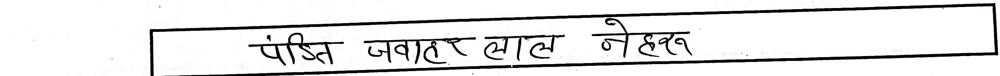

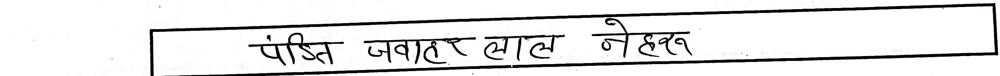

[108, 1416]


In [ ]:
###image_size=(273,2828)
image_size=(672,448)

folders=os.listdir('train')
i=0
j=0
images_names=os.listdir(os.path.join('train',folders[i]))

path=os.path.join('train',folders[i],images_names[j])
img=cv.imread(path)

img=Image.open(path)
print(type(img))
display(img)
#img=img.convert("L")
# cv2_imshow(img)
display(img)
print(list(np.array(np.shape(img))//2))

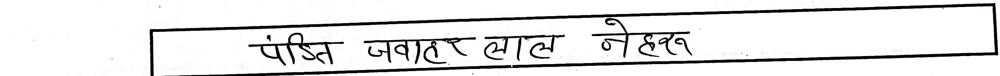

(2832, 217)

In [ ]:
display(img)
img.size

In [ ]:
import torchvision.transforms.functional as F


class custom_threshold:
	def __init__(self, threshold_value):
		self.threshold_value = threshold_value

	def __call__(self,tensor_img):
		tensor_img=tensor_img<self.threshold_value
		tensor_img=tensor_img.float()

		return(tensor_img)

class custom_resize_pad:
	def __init__(self,size):
		self.size=size

	def __call__(self,img):
		org_size=img.size
		l_ratio=self.size[0]/org_size[0]
		w_ratio=self.size[1]/org_size[1]
		if l_ratio<=w_ratio:
			#   img_size=(int(org_size[0]*l_ratio),int(org_size[1]*l_ratio))
			img_size=(int(org_size[1]*l_ratio),int(org_size[0]*l_ratio))

		else:
			#    img_size=(int(org_size[0]*w_ratio),int(org_size[1]*w_ratio))
			img_size=(int(org_size[1]*w_ratio),int(org_size[0]*w_ratio))

		transform_1=transforms.Resize(img_size)
		#print(l_ratio,w_ratio,img_size,org_size)
		img2=transform_1(img)
		#display(img2)

		#---padding----

		size_2=img2.size
		#print(size_2,self.size)
		top=(self.size[1]-size_2[1])//2
		bottom=self.size[1]-size_2[1]-top
		left=(self.size[0]-size_2[0])//2
		right=self.size[0]-size_2[0]-left
		padding=(left,top,right,bottom)
		#print('padding is ',padding)
		transform2=transforms.Pad(padding=padding,fill=254,padding_mode='constant')
		img3=transform2(img2)
		#print(img3.size)
		#display(img3)
		return(img3)

class greyscale_rgb:
	def __call__(self,image):
			rgb_tensor = image.expand(3, -1, -1)
			return(rgb_tensor)

transform=transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    # transforms.CenterCrop(image_size),

		custom_resize_pad(image_size),
		#transforms.CenterCrop((224,224)),
		transforms.ToTensor(),

		custom_threshold(0.6),
		#nn.Threshold(0.02,1)  # 1 is white 0 is black
    transforms.Normalize((0.5), (0.5)),
		#greyscale_rgb()
])


img2=transform(img)
print(np.shape(img2),
			np.shape(img))


torch.Size([1, 448, 672]) (217, 2832)


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F

plt.rcParams["savefig.bbox"] = 'tight'

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

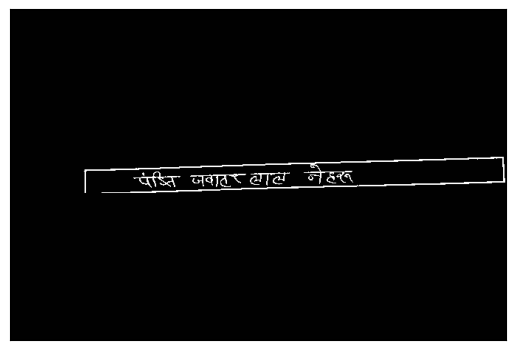

In [ ]:
from torchvision.utils import make_grid
from torchvision.io import read_image


grid=make_grid(img2)
show(grid)

In [ ]:
os.listdir()

['dataset_disclaimer.txt',
 'semi_final_data',
 '.DS_Store',
 'train',
 'val',
 'val.csv']

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def imshow(img, text=None, should_save=False):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(
            75,
            8,
            text,
            style="italic",
            fontweight="bold",
            bbox={"facecolor": "white", "alpha": 0.8, "pad": 10},
        )
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


def show_plot(iteration, loss):
    plt.plot(iteration, loss)
    plt.show()

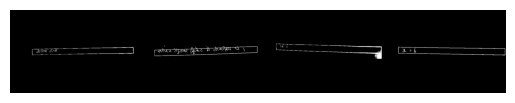

[[1.]
 [1.]]


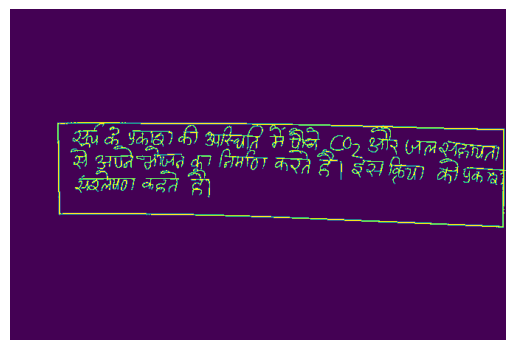

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as utils
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import torchvision.utils
#import config
#from utils import imshow, show_plot
#from contrastive import ContrastiveLoss
import torchvision
from torch.autograd import Variable
from PIL import Image
import PIL.ImageOps
import os


# load the dataset
training_dir = 'train'
testing_dir = 'semi_final_data/semi_test'
training_csv = '/content/drive/MyDrive/CV_Summer_Challenge/New_Train_Data.csv'
testing_csv = '/content/drive/MyDrive/CV_Summer_Challenge/SemifinalTestdata/test.csv'


# preprocessing and loading the dataset
class SiameseDataset:
    def __init__(self, training_csv=None, training_dir=None, transform=None,slice_ending=6400):
        # used to prepare the labels and images path
        train_df_1 = pd.read_csv(training_csv)
        self.train_df=train_df_1[:slice_ending]
        self.train_df.columns = ["image1", "image2", "label"]
        self.train_dir = training_dir
        self.transform = transform

    def __getitem__(self, index):

        # getting the image path
        image1_path = os.path.join(self.train_dir, self.train_df.iat[index, 0])
        image2_path = os.path.join(self.train_dir, self.train_df.iat[index, 1])

        # Loading the image
        img0 = Image.open(image1_path)
        img1 = Image.open(image2_path)
        # img0 = img0.convert("L")
        # img1 = img1.convert("L")

        # Apply image transformations
        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return (
            img0,
            img1,
            torch.from_numpy(
                np.array([int(self.train_df.iat[index, 2])], dtype=np.float32)
            ),
        )

    def __len__(self):
        return len(self.train_df)


# Load the the dataset from raw image folders
siamese_dataset = SiameseDataset(
    training_csv,
    training_dir,
    transform,
    6400
)


# Viewing the sample of images and to check whether its loading properly
vis_dataloader = DataLoader(siamese_dataset, shuffle=True, batch_size=2) #---------------------batch_size=8
dataiter = iter(vis_dataloader)


example_batch = next(dataiter)
concatenated = torch.cat((example_batch[0], example_batch[1]), 0)
imshow(torchvision.utils.make_grid(concatenated))
print(example_batch[2].numpy())
imshow(siamese_dataset[0][1])

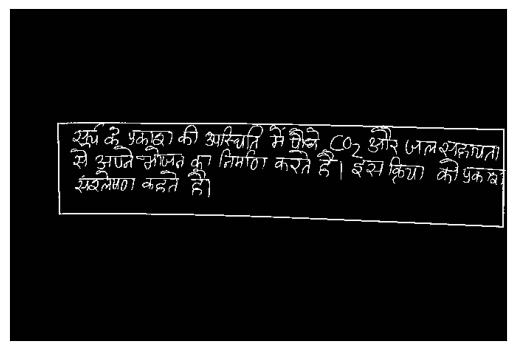

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F

plt.rcParams["savefig.bbox"] = 'tight'

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])


from torchvision.utils import make_grid
from torchvision.io import read_image
grid2=make_grid(siamese_dataset[0][1])
show(grid2)

## training


In [ ]:
import torch.nn as nn
import numpy as np
import torch.nn.functional as F


# class ContrastiveLoss(nn.Module):
#     "Contrastive loss function"

#     def __init__(self, margin=100.0):
#         super(ContrastiveLoss, self).__init__()
#         self.margin = margin

#     def forward(self, output1, output2, label):
#         euclidean_distance = F.pairwise_distance(output1, output2)
#         ##-----similar images ->1 and dissimilar images ->0
#         loss_contrastive = torch.mean(
#             (1 - label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0),3)
#             + (label) * torch.pow(euclidean_distance,2)
#         )

#         return loss_contrastive
class cosine_loss(nn.Module):

  def _init_(self,margin=2.0):
    super(cosine_loss, self)._init_()
    self.margin = margin

  def forward(self, output1, output2, label):
    cosine = F.cosine_similarity(output1,output2,dim=1)
    ##-----similar images ->1 and dissimilar images ->0
    # print("cosine size ",cosine.size())
    loss_cosine = torch.mean((1-label) * torch.pow(torch.clamp(2.0 * cosine,min=0.0),2)
                             + (label) * torch.pow((2.0*(1 - cosine)),2))
    return loss_cosine

In [ ]:
batch_size = 32#32
epochs = 30

##Approach->2) Transfer learning

In [ ]:
##-------VGG16
import torchvision.models as models

vgg16=models.vgg16(pretrained=True)
print(vgg16)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 211MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
import torch.nn as nn
import torch
for param in vgg16.parameters():
  param.requires_grad=True

# for param in vgg16.features[0:31].parameters():
#   param.requires_grad=True


In [ ]:
# img_rand=torch.randn([4,1,448,672])
# o1=cnn_resizing(img_rand)
# o1.size()

In [ ]:
# train_csv=pd.read_csv('New_Train_Data.csv')
# train_csv_2=train_csv[:6400]
# train_csv_2

In [ ]:
device=torch.device('cuda')
vgg16.to(device)

class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()

        self.cnn_resizing = nn.Sequential(

            nn.Conv2d(1, 3, kernel_size=3,stride=1,padding=2),
            nn.BatchNorm2d(3),
            #nn.LocalResponseNorm(5,alpha=0.0001,beta=0.75,k=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=(2,3)))



        # Setting up the Sequential of CNN Layers from vgg16 feature extraction cnn layers
        self.cnn1=vgg16.features

        # Defining the fully connected layers
        self.fc1 = nn.Sequential(
            nn.Linear(25088,1024),
            #nn.Linear(30976, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout2d(p=0.5),

            nn.Linear(1024, 128),
            nn.ReLU(inplace=True),

            nn.Linear(128,6))



    def forward_once(self, x):
        # Forward pass
        output = self.cnn_resizing(x)
        output = self.cnn1(output)
        output = output.view(output.size()[0], -1)
        dimension=output.size()[1]
        #print("output size is ",output.size())

        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # forward pass of input 1
        output1 = self.forward_once(input1)
        # forward pass of input 2
        output2 = self.forward_once(input2)
        return output1, output2

###---------------------------

###------------------------------


 # Load the dataset as pytorch tensors using dataloader
# siamese_dataset_eval= SiameseDataset(
#                       training_csv=testing_csv,
#                       training_dir=testing_dir,
#                       transform=transform,
#                       slice_ending=3000
#                       )

train_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=batch_size)

# eval_dataloader=DataLoader(siamese_dataset_eval,
#                            shuffle=True,
#                            num_workers=1,
#                            batch_size=5)



#train the model
def train(train_dataloader):
    loss=[]
    counter=[]
    iteration_number = 0
    for i, data in enumerate(train_dataloader,0):
      img0, img1 , label = data
      img0, img1 , label = img0.cuda(), img1.cuda() , label.cuda()
      optimizer.zero_grad()
      output1,output2 = net(img0,img1)
      torch.cuda.empty_cache()
      loss_cosine = criterion(output1,output2,label)
      loss_cosine.backward()

      optimizer.step()
      loss.append(loss_cosine.item())
      print(loss_cosine.item())
      print("iter number in trainng ",i)
    loss = np.array(loss)
    return loss.mean()#/len(train_dataloader)


def eval(eval_dataloader):
    loss=[]
    counter=[]
    iteration_number = 0
    for i, data in enumerate(eval_dataloader,0):
      img0, img1 , label = data
      img0, img1 , label = img0.cuda(), img1.cuda() , label.cuda()
      output1,output2 = net(img0,img1)
      loss_cosine = criterion(output1,output2,label)
      loss.append(loss_cosine.item())
      print("iter number in evaluating ",i)
      # if(i>740):
      #   break;
    loss = np.array(loss)
    return loss.mean()#/len(eval_dataloader)



In [ ]:
import pandas as pd

# Initialize an empty DataFrame
results = pd.DataFrame(columns=['best_eval_score', 'train_loss', 'eval_loss'])

# Save the DataFrame to a file
# results=results.append(pd.DataFrame({'train_loss':[5], 'eval_loss':[20]}),ignore_index=True)
# results['best_eval_score']=20
# results.to_csv('check_point.csv', index=False)
# results=results.append(pd.DataFrame({'train_loss':[3], 'eval_loss':[10]}),ignore_index=True)
# results.loc[0,'best_eval_score']=10
#results.loc[0,'best_eval_score']=999
results.loc[0,'best_eval_score']=1000000
results.to_csv('/content/drive/MyDrive/CV_Summer_Challenge/check_point_8.csv', index=False)
results=pd.read_csv('/content/drive/MyDrive/CV_Summer_Challenge/check_point_8.csv')

# results.to_csv('check_point.csv')
results

,best_eval_score,train_loss,eval_loss
0,1000000,NaN,NaN


In [ ]:

# Declare Siamese Network
torch.cuda.empty_cache()
net = SiameseNetwork().cuda()
# Decalre Loss Function
criterion = cosine_loss()
# Declare Optimizer
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=0.0005)

best_eval_loss = results.loc[0,'best_eval_score']
for epoch in range(1,epochs):

  torch.cuda.empty_cache()
  train_loss = train(train_dataloader)
  torch.cuda.empty_cache()
  eval_loss = eval(eval_dataloader)

  print(f"Training loss{train_loss}")
  print("-"*20)
  print(f"Eval loss{eval_loss}")
  torch.save(optimizer.state_dict(), "/content/drive/MyDrive/CV_Summer_Challenge/optmizer_state_8.pth")

  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
  print('results updated and optimizer saved')


  if eval_loss<best_eval_loss:
    best_eval_loss = eval_loss
    print("-"*20)
    print(f"Best Eval loss{best_eval_loss}")
    results.loc[0,'best_eval_score']=best_eval_loss
    torch.save(net.state_dict(), "/content/drive/MyDrive/CV_Summer_Challenge/model_8.pth")
    print("Model Saved Successfully")

  results.to_csv('/content/drive/MyDrive/CV_Summer_Challenge/check_point_8.csv',index=False)



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.1789560317993164
iter number in trainng  0
1.9278538227081299
iter number in trainng  1
1.4302459955215454
iter number in trainng  2
1.1339664459228516
iter number in trainng  3
1.8779104948043823
iter number in trainng  4
1.466869831085205
iter number in trainng  5
1.244762659072876
iter number in trainng  6
1.0411953926086426
iter number in trainng  7
1.3129678964614868
iter number in trainng  8
1.196851372718811
iter number in trainng  9
1.0766897201538086
iter number in trainng  10
1.39373779296875
iter number in trainng  11
1.1801660060882568
iter number in trainng  12
1.1325342655181885
iter number in trainng  13
1.1681435108184814
iter number in trainng  14
1.0971850156784058
iter number in trainng  15
1.1376676559448242
iter number in trainng  16
1.1609593629837036
iter number in trainng  17
1.1226930618286133
iter number in trainng  18
1.1995494365692139
iter number in trainng  19
1.0008760690689087
iter number in trainng  20
1.1913107633590698
iter number in trainng  21
1.1

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved
--------------------
Best Eval loss1.1117233613630135
Model Saved Successfully


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0185332298278809
iter number in trainng  0
1.0068234205245972
iter number in trainng  1
1.1045451164245605
iter number in trainng  2
1.0860865116119385
iter number in trainng  3
1.1061409711837769
iter number in trainng  4
1.0733516216278076
iter number in trainng  5
1.071926474571228
iter number in trainng  6
1.0961573123931885
iter number in trainng  7
1.1798677444458008
iter number in trainng  8
1.0819389820098877
iter number in trainng  9
1.1141531467437744
iter number in trainng  10
1.1050026416778564
iter number in trainng  11
1.1441304683685303
iter number in trainng  12
1.156944990158081
iter number in trainng  13
1.058335542678833
iter number in trainng  14
1.0832139253616333
iter number in trainng  15
1.0795481204986572
iter number in trainng  16
1.1075668334960938
iter number in trainng  17
1.118147850036621
iter number in trainng  18
1.114864468574524
iter number in trainng  19
1.2329764366149902
iter number in trainng  20
1.2157821655273438
iter number in trainng  21
0.9

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved
--------------------
Best Eval loss1.083967100083828
Model Saved Successfully


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.064204216003418
iter number in trainng  0
1.0786454677581787
iter number in trainng  1
1.0701241493225098
iter number in trainng  2
1.09580659866333
iter number in trainng  3
1.0800663232803345
iter number in trainng  4
1.06785249710083
iter number in trainng  5
1.1004596948623657
iter number in trainng  6
1.1038508415222168
iter number in trainng  7
1.0933619737625122
iter number in trainng  8
1.0551190376281738
iter number in trainng  9
1.1937897205352783
iter number in trainng  10
1.0603070259094238
iter number in trainng  11
1.0722404718399048
iter number in trainng  12
1.085090160369873
iter number in trainng  13
0.9981250762939453
iter number in trainng  14
1.0412018299102783
iter number in trainng  15
1.1954307556152344
iter number in trainng  16
0.9376864433288574
iter number in trainng  17
1.0385024547576904
iter number in trainng  18
1.150062918663025
iter number in trainng  19
1.0591742992401123
iter number in trainng  20
1.1380122900009155
iter number in trainng  21
1.082

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved
--------------------
Best Eval loss1.0758817880352338
Model Saved Successfully


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0915614366531372
iter number in trainng  0
1.0890703201293945
iter number in trainng  1
1.0776095390319824
iter number in trainng  2
1.0591663122177124
iter number in trainng  3
1.0484673976898193
iter number in trainng  4
1.0547051429748535
iter number in trainng  5
1.0503687858581543
iter number in trainng  6
1.0871936082839966
iter number in trainng  7
1.0730024576187134
iter number in trainng  8
1.08877694606781
iter number in trainng  9
1.1157305240631104
iter number in trainng  10
1.0901774168014526
iter number in trainng  11
1.0811803340911865
iter number in trainng  12
1.0892356634140015
iter number in trainng  13
1.0615607500076294
iter number in trainng  14
1.055753231048584
iter number in trainng  15
1.0819439888000488
iter number in trainng  16
1.0584921836853027
iter number in trainng  17
1.026545763015747
iter number in trainng  18
1.018653392791748
iter number in trainng  19
1.0855133533477783
iter number in trainng  20
1.056178092956543
iter number in trainng  21
1.04

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved
--------------------
Best Eval loss1.067841754257679
Model Saved Successfully


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0140939950942993
iter number in trainng  0
1.0718576908111572
iter number in trainng  1
1.05715811252594
iter number in trainng  2
1.0646846294403076
iter number in trainng  3
1.0804526805877686
iter number in trainng  4
1.08411705493927
iter number in trainng  5
1.0594608783721924
iter number in trainng  6
1.1522490978240967
iter number in trainng  7
1.2134828567504883
iter number in trainng  8
1.0876901149749756
iter number in trainng  9
1.0972850322723389
iter number in trainng  10
1.0438653230667114
iter number in trainng  11
1.0765933990478516
iter number in trainng  12
0.941692590713501
iter number in trainng  13
1.0593411922454834
iter number in trainng  14
1.1773314476013184
iter number in trainng  15
1.1900079250335693
iter number in trainng  16
1.223799705505371
iter number in trainng  17
1.2514762878417969
iter number in trainng  18
1.0602607727050781
iter number in trainng  19
1.0579742193222046
iter number in trainng  20
1.0399326086044312
iter number in trainng  21
1.07

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved
--------------------
Best Eval loss1.064441706140836
Model Saved Successfully


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.1196011304855347
iter number in trainng  0
1.0600634813308716
iter number in trainng  1
1.076287031173706
iter number in trainng  2
0.9861403703689575
iter number in trainng  3
1.0801869630813599
iter number in trainng  4
1.1963696479797363
iter number in trainng  5
1.1178832054138184
iter number in trainng  6
1.1754215955734253
iter number in trainng  7
0.987790584564209
iter number in trainng  8
1.1622356176376343
iter number in trainng  9
1.066704273223877
iter number in trainng  10
1.094496488571167
iter number in trainng  11
1.0864853858947754
iter number in trainng  12
1.069047212600708
iter number in trainng  13
1.0746631622314453
iter number in trainng  14
1.0250264406204224
iter number in trainng  15
1.0997732877731323
iter number in trainng  16
1.0643064975738525
iter number in trainng  17
1.133592128753662
iter number in trainng  18
1.069018840789795
iter number in trainng  19
1.0738279819488525
iter number in trainng  20
1.041266918182373
iter number in trainng  21
1.0823

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved
--------------------
Best Eval loss1.056224059164524
Model Saved Successfully


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.1063640117645264
iter number in trainng  0
1.0835838317871094
iter number in trainng  1
1.0298449993133545
iter number in trainng  2
1.0924350023269653
iter number in trainng  3
1.0495352745056152
iter number in trainng  4
1.1482760906219482
iter number in trainng  5
1.0953317880630493
iter number in trainng  6
1.0000916719436646
iter number in trainng  7
1.056079387664795
iter number in trainng  8
1.0796730518341064
iter number in trainng  9
1.0953466892242432
iter number in trainng  10
1.1022424697875977
iter number in trainng  11
1.0695101022720337
iter number in trainng  12
1.0727031230926514
iter number in trainng  13
1.0738084316253662
iter number in trainng  14
1.0394926071166992
iter number in trainng  15
1.109487533569336
iter number in trainng  16
1.1712965965270996
iter number in trainng  17
1.033198595046997
iter number in trainng  18
1.0449376106262207
iter number in trainng  19
1.2153282165527344
iter number in trainng  20
1.1277672052383423
iter number in trainng  21
1

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0414910316467285
iter number in trainng  0
1.05901038646698
iter number in trainng  1
1.0538809299468994
iter number in trainng  2
1.0504904985427856
iter number in trainng  3
1.0513336658477783
iter number in trainng  4
1.0518934726715088
iter number in trainng  5
1.0708504915237427
iter number in trainng  6
1.012575387954712
iter number in trainng  7
1.040726900100708
iter number in trainng  8
1.0473051071166992
iter number in trainng  9
1.0883184671401978
iter number in trainng  10
1.0573663711547852
iter number in trainng  11
1.0754342079162598
iter number in trainng  12
1.0614228248596191
iter number in trainng  13
1.1108880043029785
iter number in trainng  14
1.0803132057189941
iter number in trainng  15
1.059774398803711
iter number in trainng  16
1.0726542472839355
iter number in trainng  17
1.0762519836425781
iter number in trainng  18
1.0786269903182983
iter number in trainng  19
1.051164150238037
iter number in trainng  20
1.0939579010009766
iter number in trainng  21
1.14

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0507700443267822
iter number in trainng  0
1.048921823501587
iter number in trainng  1
1.0859694480895996
iter number in trainng  2
1.0602513551712036
iter number in trainng  3
1.0848493576049805
iter number in trainng  4
1.0622282028198242
iter number in trainng  5
1.0740222930908203
iter number in trainng  6
1.049281358718872
iter number in trainng  7
1.060440182685852
iter number in trainng  8
1.0591105222702026
iter number in trainng  9
1.0625079870224
iter number in trainng  10
1.1112521886825562
iter number in trainng  11
1.072082281112671
iter number in trainng  12
1.0490480661392212
iter number in trainng  13
1.063636064529419
iter number in trainng  14
1.083042860031128
iter number in trainng  15
1.0762431621551514
iter number in trainng  16
1.0713926553726196
iter number in trainng  17
1.0906366109848022
iter number in trainng  18
1.0674753189086914
iter number in trainng  19
1.0272235870361328
iter number in trainng  20
1.1105867624282837
iter number in trainng  21
1.06671

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0471758842468262
iter number in trainng  0
1.0169624090194702
iter number in trainng  1
1.1118214130401611
iter number in trainng  2
1.0912789106369019
iter number in trainng  3
1.0848443508148193
iter number in trainng  4
1.0411750078201294
iter number in trainng  5
1.034325361251831
iter number in trainng  6
1.0676567554473877
iter number in trainng  7
1.055577278137207
iter number in trainng  8
1.087678074836731
iter number in trainng  9
1.0384514331817627
iter number in trainng  10
1.0565853118896484
iter number in trainng  11
1.0379536151885986
iter number in trainng  12
1.0416815280914307
iter number in trainng  13
1.0546703338623047
iter number in trainng  14
1.064147710800171
iter number in trainng  15
1.0736756324768066
iter number in trainng  16
1.0817556381225586
iter number in trainng  17
1.06540846824646
iter number in trainng  18
1.0741207599639893
iter number in trainng  19
1.054726481437683
iter number in trainng  20
1.0809762477874756
iter number in trainng  21
1.076

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0692449808120728
iter number in trainng  0
1.0689772367477417
iter number in trainng  1
1.0786362886428833
iter number in trainng  2
1.070095181465149
iter number in trainng  3
1.0597825050354004
iter number in trainng  4
1.0594837665557861
iter number in trainng  5
1.089629888534546
iter number in trainng  6
1.0472217798233032
iter number in trainng  7
1.0862624645233154
iter number in trainng  8
1.1157219409942627
iter number in trainng  9
1.0560708045959473
iter number in trainng  10
1.030625820159912
iter number in trainng  11
1.0351958274841309
iter number in trainng  12
1.1399345397949219
iter number in trainng  13
1.0944744348526
iter number in trainng  14
1.1062333583831787
iter number in trainng  15
1.0444854497909546
iter number in trainng  16
1.070117473602295
iter number in trainng  17
1.0580872297286987
iter number in trainng  18
1.0595027208328247
iter number in trainng  19
1.0358622074127197
iter number in trainng  20
1.079403042793274
iter number in trainng  21
0.9848

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0738239288330078
iter number in trainng  0
1.065885066986084
iter number in trainng  1
1.0943288803100586
iter number in trainng  2
1.0639796257019043
iter number in trainng  3
1.077782154083252
iter number in trainng  4
1.0211420059204102
iter number in trainng  5
1.0892364978790283
iter number in trainng  6
1.0626049041748047
iter number in trainng  7
1.0610549449920654
iter number in trainng  8
1.0860528945922852
iter number in trainng  9
1.067345380783081
iter number in trainng  10
1.0760276317596436
iter number in trainng  11
1.0291690826416016
iter number in trainng  12
1.047267198562622
iter number in trainng  13
1.051121473312378
iter number in trainng  14
0.9897627830505371
iter number in trainng  15
0.9943373203277588
iter number in trainng  16
1.0883502960205078
iter number in trainng  17
1.2485311031341553
iter number in trainng  18
1.041968584060669
iter number in trainng  19
0.9699357748031616
iter number in trainng  20
1.2536240816116333
iter number in trainng  21
1.04

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved
--------------------
Best Eval loss1.0523357146978378
Model Saved Successfully


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.088663101196289
iter number in trainng  0
1.0590730905532837
iter number in trainng  1
1.0595684051513672
iter number in trainng  2
1.0776638984680176
iter number in trainng  3
1.1263532638549805
iter number in trainng  4
1.0699269771575928
iter number in trainng  5
1.029096245765686
iter number in trainng  6
1.0156702995300293
iter number in trainng  7
1.0718097686767578
iter number in trainng  8
1.0832102298736572
iter number in trainng  9
1.1305131912231445
iter number in trainng  10
1.0726776123046875
iter number in trainng  11
1.0405478477478027
iter number in trainng  12
1.0786744356155396
iter number in trainng  13
1.0550496578216553
iter number in trainng  14
1.0694522857666016
iter number in trainng  15
1.063651204109192
iter number in trainng  16
1.0370070934295654
iter number in trainng  17
1.2060365676879883
iter number in trainng  18
1.0796388387680054
iter number in trainng  19
1.0920066833496094
iter number in trainng  20
1.0539889335632324
iter number in trainng  21
1

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0774965286254883
iter number in trainng  0
0.983766496181488
iter number in trainng  1
1.0889089107513428
iter number in trainng  2
1.0583964586257935
iter number in trainng  3
1.061874270439148
iter number in trainng  4
1.0910682678222656
iter number in trainng  5
1.0513579845428467
iter number in trainng  6
1.0352251529693604
iter number in trainng  7
1.0617471933364868
iter number in trainng  8
1.052412748336792
iter number in trainng  9
1.03536856174469
iter number in trainng  10
1.0537657737731934
iter number in trainng  11
1.0857744216918945
iter number in trainng  12
1.0934224128723145
iter number in trainng  13
1.1199133396148682
iter number in trainng  14
1.0794217586517334
iter number in trainng  15
1.04966139793396
iter number in trainng  16
1.0417733192443848
iter number in trainng  17
1.0412323474884033
iter number in trainng  18
1.0508513450622559
iter number in trainng  19
1.0411124229431152
iter number in trainng  20
1.0697802305221558
iter number in trainng  21
1.096

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.05125892162323
iter number in trainng  0
1.0374830961227417
iter number in trainng  1
1.027860164642334
iter number in trainng  2
1.0678951740264893
iter number in trainng  3
1.083216667175293
iter number in trainng  4
1.0239431858062744
iter number in trainng  5
1.0945830345153809
iter number in trainng  6
1.0318882465362549
iter number in trainng  7
1.1047323942184448
iter number in trainng  8
1.0775457620620728
iter number in trainng  9
1.074023962020874
iter number in trainng  10
1.0639371871948242
iter number in trainng  11
1.0367926359176636
iter number in trainng  12
1.0151753425598145
iter number in trainng  13
0.9696531891822815
iter number in trainng  14
1.087903618812561
iter number in trainng  15
0.9864177107810974
iter number in trainng  16
1.0608797073364258
iter number in trainng  17
1.0828973054885864
iter number in trainng  18
0.9827137589454651
iter number in trainng  19
1.1339447498321533
iter number in trainng  20
1.0544137954711914
iter number in trainng  21
1.04

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0725733041763306
iter number in trainng  0
0.9935794472694397
iter number in trainng  1
1.046064019203186
iter number in trainng  2
1.0272237062454224
iter number in trainng  3
1.1865085363388062
iter number in trainng  4
1.1185096502304077
iter number in trainng  5
1.0682055950164795
iter number in trainng  6
1.075851321220398
iter number in trainng  7
1.0715160369873047
iter number in trainng  8
1.0497026443481445
iter number in trainng  9
1.0548124313354492
iter number in trainng  10
1.0616406202316284
iter number in trainng  11
1.079000473022461
iter number in trainng  12
1.0932937860488892
iter number in trainng  13
1.0329710245132446
iter number in trainng  14
1.114746332168579
iter number in trainng  15
1.0864313840866089
iter number in trainng  16
1.0432647466659546
iter number in trainng  17
1.0553061962127686
iter number in trainng  18
0.9950257539749146
iter number in trainng  19
1.060683012008667
iter number in trainng  20
1.0778167247772217
iter number in trainng  21
1.0

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0483241081237793
iter number in trainng  0
0.9954104423522949
iter number in trainng  1
1.1107181310653687
iter number in trainng  2
1.0588518381118774
iter number in trainng  3
1.115415096282959
iter number in trainng  4
1.0726068019866943
iter number in trainng  5
1.0462806224822998
iter number in trainng  6
1.0689125061035156
iter number in trainng  7
1.0283585786819458
iter number in trainng  8
1.036059856414795
iter number in trainng  9
1.1198945045471191
iter number in trainng  10
1.0941009521484375
iter number in trainng  11
1.0739929676055908
iter number in trainng  12
1.0452324151992798
iter number in trainng  13
1.0225183963775635
iter number in trainng  14
1.0366913080215454
iter number in trainng  15
1.0540852546691895
iter number in trainng  16
1.0446360111236572
iter number in trainng  17
1.092591404914856
iter number in trainng  18
1.0759086608886719
iter number in trainng  19
1.089430570602417
iter number in trainng  20
1.0654866695404053
iter number in trainng  21
1.

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0487210750579834
iter number in trainng  0
1.0424365997314453
iter number in trainng  1
1.069957971572876
iter number in trainng  2
1.0314981937408447
iter number in trainng  3
1.0567314624786377
iter number in trainng  4
1.1251829862594604
iter number in trainng  5
1.044546127319336
iter number in trainng  6
1.0648212432861328
iter number in trainng  7
1.0542547702789307
iter number in trainng  8
1.0494487285614014
iter number in trainng  9
1.087299108505249
iter number in trainng  10
1.0495758056640625
iter number in trainng  11
1.0733994245529175
iter number in trainng  12
1.0620545148849487
iter number in trainng  13
1.0608608722686768
iter number in trainng  14
1.1132264137268066
iter number in trainng  15
1.053819179534912
iter number in trainng  16
1.0587832927703857
iter number in trainng  17
1.0658161640167236
iter number in trainng  18
1.0617825984954834
iter number in trainng  19
1.0594143867492676
iter number in trainng  20
1.042716145515442
iter number in trainng  21
1.1

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.048631191253662
iter number in trainng  0
1.0681610107421875
iter number in trainng  1
1.0810719728469849
iter number in trainng  2
1.0739768743515015
iter number in trainng  3
1.0442122220993042
iter number in trainng  4
1.0727641582489014
iter number in trainng  5
1.0722672939300537
iter number in trainng  6
1.0533002614974976
iter number in trainng  7
1.0514277219772339
iter number in trainng  8
1.0546867847442627
iter number in trainng  9
1.0435940027236938
iter number in trainng  10
1.0645265579223633
iter number in trainng  11
1.214928388595581
iter number in trainng  12
1.0980170965194702
iter number in trainng  13
1.0904879570007324
iter number in trainng  14
1.0529909133911133
iter number in trainng  15
1.0358095169067383
iter number in trainng  16
1.063138723373413
iter number in trainng  17
1.0590620040893555
iter number in trainng  18
1.0659246444702148
iter number in trainng  19
0.9735438227653503
iter number in trainng  20
1.0363634824752808
iter number in trainng  21
1

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0707578659057617
iter number in trainng  0
1.0160822868347168
iter number in trainng  1
1.0551401376724243
iter number in trainng  2
1.104853868484497
iter number in trainng  3
1.052610158920288
iter number in trainng  4
1.061823844909668
iter number in trainng  5
1.0338493585586548
iter number in trainng  6
1.069197654724121
iter number in trainng  7
1.1067891120910645
iter number in trainng  8
1.05728280544281
iter number in trainng  9
1.101175308227539
iter number in trainng  10
1.0490748882293701
iter number in trainng  11
1.0739023685455322
iter number in trainng  12
1.0195704698562622
iter number in trainng  13
1.1340978145599365
iter number in trainng  14
1.0690186023712158
iter number in trainng  15
1.0810511112213135
iter number in trainng  16
1.0352144241333008
iter number in trainng  17
1.0890583992004395
iter number in trainng  18
1.1283283233642578
iter number in trainng  19
1.0798509120941162
iter number in trainng  20
1.0903325080871582
iter number in trainng  21
1.059

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0292727947235107
iter number in trainng  0
1.0828622579574585
iter number in trainng  1
1.0491702556610107
iter number in trainng  2
1.1515541076660156
iter number in trainng  3
1.1237351894378662
iter number in trainng  4
1.0614120960235596
iter number in trainng  5
1.043421745300293
iter number in trainng  6
1.0360827445983887
iter number in trainng  7
1.1136276721954346
iter number in trainng  8
1.051437497138977
iter number in trainng  9
1.0333666801452637
iter number in trainng  10
1.0689032077789307
iter number in trainng  11
1.0620379447937012
iter number in trainng  12
1.067748785018921
iter number in trainng  13
1.0883452892303467
iter number in trainng  14
1.0655779838562012
iter number in trainng  15
1.0751181840896606
iter number in trainng  16
1.0566465854644775
iter number in trainng  17
1.0497071743011475
iter number in trainng  18
1.1484915018081665
iter number in trainng  19
1.0659667253494263
iter number in trainng  20
1.041834831237793
iter number in trainng  21
1.

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.07292640209198
iter number in trainng  0
1.065047025680542
iter number in trainng  1
1.0603477954864502
iter number in trainng  2
1.0776803493499756
iter number in trainng  3
1.032301664352417
iter number in trainng  4
1.0756151676177979
iter number in trainng  5
1.018296241760254
iter number in trainng  6
1.1787866353988647
iter number in trainng  7
1.0809099674224854
iter number in trainng  8
1.0662097930908203
iter number in trainng  9
1.05423104763031
iter number in trainng  10
1.0908331871032715
iter number in trainng  11
1.0647082328796387
iter number in trainng  12
1.0921682119369507
iter number in trainng  13
1.10750150680542
iter number in trainng  14
1.0511244535446167
iter number in trainng  15
1.077303171157837
iter number in trainng  16
1.0589451789855957
iter number in trainng  17
1.0005055665969849
iter number in trainng  18
1.1613562107086182
iter number in trainng  19
1.0999774932861328
iter number in trainng  20
1.050898790359497
iter number in trainng  21
1.0469696

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0751776695251465
iter number in trainng  0
1.0344067811965942
iter number in trainng  1
1.0334067344665527
iter number in trainng  2
1.0740904808044434
iter number in trainng  3
1.0978268384933472
iter number in trainng  4
1.0459473133087158
iter number in trainng  5
1.0524852275848389
iter number in trainng  6
1.0739047527313232
iter number in trainng  7
1.032779574394226
iter number in trainng  8
1.050215244293213
iter number in trainng  9
1.0447900295257568
iter number in trainng  10
1.0385377407073975
iter number in trainng  11
1.1241540908813477
iter number in trainng  12
1.0744305849075317
iter number in trainng  13
1.0328339338302612
iter number in trainng  14
1.0708776712417603
iter number in trainng  15
1.0826170444488525
iter number in trainng  16
1.0342342853546143
iter number in trainng  17
1.0222139358520508
iter number in trainng  18
1.0628752708435059
iter number in trainng  19
1.0338771343231201
iter number in trainng  20
1.039147973060608
iter number in trainng  21
1

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0209605693817139
iter number in trainng  0
1.089935302734375
iter number in trainng  1
1.190041422843933
iter number in trainng  2
1.0258556604385376
iter number in trainng  3
1.0888009071350098
iter number in trainng  4
1.040698766708374
iter number in trainng  5
1.1022378206253052
iter number in trainng  6
1.0373859405517578
iter number in trainng  7
1.0527317523956299
iter number in trainng  8
1.0478579998016357
iter number in trainng  9
1.1047029495239258
iter number in trainng  10
1.0836535692214966
iter number in trainng  11
1.0714538097381592
iter number in trainng  12
1.0645625591278076
iter number in trainng  13
1.0727431774139404
iter number in trainng  14
1.118489384651184
iter number in trainng  15
1.1156326532363892
iter number in trainng  16
1.059194564819336
iter number in trainng  17
1.061039924621582
iter number in trainng  18
1.0451972484588623
iter number in trainng  19
1.0439324378967285
iter number in trainng  20
1.0448179244995117
iter number in trainng  21
1.06

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


0.9989844560623169
iter number in trainng  0
1.0995336771011353
iter number in trainng  1
0.8981322050094604
iter number in trainng  2
1.0299756526947021
iter number in trainng  3
1.0538198947906494
iter number in trainng  4
1.1221139430999756
iter number in trainng  5
1.047062635421753
iter number in trainng  6
1.054297924041748
iter number in trainng  7
1.0506583452224731
iter number in trainng  8
1.0480729341506958
iter number in trainng  9
1.1497714519500732
iter number in trainng  10
1.024196743965149
iter number in trainng  11
0.9973997473716736
iter number in trainng  12
1.0469378232955933
iter number in trainng  13
0.9921094179153442
iter number in trainng  14
0.9947443008422852
iter number in trainng  15
1.0535502433776855
iter number in trainng  16
1.0613045692443848
iter number in trainng  17
1.1007219552993774
iter number in trainng  18
1.0647741556167603
iter number in trainng  19
1.00913405418396
iter number in trainng  20
0.9398146271705627
iter number in trainng  21
1.0

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0072742700576782
iter number in trainng  0
1.0383667945861816
iter number in trainng  1
1.1223586797714233
iter number in trainng  2
1.0369648933410645
iter number in trainng  3
1.0711851119995117
iter number in trainng  4
1.03489351272583
iter number in trainng  5
1.033432960510254
iter number in trainng  6
1.1336255073547363
iter number in trainng  7
1.0416624546051025
iter number in trainng  8
0.9922136068344116
iter number in trainng  9
1.0562114715576172
iter number in trainng  10
1.0785638093948364
iter number in trainng  11
1.02252995967865
iter number in trainng  12
1.072092056274414
iter number in trainng  13
1.0774812698364258
iter number in trainng  14
1.0692232847213745
iter number in trainng  15
1.0672352313995361
iter number in trainng  16
1.0557209253311157
iter number in trainng  17
1.0410265922546387
iter number in trainng  18
1.0919690132141113
iter number in trainng  19
1.0477254390716553
iter number in trainng  20
1.0581562519073486
iter number in trainng  21
1.05

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.0792583227157593
iter number in trainng  0
1.0695264339447021
iter number in trainng  1
1.0714224576950073
iter number in trainng  2
1.0817739963531494
iter number in trainng  3
0.9743285775184631
iter number in trainng  4
1.0984524488449097
iter number in trainng  5
1.0352978706359863
iter number in trainng  6
1.0324825048446655
iter number in trainng  7
1.0505954027175903
iter number in trainng  8
1.120849847793579
iter number in trainng  9
1.0391297340393066
iter number in trainng  10
1.0259027481079102
iter number in trainng  11
1.0647053718566895
iter number in trainng  12
1.0157438516616821
iter number in trainng  13
1.098097801208496
iter number in trainng  14
1.0159449577331543
iter number in trainng  15
1.0023527145385742
iter number in trainng  16
0.9676469564437866
iter number in trainng  17
1.1464698314666748
iter number in trainng  18
1.0449928045272827
iter number in trainng  19
1.0847166776657104
iter number in trainng  20
1.0972588062286377
iter number in trainng  21


<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)


results updated and optimizer saved


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


1.1842458248138428
iter number in trainng  0
1.2105952501296997
iter number in trainng  1
1.0916247367858887
iter number in trainng  2
1.016416311264038
iter number in trainng  3
0.946764349937439
iter number in trainng  4
1.1222240924835205
iter number in trainng  5
1.092240333557129
iter number in trainng  6
1.0483402013778687
iter number in trainng  7
1.0752923488616943
iter number in trainng  8
1.0507628917694092
iter number in trainng  9
1.1008567810058594
iter number in trainng  10
1.067807674407959
iter number in trainng  11
1.0726163387298584
iter number in trainng  12
1.0868663787841797
iter number in trainng  13
1.0752151012420654
iter number in trainng  14
1.074505090713501
iter number in trainng  15
1.0720298290252686
iter number in trainng  16
1.084862470626831
iter number in trainng  17
1.058969259262085
iter number in trainng  18
1.0520821809768677
iter number in trainng  19
1.079556941986084
iter number in trainng  20
1.0637725591659546
iter number in trainng  21
1.0502

<ipython-input-26-8946c801abf5>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning,

1.0574746131896973
iter number in trainng  0
1.0498266220092773
iter number in trainng  1
1.0492303371429443
iter number in trainng  2
1.061510682106018
iter number in trainng  3
1.0420186519622803
iter number in trainng  4
1.0304574966430664
iter number in trainng  5
1.0645921230316162
iter number in trainng  6
1.0510234832763672
iter number in trainng  7
1.057488203048706
iter number in trainng  8
1.0602819919586182
iter number in trainng  9
1.0849958658218384
iter number in trainng  10
1.0717284679412842
iter number in trainng  11
1.0567338466644287
iter number in trainng  12
1.026796817779541
iter number in trainng  13
1.1481794118881226
iter number in trainng  14
1.0495350360870361
iter number in trainng  15
1.0481332540512085
iter number in trainng  16
1.094767689704895
iter number in trainng  17
1.1019917726516724
iter number in trainng  18
1.0412144660949707
iter number in trainng  19
1.0570732355117798
iter number in trainng  20
1.046151876449585
iter number in trainng  21
1.0

In [ ]:
#torch.save(optimizer.state_dict(),"optmizer_state.pth")

In [ ]:
#eval_loss

In [ ]:
# model_2=SiameseNetwork()
# model_2=model_2.cuda()
# path_model="model.pth"
# model_2.load_state_dict(torch.load(path_model))

#  # Load the dataset as pytorch tensors using dataloader
# train_dataloader = DataLoader(siamese_dataset,
#                         shuffle=True,
#                         num_workers=8,
#                         batch_size=batch_size)

# eval_dataloader=DataLoader(siamese_dataset,
#                            shuffle=True,
#                            num_workers=1,
#                            batch_size=5)

# # Decalre Loss Function
# criterion = ContrastiveLoss()
# # Declare Optimizer
# optimizer_2 = torch.optim.Adam(model_2.parameters(), lr=1e-3, weight_decay=0.0005)
# #optimizer_2=optimizer_2.cuda()
# path_optimizer="optmizer_state.pth"
# optimizer_2.load_state_dict(torch.load(path_optimizer))


# best_eval_loss = results.loc[0,'best_eval_score']

# #train the model
# loss_2=[]
# for epoch in range(1,epochs):
#   torch.cuda.empty_cache()
#   train_loss = train(train_dataloader)
#   torch.cuda.empty_cache()
#   eval_loss = eval(eval_dataloader)

#   print(f"Training loss{train_loss}")
#   print("-"*20)
#   print(f"Eval loss{eval_loss}")

#   loss_2.append(eval_loss)

#   print("eval loss list is ",loss_2)

#   torch.save(optimizer.state_dict(), "optmizer_state.pth")
#   results=results.append(pd.DataFrame({'train_loss':[train_loss], 'eval_loss':[eval_loss]}),ignore_index=True)
#   print('results updated and optimizer saved')

#   if eval_loss<best_eval_loss:
#     best_eval_loss = eval_loss
#     print("-"*20)
#     print(f"Best Eval loss{best_eval_loss}")
#     torch.save(model_2.state_dict(), "model.pth")
#     results.loc[0,'best_eval_value']=best_eval_loss
#     print("Model state Saved Successfully and best_eval_score updated")
#   results.to_csv('check_point.csv',index=False)


##testing

In [ ]:
import pandas as pd

eval_pd=pd.DataFrame(columns=['cosine','actual_label','pred_value'])
eval_pd.to_csv('/content/drive/MyDrive/CV_Summer_Challenge/eval_pd_test.csv',index=False)


In [ ]:
os.listdir()

['dataset_disclaimer.txt',
 'semi_final_data',
 '.DS_Store',
 'train',
 'val',
 'val.csv']

In [ ]:
testcsv = pd.read_csv('/content/drive/MyDrive/CV_Summer_Challenge/SemifinalTestdata/test.csv')
testcsv = pd.DataFrame({'img1_name': testcsv['img1_name'], 'img2_name': testcsv['img2_name'], 'label': np.zeros(len(testcsv)).astype(int) })
testcsv.to_csv('/content/drive/MyDrive/CV_Summer_Challenge/SemifinalTestdata/test.csv', index = False)
testcsv = pd.read_csv('/content/drive/MyDrive/CV_Summer_Challenge/SemifinalTestdata/test.csv')
testcsv.head()

,img1_name,img2_name,label
0,3861e092.jpg,b642bddc.jpg,0
1,776e0055.jpg,2d4e7d20.jpg,0
2,4bb7f909.jpg,af1b0fbf.jpg,0
3,0abee1d8.jpg,1c2641c9.jpg,0
4,1e18f51e.jpg,9fcf5c47.jpg,0


In [ ]:
# Load the test dataset


model_eval=SiameseNetwork().cuda()
# model_eval=model_eval.cuda()
path_model="/content/drive/MyDrive/CV_Summer_Challenge/SemifinalTestdata/model_7.pth"
model_eval.load_state_dict(torch.load(path_model))
model_eval.eval()



test_dataset = SiameseDataset(
    training_csv=testing_csv,
    training_dir=testing_dir,
    transform=transform,
    slice_ending=10586
)

test_dataloader = DataLoader(test_dataset, num_workers=0, batch_size=1, shuffle=False)

count = 0
different=[]
similar=[]

y_distances=[]

y_predict_list=[]
y_actual_list=[]

threshold_distance=0.98
for i, data in enumerate(test_dataloader, 0):
    print(count)
    x0, x1, label = data
    #concat = torch.cat((x0, x1), 0)
    torch.cuda.empty_cache()   ##--------------
    output1, output2 = model_eval(x0.to(device), x1.to(device))
    #output1, output2 = model_eval(x0, x1)

    eucledian_distance = F.cosine_similarity(output1,output2)

    torch.cuda.empty_cache()   ##--------------

    #print("output ",(output1.detach().cpu()).numpy())
    output1_np=output1.detach().cpu().numpy()
    output2_np=output2.detach().cpu().numpy()
    y_pred=int(eucledian_distance > threshold_distance)

    data_dicti={"cosine":[eucledian_distance.item()],
               "actual_label":[label.item()],
                "pred_value":y_pred
                }
    # y_distances.append(eucledian_distance.item())
    eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)



    torch.cuda.empty_cache()   ##----------------

    # y_predict_list.append(y_pred)
    # y_actual_list.append(y_act)

    if label == torch.FloatTensor([[1]]):
        label = "similar images "
        similar.append(eucledian_distance.item())
    else:
        label = "different images "
        different.append(eucledian_distance.item())

    # imshow(torchvision.utils.make_grid(concat))
    print("Predicted Eucledian Distance:-", eucledian_distance.item())
    print("Actual Label:-", label)
    print(count)
    count = count + 1

    eval_pd.to_csv('/content/drive/MyDrive/CV_Summer_Challenge/eval_pd_test.csv')

y_act_np=np.array(y_actual_list)
y_pred_np=np.array(y_predict_list)

# perf_array=(y_act_np==y_pred_np).astype(int)
# accuracy=np.mean(perf_array)
# print(accuracy)

0


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999222159385681
Actual Label:- different images 
0
1
Predicted Eucledian Distance:- 0.9999722242355347
Actual Label:- different images 
1
2
Predicted Eucledian Distance:- 0.9999675750732422
Actual Label:- different images 
2
3
Predicted Eucledian Distance:- 0.9925390481948853
Actual Label:- different images 
3
4
Predicted Eucledian Distance:- 0.9969235062599182
Actual Label:- different images 
4
5
Predicted Eucledian Distance:- 0.9999470710754395
Actual Label:- different images 
5
6
Predicted Eucledian Distance:- 0.9936022758483887
Actual Label:- different images 
6
7
Predicted Eucledian Distance:- 0.9999826550483704
Actual Label:- different images 
7


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8
Predicted Eucledian Distance:- 0.9992260932922363
Actual Label:- different images 
8
9
Predicted Eucledian Distance:- 0.9999499320983887
Actual Label:- different images 
9
10
Predicted Eucledian Distance:- 0.9999334812164307
Actual Label:- different images 
10
11
Predicted Eucledian Distance:- 0.9967992901802063
Actual Label:- different images 
11


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

12
Predicted Eucledian Distance:- 0.99538654088974
Actual Label:- different images 
12
13
Predicted Eucledian Distance:- 0.9999842047691345
Actual Label:- different images 
13
14
Predicted Eucledian Distance:- 0.9998899698257446
Actual Label:- different images 
14
15
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
15
16


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999663829803467
Actual Label:- different images 
16
17
Predicted Eucledian Distance:- 0.9931316375732422
Actual Label:- different images 
17
18
Predicted Eucledian Distance:- 0.9933897852897644
Actual Label:- different images 
18
19
Predicted Eucledian Distance:- 0.9921351671218872
Actual Label:- different images 
19
20


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999881386756897
Actual Label:- different images 
20
21
Predicted Eucledian Distance:- 0.9915867447853088
Actual Label:- different images 
21
22
Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
22
23
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
23
24
Predicted Eucledian Distance:- 0.9926673173904419
Actual Label:- different images 
24
25
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
25
26
Predicted Eucledian Distance:- 0.9923738837242126
Actual Label:- different images 
26
27
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
27
28
Predicted Eucledian Distance:- 0.9967635869979858
Actual Label:- different images 
28


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

29
Predicted Eucledian Distance:- 0.999997079372406
Actual Label:- different images 
29
30
Predicted Eucledian Distance:- 0.9998728036880493
Actual Label:- different images 
30
31
Predicted Eucledian Distance:- 0.9998961687088013
Actual Label:- different images 
31
32
Predicted Eucledian Distance:- 0.9999666213989258
Actual Label:- different images 
32
33


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999898374080658
Actual Label:- different images 
33
34
Predicted Eucledian Distance:- 0.9999638199806213
Actual Label:- different images 
34
35
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
35
36
Predicted Eucledian Distance:- 0.9999322295188904
Actual Label:- different images 
36
37
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
37
38


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999740123748779
Actual Label:- different images 
38
39
Predicted Eucledian Distance:- 0.9998731017112732
Actual Label:- different images 
39
40
Predicted Eucledian Distance:- 0.999944269657135
Actual Label:- different images 
40
41
Predicted Eucledian Distance:- 0.9999036192893982
Actual Label:- different images 
41
42
Predicted Eucledian Distance:- 0.9999833106994629
Actual Label:- different images 
42
43


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9835355877876282
Actual Label:- different images 
43
44
Predicted Eucledian Distance:- 0.9999632835388184
Actual Label:- different images 
44
45
Predicted Eucledian Distance:- 0.999840259552002
Actual Label:- different images 
45
46
Predicted Eucledian Distance:- 0.9999693632125854
Actual Label:- different images 
46
47
Predicted Eucledian Distance:- 0.9999932646751404
Actual Label:- different images 
47
48


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.989260733127594
Actual Label:- different images 
48
49
Predicted Eucledian Distance:- 0.9999141097068787
Actual Label:- different images 
49
50
Predicted Eucledian Distance:- 0.9999710321426392
Actual Label:- different images 
50
51
Predicted Eucledian Distance:- 0.9999285340309143
Actual Label:- different images 
51
52
Predicted Eucledian Distance:- 0.9999673366546631
Actual Label:- different images 
52
53


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
53
54
Predicted Eucledian Distance:- 0.9943580031394958
Actual Label:- different images 
54
55
Predicted Eucledian Distance:- 0.999936580657959
Actual Label:- different images 
55
56
Predicted Eucledian Distance:- 0.9998279809951782
Actual Label:- different images 
56
57
Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
57
58


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999626278877258
Actual Label:- different images 
58
59
Predicted Eucledian Distance:- 0.999812126159668
Actual Label:- different images 
59
60
Predicted Eucledian Distance:- 0.9912715554237366
Actual Label:- different images 
60
61
Predicted Eucledian Distance:- 0.9998888969421387
Actual Label:- different images 
61
62
Predicted Eucledian Distance:- 0.9999732375144958
Actual Label:- different images 
62
63
Predicted Eucledian Distance:- 0.9999762177467346
Actual Label:- different images 
63


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

64
Predicted Eucledian Distance:- 0.9961651563644409
Actual Label:- different images 
64
65
Predicted Eucledian Distance:- 0.9928382635116577
Actual Label:- different images 
65
66
Predicted Eucledian Distance:- 0.9998407363891602
Actual Label:- different images 
66
67
Predicted Eucledian Distance:- 0.9999560117721558
Actual Label:- different images 
67
68
Predicted Eucledian Distance:- 0.9999712109565735
Actual Label:- different images 
68


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

69
Predicted Eucledian Distance:- 0.9999682903289795
Actual Label:- different images 
69
70
Predicted Eucledian Distance:- 0.9998337626457214
Actual Label:- different images 
70
71
Predicted Eucledian Distance:- 0.9998926520347595
Actual Label:- different images 
71
72
Predicted Eucledian Distance:- 0.9999347925186157
Actual Label:- different images 
72
73
Predicted Eucledian Distance:- 0.9999885559082031
Actual Label:- different images 
73
74
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
74
75
Predicted Eucledian Distance:- 0.989342212677002
Actual Label:- different images 
75
76
Predicted Eucledian Distance:- 0.9953247904777527
Actual Label:- different images 
76
77
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
77
78


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9892404079437256
Actual Label:- different images 
78
79
Predicted Eucledian Distance:- 0.9999536871910095
Actual Label:- different images 
79
80
Predicted Eucledian Distance:- 0.9998325109481812
Actual Label:- different images 
80
81
Predicted Eucledian Distance:- 0.9895539879798889
Actual Label:- different images 
81
82
Predicted Eucledian Distance:- 0.9997974038124084
Actual Label:- different images 
82


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

83
Predicted Eucledian Distance:- 0.9936756491661072
Actual Label:- different images 
83
84
Predicted Eucledian Distance:- 0.9907708168029785
Actual Label:- different images 
84
85
Predicted Eucledian Distance:- 0.9999650716781616
Actual Label:- different images 
85
86
Predicted Eucledian Distance:- 0.999915361404419
Actual Label:- different images 
86
87
Predicted Eucledian Distance:- 0.9997128248214722
Actual Label:- different images 
87


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

88
Predicted Eucledian Distance:- 0.999923586845398
Actual Label:- different images 
88
89
Predicted Eucledian Distance:- 0.9999935030937195
Actual Label:- different images 
89
90
Predicted Eucledian Distance:- 0.9925752878189087
Actual Label:- different images 
90
91
Predicted Eucledian Distance:- 0.9999579787254333
Actual Label:- different images 
91
92
Predicted Eucledian Distance:- 0.9999189376831055
Actual Label:- different images 
92


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

93
Predicted Eucledian Distance:- 0.9998849630355835
Actual Label:- different images 
93
94
Predicted Eucledian Distance:- 0.9999756813049316
Actual Label:- different images 
94
95
Predicted Eucledian Distance:- 0.9999287724494934
Actual Label:- different images 
95
96
Predicted Eucledian Distance:- 0.9999739527702332
Actual Label:- different images 
96
97
Predicted Eucledian Distance:- 0.9980936050415039
Actual Label:- different images 
97


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

98
Predicted Eucledian Distance:- 0.9999426603317261
Actual Label:- different images 
98
99
Predicted Eucledian Distance:- 0.9951798319816589
Actual Label:- different images 
99
100
Predicted Eucledian Distance:- 0.9910271167755127
Actual Label:- different images 
100
101
Predicted Eucledian Distance:- 0.9914119243621826
Actual Label:- different images 
101
102


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999279379844666
Actual Label:- different images 
102
103
Predicted Eucledian Distance:- 0.9999286532402039
Actual Label:- different images 
103
104
Predicted Eucledian Distance:- 0.9920443296432495
Actual Label:- different images 
104
105
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
105
106
Predicted Eucledian Distance:- 0.9998960494995117
Actual Label:- different images 
106
107


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999687671661377
Actual Label:- different images 
107
108
Predicted Eucledian Distance:- 0.9974666833877563
Actual Label:- different images 
108
109
Predicted Eucledian Distance:- 0.9999449849128723
Actual Label:- different images 
109
110
Predicted Eucledian Distance:- 0.9997284412384033
Actual Label:- different images 
110
111
Predicted Eucledian Distance:- 0.9999586343765259
Actual Label:- different images 
111
112


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9953567385673523
Actual Label:- different images 
112
113
Predicted Eucledian Distance:- 0.9968709945678711
Actual Label:- different images 
113
114
Predicted Eucledian Distance:- 0.9999707937240601
Actual Label:- different images 
114
115
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
115
116
Predicted Eucledian Distance:- 0.9999611377716064
Actual Label:- different images 
116
117


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999508857727051
Actual Label:- different images 
117
118
Predicted Eucledian Distance:- 0.999968945980072
Actual Label:- different images 
118
119
Predicted Eucledian Distance:- 0.9999663233757019
Actual Label:- different images 
119
120
Predicted Eucledian Distance:- 0.9998370409011841
Actual Label:- different images 
120
121
Predicted Eucledian Distance:- 0.9999911785125732
Actual Label:- different images 
121
122


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999361038208008
Actual Label:- different images 
122
123
Predicted Eucledian Distance:- 0.9999492168426514
Actual Label:- different images 
123
124
Predicted Eucledian Distance:- 0.9955554604530334
Actual Label:- different images 
124
125
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
125
126
Predicted Eucledian Distance:- 0.9963874816894531
Actual Label:- different images 
126
127


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999340772628784
Actual Label:- different images 
127
128
Predicted Eucledian Distance:- 0.9999574422836304
Actual Label:- different images 
128
129
Predicted Eucledian Distance:- 0.9998976588249207
Actual Label:- different images 
129
130
Predicted Eucledian Distance:- 0.9999576807022095
Actual Label:- different images 
130
131
Predicted Eucledian Distance:- 0.9999183416366577
Actual Label:- different images 
131
132


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9996836185455322
Actual Label:- different images 
132
133
Predicted Eucledian Distance:- 0.9999818801879883
Actual Label:- different images 
133
134
Predicted Eucledian Distance:- 0.9999365210533142
Actual Label:- different images 
134
135
Predicted Eucledian Distance:- 0.9999386668205261
Actual Label:- different images 
135
136
Predicted Eucledian Distance:- 0.9999732375144958
Actual Label:- different images 
136
137


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999763369560242
Actual Label:- different images 
137
138
Predicted Eucledian Distance:- 0.999912679195404
Actual Label:- different images 
138
139
Predicted Eucledian Distance:- 0.9999887347221375
Actual Label:- different images 
139
140
Predicted Eucledian Distance:- 0.9972828030586243
Actual Label:- different images 
140
141
Predicted Eucledian Distance:- 0.9999712109565735
Actual Label:- different images 
141
142


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999849796295166
Actual Label:- different images 
142
143
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
143
144
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
144
145
Predicted Eucledian Distance:- 0.999921441078186
Actual Label:- different images 
145
146
Predicted Eucledian Distance:- 0.9999915957450867
Actual Label:- different images 
146
147
Predicted Eucledian Distance:- 0.9999889731407166
Actual Label:- different images 
147
148
Predicted Eucledian Distance:- 0.9941414594650269
Actual Label:- different images 
148
149
Predicted Eucledian Distance:- 0.9999808073043823
Actual Label:- different images 
149
150
Predicted Eucledian Distance:- 0.9999892115592957
Actual Label:- different images 
150
151
Predicted Eucledian Distance:- 0.9999768733978271
Actual Label:- different images 
151
152
Predicted Eucledian Distance:- 0.999792218208313
Actual Label:- different images 
152


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

153
Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
153
154
Predicted Eucledian Distance:- 0.9928231239318848
Actual Label:- different images 
154
155
Predicted Eucledian Distance:- 0.9997509717941284
Actual Label:- different images 
155
156
Predicted Eucledian Distance:- 0.9999938607215881
Actual Label:- different images 
156
157
Predicted Eucledian Distance:- 0.9999563694000244
Actual Label:- different images 
157


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

158
Predicted Eucledian Distance:- 0.9935145974159241
Actual Label:- different images 
158
159
Predicted Eucledian Distance:- 0.9999886751174927
Actual Label:- different images 
159
160
Predicted Eucledian Distance:- 0.9999345541000366
Actual Label:- different images 
160
161
Predicted Eucledian Distance:- 0.9860827922821045
Actual Label:- different images 
161


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

162
Predicted Eucledian Distance:- 0.9932470321655273
Actual Label:- different images 
162
163
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
163
164
Predicted Eucledian Distance:- 0.9998858571052551
Actual Label:- different images 
164
165
Predicted Eucledian Distance:- 0.999794065952301
Actual Label:- different images 
165


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

166
Predicted Eucledian Distance:- 0.9858986139297485
Actual Label:- different images 
166
167
Predicted Eucledian Distance:- 0.9906761050224304
Actual Label:- different images 
167
168
Predicted Eucledian Distance:- 0.9999334216117859
Actual Label:- different images 
168
169
Predicted Eucledian Distance:- 0.999989926815033
Actual Label:- different images 
169


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

170
Predicted Eucledian Distance:- 0.9908005595207214
Actual Label:- different images 
170
171
Predicted Eucledian Distance:- 0.9890447854995728
Actual Label:- different images 
171
172
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
172
173


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9978127479553223
Actual Label:- different images 
173
174
Predicted Eucledian Distance:- 0.9918933510780334
Actual Label:- different images 
174
175
Predicted Eucledian Distance:- 0.9999664425849915
Actual Label:- different images 
175
176
Predicted Eucledian Distance:- 0.9997140169143677
Actual Label:- different images 
176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

177
Predicted Eucledian Distance:- 0.9903436303138733
Actual Label:- different images 
177
178
Predicted Eucledian Distance:- 0.9999886751174927
Actual Label:- different images 
178
179
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
179
180
Predicted Eucledian Distance:- 0.9999131560325623
Actual Label:- different images 
180


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

181
Predicted Eucledian Distance:- 0.9999658465385437
Actual Label:- different images 
181
182
Predicted Eucledian Distance:- 0.9999819993972778
Actual Label:- different images 
182
183
Predicted Eucledian Distance:- 0.9861916899681091
Actual Label:- different images 
183
184
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
184


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

185
Predicted Eucledian Distance:- 0.999984860420227
Actual Label:- different images 
185
186
Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
186
187
Predicted Eucledian Distance:- 0.9998642206192017
Actual Label:- different images 
187
188
Predicted Eucledian Distance:- 0.9922801852226257
Actual Label:- different images 
188


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

189
Predicted Eucledian Distance:- 0.9998586773872375
Actual Label:- different images 
189
190
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
190
191
Predicted Eucledian Distance:- 0.99993497133255
Actual Label:- different images 
191
192
Predicted Eucledian Distance:- 0.9999974370002747
Actual Label:- different images 
192


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

193
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
193
194
Predicted Eucledian Distance:- 0.9915779829025269
Actual Label:- different images 
194
195
Predicted Eucledian Distance:- 0.9999710321426392
Actual Label:- different images 
195
196


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9953014254570007
Actual Label:- different images 
196
197
Predicted Eucledian Distance:- 0.9999903440475464
Actual Label:- different images 
197
198
Predicted Eucledian Distance:- 0.9927393198013306
Actual Label:- different images 
198
199
Predicted Eucledian Distance:- 0.9913690090179443
Actual Label:- different images 
199


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

200
Predicted Eucledian Distance:- 0.999989926815033
Actual Label:- different images 
200
201
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
201
202
Predicted Eucledian Distance:- 0.9999195337295532
Actual Label:- different images 
202
203
Predicted Eucledian Distance:- 0.999729335308075
Actual Label:- different images 
203


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

204
Predicted Eucledian Distance:- 0.99312424659729
Actual Label:- different images 
204
205
Predicted Eucledian Distance:- 0.9999281167984009
Actual Label:- different images 
205
206
Predicted Eucledian Distance:- 0.9999654293060303
Actual Label:- different images 
206
207
Predicted Eucledian Distance:- 0.9926466345787048
Actual Label:- different images 
207


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

208
Predicted Eucledian Distance:- 0.9999359250068665
Actual Label:- different images 
208
209
Predicted Eucledian Distance:- 0.9999096393585205
Actual Label:- different images 
209
210
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
210
211


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9893478155136108
Actual Label:- different images 
211
212
Predicted Eucledian Distance:- 0.9999690651893616
Actual Label:- different images 
212
213
Predicted Eucledian Distance:- 0.9999997615814209
Actual Label:- different images 
213
214
Predicted Eucledian Distance:- 0.9979134798049927
Actual Label:- different images 
214


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

215
Predicted Eucledian Distance:- 0.9999831318855286
Actual Label:- different images 
215
216
Predicted Eucledian Distance:- 0.9925057888031006
Actual Label:- different images 
216
217
Predicted Eucledian Distance:- 0.9910708069801331
Actual Label:- different images 
217
218


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
218
219
Predicted Eucledian Distance:- 0.9999401569366455
Actual Label:- different images 
219
220
Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
220
221
Predicted Eucledian Distance:- 0.9999541640281677
Actual Label:- different images 
221


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

222
Predicted Eucledian Distance:- 0.9964027404785156
Actual Label:- different images 
222
223
Predicted Eucledian Distance:- 0.9997991919517517
Actual Label:- different images 
223
224
Predicted Eucledian Distance:- 0.9931225180625916
Actual Label:- different images 
224
225
Predicted Eucledian Distance:- 0.9929394721984863
Actual Label:- different images 
225


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

226
Predicted Eucledian Distance:- 0.995853066444397
Actual Label:- different images 
226
227
Predicted Eucledian Distance:- 0.9945811033248901
Actual Label:- different images 
227
228
Predicted Eucledian Distance:- 0.9999505877494812
Actual Label:- different images 
228
229
Predicted Eucledian Distance:- 0.9971996545791626
Actual Label:- different images 
229
230


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998132586479187
Actual Label:- different images 
230
231
Predicted Eucledian Distance:- 0.9999878406524658
Actual Label:- different images 
231
232
Predicted Eucledian Distance:- 0.9999900460243225
Actual Label:- different images 
232
233
Predicted Eucledian Distance:- 0.9999319314956665
Actual Label:- different images 
233
234
Predicted Eucledian Distance:- 0.9910376071929932
Actual Label:- different images 
234


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

235
Predicted Eucledian Distance:- 0.9998549818992615
Actual Label:- different images 
235
236
Predicted Eucledian Distance:- 0.9974428415298462
Actual Label:- different images 
236
237
Predicted Eucledian Distance:- 0.9999815225601196
Actual Label:- different images 
237
238
Predicted Eucledian Distance:- 0.995146632194519
Actual Label:- different images 
238
239


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
239
240
Predicted Eucledian Distance:- 0.9999115467071533
Actual Label:- different images 
240
241
Predicted Eucledian Distance:- 0.999948263168335
Actual Label:- different images 
241
242
Predicted Eucledian Distance:- 0.997503399848938
Actual Label:- different images 
242
243
Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
243
244


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998975992202759
Actual Label:- different images 
244
245
Predicted Eucledian Distance:- 0.9998472929000854
Actual Label:- different images 
245
246
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
246
247
Predicted Eucledian Distance:- 0.9999203085899353
Actual Label:- different images 
247
248
Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
248


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

249
Predicted Eucledian Distance:- 0.999968945980072
Actual Label:- different images 
249
250
Predicted Eucledian Distance:- 0.9998359680175781
Actual Label:- different images 
250
251
Predicted Eucledian Distance:- 0.9999455213546753
Actual Label:- different images 
251
252
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
252
253
Predicted Eucledian Distance:- 0.9998037815093994
Actual Label:- different images 
253


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

254
Predicted Eucledian Distance:- 0.9999766945838928
Actual Label:- different images 
254
255
Predicted Eucledian Distance:- 0.9965301752090454
Actual Label:- different images 
255
256
Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
256
257
Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
257
258
Predicted Eucledian Distance:- 0.9999650716781616
Actual Label:- different images 
258


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

259
Predicted Eucledian Distance:- 0.9950060248374939
Actual Label:- different images 
259
260
Predicted Eucledian Distance:- 0.999954104423523
Actual Label:- different images 
260
261
Predicted Eucledian Distance:- 0.9924587607383728
Actual Label:- different images 
261
262
Predicted Eucledian Distance:- 0.9999551773071289
Actual Label:- different images 
262
263


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9915627837181091
Actual Label:- different images 
263
264
Predicted Eucledian Distance:- 0.9936403036117554
Actual Label:- different images 
264
265
Predicted Eucledian Distance:- 0.999908447265625
Actual Label:- different images 
265
266
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
266
267


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9948101043701172
Actual Label:- different images 
267
268
Predicted Eucledian Distance:- 0.9999678730964661
Actual Label:- different images 
268
269
Predicted Eucledian Distance:- 0.9959160089492798
Actual Label:- different images 
269
270
Predicted Eucledian Distance:- 0.9999558329582214
Actual Label:- different images 
270
271


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999697804450989
Actual Label:- different images 
271
272
Predicted Eucledian Distance:- 0.999983012676239
Actual Label:- different images 
272
273
Predicted Eucledian Distance:- 0.9931329488754272
Actual Label:- different images 
273
274
Predicted Eucledian Distance:- 0.9999033212661743
Actual Label:- different images 
274
275
Predicted Eucledian Distance:- 0.9999556541442871
Actual Label:- different images 
275


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

276
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
276
277
Predicted Eucledian Distance:- 0.9999579191207886
Actual Label:- different images 
277
278
Predicted Eucledian Distance:- 0.9999745488166809
Actual Label:- different images 
278
279
Predicted Eucledian Distance:- 0.9999620318412781
Actual Label:- different images 
279
280
Predicted Eucledian Distance:- 0.9999619722366333
Actual Label:- different images 
280
281


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999983906745911
Actual Label:- different images 
281
282
Predicted Eucledian Distance:- 0.9999730587005615
Actual Label:- different images 
282
283
Predicted Eucledian Distance:- 0.999973475933075
Actual Label:- different images 
283
284
Predicted Eucledian Distance:- 0.9999980926513672
Actual Label:- different images 
284
285
Predicted Eucledian Distance:- 0.99473637342453
Actual Label:- different images 
285


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

286
Predicted Eucledian Distance:- 0.999902606010437
Actual Label:- different images 
286
287
Predicted Eucledian Distance:- 0.9915409684181213
Actual Label:- different images 
287
288
Predicted Eucledian Distance:- 0.9992910027503967
Actual Label:- different images 
288
289
Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
289
290


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999749660491943
Actual Label:- different images 
290
291
Predicted Eucledian Distance:- 0.9999403953552246
Actual Label:- different images 
291
292
Predicted Eucledian Distance:- 0.9998294711112976
Actual Label:- different images 
292
293
Predicted Eucledian Distance:- 0.9998854994773865
Actual Label:- different images 
293
294
Predicted Eucledian Distance:- 0.9998676180839539
Actual Label:- different images 
294


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

295
Predicted Eucledian Distance:- 0.99996417760849
Actual Label:- different images 
295
296
Predicted Eucledian Distance:- 0.9999481439590454
Actual Label:- different images 
296
297
Predicted Eucledian Distance:- 0.9998749494552612
Actual Label:- different images 
297
298
Predicted Eucledian Distance:- 0.9999410510063171
Actual Label:- different images 
298
299
Predicted Eucledian Distance:- 0.9999127984046936
Actual Label:- different images 
299


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

300
Predicted Eucledian Distance:- 0.9999558329582214
Actual Label:- different images 
300
301
Predicted Eucledian Distance:- 0.9998735189437866
Actual Label:- different images 
301
302
Predicted Eucledian Distance:- 0.9997469186782837
Actual Label:- different images 
302
303
Predicted Eucledian Distance:- 0.9996433258056641
Actual Label:- different images 
303
304
Predicted Eucledian Distance:- 0.9999849796295166
Actual Label:- different images 
304
305


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999762773513794
Actual Label:- different images 
305
306
Predicted Eucledian Distance:- 0.9924142360687256
Actual Label:- different images 
306
307
Predicted Eucledian Distance:- 0.9999722242355347
Actual Label:- different images 
307
308
Predicted Eucledian Distance:- 0.9999497532844543
Actual Label:- different images 
308
309
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
309
310


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999444484710693
Actual Label:- different images 
310
311
Predicted Eucledian Distance:- 0.9948982000350952
Actual Label:- different images 
311
312
Predicted Eucledian Distance:- 0.9999939203262329
Actual Label:- different images 
312
313
Predicted Eucledian Distance:- 0.9912630915641785
Actual Label:- different images 
313
314
Predicted Eucledian Distance:- 0.9999197721481323
Actual Label:- different images 
314


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

315
Predicted Eucledian Distance:- 0.9999412298202515
Actual Label:- different images 
315
316
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
316
317
Predicted Eucledian Distance:- 0.9999536275863647
Actual Label:- different images 
317
318
Predicted Eucledian Distance:- 0.9998555183410645
Actual Label:- different images 
318
319
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
319


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

320
Predicted Eucledian Distance:- 0.9999859929084778
Actual Label:- different images 
320
321
Predicted Eucledian Distance:- 0.999998152256012
Actual Label:- different images 
321
322
Predicted Eucledian Distance:- 0.9999721050262451
Actual Label:- different images 
322
323
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
323
324
Predicted Eucledian Distance:- 0.9997992515563965
Actual Label:- different images 
324


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

325
Predicted Eucledian Distance:- 0.986923098564148
Actual Label:- different images 
325
326
Predicted Eucledian Distance:- 0.9959956407546997
Actual Label:- different images 
326
327
Predicted Eucledian Distance:- 0.9999973177909851
Actual Label:- different images 
327
328
Predicted Eucledian Distance:- 0.9904407858848572
Actual Label:- different images 
328
329


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
329
330
Predicted Eucledian Distance:- 0.9894847273826599
Actual Label:- different images 
330
331
Predicted Eucledian Distance:- 0.9939084649085999
Actual Label:- different images 
331
332
Predicted Eucledian Distance:- 0.9998865127563477
Actual Label:- different images 
332


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

333
Predicted Eucledian Distance:- 0.9950706362724304
Actual Label:- different images 
333
334
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
334
335
Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
335
336
Predicted Eucledian Distance:- 0.99997478723526
Actual Label:- different images 
336
337
Predicted Eucledian Distance:- 0.9999437928199768
Actual Label:- different images 
337


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

338
Predicted Eucledian Distance:- 0.99998939037323
Actual Label:- different images 
338
339
Predicted Eucledian Distance:- 0.999967098236084
Actual Label:- different images 
339
340
Predicted Eucledian Distance:- 0.9999526739120483
Actual Label:- different images 
340
341
Predicted Eucledian Distance:- 0.9999653697013855
Actual Label:- different images 
341
342
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
342


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

343
Predicted Eucledian Distance:- 0.9938982129096985
Actual Label:- different images 
343
344
Predicted Eucledian Distance:- 0.9999315738677979
Actual Label:- different images 
344
345
Predicted Eucledian Distance:- 0.9999515414237976
Actual Label:- different images 
345
346
Predicted Eucledian Distance:- 0.9998911023139954
Actual Label:- different images 
346
347
Predicted Eucledian Distance:- 0.9999908804893494
Actual Label:- different images 
347


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

348
Predicted Eucledian Distance:- 0.9999622106552124
Actual Label:- different images 
348
349
Predicted Eucledian Distance:- 0.9999741315841675
Actual Label:- different images 
349
350
Predicted Eucledian Distance:- 0.9948366284370422
Actual Label:- different images 
350
351
Predicted Eucledian Distance:- 0.9999700784683228
Actual Label:- different images 
351
352


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999833881855011
Actual Label:- different images 
352
353
Predicted Eucledian Distance:- 0.9998412728309631
Actual Label:- different images 
353
354
Predicted Eucledian Distance:- 0.9946424961090088
Actual Label:- different images 
354
355
Predicted Eucledian Distance:- 0.999912679195404
Actual Label:- different images 
355
356
Predicted Eucledian Distance:- 0.9999160170555115
Actual Label:- different images 
356


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

357
Predicted Eucledian Distance:- 0.9999047517776489
Actual Label:- different images 
357
358
Predicted Eucledian Distance:- 0.9999179244041443
Actual Label:- different images 
358
359
Predicted Eucledian Distance:- 0.9949328303337097
Actual Label:- different images 
359
360
Predicted Eucledian Distance:- 0.9999405145645142
Actual Label:- different images 
360
361
Predicted Eucledian Distance:- 0.9999676942825317
Actual Label:- different images 
361


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

362
Predicted Eucledian Distance:- 0.9906328916549683
Actual Label:- different images 
362
363
Predicted Eucledian Distance:- 0.9999248385429382
Actual Label:- different images 
363
364
Predicted Eucledian Distance:- 0.9999344348907471
Actual Label:- different images 
364
365
Predicted Eucledian Distance:- 0.9999645948410034
Actual Label:- different images 
365
366
Predicted Eucledian Distance:- 0.9999396204948425
Actual Label:- different images 
366


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

367
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
367
368
Predicted Eucledian Distance:- 0.999818742275238
Actual Label:- different images 
368
369
Predicted Eucledian Distance:- 0.9971357583999634
Actual Label:- different images 
369
370
Predicted Eucledian Distance:- 0.9997233152389526
Actual Label:- different images 
370


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

371
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
371
372
Predicted Eucledian Distance:- 0.9999921917915344
Actual Label:- different images 
372
373
Predicted Eucledian Distance:- 0.9999620914459229
Actual Label:- different images 
373
374
Predicted Eucledian Distance:- 0.9999532699584961
Actual Label:- different images 
374
375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9916393160820007
Actual Label:- different images 
375
376
Predicted Eucledian Distance:- 0.9997485876083374
Actual Label:- different images 
376
377
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
377
378
Predicted Eucledian Distance:- 0.9999823570251465
Actual Label:- different images 
378
379
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
379
380


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999969005584717
Actual Label:- different images 
380
381
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
381
382
Predicted Eucledian Distance:- 0.9864187240600586
Actual Label:- different images 
382
383
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
383
384
Predicted Eucledian Distance:- 0.9999697804450989
Actual Label:- different images 
384


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

385
Predicted Eucledian Distance:- 0.9940507411956787
Actual Label:- different images 
385
386
Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
386
387
Predicted Eucledian Distance:- 0.9999784827232361
Actual Label:- different images 
387
388
Predicted Eucledian Distance:- 0.9909213781356812
Actual Label:- different images 
388
389
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
389


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

390
Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
390
391
Predicted Eucledian Distance:- 0.9999871850013733
Actual Label:- different images 
391
392
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
392
393
Predicted Eucledian Distance:- 0.9960612058639526
Actual Label:- different images 
393
394


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999778270721436
Actual Label:- different images 
394
395
Predicted Eucledian Distance:- 0.9999218583106995
Actual Label:- different images 
395
396
Predicted Eucledian Distance:- 0.9896928668022156
Actual Label:- different images 
396
397
Predicted Eucledian Distance:- 0.9999882578849792
Actual Label:- different images 
397
398


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9986070990562439
Actual Label:- different images 
398
399
Predicted Eucledian Distance:- 0.9998519420623779
Actual Label:- different images 
399
400
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
400
401
Predicted Eucledian Distance:- 0.9916077256202698
Actual Label:- different images 
401
402
Predicted Eucledian Distance:- 0.9953526854515076
Actual Label:- different images 
402


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

403
Predicted Eucledian Distance:- 0.9963715076446533
Actual Label:- different images 
403
404
Predicted Eucledian Distance:- 0.9999978542327881
Actual Label:- different images 
404
405
Predicted Eucledian Distance:- 0.9999697804450989
Actual Label:- different images 
405
406
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
406
407
Predicted Eucledian Distance:- 0.9999980926513672
Actual Label:- different images 
407


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

408
Predicted Eucledian Distance:- 0.9999719858169556
Actual Label:- different images 
408
409
Predicted Eucledian Distance:- 0.9999592900276184
Actual Label:- different images 
409
410
Predicted Eucledian Distance:- 0.9956811666488647
Actual Label:- different images 
410
411
Predicted Eucledian Distance:- 0.9947062730789185
Actual Label:- different images 
411


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

412
Predicted Eucledian Distance:- 0.9999971985816956
Actual Label:- different images 
412
413
Predicted Eucledian Distance:- 0.9893253445625305
Actual Label:- different images 
413
414
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
414
415
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
415
416


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997994899749756
Actual Label:- different images 
416
417
Predicted Eucledian Distance:- 0.9999876618385315
Actual Label:- different images 
417
418
Predicted Eucledian Distance:- 0.992374062538147
Actual Label:- different images 
418
419
Predicted Eucledian Distance:- 0.9999098777770996
Actual Label:- different images 
419
420
Predicted Eucledian Distance:- 0.999992311000824
Actual Label:- different images 
420


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

421
Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
421
422
Predicted Eucledian Distance:- 0.9988652467727661
Actual Label:- different images 
422
423
Predicted Eucledian Distance:- 0.9997681379318237
Actual Label:- different images 
423
424
Predicted Eucledian Distance:- 0.9907379746437073
Actual Label:- different images 
424
425
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

426
Predicted Eucledian Distance:- 0.9915069341659546
Actual Label:- different images 
426
427
Predicted Eucledian Distance:- 0.9999013543128967
Actual Label:- different images 
427
428
Predicted Eucledian Distance:- 0.9998976588249207
Actual Label:- different images 
428
429
Predicted Eucledian Distance:- 0.9971234798431396
Actual Label:- different images 
429
430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9834024906158447
Actual Label:- different images 
430
431
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
431
432
Predicted Eucledian Distance:- 0.9999645948410034
Actual Label:- different images 
432
433
Predicted Eucledian Distance:- 0.9999900460243225
Actual Label:- different images 
433
434
Predicted Eucledian Distance:- 0.9999750256538391
Actual Label:- different images 
434
435


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999967813491821
Actual Label:- different images 
435
436
Predicted Eucledian Distance:- 0.9999874234199524
Actual Label:- different images 
436
437
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
437
438
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
438
439
Predicted Eucledian Distance:- 0.99993896484375
Actual Label:- different images 
439


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

440
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
440
441
Predicted Eucledian Distance:- 0.994076132774353
Actual Label:- different images 
441
442
Predicted Eucledian Distance:- 0.9999767541885376
Actual Label:- different images 
442
443


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998257756233215
Actual Label:- different images 
443
444
Predicted Eucledian Distance:- 0.9975651502609253
Actual Label:- different images 
444
445
Predicted Eucledian Distance:- 0.9999688267707825
Actual Label:- different images 
445
446
Predicted Eucledian Distance:- 0.9998419284820557
Actual Label:- different images 
446
447
Predicted Eucledian Distance:- 0.9999842643737793
Actual Label:- different images 
447
448
Predicted Eucledian Distance:- 0.999464750289917
Actual Label:- different images 
448
449
Predicted Eucledian Distance:- 0.9953604936599731
Actual Label:- different images 
449


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

450
Predicted Eucledian Distance:- 0.9996887445449829
Actual Label:- different images 
450
451
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
451
452
Predicted Eucledian Distance:- 0.9999635219573975
Actual Label:- different images 
452
453
Predicted Eucledian Distance:- 0.999981164932251
Actual Label:- different images 
453


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

454
Predicted Eucledian Distance:- 0.9998341798782349
Actual Label:- different images 
454
455
Predicted Eucledian Distance:- 0.9997787475585938
Actual Label:- different images 
455
456
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
456
457
Predicted Eucledian Distance:- 0.9999955296516418
Actual Label:- different images 
457


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

458
Predicted Eucledian Distance:- 0.9999664425849915
Actual Label:- different images 
458
459
Predicted Eucledian Distance:- 0.9898737668991089
Actual Label:- different images 
459
460
Predicted Eucledian Distance:- 0.9996659159660339
Actual Label:- different images 
460
461
Predicted Eucledian Distance:- 0.9999904632568359
Actual Label:- different images 
461


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

462
Predicted Eucledian Distance:- 0.9999879002571106
Actual Label:- different images 
462
463
Predicted Eucledian Distance:- 0.9932908415794373
Actual Label:- different images 
463
464
Predicted Eucledian Distance:- 0.9910208582878113
Actual Label:- different images 
464


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

465
Predicted Eucledian Distance:- 0.9999638795852661
Actual Label:- different images 
465
466
Predicted Eucledian Distance:- 0.999925971031189
Actual Label:- different images 
466
467
Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
467
468
Predicted Eucledian Distance:- 0.9999306201934814
Actual Label:- different images 
468


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

469
Predicted Eucledian Distance:- 0.999971866607666
Actual Label:- different images 
469
470
Predicted Eucledian Distance:- 0.9999684691429138
Actual Label:- different images 
470
471
Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
471
472
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9998193979263306
Actual Label:- different images 
472
473
Predicted Eucledian Distance:- 0.9998536705970764
Actual Label:- different images 
473
474
Predicted Eucledian Distance:- 0.999981701374054
Actual Label:- different images 
474
475
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
475


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

476
Predicted Eucledian Distance:- 0.9984612464904785
Actual Label:- different images 
476
477
Predicted Eucledian Distance:- 0.9999944567680359
Actual Label:- different images 
477
478
Predicted Eucledian Distance:- 0.9999980330467224
Actual Label:- different images 
478
479
Predicted Eucledian Distance:- 0.9999645352363586
Actual Label:- different images 
479


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

480
Predicted Eucledian Distance:- 0.9998878836631775
Actual Label:- different images 
480
481
Predicted Eucledian Distance:- 0.9999244809150696
Actual Label:- different images 
481
482
Predicted Eucledian Distance:- 0.9999991059303284
Actual Label:- different images 
482
483
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
483


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

484
Predicted Eucledian Distance:- 0.9957163333892822
Actual Label:- different images 
484
485
Predicted Eucledian Distance:- 0.9999756217002869
Actual Label:- different images 
485
486
Predicted Eucledian Distance:- 0.9998908042907715
Actual Label:- different images 
486
487


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9864550232887268
Actual Label:- different images 
487
488
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
488
489
Predicted Eucledian Distance:- 0.9998828172683716
Actual Label:- different images 
489
490
Predicted Eucledian Distance:- 0.9997236132621765
Actual Label:- different images 
490
491


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
491
492
Predicted Eucledian Distance:- 0.9989396333694458
Actual Label:- different images 
492
493
Predicted Eucledian Distance:- 0.9999175667762756
Actual Label:- different images 
493
494


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9915407299995422
Actual Label:- different images 
494
495
Predicted Eucledian Distance:- 0.9999273419380188
Actual Label:- different images 
495
496
Predicted Eucledian Distance:- 0.9999765157699585
Actual Label:- different images 
496
497
Predicted Eucledian Distance:- 0.9990335702896118
Actual Label:- different images 
497


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

498
Predicted Eucledian Distance:- 0.9999899864196777
Actual Label:- different images 
498
499
Predicted Eucledian Distance:- 0.9953022003173828
Actual Label:- different images 
499
500
Predicted Eucledian Distance:- 0.9999961853027344
Actual Label:- different images 
500
501
Predicted Eucledian Distance:- 0.9912265539169312
Actual Label:- different images 
501


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

502
Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
502
503
Predicted Eucledian Distance:- 0.9999595284461975
Actual Label:- different images 
503
504
Predicted Eucledian Distance:- 0.9998927116394043
Actual Label:- different images 
504
505
Predicted Eucledian Distance:- 0.9926501512527466
Actual Label:- different images 
505


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

506
Predicted Eucledian Distance:- 0.9951273202896118
Actual Label:- different images 
506
507
Predicted Eucledian Distance:- 0.9999488592147827
Actual Label:- different images 
507
508
Predicted Eucledian Distance:- 0.9954508543014526
Actual Label:- different images 
508
509
Predicted Eucledian Distance:- 0.9999262690544128
Actual Label:- different images 
509


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

510
Predicted Eucledian Distance:- 0.9942913055419922
Actual Label:- different images 
510
511
Predicted Eucledian Distance:- 0.9985922574996948
Actual Label:- different images 
511
512
Predicted Eucledian Distance:- 0.9999187588691711
Actual Label:- different images 
512
513
Predicted Eucledian Distance:- 0.9999501705169678
Actual Label:- different images 
513


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

514
Predicted Eucledian Distance:- 0.9998409152030945
Actual Label:- different images 
514
515
Predicted Eucledian Distance:- 0.9999491572380066
Actual Label:- different images 
515
516
Predicted Eucledian Distance:- 0.9999840259552002
Actual Label:- different images 
516
517
Predicted Eucledian Distance:- 0.9896656274795532
Actual Label:- different images 
517


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

518
Predicted Eucledian Distance:- 0.991166353225708
Actual Label:- different images 
518
519
Predicted Eucledian Distance:- 0.9960020780563354
Actual Label:- different images 
519
520
Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
520
521
Predicted Eucledian Distance:- 0.9998873472213745
Actual Label:- different images 
521


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

522
Predicted Eucledian Distance:- 0.9920645952224731
Actual Label:- different images 
522
523
Predicted Eucledian Distance:- 0.9998184442520142
Actual Label:- different images 
523
524
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
524
525
Predicted Eucledian Distance:- 0.9993146657943726
Actual Label:- different images 
525


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

526
Predicted Eucledian Distance:- 0.9929493069648743
Actual Label:- different images 
526
527
Predicted Eucledian Distance:- 0.9999471306800842
Actual Label:- different images 
527
528
Predicted Eucledian Distance:- 0.9999630451202393
Actual Label:- different images 
528
529
Predicted Eucledian Distance:- 0.9990759491920471
Actual Label:- different images 
529
530


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999912440776825
Actual Label:- different images 
530
531
Predicted Eucledian Distance:- 0.9999277591705322
Actual Label:- different images 
531
532
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
532
533
Predicted Eucledian Distance:- 0.9999710321426392
Actual Label:- different images 
533
534
Predicted Eucledian Distance:- 0.9998961687088013
Actual Label:- different images 
534


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

535
Predicted Eucledian Distance:- 0.9999682307243347
Actual Label:- different images 
535
536
Predicted Eucledian Distance:- 0.9999279379844666
Actual Label:- different images 
536
537
Predicted Eucledian Distance:- 0.9999664425849915
Actual Label:- different images 
537
538
Predicted Eucledian Distance:- 0.9998371005058289
Actual Label:- different images 
538
539
Predicted Eucledian Distance:- 0.9999389052391052
Actual Label:- different images 
539


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

540
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
540
541
Predicted Eucledian Distance:- 0.9953395128250122
Actual Label:- different images 
541
542
Predicted Eucledian Distance:- 0.9998764991760254
Actual Label:- different images 
542
543
Predicted Eucledian Distance:- 0.9999086260795593
Actual Label:- different images 
543
544


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
544
545
Predicted Eucledian Distance:- 0.9950592517852783
Actual Label:- different images 
545
546
Predicted Eucledian Distance:- 0.9999496340751648
Actual Label:- different images 
546
547
Predicted Eucledian Distance:- 0.9999626278877258
Actual Label:- different images 
547
548
Predicted Eucledian Distance:- 0.9999361038208008
Actual Label:- different images 
548


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

549
Predicted Eucledian Distance:- 0.9964596033096313
Actual Label:- different images 
549
550
Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
550
551
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
551
552
Predicted Eucledian Distance:- 0.9998222589492798
Actual Label:- different images 
552
553


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997078776359558
Actual Label:- different images 
553
554
Predicted Eucledian Distance:- 0.9999193549156189
Actual Label:- different images 
554
555
Predicted Eucledian Distance:- 0.9998759627342224
Actual Label:- different images 
555
556
Predicted Eucledian Distance:- 0.9999781847000122
Actual Label:- different images 
556
557
Predicted Eucledian Distance:- 0.9956108331680298
Actual Label:- different images 
557


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

558
Predicted Eucledian Distance:- 0.9921647906303406
Actual Label:- different images 
558
559
Predicted Eucledian Distance:- 0.9991070628166199
Actual Label:- different images 
559
560
Predicted Eucledian Distance:- 0.9999439716339111
Actual Label:- different images 
560
561
Predicted Eucledian Distance:- 0.9935606718063354
Actual Label:- different images 
561


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

562
Predicted Eucledian Distance:- 0.9999805092811584
Actual Label:- different images 
562
563
Predicted Eucledian Distance:- 0.9999887347221375
Actual Label:- different images 
563
564
Predicted Eucledian Distance:- 0.9999942183494568
Actual Label:- different images 
564
565
Predicted Eucledian Distance:- 0.9999601244926453
Actual Label:- different images 
565
566
Predicted Eucledian Distance:- 0.9997434616088867
Actual Label:- different images 
566


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

567
Predicted Eucledian Distance:- 0.993179202079773
Actual Label:- different images 
567
568
Predicted Eucledian Distance:- 0.9999586343765259
Actual Label:- different images 
568
569
Predicted Eucledian Distance:- 0.9950624704360962
Actual Label:- different images 
569
570
Predicted Eucledian Distance:- 0.9967162609100342
Actual Label:- different images 
570
571


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998723864555359
Actual Label:- different images 
571
572
Predicted Eucledian Distance:- 0.9999924898147583
Actual Label:- different images 
572
573
Predicted Eucledian Distance:- 0.9999814629554749
Actual Label:- different images 
573
574
Predicted Eucledian Distance:- 0.9998838901519775
Actual Label:- different images 
574
575
Predicted Eucledian Distance:- 0.9999775290489197
Actual Label:- different images 
575


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

576
Predicted Eucledian Distance:- 0.9963473081588745
Actual Label:- different images 
576
577
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
577
578
Predicted Eucledian Distance:- 0.999951958656311
Actual Label:- different images 
578
579
Predicted Eucledian Distance:- 0.9999580383300781
Actual Label:- different images 
579
580
Predicted Eucledian Distance:- 0.9999420046806335
Actual Label:- different images 
580


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

581
Predicted Eucledian Distance:- 0.9935318827629089
Actual Label:- different images 
581
582
Predicted Eucledian Distance:- 0.9999471306800842
Actual Label:- different images 
582
583
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
583
584
Predicted Eucledian Distance:- 0.9998888969421387
Actual Label:- different images 
584
585
Predicted Eucledian Distance:- 0.9999708533287048
Actual Label:- different images 
585


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

586
Predicted Eucledian Distance:- 0.9963053464889526
Actual Label:- different images 
586
587
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
587
588
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
588
589
Predicted Eucledian Distance:- 0.9919697642326355
Actual Label:- different images 
589


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

590
Predicted Eucledian Distance:- 0.9998437166213989
Actual Label:- different images 
590
591
Predicted Eucledian Distance:- 0.9999961256980896
Actual Label:- different images 
591
592
Predicted Eucledian Distance:- 0.9998893141746521
Actual Label:- different images 
592
593
Predicted Eucledian Distance:- 0.9983041286468506
Actual Label:- different images 
593
594


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999503493309021
Actual Label:- different images 
594
595
Predicted Eucledian Distance:- 0.9999681115150452
Actual Label:- different images 
595
596
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
596
597
Predicted Eucledian Distance:- 0.9946985244750977
Actual Label:- different images 
597
598
Predicted Eucledian Distance:- 0.9999397397041321
Actual Label:- different images 
598
599
Predicted Eucledian Distance:- 0.9999645352363586
Actual Label:- different images 
599
600
Predicted Eucledian Distance:- 0.9922500848770142
Actual Label:- different images 
600
601
Predicted Eucledian Distance:- 0.999771773815155
Actual Label:- different images 
601
602
Predicted Eucledian Distance:- 0.9998465776443481
Actual Label:- different images 
602
603


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999983012676239
Actual Label:- different images 
603
604
Predicted Eucledian Distance:- 0.9993917346000671
Actual Label:- different images 
604
605
Predicted Eucledian Distance:- 0.9998869299888611
Actual Label:- different images 
605
606
Predicted Eucledian Distance:- 0.9879027605056763
Actual Label:- different images 
606
607
Predicted Eucledian Distance:- 0.9999542832374573
Actual Label:- different images 
607
608
Predicted Eucledian Distance:- 0.999194324016571
Actual Label:- different images 
608
609
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
609
610
Predicted Eucledian Distance:- 0.9997826814651489
Actual Label:- different images 
610


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

611
Predicted Eucledian Distance:- 0.9998647570610046
Actual Label:- different images 
611
612
Predicted Eucledian Distance:- 0.9999498724937439
Actual Label:- different images 
612
613
Predicted Eucledian Distance:- 0.9999805688858032
Actual Label:- different images 
613
614
Predicted Eucledian Distance:- 0.9999175071716309
Actual Label:- different images 
614
615


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
615
616
Predicted Eucledian Distance:- 0.9980239272117615
Actual Label:- different images 
616
617
Predicted Eucledian Distance:- 0.9960594773292542
Actual Label:- different images 
617
618
Predicted Eucledian Distance:- 0.9939629435539246
Actual Label:- different images 
618
619


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999576807022095
Actual Label:- different images 
619
620
Predicted Eucledian Distance:- 0.999975323677063
Actual Label:- different images 
620
621
Predicted Eucledian Distance:- 0.9945346117019653
Actual Label:- different images 
621
622
Predicted Eucledian Distance:- 0.9998960494995117
Actual Label:- different images 
622
623
Predicted Eucledian Distance:- 0.9997717142105103
Actual Label:- different images 
623
624
Predicted Eucledian Distance:- 0.9999671578407288
Actual Label:- different images 
624
625
Predicted Eucledian Distance:- 0.9939053058624268
Actual Label:- different images 
625
626
Predicted Eucledian Distance:- 0.9999023675918579
Actual Label:- different images 
626
627
Predicted Eucledian Distance:- 0.9997177124023438
Actual Label:- different images 
627
628


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999694228172302
Actual Label:- different images 
628
629
Predicted Eucledian Distance:- 0.9999884366989136
Actual Label:- different images 
629
630
Predicted Eucledian Distance:- 0.9977633357048035
Actual Label:- different images 
630
631
Predicted Eucledian Distance:- 0.99992835521698
Actual Label:- different images 
631
632


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999424815177917
Actual Label:- different images 
632
633
Predicted Eucledian Distance:- 0.9999910593032837
Actual Label:- different images 
633
634
Predicted Eucledian Distance:- 0.9999716877937317
Actual Label:- different images 
634
635
Predicted Eucledian Distance:- 0.9969459176063538
Actual Label:- different images 
635
636
Predicted Eucledian Distance:- 0.9999934434890747
Actual Label:- different images 
636
637
Predicted Eucledian Distance:- 0.9998633861541748
Actual Label:- different images 
637
638
Predicted Eucledian Distance:- 0.9907932877540588
Actual Label:- different images 
638
639
Predicted Eucledian Distance:- 0.9999634623527527
Actual Label:- different images 
639
640
Predicted Eucledian Distance:- 0.9928635358810425
Actual Label:- different images 
640
641


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999130964279175
Actual Label:- different images 
641
642
Predicted Eucledian Distance:- 0.9998836517333984
Actual Label:- different images 
642
643
Predicted Eucledian Distance:- 0.9999000430107117
Actual Label:- different images 
643
644
Predicted Eucledian Distance:- 0.9917132258415222
Actual Label:- different images 
644
645
Predicted Eucledian Distance:- 0.9999487996101379
Actual Label:- different images 
645
646
Predicted Eucledian Distance:- 0.9999711513519287
Actual Label:- different images 
646
647
Predicted Eucledian Distance:- 0.9999731779098511
Actual Label:- different images 
647
648
Predicted Eucledian Distance:- 0.9999078512191772
Actual Label:- different images 
648
649
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
649
650


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9895840287208557
Actual Label:- different images 
650
651
Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
651
652
Predicted Eucledian Distance:- 0.9999113082885742
Actual Label:- different images 
652
653
Predicted Eucledian Distance:- 0.9999600648880005
Actual Label:- different images 
653
654
Predicted Eucledian Distance:- 0.9999833703041077
Actual Label:- different images 
654
655
Predicted Eucledian Distance:- 0.9996387362480164
Actual Label:- different images 
655
656
Predicted Eucledian Distance:- 0.999967634677887
Actual Label:- different images 
656
657
Predicted Eucledian Distance:- 0.9999901652336121
Actual Label:- different images 
657
658
Predicted Eucledian Distance:- 0.9999548196792603
Actual Label:- different images 
658
659
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
659


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

660
Predicted Eucledian Distance:- 0.9999369978904724
Actual Label:- different images 
660
661
Predicted Eucledian Distance:- 0.9999509453773499
Actual Label:- different images 
661
662
Predicted Eucledian Distance:- 0.9998464584350586
Actual Label:- different images 
662
663
Predicted Eucledian Distance:- 0.9999600648880005
Actual Label:- different images 
663
664
Predicted Eucledian Distance:- 0.999968945980072
Actual Label:- different images 
664


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

665
Predicted Eucledian Distance:- 0.999888002872467
Actual Label:- different images 
665
666
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
666
667
Predicted Eucledian Distance:- 0.9951609969139099
Actual Label:- different images 
667
668
Predicted Eucledian Distance:- 0.9999401569366455
Actual Label:- different images 
668
669


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9901366829872131
Actual Label:- different images 
669
670
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
670
671
Predicted Eucledian Distance:- 0.9999063611030579
Actual Label:- different images 
671
672
Predicted Eucledian Distance:- 0.9999809265136719
Actual Label:- different images 
672
673
Predicted Eucledian Distance:- 0.9999439716339111
Actual Label:- different images 
673
674
Predicted Eucledian Distance:- 0.9940289258956909
Actual Label:- different images 
674
675
Predicted Eucledian Distance:- 0.9998756051063538
Actual Label:- different images 
675
676
Predicted Eucledian Distance:- 0.9999764561653137
Actual Label:- different images 
676
677
Predicted Eucledian Distance:- 0.9947132468223572
Actual Label:- different images 
677
678


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997364282608032
Actual Label:- different images 
678
679
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
679
680
Predicted Eucledian Distance:- 0.9933267831802368
Actual Label:- different images 
680
681
Predicted Eucledian Distance:- 0.9980989098548889
Actual Label:- different images 
681
682
Predicted Eucledian Distance:- 0.9999772906303406
Actual Label:- different images 
682


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

683
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
683
684
Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
684
685
Predicted Eucledian Distance:- 0.9906322360038757
Actual Label:- different images 
685
686
Predicted Eucledian Distance:- 0.9999886751174927
Actual Label:- different images 
686
687


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
687
688
Predicted Eucledian Distance:- 0.9950317144393921
Actual Label:- different images 
688
689
Predicted Eucledian Distance:- 0.9999603033065796
Actual Label:- different images 
689
690
Predicted Eucledian Distance:- 0.9999735355377197
Actual Label:- different images 
690
691


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9991587996482849
Actual Label:- different images 
691
692
Predicted Eucledian Distance:- 0.9999923706054688
Actual Label:- different images 
692
693
Predicted Eucledian Distance:- 0.9924476146697998
Actual Label:- different images 
693
694
Predicted Eucledian Distance:- 0.9999767541885376
Actual Label:- different images 
694
695


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
695
696
Predicted Eucledian Distance:- 0.9999791979789734
Actual Label:- different images 
696
697
Predicted Eucledian Distance:- 0.9909874796867371
Actual Label:- different images 
697
698
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
698
699


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
699
700
Predicted Eucledian Distance:- 0.9926602840423584
Actual Label:- different images 
700
701
Predicted Eucledian Distance:- 0.9959635138511658
Actual Label:- different images 
701


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

702
Predicted Eucledian Distance:- 0.9917263984680176
Actual Label:- different images 
702
703
Predicted Eucledian Distance:- 0.9999070763587952
Actual Label:- different images 
703
704
Predicted Eucledian Distance:- 0.9999351501464844
Actual Label:- different images 
704
705
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
705


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

706
Predicted Eucledian Distance:- 0.992742121219635
Actual Label:- different images 
706
707
Predicted Eucledian Distance:- 0.9651679992675781
Actual Label:- different images 
707
708
Predicted Eucledian Distance:- 0.9996562004089355
Actual Label:- different images 
708
709
Predicted Eucledian Distance:- 0.9999911785125732
Actual Label:- different images 
709
710


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
710
711
Predicted Eucledian Distance:- 0.9999436140060425
Actual Label:- different images 
711
712
Predicted Eucledian Distance:- 0.9976932406425476
Actual Label:- different images 
712
713
Predicted Eucledian Distance:- 0.9998143315315247
Actual Label:- different images 
713


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

714
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
714
715
Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
715
716
Predicted Eucledian Distance:- 0.9956585764884949
Actual Label:- different images 
716
717


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998745322227478
Actual Label:- different images 
717
718
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
718
719
Predicted Eucledian Distance:- 0.9999743700027466
Actual Label:- different images 
719
720
Predicted Eucledian Distance:- 0.9931798577308655
Actual Label:- different images 
720


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

721
Predicted Eucledian Distance:- 0.9972847700119019
Actual Label:- different images 
721
722
Predicted Eucledian Distance:- 0.9999582171440125
Actual Label:- different images 
722
723
Predicted Eucledian Distance:- 0.9999974370002747
Actual Label:- different images 
723
724


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999606609344482
Actual Label:- different images 
724
725
Predicted Eucledian Distance:- 0.9999117851257324
Actual Label:- different images 
725
726
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
726
727
Predicted Eucledian Distance:- 0.9999669790267944
Actual Label:- different images 
727
728


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999595880508423
Actual Label:- different images 
728
729
Predicted Eucledian Distance:- 0.999544620513916
Actual Label:- different images 
729
730
Predicted Eucledian Distance:- 0.9921556115150452
Actual Label:- different images 
730
731
Predicted Eucledian Distance:- 0.9999610781669617
Actual Label:- different images 
731


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

732
Predicted Eucledian Distance:- 0.999988317489624
Actual Label:- different images 
732
733
Predicted Eucledian Distance:- 0.9998732209205627
Actual Label:- different images 
733
734
Predicted Eucledian Distance:- 0.9999570846557617
Actual Label:- different images 
734
735
Predicted Eucledian Distance:- 0.9999445080757141
Actual Label:- different images 
735


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

736
Predicted Eucledian Distance:- 0.999934196472168
Actual Label:- different images 
736
737
Predicted Eucledian Distance:- 0.993992805480957
Actual Label:- different images 
737
738
Predicted Eucledian Distance:- 0.9964882135391235
Actual Label:- different images 
738
739


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999778270721436
Actual Label:- different images 
739
740
Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
740
741
Predicted Eucledian Distance:- 0.9999328851699829
Actual Label:- different images 
741
742
Predicted Eucledian Distance:- 0.9999899864196777
Actual Label:- different images 
742
743
Predicted Eucledian Distance:- 0.9999105334281921
Actual Label:- different images 
743
744
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
744
745
Predicted Eucledian Distance:- 0.9999216794967651
Actual Label:- different images 
745
746


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9994285106658936
Actual Label:- different images 
746
747
Predicted Eucledian Distance:- 0.9999850988388062
Actual Label:- different images 
747
748
Predicted Eucledian Distance:- 0.9930896759033203
Actual Label:- different images 
748
749
Predicted Eucledian Distance:- 0.9998565912246704
Actual Label:- different images 
749
750
Predicted Eucledian Distance:- 0.994436502456665
Actual Label:- different images 
750
751
Predicted Eucledian Distance:- 0.9926612973213196
Actual Label:- different images 
751
752
Predicted Eucledian Distance:- 0.9999910593032837
Actual Label:- different images 
752


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

753
Predicted Eucledian Distance:- 0.9936712384223938
Actual Label:- different images 
753
754
Predicted Eucledian Distance:- 0.9999685883522034
Actual Label:- different images 
754
755
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
755
756
Predicted Eucledian Distance:- 0.9999889731407166
Actual Label:- different images 
756


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

757
Predicted Eucledian Distance:- 0.9999298453330994
Actual Label:- different images 
757
758
Predicted Eucledian Distance:- 0.9929380416870117
Actual Label:- different images 
758
759
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
759
760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
760
761
Predicted Eucledian Distance:- 0.9999544620513916
Actual Label:- different images 
761
762
Predicted Eucledian Distance:- 0.9897525906562805
Actual Label:- different images 
762
763
Predicted Eucledian Distance:- 0.9998939037322998
Actual Label:- different images 
763
764


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
764
765
Predicted Eucledian Distance:- 0.9998140335083008
Actual Label:- different images 
765
766
Predicted Eucledian Distance:- 0.9915592074394226
Actual Label:- different images 
766
767
Predicted Eucledian Distance:- 0.999900758266449
Actual Label:- different images 
767
768


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9982587099075317
Actual Label:- different images 
768
769
Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
769
770
Predicted Eucledian Distance:- 0.9931670427322388
Actual Label:- different images 
770
771
Predicted Eucledian Distance:- 0.9999555945396423
Actual Label:- different images 
771


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

772
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
772
773
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
773
774
Predicted Eucledian Distance:- 0.9929789304733276
Actual Label:- different images 
774
775
Predicted Eucledian Distance:- 0.9999009966850281
Actual Label:- different images 
775


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

776
Predicted Eucledian Distance:- 0.9998819828033447
Actual Label:- different images 
776
777
Predicted Eucledian Distance:- 0.9934130311012268
Actual Label:- different images 
777
778
Predicted Eucledian Distance:- 0.9999500513076782
Actual Label:- different images 
778
779
Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
779


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

780
Predicted Eucledian Distance:- 0.9947017431259155
Actual Label:- different images 
780
781
Predicted Eucledian Distance:- 0.9999730587005615
Actual Label:- different images 
781
782
Predicted Eucledian Distance:- 0.9922971725463867
Actual Label:- different images 
782
783
Predicted Eucledian Distance:- 0.9999751448631287
Actual Label:- different images 
783
784


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
784
785
Predicted Eucledian Distance:- 0.9999145269393921
Actual Label:- different images 
785
786
Predicted Eucledian Distance:- 0.9999976754188538
Actual Label:- different images 
786
787
Predicted Eucledian Distance:- 0.9999467730522156
Actual Label:- different images 
787
788
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
788


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

789
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
789
790
Predicted Eucledian Distance:- 0.9899508357048035
Actual Label:- different images 
790
791
Predicted Eucledian Distance:- 0.9999436140060425
Actual Label:- different images 
791
792
Predicted Eucledian Distance:- 0.9998849630355835
Actual Label:- different images 
792


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

793
Predicted Eucledian Distance:- 0.999934732913971
Actual Label:- different images 
793
794
Predicted Eucledian Distance:- 0.9999470114707947
Actual Label:- different images 
794
795
Predicted Eucledian Distance:- 0.9999207258224487
Actual Label:- different images 
795
796
Predicted Eucledian Distance:- 0.9999436736106873
Actual Label:- different images 
796
797


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999735355377197
Actual Label:- different images 
797
798
Predicted Eucledian Distance:- 0.9996756315231323
Actual Label:- different images 
798
799
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
799
800
Predicted Eucledian Distance:- 0.9998680353164673
Actual Label:- different images 
800
801


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996724128723145
Actual Label:- different images 
801
802
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
802
803
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
803
804
Predicted Eucledian Distance:- 0.9999709725379944
Actual Label:- different images 
804
805
Predicted Eucledian Distance:- 0.9999884366989136
Actual Label:- different images 
805


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

806
Predicted Eucledian Distance:- 0.9953266382217407
Actual Label:- different images 
806
807
Predicted Eucledian Distance:- 0.9995970129966736
Actual Label:- different images 
807
808
Predicted Eucledian Distance:- 0.9999187588691711
Actual Label:- different images 
808
809
Predicted Eucledian Distance:- 0.9999489784240723
Actual Label:- different images 
809
810


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999963641166687
Actual Label:- different images 
810
811
Predicted Eucledian Distance:- 0.9999964833259583
Actual Label:- different images 
811
812
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
812
813
Predicted Eucledian Distance:- 0.9996398687362671
Actual Label:- different images 
813
814
Predicted Eucledian Distance:- 0.9997802376747131
Actual Label:- different images 
814


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

815
Predicted Eucledian Distance:- 0.9996520280838013
Actual Label:- different images 
815
816
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
816
817
Predicted Eucledian Distance:- 0.9923946857452393
Actual Label:- different images 
817
818
Predicted Eucledian Distance:- 0.999972403049469
Actual Label:- different images 
818
819


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999343752861023
Actual Label:- different images 
819
820
Predicted Eucledian Distance:- 0.9999547600746155
Actual Label:- different images 
820
821
Predicted Eucledian Distance:- 0.9952252507209778
Actual Label:- different images 
821
822
Predicted Eucledian Distance:- 0.9944466948509216
Actual Label:- different images 
822
823


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999086260795593
Actual Label:- different images 
823
824
Predicted Eucledian Distance:- 0.994722306728363
Actual Label:- different images 
824
825
Predicted Eucledian Distance:- 0.9901249408721924
Actual Label:- different images 
825
826
Predicted Eucledian Distance:- 0.999972939491272
Actual Label:- different images 
826
827
Predicted Eucledian Distance:- 0.9999330043792725
Actual Label:- different images 
827


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

828
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
828
829
Predicted Eucledian Distance:- 0.9998988509178162
Actual Label:- different images 
829
830
Predicted Eucledian Distance:- 0.9998533725738525
Actual Label:- different images 
830
831
Predicted Eucledian Distance:- 0.9999745488166809
Actual Label:- different images 
831


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

832
Predicted Eucledian Distance:- 0.9922724962234497
Actual Label:- different images 
832
833
Predicted Eucledian Distance:- 0.9955713748931885
Actual Label:- different images 
833
834
Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
834
835
Predicted Eucledian Distance:- 0.9925128817558289
Actual Label:- different images 
835


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

836
Predicted Eucledian Distance:- 0.9999796748161316
Actual Label:- different images 
836
837
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
837
838
Predicted Eucledian Distance:- 0.9999765157699585
Actual Label:- different images 
838
839
Predicted Eucledian Distance:- 0.9935027360916138
Actual Label:- different images 
839


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

840
Predicted Eucledian Distance:- 0.9993382692337036
Actual Label:- different images 
840
841
Predicted Eucledian Distance:- 0.9952163696289062
Actual Label:- different images 
841
842
Predicted Eucledian Distance:- 0.9997089505195618
Actual Label:- different images 
842
843
Predicted Eucledian Distance:- 0.9976445436477661
Actual Label:- different images 
843


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

844
Predicted Eucledian Distance:- 0.9998416900634766
Actual Label:- different images 
844
845
Predicted Eucledian Distance:- 0.9999451041221619
Actual Label:- different images 
845
846
Predicted Eucledian Distance:- 0.99168860912323
Actual Label:- different images 
846
847
Predicted Eucledian Distance:- 0.9959166646003723
Actual Label:- different images 
847


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

848
Predicted Eucledian Distance:- 0.9953123331069946
Actual Label:- different images 
848
849
Predicted Eucledian Distance:- 0.998720645904541
Actual Label:- different images 
849
850
Predicted Eucledian Distance:- 0.9999738335609436
Actual Label:- different images 
850
851


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9893712401390076
Actual Label:- different images 
851
852
Predicted Eucledian Distance:- 0.9999426007270813
Actual Label:- different images 
852
853
Predicted Eucledian Distance:- 0.9999790191650391
Actual Label:- different images 
853
854
Predicted Eucledian Distance:- 0.9963515400886536
Actual Label:- different images 
854
855


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
855
856
Predicted Eucledian Distance:- 0.9915805459022522
Actual Label:- different images 
856
857
Predicted Eucledian Distance:- 0.9999614953994751
Actual Label:- different images 
857
858
Predicted Eucledian Distance:- 0.989518404006958
Actual Label:- different images 
858
859


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999882578849792
Actual Label:- different images 
859
860
Predicted Eucledian Distance:- 0.9930859804153442
Actual Label:- different images 
860
861
Predicted Eucledian Distance:- 0.9999393224716187
Actual Label:- different images 
861
862
Predicted Eucledian Distance:- 0.9999288320541382
Actual Label:- different images 
862
863


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999576807022095
Actual Label:- different images 
863
864
Predicted Eucledian Distance:- 0.9998084902763367
Actual Label:- different images 
864
865
Predicted Eucledian Distance:- 0.9999284744262695
Actual Label:- different images 
865
866
Predicted Eucledian Distance:- 0.9958115220069885
Actual Label:- different images 
866
867


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998975992202759
Actual Label:- different images 
867
868
Predicted Eucledian Distance:- 0.9999523162841797
Actual Label:- different images 
868
869
Predicted Eucledian Distance:- 0.9996789693832397
Actual Label:- different images 
869
870
Predicted Eucledian Distance:- 0.9999690651893616
Actual Label:- different images 
870
871
Predicted Eucledian Distance:- 0.999968945980072
Actual Label:- different images 
871


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

872
Predicted Eucledian Distance:- 0.995390772819519
Actual Label:- different images 
872
873
Predicted Eucledian Distance:- 0.9999584555625916
Actual Label:- different images 
873
874
Predicted Eucledian Distance:- 0.9936397671699524
Actual Label:- different images 
874
875
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
875


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

876
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
876
877
Predicted Eucledian Distance:- 0.9998505711555481
Actual Label:- different images 
877
878
Predicted Eucledian Distance:- 0.9918860197067261
Actual Label:- different images 
878
879
Predicted Eucledian Distance:- 0.9999862909317017
Actual Label:- different images 
879


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

880
Predicted Eucledian Distance:- 0.9871211051940918
Actual Label:- different images 
880
881
Predicted Eucledian Distance:- 0.9924516677856445
Actual Label:- different images 
881
882
Predicted Eucledian Distance:- 0.9998943209648132
Actual Label:- different images 
882
883
Predicted Eucledian Distance:- 0.9999350309371948
Actual Label:- different images 
883


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

884
Predicted Eucledian Distance:- 0.9839416742324829
Actual Label:- different images 
884
885
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
885
886
Predicted Eucledian Distance:- 0.994970440864563
Actual Label:- different images 
886
887
Predicted Eucledian Distance:- 0.9998934268951416
Actual Label:- different images 
887


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

888
Predicted Eucledian Distance:- 0.9999401569366455
Actual Label:- different images 
888
889
Predicted Eucledian Distance:- 0.999833345413208
Actual Label:- different images 
889
890
Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
890
891


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999921977519989
Actual Label:- different images 
891
892
Predicted Eucledian Distance:- 0.9999874234199524
Actual Label:- different images 
892
893
Predicted Eucledian Distance:- 0.9956263899803162
Actual Label:- different images 
893
894
Predicted Eucledian Distance:- 0.991461992263794
Actual Label:- different images 
894
895
Predicted Eucledian Distance:- 0.9999973177909851
Actual Label:- different images 
895
896
Predicted Eucledian Distance:- 0.9953024983406067
Actual Label:- different images 
896
897
Predicted Eucledian Distance:- 0.9989767670631409
Actual Label:- different images 
897
898
Predicted Eucledian Distance:- 0.9999740719795227
Actual Label:- different images 
898


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

899
Predicted Eucledian Distance:- 0.9999359846115112
Actual Label:- different images 
899
900
Predicted Eucledian Distance:- 0.9999687075614929
Actual Label:- different images 
900
901
Predicted Eucledian Distance:- 0.9999678730964661
Actual Label:- different images 
901
902
Predicted Eucledian Distance:- 0.9999586343765259
Actual Label:- different images 
902


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

903
Predicted Eucledian Distance:- 0.9945928454399109
Actual Label:- different images 
903
904
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
904
905
Predicted Eucledian Distance:- 0.9948009252548218
Actual Label:- different images 
905
906
Predicted Eucledian Distance:- 0.9998892545700073
Actual Label:- different images 
906


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

907
Predicted Eucledian Distance:- 0.9999691247940063
Actual Label:- different images 
907
908
Predicted Eucledian Distance:- 0.999959409236908
Actual Label:- different images 
908
909
Predicted Eucledian Distance:- 0.999921441078186
Actual Label:- different images 
909
910
Predicted Eucledian Distance:- 0.999891459941864
Actual Label:- different images 
910


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

911
Predicted Eucledian Distance:- 0.9947404861450195
Actual Label:- different images 
911
912
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
912
913
Predicted Eucledian Distance:- 0.9914522171020508
Actual Label:- different images 
913
914
Predicted Eucledian Distance:- 0.9999304413795471
Actual Label:- different images 
914


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

915
Predicted Eucledian Distance:- 0.999943733215332
Actual Label:- different images 
915
916
Predicted Eucledian Distance:- 0.9999490976333618
Actual Label:- different images 
916
917
Predicted Eucledian Distance:- 0.9999839663505554
Actual Label:- different images 
917
918
Predicted Eucledian Distance:- 0.9928921461105347
Actual Label:- different images 
918
919


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999716877937317
Actual Label:- different images 
919
920
Predicted Eucledian Distance:- 0.9999692440032959
Actual Label:- different images 
920
921
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
921
922
Predicted Eucledian Distance:- 0.9999480247497559
Actual Label:- different images 
922
923
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
923
924
Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
924
925
Predicted Eucledian Distance:- 0.9996544718742371
Actual Label:- different images 
925
926
Predicted Eucledian Distance:- 0.9999953508377075
Actual Label:- different images 
926
927
Predicted Eucledian Distance:- 0.9925525188446045
Actual Label:- different images 
927
928


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999772906303406
Actual Label:- different images 
928
929
Predicted Eucledian Distance:- 0.9999364614486694
Actual Label:- different images 
929
930
Predicted Eucledian Distance:- 0.9930131435394287
Actual Label:- different images 
930
931
Predicted Eucledian Distance:- 0.9999762177467346
Actual Label:- different images 
931
932


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
932
933
Predicted Eucledian Distance:- 0.9998217225074768
Actual Label:- different images 
933
934
Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
934
935
Predicted Eucledian Distance:- 0.997626543045044
Actual Label:- different images 
935
936
Predicted Eucledian Distance:- 0.999967098236084
Actual Label:- different images 
936


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

937
Predicted Eucledian Distance:- 0.9940541386604309
Actual Label:- different images 
937
938
Predicted Eucledian Distance:- 0.9938772320747375
Actual Label:- different images 
938
939
Predicted Eucledian Distance:- 0.9998941421508789
Actual Label:- different images 
939
940
Predicted Eucledian Distance:- 0.9996941089630127
Actual Label:- different images 
940
941


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999725222587585
Actual Label:- different images 
941
942
Predicted Eucledian Distance:- 0.9999886155128479
Actual Label:- different images 
942
943
Predicted Eucledian Distance:- 0.9999449253082275
Actual Label:- different images 
943
944
Predicted Eucledian Distance:- 0.9998536705970764
Actual Label:- different images 
944
945


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9947350025177002
Actual Label:- different images 
945
946
Predicted Eucledian Distance:- 0.9999963045120239
Actual Label:- different images 
946
947
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
947
948
Predicted Eucledian Distance:- 0.9964258670806885
Actual Label:- different images 
948
949
Predicted Eucledian Distance:- 0.9965366721153259
Actual Label:- different images 
949
950
Predicted Eucledian Distance:- 0.9965953230857849
Actual Label:- different images 
950
951
Predicted Eucledian Distance:- 0.9947777986526489
Actual Label:- different images 
951


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

952
Predicted Eucledian Distance:- 0.9983709454536438
Actual Label:- different images 
952
953
Predicted Eucledian Distance:- 0.9966689944267273
Actual Label:- different images 
953
954
Predicted Eucledian Distance:- 0.99990314245224
Actual Label:- different images 
954
955


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997920989990234
Actual Label:- different images 
955
956
Predicted Eucledian Distance:- 0.9900124073028564
Actual Label:- different images 
956
957
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
957
958
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
958
959
Predicted Eucledian Distance:- 0.9999743700027466
Actual Label:- different images 
959
960
Predicted Eucledian Distance:- 0.9999819397926331
Actual Label:- different images 
960
961
Predicted Eucledian Distance:- 0.9913628101348877
Actual Label:- different images 
961


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

962
Predicted Eucledian Distance:- 0.9956642985343933
Actual Label:- different images 
962
963
Predicted Eucledian Distance:- 0.9999512434005737
Actual Label:- different images 
963
964
Predicted Eucledian Distance:- 0.9999576210975647
Actual Label:- different images 
964
965


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9805189967155457
Actual Label:- different images 
965
966
Predicted Eucledian Distance:- 0.9909244775772095
Actual Label:- different images 
966
967
Predicted Eucledian Distance:- 0.9999502897262573
Actual Label:- different images 
967
968
Predicted Eucledian Distance:- 0.9999514222145081
Actual Label:- different images 
968


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

969
Predicted Eucledian Distance:- 0.9999266862869263
Actual Label:- different images 
969
970
Predicted Eucledian Distance:- 0.9948932528495789
Actual Label:- different images 
970
971
Predicted Eucledian Distance:- 0.999975323677063
Actual Label:- different images 
971
972


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999987483024597
Actual Label:- different images 
972
973
Predicted Eucledian Distance:- 0.9940135478973389
Actual Label:- different images 
973
974
Predicted Eucledian Distance:- 0.9999948143959045
Actual Label:- different images 
974
975


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
975
976
Predicted Eucledian Distance:- 0.9999811053276062
Actual Label:- different images 
976
977
Predicted Eucledian Distance:- 0.9999589920043945
Actual Label:- different images 
977
978
Predicted Eucledian Distance:- 0.9998435378074646
Actual Label:- different images 
978
979
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999799132347107
Actual Label:- different images 
979
980
Predicted Eucledian Distance:- 0.999981701374054
Actual Label:- different images 
980
981
Predicted Eucledian Distance:- 0.9955833554267883
Actual Label:- different images 
981
982


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9977463483810425
Actual Label:- different images 
982
983
Predicted Eucledian Distance:- 0.9999836087226868
Actual Label:- different images 
983
984
Predicted Eucledian Distance:- 0.9998623728752136
Actual Label:- different images 
984
985
Predicted Eucledian Distance:- 0.999888002872467
Actual Label:- different images 
985


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

986
Predicted Eucledian Distance:- 0.995324432849884
Actual Label:- different images 
986
987
Predicted Eucledian Distance:- 0.9999627470970154
Actual Label:- different images 
987
988
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
988


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

989
Predicted Eucledian Distance:- 0.992072343826294
Actual Label:- different images 
989
990
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
990
991
Predicted Eucledian Distance:- 0.9996507167816162
Actual Label:- different images 
991
992


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999016523361206
Actual Label:- different images 
992
993
Predicted Eucledian Distance:- 0.9996399283409119
Actual Label:- different images 
993
994
Predicted Eucledian Distance:- 0.9999980330467224
Actual Label:- different images 
994
995


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999957263469696
Actual Label:- different images 
995
996
Predicted Eucledian Distance:- 0.9998645782470703
Actual Label:- different images 
996
997
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
997
998
Predicted Eucledian Distance:- 0.9999109506607056
Actual Label:- different images 
998


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

999
Predicted Eucledian Distance:- 0.9999914765357971
Actual Label:- different images 
999
1000
Predicted Eucledian Distance:- 0.9999439716339111
Actual Label:- different images 
1000
1001
Predicted Eucledian Distance:- 0.9999935030937195
Actual Label:- different images 
1001
1002


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998947381973267
Actual Label:- different images 
1002
1003
Predicted Eucledian Distance:- 0.997256875038147
Actual Label:- different images 
1003
1004
Predicted Eucledian Distance:- 0.9924436211585999
Actual Label:- different images 
1004


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1005
Predicted Eucledian Distance:- 0.9999477863311768
Actual Label:- different images 
1005
1006
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
1006
1007
Predicted Eucledian Distance:- 0.9949015378952026
Actual Label:- different images 
1007


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1008
Predicted Eucledian Distance:- 0.9966580867767334
Actual Label:- different images 
1008
1009
Predicted Eucledian Distance:- 0.9999186396598816
Actual Label:- different images 
1009
1010
Predicted Eucledian Distance:- 0.9999107122421265
Actual Label:- different images 
1010
1011
Predicted Eucledian Distance:- 0.9999372959136963
Actual Label:- different images 
1011


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1012
Predicted Eucledian Distance:- 0.9898148775100708
Actual Label:- different images 
1012
1013
Predicted Eucledian Distance:- 0.9904007911682129
Actual Label:- different images 
1013
1014
Predicted Eucledian Distance:- 0.9997549057006836
Actual Label:- different images 
1014
1015
Predicted Eucledian Distance:- 0.9953404068946838
Actual Label:- different images 
1015


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1016
Predicted Eucledian Distance:- 0.9999704957008362
Actual Label:- different images 
1016
1017
Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
1017
1018
Predicted Eucledian Distance:- 0.9999694228172302
Actual Label:- different images 
1018
1019
Predicted Eucledian Distance:- 0.999933660030365
Actual Label:- different images 
1019


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1020
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
1020
1021
Predicted Eucledian Distance:- 0.9984065890312195
Actual Label:- different images 
1021
1022
Predicted Eucledian Distance:- 0.9999602437019348
Actual Label:- different images 
1022
1023
Predicted Eucledian Distance:- 0.999992311000824
Actual Label:- different images 
1023


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1024
Predicted Eucledian Distance:- 0.9999305009841919
Actual Label:- different images 
1024
1025
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
1025
1026
Predicted Eucledian Distance:- 0.9999585151672363
Actual Label:- different images 
1026
1027
Predicted Eucledian Distance:- 0.9999450445175171
Actual Label:- different images 
1027
1028


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
1028
1029
Predicted Eucledian Distance:- 0.9999961256980896
Actual Label:- different images 
1029
1030
Predicted Eucledian Distance:- 0.9938801527023315
Actual Label:- different images 
1030
1031
Predicted Eucledian Distance:- 0.9899526834487915
Actual Label:- different images 
1031
1032


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999933660030365
Actual Label:- different images 
1032
1033
Predicted Eucledian Distance:- 0.9999337196350098
Actual Label:- different images 
1033
1034
Predicted Eucledian Distance:- 0.9999698400497437
Actual Label:- different images 
1034
1035
Predicted Eucledian Distance:- 0.9906704425811768
Actual Label:- different images 
1035
1036
Predicted Eucledian Distance:- 0.999973475933075
Actual Label:- different images 


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1036
1037
Predicted Eucledian Distance:- 0.9962485432624817
Actual Label:- different images 
1037
1038
Predicted Eucledian Distance:- 0.9967063665390015
Actual Label:- different images 
1038
1039
Predicted Eucledian Distance:- 0.9999340772628784
Actual Label:- different images 
1039
1040


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999731779098511
Actual Label:- different images 
1040
1041
Predicted Eucledian Distance:- 0.9916795492172241
Actual Label:- different images 
1041
1042
Predicted Eucledian Distance:- 0.9999948143959045
Actual Label:- different images 
1042
1043
Predicted Eucledian Distance:- 0.9999939799308777
Actual Label:- different images 
1043
1044
Predicted Eucledian Distance:- 0.9999681115150452
Actual Label:- different images 
1044


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1045
Predicted Eucledian Distance:- 0.9999474883079529
Actual Label:- different images 
1045
1046
Predicted Eucledian Distance:- 0.9929040670394897
Actual Label:- different images 
1046
1047
Predicted Eucledian Distance:- 0.989246129989624
Actual Label:- different images 
1047
1048
Predicted Eucledian Distance:- 0.9955494999885559
Actual Label:- different images 
1048


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1049
Predicted Eucledian Distance:- 0.9945722818374634
Actual Label:- different images 
1049
1050
Predicted Eucledian Distance:- 0.9935216307640076
Actual Label:- different images 
1050
1051
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
1051
1052


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999263882637024
Actual Label:- different images 
1052
1053
Predicted Eucledian Distance:- 0.9915393590927124
Actual Label:- different images 
1053
1054
Predicted Eucledian Distance:- 0.9999932646751404
Actual Label:- different images 
1054
1055
Predicted Eucledian Distance:- 0.9998558163642883
Actual Label:- different images 
1055
1056


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996523857116699
Actual Label:- different images 
1056
1057
Predicted Eucledian Distance:- 0.9968390464782715
Actual Label:- different images 
1057
1058
Predicted Eucledian Distance:- 0.9987230896949768
Actual Label:- different images 
1058
1059
Predicted Eucledian Distance:- 0.9999493360519409
Actual Label:- different images 
1059


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1060
Predicted Eucledian Distance:- 0.9975436329841614
Actual Label:- different images 
1060
1061
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
1061
1062
Predicted Eucledian Distance:- 0.9961703419685364
Actual Label:- different images 
1062
1063
Predicted Eucledian Distance:- 0.9998416900634766
Actual Label:- different images 
1063


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1064
Predicted Eucledian Distance:- 0.9934523105621338
Actual Label:- different images 
1064
1065
Predicted Eucledian Distance:- 0.9999393820762634
Actual Label:- different images 
1065
1066
Predicted Eucledian Distance:- 0.9938716292381287
Actual Label:- different images 
1066
1067
Predicted Eucledian Distance:- 0.9976798892021179
Actual Label:- different images 
1067
1068


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998548030853271
Actual Label:- different images 
1068
1069
Predicted Eucledian Distance:- 0.9998912215232849
Actual Label:- different images 
1069
1070
Predicted Eucledian Distance:- 0.999902606010437
Actual Label:- different images 
1070
1071
Predicted Eucledian Distance:- 0.9999307990074158
Actual Label:- different images 
1071


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1072
Predicted Eucledian Distance:- 0.9959449172019958
Actual Label:- different images 
1072
1073
Predicted Eucledian Distance:- 0.9982866644859314
Actual Label:- different images 
1073
1074
Predicted Eucledian Distance:- 0.9999337196350098
Actual Label:- different images 
1074
1075
Predicted Eucledian Distance:- 0.9999449849128723
Actual Label:- different images 
1075


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1076
Predicted Eucledian Distance:- 0.999787449836731
Actual Label:- different images 
1076
1077
Predicted Eucledian Distance:- 0.9999186992645264
Actual Label:- different images 
1077
1078
Predicted Eucledian Distance:- 0.9923468828201294
Actual Label:- different images 
1078
1079
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
1079


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1080
Predicted Eucledian Distance:- 0.9870809316635132
Actual Label:- different images 
1080
1081
Predicted Eucledian Distance:- 0.9998199343681335
Actual Label:- different images 
1081
1082
Predicted Eucledian Distance:- 0.9999985098838806
Actual Label:- different images 
1082
1083
Predicted Eucledian Distance:- 0.9998595118522644
Actual Label:- different images 
1083
1084


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9996734261512756
Actual Label:- different images 
1084
1085
Predicted Eucledian Distance:- 0.9988088011741638
Actual Label:- different images 
1085
1086
Predicted Eucledian Distance:- 0.9999213814735413
Actual Label:- different images 
1086
1087
Predicted Eucledian Distance:- 0.9999416470527649
Actual Label:- different images 
1087
1088


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9950218200683594
Actual Label:- different images 
1088
1089
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
1089
1090
Predicted Eucledian Distance:- 0.9948766827583313
Actual Label:- different images 
1090
1091
Predicted Eucledian Distance:- 0.9891794323921204
Actual Label:- different images 
1091


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1092
Predicted Eucledian Distance:- 0.999974250793457
Actual Label:- different images 
1092
1093
Predicted Eucledian Distance:- 0.9999987483024597
Actual Label:- different images 
1093
1094
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
1094
1095
Predicted Eucledian Distance:- 0.9967412352561951
Actual Label:- different images 
1095
1096


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999931454658508
Actual Label:- different images 
1096
1097
Predicted Eucledian Distance:- 0.9999768137931824
Actual Label:- different images 
1097
1098
Predicted Eucledian Distance:- 0.9997901320457458
Actual Label:- different images 
1098
1099
Predicted Eucledian Distance:- 0.9945633411407471
Actual Label:- different images 
1099


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1100
Predicted Eucledian Distance:- 0.9999316930770874
Actual Label:- different images 
1100
1101
Predicted Eucledian Distance:- 0.9935521483421326
Actual Label:- different images 
1101
1102
Predicted Eucledian Distance:- 0.9998966455459595
Actual Label:- different images 
1102
1103
Predicted Eucledian Distance:- 0.999976396560669
Actual Label:- different images 
1103


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1104
Predicted Eucledian Distance:- 0.9999714493751526
Actual Label:- different images 
1104
1105
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
1105
1106
Predicted Eucledian Distance:- 0.9953987002372742
Actual Label:- different images 
1106
1107
Predicted Eucledian Distance:- 0.9928290843963623
Actual Label:- different images 
1107


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1108
Predicted Eucledian Distance:- 0.9955021142959595
Actual Label:- different images 
1108
1109
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
1109
1110
Predicted Eucledian Distance:- 0.9995529651641846
Actual Label:- different images 
1110
1111
Predicted Eucledian Distance:- 0.9999518990516663
Actual Label:- different images 
1111


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1112
Predicted Eucledian Distance:- 0.9999551773071289
Actual Label:- different images 
1112
1113
Predicted Eucledian Distance:- 0.9999616146087646
Actual Label:- different images 
1113
1114
Predicted Eucledian Distance:- 0.9999323487281799
Actual Label:- different images 
1114
1115
Predicted Eucledian Distance:- 0.9999074935913086
Actual Label:- different images 
1115
1116


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999185800552368
Actual Label:- different images 
1116
1117
Predicted Eucledian Distance:- 0.9962156414985657
Actual Label:- different images 
1117
1118
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
1118
1119
Predicted Eucledian Distance:- 0.9999822378158569
Actual Label:- different images 
1119
1120


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
1120
1121
Predicted Eucledian Distance:- 0.9999704360961914
Actual Label:- different images 
1121
1122
Predicted Eucledian Distance:- 0.9999971985816956
Actual Label:- different images 
1122
1123
Predicted Eucledian Distance:- 0.9999780654907227
Actual Label:- different images 
1123
1124


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9933843016624451
Actual Label:- different images 
1124
1125
Predicted Eucledian Distance:- 0.9999315738677979
Actual Label:- different images 
1125
1126
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
1126
1127
Predicted Eucledian Distance:- 0.9998447895050049
Actual Label:- different images 
1127
1128


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9964579343795776
Actual Label:- different images 
1128
1129
Predicted Eucledian Distance:- 0.9999691843986511
Actual Label:- different images 
1129
1130
Predicted Eucledian Distance:- 0.9998314380645752
Actual Label:- different images 
1130
1131
Predicted Eucledian Distance:- 0.9993756413459778
Actual Label:- different images 
1131
1132
Predicted Eucledian Distance:- 0.9999401569366455
Actual Label:- different images 
1132
1133
Predicted Eucledian Distance:- 0.9999637007713318
Actual Label:- different images 
1133
1134
Predicted Eucledian Distance:- 0.9999655485153198
Actual Label:- different images 
1134
1135
Predicted Eucledian Distance:- 0.9999063611030579
Actual Label:- different images 
1135
1136


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999595284461975
Actual Label:- different images 
1136
1137
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
1137
1138
Predicted Eucledian Distance:- 0.9999333620071411
Actual Label:- different images 
1138
1139
Predicted Eucledian Distance:- 0.9888322353363037
Actual Label:- different images 
1139
1140


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999909996986389
Actual Label:- different images 
1140
1141
Predicted Eucledian Distance:- 0.9999364018440247
Actual Label:- different images 
1141
1142
Predicted Eucledian Distance:- 0.9997022151947021
Actual Label:- different images 
1142
1143
Predicted Eucledian Distance:- 0.9999539852142334
Actual Label:- different images 
1143
1144
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
1144


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1145
Predicted Eucledian Distance:- 0.9940020442008972
Actual Label:- different images 
1145
1146
Predicted Eucledian Distance:- 0.9998253583908081
Actual Label:- different images 
1146
1147
Predicted Eucledian Distance:- 0.9965944886207581
Actual Label:- different images 
1147
1148
Predicted Eucledian Distance:- 0.9999322295188904
Actual Label:- different images 
1148


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1149
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
1149
1150
Predicted Eucledian Distance:- 0.9999605417251587
Actual Label:- different images 
1150
1151
Predicted Eucledian Distance:- 0.9999992847442627
Actual Label:- different images 
1151
1152
Predicted Eucledian Distance:- 0.9958434104919434
Actual Label:- different images 
1152


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1153
Predicted Eucledian Distance:- 0.9999161958694458
Actual Label:- different images 
1153
1154
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
1154
1155
Predicted Eucledian Distance:- 0.9999268054962158
Actual Label:- different images 
1155
1156
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
1156
1157


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999611377716064
Actual Label:- different images 
1157
1158
Predicted Eucledian Distance:- 0.9912501573562622
Actual Label:- different images 
1158
1159
Predicted Eucledian Distance:- 0.9999860525131226
Actual Label:- different images 
1159
1160
Predicted Eucledian Distance:- 0.9998767971992493
Actual Label:- different images 
1160
1161


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999791383743286
Actual Label:- different images 
1161
1162
Predicted Eucledian Distance:- 0.9955028891563416
Actual Label:- different images 
1162
1163
Predicted Eucledian Distance:- 0.999879002571106
Actual Label:- different images 
1163
1164
Predicted Eucledian Distance:- 0.9907559156417847
Actual Label:- different images 
1164
1165
Predicted Eucledian Distance:- 0.9999918341636658
Actual Label:- different images 
1165
1166
Predicted Eucledian Distance:- 0.9970752000808716
Actual Label:- different images 
1166
1167
Predicted Eucledian Distance:- 0.9934709668159485
Actual Label:- different images 
1167
1168


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9910172820091248
Actual Label:- different images 
1168
1169
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
1169
1170
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
1170
1171
Predicted Eucledian Distance:- 0.9999855756759644
Actual Label:- different images 
1171
1172


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
1172
1173
Predicted Eucledian Distance:- 0.9995478987693787
Actual Label:- different images 
1173
1174
Predicted Eucledian Distance:- 0.9998945593833923
Actual Label:- different images 
1174
1175
Predicted Eucledian Distance:- 0.9922160506248474
Actual Label:- different images 
1175
1176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
1176
1177
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
1177
1178
Predicted Eucledian Distance:- 0.9994714856147766
Actual Label:- different images 
1178
1179
Predicted Eucledian Distance:- 0.9999997615814209
Actual Label:- different images 
1179
1180
Predicted Eucledian Distance:- 0.9999357461929321
Actual Label:- different images 
1180


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1181
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
1181
1182
Predicted Eucledian Distance:- 0.9998081922531128
Actual Label:- different images 
1182
1183
Predicted Eucledian Distance:- 0.9999982118606567
Actual Label:- different images 
1183
1184
Predicted Eucledian Distance:- 0.9999698996543884
Actual Label:- different images 
1184


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1185
Predicted Eucledian Distance:- 0.9999167323112488
Actual Label:- different images 
1185
1186
Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:- different images 
1186
1187
Predicted Eucledian Distance:- 0.9999498724937439
Actual Label:- different images 
1187
1188
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
1188
1189


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999496936798096
Actual Label:- different images 
1189
1190
Predicted Eucledian Distance:- 0.9999353885650635
Actual Label:- different images 
1190
1191
Predicted Eucledian Distance:- 0.9999284744262695
Actual Label:- different images 
1191
1192
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
1192
1193
Predicted Eucledian Distance:- 0.995384931564331
Actual Label:- different images 
1193
1194
Predicted Eucledian Distance:- 0.9914840459823608
Actual Label:- different images 
1194
1195
Predicted Eucledian Distance:- 0.9961471557617188
Actual Label:- different images 
1195


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1196
Predicted Eucledian Distance:- 0.9999199509620667
Actual Label:- different images 
1196
1197
Predicted Eucledian Distance:- 0.9944645166397095
Actual Label:- different images 
1197


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1198
Predicted Eucledian Distance:- 0.999989926815033
Actual Label:- different images 
1198
1199
Predicted Eucledian Distance:- 0.9999876618385315
Actual Label:- different images 
1199
1200
Predicted Eucledian Distance:- 0.9921207427978516
Actual Label:- different images 
1200


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1201
Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
1201
1202
Predicted Eucledian Distance:- 0.9999701380729675
Actual Label:- different images 
1202
1203
Predicted Eucledian Distance:- 0.9998308420181274
Actual Label:- different images 
1203
1204


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999231100082397
Actual Label:- different images 
1204
1205
Predicted Eucledian Distance:- 0.999873161315918
Actual Label:- different images 
1205
1206
Predicted Eucledian Distance:- 0.9999805092811584
Actual Label:- different images 
1206
1207
Predicted Eucledian Distance:- 0.9999948143959045
Actual Label:- different images 
1207


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1208
Predicted Eucledian Distance:- 0.9997886419296265
Actual Label:- different images 
1208
1209
Predicted Eucledian Distance:- 0.9999685883522034
Actual Label:- different images 
1209
1210
Predicted Eucledian Distance:- 0.9999005794525146
Actual Label:- different images 
1210
1211


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
1211
1212
Predicted Eucledian Distance:- 0.9927917122840881
Actual Label:- different images 
1212
1213
Predicted Eucledian Distance:- 0.9999802708625793
Actual Label:- different images 
1213
1214
Predicted Eucledian Distance:- 0.9999516606330872
Actual Label:- different images 
1214


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1215
Predicted Eucledian Distance:- 0.9941866397857666
Actual Label:- different images 
1215
1216
Predicted Eucledian Distance:- 0.9998864531517029
Actual Label:- different images 
1216
1217
Predicted Eucledian Distance:- 0.9951977133750916
Actual Label:- different images 
1217


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1218
Predicted Eucledian Distance:- 0.9996469020843506
Actual Label:- different images 
1218
1219
Predicted Eucledian Distance:- 0.9999681711196899
Actual Label:- different images 
1219
1220


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999373555183411
Actual Label:- different images 
1220
1221
Predicted Eucledian Distance:- 0.9906061291694641
Actual Label:- different images 
1221


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


1222
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
1222
1223


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9926741123199463
Actual Label:- different images 
1223
1224
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
1224
1225
Predicted Eucledian Distance:- 0.999962329864502
Actual Label:- different images 
1225
1226
Predicted Eucledian Distance:- 0.992610514163971
Actual Label:- different images 
1226
1227


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
1227
1228
Predicted Eucledian Distance:- 0.9999385476112366
Actual Label:- different images 
1228
1229
Predicted Eucledian Distance:- 0.9999750256538391
Actual Label:- different images 
1229
1230
Predicted Eucledian Distance:- 0.9999732971191406
Actual Label:- different images 
1230
1231
Predicted Eucledian Distance:- 0.999967634677887
Actual Label:- different images 
1231
1232
Predicted Eucledian Distance:- 0.999988853931427
Actual Label:- different images 
1232


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1233
Predicted Eucledian Distance:- 0.9959022402763367
Actual Label:- different images 
1233
1234
Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
1234
1235
Predicted Eucledian Distance:- 0.9999961853027344
Actual Label:- different images 
1235
1236


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998665452003479
Actual Label:- different images 
1236
1237
Predicted Eucledian Distance:- 0.9999713897705078
Actual Label:- different images 
1237
1238
Predicted Eucledian Distance:- 0.9904295206069946
Actual Label:- different images 
1238
1239
Predicted Eucledian Distance:- 0.9967554211616516
Actual Label:- different images 
1239
1240
Predicted Eucledian Distance:- 0.9986181259155273
Actual Label:- different images 
1240
1241
Predicted Eucledian Distance:- 0.9895297288894653
Actual Label:- different images 
1241


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1242
Predicted Eucledian Distance:- 0.9999288320541382
Actual Label:- different images 
1242
1243
Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
1243
1244
Predicted Eucledian Distance:- 0.999962568283081
Actual Label:- different images 
1244
1245
Predicted Eucledian Distance:- 0.9997723698616028
Actual Label:- different images 
1245


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1246
Predicted Eucledian Distance:- 0.9999608397483826
Actual Label:- different images 
1246
1247
Predicted Eucledian Distance:- 0.9934737682342529
Actual Label:- different images 
1247
1248
Predicted Eucledian Distance:- 0.9999685287475586
Actual Label:- different images 
1248
1249
Predicted Eucledian Distance:- 0.9999834895133972
Actual Label:- different images 
1249


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1250
Predicted Eucledian Distance:- 0.9999592900276184
Actual Label:- different images 
1250
1251
Predicted Eucledian Distance:- 0.99994295835495
Actual Label:- different images 
1251
1252
Predicted Eucledian Distance:- 0.9998946785926819
Actual Label:- different images 
1252
1253
Predicted Eucledian Distance:- 0.990753173828125
Actual Label:- different images 
1253


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1254
Predicted Eucledian Distance:- 0.9937101006507874
Actual Label:- different images 
1254
1255
Predicted Eucledian Distance:- 0.9999294877052307
Actual Label:- different images 
1255
1256
Predicted Eucledian Distance:- 0.9999790191650391
Actual Label:- different images 
1256
1257
Predicted Eucledian Distance:- 0.9922189712524414
Actual Label:- different images 
1257


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1258
Predicted Eucledian Distance:- 0.9954708814620972
Actual Label:- different images 
1258
1259
Predicted Eucledian Distance:- 0.9999659657478333
Actual Label:- different images 
1259
1260
Predicted Eucledian Distance:- 0.9902017116546631
Actual Label:- different images 
1260
1261
Predicted Eucledian Distance:- 0.9998922944068909
Actual Label:- different images 
1261


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1262
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
1262
1263
Predicted Eucledian Distance:- 0.9996968507766724
Actual Label:- different images 
1263
1264
Predicted Eucledian Distance:- 0.9999120235443115
Actual Label:- different images 
1264
1265
Predicted Eucledian Distance:- 0.9999518394470215
Actual Label:- different images 
1265


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1266
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
1266
1267
Predicted Eucledian Distance:- 0.9901280403137207
Actual Label:- different images 
1267
1268
Predicted Eucledian Distance:- 0.9999570846557617
Actual Label:- different images 
1268
1269
Predicted Eucledian Distance:- 0.9998959898948669
Actual Label:- different images 
1269
1270


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
1270
1271
Predicted Eucledian Distance:- 0.9953430891036987
Actual Label:- different images 
1271
1272
Predicted Eucledian Distance:- 0.9851117730140686
Actual Label:- different images 
1272
1273
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
1273
1274


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999500513076782
Actual Label:- different images 
1274
1275
Predicted Eucledian Distance:- 0.999724268913269
Actual Label:- different images 
1275
1276
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
1276
1277
Predicted Eucledian Distance:- 0.9999421834945679
Actual Label:- different images 
1277
1278
Predicted Eucledian Distance:- 0.9997962713241577
Actual Label:- different images 
1278
1279
Predicted Eucledian Distance:- 0.9999785423278809
Actual Label:- different images 
1279
1280
Predicted Eucledian Distance:- 0.9999613761901855
Actual Label:- different images 
1280
1281
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
1281
1282
Predicted Eucledian Distance:- 0.9918765425682068
Actual Label:- different images 
1282


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1283
Predicted Eucledian Distance:- 0.9951282739639282
Actual Label:- different images 
1283
1284
Predicted Eucledian Distance:- 0.9996345639228821
Actual Label:- different images 
1284
1285
Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
1285
1286
Predicted Eucledian Distance:- 0.9999052286148071
Actual Label:- different images 
1286


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1287
Predicted Eucledian Distance:- 0.999875545501709
Actual Label:- different images 
1287
1288
Predicted Eucledian Distance:- 0.9999609589576721
Actual Label:- different images 
1288
1289
Predicted Eucledian Distance:- 0.990506112575531
Actual Label:- different images 
1289
1290
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
1290
1291


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998868703842163
Actual Label:- different images 
1291
1292
Predicted Eucledian Distance:- 0.9986094236373901
Actual Label:- different images 
1292
1293
Predicted Eucledian Distance:- 0.9997262954711914
Actual Label:- different images 
1293
1294
Predicted Eucledian Distance:- 0.9998996257781982
Actual Label:- different images 
1294
1295
Predicted Eucledian Distance:- 0.9932364821434021
Actual Label:- different images 
1295
1296
Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
1296
1297
Predicted Eucledian Distance:- 0.9999992847442627
Actual Label:- different images 
1297
1298
Predicted Eucledian Distance:- 0.9998792409896851
Actual Label:- different images 
1298
1299


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997380971908569
Actual Label:- different images 
1299
1300
Predicted Eucledian Distance:- 0.9916708469390869
Actual Label:- different images 
1300
1301
Predicted Eucledian Distance:- 0.999952495098114
Actual Label:- different images 
1301
1302
Predicted Eucledian Distance:- 0.9950385689735413
Actual Label:- different images 
1302
1303


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9941022396087646
Actual Label:- different images 
1303
1304
Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
1304
1305
Predicted Eucledian Distance:- 0.9999436140060425
Actual Label:- different images 
1305
1306
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
1306
1307
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
1307


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1308
Predicted Eucledian Distance:- 0.9960814714431763
Actual Label:- different images 
1308
1309
Predicted Eucledian Distance:- 0.9946513175964355
Actual Label:- different images 
1309
1310
Predicted Eucledian Distance:- 0.9937020540237427
Actual Label:- different images 
1310
1311


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9875060319900513
Actual Label:- different images 
1311
1312
Predicted Eucledian Distance:- 0.992245078086853
Actual Label:- different images 
1312
1313
Predicted Eucledian Distance:- 0.9999447464942932
Actual Label:- different images 
1313
1314
Predicted Eucledian Distance:- 0.9955713152885437
Actual Label:- different images 
1314
1315
Predicted Eucledian Distance:- 0.999893069267273
Actual Label:- different images 
1315
1316
Predicted Eucledian Distance:- 0.9999716281890869
Actual Label:- different images 
1316
1317
Predicted Eucledian Distance:- 0.9996756315231323
Actual Label:- different images 
1317
1318
Predicted Eucledian Distance:- 0.9999560713768005
Actual Label:- different images 
1318
1319


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999513626098633
Actual Label:- different images 
1319
1320
Predicted Eucledian Distance:- 0.9999642968177795
Actual Label:- different images 
1320
1321
Predicted Eucledian Distance:- 0.9999529719352722
Actual Label:- different images 
1321
1322
Predicted Eucledian Distance:- 0.9999392628669739
Actual Label:- different images 
1322
1323
Predicted Eucledian Distance:- 0.999961256980896
Actual Label:- different images 
1323
1324
Predicted Eucledian Distance:- 0.9902899265289307
Actual Label:- different images 
1324
1325
Predicted Eucledian Distance:- 0.9893608689308167
Actual Label:- different images 
1325
1326
Predicted Eucledian Distance:- 0.999869704246521
Actual Label:- different images 
1326


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1327
Predicted Eucledian Distance:- 0.9890510439872742
Actual Label:- different images 
1327
1328
Predicted Eucledian Distance:- 0.9942786693572998
Actual Label:- different images 
1328
1329
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
1329
1330
Predicted Eucledian Distance:- 0.9999765157699585
Actual Label:- different images 
1330


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1331
Predicted Eucledian Distance:- 0.9953367710113525
Actual Label:- different images 
1331
1332
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
1332
1333
Predicted Eucledian Distance:- 0.9941893815994263
Actual Label:- different images 
1333
1334
Predicted Eucledian Distance:- 0.9930275082588196
Actual Label:- different images 
1334


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1335
Predicted Eucledian Distance:- 0.9999600648880005
Actual Label:- different images 
1335
1336
Predicted Eucledian Distance:- 0.9999164342880249
Actual Label:- different images 
1336
1337
Predicted Eucledian Distance:- 0.9999549388885498
Actual Label:- different images 
1337
1338
Predicted Eucledian Distance:- 0.9997596740722656
Actual Label:- different images 
1338
1339


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999762773513794
Actual Label:- different images 
1339
1340
Predicted Eucledian Distance:- 0.9999404549598694
Actual Label:- different images 
1340
1341
Predicted Eucledian Distance:- 0.9993234872817993
Actual Label:- different images 
1341
1342
Predicted Eucledian Distance:- 0.9999263882637024
Actual Label:- different images 
1342
1343


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999585151672363
Actual Label:- different images 
1343
1344
Predicted Eucledian Distance:- 0.9999775886535645
Actual Label:- different images 
1344
1345
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
1345
1346
Predicted Eucledian Distance:- 0.9888221025466919
Actual Label:- different images 
1346
1347


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9981789588928223
Actual Label:- different images 
1347
1348
Predicted Eucledian Distance:- 0.999964714050293
Actual Label:- different images 
1348
1349
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
1349
1350
Predicted Eucledian Distance:- 0.9999731779098511
Actual Label:- different images 
1350
1351


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999793767929077
Actual Label:- different images 
1351
1352
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
1352
1353
Predicted Eucledian Distance:- 0.9999765753746033
Actual Label:- different images 
1353
1354
Predicted Eucledian Distance:- 0.9998012185096741
Actual Label:- different images 
1354
1355


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999857544898987
Actual Label:- different images 
1355
1356
Predicted Eucledian Distance:- 0.9965527653694153
Actual Label:- different images 
1356
1357
Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
1357
1358
Predicted Eucledian Distance:- 0.9940149784088135
Actual Label:- different images 
1358


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1359
Predicted Eucledian Distance:- 0.9875949621200562
Actual Label:- different images 
1359
1360
Predicted Eucledian Distance:- 0.9999802708625793
Actual Label:- different images 
1360
1361
Predicted Eucledian Distance:- 0.9999282360076904
Actual Label:- different images 
1361
1362
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
1362


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1363
Predicted Eucledian Distance:- 0.9900290966033936
Actual Label:- different images 
1363
1364
Predicted Eucledian Distance:- 0.9942280650138855
Actual Label:- different images 
1364


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1365
Predicted Eucledian Distance:- 0.9998375773429871
Actual Label:- different images 
1365
1366
Predicted Eucledian Distance:- 0.9997895359992981
Actual Label:- different images 
1366
1367


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9895844459533691
Actual Label:- different images 
1367
1368
Predicted Eucledian Distance:- 0.993583619594574
Actual Label:- different images 
1368
1369
Predicted Eucledian Distance:- 0.9999931454658508
Actual Label:- different images 
1369
1370
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999037981033325
Actual Label:- different images 
1370
1371
Predicted Eucledian Distance:- 0.9998669624328613
Actual Label:- different images 
1371
1372
Predicted Eucledian Distance:- 0.9998090267181396
Actual Label:- different images 
1372


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1373
Predicted Eucledian Distance:- 0.9999060034751892
Actual Label:- different images 
1373
1374
Predicted Eucledian Distance:- 0.9993461966514587
Actual Label:- different images 
1374
1375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9940453767776489
Actual Label:- different images 
1375
1376
Predicted Eucledian Distance:- 0.9999993443489075
Actual Label:- different images 
1376
1377
Predicted Eucledian Distance:- 0.99996417760849
Actual Label:- different images 
1377
1378


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9923291802406311
Actual Label:- different images 
1378
1379
Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
1379
1380
Predicted Eucledian Distance:- 0.9998226165771484
Actual Label:- different images 
1380
1381
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
1381
1382
Predicted Eucledian Distance:- 0.9999919533729553
Actual Label:- different images 
1382


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1383
Predicted Eucledian Distance:- 0.9999918937683105
Actual Label:- different images 
1383
1384
Predicted Eucledian Distance:- 0.9958938360214233
Actual Label:- different images 
1384
1385
Predicted Eucledian Distance:- 0.999904453754425
Actual Label:- different images 
1385
1386
Predicted Eucledian Distance:- 0.9987260699272156
Actual Label:- different images 
1386


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1387
Predicted Eucledian Distance:- 0.999790608882904
Actual Label:- different images 
1387
1388
Predicted Eucledian Distance:- 0.9936147332191467
Actual Label:- different images 
1388
1389
Predicted Eucledian Distance:- 0.9999252557754517
Actual Label:- different images 
1389
1390
Predicted Eucledian Distance:- 0.9899518489837646
Actual Label:- different images 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


1390
1391
Predicted Eucledian Distance:- 0.9999073147773743
Actual Label:- different images 
1391
1392
Predicted Eucledian Distance:- 0.9999744296073914
Actual Label:- different images 
1392
1393
Predicted Eucledian Distance:- 0.999370276927948
Actual Label:- different images 
1393


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1394
Predicted Eucledian Distance:- 0.9995946288108826
Actual Label:- different images 
1394
1395
Predicted Eucledian Distance:- 0.9970803260803223
Actual Label:- different images 
1395


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1396
Predicted Eucledian Distance:- 0.9919604659080505
Actual Label:- different images 
1396
1397
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
1397
1398


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998553991317749
Actual Label:- different images 
1398
1399
Predicted Eucledian Distance:- 0.9998631477355957
Actual Label:- different images 
1399
1400
Predicted Eucledian Distance:- 0.9999104142189026
Actual Label:- different images 
1400
1401


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
1401
1402
Predicted Eucledian Distance:- 0.9999552965164185
Actual Label:- different images 
1402
1403


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9959666728973389
Actual Label:- different images 
1403
1404
Predicted Eucledian Distance:- 0.9999026656150818
Actual Label:- different images 
1404


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1405
Predicted Eucledian Distance:- 0.9837956428527832
Actual Label:- different images 
1405
1406
Predicted Eucledian Distance:- 0.9961096048355103
Actual Label:- different images 
1406
1407


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999431371688843
Actual Label:- different images 
1407
1408
Predicted Eucledian Distance:- 0.9999417662620544
Actual Label:- different images 
1408
1409
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
1409
1410
Predicted Eucledian Distance:- 0.999896764755249
Actual Label:- different images 
1410


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1411
Predicted Eucledian Distance:- 0.9999645352363586
Actual Label:- different images 
1411
1412


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998895525932312
Actual Label:- different images 
1412
1413
Predicted Eucledian Distance:- 0.9999790787696838
Actual Label:- different images 
1413


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1414
Predicted Eucledian Distance:- 0.9999699592590332
Actual Label:- different images 
1414
1415
Predicted Eucledian Distance:- 0.99967360496521
Actual Label:- different images 
1415
1416
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
1416


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1417
Predicted Eucledian Distance:- 0.9987801909446716
Actual Label:- different images 
1417
1418
Predicted Eucledian Distance:- 0.9999077916145325
Actual Label:- different images 
1418
1419
Predicted Eucledian Distance:- 0.9988410472869873
Actual Label:- different images 
1419

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


1420
Predicted Eucledian Distance:- 0.9999741315841675
Actual Label:- different images 
1420


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1421
Predicted Eucledian Distance:- 0.9999603033065796
Actual Label:- different images 
1421
1422
Predicted Eucledian Distance:- 0.9999996423721313
Actual Label:- different images 
1422


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1423
Predicted Eucledian Distance:- 0.9999614953994751
Actual Label:- different images 
1423
1424


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9901450276374817
Actual Label:- different images 
1424
1425
Predicted Eucledian Distance:- 0.999254584312439
Actual Label:- different images 
1425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1426
Predicted Eucledian Distance:- 0.9999715089797974
Actual Label:- different images 
1426
1427
Predicted Eucledian Distance:- 0.9999855160713196
Actual Label:- different images 
1427


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1428
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
1428
1429


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999544024467468
Actual Label:- different images 
1429
1430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998411536216736
Actual Label:- different images 
1430
1431
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
1431
1432
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
1432


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


1433
Predicted Eucledian Distance:- 0.9997615814208984
Actual Label:- different images 
1433


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


1434
Predicted Eucledian Distance:- 0.9915088415145874
Actual Label:- different images 
1434
1435
Predicted Eucledian Distance:- 0.9999876618385315
Actual Label:- different images 
1435


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1436
Predicted Eucledian Distance:- 0.9999101161956787
Actual Label:- different images 
1436
1437

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)



Predicted Eucledian Distance:- 0.9996984004974365
Actual Label:- different images 
1437


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


1438
Predicted Eucledian Distance:- 0.9917047023773193
Actual Label:- different images 
1438
1439


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9982362985610962
Actual Label:- different images 
1439
1440
Predicted Eucledian Distance:- 0.9999992847442627
Actual Label:- different images 
1440
1441
Predicted Eucledian Distance:- 0.9992509484291077
Actual Label:- different images 
1441
1442
Predicted Eucledian Distance:- 0.9997879266738892
Actual Label:- different images 
1442


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1443
Predicted Eucledian Distance:- 0.9999908804893494
Actual Label:- different images 
1443
1444
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9874696731567383
Actual Label:- different images 
1444
1445
Predicted Eucledian Distance:- 0.9999784827232361
Actual Label:- different images 
1445
1446


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999917209148407
Actual Label:- different images 
1446
1447
Predicted Eucledian Distance:- 0.987887442111969
Actual Label:- different images 
1447
1448
Predicted Eucledian Distance:- 0.9999013543128967
Actual Label:- different images 
1448
1449


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999770998954773
Actual Label:- different images 
1449
1450
Predicted Eucledian Distance:- 0.9899153113365173
Actual Label:- different images 
1450
1451
Predicted Eucledian Distance:- 0.9999304413795471
Actual Label:- different images 
1451
1452


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
1452
1453
Predicted Eucledian Distance:- 0.9999691843986511
Actual Label:- different images 
1453
1454
Predicted Eucledian Distance:- 0.9999801516532898
Actual Label:- different images 
1454
1455
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
1455


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1456
Predicted Eucledian Distance:- 0.9885972738265991
Actual Label:- different images 
1456
1457
Predicted Eucledian Distance:- 0.9999724626541138
Actual Label:- different images 
1457
1458
Predicted Eucledian Distance:- 0.9924998879432678
Actual Label:- different images 
1458
1459


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9905508160591125
Actual Label:- different images 
1459
1460
Predicted Eucledian Distance:- 0.9999260902404785
Actual Label:- different images 
1460
1461
Predicted Eucledian Distance:- 0.9998364448547363
Actual Label:- different images 
1461
1462
Predicted Eucledian Distance:- 0.9937536120414734
Actual Label:- different images 
1462


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1463
Predicted Eucledian Distance:- 0.9999628663063049
Actual Label:- different images 
1463
1464
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
1464
1465
Predicted Eucledian Distance:- 0.9972991347312927
Actual Label:- different images 
1465


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1466
Predicted Eucledian Distance:- 0.9971399903297424
Actual Label:- different images 
1466
1467
Predicted Eucledian Distance:- 0.9998964071273804
Actual Label:- different images 
1467
1468
Predicted Eucledian Distance:- 0.9998862743377686
Actual Label:- different images 
1468
1469
Predicted Eucledian Distance:- 0.999923586845398
Actual Label:- different images 
1469


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1470
Predicted Eucledian Distance:- 0.9902185201644897
Actual Label:- different images 
1470
1471
Predicted Eucledian Distance:- 0.9998716711997986
Actual Label:- different images 
1471
1472
Predicted Eucledian Distance:- 0.9999619722366333
Actual Label:- different images 
1472
1473
Predicted Eucledian Distance:- 0.9999625086784363
Actual Label:- different images 
1473


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1474
Predicted Eucledian Distance:- 0.9999265074729919
Actual Label:- different images 
1474
1475
Predicted Eucledian Distance:- 0.9975104331970215
Actual Label:- different images 
1475
1476
Predicted Eucledian Distance:- 0.9954823851585388
Actual Label:- different images 
1476
1477


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999240040779114
Actual Label:- different images 
1477
1478
Predicted Eucledian Distance:- 0.9664366841316223
Actual Label:- different images 
1478
1479


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9962616562843323
Actual Label:- different images 
1479
1480
Predicted Eucledian Distance:- 0.9997706413269043
Actual Label:- different images 
1480
1481
Predicted Eucledian Distance:- 0.9999712109565735
Actual Label:- different images 
1481
1482
Predicted Eucledian Distance:- 0.9999553561210632
Actual Label:- different images 
1482
1483


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
1483
1484
Predicted Eucledian Distance:- 0.999858021736145
Actual Label:- different images 
1484
1485
Predicted Eucledian Distance:- 0.9999780654907227
Actual Label:- different images 
1485
1486
Predicted Eucledian Distance:- 0.9999720454216003
Actual Label:- different images 
1486
1487


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999014139175415
Actual Label:- different images 
1487
1488
Predicted Eucledian Distance:- 0.999986469745636
Actual Label:- different images 
1488
1489
Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
1489
1490
Predicted Eucledian Distance:- 0.9957352876663208
Actual Label:- different images 
1490


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1491
Predicted Eucledian Distance:- 0.999934196472168
Actual Label:- different images 
1491
1492
Predicted Eucledian Distance:- 0.9998548626899719
Actual Label:- different images 
1492
1493
Predicted Eucledian Distance:- 0.9999477863311768
Actual Label:- different images 
1493
1494
Predicted Eucledian Distance:- 0.9999778270721436
Actual Label:- different images 
1494
1495


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999380707740784
Actual Label:- different images 
1495
1496
Predicted Eucledian Distance:- 0.9999672770500183
Actual Label:- different images 
1496
1497
Predicted Eucledian Distance:- 0.987734317779541
Actual Label:- different images 
1497
1498
Predicted Eucledian Distance:- 0.9998044967651367
Actual Label:- different images 
1498
1499


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9936469197273254
Actual Label:- different images 
1499
1500
Predicted Eucledian Distance:- 0.9999470114707947
Actual Label:- different images 
1500
1501
Predicted Eucledian Distance:- 0.9999735355377197
Actual Label:- different images 
1501
1502
Predicted Eucledian Distance:- 0.9999597072601318
Actual Label:- different images 
1502
1503


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999299645423889
Actual Label:- different images 
1503
1504
Predicted Eucledian Distance:- 0.9998086094856262
Actual Label:- different images 
1504
1505
Predicted Eucledian Distance:- 0.9909876585006714
Actual Label:- different images 
1505
1506
Predicted Eucledian Distance:- 0.9999043941497803
Actual Label:- different images 
1506
1507


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999558925628662
Actual Label:- different images 
1507
1508
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
1508
1509
Predicted Eucledian Distance:- 0.9998733401298523
Actual Label:- different images 
1509
1510
Predicted Eucledian Distance:- 0.999830424785614
Actual Label:- different images 
1510


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1511
Predicted Eucledian Distance:- 0.9894242286682129
Actual Label:- different images 
1511
1512
Predicted Eucledian Distance:- 0.9902245998382568
Actual Label:- different images 
1512
1513
Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
1513
1514
Predicted Eucledian Distance:- 0.9886074662208557
Actual Label:- different images 
1514


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1515
Predicted Eucledian Distance:- 0.999828577041626
Actual Label:- different images 
1515
1516
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
1516
1517
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
1517
1518
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
1518
1519


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999741315841675
Actual Label:- different images 
1519
1520
Predicted Eucledian Distance:- 0.9999276995658875
Actual Label:- different images 
1520
1521
Predicted Eucledian Distance:- 0.9998281598091125
Actual Label:- different images 
1521
1522
Predicted Eucledian Distance:- 0.9997338652610779
Actual Label:- different images 
1522
1523
Predicted Eucledian Distance:- 0.9998822212219238
Actual Label:- different images 
1523


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1524
Predicted Eucledian Distance:- 0.9999343156814575
Actual Label:- different images 
1524
1525
Predicted Eucledian Distance:- 0.9954361915588379
Actual Label:- different images 
1525
1526
Predicted Eucledian Distance:- 0.9997237324714661
Actual Label:- different images 
1526
1527
Predicted Eucledian Distance:- 0.9999632835388184
Actual Label:- different images 
1527


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1528
Predicted Eucledian Distance:- 0.9999731779098511
Actual Label:- different images 
1528
1529
Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
1529
1530
Predicted Eucledian Distance:- 0.9984418749809265
Actual Label:- different images 
1530
1531
Predicted Eucledian Distance:- 0.9999306201934814
Actual Label:- different images 
1531


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1532
Predicted Eucledian Distance:- 0.9999641180038452
Actual Label:- different images 
1532
1533
Predicted Eucledian Distance:- 0.9962877035140991
Actual Label:- different images 
1533
1534
Predicted Eucledian Distance:- 0.9999608397483826
Actual Label:- different images 
1534
1535
Predicted Eucledian Distance:- 0.999939501285553
Actual Label:- 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

different images 
1535
1536
Predicted Eucledian Distance:- 0.999988317489624
Actual Label:- different images 
1536
1537
Predicted Eucledian Distance:- 0.9999725818634033
Actual Label:- different images 
1537
1538
Predicted Eucledian Distance:- 0.9999702572822571
Actual Label:- different images 
1538
1539


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999719262123108
Actual Label:- different images 
1539
1540
Predicted Eucledian Distance:- 0.9998136162757874
Actual Label:- different images 
1540
1541
Predicted Eucledian Distance:- 0.9999192357063293
Actual Label:- different images 
1541
1542
Predicted Eucledian Distance:- 0.9990224838256836
Actual Label:- different images 
1542


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1543
Predicted Eucledian Distance:- 0.9999518394470215
Actual Label:- different images 
1543
1544
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
1544
1545
Predicted Eucledian Distance:- 0.9926353096961975
Actual Label:- different images 
1545
1546
Predicted Eucledian Distance:- 0.9998990893363953
Actual Label:- different images 
1546


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1547
Predicted Eucledian Distance:- 0.9998791813850403
Actual Label:- different images 
1547
1548
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
1548
1549
Predicted Eucledian Distance:- 0.9999903440475464
Actual Label:- different images 
1549
1550
Predicted Eucledian Distance:- 0.999998152256012
Actual Label:- different images 
1550


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1551
Predicted Eucledian Distance:- 0.9966053366661072
Actual Label:- different images 
1551
1552
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
1552
1553
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
1553
1554
Predicted Eucledian Distance:- 0.9999266862869263
Actual Label:- different images 
1554
1555


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999569654464722
Actual Label:- different images 
1555
1556
Predicted Eucledian Distance:- 0.9997167587280273
Actual Label:- different images 
1556
1557
Predicted Eucledian Distance:- 0.9999463558197021
Actual Label:- different images 
1557
1558
Predicted Eucledian Distance:- 0.9999757409095764
Actual Label:- different images 
1558
1559
Predicted Eucledian Distance:- 0.9999521970748901
Actual Label:- different images 
1559


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1560
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
1560
1561
Predicted Eucledian Distance:- 0.9997562170028687
Actual Label:- different images 
1561
1562
Predicted Eucledian Distance:- 0.9999726414680481
Actual Label:- different images 
1562
1563
Predicted Eucledian Distance:- 0.9999522566795349
Actual Label:- different images 
1563


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1564
Predicted Eucledian Distance:- 0.9999330639839172
Actual Label:- different images 
1564
1565
Predicted Eucledian Distance:- 0.9999465346336365
Actual Label:- different images 
1565
1566
Predicted Eucledian Distance:- 0.9997813701629639
Actual Label:- different images 
1566
1567
Predicted Eucledian Distance:- 0.9916315078735352
Actual Label:- different images 
1567


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1568
Predicted Eucledian Distance:- 0.9997957944869995
Actual Label:- different images 
1568
1569
Predicted Eucledian Distance:- 0.9998810887336731
Actual Label:- different images 
1569
1570
Predicted Eucledian Distance:- 0.9999953508377075
Actual Label:- different images 
1570
1571
Predicted Eucledian Distance:- 0.9999141097068787
Actual Label:- different images 
1571
1572


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
1572
1573
Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
1573
1574
Predicted Eucledian Distance:- 0.9999662041664124
Actual Label:- different images 
1574
1575
Predicted Eucledian Distance:- 0.9998711943626404
Actual Label:- different images 
1575
1576


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
1576
1577
Predicted Eucledian Distance:- 0.9981465339660645
Actual Label:- different images 
1577
1578
Predicted Eucledian Distance:- 0.999961793422699
Actual Label:- different images 
1578
1579
Predicted Eucledian Distance:- 0.9917967319488525
Actual Label:- different images 
1579


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1580
Predicted Eucledian Distance:- 0.999428927898407
Actual Label:- different images 
1580
1581
Predicted Eucledian Distance:- 0.994751513004303
Actual Label:- different images 
1581
1582
Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
1582
1583
Predicted Eucledian Distance:- 0.9998520016670227
Actual Label:- different images 
1583


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1584
Predicted Eucledian Distance:- 0.9996979236602783
Actual Label:- different images 
1584
1585
Predicted Eucledian Distance:- 0.9999729990959167
Actual Label:- different images 
1585
1586
Predicted Eucledian Distance:- 0.9999793171882629
Actual Label:- different images 
1586
1587
Predicted Eucledian Distance:- 0.9978336095809937
Actual Label:- different images 
1587


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1588
Predicted Eucledian Distance:- 0.9999877214431763
Actual Label:- different images 
1588
1589
Predicted Eucledian Distance:- 0.9999747276306152
Actual Label:- different images 
1589
1590
Predicted Eucledian Distance:- 0.9899584650993347
Actual Label:- different images 
1590


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1591
Predicted Eucledian Distance:- 0.9999194145202637
Actual Label:- different images 
1591
1592
Predicted Eucledian Distance:- 0.9940815567970276
Actual Label:- different images 
1592
1593
Predicted Eucledian Distance:- 0.9999711513519287
Actual Label:- different images 
1593
1594


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999600052833557
Actual Label:- different images 
1594
1595
Predicted Eucledian Distance:- 0.999947726726532
Actual Label:- different images 
1595
1596
Predicted Eucledian Distance:- 0.9966606497764587
Actual Label:- different images 
1596
1597


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999719858169556
Actual Label:- different images 
1597
1598
Predicted Eucledian Distance:- 0.9919289946556091
Actual Label:- different images 
1598
1599
Predicted Eucledian Distance:- 0.9999819397926331
Actual Label:- different images 
1599


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1600
Predicted Eucledian Distance:- 0.9952845573425293
Actual Label:- different images 
1600
1601
Predicted Eucledian Distance:- 0.9905967116355896
Actual Label:- different images 
1601


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


1602
Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
1602
1603
Predicted Eucledian Distance:- 0.9998834729194641
Actual Label:- different images 
1603


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1604
Predicted Eucledian Distance:- 0.995286226272583
Actual Label:- different images 
1604
1605


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
1605
1606


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9923577904701233
Actual Label:- different images 
1606
1607
Predicted Eucledian Distance:- 0.9999616742134094
Actual Label:- different images 
1607
1608
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
1608
1609
Predicted Eucledian Distance:- 0.9999956488609314
Actual Label:- different images 
1609


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1610
Predicted Eucledian Distance:- 0.9999657273292542
Actual Label:- different images 
1610
1611


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
1611
1612
Predicted Eucledian Distance:- 0.9925811290740967
Actual Label:- different images 
1612


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


1613
Predicted Eucledian Distance:- 0.9982817769050598
Actual Label:- different images 
1613
1614


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999345541000366
Actual Label:- different images 
1614
1615


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999663233757019
Actual Label:- different images 
1615
1616


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995820164680481
Actual Label:- different images 
1616
1617
Predicted Eucledian Distance:- 0.9998707175254822
Actual Label:- different images 
1617
1618


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
1618
1619
Predicted Eucledian Distance:- 0.9997444748878479
Actual Label:- different images 
1619
1620
Predicted Eucledian Distance:- 0.9954937696456909
Actual Label:- different images 
1620
1621
Predicted Eucledian Distance:- 0.9999318718910217
Actual Label:- different images 
1621


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1622
Predicted Eucledian Distance:- 0.9899210333824158
Actual Label:- different images 
1622
1623
Predicted Eucledian Distance:- 0.9999398589134216
Actual Label:- different images 
1623


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1624
Predicted Eucledian Distance:- 0.9999755024909973
Actual Label:- different images 
1624
1625
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
1625


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1626
Predicted Eucledian Distance:- 0.999809980392456
Actual Label:- different images 
1626
1627
Predicted Eucledian Distance:- 0.9997431635856628
Actual Label:- different images 
1627
1628


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999994695186615
Actual Label:- different images 
1628
1629
Predicted Eucledian Distance:- 0.9868543148040771
Actual Label:- different images 
1629
1630
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
1630
1631
Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
1631


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1632
Predicted Eucledian Distance:- 0.9999392032623291
Actual Label:- different images 
1632
1633
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
1633


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1634
Predicted Eucledian Distance:- 0.9999719262123108
Actual Label:- different images 
1634
1635
Predicted Eucledian Distance:- 0.9999969005584717
Actual Label:- different images 
1635


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1636
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
1636
1637
Predicted Eucledian Distance:- 0.9999572038650513
Actual Label:- different images 
1637


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1638
Predicted Eucledian Distance:- 0.999987006187439
Actual Label:- different images 
1638
1639
Predicted Eucledian Distance:- 0.9999270439147949
Actual Label:- different images 
1639
1640
Predicted Eucledian Distance:- 0.9939688444137573
Actual Label:- different images 
1640


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1641
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
1641
1642
Predicted Eucledian Distance:- 0.9920815229415894
Actual Label:- different images 
1642
1643
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
1643
1644


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995576798915863
Actual Label:- different images 
1644
1645
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
1645
1646
Predicted Eucledian Distance:- 0.9950554966926575
Actual Label:- different images 
1646
1647
Predicted Eucledian Distance:- 0.9999637007713318
Actual Label:- different images 
1647
1648
Predicted Eucledian Distance:- 0.9939214587211609
Actual Label:- different images 
1648
1649
Predicted Eucledian Distance:- 0.9961376190185547
Actual Label:- different images 
1649
1650
Predicted Eucledian Distance:- 0.999992311000824
Actual Label:- different images 
1650
1651


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998950958251953
Actual Label:- different images 
1651
1652
Predicted Eucledian Distance:- 0.9909484386444092
Actual Label:- different images 
1652
1653
Predicted Eucledian Distance:- 0.9953755736351013
Actual Label:- different images 
1653
1654


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999638199806213
Actual Label:- different images 
1654
1655
Predicted Eucledian Distance:- 0.99288010597229
Actual Label:- different images 
1655
1656
Predicted Eucledian Distance:- 0.9960275292396545
Actual Label:- different images 
1656
1657
Predicted Eucledian Distance:- 0.9888076782226562
Actual Label:- different images 
1657
1658
Predicted Eucledian Distance:- 0.9924251437187195
Actual Label:- different images 
1658
1659
Predicted Eucledian Distance:- 0.9904803037643433
Actual Label:- different images 
1659
1660
Predicted Eucledian Distance:- 0.9882157444953918
Actual Label:- different images 
1660
1661


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9944865107536316
Actual Label:- different images 
1661
1662
Predicted Eucledian Distance:- 0.9999688267707825
Actual Label:- different images 
1662
1663
Predicted Eucledian Distance:- 0.995109498500824
Actual Label:- different images 
1663
1664
Predicted Eucledian Distance:- 0.9999289512634277
Actual Label:- different images 
1664
1665


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
1665
1666
Predicted Eucledian Distance:- 0.9938433170318604
Actual Label:- different images 
1666
1667
Predicted Eucledian Distance:- 0.9999626874923706
Actual Label:- different images 
1667
1668
Predicted Eucledian Distance:- 0.9999681115150452
Actual Label:- different images 
1668
1669
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
1669
1670
Predicted Eucledian Distance:- 0.9999777674674988
Actual Label:- different images 
1670
1671
Predicted Eucledian Distance:- 0.9927895665168762
Actual Label:- different images 
1671
1672


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999660849571228
Actual Label:- different images 
1672
1673
Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
1673
1674
Predicted Eucledian Distance:- 0.9999947547912598
Actual Label:- different images 
1674
1675
Predicted Eucledian Distance:- 0.9996074438095093
Actual Label:- different images 
1675
1676
Predicted Eucledian Distance:- 0.9917761087417603
Actual Label:- different images 
1676
1677
Predicted Eucledian Distance:- 0.9999478459358215
Actual Label:- different images 
1677
1678
Predicted Eucledian Distance:- 0.992096483707428
Actual Label:- different images 
1678
1679


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9889699220657349
Actual Label:- different images 
1679
1680
Predicted Eucledian Distance:- 0.9963101148605347
Actual Label:- different images 
1680
1681
Predicted Eucledian Distance:- 0.9998969435691833
Actual Label:- different images 
1681
1682
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
1682
1683
Predicted Eucledian Distance:- 0.9999947547912598
Actual Label:- different images 
1683
1684
Predicted Eucledian Distance:- 0.9948412179946899
Actual Label:- different images 
1684
1685
Predicted Eucledian Distance:- 0.9946342706680298
Actual Label:- different images 
1685
1686


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.997387170791626
Actual Label:- different images 
1686
1687
Predicted Eucledian Distance:- 0.9999948143959045
Actual Label:- different images 
1687
1688
Predicted Eucledian Distance:- 0.9935343861579895
Actual Label:- different images 
1688
1689
Predicted Eucledian Distance:- 0.9958389401435852
Actual Label:- different images 
1689
1690
Predicted Eucledian Distance:- 0.988012433052063
Actual Label:- different images 
1690
1691
Predicted Eucledian Distance:- 0.9999711513519287
Actual Label:- different images 
1691
1692
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
1692
1693
Predicted Eucledian Distance:- 0.9999635219573975
Actual Label:- different images 
1693


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1694
Predicted Eucledian Distance:- 0.9998359084129333
Actual Label:- different images 
1694
1695
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
1695
1696
Predicted Eucledian Distance:- 0.9999295473098755
Actual Label:- different images 
1696
1697
Predicted Eucledian Distance:- 0.9929366707801819
Actual Label:- different images 
1697


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1698
Predicted Eucledian Distance:- 0.9999138712882996
Actual Label:- different images 
1698
1699
Predicted Eucledian Distance:- 0.9999061822891235
Actual Label:- different images 
1699
1700
Predicted Eucledian Distance:- 0.9916659593582153
Actual Label:- different images 
1700
1701


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9921507835388184
Actual Label:- different images 
1701
1702
Predicted Eucledian Distance:- 0.9999240636825562
Actual Label:- different images 
1702
1703


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9945327639579773
Actual Label:- different images 
1703
1704
Predicted Eucledian Distance:- 0.9999781250953674
Actual Label:- different images 
1704
1705
Predicted Eucledian Distance:- 0.9999886751174927
Actual Label:- different images 
1705


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1706
Predicted Eucledian Distance:- 0.9999929666519165
Actual Label:- different images 
1706
1707
Predicted Eucledian Distance:- 0.9906471967697144
Actual Label:- different images 
1707
1708
Predicted Eucledian Distance:- 0.9999733567237854
Actual Label:- different images 
1708


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1709
Predicted Eucledian Distance:- 0.9937168955802917
Actual Label:- different images 
1709
1710
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
1710
1711


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
1711
1712
Predicted Eucledian Distance:- 0.9900801777839661
Actual Label:- different images 
1712
1713
Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
1713


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1714
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
1714
1715
Predicted Eucledian Distance:- 0.9999731779098511
Actual Label:- different images 
1715
1716
Predicted Eucledian Distance:- 0.9917974472045898
Actual Label:- different images 
1716


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1717
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
1717
1718
Predicted Eucledian Distance:- 0.999994695186615
Actual Label:- different images 
1718
1719
Predicted Eucledian Distance:- 0.9999108910560608
Actual Label:- different images 
1719
1720


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9941533207893372
Actual Label:- different images 
1720
1721
Predicted Eucledian Distance:- 0.9999842643737793
Actual Label:- different images 
1721
1722
Predicted Eucledian Distance:- 0.9999572038650513
Actual Label:- different images 
1722
1723
Predicted Eucledian Distance:- 0.9998795390129089
Actual Label:- different images 
1723


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1724
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
1724
1725
Predicted Eucledian Distance:- 0.9889992475509644
Actual Label:- different images 
1725
1726
Predicted Eucledian Distance:- 0.999882161617279
Actual Label:- different images 
1726
1727


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999421238899231
Actual Label:- different images 
1727
1728
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
1728
1729
Predicted Eucledian Distance:- 0.9956907629966736
Actual Label:- different images 
1729
1730
Predicted Eucledian Distance:- 0.9980339407920837
Actual Label:- different images 
1730


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1731
Predicted Eucledian Distance:- 0.9921263456344604
Actual Label:- different images 
1731
1732
Predicted Eucledian Distance:- 0.9999303817749023
Actual Label:- different images 
1732
1733
Predicted Eucledian Distance:- 0.9998779296875
Actual Label:- different images 
1733
1734
Predicted Eucledian Distance:- 0.9997853636741638
Actual Label:- different images 
1734


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1735
Predicted Eucledian Distance:- 0.9999854564666748
Actual Label:- different images 
1735
1736
Predicted Eucledian Distance:- 0.9944841265678406
Actual Label:- different images 
1736
1737
Predicted Eucledian Distance:- 0.999930739402771
Actual Label:- different images 
1737
1738


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997774958610535
Actual Label:- different images 
1738
1739
Predicted Eucledian Distance:- 0.9908400774002075
Actual Label:- different images 
1739
1740
Predicted Eucledian Distance:- 0.9997990727424622
Actual Label:- different images 
1740
1741
Predicted Eucledian Distance:- 0.9999568462371826
Actual Label:- different images 
1741


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1742
Predicted Eucledian Distance:- 0.9999831318855286
Actual Label:- different images 
1742
1743
Predicted Eucledian Distance:- 0.9999862909317017
Actual Label:- different images 
1743
1744
Predicted Eucledian Distance:- 0.9999330639839172
Actual Label:- different images 
1744
1745
Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
1745


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1746
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
1746
1747
Predicted Eucledian Distance:- 0.999906063079834
Actual Label:- different images 
1747
1748
Predicted Eucledian Distance:- 0.9999708533287048
Actual Label:- different images 
1748
1749
Predicted Eucledian Distance:- 0.9877299070358276
Actual Label:- different images 
1749


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1750
Predicted Eucledian Distance:- 0.9923834800720215
Actual Label:- different images 
1750
1751
Predicted Eucledian Distance:- 0.9999991059303284
Actual Label:- different images 
1751
1752
Predicted Eucledian Distance:- 0.9954092502593994
Actual Label:- different images 
1752
1753
Predicted Eucledian Distance:- 0.9999599456787109
Actual Label:- different images 
1753


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1754
Predicted Eucledian Distance:- 0.9870733022689819
Actual Label:- different images 
1754
1755
Predicted Eucledian Distance:- 0.994289219379425
Actual Label:- different images 
1755
1756
Predicted Eucledian Distance:- 0.9999532699584961
Actual Label:- different images 
1756
1757


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9926438927650452
Actual Label:- different images 
1757
1758
Predicted Eucledian Distance:- 0.9999434947967529
Actual Label:- different images 
1758
1759
Predicted Eucledian Distance:- 0.9999150037765503
Actual Label:- different images 
1759
1760
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
1760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1761
Predicted Eucledian Distance:- 0.9999809265136719
Actual Label:- different images 
1761
1762
Predicted Eucledian Distance:- 0.999963104724884
Actual Label:- different images 
1762
1763
Predicted Eucledian Distance:- 0.9895344972610474
Actual Label:- different images 
1763
1764
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
1764


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1765
Predicted Eucledian Distance:- 0.9946799874305725
Actual Label:- different images 
1765
1766
Predicted Eucledian Distance:- 0.9998437762260437
Actual Label:- different images 
1766
1767
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
1767


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1768
Predicted Eucledian Distance:- 0.9947405457496643
Actual Label:- different images 
1768
1769
Predicted Eucledian Distance:- 0.9937283396720886
Actual Label:- different images 
1769
1770
Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
1770


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1771
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
1771
1772
Predicted Eucledian Distance:- 0.9999325275421143
Actual Label:- different images 
1772
1773
Predicted Eucledian Distance:- 0.999733567237854
Actual Label:- different images 
1773


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1774
Predicted Eucledian Distance:- 0.9999823570251465
Actual Label:- different images 
1774
1775
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
1775
1776
Predicted Eucledian Distance:- 0.9929671883583069
Actual Label:- different images 
1776

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


1777
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
1777
1778
Predicted Eucledian Distance:- 0.999961256980896
Actual Label:- different images 
1778
1779


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999820590019226
Actual Label:- different images 
1779
1780
Predicted Eucledian Distance:- 0.995272159576416
Actual Label:- different images 
1780
1781
Predicted Eucledian Distance:- 0.9960475564002991
Actual Label:- different images 
1781


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1782
Predicted Eucledian Distance:- 0.9989128708839417
Actual Label:- different images 
1782
1783
Predicted Eucledian Distance:- 0.9929028749465942
Actual Label:- different images 
1783
1784
Predicted Eucledian Distance:- 0.9999638199806213
Actual Label:- different images 
1784


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1785
Predicted Eucledian Distance:- 0.9999063014984131
Actual Label:- different images 
1785
1786
Predicted Eucledian Distance:- 0.9898535013198853
Actual Label:- different images 
1786


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1787
Predicted Eucledian Distance:- 0.9999992251396179
Actual Label:- different images 
1787
1788
Predicted Eucledian Distance:- 0.999930202960968
Actual Label:- different images 
1788
1789
Predicted Eucledian Distance:- 0.9903675317764282
Actual Label:- different images 
1789


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1790
Predicted Eucledian Distance:- 0.9959579110145569
Actual Label:- different images 
1790
1791
Predicted Eucledian Distance:- 0.9999517202377319
Actual Label:- different images 
1791
1792
Predicted Eucledian Distance:- 0.9999920129776001
Actual Label:- different images 
1792


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1793
Predicted Eucledian Distance:- 0.998644232749939
Actual Label:- different images 
1793
1794
Predicted Eucledian Distance:- 0.9997957944869995
Actual Label:- different images 
1794
1795
Predicted Eucledian Distance:- 0.9996311664581299
Actual Label:- different images 
1795


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1796
Predicted Eucledian Distance:- 0.9924789667129517
Actual Label:- different images 
1796
1797
Predicted Eucledian Distance:- 0.9999830722808838
Actual Label:- different images 
1797
1798
Predicted Eucledian Distance:- 0.9999017715454102
Actual Label:- different images 
1798
1799


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999697208404541
Actual Label:- different images 
1799
1800
Predicted Eucledian Distance:- 0.9999807476997375
Actual Label:- different images 
1800
1801
Predicted Eucledian Distance:- 0.9937019348144531
Actual Label:- different images 
1801


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1802
Predicted Eucledian Distance:- 0.9999057054519653
Actual Label:- different images 
1802
1803
Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
1803
1804
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
1804


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1805
Predicted Eucledian Distance:- 0.9999432563781738
Actual Label:- different images 
1805
1806
Predicted Eucledian Distance:- 0.9973656535148621
Actual Label:- different images 
1806
1807
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
1807


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1808
Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
1808
1809
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
1809
1810
Predicted Eucledian Distance:- 0.9999570250511169
Actual Label:- different images 
1810


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1811
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
1811
1812
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
1812
1813


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999569654464722
Actual Label:- different images 
1813
1814
Predicted Eucledian Distance:- 0.9999368190765381
Actual Label:- different images 
1814
1815
Predicted Eucledian Distance:- 0.999966561794281
Actual Label:- different images 
1815


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1816
Predicted Eucledian Distance:- 0.991030752658844
Actual Label:- different images 
1816
1817
Predicted Eucledian Distance:- 0.9999288320541382
Actual Label:- different images 
1817
1818
Predicted Eucledian Distance:-

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

 0.9951146245002747
Actual Label:- different images 
1818
1819
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
1819
1820
Predicted Eucledian Distance:- 0.9999625086784363
Actual Label:- different images 
1820
1821
Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
1821


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1822
Predicted Eucledian Distance:- 0.9999247789382935
Actual Label:- different images 
1822
1823
Predicted Eucledian Distance:- 0.9999606013298035
Actual Label:- different images 
1823
1824
Predicted Eucledian Distance:- 0.9997720718383789
Actual Label:- different images 
1824
1825


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9897438883781433
Actual Label:- different images 
1825
1826
Predicted Eucledian Distance:- 0.9968109130859375
Actual Label:- different images 
1826
1827
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
1827
1828
Predicted Eucledian Distance:- 0.9999877214431763
Actual Label:- different images 
1828


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1829
Predicted Eucledian Distance:- 0.9971635937690735
Actual Label:- different images 
1829
1830
Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
1830
1831
Predicted Eucledian Distance:- 0.9999375939369202
Actual Label:- different images 
1831
1832
Predicted Eucledian Distance:- 0.9999758005142212
Actual Label:- different images 
1832


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1833
Predicted Eucledian Distance:- 0.9896240830421448
Actual Label:- different images 
1833
1834
Predicted Eucledian Distance:- 0.9998713135719299
Actual Label:- different images 
1834
1835
Predicted Eucledian Distance:- 0.9999082088470459
Actual Label:- different images 
1835
1836
Predicted Eucledian Distance:- 0.9999297261238098
Actual Label:- different images 
1836


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1837
Predicted Eucledian Distance:- 0.99988853931427
Actual Label:- different images 
1837
1838
Predicted Eucledian Distance:- 0.9998095035552979
Actual Label:- different images 
1838
1839
Predicted Eucledian Distance:- 0.9930330514907837
Actual Label:- different images 
1839
1840


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9918785691261292
Actual Label:- different images 
1840
1841
Predicted Eucledian Distance:- 0.9874251484870911
Actual Label:- different images 
1841
1842
Predicted Eucledian Distance:- 0.9900779724121094
Actual Label:- different images 
1842
1843
Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

different images 
1843
1844
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
1844
1845
Predicted Eucledian Distance:- 0.9966445565223694
Actual Label:- different images 
1845
1846
Predicted Eucledian Distance:- 0.9999156594276428
Actual Label:- different images 
1846


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1847
Predicted Eucledian Distance:- 0.9999432563781738
Actual Label:- different images 
1847
1848
Predicted Eucledian Distance:- 0.9964486360549927
Actual Label:- different images 
1848
1849
Predicted Eucledian Distance:- 0.9929227828979492
Actual Label:- different images 
1849
1850


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999935030937195
Actual Label:- different images 
1850
1851
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
1851
1852
Predicted Eucledian Distance:- 0.9999688267707825
Actual Label:- different images 
1852
1853
Predicted Eucledian Distance:- 0.9999892115592957
Actual Label:- different images 
1853
1854


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9964708685874939
Actual Label:- different images 
1854
1855
Predicted Eucledian Distance:- 0.9999836087226868
Actual Label:- different images 
1855
1856
Predicted Eucledian Distance:- 0.9999553561210632
Actual Label:- different images 
1856
1857
Predicted Eucledian Distance:- 0.9999317526817322
Actual Label:- different images 
1857
1858


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999237060546875
Actual Label:- different images 
1858
1859
Predicted Eucledian Distance:- 0.999390721321106
Actual Label:- different images 
1859
1860
Predicted Eucledian Distance:- 0.9995920658111572
Actual Label:- different images 
1860
1861
Predicted Eucledian Distance:- 0.9962948560714722
Actual Label:- different images 
1861


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1862
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
1862
1863
Predicted Eucledian Distance:- 0.9955307245254517
Actual Label:- different images 
1863
1864
Predicted Eucledian Distance:- 0.999902069568634
Actual Label:- different images 
1864
1865
Predicted Eucledian Distance:- 0.9999909996986389
Actual Label:- different images 
1865


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1866
Predicted Eucledian Distance:- 0.9999919533729553
Actual Label:- different images 
1866
1867
Predicted Eucledian Distance:- 0.9999371767044067
Actual Label:- different images 
1867
1868
Predicted Eucledian Distance:- 0.9999694228172302
Actual Label:- different images 
1868
1869
Predicted Eucledian Distance:- 0.9886385202407837
Actual Label:- different images 
1869


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1870
Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
1870
1871
Predicted Eucledian Distance:- 0.9933176636695862
Actual Label:- different images 
1871
1872
Predicted Eucledian Distance:- 0.9891660213470459
Actual Label:- different images 
1872
1873


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999405145645142
Actual Label:- different images 
1873
1874
Predicted Eucledian Distance:- 0.9937433004379272
Actual Label:- different images 
1874
1875
Predicted Eucledian Distance:- 0.9905269145965576
Actual Label:- different images 
1875
1876
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
1876
1877
Predicted Eucledian Distance:- 0.999999463558197
Actual Label:- different images 
1877
1878
Predicted Eucledian Distance:- 0.9998899698257446
Actual Label:- different images 
1878
1879
Predicted Eucledian Distance:- 0.9999850988388062
Actual Label:- different images 
1879
1880
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
1880


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1881
Predicted Eucledian Distance:- 0.9951759576797485
Actual Label:- different images 
1881
1882
Predicted Eucledian Distance:- 0.9913386702537537
Actual Label:- different images 
1882
1883
Predicted Eucledian Distance:- 0.9999624490737915
Actual Label:- different images 
1883
1884
Predicted Eucledian Distance:- 0.999981701374054
Actual Label:- different images 
1884


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1885
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
1885
1886
Predicted Eucledian Distance:- 0.9944791793823242
Actual Label:- different images 
1886
1887
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
1887
1888
Predicted Eucledian Distance:- 0.9913434386253357
Actual Label:- different images 
1888


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1889
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
1889
1890
Predicted Eucledian Distance:- 0.9999402761459351
Actual Label:- different images 
1890
1891
Predicted Eucledian Distance:- 0.9999538660049438
Actual Label:- different images 
1891
1892
Predicted Eucledian Distance:- 0.9998756647109985
Actual Label:- different images 
1892


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1893
Predicted Eucledian Distance:- 0.9903196096420288
Actual Label:- different images 
1893
1894
Predicted Eucledian Distance:- 0.9999991059303284
Actual Label:- different images 
1894
1895
Predicted Eucledian Distance:- 0.9934931397438049
Actual Label:- different images 
1895
1896
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
1896


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1897
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
1897
1898
Predicted Eucledian Distance:- 0.9998955726623535
Actual Label:- different images 
1898
1899
Predicted Eucledian Distance:- 0.9995326399803162
Actual Label:- different images 
1899
1900
Predicted Eucledian Distance:- 0.9998611211776733
Actual Label:- different images 
1900


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1901
Predicted Eucledian Distance:- 0.9908643960952759
Actual Label:- different images 
1901
1902
Predicted Eucledian Distance:- 0.999954104423523
Actual Label:- different images 
1902
1903
Predicted Eucledian Distance:- 0.9999580979347229
Actual Label:- different images 
1903
1904
Predicted Eucledian Distance:- 0.9999302625656128
Actual Label:- different images 
1904
1905


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998269081115723
Actual Label:- different images 
1905
1906
Predicted Eucledian Distance:- 0.9914238452911377
Actual Label:- different images 
1906
1907
Predicted Eucledian Distance:- 0.9996566772460938
Actual Label:- different images 
1907
1908
Predicted Eucledian Distance:- 0.9848023653030396
Actual Label:- different images 
1908
1909
Predicted Eucledian Distance:- 0.9950879812240601
Actual Label:- different images 
1909
1910
Predicted Eucledian Distance:- 0.9960286617279053
Actual Label:- different images 
1910
1911
Predicted Eucledian Distance:- 0.9999383687973022
Actual Label:- different images 
1911
1912


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9963247179985046
Actual Label:- different images 
1912
1913
Predicted Eucledian Distance:- 0.9999534487724304
Actual Label:- different images 
1913
1914
Predicted Eucledian Distance:- 0.998995304107666
Actual Label:- different images 
1914
1915
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
1915
1916


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999254941940308
Actual Label:- different images 
1916
1917
Predicted Eucledian Distance:- 0.99075847864151
Actual Label:- different images 
1917
1918
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
1918
1919
Predicted Eucledian Distance:- 0.9979710578918457
Actual Label:- 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

different images 
1919
1920
Predicted Eucledian Distance:- 0.9999112486839294
Actual Label:- different images 
1920
1921
Predicted Eucledian Distance:- 0.9999147653579712
Actual Label:- different images 
1921
1922
Predicted Eucledian Distance:- 0.9998102784156799
Actual Label:- different images 
1922
1923


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998942613601685
Actual Label:- different images 
1923
1924
Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
1924
1925
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
1925
1926
Predicted Eucledian Distance:- 0.9998940229415894
Actual Label:- different images 
1926
1927


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
1927
1928
Predicted Eucledian Distance:- 0.9999807476997375
Actual Label:- different images 
1928
1929
Predicted Eucledian Distance:- 0.9999826550483704
Actual Label:- different images 
1929
1930
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
1930
1931


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999693036079407
Actual Label:- different images 
1931
1932
Predicted Eucledian Distance:- 0.9945966601371765
Actual Label:- different images 
1932
1933
Predicted Eucledian Distance:- 0.9891213774681091
Actual Label:- different images 
1933
1934


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996070861816406
Actual Label:- different images 
1934
1935
Predicted Eucledian Distance:- 0.9999634027481079
Actual Label:- different images 
1935
1936
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
1936
1937
Predicted Eucledian Distance:- 0.9951335787773132
Actual Label:- different images 
1937


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1938
Predicted Eucledian Distance:- 0.9999892115592957
Actual Label:- different images 
1938
1939
Predicted Eucledian Distance:- 0.999960720539093
Actual Label:- different images 
1939
1940
Predicted Eucledian Distance:- 0.9988517761230469
Actual Label:- different images 
1940
1941
Predicted Eucledian Distance:- 0.9918158650398254
Actual Label:- different images 
1941


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1942
Predicted Eucledian Distance:- 0.9894843101501465
Actual Label:- different images 
1942
1943
Predicted Eucledian Distance:- 0.9956427812576294
Actual Label:- different images 
1943
1944
Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
1944
1945
Predicted Eucledian Distance:- 0.999975323677063
Actual Label:- different images 
1945


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1946
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
1946
1947
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
1947
1948
Predicted Eucledian Distance:- 0.9999365210533142
Actual Label:- different images 
1948
1949
Predicted Eucledian Distance:- 0.9999495148658752
Actual Label:- different images 
1949
1950


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997787475585938
Actual Label:- different images 
1950
1951
Predicted Eucledian Distance:- 0.999964714050293
Actual Label:- different images 
1951
1952
Predicted Eucledian Distance:- 0.9907689094543457
Actual Label:- different images 
1952
1953
Predicted Eucledian Distance:- 0.9935024380683899
Actual Label:- different images 
1953


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1954
Predicted Eucledian Distance:- 0.9999485015869141
Actual Label:- different images 
1954
1955
Predicted Eucledian Distance:- 0.9999628067016602
Actual Label:- different images 
1955
1956
Predicted Eucledian Distance:- 0.9999967217445374
Actual Label:- different images 
1956
1957
Predicted Eucledian Distance:- 0.9998505115509033
Actual Label:- different images 
1957
1958


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
1958
1959
Predicted Eucledian Distance:- 0.9951338171958923
Actual Label:- different images 
1959
1960
Predicted Eucledian Distance:- 0.9940738677978516
Actual Label:- different images 
1960
1961
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
1961


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1962
Predicted Eucledian Distance:- 0.9965552091598511
Actual Label:- different images 
1962
1963
Predicted Eucledian Distance:- 0.999883770942688
Actual Label:- different images 
1963
1964
Predicted Eucledian Distance:- 0.9999521970748901
Actual Label:- different images 
1964
1965
Predicted Eucledian Distance:- 0.999845027923584
Actual Label:- different images 
1965


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1966
Predicted Eucledian Distance:- 0.9973649978637695
Actual Label:- different images 
1966
1967
Predicted Eucledian Distance:- 0.9984611868858337
Actual Label:- different images 
1967
1968
Predicted Eucledian Distance:- 0.9998712539672852
Actual Label:- different images 
1968
1969
Predicted Eucledian Distance:- 0.9999542236328125
Actual Label:- different images 
1969


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1970
Predicted Eucledian Distance:- 0.9999087452888489
Actual Label:- different images 
1970
1971
Predicted Eucledian Distance:- 0.9999856352806091
Actual Label:- different images 
1971
1972
Predicted Eucledian Distance:- 0.9999315142631531
Actual Label:- different images 
1972
1973
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
1973


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1974
Predicted Eucledian Distance:- 0.9999942183494568
Actual Label:- different images 
1974
1975
Predicted Eucledian Distance:- 0.994251012802124
Actual Label:- different images 
1975
1976
Predicted Eucledian Distance:- 0.9998695850372314
Actual Label:- different images 
1976
1977
Predicted Eucledian Distance:- 0.9976563453674316
Actual Label:- different images 
1977


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1978
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
1978
1979
Predicted Eucledian Distance:- 0.9998957514762878
Actual Label:- different images 
1979
1980
Predicted Eucledian Distance:- 0.9999571442604065
Actual Label:- different images 
1980
1981
Predicted Eucledian Distance:- 0.9997780919075012
Actual Label:- different images 
1981


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1982
Predicted Eucledian Distance:- 0.999960720539093
Actual Label:- different images 
1982
1983
Predicted Eucledian Distance:- 0.9998831748962402
Actual Label:- different images 
1983
1984
Predicted Eucledian Distance:- 0.9955345392227173
Actual Label:- different images 
1984
1985
Predicted Eucledian Distance:- 0.994741678237915
Actual Label:- different images 
1985


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1986
Predicted Eucledian Distance:- 0.9941728711128235
Actual Label:- different images 
1986
1987
Predicted Eucledian Distance:- 0.9999602437019348
Actual Label:- different images 
1987
1988
Predicted Eucledian Distance:- 0.9937219023704529
Actual Label:- different images 
1988
1989
Predicted Eucledian Distance:- 0.9999980926513672
Actual Label:- different images 
1989


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1990
Predicted Eucledian Distance:- 0.9976061582565308
Actual Label:- different images 
1990
1991
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
1991
1992
Predicted Eucledian Distance:- 0.9998830556869507
Actual Label:- different images 
1992


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

1993
Predicted Eucledian Distance:- 0.9999598264694214
Actual Label:- different images 
1993
1994
Predicted Eucledian Distance:- 0.990789532661438
Actual Label:- different images 
1994
1995
Predicted Eucledian Distance:- 0.9998838901519775
Actual Label:- different images 
1995


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

1996
Predicted Eucledian Distance:- 0.9939171075820923
Actual Label:- different images 
1996
1997
Predicted Eucledian Distance:- 0.9999983906745911
Actual Label:- different images 
1997
1998
Predicted Eucledian Distance:- 0.9999015927314758
Actual Label:- different images 
1998
1999


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999713897705078
Actual Label:- different images 
1999
2000
Predicted Eucledian Distance:- 0.9999747276306152
Actual Label:- different images 
2000
2001
Predicted Eucledian Distance:- 0.9998626112937927
Actual Label:- different images 
2001
2002
Predicted Eucledian Distance:- 0.9999030828475952
Actual Label:- different images 
2002
2003
Predicted Eucledian Distance:- 0.9999788403511047
Actual Label:- different images 
2003
2004
Predicted Eucledian Distance:- 0.9984922409057617
Actual Label:- different images 
2004
2005
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
2005
2006


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9986549615859985
Actual Label:- different images 
2006
2007
Predicted Eucledian Distance:- 0.9999793767929077
Actual Label:- different images 
2007
2008
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
2008
2009


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
2009
2010
Predicted Eucledian Distance:- 0.9998475909233093
Actual Label:- different images 
2010
2011
Predicted Eucledian Distance:- 0.9999149441719055
Actual Label:- different images 
2011
2012
Predicted Eucledian Distance:- 0.999962329864502
Actual Label:- different images 
2012
2013
Predicted Eucledian Distance:- 0.9998703598976135
Actual Label:- different images 
2013
2014
Predicted Eucledian Distance:- 0.9999822974205017
Actual Label:- different images 
2014
2015
Predicted Eucledian Distance:- 0.9997586011886597
Actual Label:- different images 
2015


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2016
Predicted Eucledian Distance:- 0.9895113706588745
Actual Label:- different images 
2016
2017
Predicted Eucledian Distance:- 0.9999305009841919
Actual Label:- different images 
2017
2018
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
2018
2019


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
2019
2020
Predicted Eucledian Distance:- 0.9946219325065613
Actual Label:- different images 
2020
2021
Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
2021
2022


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997156858444214
Actual Label:- different images 
2022
2023
Predicted Eucledian Distance:- 0.9999755024909973
Actual Label:- different images 
2023
2024
Predicted Eucledian Distance:- 0.9999908804893494
Actual Label:- different images 
2024
2025
Predicted Eucledian Distance:- 0.9999834895133972
Actual Label:- different images 
2025


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2026
Predicted Eucledian Distance:- 0.9996771812438965
Actual Label:- different images 
2026
2027
Predicted Eucledian Distance:- 0.9999145865440369
Actual Label:- different images 
2027
2028
Predicted Eucledian Distance:- 0.9999978542327881
Actual Label:- different images 
2028
2029


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
2029
2030
Predicted Eucledian Distance:- 0.9955573081970215
Actual Label:- different images 
2030
2031
Predicted Eucledian Distance:- 0.9959619641304016
Actual Label:- different images 
2031
2032
Predicted Eucledian Distance:- 0.9999837279319763
Actual Label:- different images 
2032
2033
Predicted Eucledian Distance:- 0.9913157224655151
Actual Label:- different images 
2033
2034
Predicted Eucledian Distance:- 0.9999814629554749
Actual Label:- different images 
2034


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2035
Predicted Eucledian Distance:- 0.9999627470970154
Actual Label:- different images 
2035
2036
Predicted Eucledian Distance:- 0.9999973177909851
Actual Label:- different images 
2036
2037
Predicted Eucledian Distance:- 0.9999905228614807
Actual Label:- different images 
2037
2038


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999718070030212
Actual Label:- different images 
2038
2039
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
2039
2040
Predicted Eucledian Distance:- 0.9999530911445618
Actual Label:- different images 
2040
2041
Predicted Eucledian Distance:- 0.9999303817749023
Actual Label:- different images 
2041
2042
Predicted Eucledian Distance:- 0.9999791979789734
Actual Label:- different images 
2042
2043
Predicted Eucledian Distance:- 0.9999264478683472
Actual Label:- different images 
2043
2044
Predicted Eucledian Distance:- 0.9999166131019592
Actual Label:- different images 
2044
2045


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999899864196777
Actual Label:- different images 
2045
2046
Predicted Eucledian Distance:- 0.9925503134727478
Actual Label:- different images 
2046
2047
Predicted Eucledian Distance:- 0.9913887977600098
Actual Label:- different images 
2047
2048
Predicted Eucledian Distance:- 0.9997759461402893
Actual Label:- different images 
2048
2049
Predicted Eucledian Distance:- 0.999970555305481
Actual Label:- different images 
2049
2050
Predicted Eucledian Distance:- 0.9999035000801086
Actual Label:- different images 
2050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2051
Predicted Eucledian Distance:- 0.9965452551841736
Actual Label:- different images 
2051
2052
Predicted Eucledian Distance:- 0.9999256134033203
Actual Label:- different images 
2052
2053
Predicted Eucledian Distance:- 0.9914292097091675
Actual Label:- different images 
2053


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2054
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
2054
2055
Predicted Eucledian Distance:- 0.9999154806137085
Actual Label:- different images 
2055
2056
Predicted Eucledian Distance:- 0.9948720932006836
Actual Label:- different images 
2056


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2057
Predicted Eucledian Distance:- 0.9895087480545044
Actual Label:- different images 
2057
2058
Predicted Eucledian Distance:- 0.9964379668235779
Actual Label:- different images 
2058
2059
Predicted Eucledian Distance:- 0.9999657273292542
Actual Label:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 different images 
2059
2060
Predicted Eucledian Distance:- 0.9933125376701355
Actual Label:- different images 
2060
2061
Predicted Eucledian Distance:- 0.9999662637710571
Actual Label:- different images 
2061
2062


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9891375303268433
Actual Label:- different images 
2062
2063
Predicted Eucledian Distance:- 0.9928817749023438
Actual Label:- different images 
2063
2064
Predicted Eucledian Distance:- 0.9997544288635254
Actual Label:- different images 
2064
2065
Predicted Eucledian Distance:- 0.9998884201049805
Actual Label:- different images 
2065


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2066
Predicted Eucledian Distance:- 0.9999834299087524
Actual Label:- different images 
2066
2067
Predicted Eucledian Distance:- 0.9999509453773499
Actual Label:- different images 
2067
2068


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
2068
2069
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
2069
2070
Predicted Eucledian Distance:- 0.9972673654556274
Actual Label:- different images 
2070


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


2071
Predicted Eucledian Distance:- 0.9910326600074768
Actual Label:- different images 
2071
2072
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
2072
2073


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99053955078125
Actual Label:- different images 
2073
2074
Predicted Eucledian Distance:- 0.9999569654464722
Actual Label:- different images 
2074
2075
Predicted Eucledian Distance:- 0.9952630996704102
Actual Label:- different images 
2075
2076
Predicted Eucledian Distance:- 0.9997483491897583
Actual Label:- different images 
2076


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2077
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
2077
2078
Predicted Eucledian Distance:- 0.9997155666351318
Actual Label:- different images 
2078


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2079
Predicted Eucledian Distance:- 0.9999098777770996
Actual Label:- different images 
2079
2080
Predicted Eucledian Distance:- 0.9999125003814697
Actual Label:- different images 
2080
2081


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999681711196899
Actual Label:- different images 
2081
2082
Predicted Eucledian Distance:- 0.9999657273292542
Actual Label:- different images 
2082
2083
Predicted Eucledian Distance:- 0.9999809265136719
Actual Label:- different images 
2083


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2084
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
2084
2085
Predicted Eucledian Distance:- 0.9999253749847412
Actual Label:- different images 
2085
2086


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9995981454849243
Actual Label:- different images 
2086
2087
Predicted Eucledian Distance:- 0.9999762773513794
Actual Label:- different images 
2087
2088
Predicted Eucledian Distance:- 0.9999489784240723
Actual Label:- different images 
2088


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2089
Predicted Eucledian Distance:- 0.9999756217002869
Actual Label:- different images 
2089
2090
Predicted Eucledian Distance:- 0.9999261498451233
Actual Label:- different images 
2090
2091


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
2091
2092
Predicted Eucledian Distance:- 0.9966005086898804
Actual Label:- different images 
2092
2093
Predicted Eucledian Distance:- 0.9999909996986389
Actual Label:- different images 
2093


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2094
Predicted Eucledian Distance:- 0.9997560381889343
Actual Label:- different images 
2094
2095
Predicted Eucledian Distance:- 0.9962314367294312
Actual Label:- different images 
2095
2096
Predicted Eucledian Distance:- 0.9950574636459351
Actual Label:- different images 
2096


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2097
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
2097
2098
Predicted Eucledian Distance:- 0.9998893141746521
Actual Label:- different images 
2098
2099
Predicted Eucledian Distance:- 0.997399628162384
Actual Label:- different images 
2099
2100


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
2100
2101
Predicted Eucledian Distance:- 0.9998263120651245
Actual Label:- different images 
2101
2102
Predicted Eucledian Distance:- 0.9992225766181946
Actual Label:- different images 
2102


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2103
Predicted Eucledian Distance:- 0.9984478950500488
Actual Label:- different images 
2103
2104
Predicted Eucledian Distance:- 0.9999850392341614
Actual Label:- different images 
2104
2105
Predicted Eucledian Distance:- 0.9999658465385437
Actual Label:- different images 
2105
2106


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9855799078941345
Actual Label:- different images 
2106
2107
Predicted Eucledian Distance:- 0.9950620532035828
Actual Label:- different images 
2107
2108
Predicted Eucledian Distance:- 0.9999449849128723
Actual Label:- different images 
2108
2109


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9961339235305786
Actual Label:- different images 
2109
2110
Predicted Eucledian Distance:- 0.9945429563522339
Actual Label:- different images 
2110
2111
Predicted Eucledian Distance:- 0.9909697771072388
Actual Label:- different images 
2111
2112


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999082088470459
Actual Label:- different images 
2112
2113
Predicted Eucledian Distance:- 0.9999706149101257
Actual Label:- different images 
2113
2114
Predicted Eucledian Distance:- 0.9953161478042603
Actual Label:- different images 
2114
2115
Predicted Eucledian Distance:- 0.9999840259552002
Actual Label:- different images 
2115


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2116
Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
2116
2117
Predicted Eucledian Distance:- 0.9997896552085876
Actual Label:- different images 
2117
2118
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
2118
2119


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999382495880127
Actual Label:- different images 
2119
2120
Predicted Eucledian Distance:- 0.9881976246833801
Actual Label:- different images 
2120
2121
Predicted Eucledian Distance:- 0.999954104423523
Actual Label:- different images 
2121
2122


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9972696900367737
Actual Label:- different images 
2122
2123
Predicted Eucledian Distance:- 0.9999598264694214
Actual Label:- different images 
2123
2124
Predicted Eucledian Distance:- 0.9999402165412903
Actual Label:- different images 
2124
2125
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
2125
2126
Predicted Eucledian Distance:- 0.9923331141471863
Actual Label:- different images 
2126
2127
Predicted Eucledian Distance:- 0.9999083876609802
Actual Label:- different images 
2127
2128
Predicted Eucledian Distance:- 0.9998651146888733
Actual Label:- different images 
2128


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2129
Predicted Eucledian Distance:- 0.9948651790618896
Actual Label:- different images 
2129
2130
Predicted Eucledian Distance:- 0.9965537786483765
Actual Label:- different images 
2130
2131
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
2131
2132
Predicted Eucledian Distance:- 0.999830424785614
Actual Label:- different images 
2132


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2133
Predicted Eucledian Distance:- 0.9999193549156189
Actual Label:- different images 
2133
2134
Predicted Eucledian Distance:- 0.9911238551139832
Actual Label:- different images 
2134
2135
Predicted Eucledian Distance:- 0.9999760985374451
Actual Label:- different images 
2135
2136
Predicted Eucledian Distance:- 0.9997122287750244
Actual Label:- different images 
2136


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2137
Predicted Eucledian Distance:- 0.9999369978904724
Actual Label:- different images 
2137
2138
Predicted Eucledian Distance:- 0.9913569688796997
Actual Label:- different images 
2138
2139
Predicted Eucledian Distance:- 0.9999505877494812
Actual Label:- different images 
2139
2140


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9974018335342407
Actual Label:- different images 
2140
2141
Predicted Eucledian Distance:- 0.9999518394470215
Actual Label:- different images 
2141
2142
Predicted Eucledian Distance:- 0.999336838722229
Actual Label:- different images 
2142
2143


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9950159788131714
Actual Label:- different images 
2143
2144
Predicted Eucledian Distance:- 0.9913899898529053
Actual Label:- different images 
2144
2145
Predicted Eucledian Distance:- 0.9999694228172302
Actual Label:- different images 
2145
2146
Predicted Eucledian Distance:- 0.9999448657035828
Actual Label:- different images 
2146
2147
Predicted Eucledian Distance:- 0.999854326248169
Actual Label:- different images 
2147
2148
Predicted Eucledian Distance:- 0.9999944567680359
Actual Label:- different images 
2148
2149
Predicted Eucledian Distance:- 0.9999660849571228
Actual Label:- different images 
2149
2150
Predicted Eucledian Distance:- 0.995496928691864
Actual Label:- different images 
2150


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2151
Predicted Eucledian Distance:- 0.9928146600723267
Actual Label:- different images 
2151
2152
Predicted Eucledian Distance:- 0.9998660683631897
Actual Label:- different images 
2152
2153
Predicted Eucledian Distance:- 0.9998325705528259
Actual Label:- different images 
2153
2154
Predicted Eucledian Distance:- 0.9999170303344727
Actual Label:- different images 
2154


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2155
Predicted Eucledian Distance:- 0.9999808669090271
Actual Label:- different images 
2155
2156
Predicted Eucledian Distance:- 0.9999242424964905
Actual Label:- different images 
2156
2157
Predicted Eucledian Distance:- 0.9997615218162537
Actual Label:- different images 
2157
2158
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
2158


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2159
Predicted Eucledian Distance:- 0.9999410510063171
Actual Label:- different images 
2159
2160
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
2160
2161
Predicted Eucledian Distance:- 0.9999905824661255
Actual Label:- different images 
2161
2162
Predicted Eucledian Distance:- 0.9999481439590454
Actual Label:- different images 
2162


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2163
Predicted Eucledian Distance:- 0.9925499558448792
Actual Label:- different images 
2163
2164
Predicted Eucledian Distance:- 0.9999778866767883
Actual Label:- different images 
2164
2165
Predicted Eucledian Distance:- 0.9998698234558105
Actual Label:- different images 
2165
2166
Predicted Eucledian Distance:- 0.9999112486839294
Actual Label:- different images 
2166
2167


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
2167
2168
Predicted Eucledian Distance:- 0.9927902221679688
Actual Label:- different images 
2168
2169
Predicted Eucledian Distance:- 0.9841912388801575
Actual Label:- different images 
2169
2170
Predicted Eucledian Distance:- 0.9975683689117432
Actual Label:- different images 
2170
2171
Predicted Eucledian Distance:- 0.9999421238899231
Actual Label:- different images 
2171
2172
Predicted Eucledian Distance:- 0.9954861402511597
Actual Label:- different images 
2172
2173
Predicted Eucledian Distance:- 0.9928674101829529
Actual Label:- different images 
2173
2174
Predicted Eucledian Distance:- 0.999813437461853
Actual Label:- different images 
2174


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2175
Predicted Eucledian Distance:- 0.999988853931427
Actual Label:- different images 
2175
2176
Predicted Eucledian Distance:- 0.9997557997703552
Actual Label:- different images 
2176
2177
Predicted Eucledian Distance:- 0.9997982382774353
Actual Label:- different images 
2177
2178
Predicted Eucledian Distance:- 0.9999740719795227
Actual Label:- different images 
2178


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2179
Predicted Eucledian Distance:- 0.9939855337142944
Actual Label:- different images 
2179
2180
Predicted Eucledian Distance:- 0.999963641166687
Actual Label:- different images 
2180
2181
Predicted Eucledian Distance:- 0.9999070763587952
Actual Label:- different images 
2181
2182
Predicted Eucledian Distance:- 0.9968944787979126
Actual Label:- different images 
2182


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2183
Predicted Eucledian Distance:- 0.9999743103981018
Actual Label:- different images 
2183
2184
Predicted Eucledian Distance:- 0.9999862313270569
Actual Label:- different images 
2184
2185
Predicted Eucledian Distance:- 0.9999396800994873
Actual Label:- different images 
2185
2186
Predicted Eucledian Distance:- 0.9999425411224365
Actual Label:- different images 
2186


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2187
Predicted Eucledian Distance:- 0.9980053901672363
Actual Label:- different images 
2187
2188
Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
2188
2189
Predicted Eucledian Distance:- 0.99993497133255
Actual Label:- different images 
2189
2190
Predicted Eucledian Distance:- 0.9999314546585083
Actual Label:- different images 
2190


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2191
Predicted Eucledian Distance:- 0.9946900010108948
Actual Label:- different images 
2191
2192
Predicted Eucledian Distance:- 0.9955641031265259
Actual Label:- different images 
2192
2193
Predicted Eucledian Distance:- 0.9999345541000366
Actual Label:- different images 
2193
2194
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
2194


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2195
Predicted Eucledian Distance:- 0.9999279379844666
Actual Label:- different images 
2195
2196
Predicted Eucledian Distance:- 0.9999303221702576
Actual Label:- different images 
2196
2197


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999611377716064
Actual Label:- different images 
2197
2198
Predicted Eucledian Distance:- 0.992465078830719
Actual Label:- different images 
2198
2199
Predicted Eucledian Distance:- 0.9999577403068542
Actual Label:- different images 
2199
2200
Predicted Eucledian Distance:- 0.9999149441719055
Actual Label:- different images 
2200


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2201
Predicted Eucledian Distance:- 0.9999690055847168
Actual Label:- different images 
2201
2202
Predicted Eucledian Distance:- 0.9997279047966003
Actual Label:- different images 
2202
2203
Predicted Eucledian Distance:- 0.999943196773529
Actual Label:- different images 
2203


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2204
Predicted Eucledian Distance:- 0.9949200749397278
Actual Label:- different images 
2204
2205
Predicted Eucledian Distance:- 0.996166467666626
Actual Label:- different images 
2205
2206


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.996981680393219
Actual Label:- different images 
2206
2207
Predicted Eucledian Distance:- 0.9999944567680359
Actual Label:- different images 
2207
2208
Predicted Eucledian Distance:- 0.9999672174453735
Actual Label:- different images 
2208
2209
Predicted Eucledian Distance:- 0.9998578429222107
Actual Label:- different images 
2209


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2210
Predicted Eucledian Distance:- 0.9979200959205627
Actual Label:- different images 
2210
2211
Predicted Eucledian Distance:- 0.9998282194137573
Actual Label:- different images 
2211
2212


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
2212
2213
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
2213
2214
Predicted Eucledian Distance:- 0.9999908804893494
Actual Label:- different images 
2214
2215


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999446272850037
Actual Label:- different images 
2215
2216
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
2216
2217
Predicted Eucledian Distance:- 0.9999934434890747
Actual Label:- different images 
2217
2218
Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
2218
2219


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
2219
2220
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
2220
2221
Predicted Eucledian Distance:- 0.9999828934669495
Actual Label:- different images 
2221
2222


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999736547470093
Actual Label:- different images 
2222
2223
Predicted Eucledian Distance:- 0.9999593496322632
Actual Label:- different images 
2223
2224
Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
2224
2225
Predicted Eucledian Distance:- 0.9998050928115845
Actual Label:- different images 
2225
2226
Predicted Eucledian Distance:- 0.9999576210975647
Actual Label:- different images 
2226
2227
Predicted Eucledian Distance:- 0.9999510645866394
Actual Label:- different images 
2227


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2228
Predicted Eucledian Distance:- 0.9997975826263428
Actual Label:- different images 
2228
2229
Predicted Eucledian Distance:- 0.9998774528503418
Actual Label:- different images 
2229
2230
Predicted Eucledian Distance:- 0.9999606609344482
Actual Label:- different images 


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2230
2231
Predicted Eucledian Distance:- 0.9916240572929382
Actual Label:- different images 
2231
2232
Predicted Eucledian Distance:- 0.9999587535858154
Actual Label:- different images 
2232


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2233
Predicted Eucledian Distance:- 0.9949705600738525
Actual Label:- different images 
2233
2234
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
2234
2235
Predicted Eucledian Distance:- 0.9999897480010986
Actual Label:- different images 
2235


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2236
Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
2236
2237
Predicted Eucledian Distance:- 0.9999282956123352
Actual Label:- different images 
2237
2238
Predicted Eucledian Distance:- 0.9999994039535522
Actual Label:- different images 
2238


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2239
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
2239
2240
Predicted Eucledian Distance:- 0.9998423457145691
Actual Label:- different images 
2240
2241
Predicted Eucledian Distance:- 0.9998587965965271
Actual Label:- different images 
2241


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2242
Predicted Eucledian Distance:- 0.9999593496322632
Actual Label:- different images 
2242
2243
Predicted Eucledian Distance:- 0.9991676807403564
Actual Label:- different images 
2243
2244


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9966863393783569
Actual Label:- different images 
2244
2245
Predicted Eucledian Distance:- 0.9907470941543579
Actual Label:- different images 
2245
2246
Predicted Eucledian Distance:- 0.999973714351654
Actual Label:- different images 
2246


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2247
Predicted Eucledian Distance:- 0.9995464086532593
Actual Label:- different images 
2247
2248
Predicted Eucledian Distance:- 0.9998992085456848
Actual Label:- different images 
2248
2249
Predicted Eucledian Distance:- 0.9997225403785706
Actual Label:- different images 
2249


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2250
Predicted Eucledian Distance:- 0.9991032481193542
Actual Label:- different images 
2250
2251
Predicted Eucledian Distance:- 0.9997913837432861
Actual Label:- different images 
2251
2252
Predicted Eucledian Distance:- 0.9999131560325623
Actual Label:- different images 
2252


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2253
Predicted Eucledian Distance:- 0.9999918937683105
Actual Label:- different images 
2253
2254
Predicted Eucledian Distance:- 0.9999122619628906
Actual Label:- different images 
2254
2255
Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
2255


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2256
Predicted Eucledian Distance:- 0.991907000541687
Actual Label:- different images 
2256
2257
Predicted Eucledian Distance:- 0.9925165176391602
Actual Label:- different images 
2257
2258
Predicted Eucledian Distance:- 0.9999248385429382
Actual Label:- different images 
2258


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2259
Predicted Eucledian Distance:- 0.9998621940612793
Actual Label:- different images 
2259
2260
Predicted Eucledian Distance:- 0.9998977184295654
Actual Label:- different images 
2260
2261
Predicted Eucledian Distance:- 0.9999581575393677
Actual Label:- different images 
2261
2262


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999890923500061
Actual Label:- different images 
2262
2263
Predicted Eucledian Distance:- 0.9999573826789856
Actual Label:- different images 
2263
2264
Predicted Eucledian Distance:- 0.9999180436134338
Actual Label:- different images 
2264
2265
Predicted Eucledian Distance:- 0.999920666217804
Actual Label:- different images 
2265
2266


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999796748161316
Actual Label:- different images 
2266
2267
Predicted Eucledian Distance:- 0.9997454285621643
Actual Label:- different images 
2267
2268
Predicted Eucledian Distance:- 0.9999632835388184
Actual Label:- different images 
2268
2269
Predicted Eucledian Distance:- 0.9999830722808838
Actual Label:- different images 
2269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2270
Predicted Eucledian Distance:- 0.9927327036857605
Actual Label:- different images 
2270
2271
Predicted Eucledian Distance:- 0.9966892004013062
Actual Label:- different images 
2271
2272
Predicted Eucledian Distance:- 0.9962088465690613
Actual Label:- different images 
2272


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2273
Predicted Eucledian Distance:- 0.999998152256012
Actual Label:- different images 
2273
2274
Predicted Eucledian Distance:- 0.9998211860656738
Actual Label:- different images 
2274
2275
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
2275
2276


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9932241439819336
Actual Label:- different images 
2276
2277
Predicted Eucledian Distance:- 0.9999889135360718
Actual Label:- different images 
2277
2278
Predicted Eucledian Distance:- 0.9958730936050415
Actual Label:- different images 
2278
2279
Predicted Eucledian Distance:- 0.9999918937683105
Actual Label:- different images 
2279
2280
Predicted Eucledian Distance:- 0.9999720454216003
Actual Label:- different images 
2280
2281
Predicted Eucledian Distance:- 0.9906080365180969
Actual Label:- different images 
2281
2282
Predicted Eucledian Distance:- 0.99998939037323
Actual Label:- different images 
2282
2283
Predicted Eucledian Distance:- 0.9903138279914856

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Actual Label:- different images 
2283
2284
Predicted Eucledian Distance:- 0.9997216463088989
Actual Label:- different images 
2284
2285
Predicted Eucledian Distance:- 0.9988985657691956
Actual Label:- different images 
2285
2286
Predicted Eucledian Distance:- 0.9998822212219238
Actual Label:- different images 
2286


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2287
Predicted Eucledian Distance:- 0.9999780058860779
Actual Label:- different images 
2287
2288
Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
2288
2289
Predicted Eucledian Distance:- 0.9999654293060303
Actual Label:- different images 
2289
2290


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999545812606812
Actual Label:- different images 
2290
2291
Predicted Eucledian Distance:- 0.9992559552192688
Actual Label:- different images 
2291
2292
Predicted Eucledian Distance:- 0.9843276739120483
Actual Label:- different images 
2292
2293


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999904632568359
Actual Label:- different images 
2293
2294
Predicted Eucledian Distance:- 0.9999999403953552
Actual Label:- different images 
2294
2295
Predicted Eucledian Distance:- 0.999998152256012
Actual Label:- different images 
2295
2296
Predicted Eucledian Distance:- 0.9998822212219238
Actual Label:- different images 
2296
2297


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99995356798172
Actual Label:- different images 
2297
2298
Predicted Eucledian Distance:- 0.9999663829803467
Actual Label:- different images 
2298
2299
Predicted Eucledian Distance:- 0.9999986290931702
Actual Label:- different images 
2299
2300
Predicted Eucledian Distance:- 0.9998787641525269
Actual Label:- different images 
2300


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2301
Predicted Eucledian Distance:- 0.9933278560638428
Actual Label:- different images 
2301
2302
Predicted Eucledian Distance:- 0.9999818801879883
Actual Label:- different images 
2302
2303
Predicted Eucledian Distance:- 0.9990139603614807
Actual Label:- different images 
2303
2304
Predicted Eucledian Distance:- 0.9999261498451233
Actual Label:- different images 
2304


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2305
Predicted Eucledian Distance:- 0.999985933303833
Actual Label:- different images 
2305
2306
Predicted Eucledian Distance:- 0.9999096393585205
Actual Label:- different images 
2306


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2307
Predicted Eucledian Distance:- 0.9636163115501404
Actual Label:- different images 
2307
2308
Predicted Eucledian Distance:- 0.9930406212806702
Actual Label:- different images 
2308
2309
Predicted Eucledian Distance:- 0.9951562285423279
Actual Label:- different images 
2309
2310


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999811053276062
Actual Label:- different images 
2310
2311
Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
2311
2312
Predicted Eucledian Distance:- 0.9998636841773987
Actual Label:- different images 
2312
2313


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9961317777633667
Actual Label:- different images 
2313
2314
Predicted Eucledian Distance:- 0.9999955296516418
Actual Label:- different images 
2314
2315
Predicted Eucledian Distance:- 0.9899007081985474
Actual Label:- different images 
2315
2316
Predicted Eucledian Distance:- 0.9999935030937195
Actual Label:- different images 
2316


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2317
Predicted Eucledian Distance:- 0.9999659061431885
Actual Label:- different images 
2317
2318
Predicted Eucledian Distance:- 0.9999985098838806
Actual Label:- different images 
2318
2319
Predicted Eucledian Distance:- 0.9996845126152039
Actual Label:- different images 
2319
2320
Predicted Eucledian Distance:- 0.9896918535232544
Actual Label:- different images 
2320


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2321
Predicted Eucledian Distance:- 0.9922207593917847
Actual Label:- different images 
2321
2322
Predicted Eucledian Distance:- 0.9970048666000366
Actual Label:- different images 
2322
2323
Predicted Eucledian Distance:- 0.9999721646308899
Actual Label:- different images 
2323
2324
Predicted Eucledian Distance:- 0.9955746531486511
Actual Label:- different images 
2324


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2325
Predicted Eucledian Distance:- 0.9999908804893494
Actual Label:- different images 
2325
2326
Predicted Eucledian Distance:- 0.9999406337738037
Actual Label:- different images 
2326
2327
Predicted Eucledian Distance:- 0.9965954422950745
Actual Label:- different images 
2327
2328


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.992334246635437
Actual Label:- different images 
2328
2329
Predicted Eucledian Distance:- 0.9998815655708313
Actual Label:- different images 
2329
2330
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
2330
2331


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9924117922782898
Actual Label:- different images 
2331
2332
Predicted Eucledian Distance:- 0.9928560853004456
Actual Label:- different images 
2332
2333
Predicted Eucledian Distance:- 0.9996259808540344
Actual Label:- different images 
2333
2334
Predicted Eucledian Distance:- 0.9998828172683716
Actual Label:- different images 
2334


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2335
Predicted Eucledian Distance:- 0.9990022778511047
Actual Label:- different images 
2335
2336
Predicted Eucledian Distance:- 0.9921660423278809
Actual Label:- different images 
2336
2337
Predicted Eucledian Distance:- 0.9997852444648743
Actual Label:- different images 
2337
2338
Predicted Eucledian Distance:- 0.9999634623527527
Actual Label:- different images 
2338


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2339
Predicted Eucledian Distance:- 0.9999054074287415
Actual Label:- different images 
2339
2340
Predicted Eucledian Distance:- 0.9998798966407776
Actual Label:- different images 
2340
2341
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
2341
2342
Predicted Eucledian Distance:- 0.9995992183685303
Actual Label:- different images 
2342


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2343
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
2343
2344
Predicted Eucledian Distance:- 0.9999457001686096
Actual Label:- different images 
2344
2345
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
2345
2346
Predicted Eucledian Distance:- 0.9999507665634155
Actual Label:- different images 
2346


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2347
Predicted Eucledian Distance:- 0.994123101234436
Actual Label:- different images 
2347
2348
Predicted Eucledian Distance:- 0.9998122453689575
Actual Label:- different images 
2348
2349
Predicted Eucledian Distance:- 0.9999855756759644
Actual Label:- different images 
2349
2350


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999094009399414
Actual Label:- different images 
2350
2351
Predicted Eucledian Distance:- 0.9907972812652588
Actual Label:- different images 
2351
2352
Predicted Eucledian Distance:- 0.9937055110931396
Actual Label:- different images 
2352
2353


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997009038925171
Actual Label:- different images 
2353
2354
Predicted Eucledian Distance:- 0.9998931288719177
Actual Label:- different images 
2354
2355
Predicted Eucledian Distance:- 0.9985408186912537
Actual Label:- different images 
2355
2356


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.993791401386261
Actual Label:- different images 
2356
2357
Predicted Eucledian Distance:- 0.9943158626556396
Actual Label:- different images 
2357
2358
Predicted Eucledian Distance:- 0.9999805092811584
Actual Label:- different images 
2358
2359
Predicted Eucledian Distance:- 0.9999988079071045
Actual Label:- different images 
2359


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2360
Predicted Eucledian Distance:- 0.999674916267395
Actual Label:- different images 
2360
2361
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
2361
2362
Predicted Eucledian Distance:- 0.9998672604560852
Actual Label:- different images 
2362
2363
Predicted Eucledian Distance:- 0.9974104762077332
Actual Label:- different images 
2363


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2364
Predicted Eucledian Distance:- 0.9999352693557739
Actual Label:- different images 
2364
2365
Predicted Eucledian Distance:- 0.9999581575393677
Actual Label:- different images 
2365
2366
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
2366
2367


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999493360519409
Actual Label:- different images 
2367
2368
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
2368
2369
Predicted Eucledian Distance:- 0.9996140599250793
Actual Label:- different images 
2369
2370


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999897480010986
Actual Label:- different images 
2370
2371
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
2371
2372
Predicted Eucledian Distance:- 0.963420033454895
Actual Label:- different images 
2372
2373
Predicted Eucledian Distance:- 0.9999551177024841
Actual Label:- different images 
2373
2374
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
2374
2375
Predicted Eucledian Distance:- 0.9999564290046692
Actual Label:- different images 
2375
2376


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999791979789734
Actual Label:- different images 
2376
2377
Predicted Eucledian Distance:- 0.9999342560768127
Actual Label:- different images 
2377
2378
Predicted Eucledian Distance:- 0.9946424961090088
Actual Label:- different images 
2378
2379
Predicted Eucledian Distance:- 0.9999997615814209
Actual Label:- different images 
2379
2380
Predicted Eucledian Distance:- 0.9871001839637756
Actual Label:- different images 
2380
2381
Predicted Eucledian Distance:- 0.9998989105224609
Actual Label:- different images 
2381
2382
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
2382
2383
Predicted Eucledian Distance:- 0.9955592155456543
Actual Label:- different images 
2383


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2384
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
2384
2385
Predicted Eucledian Distance:- 0.9999250769615173
Actual Label:- different images 
2385
2386
Predicted Eucledian Distance:- 0.9931533336639404
Actual Label:- different images 
2386
2387


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9922508001327515
Actual Label:- different images 
2387
2388
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
2388
2389
Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
2389
2390
Predicted Eucledian Distance:- 0.999929666519165
Actual Label:- different images 
2390
2391
Predicted Eucledian Distance:- 0.9942997694015503
Actual Label:- different images 
2391
2392
Predicted Eucledian Distance:- 0.999966025352478
Actual Label:- different images 
2392
2393
Predicted Eucledian Distance:- 0.9998589754104614
Actual Label:- different images 
2393
2394
Predicted Eucledian Distance:- 0.9902198910713196
Actual Label:- different images 
2394


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2395
Predicted Eucledian Distance:- 0.9999555945396423
Actual Label:- different images 
2395
2396
Predicted Eucledian Distance:- 0.9999849200248718
Actual Label:- different images 
2396
2397
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
2397
2398
Predicted Eucledian Distance:- 0.9999361038208008
Actual Label:- different images 
2398


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2399
Predicted Eucledian Distance:- 0.9999781250953674
Actual Label:- different images 
2399
2400
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
2400
2401
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
2401
2402
Predicted Eucledian Distance:- 0.9999920129776001
Actual Label:- different images 
2402


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2403
Predicted Eucledian Distance:- 0.9999306797981262
Actual Label:- different images 
2403
2404
Predicted Eucledian Distance:- 0.9999333024024963
Actual Label:- different images 
2404
2405
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
2405
2406
Predicted Eucledian Distance:- 0.9907739758491516
Actual Label:- different images 
2406


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2407
Predicted Eucledian Distance:- 0.999950110912323
Actual Label:- different images 
2407
2408
Predicted Eucledian Distance:- 0.9998936653137207
Actual Label:- different images 
2408
2409
Predicted Eucledian Distance:- 0.9999681115150452
Actual Label:- different images 
2409
2410
Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
2410


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2411
Predicted Eucledian Distance:- 0.9999212026596069
Actual Label:- different images 
2411
2412
Predicted Eucledian Distance:- 0.9999035596847534
Actual Label:- different images 
2412
2413
Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
2413
2414
Predicted Eucledian Distance:- 0.9999987483024597
Actual Label:- different images 
2414


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2415
Predicted Eucledian Distance:- 0.999901294708252
Actual Label:- different images 
2415
2416
Predicted Eucledian Distance:- 0.9999819397926331
Actual Label:- different images 
2416
2417
Predicted Eucledian Distance:- 0.9999310970306396
Actual Label:- different images 
2417
2418
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
2418


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2419
Predicted Eucledian Distance:- 0.9999383091926575
Actual Label:- different images 
2419
2420
Predicted Eucledian Distance:- 0.9921401739120483
Actual Label:- different images 
2420
2421
Predicted Eucledian Distance:- 0.9998652338981628
Actual Label:- different images 
2421


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2422
Predicted Eucledian Distance:- 0.9961302876472473
Actual Label:- different images 
2422
2423
Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
2423
2424
Predicted Eucledian Distance:- 0.9985635280609131
Actual Label:- different images 
2424
2425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
2425
2426
Predicted Eucledian Distance:- 0.9999974370002747
Actual Label:- different images 
2426
2427
Predicted Eucledian Distance:- 0.9935437440872192
Actual Label:- different images 
2427
2428
Predicted Eucledian Distance:- 0.9999417662620544
Actual Label:- different images 
2428
2429
Predicted Eucledian Distance:- 0.9937460422515869
Actual Label:- different images 
2429
2430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9933094382286072
Actual Label:- different images 
2430
2431
Predicted Eucledian Distance:- 0.9998529553413391
Actual Label:- different images 
2431
2432
Predicted Eucledian Distance:- 0.9998517632484436
Actual Label:- different images 
2432


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2433
Predicted Eucledian Distance:- 0.9999208450317383
Actual Label:- different images 
2433
2434
Predicted Eucledian Distance:- 0.999824047088623
Actual Label:- different images 
2434
2435
Predicted Eucledian Distance:- 0.9998900294303894
Actual Label:- different images 
2435


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2436
Predicted Eucledian Distance:- 0.999948263168335
Actual Label:- different images 
2436
2437
Predicted Eucledian Distance:- 0.9999806880950928
Actual Label:- different images 
2437
2438
Predicted Eucledian Distance:- 0.9999517798423767
Actual Label:- different images 
2438


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2439
Predicted Eucledian Distance:- 0.9999557733535767
Actual Label:- different images 
2439
2440
Predicted Eucledian Distance:- 0.9951250553131104
Actual Label:- different images 
2440
2441


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9988653063774109
Actual Label:- different images 
2441
2442
Predicted Eucledian Distance:- 0.9966766834259033
Actual Label:- different images 
2442
2443
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
2443


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2444
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
2444
2445
Predicted Eucledian Distance:- 0.9950791597366333
Actual Label:- different images 
2445
2446


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999931812286377
Actual Label:- different images 
2446
2447
Predicted Eucledian Distance:- 0.9917762875556946
Actual Label:- different images 
2447
2448
Predicted Eucledian Distance:- 0.9998811483383179
Actual Label:- different images 
2448


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2449
Predicted Eucledian Distance:- 0.9921193718910217
Actual Label:- different images 
2449
2450
Predicted Eucledian Distance:- 0.9997044205665588
Actual Label:- different images 
2450
2451


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998714327812195
Actual Label:- different images 
2451
2452
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
2452
2453
Predicted Eucledian Distance:- 0.9999160766601562
Actual Label:- different images 
2453
2454


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997922778129578
Actual Label:- different images 
2454
2455
Predicted Eucledian Distance:- 0.9999516010284424
Actual Label:- different images 
2455
2456
Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
2456
2457


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999135136604309
Actual Label:- different images 
2457
2458
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
2458
2459
Predicted Eucledian Distance:- 0.9999242424964905
Actual Label:- different images 
2459
2460

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999409317970276
Actual Label:- different images 
2460
2461
Predicted Eucledian Distance:- 0.9999629855155945
Actual Label:- different images 
2461
2462
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999959468841553
Actual Label:- different images 
2462
2463
Predicted Eucledian Distance:- 0.9999765157699585
Actual Label:- different images 
2463
2464


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9967393279075623
Actual Label:- different images 
2464
2465
Predicted Eucledian Distance:- 0.9950939416885376
Actual Label:- different images 
2465
2466
Predicted Eucledian Distance:- 0.9999967813491821
Actual Label:- different images 
2466
2467
Predicted Eucledian Distance:- 0.9854257106781006
Actual Label:- different images 
2467
2468
Predicted Eucledian Distance:- 0.9999353885650635
Actual Label:- different images 
2468
2469
Predicted Eucledian Distance:- 0.9999808073043823
Actual Label:- different images 
2469

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


2470
Predicted Eucledian Distance:- 0.998244047164917
Actual Label:- different images 
2470
2471


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9950982928276062
Actual Label:- different images 
2471
2472
Predicted Eucledian Distance:- 0.9999347925186157
Actual Label:- different images 
2472
2473
Predicted Eucledian Distance:- 0.9999502897262573
Actual Label:- different images 
2473
2474


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9957954287528992
Actual Label:- different images 
2474
2475
Predicted Eucledian Distance:- 0.9999877214431763
Actual Label:- different images 
2475
2476
Predicted Eucledian Distance:- 0.9971268177032471
Actual Label:- different images 
2476
2477


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999606013298035
Actual Label:- different images 
2477
2478
Predicted Eucledian Distance:- 0.9959838390350342
Actual Label:- different images 
2478
2479
Predicted Eucledian Distance:- 0.9998540878295898
Actual Label:- different images 
2479
2480


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9947294592857361
Actual Label:- different images 
2480
2481
Predicted Eucledian Distance:- 0.9999492764472961
Actual Label:- different images 
2481
2482
Predicted Eucledian Distance:- 0.9999575018882751
Actual Label:- different images 
2482
2483
Predicted Eucledian Distance:- 0.9959680438041687
Actual Label:- different images 
2483


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2484
Predicted Eucledian Distance:- 0.9952454566955566
Actual Label:- different images 
2484
2485
Predicted Eucledian Distance:- 0.9998825788497925
Actual Label:- different images 
2485
2486
Predicted Eucledian Distance:- 0.9999663233757019
Actual Label:- different images 
2486
2487


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999140501022339
Actual Label:- different images 
2487
2488
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
2488
2489
Predicted Eucledian Distance:- 0.9949660301208496
Actual Label:- different images 
2489
2490
Predicted Eucledian Distance:- 0.9997603297233582
Actual Label:- different images 
2490


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2491
Predicted Eucledian Distance:- 0.9998950362205505
Actual Label:- different images 
2491
2492
Predicted Eucledian Distance:- 0.9960010051727295
Actual Label:- different images 
2492
2493
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
2493
2494
Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
2494


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2495
Predicted Eucledian Distance:- 0.9999960064888
Actual Label:- different images 
2495
2496
Predicted Eucledian Distance:- 0.9953890442848206
Actual Label:- different images 
2496
2497
Predicted Eucledian Distance:- 0.9998980760574341
Actual Label:- different images 
2497
2498


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999983012676239
Actual Label:- different images 
2498
2499
Predicted Eucledian Distance:- 0.9999315738677979
Actual Label:- different images 
2499
2500
Predicted Eucledian Distance:- 0.9998978972434998
Actual Label:- different images 
2500
2501
Predicted Eucledian Distance:- 0.9999741315841675
Actual Label:- different images 
2501
2502
Predicted Eucledian Distance:- 0.9933971166610718
Actual Label:- different images 
2502
2503
Predicted Eucledian Distance:- 0.9999786615371704
Actual Label:- different images 
2503
2504
Predicted Eucledian Distance:- 0.9919658303260803
Actual Label:- different images 
2504
2505


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999996423721313
Actual Label:- different images 
2505
2506
Predicted Eucledian Distance:- 0.9999610185623169
Actual Label:- different images 
2506
2507
Predicted Eucledian Distance:- 0.999922513961792
Actual Label:- different images 
2507
2508
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
2508
2509


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999122023582458
Actual Label:- different images 
2509
2510
Predicted Eucledian Distance:- 0.9999062418937683
Actual Label:- different images 
2510
2511
Predicted Eucledian Distance:- 0.9999338984489441
Actual Label:- different images 
2511
2512
Predicted Eucledian Distance:- 0.9999732971191406
Actual Label:- different images 
2512
2513
Predicted Eucledian Distance:- 0.9997944831848145
Actual Label:- different images 
2513
2514
Predicted Eucledian Distance:- 0.9904405474662781
Actual Label:- different images 
2514
2515
Predicted Eucledian Distance:- 0.9999186396598816
Actual Label:- different images 
2515
2516
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
2516


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2517
Predicted Eucledian Distance:- 0.9999381899833679
Actual Label:- different images 
2517
2518
Predicted Eucledian Distance:- 0.9999365210533142
Actual Label:- different images 
2518
2519
Predicted Eucledian Distance:- 0.9999822974205017
Actual Label:- different images 
2519
2520


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9957332015037537
Actual Label:- different images 
2520
2521
Predicted Eucledian Distance:- 0.9964057207107544
Actual Label:- different images 
2521
2522
Predicted Eucledian Distance:- 0.9999778270721436
Actual Label:- different images 
2522
2523


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9993939399719238
Actual Label:- different images 
2523
2524
Predicted Eucledian Distance:- 0.9999616146087646
Actual Label:- different images 
2524
2525
Predicted Eucledian Distance:- 0.9999229907989502
Actual Label:- different images 
2525
2526
Predicted Eucledian Distance:- 0.9998627305030823
Actual Label:- different images 
2526


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2527
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
2527
2528
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
2528
2529
Predicted Eucledian Distance:- 0.9922914505004883
Actual Label:- different images 
2529
2530
Predicted Eucledian Distance:- 0.9999037384986877
Actual Label:- different images 
2530


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2531
Predicted Eucledian Distance:- 0.9983625411987305
Actual Label:- different images 
2531
2532
Predicted Eucledian Distance:- 0.998782753944397
Actual Label:- different images 
2532
2533
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
2533
2534


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999707341194153
Actual Label:- different images 
2534
2535
Predicted Eucledian Distance:- 0.9999088048934937
Actual Label:- different images 
2535
2536
Predicted Eucledian Distance:- 0.9998123645782471
Actual Label:- different images 
2536
2537
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
2537


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2538
Predicted Eucledian Distance:- 0.9968471527099609
Actual Label:- different images 
2538
2539
Predicted Eucledian Distance:- 0.9998331069946289
Actual Label:- different images 
2539
2540
Predicted Eucledian Distance:- 0.9958276152610779
Actual Label:- different images 
2540
2541
Predicted Eucledian Distance:- 0.9999382495880127
Actual Label:- different images 
2541


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2542
Predicted Eucledian Distance:- 0.9999372959136963
Actual Label:- different images 
2542
2543
Predicted Eucledian Distance:- 0.9956463575363159
Actual Label:- different images 
2543
2544
Predicted Eucledian Distance:- 0.9999247193336487
Actual Label:- different images 
2544
2545


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999130368232727
Actual Label:- different images 
2545
2546
Predicted Eucledian Distance:- 0.9999517202377319
Actual Label:- different images 
2546
2547
Predicted Eucledian Distance:- 0.9999085068702698
Actual Label:- different images 
2547
2548


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9954517483711243
Actual Label:- different images 
2548
2549
Predicted Eucledian Distance:- 0.9998822808265686
Actual Label:- different images 
2549
2550
Predicted Eucledian Distance:- 0.9999818205833435
Actual Label:- different images 
2550
2551
Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
2551


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2552
Predicted Eucledian Distance:- 0.9880369901657104
Actual Label:- different images 
2552
2553
Predicted Eucledian Distance:- 0.9999726414680481
Actual Label:- different images 
2553
2554
Predicted Eucledian Distance:- 0.9999780654907227
Actual Label:- different images 
2554


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2555
Predicted Eucledian Distance:- 0.9956390261650085
Actual Label:- different images 
2555
2556
Predicted Eucledian Distance:- 0.9907224774360657
Actual Label:- different images 
2556


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2557
Predicted Eucledian Distance:- 0.9999914765357971
Actual Label:- different images 
2557
2558
Predicted Eucledian Distance:- 0.9987625479698181
Actual Label:- different images 
2558


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2559
Predicted Eucledian Distance:- 0.9926425814628601
Actual Label:- different images 
2559
2560
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
2560
2561


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999964714050293
Actual Label:- different images 
2561
2562
Predicted Eucledian Distance:- 0.9914587736129761
Actual Label:- different images 
2562
2563
Predicted Eucledian Distance:- 0.9997915625572205
Actual Label:- different images 
2563
2564


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
2564
2565
Predicted Eucledian Distance:- 0.9999843239784241
Actual Label:- different images 
2565
2566
Predicted Eucledian Distance:- 0.997350811958313
Actual Label:- different images 
2566
2567


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9938555955886841
Actual Label:- different images 
2567
2568
Predicted Eucledian Distance:- 0.9923235177993774
Actual Label:- different images 
2568
2569
Predicted Eucledian Distance:- 0.9909066557884216
Actual Label:- different images 
2569
2570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9953131675720215
Actual Label:- different images 
2570
2571
Predicted Eucledian Distance:- 0.9945730566978455
Actual Label:- different images 
2571
2572
Predicted Eucledian Distance:- 0.999243438243866
Actual Label:- different images 
2572


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2573
Predicted Eucledian Distance:- 0.9998916387557983
Actual Label:- different images 
2573
2574
Predicted Eucledian Distance:- 0.9999879002571106
Actual Label:- different images 
2574
2575
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
2575


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2576
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
2576
2577
Predicted Eucledian Distance:- 0.9998133778572083
Actual Label:- different images 
2577
2578


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999546408653259
Actual Label:- different images 
2578
2579
Predicted Eucledian Distance:- 0.9918911457061768
Actual Label:- different images 
2579
2580
Predicted Eucledian Distance:- 0.9960334300994873
Actual Label:- different images 
2580
2581
Predicted Eucledian Distance:- 0.9950648546218872
Actual Label:- different images 
2581
2582
Predicted Eucledian Distance:- 0.9999201893806458
Actual Label:- different images 
2582


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2583
Predicted Eucledian Distance:- 0.9948434829711914
Actual Label:- different images 
2583
2584
Predicted Eucledian Distance:- 0.9999073147773743
Actual Label:- different images 
2584
2585
Predicted Eucledian Distance:- 0.9999533891677856
Actual Label:- different images 
2585


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2586
Predicted Eucledian Distance:- 0.9980268478393555
Actual Label:- different images 
2586
2587
Predicted Eucledian Distance:- 0.9908182621002197
Actual Label:- different images 
2587
2588
Predicted Eucledian Distance:- 0.9894044399261475
Actual Label:- different images 
2588


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2589
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
2589
2590
Predicted Eucledian Distance:- 0.9946452379226685
Actual Label:- different images 
2590
2591
Predicted Eucledian Distance:- 0.9999389052391052
Actual Label:- different images 
2591


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2592
Predicted Eucledian Distance:- 0.9999995231628418
Actual Label:- different images 
2592
2593
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
2593
2594
Predicted Eucledian Distance:- 0.9962446689605713
Actual Label:- different images 
2594
2595


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9964571595191956
Actual Label:- different images 
2595
2596
Predicted Eucledian Distance:- 0.9999836087226868
Actual Label:- different images 
2596
2597
Predicted Eucledian Distance:- 0.9998711347579956
Actual Label:- different images 
2597
2598
Predicted Eucledian Distance:- 0.999914288520813
Actual Label:- different images 
2598
2599
Predicted Eucledian Distance:- 0.9999586343765259
Actual Label:- different images 
2599
2600
Predicted Eucledian Distance:- 0.9998919367790222
Actual Label:- different images 
2600
2601
Predicted Eucledian Distance:- 0.999769926071167
Actual Label:- different images 
2601
2602
Predicted Eucledian Distance:- 0.9999984502792358
Actual Label:- different images 
2602


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2603
Predicted Eucledian Distance:- 0.9999977946281433
Actual Label:- different images 
2603
2604
Predicted Eucledian Distance:- 0.9916270971298218
Actual Label:- different images 
2604
2605
Predicted Eucledian Distance:- 0.9999550580978394
Actual Label:- different images 
2605
2606


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999901652336121
Actual Label:- different images 
2606
2607
Predicted Eucledian Distance:- 0.9999272227287292
Actual Label:- different images 
2607
2608
Predicted Eucledian Distance:- 0.9914504885673523
Actual Label:- different images 
2608
2609
Predicted Eucledian Distance:- 0.9999481439590454
Actual Label:- different images 
2609
2610
Predicted Eucledian Distance:- 0.9921658635139465
Actual Label:- different images 
2610
2611
Predicted Eucledian Distance:- 0.9926058053970337
Actual Label:- different images 
2611
2612
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
2612
2613


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999488592147827
Actual Label:- different images 
2613
2614
Predicted Eucledian Distance:- 0.9999716877937317
Actual Label:- different images 
2614
2615
Predicted Eucledian Distance:- 0.9998224973678589
Actual Label:- different images 
2615
2616


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9963096976280212
Actual Label:- different images 
2616
2617
Predicted Eucledian Distance:- 0.9999829530715942
Actual Label:- different images 
2617
2618
Predicted Eucledian Distance:- 0.999988317489624
Actual Label:- different images 
2618
2619


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999696016311646
Actual Label:- different images 
2619
2620
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
2620
2621
Predicted Eucledian Distance:- 0.9921612739562988
Actual Label:- different images 
2621
2622
Predicted Eucledian Distance:- 0.9999526143074036
Actual Label:- different images 
2622
2623
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
2623
2624
Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
2624


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2625
Predicted Eucledian Distance:- 0.9999644756317139
Actual Label:- different images 
2625
2626
Predicted Eucledian Distance:- 0.999984860420227
Actual Label:- different images 
2626
2627
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9956323504447937
Actual Label:- different images 
2627
2628
Predicted Eucledian Distance:- 0.9999710917472839
Actual Label:- different images 
2628
2629
Predicted Eucledian Distance:- 0.9999478459358215
Actual Label:- different images 
2629
2630


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
2630
2631
Predicted Eucledian Distance:- 0.9998300671577454
Actual Label:- different images 
2631
2632


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997856616973877
Actual Label:- different images 
2632
2633
Predicted Eucledian Distance:- 0.9999788999557495
Actual Label:- different images 
2633
2634
Predicted Eucledian Distance:- 0.9997283220291138
Actual Label:- different images 
2634
2635


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998881220817566
Actual Label:- different images 
2635
2636
Predicted Eucledian Distance:- 0.9999529719352722
Actual Label:- different images 
2636
2637
Predicted Eucledian Distance:- 0.9999445676803589
Actual Label:- different images 
2637


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2638
Predicted Eucledian Distance:- 0.9998501539230347
Actual Label:- different images 
2638
2639
Predicted Eucledian Distance:- 0.9999996423721313
Actual Label:- different images 
2639
2640
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
2640


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2641
Predicted Eucledian Distance:- 0.9939640164375305
Actual Label:- different images 
2641
2642
Predicted Eucledian Distance:- 0.9999521374702454
Actual Label:- different images 
2642
2643
Predicted Eucledian Distance:- 0.9999595880508423
Actual Label:- different images 
2643


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2644
Predicted Eucledian Distance:- 0.9924284219741821
Actual Label:- different images 
2644
2645
Predicted Eucledian Distance:- 0.9913030862808228
Actual Label:- different images 
2645
2646


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
2646
2647
Predicted Eucledian Distance:- 0.9955127239227295
Actual Label:- different images 
2647
2648
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
2648


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2649
Predicted Eucledian Distance:- 0.9916008710861206
Actual Label:- different images 
2649
2650
Predicted Eucledian Distance:- 0.9999567270278931
Actual Label:- different images 
2650
2651


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9907015562057495
Actual Label:- different images 
2651
2652
Predicted Eucledian Distance:- 0.999890923500061
Actual Label:- different images 
2652
2653
Predicted Eucledian Distance:- 0.999964714050293
Actual Label:- different images 
2653
2654


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999165534973145
Actual Label:- different images 
2654
2655
Predicted Eucledian Distance:- 0.9796298742294312
Actual Label:- different images 
2655
2656
Predicted Eucledian Distance:- 0.9999394416809082
Actual Label:- different images 
2656


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2657
Predicted Eucledian Distance:- 0.9999023675918579
Actual Label:- different images 
2657
2658
Predicted Eucledian Distance:- 0.9999322891235352
Actual Label:- different images 
2658
2659
Predicted Eucledian Distance:- 0.9998907446861267
Actual Label:- different images 
2659


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2660
Predicted Eucledian Distance:- 0.9984647631645203
Actual Label:- different images 
2660
2661
Predicted Eucledian Distance:- 0.9932446479797363
Actual Label:- different images 
2661
2662


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999825358390808
Actual Label:- different images 
2662
2663
Predicted Eucledian Distance:- 0.9949465990066528
Actual Label:- different images 
2663
2664


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999988317489624
Actual Label:- different images 
2664
2665
Predicted Eucledian Distance:- 0.9999658465385437
Actual Label:- different images 
2665
2666
Predicted Eucledian Distance:- 0.9999263286590576
Actual Label:- different images 
2666


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2667
Predicted Eucledian Distance:- 0.9998305439949036
Actual Label:- different images 
2667
2668
Predicted Eucledian Distance:- 0.9916133284568787
Actual Label:- different images 
2668
2669
Predicted Eucledian Distance:- 0.9999457597732544
Actual Label:- different images 
2669


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2670
Predicted Eucledian Distance:- 0.9917217493057251
Actual Label:- different images 
2670
2671
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
2671
2672


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9931061267852783
Actual Label:- different images 
2672
2673
Predicted Eucledian Distance:- 0.9949297904968262
Actual Label:- different images 
2673
2674
Predicted Eucledian Distance:- 0.9999939203262329
Actual Label:- different images 
2674


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2675
Predicted Eucledian Distance:- 0.9999530911445618
Actual Label:- different images 
2675
2676
Predicted Eucledian Distance:- 0.9966065883636475
Actual Label:- different images 
2676
2677
Predicted Eucledian Distance:- 0.9999480247497559
Actual Label:- different images 
2677


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2678
Predicted Eucledian Distance:- 0.9937001466751099
Actual Label:- different images 
2678
2679
Predicted Eucledian Distance:- 0.9886326193809509
Actual Label:- different images 
2679
2680


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9958781599998474
Actual Label:- different images 
2680
2681
Predicted Eucledian Distance:- 0.9938017129898071
Actual Label:- different images 
2681
2682
Predicted Eucledian Distance:- 0.9999566078186035
Actual Label:- different images 
2682
2683


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999459385871887
Actual Label:- different images 
2683
2684
Predicted Eucledian Distance:- 0.9999037981033325
Actual Label:- different images 
2684
2685
Predicted Eucledian Distance:- 0.9943122863769531
Actual Label:- different images 
2685
2686
Predicted Eucledian Distance:- 0.9927564263343811
Actual Label:- different images 
2686
2687


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9959450364112854
Actual Label:- different images 
2687
2688
Predicted Eucledian Distance:- 0.990911602973938
Actual Label:- different images 
2688
2689


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.997051477432251
Actual Label:- different images 
2689
2690
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
2690
2691
Predicted Eucledian Distance:- 0.999942421913147
Actual Label:- different images 
2691
2692


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9945732355117798
Actual Label:- different images 
2692
2693
Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
2693
2694


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9998813271522522
Actual Label:- different images 
2694
2695
Predicted Eucledian Distance:- 0.9953858256340027
Actual Label:- different images 
2695
2696
Predicted Eucledian Distance:- 0.9918135404586792
Actual Label:- different images 
2696
2697
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
2697
2698


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999483823776245
Actual Label:- different images 
2698
2699
Predicted Eucledian Distance:- 0.9999677538871765
Actual Label:- different images 
2699
2700
Predicted Eucledian Distance:- 0.9999918937683105
Actual Label:- different images 
2700


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


2701
Predicted Eucledian Distance:- 0.9961585998535156
Actual Label:- different images 
2701
2702
Predicted Eucledian Distance:- 0.9935085773468018
Actual Label:- different images 
2702
2703


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999669790267944
Actual Label:- different images 
2703
2704
Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
2704
2705


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99993896484375
Actual Label:- different images 
2705
2706
Predicted Eucledian Distance:- 0.9999452233314514
Actual Label:- different images 
2706
2707
Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 different images 
2707
2708
Predicted Eucledian Distance:- 0.9999375939369202
Actual Label:- different images 
2708
2709
Predicted Eucledian Distance:-

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


 0.994005024433136
Actual Label:- different images 
2709
2710
Predicted Eucledian Distance:- 0.9999739527702332
Actual Label:- different images 
2710
2711
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
2711
2712
Predicted Eucledian Distance:- 0.9999849796295166
Actual Label:- different images 
2712
2713


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.994851291179657
Actual Label:- different images 
2713
2714
Predicted Eucledian Distance:- 0.9999939799308777
Actual Label:- different images 
2714
2715
Predicted Eucledian Distance:- 0.9999956488609314
Actual Label:- different images 
2715
2716


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998982548713684
Actual Label:- different images 
2716
2717
Predicted Eucledian Distance:- 0.9905507564544678
Actual Label:- different images 
2717
2718
Predicted Eucledian Distance:- 0.9998483061790466
Actual Label:- different images 
2718


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2719
Predicted Eucledian Distance:- 0.999987781047821
Actual Label:- different images 
2719
2720
Predicted Eucledian Distance:- 0.9999765753746033
Actual Label:- different images 
2720
2721
Predicted Eucledian Distance:- 0.9908286333084106
Actual Label:- different images 
2721


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2722
Predicted Eucledian Distance:- 0.9914402961730957
Actual Label:- different images 
2722
2723
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
2723
2724


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999743700027466
Actual Label:- different images 
2724
2725
Predicted Eucledian Distance:- 0.9963859915733337
Actual Label:- different images 
2725
2726
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
2726


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2727
Predicted Eucledian Distance:- 0.9887632727622986
Actual Label:- different images 
2727
2728
Predicted Eucledian Distance:- 0.9944182634353638
Actual Label:- different images 
2728
2729


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
2729
2730
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
2730
2731
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999832510948181
Actual Label:- different images 
2731
2732
Predicted Eucledian Distance:- 0.9998310208320618
Actual Label:- different images 
2732
2733


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998136758804321
Actual Label:- different images 
2733
2734
Predicted Eucledian Distance:- 0.9960685968399048
Actual Label:- different images 
2734
2735


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
2735
2736
Predicted Eucledian Distance:- 0.9930723309516907
Actual Label:- different images 
2736
2737


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9945271015167236
Actual Label:- different images 
2737
2738
Predicted Eucledian Distance:- 0.9999840259552002
Actual Label:- different images 
2738
2739
Predicted Eucledian Distance:- 0.9999610185623169
Actual Label:- different images 
2739


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2740
Predicted Eucledian Distance:- 0.9998788237571716
Actual Label:- different images 
2740
2741
Predicted Eucledian Distance:- 0.9916934370994568
Actual Label:- different images 
2741


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2742
Predicted Eucledian Distance:- 0.9903708696365356
Actual Label:- different images 
2742
2743
Predicted Eucledian Distance:- 0.9912282824516296
Actual Label:- different images 
2743


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


2744
Predicted Eucledian Distance:- 0.9992069602012634
Actual Label:- different images 
2744
2745
Predicted Eucledian Distance:- 0.9998772144317627
Actual Label:- different images 
2745
2746
Predicted Eucledian Distance:- 0.9999842643737793
Actual Label:- different images 
2746

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


2747
Predicted Eucledian Distance:- 0.9999784231185913
Actual Label:- different images 
2747
2748
Predicted Eucledian Distance:- 0.9991309642791748
Actual Label:- different images 
2748


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2749
Predicted Eucledian Distance:- 0.9938564300537109
Actual Label:- different images 
2749
2750
Predicted Eucledian Distance:- 0.9999395608901978
Actual Label:- different images 
2750


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2751
Predicted Eucledian Distance:- 0.9932119250297546
Actual Label:- different images 
2751
2752
Predicted Eucledian Distance:- 0.9999536275863647
Actual Label:- different images 
2752
2753


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9915164709091187
Actual Label:- different images 
2753
2754
Predicted Eucledian Distance:- 0.9999870657920837
Actual Label:- different images 
2754
2755
Predicted Eucledian Distance:- 0.9998716711997986
Actual Label:- different images 
2755
2756
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
2756
2757
Predicted Eucledian Distance:- 0.9999452829360962
Actual Label:- different images 
2757
2758


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999941349029541
Actual Label:- different images 
2758
2759
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
2759
2760
Predicted Eucledian Distance:- 0.9999992847442627
Actual Label:- different images 
2760
2761
Predicted Eucledian Distance:- 0.9998956918716431
Actual Label:- different images 
2761
2762
Predicted Eucledian Distance:- 0.9955835938453674
Actual Label:- different images 
2762


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2763
Predicted Eucledian Distance:- 0.9999510049819946
Actual Label:- different images 
2763
2764
Predicted Eucledian Distance:- 0.9863126277923584
Actual Label:- different images 
2764


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2765
Predicted Eucledian Distance:- 0.9916986227035522
Actual Label:- different images 
2765
2766
Predicted Eucledian Distance:- 0.9999728202819824
Actual Label:- different images 
2766
2767


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
2767
2768
Predicted Eucledian Distance:- 0.9994728565216064
Actual Label:- different images 
2768
2769
Predicted Eucledian Distance:- 0.9999668002128601
Actual Label:- different images 
2769
2770


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999819993972778
Actual Label:- different images 
2770
2771
Predicted Eucledian Distance:- 0.9999768137931824
Actual Label:- different images 
2771
2772
Predicted Eucledian Distance:- 0.999906599521637
Actual Label:- different images 
2772
2773
Predicted Eucledian Distance:- 0.9999426603317261
Actual Label:- different images 
2773


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2774
Predicted Eucledian Distance:- 0.9915882349014282
Actual Label:- different images 
2774
2775
Predicted Eucledian Distance:- 0.9918439984321594
Actual Label:- different images 
2775
2776
Predicted Eucledian Distance:- 0.9999712705612183
Actual Label:- different images 
2776
2777


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
2777
2778
Predicted Eucledian Distance:- 0.9998790621757507
Actual Label:- different images 
2778
2779
Predicted Eucledian Distance:- 0.9999799728393555
Actual Label:- different images 
2779
2780


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9947006702423096
Actual Label:- different images 
2780
2781
Predicted Eucledian Distance:- 0.9974341988563538
Actual Label:- different images 
2781
2782
Predicted Eucledian Distance:- 0.9909395575523376
Actual Label:- different images 
2782
2783
Predicted Eucledian Distance:- 0.9936495423316956
Actual Label:- different images 
2783
2784
Predicted Eucledian Distance:- 0.9999802708625793
Actual Label:- different images 
2784


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2785
Predicted Eucledian Distance:- 0.9883280992507935
Actual Label:- different images 
2785
2786
Predicted Eucledian Distance:- 0.9988337755203247
Actual Label:- different images 
2786


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2787
Predicted Eucledian Distance:- 0.993904173374176
Actual Label:- different images 
2787
2788
Predicted Eucledian Distance:- 0.991589367389679
Actual Label:- different images 
2788
2789


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
2789
2790
Predicted Eucledian Distance:- 0.9888133406639099
Actual Label:- different images 
2790
2791


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999969482421875
Actual Label:- different images 
2791
2792
Predicted Eucledian Distance:- 0.9999741315841675
Actual Label:- different images 
2792
2793
Predicted Eucledian Distance:- 0.9997166395187378
Actual Label:- different images 
2793
2794
Predicted Eucledian Distance:- 0.9914427399635315
Actual Label:- different images 
2794
2795
Predicted Eucledian Distance:- 0.9998860955238342
Actual Label:- different images 
2795
2796


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998471140861511
Actual Label:- different images 
2796
2797
Predicted Eucledian Distance:- 0.999889612197876
Actual Label:- different images 
2797
2798


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9957953691482544
Actual Label:- different images 
2798
2799
Predicted Eucledian Distance:- 0.999979555606842
Actual Label:- different images 
2799
2800
Predicted Eucledian Distance:- 0.9961591362953186
Actual Label:- different images 
2800
2801
Predicted Eucledian Distance:- 0.9997822642326355
Actual Label:- different images 
2801
2802
Predicted Eucledian Distance:- 0.9900027513504028
Actual Label:- different images 
2802
2803


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999938607215881
Actual Label:- different images 
2803
2804
Predicted Eucledian Distance:- 0.9997968673706055
Actual Label:- different images 
2804
2805
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
2805
2806
Predicted Eucledian Distance:- 0.9999356269836426
Actual Label:- different images 
2806
2807
Predicted Eucledian Distance:- 0.9999881386756897
Actual Label:- different images 
2807
2808


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9791461825370789
Actual Label:- different images 
2808
2809
Predicted Eucledian Distance:- 0.9998383522033691
Actual Label:- different images 
2809
2810
Predicted Eucledian Distance:- 0.9967629313468933
Actual Label:- different images 
2810
2811
Predicted Eucledian Distance:- 0.9999049305915833
Actual Label:- different images 
2811
2812
Predicted Eucledian Distance:- 0.9966423511505127
Actual Label:- different images 
2812
2813


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
2813
2814
Predicted Eucledian Distance:- 0.990269660949707
Actual Label:- different images 
2814
2815


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999455213546753
Actual Label:- different images 
2815
2816
Predicted Eucledian Distance:- 0.9948081970214844
Actual Label:- different images 
2816
2817


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9914944171905518
Actual Label:- different images 
2817
2818
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
2818
2819


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9920130372047424
Actual Label:- different images 
2819
2820
Predicted Eucledian Distance:- 0.9999101758003235
Actual Label:- different images 
2820
2821
Predicted Eucledian Distance:- 0.9999855160713196
Actual Label:- different images 
2821
2822


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9953089952468872
Actual Label:- different images 
2822
2823
Predicted Eucledian Distance:- 0.9997873902320862
Actual Label:- different images 
2823
2824
Predicted Eucledian Distance:- 0.9949648976325989
Actual Label:- different images 
2824


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2825
Predicted Eucledian Distance:- 0.9999183416366577
Actual Label:- different images 
2825
2826
Predicted Eucledian Distance:- 0.9998393058776855
Actual Label:- different images 
2826
2827


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
2827
2828
Predicted Eucledian Distance:- 0.9997763633728027
Actual Label:- different images 
2828
2829
Predicted Eucledian Distance:- 0.9997684359550476
Actual Label:- different images 
2829


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2830
Predicted Eucledian Distance:- 0.9932827353477478
Actual Label:- different images 
2830
2831
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
2831
2832
Predicted Eucledian Distance:- 0.9998269081115723
Actual Label:- different images 
2832


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2833
Predicted Eucledian Distance:- 0.9999411702156067
Actual Label:- different images 
2833
2834
Predicted Eucledian Distance:- 0.9886919260025024
Actual Label:- different images 
2834
2835
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
2835


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2836
Predicted Eucledian Distance:- 0.9938963651657104
Actual Label:- different images 
2836
2837
Predicted Eucledian Distance:- 0.9999808073043823
Actual Label:- different images 
2837
2838
Predicted Eucledian Distance:- 0.9999651312828064
Actual Label:- different images 
2838
2839


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9949380159378052
Actual Label:- different images 
2839
2840
Predicted Eucledian Distance:- 0.9962868094444275
Actual Label:- different images 
2840
2841
Predicted Eucledian Distance:- 0.9999405145645142
Actual Label:- different images 
2841
2842


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9929202795028687
Actual Label:- different images 
2842
2843
Predicted Eucledian Distance:- 0.9999005198478699
Actual Label:- different images 
2843
2844
Predicted Eucledian Distance:- 0.9943870306015015
Actual Label:- different images 
2844
2845
Predicted Eucledian Distance:- 0.9999216198921204
Actual Label:- different images 
2845
2846
Predicted Eucledian Distance:- 0.9999561309814453
Actual Label:- different images 
2846
2847
Predicted Eucledian Distance:- 0.9999669790267944
Actual Label:- different images 
2847
2848
Predicted Eucledian Distance:- 0.9925980567932129
Actual Label:- different images 
2848
2849


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
2849
2850
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
2850
2851
Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
2851
2852
Predicted Eucledian Distance:- 0.9998977780342102
Actual Label:- different images 
2852


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2853
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
2853
2854
Predicted Eucledian Distance:- 0.9999920129776001
Actual Label:- different images 
2854
2855
Predicted Eucledian Distance:- 0.9998679161071777
Actual Label:- different images 
2855


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2856
Predicted Eucledian Distance:- 0.9904424548149109
Actual Label:- different images 
2856
2857
Predicted Eucledian Distance:- 0.999873697757721
Actual Label:- different images 
2857
2858
Predicted Eucledian Distance:- 0.9999599456787109
Actual Label:- different images 
2858


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2859
Predicted Eucledian Distance:- 0.9938039183616638
Actual Label:- different images 
2859
2860
Predicted Eucledian Distance:- 0.999988853931427
Actual Label:- different images 
2860
2861


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999387860298157
Actual Label:- different images 
2861
2862
Predicted Eucledian Distance:- 0.9999736547470093
Actual Label:- different images 
2862
2863
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
2863
2864


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9954808950424194
Actual Label:- different images 
2864
2865
Predicted Eucledian Distance:- 0.9999116659164429
Actual Label:- different images 
2865
2866
Predicted Eucledian Distance:- 0.9999269843101501
Actual Label:- different images 
2866
2867


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9992915391921997
Actual Label:- different images 
2867
2868
Predicted Eucledian Distance:- 0.9999892711639404
Actual Label:- different images 
2868
2869
Predicted Eucledian Distance:- 0.99982750415802
Actual Label:- different images 
2869
2870


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996464252471924
Actual Label:- different images 
2870
2871
Predicted Eucledian Distance:- 0.9998345375061035
Actual Label:- different images 
2871
2872
Predicted Eucledian Distance:- 0.9999339580535889
Actual Label:- different images 
2872
2873


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
2873
2874
Predicted Eucledian Distance:- 0.9999259114265442
Actual Label:- different images 
2874
2875
Predicted Eucledian Distance:- 0.9959521889686584
Actual Label:- different images 
2875
2876


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999464750289917
Actual Label:- different images 
2876
2877
Predicted Eucledian Distance:- 0.9999246001243591
Actual Label:- different images 
2877
2878
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
2878


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2879
Predicted Eucledian Distance:- 0.9939321875572205
Actual Label:- different images 
2879
2880
Predicted Eucledian Distance:- 0.9967424869537354
Actual Label:- different images 
2880
2881
Predicted Eucledian Distance:- 0.9971286058425903
Actual Label:- different images 
2881
2882


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
2882
2883
Predicted Eucledian Distance:- 0.9923473596572876
Actual Label:- different images 
2883
2884
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
2884
2885


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999606013298035
Actual Label:- different images 
2885
2886
Predicted Eucledian Distance:- 0.9998016357421875
Actual Label:- different images 
2886
2887
Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
2887
2888


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9949762225151062
Actual Label:- different images 
2888
2889
Predicted Eucledian Distance:- 0.9999271035194397
Actual Label:- different images 
2889
2890
Predicted Eucledian Distance:- 0.9945984482765198
Actual Label:- different images 
2890
2891


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999253749847412
Actual Label:- different images 
2891
2892
Predicted Eucledian Distance:- 0.9999301433563232
Actual Label:- different images 
2892
2893
Predicted Eucledian Distance:- 0.9999808669090271
Actual Label:- different images 
2893
2894


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9917202591896057
Actual Label:- different images 
2894
2895
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
2895
2896
Predicted Eucledian Distance:- 0.9997833967208862
Actual Label:- different images 
2896
2897
Predicted Eucledian Distance:- 0.9999913573265076
Actual Label:- different images 
2897


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2898
Predicted Eucledian Distance:- 0.9999643564224243
Actual Label:- different images 
2898
2899
Predicted Eucledian Distance:- 0.9927632808685303
Actual Label:- different images 
2899
2900
Predicted Eucledian Distance:- 0.9998483061790466
Actual Label:- different images 
2900


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2901
Predicted Eucledian Distance:- 0.9938873648643494
Actual Label:- different images 
2901
2902
Predicted Eucledian Distance:- 0.9960833191871643
Actual Label:- different images 
2902
2903
Predicted Eucledian Distance:- 0.9998716115951538
Actual Label:- different images 
2903
2904


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
2904
2905
Predicted Eucledian Distance:- 0.9951133728027344
Actual Label:- different images 
2905
2906
Predicted Eucledian Distance:- 0.9948971271514893
Actual Label:- different images 
2906
2907


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999562501907349
Actual Label:- different images 
2907
2908
Predicted Eucledian Distance:- 0.9999557733535767
Actual Label:- different images 
2908
2909
Predicted Eucledian Distance:- 0.9944992661476135
Actual Label:- different images 
2909
2910
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
2910


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2911
Predicted Eucledian Distance:- 0.9956763982772827
Actual Label:- different images 
2911
2912
Predicted Eucledian Distance:- 0.9993214011192322
Actual Label:- different images 
2912
2913
Predicted Eucledian Distance:- 0.9950793981552124
Actual Label:- different images 
2913


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2914
Predicted Eucledian Distance:- 0.9999234676361084
Actual Label:- different images 
2914
2915
Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
2915
2916
Predicted Eucledian Distance:- 0.9998764395713806
Actual Label:- different images 
2916
2917


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998656511306763
Actual Label:- different images 
2917
2918
Predicted Eucledian Distance:- 0.9931790232658386
Actual Label:- different images 
2918
2919
Predicted Eucledian Distance:- 0.9999561905860901
Actual Label:- different images 
2919
2920
Predicted Eucledian Distance:- 0.9999974370002747
Actual Label:- different images 
2920
2921
Predicted Eucledian Distance:- 0.999823808670044
Actual Label:- different images 
2921
2922
Predicted Eucledian Distance:- 0.9914471507072449
Actual Label:- different images 
2922


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2923
Predicted Eucledian Distance:- 0.9944635033607483
Actual Label:- different images 
2923
2924
Predicted Eucledian Distance:- 0.9997081756591797
Actual Label:- different images 
2924
2925
Predicted Eucledian Distance:- 0.9999889135360718
Actual Label:- different images 
2925
2926


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999924302101135
Actual Label:- different images 
2926
2927
Predicted Eucledian Distance:- 0.9999889135360718
Actual Label:- different images 
2927
2928
Predicted Eucledian Distance:- 0.9997764825820923
Actual Label:- different images 
2928
2929
Predicted Eucledian Distance:- 0.9960556030273438
Actual Label:- different images 
2929
2930
Predicted Eucledian Distance:- 0.9999894499778748
Actual Label:- different images 
2930
2931
Predicted Eucledian Distance:- 0.9998542070388794
Actual Label:- different images 
2931
2932
Predicted Eucledian Distance:- 0.9999502301216125
Actual Label:- different images 
2932
2933


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998423457145691
Actual Label:- different images 
2933
2934
Predicted Eucledian Distance:- 0.9999870657920837
Actual Label:- different images 
2934
2935
Predicted Eucledian Distance:- 0.9999020099639893
Actual Label:- different images 
2935
2936
Predicted Eucledian Distance:- 0.9997668266296387
Actual Label:- different images 
2936


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2937
Predicted Eucledian Distance:- 0.9998709559440613
Actual Label:- different images 
2937
2938
Predicted Eucledian Distance:- 0.9999514818191528
Actual Label:- different images 
2938
2939


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999983012676239
Actual Label:- different images 
2939
2940
Predicted Eucledian Distance:- 0.9925047755241394
Actual Label:- different images 
2940


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2941
Predicted Eucledian Distance:- 0.9936208128929138
Actual Label:- different images 
2941
2942
Predicted Eucledian Distance:- 0.995356023311615
Actual Label:- different images 
2942
2943


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998950958251953
Actual Label:- different images 
2943
2944
Predicted Eucledian Distance:- 0.9953873753547668
Actual Label:- different images 
2944


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2945
Predicted Eucledian Distance:- 0.9977689981460571
Actual Label:- different images 
2945
2946
Predicted Eucledian Distance:- 0.9999882578849792
Actual Label:- different images 
2946


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2947
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
2947
2948
Predicted Eucledian Distance:- 0.9999939799308777
Actual Label:- different images 
2948
2949
Predicted Eucledian Distance:- 0.9999161958694458
Actual Label:- different images 
2949


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2950
Predicted Eucledian Distance:- 0.9997474551200867
Actual Label:- different images 
2950
2951
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
2951
2952
Predicted Eucledian Distance:- 0.9999563694000244
Actual Label:- different images 
2952


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2953
Predicted Eucledian Distance:- 0.9995108842849731
Actual Label:- different images 
2953
2954
Predicted Eucledian Distance:- 0.9967375993728638
Actual Label:- different images 
2954
2955
Predicted Eucledian Distance:- 0.9999635815620422
Actual Label:- different images 
2955


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

2956
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
2956
2957
Predicted Eucledian Distance:- 0.9998564720153809
Actual Label:- different images 
2957
2958
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
2958
2959


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999333024024963
Actual Label:- different images 
2959
2960
Predicted Eucledian Distance:- 0.9999255537986755
Actual Label:- different images 
2960
2961
Predicted Eucledian Distance:- 0.9999818801879883
Actual Label:- different images 
2961
2962
Predicted Eucledian Distance:- 0.9999626278877258
Actual Label:- different images 
2962
2963
Predicted Eucledian Distance:- 0.9999295473098755
Actual Label:- different images 
2963
2964
Predicted Eucledian Distance:- 0.9999738335609436
Actual Label:- different images 
2964
2965
Predicted Eucledian Distance:- 0.998643696308136
Actual Label:- different images 
2965


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2966
Predicted Eucledian Distance:- 0.9933785200119019
Actual Label:- different images 
2966
2967
Predicted Eucledian Distance:- 0.999893844127655
Actual Label:- different images 
2967
2968
Predicted Eucledian Distance:- 0.9999379515647888
Actual Label:- different images 
2968


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2969
Predicted Eucledian Distance:- 0.9999400973320007
Actual Label:- different images 
2969
2970
Predicted Eucledian Distance:- 0.9999290704727173
Actual Label:- different images 
2970
2971


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.985149085521698
Actual Label:- different images 
2971
2972
Predicted Eucledian Distance:- 0.9999565482139587
Actual Label:- different images 
2972
2973
Predicted Eucledian Distance:- 0.9948375821113586
Actual Label:- different images 
2973
2974
Predicted Eucledian Distance:- 0.992357075214386
Actual Label:- different images 
2974
2975
Predicted Eucledian Distance:- 0.9946085810661316
Actual Label:- different images 
2975
2976
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
2976


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2977
Predicted Eucledian Distance:- 0.9999500513076782
Actual Label:- different images 
2977
2978
Predicted Eucledian Distance:- 0.9999580979347229
Actual Label:- different images 
2978
2979
Predicted Eucledian Distance:- 0.9998452663421631
Actual Label:- different images 
2979


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2980
Predicted Eucledian Distance:- 0.9999353885650635
Actual Label:- different images 
2980
2981
Predicted Eucledian Distance:- 0.9953099489212036
Actual Label:- different images 
2981
2982
Predicted Eucledian Distance:- 0.9999726414680481
Actual Label:- different images 
2982


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2983
Predicted Eucledian Distance:- 0.9999271035194397
Actual Label:- different images 
2983
2984
Predicted Eucledian Distance:- 0.999976396560669
Actual Label:- different images 
2984
2985
Predicted Eucledian Distance:- 0.9999719262123108
Actual Label:- different images 
2985


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2986
Predicted Eucledian Distance:- 0.9897698760032654
Actual Label:- different images 
2986
2987
Predicted Eucledian Distance:- 0.9999562501907349
Actual Label:- different images 
2987
2988


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9979172945022583
Actual Label:- different images 
2988
2989
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
2989
2990
Predicted Eucledian Distance:- 0.9999024868011475
Actual Label:- different images 
2990
2991
Predicted Eucledian Distance:- 0.9890760183334351
Actual Label:- different images 
2991
2992
Predicted Eucledian Distance:- 0.9999728798866272
Actual Label:- different images 
2992
2993


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999637007713318
Actual Label:- different images 
2993
2994
Predicted Eucledian Distance:- 0.9998584389686584
Actual Label:- different images 
2994
2995
Predicted Eucledian Distance:- 0.9999666213989258
Actual Label:- different images 
2995
2996
Predicted Eucledian Distance:- 0.9999545216560364
Actual Label:- different images 
2996
2997
Predicted Eucledian Distance:- 0.9999735355377197
Actual Label:- different images 
2997
2998
Predicted Eucledian Distance:- 0.9996299743652344
Actual Label:- different images 
2998


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

2999
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
2999
3000
Predicted Eucledian Distance:- 0.9999692440032959
Actual Label:- different images 
3000
3001
Predicted Eucledian Distance:- 0.9999756217002869
Actual Label:- different images 
3001


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3002
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
3002
3003
Predicted Eucledian Distance:- 0.9952515363693237
Actual Label:- different images 
3003
3004


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9931312799453735
Actual Label:- different images 
3004
3005
Predicted Eucledian Distance:- 0.9999814033508301
Actual Label:- different images 
3005
3006
Predicted Eucledian Distance:- 0.9999967813491821
Actual Label:- different images 
3006
3007


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999634027481079
Actual Label:- different images 
3007
3008
Predicted Eucledian Distance:- 0.9966895580291748
Actual Label:- different images 
3008
3009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9956247806549072
Actual Label:- different images 
3009
3010
Predicted Eucledian Distance:- 0.9873324036598206
Actual Label:- different images 
3010
3011


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9948219060897827
Actual Label:- different images 
3011
3012
Predicted Eucledian Distance:- 0.9999597668647766
Actual Label:- different images 
3012
3013
Predicted Eucledian Distance:- 0.9999984502792358
Actual Label:- different images 
3013
3014
Predicted Eucledian Distance:- 0.9999825358390808
Actual Label:- different images 
3014
3015
Predicted Eucledian Distance:- 0.9913127422332764
Actual Label:- different images 
3015
3016
Predicted Eucledian Distance:- 0.9999969005584717
Actual Label:- different images 
3016


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3017
Predicted Eucledian Distance:- 0.9993918538093567
Actual Label:- different images 
3017
3018
Predicted Eucledian Distance:- 0.9898019433021545
Actual Label:- different images 
3018
3019
Predicted Eucledian Distance:- 0.9999786615371704
Actual Label:- different images 


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3019
3020
Predicted Eucledian Distance:- 0.987864077091217
Actual Label:- different images 
3020
3021
Predicted Eucledian Distance:- 0.9998205900192261
Actual Label:- different images 
3021


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3022
Predicted Eucledian Distance:- 0.9998531937599182
Actual Label:- different images 
3022
3023
Predicted Eucledian Distance:- 0.9997868537902832
Actual Label:- different images 
3023
3024


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9959036707878113
Actual Label:- different images 
3024
3025
Predicted Eucledian Distance:- 0.9923985600471497
Actual Label:- different images 
3025
3026
Predicted Eucledian Distance:- 0.9999740123748779
Actual Label:- different images 
3026


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3027
Predicted Eucledian Distance:- 0.9999858736991882
Actual Label:- different images 
3027
3028
Predicted Eucledian Distance:- 0.9999107718467712
Actual Label:- different images 
3028
3029
Predicted Eucledian Distance:- 0.9999100565910339
Actual Label:- different images 
3029


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3030
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
3030
3031
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
3031
3032
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
3032


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3033
Predicted Eucledian Distance:- 0.9905312657356262
Actual Label:- different images 
3033
3034
Predicted Eucledian Distance:- 0.9923521280288696
Actual Label:- different images 
3034
3035
Predicted Eucledian Distance:- 0.9887452721595764
Actual Label:- different images 
3035


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3036
Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
3036
3037
Predicted Eucledian Distance:- 0.9999743700027466
Actual Label:- different images 
3037
3038
Predicted Eucledian Distance:- 0.9939709901809692
Actual Label:- different images 
3038
3039


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999985098838806
Actual Label:- different images 
3039
3040
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
3040
3041
Predicted Eucledian Distance:- 0.994700014591217
Actual Label:- different images 
3041
3042


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999762177467346
Actual Label:- different images 
3042
3043
Predicted Eucledian Distance:- 0.9999926090240479
Actual Label:- different images 
3043
3044
Predicted Eucledian Distance:- 0.9942371845245361
Actual Label:- different images 
3044
3045


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9997808933258057
Actual Label:- different images 
3045
3046
Predicted Eucledian Distance:- 0.9999158382415771
Actual Label:- different images 
3046
3047
Predicted Eucledian Distance:- 0.9999471306800842
Actual Label:- different images 
3047
3048
Predicted Eucledian Distance:- 0.9999616742134094
Actual Label:- different images 
3048


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3049
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
3049
3050
Predicted Eucledian Distance:- 0.9999969005584717
Actual Label:- different images 
3050
3051
Predicted Eucledian Distance:- 0.9999495148658752
Actual Label:- different images 
3051
3052


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
3052
3053
Predicted Eucledian Distance:- 0.999982476234436
Actual Label:- different images 
3053
3054
Predicted Eucledian Distance:- 0.9919033050537109
Actual Label:- different images 
3054
3055


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
3055
3056
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
3056
3057
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
3057
3058
Predicted Eucledian Distance:- 0.9998795986175537
Actual Label:- different images 
3058


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3059
Predicted Eucledian Distance:- 0.9967027306556702
Actual Label:- different images 
3059
3060
Predicted Eucledian Distance:- 0.9930424094200134
Actual Label:- different images 
3060
3061
Predicted Eucledian Distance:- 0.994971752166748
Actual Label:- different images 
3061


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3062
Predicted Eucledian Distance:- 0.993070125579834
Actual Label:- different images 
3062
3063
Predicted Eucledian Distance:- 0.9999570846557617
Actual Label:- different images 
3063
3064
Predicted Eucledian Distance:- 0.9996205568313599
Actual Label:- different images 
3064


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3065
Predicted Eucledian Distance:- 0.999904215335846
Actual Label:- different images 
3065
3066
Predicted Eucledian Distance:- 0.9952881932258606
Actual Label:- different images 
3066
3067
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
3067
3068


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999765753746033
Actual Label:- different images 
3068
3069
Predicted Eucledian Distance:- 0.9992332458496094
Actual Label:- different images 
3069
3070
Predicted Eucledian Distance:- 0.9949105381965637
Actual Label:- different images 
3070


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3071
Predicted Eucledian Distance:- 0.9941193461418152
Actual Label:- different images 
3071
3072
Predicted Eucledian Distance:- 0.99767005443573
Actual Label:- different images 
3072
3073
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
3073
3074


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999968409538269
Actual Label:- different images 
3074
3075
Predicted Eucledian Distance:- 0.9999828934669495
Actual Label:- different images 
3075
3076
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
3076
3077


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99981290102005
Actual Label:- different images 
3077
3078
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
3078
3079
Predicted Eucledian Distance:- 0.9999592900276184
Actual Label:- different images 
3079
3080
Predicted Eucledian Distance:- 0.9999524354934692
Actual Label:- different images 
3080


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3081
Predicted Eucledian Distance:- 0.9999718070030212
Actual Label:- different images 
3081
3082
Predicted Eucledian Distance:- 0.9966888427734375
Actual Label:- different images 
3082
3083
Predicted Eucledian Distance:- 0.9999856352806091
Actual Label:- different images 
3083


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3084
Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
3084
3085
Predicted Eucledian Distance:- 0.9952529668807983
Actual Label:- different images 
3085
3086
Predicted Eucledian Distance:- 0.9953760504722595
Actual Label:- different images 
3086
3087
Predicted Eucledian Distance:- 0.9999235272407532
Actual Label:- different images 
3087
3088
Predicted Eucledian Distance:- 0.9897013902664185
Actual Label:- different images 
3088
3089
Predicted Eucledian Distance:- 0.9999681711196899
Actual Label:- different images 
3089
3090


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998891353607178
Actual Label:- different images 
3090
3091
Predicted Eucledian Distance:- 0.9999790191650391
Actual Label:- different images 
3091
3092
Predicted Eucledian Distance:- 0.9999921917915344
Actual Label:- different images 
3092
3093
Predicted Eucledian Distance:- 0.9999319911003113
Actual Label:- different images 
3093
3094
Predicted Eucledian Distance:- 0.9998630881309509
Actual Label:- different images 
3094
3095
Predicted Eucledian Distance:- 0.999973475933075
Actual Label:- different images 
3095
3096
Predicted Eucledian Distance:- 0.9999763369560242
Actual Label:- different images 
3096
3097


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9950796961784363
Actual Label:- different images 
3097
3098
Predicted Eucledian Distance:- 0.9997577667236328
Actual Label:- different images 
3098
3099
Predicted Eucledian Distance:- 0.9872270822525024
Actual Label:- different images 
3099
3100
Predicted Eucledian Distance:- 0.9999303817749023
Actual Label:- different images 
3100


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3101
Predicted Eucledian Distance:- 0.9999651312828064
Actual Label:- different images 
3101
3102
Predicted Eucledian Distance:- 0.9999645352363586
Actual Label:- different images 
3102
3103
Predicted Eucledian Distance:- 0.9956397414207458
Actual Label:- different images 
3103
3104


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9997380375862122
Actual Label:- different images 
3104
3105
Predicted Eucledian Distance:- 0.999991238117218
Actual Label:- different images 
3105
3106
Predicted Eucledian Distance:- 0.9876171946525574
Actual Label:- different images 
3106
3107


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999975860118866
Actual Label:- different images 
3107
3108
Predicted Eucledian Distance:- 0.9924057722091675
Actual Label:- different images 
3108
3109
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
3109
3110


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.991368293762207
Actual Label:- different images 
3110
3111
Predicted Eucledian Distance:- 0.999643087387085
Actual Label:- different images 
3111
3112
Predicted Eucledian Distance:- 0.9998584389686584
Actual Label:- different images 
3112
3113


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9898674488067627
Actual Label:- different images 
3113
3114
Predicted Eucledian Distance:- 0.999973475933075
Actual Label:- different images 
3114
3115
Predicted Eucledian Distance:- 0.9910858869552612
Actual Label:- different images 
3115
3116


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
3116
3117
Predicted Eucledian Distance:- 0.9999139904975891
Actual Label:- different images 
3117
3118
Predicted Eucledian Distance:- 0.9968181252479553
Actual Label:- different images 
3118
3119
Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
3119


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3120
Predicted Eucledian Distance:- 0.9999913573265076
Actual Label:- different images 
3120
3121
Predicted Eucledian Distance:- 0.9999599456787109
Actual Label:- different images 
3121
3122
Predicted Eucledian Distance:- 0.9999815821647644
Actual Label:- different images 
3122
3123
Predicted Eucledian Distance:- 0.9999374151229858
Actual Label:- different images 
3123


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3124
Predicted Eucledian Distance:- 0.999912679195404
Actual Label:- different images 
3124
3125
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
3125
3126
Predicted Eucledian Distance:- 0.9996272325515747
Actual Label:- different images 
3126
3127


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999448657035828
Actual Label:- different images 
3127
3128
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
3128
3129
Predicted Eucledian Distance:- 0.9897828102111816
Actual Label:- different images 
3129
3130
Predicted Eucledian Distance:- 0.9998875260353088
Actual Label:- different images 
3130
3131
Predicted Eucledian Distance:- 0.9999282956123352
Actual Label:- different images 
3131
3132
Predicted Eucledian Distance:- 0.9999768137931824
Actual Label:- different images 
3132
3133
Predicted Eucledian Distance:- 0.9999226331710815
Actual Label:- different images 
3133
3134


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999954342842102
Actual Label:- different images 
3134
3135
Predicted Eucledian Distance:- 0.9998788833618164
Actual Label:- different images 
3135
3136
Predicted Eucledian Distance:- 0.9936755895614624
Actual Label:- different images 
3136
3137


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9906224608421326
Actual Label:- different images 
3137
3138
Predicted Eucledian Distance:- 0.9952351450920105
Actual Label:- different images 
3138
3139
Predicted Eucledian Distance:- 0.9939145445823669
Actual Label:- different images 
3139
3140
Predicted Eucledian Distance:- 0.9999821782112122
Actual Label:- different images 
3140
3141
Predicted Eucledian Distance:- 0.9999829530715942
Actual Label:- different images 
3141
3142
Predicted Eucledian Distance:- 0.999969482421875
Actual Label:- different images 
3142
3143
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
3143
3144
Predicted Eucledian Distance:- 0.9999973177909851
Actual Label:- different images 
3144


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3145
Predicted Eucledian Distance:- 0.994172215461731
Actual Label:- different images 
3145
3146
Predicted Eucledian Distance:- 0.999971866607666
Actual Label:- different images 
3146
3147
Predicted Eucledian Distance:- 0.9999554753303528
Actual Label:- different images 
3147
3148
Predicted Eucledian Distance:- 0.9918505549430847
Actual Label:- different images 
3148


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3149
Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
3149
3150
Predicted Eucledian Distance:- 0.9982432723045349
Actual Label:- different images 
3150
3151
Predicted Eucledian Distance:- 0.9988148808479309
Actual Label:- different images 
3151


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3152
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
3152
3153
Predicted Eucledian Distance:- 0.9999494552612305
Actual Label:- different images 
3153
3154
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
3154
3155


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999138712882996
Actual Label:- different images 
3155
3156
Predicted Eucledian Distance:- 0.9999424815177917
Actual Label:- different images 
3156
3157
Predicted Eucledian Distance:- 0.9997807741165161
Actual Label:- different images 
3157
3158


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9957095384597778
Actual Label:- different images 
3158
3159
Predicted Eucledian Distance:- 0.9965404272079468
Actual Label:- different images 
3159
3160
Predicted Eucledian Distance:- 0.9999355673789978
Actual Label:- different images 
3160
3161


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9814297556877136
Actual Label:- different images 
3161
3162
Predicted Eucledian Distance:- 0.9999239444732666
Actual Label:- different images 
3162
3163
Predicted Eucledian Distance:- 0.9999624490737915
Actual Label:- different images 
3163
3164
Predicted Eucledian Distance:- 0.9999839663505554
Actual Label:- different images 
3164


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3165
Predicted Eucledian Distance:- 0.9999580979347229
Actual Label:- different images 
3165
3166
Predicted Eucledian Distance:- 0.9923034310340881
Actual Label:- different images 
3166
3167
Predicted Eucledian Distance:- 0.9987717866897583
Actual Label:- different images 
3167


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3168
Predicted Eucledian Distance:- 0.9997140765190125
Actual Label:- different images 
3168
3169
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
3169
3170
Predicted Eucledian Distance:- 0.9997203350067139
Actual Label:- different images 
3170


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3171
Predicted Eucledian Distance:- 0.9981269240379333
Actual Label:- different images 
3171
3172
Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
3172
3173
Predicted Eucledian Distance:- 0.9999604225158691
Actual Label:- different images 
3173
3174


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998334050178528
Actual Label:- different images 
3174
3175
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
3175
3176
Predicted Eucledian Distance:- 0.9919230341911316
Actual Label:- different images 
3176
3177


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9938747882843018
Actual Label:- different images 
3177
3178
Predicted Eucledian Distance:- 0.9999462962150574
Actual Label:- different images 
3178
3179
Predicted Eucledian Distance:- 0.999901294708252
Actual Label:- different images 
3179


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3180
Predicted Eucledian Distance:- 0.999949038028717
Actual Label:- different images 
3180
3181
Predicted Eucledian Distance:- 0.9999338984489441
Actual Label:- different images 
3181
3182
Predicted Eucledian Distance:- 0.9999745488166809
Actual Label:- different images 
3182


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3183
Predicted Eucledian Distance:- 0.9999521374702454
Actual Label:- different images 
3183
3184
Predicted Eucledian Distance:- 0.9999249577522278
Actual Label:- different images 
3184
3185


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999722242355347
Actual Label:- different images 
3185
3186
Predicted Eucledian Distance:- 0.9999587535858154
Actual Label:- different images 
3186
3187
Predicted Eucledian Distance:- 0.9999566078186035
Actual Label:- different images 
3187


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


3188
Predicted Eucledian Distance:- 0.9917560815811157
Actual Label:- different images 
3188
3189
Predicted Eucledian Distance:- 0.9999615550041199
Actual Label:- different images 
3189


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3190
Predicted Eucledian Distance:- 0.999853253364563
Actual Label:- different images 
3190
3191
Predicted Eucledian Distance:- 0.9907134771347046
Actual Label:- different images 
3191


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3192
Predicted Eucledian Distance:- 0.9999617338180542
Actual Label:- different images 
3192
3193
Predicted Eucledian Distance:- 0.9995874166488647
Actual Label:- different images 
3193


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3194
Predicted Eucledian Distance:- 0.9999179840087891
Actual Label:- different images 
3194
3195


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9940571784973145
Actual Label:- different images 
3195
3196
Predicted Eucledian Distance:- 0.9999239444732666
Actual Label:- different images 
3196
3197
Predicted Eucledian Distance:- 0.988602876663208
Actual Label:- different images 
3197
3198


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.994917631149292
Actual Label:- different images 
3198
3199
Predicted Eucledian Distance:- 0.9999778866767883
Actual Label:- different images 
3199
3200
Predicted Eucledian Distance:- 0.9936492443084717
Actual Label:- different images 
3200
3201
Predicted Eucledian Distance:- 0.9999934434890747
Actual Label:- different images 
3201


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3202
Predicted Eucledian Distance:- 0.9999839663505554
Actual Label:- different images 
3202
3203
Predicted Eucledian Distance:- 0.9999834895133972
Actual Label:- different images 
3203


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3204
Predicted Eucledian Distance:- 0.9894861578941345
Actual Label:- different images 
3204
3205


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999594509601593
Actual Label:- different images 
3205
3206
Predicted Eucledian Distance:- 0.9999881386756897
Actual Label:- different images 
3206
3207
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
3207
3208


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999760985374451
Actual Label:- different images 
3208
3209
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
3209
3210
Predicted Eucledian Distance:- 0.9999449253082275
Actual Label:- different images 
3210


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


3211
Predicted Eucledian Distance:- 0.9937729239463806
Actual Label:- different images 
3211


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


3212
Predicted Eucledian Distance:- 0.9998274445533752
Actual Label:- different images 
3212


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


3213
Predicted Eucledian Distance:- 0.9996814727783203
Actual Label:- different images 
3213


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


3214
Predicted Eucledian Distance:- 0.992537796497345
Actual Label:- different images 
3214
3215
Predicted Eucledian Distance:- 0.9999784231185913
Actual Label:- different images 
3215


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3216
Predicted Eucledian Distance:- 0.9999938607215881
Actual Label:- different images 
3216
3217
Predicted Eucledian Distance:- 0.9998835921287537
Actual Label:- different images 
3217
3218


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999854564666748
Actual Label:- different images 
3218
3219
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
3219
3220
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
3220
3221


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999968409538269
Actual Label:- different images 
3221
3222
Predicted Eucledian Distance:- 0.9955967664718628
Actual Label:- different images 
3222
3223
Predicted Eucledian Distance:- 0.9999188184738159
Actual Label:- different images 
3223
3224


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.995671272277832
Actual Label:- different images 
3224
3225
Predicted Eucledian Distance:- 0.9998512864112854
Actual Label:- different images 
3225
3226
Predicted Eucledian Distance:- 0.99992436170578
Actual Label:- different images 
3226
3227
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
3227
3228
Predicted Eucledian Distance:- 0.9944115281105042
Actual Label:- different images 
3228
3229
Predicted Eucledian Distance:- 0.9937708973884583
Actual Label:- different images 
3229
3230
Predicted Eucledian Distance:- 0.9999592900276184
Actual Label:- different images 
3230
3231


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
3231
3232
Predicted Eucledian Distance:- 0.9999375939369202
Actual Label:- different images 
3232
3233


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999597072601318
Actual Label:- different images 
3233
3234
Predicted Eucledian Distance:- 0.9989864826202393
Actual Label:- different images 
3234
3235
Predicted Eucledian Distance:- 0.995721161365509
Actual Label:- different images 
3235
3236
Predicted Eucledian Distance:- 0.999902606010437
Actual Label:- different images 
3236
3237
Predicted Eucledian Distance:- 0.9998639822006226
Actual Label:- different images 
3237


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3238
Predicted Eucledian Distance:- 0.9999642372131348
Actual Label:- different images 
3238
3239
Predicted Eucledian Distance:- 0.9999817609786987
Actual Label:- different images 
3239


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3240
Predicted Eucledian Distance:- 0.9942821264266968
Actual Label:- different images 
3240
3241
Predicted Eucledian Distance:- 0.9921602010726929
Actual Label:- different images 
3241
3242
Predicted Eucledian Distance:- 0.9999854564666748
Actual Label:- different images 
3242


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3243
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
3243
3244
Predicted Eucledian Distance:- 0.991161584854126
Actual Label:- different images 
3244
3245
Predicted Eucledian Distance:- 0.9997277855873108
Actual Label:- different images 
3245


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3246
Predicted Eucledian Distance:- 0.9999414682388306
Actual Label:- different images 
3246
3247
Predicted Eucledian Distance:- 0.9999425411224365
Actual Label:- different images 
3247
3248
Predicted Eucledian Distance:- 0.9999409914016724
Actual Label:- different images 
3248


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3249
Predicted Eucledian Distance:- 0.9963728189468384
Actual Label:- different images 
3249
3250
Predicted Eucledian Distance:- 0.9883996844291687
Actual Label:- different images 
3250
3251
Predicted Eucledian Distance:- 0.9917280673980713
Actual Label:- different images 
3251


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3252
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
3252
3253
Predicted Eucledian Distance:- 0.9999693632125854
Actual Label:- different images 
3253
3254
Predicted Eucledian Distance:- 0.9986130595207214
Actual Label:- different images 
3254
3255


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9993240833282471
Actual Label:- different images 
3255
3256
Predicted Eucledian Distance:- 0.9999616742134094
Actual Label:- different images 
3256
3257
Predicted Eucledian Distance:- 0.9999052286148071
Actual Label:- different images 
3257
3258
Predicted Eucledian Distance:- 0.9999493360519409
Actual Label:- different images 
3258
3259
Predicted Eucledian Distance:- 0.999911367893219
Actual Label:- different images 
3259
3260
Predicted Eucledian Distance:- 0.9998458027839661
Actual Label:- different images 
3260
3261
Predicted Eucledian Distance:- 0.9999934434890747
Actual Label:- different images 
3261
3262


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999608397483826
Actual Label:- different images 
3262
3263
Predicted Eucledian Distance:- 0.9998686909675598
Actual Label:- different images 
3263
3264
Predicted Eucledian Distance:- 0.9999823570251465
Actual Label:- different images 
3264
3265
Predicted Eucledian Distance:- 0.9941785335540771
Actual Label:- different images 
3265
3266
Predicted Eucledian Distance:- 0.9944497346878052
Actual Label:- different images 
3266
3267
Predicted Eucledian Distance:- 0.9999668598175049
Actual Label:- different images 
3267
3268
Predicted Eucledian Distance:- 0.9999626278877258
Actual Label:- different images 
3268
3269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997579455375671
Actual Label:- different images 
3269
3270
Predicted Eucledian Distance:- 0.9996811151504517
Actual Label:- different images 
3270
3271
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
3271
3272
Predicted Eucledian Distance:- 0.9999635219573975
Actual Label:- different images 
3272
3273
Predicted Eucledian Distance:- 0.9905676245689392
Actual Label:- different images 
3273
3274
Predicted Eucledian Distance:- 0.9949653744697571
Actual Label:- different images 
3274
3275
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
3275
3276


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999568462371826
Actual Label:- different images 
3276
3277
Predicted Eucledian Distance:- 0.999977171421051
Actual Label:- different images 
3277
3278
Predicted Eucledian Distance:- 0.9999874234199524
Actual Label:- different images 
3278
3279
Predicted Eucledian Distance:- 0.9932060241699219
Actual Label:- different images 
3279
3280
Predicted Eucledian Distance:- 0.9859509468078613
Actual Label:- different images 
3280
3281
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
3281
3282


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999732971191406
Actual Label:- different images 
3282
3283
Predicted Eucledian Distance:- 0.9999040365219116
Actual Label:- different images 
3283
3284
Predicted Eucledian Distance:- 0.993051290512085
Actual Label:- different images 
3284
3285


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
3285
3286
Predicted Eucledian Distance:- 0.9934654831886292
Actual Label:- different images 
3286
3287
Predicted Eucledian Distance:- 0.9970143437385559
Actual Label:- different images 
3287


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3288
Predicted Eucledian Distance:- 0.9880619645118713
Actual Label:- different images 
3288
3289
Predicted Eucledian Distance:- 0.9999164342880249
Actual Label:- different images 
3289
3290
Predicted Eucledian Distance:- 0.9996134638786316
Actual Label:- different images 
3290


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3291
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
3291
3292
Predicted Eucledian Distance:- 0.9999328255653381
Actual Label:- different images 
3292
3293
Predicted Eucledian Distance:- 0.9936432242393494
Actual Label:- different images 
3293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3294
Predicted Eucledian Distance:- 0.9959925413131714
Actual Label:- different images 
3294
3295
Predicted Eucledian Distance:- 0.9999436736106873
Actual Label:- different images 
3295
3296
Predicted Eucledian Distance:- 0.9940828680992126
Actual Label:- different images 
3296
3297


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
3297
3298
Predicted Eucledian Distance:- 0.9999682903289795
Actual Label:- different images 
3298
3299
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
3299
3300


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999523162841797
Actual Label:- different images 
3300
3301
Predicted Eucledian Distance:- 0.9998455047607422
Actual Label:- different images 
3301
3302
Predicted Eucledian Distance:- 0.999668538570404
Actual Label:- different images 
3302
3303
Predicted Eucledian Distance:- 0.9999917149543762
Actual Label:- different images 
3303


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3304
Predicted Eucledian Distance:- 0.9998396635055542
Actual Label:- different images 
3304
3305
Predicted Eucledian Distance:- 0.9996691346168518
Actual Label:- different images 
3305
3306
Predicted Eucledian Distance:- 0.9970895051956177
Actual Label:- different images 
3306


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3307
Predicted Eucledian Distance:- 0.993800938129425
Actual Label:- different images 
3307
3308
Predicted Eucledian Distance:- 0.9905495047569275
Actual Label:- different images 
3308
3309
Predicted Eucledian Distance:- 0.9999085664749146
Actual Label:- different images 
3309


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3310
Predicted Eucledian Distance:- 0.9999539256095886
Actual Label:- different images 
3310
3311
Predicted Eucledian Distance:- 0.9966506361961365
Actual Label:- different images 
3311
3312
Predicted Eucledian Distance:- 0.9998995661735535
Actual Label:- different images 
3312


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3313
Predicted Eucledian Distance:- 0.9999437928199768
Actual Label:- different images 
3313
3314
Predicted Eucledian Distance:- 0.9999750852584839
Actual Label:- different images 
3314
3315
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
3315
3316
Predicted Eucledian Distance:- 0.9949586391448975
Actual Label:- different images 
3316
3317
Predicted Eucledian Distance:- 0.999972939491272
Actual Label:- different images 
3317
3318
Predicted Eucledian Distance:- 0.9961389303207397
Actual Label:- different images 
3318


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3319
Predicted Eucledian Distance:- 0.9999576210975647
Actual Label:- different images 
3319
3320
Predicted Eucledian Distance:- 0.9999882578849792
Actual Label:- different images 
3320
3321
Predicted Eucledian Distance:- 0.9948376417160034
Actual Label:- different images 
3321


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3322
Predicted Eucledian Distance:- 0.9976277947425842
Actual Label:- different images 
3322
3323
Predicted Eucledian Distance:- 0.9999530911445618
Actual Label:- different images 
3323
3324
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
3324
3325


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999515414237976
Actual Label:- different images 
3325
3326
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
3326
3327
Predicted Eucledian Distance:- 0.9999509453773499
Actual Label:- different images 
3327
3328
Predicted Eucledian Distance:- 0.9999288320541382
Actual Label:- different images 
3328
3329
Predicted Eucledian Distance:- 0.9999638795852661
Actual Label:- different images 
3329
3330
Predicted Eucledian Distance:- 0.9998417496681213
Actual Label:- different images 
3330
3331
Predicted Eucledian Distance:- 0.983896791934967
Actual Label:- different images 
3331
3332


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999976754188538
Actual Label:- different images 
3332
3333
Predicted Eucledian Distance:- 0.9999580383300781
Actual Label:- different images 
3333
3334
Predicted Eucledian Distance:- 0.9974690079689026
Actual Label:- different images 
3334
3335


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9910483360290527
Actual Label:- different images 
3335
3336
Predicted Eucledian Distance:- 0.9999825358390808
Actual Label:- different images 
3336
3337
Predicted Eucledian Distance:- 0.9880370497703552
Actual Label:- different images 
3337
3338


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999621510505676
Actual Label:- different images 
3338
3339
Predicted Eucledian Distance:- 0.9999673366546631
Actual Label:- different images 
3339
3340
Predicted Eucledian Distance:- 0.9999328255653381
Actual Label:- different images 
3340
3341
Predicted Eucledian Distance:- 0.9999502897262573
Actual Label:- different images 
3341
3342
Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
3342
3343
Predicted Eucledian Distance:- 0.9957911372184753
Actual Label:- different images 
3343
3344
Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
3344
3345


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999558925628662
Actual Label:- different images 
3345
3346
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
3346
3347
Predicted Eucledian Distance:- 0.9999785423278809
Actual Label:- different images 
3347
3348


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.997751772403717
Actual Label:- different images 
3348
3349
Predicted Eucledian Distance:- 0.9999904632568359
Actual Label:- different images 
3349
3350
Predicted Eucledian Distance:- 0.9939294457435608
Actual Label:- different images 
3350
3351


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999953508377075
Actual Label:- different images 
3351
3352
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
3352
3353
Predicted Eucledian Distance:- 0.9943689703941345
Actual Label:- different images 
3353
3354
Predicted Eucledian Distance:- 0.9866126179695129
Actual Label:- different images 
3354
3355
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
3355
3356
Predicted Eucledian Distance:- 0.9999546408653259
Actual Label:- different images 
3356


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3357
Predicted Eucledian Distance:- 0.9887790083885193
Actual Label:- different images 
3357
3358
Predicted Eucledian Distance:- 0.9999891519546509
Actual Label:- different images 
3358
3359
Predicted Eucledian Distance:- 0.9999948143959045
Actual Label:- different images 
3359


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3360
Predicted Eucledian Distance:- 0.9999582171440125
Actual Label:- different images 
3360
3361
Predicted Eucledian Distance:- 0.9999529123306274
Actual Label:- different images 
3361


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3362
Predicted Eucledian Distance:- 0.9928926229476929
Actual Label:- different images 
3362
3363
Predicted Eucledian Distance:- 0.9948257207870483
Actual Label:- different images 
3363


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3364
Predicted Eucledian Distance:- 0.9954239130020142
Actual Label:- different images 
3364
3365
Predicted Eucledian Distance:- 0.9998555183410645
Actual Label:- different images 
3365
3366


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
3366
3367
Predicted Eucledian Distance:- 0.9998796582221985
Actual Label:- different images 
3367
3368
Predicted Eucledian Distance:- 0.9999076724052429
Actual Label:- different images 
3368
3369
Predicted Eucledian Distance:- 0.998921275138855
Actual Label:- different images 
3369
3370
Predicted Eucledian Distance:- 0.999915599822998
Actual Label:- different images 
3370


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3371
Predicted Eucledian Distance:- 0.9999545216560364
Actual Label:- different images 
3371
3372
Predicted Eucledian Distance:- 0.9999876618385315
Actual Label:- different images 
3372


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3373
Predicted Eucledian Distance:- 0.9997307658195496
Actual Label:- different images 
3373
3374
Predicted Eucledian Distance:- 0.9999768733978271
Actual Label:- different images 
3374
3375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999938011169434
Actual Label:- different images 
3375
3376
Predicted Eucledian Distance:- 0.995253324508667
Actual Label:- different images 
3376
3377


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999939203262329
Actual Label:- different images 
3377
3378
Predicted Eucledian Distance:- 0.9931375980377197
Actual Label:- different images 
3378
3379


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999198317527771
Actual Label:- different images 
3379
3380
Predicted Eucledian Distance:- 0.9999884963035583
Actual Label:- different images 
3380
3381
Predicted Eucledian Distance:- 0.9999677538871765
Actual Label:- different images 
3381


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3382
Predicted Eucledian Distance:- 0.9947401881217957
Actual Label:- different images 
3382
3383
Predicted Eucledian Distance:- 0.9918043613433838
Actual Label:- different images 
3383
3384

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu


Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
3384
3385
Predicted Eucledian Distance:- 0.9996483325958252
Actual Label:- different images 
3385
3386


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997878074645996
Actual Label:- different images 
3386
3387
Predicted Eucledian Distance:- 0.9999319911003113
Actual Label:- different images 
3387
3388
Predicted Eucledian Distance:- 0.9938995242118835
Actual Label:- different images 
3388


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


3389
Predicted Eucledian Distance:- 0.9995808005332947
Actual Label:- different images 
3389
3390
Predicted Eucledian Distance:- 0.9959302544593811
Actual Label:- different images 
3390


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3391
Predicted Eucledian Distance:- 0.9999956488609314
Actual Label:- different images 
3391
3392
Predicted Eucledian Distance:- 0.9999503493309021
Actual Label:- different images 
3392
3393


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.989585280418396
Actual Label:- different images 
3393
3394
Predicted Eucledian Distance:- 0.9999172687530518
Actual Label:- different images 
3394
3395
Predicted Eucledian Distance:- 0.994518518447876
Actual Label:- different images 
3395


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3396
Predicted Eucledian Distance:- 0.9997909665107727
Actual Label:- different images 
3396
3397
Predicted Eucledian Distance:- 0.9913924336433411
Actual Label:- different images 
3397
3398
Predicted Eucledian Distance:- 0.9999575614929199
Actual Label:- different images 
3398
3399
Predicted Eucledian Distance:- 0.9997962713241577
Actual Label:- different images 
3399
3400


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999961256980896
Actual Label:- different images 
3400
3401
Predicted Eucledian Distance:- 0.9999650716781616
Actual Label:- different images 
3401
3402
Predicted Eucledian Distance:- 0.9999366998672485
Actual Label:- different images 
3402
3403
Predicted Eucledian Distance:- 0.9923200011253357
Actual Label:- different images 
3403
3404
Predicted Eucledian Distance:- 0.99995356798172
Actual Label:- different images 
3404


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3405
Predicted Eucledian Distance:- 0.994949460029602
Actual Label:- different images 
3405
3406
Predicted Eucledian Distance:- 0.9971981048583984
Actual Label:- different images 
3406
3407


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999671578407288
Actual Label:- different images 
3407
3408
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
3408
3409
Predicted Eucledian Distance:- 0.9999121427536011
Actual Label:- different images 
3409
3410
Predicted Eucledian Distance:- 0.9999574422836304
Actual Label:- different images 
3410
3411
Predicted Eucledian Distance:- 0.9999984502792358
Actual Label:- different images 
3411
3412
Predicted Eucledian Distance:- 0.9999783039093018
Actual Label:- different images 
3412


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3413
Predicted Eucledian Distance:- 0.9999003410339355
Actual Label:- different images 
3413
3414
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
3414
3415
Predicted Eucledian Distance:- 0.999954342842102
Actual Label:- different images 
3415


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3416
Predicted Eucledian Distance:- 0.9991353750228882
Actual Label:- different images 
3416
3417
Predicted Eucledian Distance:- 0.9999988675117493
Actual Label:- different images 
3417
3418
Predicted Eucledian Distance:- 0.9903510808944702
Actual Label:- different images 
3418


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3419
Predicted Eucledian Distance:- 0.9961800575256348
Actual Label:- different images 
3419
3420
Predicted Eucledian Distance:- 0.9999788999557495
Actual Label:- different images 
3420
3421
Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
3421


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3422
Predicted Eucledian Distance:- 0.9953666925430298
Actual Label:- different images 
3422
3423
Predicted Eucledian Distance:- 0.9999465942382812
Actual Label:- different images 
3423
3424
Predicted Eucledian Distance:- 0.999963641166687
Actual Label:- different images 
3424
3425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999495148658752
Actual Label:- different images 
3425
3426
Predicted Eucledian Distance:- 0.9999980926513672
Actual Label:- different images 
3426
3427
Predicted Eucledian Distance:- 0.9999992251396179
Actual Label:- different images 
3427
3428


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9917402267456055
Actual Label:- different images 
3428
3429
Predicted Eucledian Distance:- 0.9999911785125732
Actual Label:- different images 
3429
3430
Predicted Eucledian Distance:- 0.9999111890792847
Actual Label:- different images 
3430
3431


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
3431
3432
Predicted Eucledian Distance:- 0.9923173785209656
Actual Label:- different images 
3432
3433
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
3433
3434
Predicted Eucledian Distance:- 0.9999932646751404
Actual Label:- different images 
3434
3435
Predicted Eucledian Distance:- 0.9998830556869507
Actual Label:- different images 
3435
3436
Predicted Eucledian Distance:- 0.9972946047782898
Actual Label:- different images 
3436


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3437
Predicted Eucledian Distance:- 0.9942296147346497
Actual Label:- different images 
3437
3438
Predicted Eucledian Distance:- 0.9961041212081909
Actual Label:- different images 
3438
3439
Predicted Eucledian Distance:- 0.9925046563148499
Actual Label:- different images 
3439


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3440
Predicted Eucledian Distance:- 0.9999896287918091
Actual Label:- different images 
3440
3441
Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
3441
3442
Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
3442
3443


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998530149459839
Actual Label:- different images 
3443
3444
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
3444
3445
Predicted Eucledian Distance:- 0.999998152256012
Actual Label:- different images 
3445
3446
Predicted Eucledian Distance:- 0.9999381303787231
Actual Label:- different images 
3446
3447
Predicted Eucledian Distance:- 0.9942348003387451
Actual Label:- different images 
3447
3448
Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
3448
3449
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
3449


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3450
Predicted Eucledian Distance:- 0.9980667233467102
Actual Label:- different images 
3450
3451
Predicted Eucledian Distance:- 0.9999803900718689
Actual Label:- different images 
3451
3452
Predicted Eucledian Distance:- 0.9999502301216125
Actual Label:- different images 
3452
3453


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999255537986755
Actual Label:- different images 
3453
3454
Predicted Eucledian Distance:- 0.9940747022628784
Actual Label:- different images 
3454
3455
Predicted Eucledian Distance:- 0.9998785257339478
Actual Label:- different images 
3455
3456


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999937891960144
Actual Label:- different images 
3456
3457
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
3457
3458
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
3458
3459


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9997648000717163
Actual Label:- different images 
3459
3460
Predicted Eucledian Distance:- 0.9960929155349731
Actual Label:- different images 
3460
3461
Predicted Eucledian Distance:- 0.9943957924842834
Actual Label:- different images 
3461
3462


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9949057698249817
Actual Label:- different images 
3462
3463
Predicted Eucledian Distance:- 0.999951183795929
Actual Label:- different images 
3463
3464
Predicted Eucledian Distance:- 0.9961901903152466
Actual Label:- different images 
3464
3465


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999699592590332
Actual Label:- different images 
3465
3466
Predicted Eucledian Distance:- 0.9942683577537537
Actual Label:- different images 
3466
3467
Predicted Eucledian Distance:- 0.9999610185623169
Actual Label:- different images 
3467
3468


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9974033236503601
Actual Label:- different images 
3468
3469
Predicted Eucledian Distance:- 0.9999191761016846
Actual Label:- different images 
3469
3470
Predicted Eucledian Distance:- 0.9898573756217957
Actual Label:- different images 
3470
3471
Predicted Eucledian Distance:- 0.9821667671203613
Actual Label:- different images 
3471
3472
Predicted Eucledian Distance:- 0.9943754076957703
Actual Label:- different images 
3472
3473
Predicted Eucledian Distance:- 0.9999818801879883
Actual Label:- different images 
3473


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3474
Predicted Eucledian Distance:- 0.9951093792915344
Actual Label:- different images 
3474
3475
Predicted Eucledian Distance:- 0.9999770522117615
Actual Label:- different images 
3475
3476
Predicted Eucledian Distance:- 0.9999080300331116
Actual Label:- different images 
3476


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3477
Predicted Eucledian Distance:- 0.9938713908195496
Actual Label:- different images 
3477
3478
Predicted Eucledian Distance:- 0.9999490976333618
Actual Label:- different images 
3478
3479
Predicted Eucledian Distance:- 0.9873828887939453
Actual Label:- different images 
3479
3480


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998918771743774
Actual Label:- different images 
3480
3481
Predicted Eucledian Distance:- 0.983366847038269
Actual Label:- different images 
3481
3482
Predicted Eucledian Distance:- 0.9905988574028015
Actual Label:- different images 
3482
3483


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999918937683105
Actual Label:- different images 
3483
3484
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
3484
3485
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
3485
3486
Predicted Eucledian Distance:- 0.9999579191207886
Actual Label:- different images 
3486


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3487
Predicted Eucledian Distance:- 0.9999938011169434
Actual Label:- different images 
3487
3488
Predicted Eucledian Distance:- 0.9999511241912842
Actual Label:- different images 
3488
3489
Predicted Eucledian Distance:- 0.9963049292564392
Actual Label:- different images 
3489
3490
Predicted Eucledian Distance:- 0.9998002648353577
Actual Label:- different images 
3490
3491
Predicted Eucledian Distance:- 0.9950156807899475
Actual Label:- different images 
3491
3492
Predicted Eucledian Distance:- 0.9999485015869141
Actual Label:- different images 
3492


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3493
Predicted Eucledian Distance:- 0.9999834895133972
Actual Label:- different images 
3493
3494
Predicted Eucledian Distance:- 0.9950152039527893
Actual Label:- different images 
3494
3495
Predicted Eucledian Distance:- 0.9999831318855286
Actual Label:- different images 
3495
3496


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999845623970032
Actual Label:- different images 
3496
3497
Predicted Eucledian Distance:- 0.9988522529602051
Actual Label:- different images 
3497
3498
Predicted Eucledian Distance:- 0.9996060132980347
Actual Label:- different images 
3498
3499
Predicted Eucledian Distance:- 0.9999704957008362
Actual Label:- different images 
3499
3500
Predicted Eucledian Distance:- 0.9945524334907532
Actual Label:- different images 
3500
3501
Predicted Eucledian Distance:- 0.9999921917915344
Actual Label:- different images 
3501
3502
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
3502
3503


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
3503
3504
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
3504
3505
Predicted Eucledian Distance:- 0.9904853701591492
Actual Label:- different images 
3505
3506
Predicted Eucledian Distance:- 0.9998117685317993
Actual Label:- different images 
3506
3507
Predicted Eucledian Distance:- 0.9992080330848694
Actual Label:- different images 
3507
3508


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998210072517395
Actual Label:- different images 
3508
3509
Predicted Eucledian Distance:- 0.9999989867210388
Actual Label:- different images 
3509
3510
Predicted Eucledian Distance:- 0.9999994039535522
Actual Label:- different images 
3510


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3511
Predicted Eucledian Distance:- 0.9999738931655884
Actual Label:- different images 
3511
3512
Predicted Eucledian Distance:- 0.9999557733535767
Actual Label:- different images 
3512
3513
Predicted Eucledian Distance:- 0.9961947202682495
Actual Label:- different images 
3513


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3514
Predicted Eucledian Distance:- 0.9999373555183411
Actual Label:- different images 
3514
3515
Predicted Eucledian Distance:- 0.9999806880950928
Actual Label:- different images 
3515
3516
Predicted Eucledian Distance:- 0.9999819993972778
Actual Label:- different images 
3516


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3517
Predicted Eucledian Distance:- 0.9934157133102417
Actual Label:- different images 
3517
3518
Predicted Eucledian Distance:- 0.9951264262199402
Actual Label:- different images 
3518
3519
Predicted Eucledian Distance:- 0.9999687075614929
Actual Label:- different images 
3519


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3520
Predicted Eucledian Distance:- 0.9939836263656616
Actual Label:- different images 
3520
3521
Predicted Eucledian Distance:- 0.9999080300331116
Actual Label:- different images 
3521
3522
Predicted Eucledian Distance:- 0.9999724626541138
Actual Label:- different images 
3522
3523


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999244213104248
Actual Label:- different images 
3523
3524
Predicted Eucledian Distance:- 0.999966025352478
Actual Label:- different images 
3524
3525
Predicted Eucledian Distance:- 0.9999716877937317
Actual Label:- different images 
3525
3526
Predicted Eucledian Distance:- 0.9999509453773499
Actual Label:- different images 
3526


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3527
Predicted Eucledian Distance:- 0.9874838590621948
Actual Label:- different images 
3527
3528
Predicted Eucledian Distance:- 0.99991774559021
Actual Label:- different images 
3528
3529
Predicted Eucledian Distance:- 0.99960857629776
Actual Label:- different images 
3529


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3530
Predicted Eucledian Distance:- 0.9999673962593079
Actual Label:- different images 
3530
3531
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
3531
3532
Predicted Eucledian Distance:- 0.9999533891677856
Actual Label:- different images 
3532
3533


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999690055847168
Actual Label:- different images 
3533
3534
Predicted Eucledian Distance:- 0.9994931817054749
Actual Label:- different images 
3534
3535
Predicted Eucledian Distance:- 0.9999438524246216
Actual Label:- different images 
3535
3536


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9925892353057861
Actual Label:- different images 
3536
3537
Predicted Eucledian Distance:- 0.9999634027481079
Actual Label:- different images 
3537
3538
Predicted Eucledian Distance:- 0.991692066192627
Actual Label:- different images 
3538
3539


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9949721097946167
Actual Label:- different images 
3539
3540
Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
3540
3541
Predicted Eucledian Distance:- 0.9999184608459473
Actual Label:- different images 
3541
3542
Predicted Eucledian Distance:- 0.9998411536216736
Actual Label:- different images 
3542
3543
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
3543
3544
Predicted Eucledian Distance:- 0.999944269657135
Actual Label:- different images 
3544
3545
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
3545
3546


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999436736106873
Actual Label:- different images 
3546
3547
Predicted Eucledian Distance:- 0.9999053478240967
Actual Label:- different images 
3547
3548
Predicted Eucledian Distance:- 0.9874539971351624
Actual Label:- different images 
3548
3549


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999068379402161
Actual Label:- different images 
3549
3550
Predicted Eucledian Distance:- 0.9999947547912598
Actual Label:- different images 
3550
3551


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
3551
3552
Predicted Eucledian Distance:- 0.9999834299087524
Actual Label:- different images 
3552
3553
Predicted Eucledian Distance:- 0.9999281167984009
Actual Label:- different images 
3553
3554
Predicted Eucledian Distance:- 0.9999773502349854
Actual Label:- different images 
3554
3555
Predicted Eucledian Distance:- 0.9891882538795471
Actual Label:- different images 
3555


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3556
Predicted Eucledian Distance:- 0.9999786019325256
Actual Label:- different images 
3556
3557
Predicted Eucledian Distance:- 0.9892141819000244
Actual Label:- different images 
3557


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3558
Predicted Eucledian Distance:- 0.9999246597290039
Actual Label:- different images 
3558
3559
Predicted Eucledian Distance:- 0.9999403357505798
Actual Label:- different images 
3559


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3560
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
3560
3561
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
3561
3562


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999579191207886
Actual Label:- different images 
3562
3563
Predicted Eucledian Distance:- 0.9998984932899475
Actual Label:- different images 
3563
3564
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
3564
3565
Predicted Eucledian Distance:- 0.9998769760131836
Actual Label:- different images 
3565
3566
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
3566


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3567
Predicted Eucledian Distance:- 0.9998971223831177
Actual Label:- different images 
3567
3568
Predicted Eucledian Distance:- 0.9951532483100891
Actual Label:- different images 
3568


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3569
Predicted Eucledian Distance:- 0.9999251961708069
Actual Label:- different images 
3569
3570
Predicted Eucledian Distance:- 0.9999021887779236
Actual Label:- different images 
3570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3571
Predicted Eucledian Distance:- 0.9999322891235352
Actual Label:- different images 
3571
3572
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
3572
3573

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999460577964783
Actual Label:- different images 
3573
3574
Predicted Eucledian Distance:- 0.999671220779419
Actual Label:- different images 
3574
3575


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9996617436408997
Actual Label:- different images 
3575
3576
Predicted Eucledian Distance:- 0.9999051690101624
Actual Label:- different images 
3576
3577
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
3577


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3578
Predicted Eucledian Distance:- 0.9947438836097717
Actual Label:- different images 
3578
3579
Predicted Eucledian Distance:- 0.9911710619926453
Actual Label:- different images 
3579


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3580
Predicted Eucledian Distance:- 0.9999849200248718
Actual Label:- different images 
3580
3581
Predicted Eucledian Distance:- 0.9999487400054932
Actual Label:- different images 
3581


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3582
Predicted Eucledian Distance:- 0.9947139024734497
Actual Label:- different images 
3582
3583
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
3583
3584


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999219179153442
Actual Label:- different images 
3584
3585
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
3585
3586
Predicted Eucledian Distance:- 0.9999483823776245
Actual Label:- different images 
3586
3587
Predicted Eucledian Distance:- 0.9999491572380066
Actual Label:- different images 
3587
3588
Predicted Eucledian Distance:- 0.9999470114707947
Actual Label:- different images 
3588
3589


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998525977134705
Actual Label:- different images 
3589
3590
Predicted Eucledian Distance:- 0.9998822212219238
Actual Label:- different images 
3590
3591
Predicted Eucledian Distance:- 0.9998301267623901
Actual Label:- different images 
3591


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3592
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
3592
3593
Predicted Eucledian Distance:- 0.9999896287918091
Actual Label:- different images 
3593
3594
Predicted Eucledian Distance:- 0.9999238848686218
Actual Label:- different images 
3594


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3595
Predicted Eucledian Distance:- 0.9998859167098999
Actual Label:- different images 
3595
3596
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
3596
3597
Predicted Eucledian Distance:- 0.9998737573623657
Actual Label:- different images 
3597


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3598
Predicted Eucledian Distance:- 0.9998525977134705
Actual Label:- different images 
3598
3599
Predicted Eucledian Distance:- 0.9971816539764404
Actual Label:- different images 
3599
3600

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu


Predicted Eucledian Distance:- 0.999955952167511
Actual Label:- different images 
3600
3601
Predicted Eucledian Distance:- 0.9999967813491821
Actual Label:- different images 
3601


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3602
Predicted Eucledian Distance:- 0.9957485198974609
Actual Label:- different images 
3602
3603
Predicted Eucledian Distance:- 0.9999703764915466
Actual Label:- different images 
3603
3604


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
3604
3605
Predicted Eucledian Distance:- 0.9954715371131897
Actual Label:- different images 
3605
3606
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
3606
3607


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999198913574219
Actual Label:- different images 
3607
3608
Predicted Eucledian Distance:- 0.9946032166481018
Actual Label:- different images 
3608
3609
Predicted Eucledian Distance:- 0.9965353012084961
Actual Label:- different images 
3609


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3610
Predicted Eucledian Distance:- 0.9999266862869263
Actual Label:- different images 
3610
3611
Predicted Eucledian Distance:- 0.9999396204948425
Actual Label:- different images 
3611
3612
Predicted Eucledian Distance:- 0.9999465942382812
Actual Label:- different images 
3612


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3613
Predicted Eucledian Distance:- 0.9924872517585754
Actual Label:- different images 
3613
3614
Predicted Eucledian Distance:- 0.9915238618850708
Actual Label:- different images 
3614
3615
Predicted Eucledian Distance:- 0.9998276233673096
Actual Label:- different images 
3615


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3616
Predicted Eucledian Distance:- 0.99998939037323
Actual Label:- different images 
3616
3617
Predicted Eucledian Distance:- 0.9999633431434631
Actual Label:- different images 
3617
3618
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
3618


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3619
Predicted Eucledian Distance:- 0.9984327554702759
Actual Label:- different images 
3619
3620
Predicted Eucledian Distance:- 0.9999108910560608
Actual Label:- different images 
3620
3621
Predicted Eucledian Distance:- 0.9890176653862
Actual Label:- different images 
3621


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3622
Predicted Eucledian Distance:- 0.9926087260246277
Actual Label:- different images 
3622
3623
Predicted Eucledian Distance:- 0.9999178051948547
Actual Label:- different images 
3623
3624
Predicted Eucledian Distance:- 0.9910992980003357
Actual Label:- different images 
3624


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3625
Predicted Eucledian Distance:- 0.9999175667762756
Actual Label:- different images 
3625
3626
Predicted Eucledian Distance:- 0.9944762587547302
Actual Label:- different images 
3626
3627
Predicted Eucledian Distance:- 0.9950742721557617
Actual Label:- different images 
3627


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3628
Predicted Eucledian Distance:- 0.9999432563781738
Actual Label:- different images 
3628
3629
Predicted Eucledian Distance:- 0.9999655485153198
Actual Label:- different images 
3629
3630
Predicted Eucledian Distance:- 0.9999516010284424
Actual Label:- different images 
3630


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3631
Predicted Eucledian Distance:- 0.9897899627685547
Actual Label:- different images 
3631
3632
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
3632
3633
Predicted Eucledian Distance:- 0.99403315782547
Actual Label:- different images 
3633


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3634
Predicted Eucledian Distance:- 0.9940189719200134
Actual Label:- different images 
3634
3635
Predicted Eucledian Distance:- 0.9997337460517883
Actual Label:- different images 
3635
3636
Predicted Eucledian Distance:- 0.9999833703041077
Actual Label:- different images 
3636


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3637
Predicted Eucledian Distance:- 0.9956573247909546
Actual Label:- different images 
3637
3638
Predicted Eucledian Distance:- 0.9999677538871765
Actual Label:- different images 
3638
3639
Predicted Eucledian Distance:- 0.9999621510505676
Actual Label:- different images 
3639
3640


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999336004257202
Actual Label:- different images 
3640
3641
Predicted Eucledian Distance:- 0.9934353232383728
Actual Label:- different images 
3641
3642
Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
3642


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3643
Predicted Eucledian Distance:- 0.9919412136077881
Actual Label:- different images 
3643
3644
Predicted Eucledian Distance:- 0.9999837279319763
Actual Label:- different images 
3644
3645
Predicted Eucledian Distance:- 0.9998711943626404
Actual Label:- different images 
3645


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3646
Predicted Eucledian Distance:- 0.9983190298080444
Actual Label:- different images 
3646
3647
Predicted Eucledian Distance:- 0.9942091703414917
Actual Label:- different images 
3647
3648
Predicted Eucledian Distance:- 0.9998202323913574
Actual Label:- different images 
3648


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3649
Predicted Eucledian Distance:- 0.992928683757782
Actual Label:- different images 
3649
3650
Predicted Eucledian Distance:- 0.9997685551643372
Actual Label:- different images 
3650
3651
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
3651


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3652
Predicted Eucledian Distance:- 0.9952200055122375
Actual Label:- different images 
3652
3653
Predicted Eucledian Distance:- 0.9908294081687927
Actual Label:- different images 
3653
3654
Predicted Eucledian Distance:- 0.9957454800605774
Actual Label:- different images 
3654


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3655
Predicted Eucledian Distance:- 0.9999805688858032
Actual Label:- different images 
3655
3656
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
3656
3657
Predicted Eucledian Distance:- 0.995057225227356
Actual Label:- different images 
3657


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3658
Predicted Eucledian Distance:- 0.9946651458740234
Actual Label:- different images 
3658
3659
Predicted Eucledian Distance:- 0.9999003410339355
Actual Label:- different images 
3659
3660
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
3660
3661


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999204277992249
Actual Label:- different images 
3661
3662
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
3662
3663
Predicted Eucledian Distance:- 0.9994776248931885
Actual Label:- different images 
3663


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3664
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
3664
3665
Predicted Eucledian Distance:- 0.9999670386314392
Actual Label:- different images 
3665
3666
Predicted Eucledian Distance:- 0.9997356534004211
Actual Label:- different images 
3666


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3667
Predicted Eucledian Distance:- 0.997403085231781
Actual Label:- different images 
3667
3668
Predicted Eucledian Distance:- 0.9999525547027588
Actual Label:- different images 
3668
3669
Predicted Eucledian Distance:- 0.9999736547470093
Actual Label:- different images 
3669


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3670
Predicted Eucledian Distance:- 0.9962146282196045
Actual Label:- different images 
3670
3671
Predicted Eucledian Distance:- 0.9998741745948792
Actual Label:- different images 
3671
3672
Predicted Eucledian Distance:- 0.9999526143074036
Actual Label:- different images 
3672


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3673
Predicted Eucledian Distance:- 0.9950464367866516
Actual Label:- different images 
3673
3674
Predicted Eucledian Distance:- 0.9999536275863647
Actual Label:- different images 
3674
3675
Predicted Eucledian Distance:- 0.9998416304588318
Actual Label:- different images 
3675


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3676
Predicted Eucledian Distance:- 0.9999050498008728
Actual Label:- different images 
3676
3677
Predicted Eucledian Distance:- 0.9999890923500061
Actual Label:- different images 
3677
3678
Predicted Eucledian Distance:- 0.9994451999664307
Actual Label:- different images 
3678


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3679
Predicted Eucledian Distance:- 0.988336980342865
Actual Label:- different images 
3679
3680
Predicted Eucledian Distance:- 0.9997203350067139
Actual Label:- different images 
3680
3681
Predicted Eucledian Distance:- 0.9997932314872742
Actual Label:- different images 
3681


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3682
Predicted Eucledian Distance:- 0.9999656081199646
Actual Label:- different images 
3682
3683
Predicted Eucledian Distance:- 0.99409019947052
Actual Label:- different images 
3683
3684
Predicted Eucledian Distance:- 0.9925063848495483
Actual Label:- different images 
3684


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3685
Predicted Eucledian Distance:- 0.990925133228302
Actual Label:- different images 
3685
3686
Predicted Eucledian Distance:- 0.9901069402694702
Actual Label:- different images 
3686
3687
Predicted Eucledian Distance:- 0.9999807476997375
Actual Label:- different images 
3687


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3688
Predicted Eucledian Distance:- 0.9998237490653992
Actual Label:- different images 
3688
3689
Predicted Eucledian Distance:- 0.9927093982696533
Actual Label:- different images 
3689
3690


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9907249212265015
Actual Label:- different images 
3690
3691
Predicted Eucledian Distance:- 0.9998884797096252
Actual Label:- different images 
3691
3692
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
3692
3693
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999468326568604
Actual Label:- different images 
3693
3694
Predicted Eucledian Distance:- 0.9939979910850525
Actual Label:- different images 
3694
3695
Predicted Eucledian Distance:- 0.9999374747276306
Actual Label:- different images 
3695
3696


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998123049736023
Actual Label:- different images 
3696
3697
Predicted Eucledian Distance:- 0.9995166063308716
Actual Label:- different images 
3697
3698
Predicted Eucledian Distance:- 0.9961695671081543
Actual Label:- different images 
3698
3699
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
3699
3700
Predicted Eucledian Distance:- 0.9999357461929321
Actual Label:- different images 
3700
3701
Predicted Eucledian Distance:- 0.9999401569366455
Actual Label:- different images 
3701


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3702
Predicted Eucledian Distance:- 0.9996850490570068
Actual Label:- different images 
3702
3703
Predicted Eucledian Distance:- 0.9999880790710449
Actual Label:- different images 
3703
3704
Predicted Eucledian Distance:- 0.9999737739562988
Actual Label:- different images 
3704
3705


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999813437461853
Actual Label:- different images 
3705
3706
Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
3706
3707
Predicted Eucledian Distance:- 0.9952064752578735
Actual Label:- different images 
3707
3708


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9992731809616089
Actual Label:- different images 
3708
3709
Predicted Eucledian Distance:- 0.9999372363090515
Actual Label:- different images 
3709
3710
Predicted Eucledian Distance:- 0.9936181902885437
Actual Label:- different images 
3710


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3711
Predicted Eucledian Distance:- 0.9998881220817566
Actual Label:- different images 
3711
3712
Predicted Eucledian Distance:- 0.9999911189079285
Actual Label:- different images 
3712
3713
Predicted Eucledian Distance:- 0.9947696924209595
Actual Label:- different images 
3713


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3714
Predicted Eucledian Distance:- 0.9995094537734985
Actual Label:- different images 
3714
3715
Predicted Eucledian Distance:- 0.993729829788208
Actual Label:- different images 
3715
3716
Predicted Eucledian Distance:- 0.9944801330566406
Actual Label:- different images 
3716


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3717
Predicted Eucledian Distance:- 0.9999770522117615
Actual Label:- different images 
3717
3718
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
3718
3719
Predicted Eucledian Distance:- 0.9999860525131226
Actual Label:- different images 
3719


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3720
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
3720
3721
Predicted Eucledian Distance:- 0.9920588731765747
Actual Label:- different images 
3721
3722
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
3722


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3723
Predicted Eucledian Distance:- 0.9973781108856201
Actual Label:- different images 
3723
3724
Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
3724
3725
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
3725
3726


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
3726
3727
Predicted Eucledian Distance:- 0.999916136264801
Actual Label:- different images 
3727
3728
Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
3728
3729


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9996678829193115
Actual Label:- different images 
3729
3730
Predicted Eucledian Distance:- 0.9999623894691467
Actual Label:- different images 
3730
3731
Predicted Eucledian Distance:- 0.995464563369751
Actual Label:- different images 
3731


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3732
Predicted Eucledian Distance:- 0.992478609085083
Actual Label:- different images 
3732
3733
Predicted Eucledian Distance:- 0.9920729994773865
Actual Label:- different images 
3733
3734


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9906509518623352
Actual Label:- different images 
3734
3735
Predicted Eucledian Distance:- 0.9969714879989624
Actual Label:- different images 
3735
3736
Predicted Eucledian Distance:- 0.999707818031311
Actual Label:- different images 
3736


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3737
Predicted Eucledian Distance:- 0.9907072186470032
Actual Label:- different images 
3737
3738
Predicted Eucledian Distance:- 0.999890148639679
Actual Label:- different images 
3738
3739

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu


Predicted Eucledian Distance:- 0.999986469745636
Actual Label:- different images 
3739
3740
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
3740
3741


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999914765357971
Actual Label:- different images 
3741
3742
Predicted Eucledian Distance:- 0.9999695420265198
Actual Label:- different images 
3742
3743
Predicted Eucledian Distance:- 0.9999300241470337
Actual Label:- different images 
3743


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3744
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
3744
3745
Predicted Eucledian Distance:- 0.999945878982544
Actual Label:- different images 
3745
3746


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999911785125732
Actual Label:- different images 
3746
3747
Predicted Eucledian Distance:- 0.9906620979309082
Actual Label:- different images 
3747
3748


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999989867210388
Actual Label:- different images 
3748
3749
Predicted Eucledian Distance:- 0.9998008608818054
Actual Label:- different images 
3749
3750


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999533295631409
Actual Label:- different images 
3750
3751
Predicted Eucledian Distance:- 0.9909384250640869
Actual Label:- different images 
3751
3752
Predicted Eucledian Distance:- 0.9998306035995483
Actual Label:- different images 
3752


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3753
Predicted Eucledian Distance:- 0.9999805688858032
Actual Label:- different images 
3753
3754
Predicted Eucledian Distance:- 0.9999698400497437
Actual Label:- different images 
3754
3755
Predicted Eucledian Distance:- 0.9944614171981812
Actual Label:- different images 
3755
3756
Predicted Eucledian Distance:- 0.9999924302101135
Actual Label:- different images 
3756


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3757
Predicted Eucledian Distance:- 0.9872456192970276
Actual Label:- different images 
3757
3758
Predicted Eucledian Distance:- 0.9939123392105103
Actual Label:- different images 
3758


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3759
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
3759


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


3760
Predicted Eucledian Distance:- 0.9648603796958923
Actual Label:- different images 
3760
3761
Predicted Eucledian Distance:- 0.9999195337295532
Actual Label:- different images 
3761


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3762
Predicted Eucledian Distance:- 0.9999526143074036
Actual Label:- different images 
3762
3763
Predicted Eucledian Distance:- 0.9999586343765259
Actual Label:- different images 
3763
3764


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999713897705078
Actual Label:- different images 
3764
3765
Predicted Eucledian Distance:- 0.9964826107025146
Actual Label:- different images 
3765
3766


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
3766
3767
Predicted Eucledian Distance:- 0.9998535513877869
Actual Label:- different images 
3767
3768
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
3768


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3769
Predicted Eucledian Distance:- 0.9997299313545227
Actual Label:- different images 
3769
3770
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
3770


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3771
Predicted Eucledian Distance:- 0.9949846267700195
Actual Label:- different images 
3771
3772
Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
3772
3773


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999932646751404
Actual Label:- different images 
3773
3774
Predicted Eucledian Distance:- 0.9999655485153198
Actual Label:- different images 
3774
3775
Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
3775
3776
Predicted Eucledian Distance:- 0.9998616576194763
Actual Label:- different images 
3776
3777
Predicted Eucledian Distance:- 0.9999749660491943
Actual Label:- different images 
3777
3778


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
3778
3779
Predicted Eucledian Distance:- 0.9999819993972778
Actual Label:- different images 
3779
3780


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9956818222999573
Actual Label:- different images 
3780
3781
Predicted Eucledian Distance:- 0.9999698400497437
Actual Label:- different images 
3781
3782
Predicted Eucledian Distance:- 0.9999645948410034
Actual Label:- different images 
3782


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3783
Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
3783
3784
Predicted Eucledian Distance:- 0.9999514818191528
Actual Label:- different images 
3784
3785


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999575018882751
Actual Label:- different images 
3785
3786
Predicted Eucledian Distance:- 0.9944746494293213
Actual Label:- different images 
3786
3787
Predicted Eucledian Distance:- 0.9999856352806091
Actual Label:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 different images 
3787
3788
Predicted Eucledian Distance:- 0.9999145269393921
Actual Label:- different images 
3788
3789
Predicted Eucledian Distance:- 0.9999637603759766
Actual Label:- different images 
3789


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3790
Predicted Eucledian Distance:- 0.9999216198921204
Actual Label:- different images 
3790
3791
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
3791
3792


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9981130361557007
Actual Label:- different images 
3792
3793
Predicted Eucledian Distance:- 0.9999313950538635
Actual Label:- different images 
3793
3794
Predicted Eucledian Distance:- 0.9999477863311768
Actual Label:- different images 
3794


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3795
Predicted Eucledian Distance:- 0.9999997019767761
Actual Label:- different images 
3795
3796
Predicted Eucledian Distance:- 0.9950937032699585
Actual Label:- different images 
3796
3797
Predicted Eucledian Distance:- 0.9963931441307068
Actual Label:- different images 
3797


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3798
Predicted Eucledian Distance:- 0.9999091625213623
Actual Label:- different images 
3798
3799
Predicted Eucledian Distance:- 0.9997773170471191
Actual Label:- different images 
3799
3800
Predicted Eucledian Distance:- 0.9999192357063293
Actual Label:- different images 
3800


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3801
Predicted Eucledian Distance:- 0.9998284578323364
Actual Label:- different images 
3801
3802
Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
3802
3803
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
3803
3804


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
3804
3805
Predicted Eucledian Distance:- 0.9948087930679321
Actual Label:- different images 
3805
3806
Predicted Eucledian Distance:- 0.999830961227417
Actual Label:- different images 
3806
3807

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9950453042984009
Actual Label:- different images 
3807
3808
Predicted Eucledian Distance:- 0.9999276995658875
Actual Label:- different images 
3808
3809
Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
3809


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3810
Predicted Eucledian Distance:- 0.989437997341156
Actual Label:- different images 
3810
3811
Predicted Eucledian Distance:- 0.9998959898948669
Actual Label:- different images 
3811
3812
Predicted Eucledian Distance:- 0.9938833713531494
Actual Label:- different images 
3812


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3813
Predicted Eucledian Distance:- 0.9999785423278809
Actual Label:- different images 
3813
3814
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
3814
3815
Predicted Eucledian Distance:- 0.994880199432373
Actual Label:- different images 
3815


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3816
Predicted Eucledian Distance:- 0.9999150037765503
Actual Label:- different images 
3816
3817
Predicted Eucledian Distance:- 0.999973475933075
Actual Label:- different images 
3817
3818
Predicted Eucledian Distance:- 0.9995810389518738
Actual Label:- different images 
3818
3819


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998867511749268
Actual Label:- different images 
3819
3820
Predicted Eucledian Distance:- 0.9999796748161316
Actual Label:- different images 
3820
3821
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
3821
3822


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999676942825317
Actual Label:- different images 
3822
3823
Predicted Eucledian Distance:- 0.9927574992179871
Actual Label:- different images 
3823
3824
Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
3824
3825


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:- different images 
3825
3826
Predicted Eucledian Distance:- 0.9999546408653259
Actual Label:- different images 
3826
3827
Predicted Eucledian Distance:- 0.9998618960380554
Actual Label:- different images 
3827
3828


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999228119850159
Actual Label:- different images 
3828
3829
Predicted Eucledian Distance:- 0.9999483227729797
Actual Label:- different images 
3829
3830
Predicted Eucledian Distance:- 0.9950714111328125
Actual Label:- different images 
3830


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3831
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
3831
3832
Predicted Eucledian Distance:- 0.9936426281929016
Actual Label:- different images 
3832
3833
Predicted Eucledian Distance:- 0.999934196472168
Actual Label:- different images 
3833


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3834
Predicted Eucledian Distance:- 0.9923954010009766
Actual Label:- different images 
3834
3835
Predicted Eucledian Distance:- 0.9923962950706482
Actual Label:- different images 
3835
3836
Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
3836


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3837
Predicted Eucledian Distance:- 0.9999700784683228
Actual Label:- different images 
3837
3838
Predicted Eucledian Distance:- 0.9998741745948792
Actual Label:- different images 
3838
3839
Predicted Eucledian Distance:- 0.9919666051864624
Actual Label:- different images 
3839


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3840
Predicted Eucledian Distance:- 0.9955319762229919
Actual Label:- different images 
3840
3841
Predicted Eucledian Distance:- 0.991936445236206
Actual Label:- different images 
3841
3842
Predicted Eucledian Distance:- 0.9999880194664001
Actual Label:- different images 
3842


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3843
Predicted Eucledian Distance:- 0.9999421238899231
Actual Label:- different images 
3843
3844
Predicted Eucledian Distance:- 0.9999477863311768
Actual Label:- different images 
3844
3845
Predicted Eucledian Distance:- 0.9950272440910339
Actual Label:- different images 
3845


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3846
Predicted Eucledian Distance:- 0.9998838901519775
Actual Label:- different images 
3846
3847
Predicted Eucledian Distance:- 0.9999781847000122
Actual Label:- different images 
3847
3848
Predicted Eucledian Distance:- 0.9999754428863525
Actual Label:- different images 
3848
3849


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999902248382568
Actual Label:- different images 
3849
3850
Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
3850
3851
Predicted Eucledian Distance:- 0.999956488609314
Actual Label:- different images 
3851
3852


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9929777979850769
Actual Label:- different images 
3852
3853
Predicted Eucledian Distance:- 0.9948958158493042
Actual Label:- different images 
3853
3854
Predicted Eucledian Distance:- 0.9999913573265076
Actual Label:- different images 
3854
3855


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999749660491943
Actual Label:- different images 
3855
3856
Predicted Eucledian Distance:- 0.99991774559021
Actual Label:- different images 
3856
3857
Predicted Eucledian Distance:- 0.9913437366485596
Actual Label:- different images 
3857
3858


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999160170555115
Actual Label:- different images 
3858
3859
Predicted Eucledian Distance:- 0.9999953508377075
Actual Label:- different images 
3859
3860
Predicted Eucledian Distance:- 0.9999420642852783
Actual Label:- different images 
3860
3861
Predicted Eucledian Distance:- 0.9999774694442749
Actual Label:- different images 
3861


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3862
Predicted Eucledian Distance:- 0.9984148740768433
Actual Label:- different images 
3862
3863
Predicted Eucledian Distance:- 0.9996790289878845
Actual Label:- different images 
3863
3864
Predicted Eucledian Distance:- 0.9999153017997742
Actual Label:- different images 
3864
3865


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999574422836304
Actual Label:- different images 
3865
3866
Predicted Eucledian Distance:- 0.9995155930519104
Actual Label:- different images 
3866
3867
Predicted Eucledian Distance:- 0.997032105922699
Actual Label:- different images 
3867


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3868
Predicted Eucledian Distance:- 0.9998769164085388
Actual Label:- different images 
3868
3869
Predicted Eucledian Distance:- 0.999833345413208
Actual Label:- different images 
3869
3870
Predicted Eucledian Distance:- 0.9930353760719299
Actual Label:- different images 
3870


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3871
Predicted Eucledian Distance:- 0.9905263185501099
Actual Label:- different images 
3871
3872
Predicted Eucledian Distance:- 0.9986966848373413
Actual Label:- different images 
3872
3873
Predicted Eucledian Distance:- 0.999988317489624
Actual Label:- different images 
3873


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3874
Predicted Eucledian Distance:- 0.9912905097007751
Actual Label:- different images 
3874
3875
Predicted Eucledian Distance:- 0.9999292492866516
Actual Label:- different images 
3875
3876
Predicted Eucledian Distance:- 0.9999974966049194
Actual Label:- different images 
3876


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3877
Predicted Eucledian Distance:- 0.9922100901603699
Actual Label:- different images 
3877
3878
Predicted Eucledian Distance:- 0.999993085861206
Actual Label:- different images 
3878
3879
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
3879
3880


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999893844127655
Actual Label:- different images 
3880
3881
Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
3881
3882
Predicted Eucledian Distance:- 0.999872088432312
Actual Label:- different images 
3882
3883


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9966346025466919
Actual Label:- different images 
3883
3884
Predicted Eucledian Distance:- 0.9999439120292664
Actual Label:- different images 
3884
3885
Predicted Eucledian Distance:- 0.9999961853027344
Actual Label:- different images 
3885
3886


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999929666519165
Actual Label:- different images 
3886
3887
Predicted Eucledian Distance:- 0.9948396682739258
Actual Label:- different images 
3887
3888
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
3888
3889


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9917545318603516
Actual Label:- different images 
3889
3890
Predicted Eucledian Distance:- 0.9999982714653015
Actual Label:- different images 
3890
3891
Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
3891
3892


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
3892
3893
Predicted Eucledian Distance:- 0.9999880790710449
Actual Label:- different images 
3893
3894
Predicted Eucledian Distance:- 0.9998799562454224
Actual Label:- different images 
3894
3895


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999658465385437
Actual Label:- different images 
3895
3896
Predicted Eucledian Distance:- 0.9998718500137329
Actual Label:- different images 
3896
3897
Predicted Eucledian Distance:- 0.9960570931434631
Actual Label:- different images 
3897


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3898
Predicted Eucledian Distance:- 0.9915620684623718
Actual Label:- different images 
3898
3899
Predicted Eucledian Distance:- 0.9997289180755615
Actual Label:- different images 
3899
3900
Predicted Eucledian Distance:- 0.9998898506164551
Actual Label:- different images 
3900
3901


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999884963035583
Actual Label:- different images 
3901
3902
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
3902
3903
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
3903
3904


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
3904
3905
Predicted Eucledian Distance:- 0.9999880194664001
Actual Label:- different images 
3905
3906
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
3906
3907


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999533891677856
Actual Label:- different images 
3907
3908
Predicted Eucledian Distance:- 0.9955623149871826
Actual Label:- different images 
3908
3909


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9936619997024536
Actual Label:- different images 
3909
3910
Predicted Eucledian Distance:- 0.9939773082733154
Actual Label:- different images 
3910
3911
Predicted Eucledian Distance:- 0.9999805092811584
Actual Label:- different images 
3911


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3912
Predicted Eucledian Distance:- 0.9998089671134949
Actual Label:- different images 
3912
3913
Predicted Eucledian Distance:- 0.9999811053276062
Actual Label:- different images 
3913
3914
Predicted Eucledian Distance:- 0.9999468922615051
Actual Label:- different images 
3914
3915


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
3915
3916
Predicted Eucledian Distance:- 0.9998208284378052
Actual Label:- different images 
3916
3917
Predicted Eucledian Distance:- 0.9999296069145203
Actual Label:- different images 
3917
3918


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
3918
3919
Predicted Eucledian Distance:- 0.9999153017997742
Actual Label:- different images 
3919
3920
Predicted Eucledian Distance:- 0.9936918616294861
Actual Label:- different images 
3920


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3921
Predicted Eucledian Distance:- 0.9935804605484009
Actual Label:- different images 
3921
3922
Predicted Eucledian Distance:- 0.9914460778236389
Actual Label:- different images 
3922
3923
Predicted Eucledian Distance:- 0.9999697208404541
Actual Label:- different images 
3923


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3924
Predicted Eucledian Distance:- 0.9999947547912598
Actual Label:- different images 
3924
3925
Predicted Eucledian Distance:- 0.9982291460037231
Actual Label:- different images 
3925
3926


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9957335591316223
Actual Label:- different images 
3926
3927
Predicted Eucledian Distance:- 0.997295081615448
Actual Label:- different images 
3927
3928
Predicted Eucledian Distance:- 0.9998868107795715
Actual Label:- different images 
3928


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

3929
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
3929
3930
Predicted Eucledian Distance:- 0.9999458193778992
Actual Label:- different images 
3930


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3931
Predicted Eucledian Distance:- 0.9924647212028503
Actual Label:- different images 
3931
3932
Predicted Eucledian Distance:- 0.9998564720153809
Actual Label:- different images 
3932
3933


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9901546239852905
Actual Label:- different images 
3933
3934
Predicted Eucledian Distance:- 0.996378481388092
Actual Label:- different images 
3934
3935
Predicted Eucledian Distance:- 0.9999385476112366
Actual Label:- different images 
3935


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3936
Predicted Eucledian Distance:- 0.9998705387115479
Actual Label:- different images 
3936
3937
Predicted Eucledian Distance:- 0.995917797088623
Actual Label:- different images 
3937
3938


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999122023582458
Actual Label:- different images 
3938
3939
Predicted Eucledian Distance:- 0.9999536275863647
Actual Label:- different images 
3939
3940
Predicted Eucledian Distance:- 0.9999305009841919
Actual Label:- different images 
3940
3941
Predicted Eucledian Distance:- 0.9999789595603943
Actual Label:- different images 
3941
3942
Predicted Eucledian Distance:- 0.9999200701713562
Actual Label:- different images 
3942
3943
Predicted Eucledian Distance:- 0.999890148639679
Actual Label:- different images 
3943


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3944
Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
3944
3945
Predicted Eucledian Distance:- 0.9999557733535767
Actual Label:- different images 
3945
3946
Predicted Eucledian Distance:- 0.9999544620513916
Actual Label:- different images 
3946


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3947
Predicted Eucledian Distance:- 0.9999882578849792
Actual Label:- different images 
3947
3948
Predicted Eucledian Distance:- 0.9999176263809204
Actual Label:- different images 
3948
3949


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999644160270691
Actual Label:- different images 
3949
3950
Predicted Eucledian Distance:- 0.9998075366020203
Actual Label:- different images 
3950
3951


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9996693134307861
Actual Label:- different images 
3951
3952
Predicted Eucledian Distance:- 0.9997590184211731
Actual Label:- different images 
3952
3953


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9877178072929382
Actual Label:- different images 
3953
3954
Predicted Eucledian Distance:- 0.9961792826652527
Actual Label:- different images 
3954
3955
Predicted Eucledian Distance:- 0.9999772310256958
Actual Label:- different images 
3955
3956
Predicted Eucledian Distance:- 0.9999938011169434
Actual Label:- different images 
3956
3957
Predicted Eucledian Distance:- 0.9947583675384521
Actual Label:- different images 
3957
3958


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99994957447052
Actual Label:- different images 
3958
3959
Predicted Eucledian Distance:- 0.9998843669891357
Actual Label:- different images 
3959
3960
Predicted Eucledian Distance:- 0.9999982118606567
Actual Label:- different images 
3960
3961
Predicted Eucledian Distance:- 0.9998880624771118
Actual Label:- different images 
3961
3962
Predicted Eucledian Distance:- 0.9909796118736267
Actual Label:- different images 
3962
3963


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999728798866272
Actual Label:- different images 
3963
3964
Predicted Eucledian Distance:- 0.9999871850013733
Actual Label:- different images 
3964
3965
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
3965
3966
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
3966
3967
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
3967
3968


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
3968
3969
Predicted Eucledian Distance:- 0.9944331049919128
Actual Label:- different images 
3969
3970
Predicted Eucledian Distance:- 0.9997158646583557
Actual Label:- different images 
3970
3971
Predicted Eucledian Distance:- 0.9999573826789856
Actual Label:- different images 
3971
3972


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9939197897911072
Actual Label:- different images 
3972
3973
Predicted Eucledian Distance:- 0.999966025352478
Actual Label:- different images 
3973
3974
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
3974
3975
Predicted Eucledian Distance:- 0.999927282333374
Actual Label:- different images 
3975
3976
Predicted Eucledian Distance:- 0.9897153377532959
Actual Label:- different images 
3976
3977


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
3977
3978
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
3978
3979
Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
3979
3980
Predicted Eucledian Distance:- 0.999792754650116
Actual Label:- different images 
3980
3981
Predicted Eucledian Distance:- 0.999967634677887
Actual Label:- different images 
3981
3982
Predicted Eucledian Distance:- 0.9999823570251465
Actual Label:- different images 
3982


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3983
Predicted Eucledian Distance:- 0.9999812245368958
Actual Label:- different images 
3983
3984
Predicted Eucledian Distance:- 0.9947772026062012
Actual Label:- different images 
3984
3985


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9913077354431152
Actual Label:- different images 
3985
3986
Predicted Eucledian Distance:- 0.9896427989006042
Actual Label:- different images 
3986
3987
Predicted Eucledian Distance:- 0.9999813437461853
Actual Label:- different images 
3987
3988
Predicted Eucledian Distance:- 0.9998987913131714
Actual Label:- different images 
3988
3989
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
3989


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3990
Predicted Eucledian Distance:- 0.9999457001686096
Actual Label:- different images 
3990
3991
Predicted Eucledian Distance:- 0.9999715685844421
Actual Label:- different images 
3991
3992
Predicted Eucledian Distance:- 0.9999276399612427
Actual Label:- different images 
3992


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3993
Predicted Eucledian Distance:- 0.999963104724884
Actual Label:- different images 
3993
3994
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
3994
3995
Predicted Eucledian Distance:- 0.9999721646308899
Actual Label:- different images 
3995


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

3996
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
3996
3997
Predicted Eucledian Distance:- 0.991574764251709
Actual Label:- different images 
3997
3998


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999072551727295
Actual Label:- different images 
3998
3999
Predicted Eucledian Distance:- 0.9976934790611267
Actual Label:- different images 
3999
4000
Predicted Eucledian Distance:- 0.999869167804718
Actual Label:- different images 
4000
4001
Predicted Eucledian Distance:- 0.9999873638153076
Actual Label:- different images 
4001
4002
Predicted Eucledian Distance:- 0.9999760389328003
Actual Label:- different images 
4002
4003
Predicted Eucledian Distance:- 0.9999521970748901
Actual Label:- different images 
4003


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4004
Predicted Eucledian Distance:- 0.9999217391014099
Actual Label:- different images 
4004
4005
Predicted Eucledian Distance:- 0.9899088740348816
Actual Label:- different images 
4005
4006


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999929666519165
Actual Label:- different images 
4006
4007
Predicted Eucledian Distance:- 0.9999688267707825
Actual Label:- different images 
4007
4008
Predicted Eucledian Distance:- 0.9999247789382935
Actual Label:- different images 
4008
4009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
4009
4010
Predicted Eucledian Distance:- 0.9999158382415771
Actual Label:- different images 
4010
4011
Predicted Eucledian Distance:- 0.9960188865661621
Actual Label:- different images 
4011


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4012
Predicted Eucledian Distance:- 0.9999902248382568
Actual Label:- different images 
4012
4013
Predicted Eucledian Distance:- 0.9998171329498291
Actual Label:- different images 
4013
4014
Predicted Eucledian Distance:- 0.9998824596405029
Actual Label:- different images 
4014


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4015
Predicted Eucledian Distance:- 0.9999512434005737
Actual Label:- different images 
4015
4016
Predicted Eucledian Distance:- 0.9999589323997498
Actual Label:- different images 
4016
4017
Predicted Eucledian Distance:- 0.9997419714927673
Actual Label:- different images 
4017


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4018
Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
4018
4019
Predicted Eucledian Distance:- 0.9999433159828186
Actual Label:- different images 
4019
4020
Predicted Eucledian Distance:- 0.999986469745636
Actual Label:- different images 
4020
4021


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999880850315094
Actual Label:- different images 
4021
4022
Predicted Eucledian Distance:- 0.9999651312828064
Actual Label:- different images 
4022
4023
Predicted Eucledian Distance:- 0.9921297430992126
Actual Label:- different images 
4023
4024


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999313950538635
Actual Label:- different images 
4024
4025
Predicted Eucledian Distance:- 0.9985735416412354
Actual Label:- different images 
4025
4026
Predicted Eucledian Distance:- 0.9877277612686157
Actual Label:- different images 
4026


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4027
Predicted Eucledian Distance:- 0.9997934699058533
Actual Label:- different images 
4027
4028
Predicted Eucledian Distance:- 0.9941064119338989
Actual Label:- different images 
4028
4029
Predicted Eucledian Distance:- 0.9999644756317139
Actual Label:- different images 
4029


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4030
Predicted Eucledian Distance:- 0.9999829530715942
Actual Label:- different images 
4030
4031
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
4031
4032
Predicted Eucledian Distance:- 0.9974575638771057
Actual Label:- different images 
4032


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4033
Predicted Eucledian Distance:- 0.9861393570899963
Actual Label:- different images 
4033
4034
Predicted Eucledian Distance:- 0.996234655380249
Actual Label:- different images 
4034
4035
Predicted Eucledian Distance:- 0.9898173213005066
Actual Label:- different images 
4035


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4036
Predicted Eucledian Distance:- 0.9999998211860657
Actual Label:- different images 
4036
4037
Predicted Eucledian Distance:- 0.9999939799308777
Actual Label:- different images 
4037
4038
Predicted Eucledian Distance:- 0.9999874234199524
Actual Label:- different images 
4038


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4039
Predicted Eucledian Distance:- 0.9999449253082275
Actual Label:- different images 
4039
4040
Predicted Eucledian Distance:- 0.9932560324668884
Actual Label:- different images 
4040
4041
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
4041


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4042
Predicted Eucledian Distance:- 0.9999632239341736
Actual Label:- different images 
4042
4043
Predicted Eucledian Distance:- 0.9940654635429382
Actual Label:- different images 
4043
4044
Predicted Eucledian Distance:- 0.9999097585678101
Actual Label:- different images 
4044


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4045
Predicted Eucledian Distance:- 0.9985861778259277
Actual Label:- different images 
4045
4046
Predicted Eucledian Distance:- 0.9999144673347473
Actual Label:- different images 
4046
4047
Predicted Eucledian Distance:- 0.9999388456344604
Actual Label:- different images 
4047


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4048
Predicted Eucledian Distance:- 0.999695897102356
Actual Label:- different images 
4048
4049
Predicted Eucledian Distance:- 0.9974307417869568
Actual Label:- different images 
4049
4050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999772846698761
Actual Label:- different images 
4050
4051
Predicted Eucledian Distance:- 0.9999223351478577
Actual Label:- different images 
4051
4052
Predicted Eucledian Distance:- 0.9998758435249329
Actual Label:- different images 
4052
4053
Predicted Eucledian Distance:- 0.9948832988739014
Actual Label:- different images 
4053
4054
Predicted Eucledian Distance:- 0.9995337128639221
Actual Label:- different images 
4054
4055


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9900206327438354
Actual Label:- different images 
4055
4056
Predicted Eucledian Distance:- 0.9997864365577698
Actual Label:- different images 
4056
4057
Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
4057
4058
Predicted Eucledian Distance:- 0.9999631643295288
Actual Label:- different images 
4058
4059
Predicted Eucledian Distance:- 0.9999897480010986
Actual Label:- different images 
4059
4060
Predicted Eucledian Distance:- 0.9941728115081787
Actual Label:- different images 
4060


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4061
Predicted Eucledian Distance:- 0.9984543919563293
Actual Label:- different images 
4061
4062
Predicted Eucledian Distance:- 0.9998878836631775
Actual Label:- different images 
4062
4063


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9927471280097961
Actual Label:- different images 
4063
4064
Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
4064
4065
Predicted Eucledian Distance:- 0.9999383687973022
Actual Label:- different images 
4065
4066


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
4066
4067
Predicted Eucledian Distance:- 0.9922646880149841
Actual Label:- different images 
4067
4068
Predicted Eucledian Distance:- 0.9999966621398926
Actual Label:- different images 
4068
4069


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999998152256012
Actual Label:- different images 
4069
4070
Predicted Eucledian Distance:- 0.9930304884910583
Actual Label:- different images 
4070
4071
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
4071


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4072
Predicted Eucledian Distance:- 0.999945342540741
Actual Label:- different images 
4072
4073
Predicted Eucledian Distance:- 0.9997143149375916
Actual Label:- different images 
4073
4074
Predicted Eucledian Distance:- 0.9999220371246338
Actual Label:- different images 
4074


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4075
Predicted Eucledian Distance:- 0.9999595880508423
Actual Label:- different images 
4075
4076
Predicted Eucledian Distance:- 0.9999592900276184
Actual Label:- different images 
4076
4077
Predicted Eucledian Distance:- 0.9999468326568604
Actual Label:- different images 
4077


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4078
Predicted Eucledian Distance:- 0.9913164973258972
Actual Label:- different images 
4078
4079
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
4079
4080
Predicted Eucledian Distance:- 0.9999492168426514
Actual Label:- different images 
4080


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4081
Predicted Eucledian Distance:- 0.9997796416282654
Actual Label:- different images 
4081
4082
Predicted Eucledian Distance:- 0.9968647360801697
Actual Label:- different images 
4082
4083
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
4083


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4084
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
4084
4085
Predicted Eucledian Distance:- 0.9958457946777344
Actual Label:- different images 
4085
4086
Predicted Eucledian Distance:- 0.999895453453064
Actual Label:- different images 
4086


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4087
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
4087
4088
Predicted Eucledian Distance:- 0.9999004602432251
Actual Label:- different images 
4088
4089
Predicted Eucledian Distance:- 0.9999833106994629
Actual Label:- different images 
4089


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4090
Predicted Eucledian Distance:- 0.9999987483024597
Actual Label:- different images 
4090
4091
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
4091
4092
Predicted Eucledian Distance:- 0.9999290704727173
Actual Label:- different images 
4092


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4093
Predicted Eucledian Distance:- 0.9957275390625
Actual Label:- different images 
4093
4094
Predicted Eucledian Distance:- 0.9999768137931824
Actual Label:- different images 
4094
4095
Predicted Eucledian Distance:- 0.9999340176582336
Actual Label:- different images 
4095
4096


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999364018440247
Actual Label:- different images 
4096
4097
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
4097
4098
Predicted Eucledian Distance:- 0.99998939037323
Actual Label:- different images 
4098
4099


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.991309404373169
Actual Label:- different images 
4099
4100
Predicted Eucledian Distance:- 0.9999685883522034
Actual Label:- different images 
4100
4101
Predicted Eucledian Distance:- 0.9957399964332581
Actual Label:- different images 
4101
4102


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999803900718689
Actual Label:- different images 
4102
4103
Predicted Eucledian Distance:- 0.9948614239692688
Actual Label:- different images 
4103
4104
Predicted Eucledian Distance:- 0.9997019171714783
Actual Label:- different images 
4104


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4105
Predicted Eucledian Distance:- 0.9996768236160278
Actual Label:- different images 
4105
4106
Predicted Eucledian Distance:- 0.9999646544456482
Actual Label:- different images 
4106
4107
Predicted Eucledian Distance:- 0.9967502355575562
Actual Label:- different images 
4107


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4108
Predicted Eucledian Distance:- 0.9997947812080383
Actual Label:- different images 
4108
4109
Predicted Eucledian Distance:- 0.9969984292984009
Actual Label:- different images 
4109
4110


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999702572822571
Actual Label:- different images 
4110
4111
Predicted Eucledian Distance:- 0.9914006590843201
Actual Label:- different images 
4111
4112


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9981133937835693
Actual Label:- different images 
4112
4113
Predicted Eucledian Distance:- 0.992476761341095
Actual Label:- different images 
4113
4114
Predicted Eucledian Distance:- 0.9998587369918823
Actual Label:- different images 
4114


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4115
Predicted Eucledian Distance:- 0.9929580092430115
Actual Label:- different images 
4115
4116
Predicted Eucledian Distance:- 0.9999662637710571
Actual Label:- different images 
4116
4117
Predicted Eucledian Distance:- 0.996809720993042
Actual Label:- different images 
4117


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4118
Predicted Eucledian Distance:- 0.9999426603317261
Actual Label:- different images 
4118
4119
Predicted Eucledian Distance:- 0.9999005794525146
Actual Label:- different images 
4119
4120


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999694228172302
Actual Label:- different images 
4120
4121
Predicted Eucledian Distance:- 0.9952221512794495
Actual Label:- different images 
4121
4122
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
4122


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4123
Predicted Eucledian Distance:- 0.9902600646018982
Actual Label:- different images 
4123
4124
Predicted Eucledian Distance:- 0.9996474981307983
Actual Label:- different images 
4124
4125
Predicted Eucledian Distance:- 0.997908353805542
Actual Label:- different images 
4125


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4126
Predicted Eucledian Distance:- 0.9912370443344116
Actual Label:- different images 
4126
4127
Predicted Eucledian Distance:- 0.9999210238456726
Actual Label:- different images 
4127
4128


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
4128
4129
Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
4129
4130
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
4130


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4131
Predicted Eucledian Distance:- 0.9986788630485535
Actual Label:- different images 
4131
4132
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
4132
4133


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9980946183204651
Actual Label:- different images 
4133
4134
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
4134
4135
Predicted Eucledian Distance:- 0.9963515400886536
Actual Label:- different images 
4135


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4136
Predicted Eucledian Distance:- 0.999992311000824
Actual Label:- different images 
4136
4137
Predicted Eucledian Distance:- 0.9999259114265442
Actual Label:- different images 
4137
4138


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999503493309021
Actual Label:- different images 
4138
4139
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
4139
4140
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
4140


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4141
Predicted Eucledian Distance:- 0.9942253828048706
Actual Label:- different images 
4141
4142
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
4142
4143


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99996018409729
Actual Label:- different images 
4143
4144
Predicted Eucledian Distance:- 0.9996799230575562
Actual Label:- different images 
4144
4145


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9900060296058655
Actual Label:- different images 
4145
4146
Predicted Eucledian Distance:- 0.9999976754188538
Actual Label:- different images 
4146
4147


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
4147
4148
Predicted Eucledian Distance:- 0.9998963475227356
Actual Label:- different images 
4148
4149


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.999900758266449
Actual Label:- different images 
4149
4150
Predicted Eucledian Distance:- 0.9999092817306519
Actual Label:- different images 
4150


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4151
Predicted Eucledian Distance:- 0.9999095797538757
Actual Label:- different images 
4151
4152
Predicted Eucledian Distance:- 0.9998459219932556
Actual Label:- different images 
4152


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4153
Predicted Eucledian Distance:- 0.9998993277549744
Actual Label:- different images 
4153
4154
Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
4154


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4155
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
4155
4156
Predicted Eucledian Distance:- 0.9957730770111084
Actual Label:- different images 
4156


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4157
Predicted Eucledian Distance:- 0.9999346137046814
Actual Label:- different images 
4157
4158
Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
4158


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4159
Predicted Eucledian Distance:- 0.994081974029541
Actual Label:- different images 
4159
4160
Predicted Eucledian Distance:- 0.9932328462600708
Actual Label:- different images 
4160


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4161
Predicted Eucledian Distance:- 0.9921894669532776
Actual Label:- different images 
4161
4162
Predicted Eucledian Distance:- 0.9999480247497559
Actual Label:- different images 
4162


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4163
Predicted Eucledian Distance:- 0.9999721050262451
Actual Label:- different images 
4163
4164
Predicted Eucledian Distance:- 0.9999656081199646
Actual Label:- different images 
4164
4165


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999988675117493
Actual Label:- different images 
4165
4166
Predicted Eucledian Distance:- 0.9999809265136719
Actual Label:- different images 
4166
4167


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9961061477661133
Actual Label:- different images 
4167
4168
Predicted Eucledian Distance:- 0.9987724423408508
Actual Label:- different images 
4168


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4169
Predicted Eucledian Distance:- 0.9999780654907227
Actual Label:- different images 
4169
4170
Predicted Eucledian Distance:- 0.9953835010528564
Actual Label:- different images 
4170


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4171
Predicted Eucledian Distance:- 0.9999756217002869
Actual Label:- different images 
4171
4172
Predicted Eucledian Distance:- 0.9999253749847412
Actual Label:- different images 
4172


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4173
Predicted Eucledian Distance:- 0.9999624490737915
Actual Label:- different images 
4173
4174
Predicted Eucledian Distance:- 0.9929404854774475
Actual Label:- different images 
4174


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4175
Predicted Eucledian Distance:- 0.9929198026657104
Actual Label:- different images 
4175
4176
Predicted Eucledian Distance:- 0.9999900460243225
Actual Label:- different images 
4176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4177
Predicted Eucledian Distance:- 0.9999237060546875
Actual Label:- different images 
4177
4178
Predicted Eucledian Distance:- 0.9998794198036194
Actual Label:- different images 
4178


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4179
Predicted Eucledian Distance:- 0.9844964742660522
Actual Label:- different images 
4179
4180
Predicted Eucledian Distance:- 0.9999493956565857
Actual Label:- different images 
4180
4181


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999962449073792
Actual Label:- different images 
4181
4182
Predicted Eucledian Distance:- 0.9999776482582092
Actual Label:- different images 
4182
4183
Predicted Eucledian Distance:- 0.999891996383667
Actual Label:- different images 
4183
4184


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996665120124817
Actual Label:- different images 
4184
4185
Predicted Eucledian Distance:- 0.9933656454086304
Actual Label:- different images 
4185
4186
Predicted Eucledian Distance:- 0.9999684691429138
Actual Label:- different images 
4186


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4187
Predicted Eucledian Distance:- 0.995282769203186
Actual Label:- different images 
4187
4188
Predicted Eucledian Distance:- 0.999951183795929
Actual Label:- different images 
4188
4189
Predicted Eucledian Distance:- 0.999977171421051
Actual Label:- different images 
4189


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4190
Predicted Eucledian Distance:- 0.999974250793457
Actual Label:- different images 
4190
4191
Predicted Eucledian Distance:- 0.990978479385376
Actual Label:- different images 
4191
4192
Predicted Eucledian Distance:- 0.9999808669090271
Actual Label:- different images 
4192


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4193
Predicted Eucledian Distance:- 0.9999489784240723
Actual Label:- different images 
4193
4194
Predicted Eucledian Distance:- 0.9986069798469543
Actual Label:- different images 
4194
4195
Predicted Eucledian Distance:- 0.9999297261238098
Actual Label:- different images 
4195


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4196
Predicted Eucledian Distance:- 0.9998080134391785
Actual Label:- different images 
4196
4197
Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
4197
4198
Predicted Eucledian Distance:- 0.9999217391014099
Actual Label:- different images 
4198
4199


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999634861946106
Actual Label:- different images 
4199
4200
Predicted Eucledian Distance:- 0.9967063069343567
Actual Label:- different images 
4200
4201
Predicted Eucledian Distance:- 0.9920395016670227
Actual Label:- different images 
4201


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4202
Predicted Eucledian Distance:- 0.9989497065544128
Actual Label:- different images 
4202
4203
Predicted Eucledian Distance:- 0.9955678582191467
Actual Label:- different images 
4203
4204
Predicted Eucledian Distance:- 0.9997434616088867
Actual Label:- different images 
4204


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4205
Predicted Eucledian Distance:- 0.9923890829086304
Actual Label:- different images 
4205
4206
Predicted Eucledian Distance:- 0.99992835521698
Actual Label:- different images 
4206
4207
Predicted Eucledian Distance:- 0.999893307685852
Actual Label:- different images 
4207


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4208
Predicted Eucledian Distance:- 0.9964835047721863
Actual Label:- different images 
4208
4209
Predicted Eucledian Distance:- 0.9999487996101379
Actual Label:- different images 
4209
4210
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
4210


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4211
Predicted Eucledian Distance:- 0.9999857544898987
Actual Label:- different images 
4211
4212
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
4212
4213
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
4213


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4214
Predicted Eucledian Distance:- 0.9999702572822571
Actual Label:- different images 
4214
4215
Predicted Eucledian Distance:- 0.9904358983039856
Actual Label:- different images 
4215
4216
Predicted Eucledian Distance:- 0.9998714327812195
Actual Label:- different images 
4216


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4217
Predicted Eucledian Distance:- 0.9918786287307739
Actual Label:- different images 
4217
4218
Predicted Eucledian Distance:- 0.9998212456703186
Actual Label:- different images 
4218
4219


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9907389283180237
Actual Label:- different images 
4219
4220
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
4220
4221
Predicted Eucledian Distance:- 0.9999961853027344
Actual Label:- different images 
4221
4222


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9948173761367798
Actual Label:- different images 
4222
4223
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
4223
4224
Predicted Eucledian Distance:- 0.9999781250953674
Actual Label:- different images 
4224
4225


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999931812286377
Actual Label:- different images 
4225
4226
Predicted Eucledian Distance:- 0.9922086596488953
Actual Label:- different images 
4226
4227
Predicted Eucledian Distance:- 0.9995718002319336
Actual Label:- different images 
4227


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4228
Predicted Eucledian Distance:- 0.9995143413543701
Actual Label:- different images 
4228
4229
Predicted Eucledian Distance:- 0.9999591112136841
Actual Label:- different images 
4229
4230
Predicted Eucledian Distance:- 0.9999428987503052
Actual Label:- different images 
4230


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4231
Predicted Eucledian Distance:- 0.9935227036476135
Actual Label:- different images 
4231
4232
Predicted Eucledian Distance:- 0.9999930262565613
Actual Label:- different images 
4232
4233
Predicted Eucledian Distance:- 0.9869219660758972
Actual Label:- different images 
4233
4234


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999915957450867
Actual Label:- different images 
4234
4235
Predicted Eucledian Distance:- 0.999855637550354
Actual Label:- different images 
4235
4236
Predicted Eucledian Distance:- 0.9999439716339111
Actual Label:- different images 
4236


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4237
Predicted Eucledian Distance:- 0.999873161315918
Actual Label:- different images 
4237
4238
Predicted Eucledian Distance:- 0.9995759725570679
Actual Label:- different images 
4238
4239
Predicted Eucledian Distance:- 0.9974294304847717
Actual Label:- different images 
4239


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4240
Predicted Eucledian Distance:- 0.9999293088912964
Actual Label:- different images 
4240
4241
Predicted Eucledian Distance:- 0.9926537275314331
Actual Label:- different images 
4241
4242
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
4242


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4243
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
4243
4244
Predicted Eucledian Distance:- 0.9999232888221741
Actual Label:- different images 
4244
4245
Predicted Eucledian Distance:- 0.9996337890625
Actual Label:- different images 
4245


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4246
Predicted Eucledian Distance:- 0.999919593334198
Actual Label:- different images 
4246
4247
Predicted Eucledian Distance:- 0.9999403953552246
Actual Label:- different images 
4247
4248
Predicted Eucledian Distance:- 0.9962753653526306
Actual Label:- different images 
4248


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4249
Predicted Eucledian Distance:- 0.9998180866241455
Actual Label:- different images 
4249
4250
Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
4250
4251
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
4251


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4252
Predicted Eucledian Distance:- 0.9918652176856995
Actual Label:- different images 
4252
4253
Predicted Eucledian Distance:- 0.9998041391372681
Actual Label:- different images 
4253
4254
Predicted Eucledian Distance:- 0.993184506893158
Actual Label:- different images 
4254


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4255
Predicted Eucledian Distance:- 0.9999250173568726
Actual Label:- different images 
4255
4256
Predicted Eucledian Distance:- 0.9999451041221619
Actual Label:- different images 
4256
4257
Predicted Eucledian Distance:- 0.9905934929847717
Actual Label:- different images 
4257


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4258
Predicted Eucledian Distance:- 0.9999759197235107
Actual Label:- different images 
4258
4259
Predicted Eucledian Distance:- 0.9999897480010986
Actual Label:- different images 
4259
4260
Predicted Eucledian Distance:- 0.9961641430854797
Actual Label:- different images 
4260


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4261
Predicted Eucledian Distance:- 0.99998939037323
Actual Label:- different images 
4261
4262
Predicted Eucledian Distance:- 0.9999194145202637
Actual Label:- different images 
4262
4263
Predicted Eucledian Distance:- 0.9999857544898987
Actual Label:- different images 
4263


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4264
Predicted Eucledian Distance:- 0.9999738335609436
Actual Label:- different images 
4264
4265
Predicted Eucledian Distance:- 0.9998772740364075
Actual Label:- different images 
4265
4266
Predicted Eucledian Distance:- 0.99992835521698
Actual Label:- different images 
4266


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4267
Predicted Eucledian Distance:- 0.9990948438644409
Actual Label:- different images 
4267
4268
Predicted Eucledian Distance:- 0.9999870657920837
Actual Label:- different images 
4268
4269
Predicted Eucledian Distance:- 0.9994451999664307
Actual Label:- different images 
4269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4270
Predicted Eucledian Distance:- 0.9998979568481445
Actual Label:- different images 
4270
4271
Predicted Eucledian Distance:- 0.9999740719795227
Actual Label:- different images 
4271
4272
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
4272


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4273
Predicted Eucledian Distance:- 0.99988853931427
Actual Label:- different images 
4273
4274
Predicted Eucledian Distance:- 0.9999338984489441
Actual Label:- different images 
4274
4275
Predicted Eucledian Distance:- 0.9999994039535522
Actual Label:- different images 
4275


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4276
Predicted Eucledian Distance:- 0.9998473525047302
Actual Label:- different images 
4276
4277
Predicted Eucledian Distance:- 0.9999978542327881
Actual Label:- different images 
4277
4278
Predicted Eucledian Distance:- 0.9999157786369324
Actual Label:- different images 
4278


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4279
Predicted Eucledian Distance:- 0.9999697804450989
Actual Label:- different images 
4279
4280
Predicted Eucledian Distance:- 0.9997775554656982
Actual Label:- different images 
4280
4281
Predicted Eucledian Distance:- 0.9935612082481384
Actual Label:- different images 
4281


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4282
Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
4282
4283
Predicted Eucledian Distance:- 0.9999392032623291
Actual Label:- different images 
4283
4284
Predicted Eucledian Distance:- 0.9943573474884033
Actual Label:- different images 
4284


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4285
Predicted Eucledian Distance:- 0.9998787641525269
Actual Label:- different images 
4285
4286
Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
4286
4287
Predicted Eucledian Distance:- 0.9999896287918091
Actual Label:- different images 
4287


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4288
Predicted Eucledian Distance:- 0.9939088225364685
Actual Label:- different images 
4288
4289
Predicted Eucledian Distance:- 0.999819278717041
Actual Label:- different images 
4289
4290
Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
4290


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4291
Predicted Eucledian Distance:- 0.9999228119850159
Actual Label:- different images 
4291
4292
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
4292
4293
Predicted Eucledian Distance:- 0.9999786019325256
Actual Label:- different images 
4293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4294
Predicted Eucledian Distance:- 0.9910284280776978
Actual Label:- different images 
4294
4295
Predicted Eucledian Distance:- 0.999910831451416
Actual Label:- different images 
4295
4296
Predicted Eucledian Distance:- 0.999975323677063
Actual Label:- different images 
4296


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4297
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
4297
4298
Predicted Eucledian Distance:- 0.9906335473060608
Actual Label:- different images 
4298
4299
Predicted Eucledian Distance:- 0.999939501285553
Actual Label:- different images 
4299


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4300
Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
4300
4301
Predicted Eucledian Distance:- 0.9999391436576843
Actual Label:- different images 
4301
4302
Predicted Eucledian Distance:- 0.9890285730361938
Actual Label:- different images 
4302


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4303
Predicted Eucledian Distance:- 0.9930257797241211
Actual Label:- different images 
4303
4304
Predicted Eucledian Distance:- 0.999974250793457
Actual Label:- different images 
4304
4305
Predicted Eucledian Distance:- 0.9998946189880371
Actual Label:- different images 
4305


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4306
Predicted Eucledian Distance:- 0.9999739527702332
Actual Label:- different images 
4306
4307
Predicted Eucledian Distance:- 0.9999812841415405
Actual Label:- different images 
4307
4308
Predicted Eucledian Distance:- 0.9946599006652832
Actual Label:- different images 
4308
4309
Predicted Eucledian Distance:- 0.9999474287033081
Actual Label:- different images 
4309
4310


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
4310
4311
Predicted Eucledian Distance:- 0.9953688979148865
Actual Label:- different images 
4311
4312


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999921917915344
Actual Label:- different images 
4312
4313
Predicted Eucledian Distance:- 0.9999755024909973
Actual Label:- different images 
4313
4314
Predicted Eucledian Distance:- 0.9999108910560608
Actual Label:- different images 
4314
4315
Predicted Eucledian Distance:- 0.9999544024467468
Actual Label:- different images 
4315
4316
Predicted Eucledian Distance:- 0.9925038814544678
Actual Label:- different images 
4316
4317


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995387077331543
Actual Label:- different images 
4317
4318
Predicted Eucledian Distance:- 0.9999191164970398
Actual Label:- different images 
4318
4319
Predicted Eucledian Distance:- 0.9999376535415649
Actual Label:- different images 
4319
4320
Predicted Eucledian Distance:- 0.9999650716781616
Actual Label:- different images 
4320
4321
Predicted Eucledian Distance:- 0.9927131533622742
Actual Label:- different images 
4321
4322


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999784827232361
Actual Label:- different images 
4322
4323
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
4323
4324
Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
4324
4325
Predicted Eucledian Distance:- 0.9999791383743286
Actual Label:- different images 
4325
4326
Predicted Eucledian Distance:- 0.9998653531074524
Actual Label:- different images 
4326
4327


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999326467514038
Actual Label:- different images 
4327
4328
Predicted Eucledian Distance:- 0.9999697208404541
Actual Label:- different images 
4328
4329
Predicted Eucledian Distance:- 0.9999875426292419
Actual Label:- different images 
4329


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4330
Predicted Eucledian Distance:- 0.999976396560669
Actual Label:- different images 
4330
4331
Predicted Eucledian Distance:- 0.9999690651893616
Actual Label:- different images 
4331


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4332
Predicted Eucledian Distance:- 0.9999145269393921
Actual Label:- different images 
4332
4333
Predicted Eucledian Distance:- 0.999968945980072
Actual Label:- different images 
4333
4334


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9921495318412781
Actual Label:- different images 
4334
4335
Predicted Eucledian Distance:- 0.9945148229598999
Actual Label:- different images 
4335
4336


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9964606761932373
Actual Label:- different images 
4336
4337
Predicted Eucledian Distance:- 0.9999035000801086
Actual Label:- different images 
4337
4338
Predicted Eucledian Distance:- 0.9998544454574585
Actual Label:- different images 
4338
4339
Predicted Eucledian Distance:- 0.9968023896217346
Actual Label:- different images 
4339
4340
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
4340
4341


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999966621398926
Actual Label:- different images 
4341
4342
Predicted Eucledian Distance:- 0.9999555349349976
Actual Label:- different images 
4342
4343
Predicted Eucledian Distance:- 0.9938897490501404
Actual Label:- different images 
4343
4344
Predicted Eucledian Distance:- 0.9998108148574829
Actual Label:- different images 
4344
4345
Predicted Eucledian Distance:- 0.9999765753746033
Actual Label:- different images 
4345


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4346
Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
4346
4347
Predicted Eucledian Distance:- 0.9916561245918274
Actual Label:- different images 
4347


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4348
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
4348
4349
Predicted Eucledian Distance:- 0.9998945593833923
Actual Label:- different images 
4349


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4350
Predicted Eucledian Distance:- 0.9998796582221985
Actual Label:- different images 
4350
4351
Predicted Eucledian Distance:- 0.9998670816421509
Actual Label:- different images 
4351


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4352
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
4352
4353
Predicted Eucledian Distance:- 0.9998173117637634
Actual Label:- different images 
4353
4354
Predicted Eucledian Distance:- 

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

0.9999862909317017
Actual Label:- different images 
4354
4355
Predicted Eucledian Distance:- 0.993506908416748
Actual Label:- different images 
4355
4356
Predicted Eucledian Distance:- 0.9999480247497559
Actual Label:- different images 
4356


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4357
Predicted Eucledian Distance:- 0.9936516880989075
Actual Label:- different images 
4357
4358
Predicted Eucledian Distance:- 0.9999498128890991
Actual Label:- different images 
4358
4359


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999387264251709
Actual Label:- different images 
4359
4360
Predicted Eucledian Distance:- 0.9999322891235352
Actual Label:- different images 
4360
4361
Predicted Eucledian Distance:- 0.9938467741012573
Actual Label:- different images 
4361


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4362
Predicted Eucledian Distance:- 0.9999685883522034
Actual Label:- different images 
4362
4363
Predicted Eucledian Distance:- 0.9999366998672485
Actual Label:- different images 
4363
4364


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998255372047424
Actual Label:- different images 
4364
4365
Predicted Eucledian Distance:- 0.9936773777008057
Actual Label:- different images 
4365
4366


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999385476112366
Actual Label:- different images 
4366
4367
Predicted Eucledian Distance:- 0.9984654784202576
Actual Label:- different images 
4367
4368


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9896820783615112
Actual Label:- different images 
4368
4369
Predicted Eucledian Distance:- 0.9999775886535645
Actual Label:- different images 
4369
4370


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
4370
4371
Predicted Eucledian Distance:- 0.9894891977310181
Actual Label:- different images 
4371
4372


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999620914459229
Actual Label:- different images 
4372
4373
Predicted Eucledian Distance:- 0.9998201131820679
Actual Label:- different images 
4373
4374
Predicted Eucledian Distance:- 0.9999135136604309
Actual Label:- different images 
4374


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4375
Predicted Eucledian Distance:- 0.9999739527702332
Actual Label:- different images 
4375
4376
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
4376
4377


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999894499778748
Actual Label:- different images 
4377
4378
Predicted Eucledian Distance:- 0.9934977889060974
Actual Label:- different images 
4378
4379


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9960798621177673
Actual Label:- different images 
4379
4380
Predicted Eucledian Distance:- 0.9996333122253418
Actual Label:- different images 
4380
4381
Predicted Eucledian Distance:- 0.9998840689659119
Actual Label:- different images 
4381


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4382
Predicted Eucledian Distance:- 0.9927123785018921
Actual Label:- different images 
4382
4383
Predicted Eucledian Distance:- 0.993853747844696
Actual Label:- different images 
4383
4384


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998139142990112
Actual Label:- different images 
4384
4385
Predicted Eucledian Distance:- 0.9999891519546509
Actual Label:- different images 
4385
4386
Predicted Eucledian Distance:- 0.9968690872192383
Actual Label:- different images 
4386


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4387
Predicted Eucledian Distance:- 0.9999277591705322
Actual Label:- different images 
4387
4388
Predicted Eucledian Distance:- 0.9998770952224731
Actual Label:- different images 
4388
4389


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9903237819671631
Actual Label:- different images 
4389
4390
Predicted Eucledian Distance:- 0.9999635219573975
Actual Label:- different images 
4390
4391
Predicted Eucledian Distance:- 0.9999815225601196
Actual Label:- different images 
4391
4392
Predicted Eucledian Distance:- 0.999911367893219
Actual Label:- different images 
4392
4393
Predicted Eucledian Distance:- 0.999875009059906
Actual Label:- different images 
4393
4394
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
4394


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4395
Predicted Eucledian Distance:- 0.9998981356620789
Actual Label:- different images 
4395
4396
Predicted Eucledian Distance:- 0.9999454617500305
Actual Label:- different images 
4396
4397
Predicted Eucledian Distance:- 0.9935526251792908
Actual Label:- different images 
4397


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4398
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
4398
4399
Predicted Eucledian Distance:- 0.9945741295814514
Actual Label:- different images 
4399
4400


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998605847358704
Actual Label:- different images 
4400
4401
Predicted Eucledian Distance:- 0.9999876022338867
Actual Label:- different images 
4401
4402
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
4402


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4403
Predicted Eucledian Distance:- 0.9999266862869263
Actual Label:- different images 
4403
4404


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9634942412376404
Actual Label:- different images 
4404
4405
Predicted Eucledian Distance:- 0.9951025247573853
Actual Label:- different images 
4405
4406
Predicted Eucledian Distance:- 0.9968547224998474
Actual Label:- different images 
4406
4407
Predicted Eucledian Distance:- 0.9999691247940063
Actual Label:- different images 
4407
4408
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
4408
4409
Predicted Eucledian Distance:- 0.9999588131904602
Actual Label:- different images 
4409


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4410
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
4410
4411
Predicted Eucledian Distance:- 0.9999215006828308
Actual Label:- different images 
4411
4412
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
4412


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4413
Predicted Eucledian Distance:- 0.999937891960144
Actual Label:- different images 
4413
4414
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
4414
4415
Predicted Eucledian Distance:- 0.9999754428863525
Actual Label:- different images 
4415
4416


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9930151700973511
Actual Label:- different images 
4416
4417
Predicted Eucledian Distance:- 0.991211473941803
Actual Label:- different images 
4417
4418
Predicted Eucledian Distance:- 0.9999336004257202
Actual Label:- different images 
4418
4419


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999971985816956
Actual Label:- different images 
4419
4420
Predicted Eucledian Distance:- 0.9999812841415405
Actual Label:- different images 
4420
4421
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
4421
4422


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
4422
4423
Predicted Eucledian Distance:- 0.9998939037322998
Actual Label:- different images 
4423
4424
Predicted Eucledian Distance:- 0.9956629276275635
Actual Label:- different images 
4424


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4425
Predicted Eucledian Distance:- 0.9955459237098694
Actual Label:- different images 
4425
4426
Predicted Eucledian Distance:- 0.9998006820678711
Actual Label:- different images 
4426
4427
Predicted Eucledian Distance:- 0.9999791383743286
Actual Label:- different images 
4427


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4428
Predicted Eucledian Distance:- 0.9999988079071045
Actual Label:- different images 
4428
4429
Predicted Eucledian Distance:- 0.9999288320541382
Actual Label:- different images 
4429
4430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9882872104644775
Actual Label:- different images 
4430
4431
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
4431
4432
Predicted Eucledian Distance:- 0.9986292719841003
Actual Label:- different images 
4432


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4433
Predicted Eucledian Distance:- 0.9999469518661499
Actual Label:- different images 
4433
4434
Predicted Eucledian Distance:- 0.9998858571052551
Actual Label:- different images 
4434
4435
Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
4435


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4436
Predicted Eucledian Distance:- 0.9999600648880005
Actual Label:- different images 
4436
4437
Predicted Eucledian Distance:- 0.9996882081031799
Actual Label:- different images 
4437
4438
Predicted Eucledian Distance:- 0.9999188780784607
Actual Label:- different images 
4438


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4439
Predicted Eucledian Distance:- 0.9942592978477478
Actual Label:- different images 
4439
4440
Predicted Eucledian Distance:- 0.9999557733535767
Actual Label:- different images 
4440
4441
Predicted Eucledian Distance:- 0.9879524111747742
Actual Label:- different images 
4441


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4442
Predicted Eucledian Distance:- 0.9999504089355469
Actual Label:- different images 
4442
4443
Predicted Eucledian Distance:- 0.9999641180038452
Actual Label:- different images 
4443
4444
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
4444


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4445
Predicted Eucledian Distance:- 0.9999210238456726
Actual Label:- different images 
4445
4446
Predicted Eucledian Distance:- 0.9997415542602539
Actual Label:- different images 
4446
4447
Predicted Eucledian Distance:- 0.9952781200408936
Actual Label:- different images 
4447


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4448
Predicted Eucledian Distance:- 0.9998440146446228
Actual Label:- different images 
4448
4449
Predicted Eucledian Distance:- 0.9998393058776855
Actual Label:- different images 
4449
4450
Predicted Eucledian Distance:- 0.9999467134475708
Actual Label:- different images 
4450


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4451
Predicted Eucledian Distance:- 0.9999291896820068
Actual Label:- different images 
4451
4452
Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
4452
4453
Predicted Eucledian Distance:- 0.9999033808708191
Actual Label:- different images 
4453
4454


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
4454
4455
Predicted Eucledian Distance:- 0.9999315142631531
Actual Label:- different images 
4455
4456
Predicted Eucledian Distance:- 0.9886749386787415
Actual Label:- different images 
4456


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4457
Predicted Eucledian Distance:- 0.9981265664100647
Actual Label:- different images 
4457
4458
Predicted Eucledian Distance:- 0.9999892711639404
Actual Label:- different images 
4458
4459
Predicted Eucledian Distance:- 0.9998754858970642
Actual Label:- different images 
4459


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4460
Predicted Eucledian Distance:- 0.9999843239784241
Actual Label:- different images 
4460
4461
Predicted Eucledian Distance:- 0.9997801780700684
Actual Label:- different images 
4461
4462
Predicted Eucledian Distance:- 0.9999631643295288
Actual Label:- different images 
4462


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4463
Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
4463
4464
Predicted Eucledian Distance:- 0.9963268637657166
Actual Label:- different images 
4464
4465
Predicted Eucledian Distance:- 0.9999586343765259
Actual Label:- different images 
4465


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4466
Predicted Eucledian Distance:- 0.9999318718910217
Actual Label:- different images 
4466
4467
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
4467
4468
Predicted Eucledian Distance:- 0.9999783039093018
Actual Label:- different images 
4468


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4469
Predicted Eucledian Distance:- 0.999978244304657
Actual Label:- different images 
4469
4470
Predicted Eucledian Distance:- 0.9946150779724121
Actual Label:- different images 
4470
4471


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999604225158691
Actual Label:- different images 
4471
4472
Predicted Eucledian Distance:- 0.9985273480415344
Actual Label:- different images 
4472
4473
Predicted Eucledian Distance:- 0.9964473843574524
Actual Label:- different images 
4473
4474
Predicted Eucledian Distance:- 0.9997840523719788
Actual Label:- different images 
4474
4475
Predicted Eucledian Distance:- 0.9999645352363586
Actual Label:- different images 
4475
4476
Predicted Eucledian Distance:- 0.9920545816421509
Actual Label:- different images 
4476


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4477
Predicted Eucledian Distance:- 0.9999640583992004
Actual Label:- different images 
4477
4478
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
4478
4479
Predicted Eucledian Distance:- 0.9899547100067139
Actual Label:- different images 
4479


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4480
Predicted Eucledian Distance:- 0.9897109270095825
Actual Label:- different images 
4480
4481
Predicted Eucledian Distance:- 0.9999343156814575
Actual Label:- different images 
4481
4482
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
4482


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4483
Predicted Eucledian Distance:- 0.9999259114265442
Actual Label:- different images 
4483
4484
Predicted Eucledian Distance:- 0.9999988675117493
Actual Label:- different images 
4484
4485
Predicted Eucledian Distance:- 0.9971684813499451
Actual Label:- different images 
4485


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4486
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
4486
4487
Predicted Eucledian Distance:- 0.9999847412109375
Actual Label:- different images 
4487
4488
Predicted Eucledian Distance:- 0.9999411702156067
Actual Label:- different images 
4488


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4489
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
4489
4490
Predicted Eucledian Distance:- 0.9999407529830933
Actual Label:- different images 
4490
4491
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
4491


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4492
Predicted Eucledian Distance:- 0.9999523758888245
Actual Label:- different images 
4492
4493
Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
4493
4494
Predicted Eucledian Distance:- 0.9998313784599304
Actual Label:- different images 
4494


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4495
Predicted Eucledian Distance:- 0.9920074939727783
Actual Label:- different images 
4495
4496
Predicted Eucledian Distance:- 0.9998618960380554
Actual Label:- different images 
4496
4497
Predicted Eucledian Distance:- 0.9999036192893982
Actual Label:- different images 
4497


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4498
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
4498
4499
Predicted Eucledian Distance:- 0.9999831318855286
Actual Label:- different images 
4499
4500


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998469948768616
Actual Label:- different images 
4500
4501
Predicted Eucledian Distance:- 0.9903811812400818
Actual Label:- different images 
4501
4502
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
4502
4503
Predicted Eucledian Distance:- 0.9999538064002991
Actual Label:- different images 
4503
4504
Predicted Eucledian Distance:- 0.9999831318855286
Actual Label:- different images 
4504
4505


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999975562095642
Actual Label:- different images 
4505
4506
Predicted Eucledian Distance:- 0.9928246140480042
Actual Label:- different images 
4506
4507
Predicted Eucledian Distance:- 0.9956890344619751
Actual Label:- different images 
4507
4508
Predicted Eucledian Distance:- 0.9942620992660522
Actual Label:- different images 
4508


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4509
Predicted Eucledian Distance:- 0.9999812245368958
Actual Label:- different images 
4509
4510


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9927155375480652
Actual Label:- different images 
4510
4511
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
4511
4512
Predicted Eucledian Distance:- 0.9936046600341797
Actual Label:- different images 
4512


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4513
Predicted Eucledian Distance:- 0.9892560839653015
Actual Label:- different images 
4513
4514
Predicted Eucledian Distance:- 0.9960551261901855
Actual Label:- different images 
4514


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4515
Predicted Eucledian Distance:- 0.9962695240974426
Actual Label:- different images 
4515
4516
Predicted Eucledian Distance:- 0.9998816847801208
Actual Label:- different images 
4516
4517


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
4517
4518
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
4518
4519
Predicted Eucledian Distance:- 0.9886497259140015
Actual Label:- different images 
4519
4520
Predicted Eucledian Distance:- 0.9999627470970154
Actual Label:- different images 
4520


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4521
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
4521
4522
Predicted Eucledian Distance:- 0.9961099624633789
Actual Label:- different images 
4522


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4523
Predicted Eucledian Distance:- 0.9948745965957642
Actual Label:- different images 
4523
4524
Predicted Eucledian Distance:- 0.9926263093948364
Actual Label:- different images 
4524


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4525
Predicted Eucledian Distance:- 0.9999428987503052
Actual Label:- different images 
4525
4526
Predicted Eucledian Distance:- 0.9999045729637146
Actual Label:- different images 
4526


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4527
Predicted Eucledian Distance:- 0.9937066435813904
Actual Label:- different images 
4527
4528
Predicted Eucledian Distance:- 0.9999573230743408
Actual Label:- different images 
4528


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4529
Predicted Eucledian Distance:- 0.999965488910675
Actual Label:- different images 
4529
4530
Predicted Eucledian Distance:- 0.999965250492096
Actual Label:- different images 
4530


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4531
Predicted Eucledian Distance:- 0.9999673962593079
Actual Label:- different images 
4531
4532
Predicted Eucledian Distance:- 0.9999120235443115
Actual Label:- different images 
4532


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4533
Predicted Eucledian Distance:- 0.9999638199806213
Actual Label:- different images 
4533
4534
Predicted Eucledian Distance:- 0.9999608397483826
Actual Label:- different images 
4534


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4535
Predicted Eucledian Distance:- 0.9999662041664124
Actual Label:- different images 
4535
4536
Predicted Eucledian Distance:- 0.9997186660766602
Actual Label:- different images 
4536


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4537
Predicted Eucledian Distance:- 0.9961113333702087
Actual Label:- different images 
4537
4538
Predicted Eucledian Distance:- 0.98787921667099
Actual Label:- different images 
4538


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4539
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
4539
4540
Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
4540


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4541
Predicted Eucledian Distance:- 0.9998220801353455
Actual Label:- different images 
4541
4542
Predicted Eucledian Distance:- 0.9932803511619568
Actual Label:- different images 
4542


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4543
Predicted Eucledian Distance:- 0.9862139821052551
Actual Label:- different images 
4543
4544
Predicted Eucledian Distance:- 0.9999397397041321
Actual Label:- different images 
4544


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4545
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
4545
4546
Predicted Eucledian Distance:- 0.9995250701904297
Actual Label:- different images 
4546


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4547
Predicted Eucledian Distance:- 0.9966315031051636
Actual Label:- different images 
4547
4548
Predicted Eucledian Distance:- 0.999974250793457
Actual Label:- different images 
4548


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4549
Predicted Eucledian Distance:- 0.9991859793663025
Actual Label:- different images 
4549
4550
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
4550
4551


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999736547470093
Actual Label:- different images 
4551
4552
Predicted Eucledian Distance:- 0.9999366998672485
Actual Label:- different images 
4552
4553
Predicted Eucledian Distance:- 0.9999053478240967
Actual Label:- different images 
4553
4554
Predicted Eucledian Distance:- 0.9954699873924255
Actual Label:- different images 
4554
4555
Predicted Eucledian Distance:- 0.9999061822891235
Actual Label:- different images 
4555
4556
Predicted Eucledian Distance:- 0.9999138116836548
Actual Label:- different images 
4556


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4557
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
4557
4558
Predicted Eucledian Distance:- 0.9998660087585449
Actual Label:- different images 
4558
4559


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999662637710571
Actual Label:- different images 
4559
4560
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
4560
4561
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
4561


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4562
Predicted Eucledian Distance:- 0.9959776401519775
Actual Label:- different images 
4562
4563
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
4563
4564
Predicted Eucledian Distance:- 0.9904742240905762
Actual Label:- different images 
4564


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4565
Predicted Eucledian Distance:- 0.9999756217002869
Actual Label:- different images 
4565
4566
Predicted Eucledian Distance:- 0.9929733276367188
Actual Label:- different images 
4566
4567
Predicted Eucledian Distance:- 0.999968945980072
Actual Label:- different images 
4567


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4568
Predicted Eucledian Distance:- 0.9999444484710693
Actual Label:- different images 
4568
4569
Predicted Eucledian Distance:- 0.9999646544456482
Actual Label:- different images 
4569
4570
Predicted Eucledian Distance:- 0.9999961853027344
Actual Label:- different images 
4570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4571
Predicted Eucledian Distance:- 0.9999651312828064
Actual Label:- different images 
4571
4572
Predicted Eucledian Distance:- 0.9999714493751526
Actual Label:- different images 
4572
4573
Predicted Eucledian Distance:- 0.9998286366462708
Actual Label:- different images 
4573


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4574
Predicted Eucledian Distance:- 0.9999917149543762
Actual Label:- different images 
4574
4575
Predicted Eucledian Distance:- 0.9999048113822937
Actual Label:- different images 
4575
4576
Predicted Eucledian Distance:- 0.9996620416641235
Actual Label:- different images 
4576


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4577
Predicted Eucledian Distance:- 0.9999747276306152
Actual Label:- different images 
4577
4578
Predicted Eucledian Distance:- 0.9948403239250183
Actual Label:- different images 
4578
4579
Predicted Eucledian Distance:- 0.9995582699775696
Actual Label:- different images 
4579


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4580
Predicted Eucledian Distance:- 0.9998696446418762
Actual Label:- different images 
4580
4581
Predicted Eucledian Distance:- 0.9971646666526794
Actual Label:- different images 
4581
4582
Predicted Eucledian Distance:- 0.9994666576385498
Actual Label:- different images 
4582


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4583
Predicted Eucledian Distance:- 0.9945296049118042
Actual Label:- different images 
4583
4584
Predicted Eucledian Distance:- 0.9959762692451477
Actual Label:- different images 
4584
4585


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999706745147705
Actual Label:- different images 
4585
4586
Predicted Eucledian Distance:- 0.9999770522117615
Actual Label:- different images 
4586
4587
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
4587
4588


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998472929000854
Actual Label:- different images 
4588
4589
Predicted Eucledian Distance:- 0.9932413697242737
Actual Label:- different images 
4589
4590
Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
4590


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4591
Predicted Eucledian Distance:- 0.99988853931427
Actual Label:- different images 
4591
4592
Predicted Eucledian Distance:- 0.9933323860168457
Actual Label:- different images 
4592
4593
Predicted Eucledian Distance:- 0.9999826550483704
Actual Label:- different images 
4593


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4594
Predicted Eucledian Distance:- 0.9999057054519653
Actual Label:- different images 
4594
4595
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
4595
4596
Predicted Eucledian Distance:- 0.9999982118606567
Actual Label:- different images 
4596


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4597
Predicted Eucledian Distance:- 0.9991773366928101
Actual Label:- different images 
4597
4598
Predicted Eucledian Distance:- 0.9999484419822693
Actual Label:- different images 
4598
4599
Predicted Eucledian Distance:- 0.9958385229110718
Actual Label:- different images 
4599


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4600
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
4600
4601
Predicted Eucledian Distance:- 0.999988853931427
Actual Label:- different images 
4601
4602
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
4602


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4603
Predicted Eucledian Distance:- 0.9898671507835388
Actual Label:- different images 
4603
4604
Predicted Eucledian Distance:- 0.9959661364555359
Actual Label:- different images 
4604
4605
Predicted Eucledian Distance:- 0.999799370765686
Actual Label:- different images 
4605


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4606
Predicted Eucledian Distance:- 0.9996216893196106
Actual Label:- different images 
4606
4607
Predicted Eucledian Distance:- 0.9999662637710571
Actual Label:- different images 
4607
4608
Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
4608


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4609
Predicted Eucledian Distance:- 0.9998951554298401
Actual Label:- different images 
4609
4610
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
4610
4611
Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
4611


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4612
Predicted Eucledian Distance:- 0.9999340772628784
Actual Label:- different images 
4612
4613
Predicted Eucledian Distance:- 0.999919593334198
Actual Label:- different images 
4613
4614


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9981533885002136
Actual Label:- different images 
4614
4615
Predicted Eucledian Distance:- 0.9922969937324524
Actual Label:- different images 
4615
4616
Predicted Eucledian Distance:- 0.9998862147331238
Actual Label:- different images 
4616


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4617
Predicted Eucledian Distance:- 0.9999701380729675
Actual Label:- different images 
4617
4618
Predicted Eucledian Distance:- 0.9999027848243713
Actual Label:- different images 
4618
4619
Predicted Eucledian Distance:- 0.9812593460083008
Actual Label:- different images 
4619


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4620
Predicted Eucledian Distance:- 0.9999988079071045
Actual Label:- different images 
4620
4621
Predicted Eucledian Distance:- 0.9999801516532898
Actual Label:- different images 
4621
4622
Predicted Eucledian Distance:- 0.9960628151893616
Actual Label:- different images 
4622


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4623
Predicted Eucledian Distance:- 0.9999310970306396
Actual Label:- different images 
4623
4624
Predicted Eucledian Distance:- 0.9926343560218811
Actual Label:- different images 
4624
4625


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999491572380066
Actual Label:- different images 
4625
4626
Predicted Eucledian Distance:- 0.9998862743377686
Actual Label:- different images 
4626
4627
Predicted Eucledian Distance:- 0.9999172687530518
Actual Label:- different images 
4627
4628


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997510313987732
Actual Label:- different images 
4628
4629
Predicted Eucledian Distance:- 0.9999105930328369
Actual Label:- different images 
4629
4630
Predicted Eucledian Distance:- 0.9971490502357483
Actual Label:- different images 
4630
4631
Predicted Eucledian Distance:- 0.9957877993583679
Actual Label:- different images 
4631
4632
Predicted Eucledian Distance:- 0.9998790621757507
Actual Label:- different images 
4632
4633
Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
4633


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4634
Predicted Eucledian Distance:- 0.9999296069145203
Actual Label:- different images 
4634
4635
Predicted Eucledian Distance:- 0.9999707937240601
Actual Label:- different images 
4635
4636
Predicted Eucledian Distance:- 0.9915680885314941
Actual Label:- different images 
4636


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4637
Predicted Eucledian Distance:- 0.9999151229858398
Actual Label:- different images 
4637
4638
Predicted Eucledian Distance:- 0.9999079704284668
Actual Label:- different images 
4638
4639
Predicted Eucledian Distance:- 0.9885434508323669
Actual Label:- different images 
4639


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4640
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
4640
4641
Predicted Eucledian Distance:- 0.9999260902404785
Actual Label:- different images 
4641
4642
Predicted Eucledian Distance:- 0.9961920976638794
Actual Label:- different images 
4642


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4643
Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
4643
4644
Predicted Eucledian Distance:- 0.9997305870056152
Actual Label:- different images 
4644
4645
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
4645


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4646
Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
4646
4647
Predicted Eucledian Distance:- 0.9999362826347351
Actual Label:- different images 
4647
4648
Predicted Eucledian Distance:- 0.9999834895133972
Actual Label:- different images 
4648
4649


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998538494110107
Actual Label:- different images 
4649
4650
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
4650
4651
Predicted Eucledian Distance:- 0.9999420642852783
Actual Label:- different images 
4651
4652


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
4652
4653
Predicted Eucledian Distance:- 0.9999917149543762
Actual Label:- different images 
4653
4654
Predicted Eucledian Distance:- 0.9998528361320496
Actual Label:- different images 
4654
4655


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998806715011597
Actual Label:- different images 
4655
4656
Predicted Eucledian Distance:- 0.9999788999557495
Actual Label:- different images 
4656
4657
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
4657
4658
Predicted Eucledian Distance:- 0.9963111877441406
Actual Label:- different images 
4658
4659
Predicted Eucledian Distance:- 0.999778687953949
Actual Label:- different images 
4659
4660
Predicted Eucledian Distance:- 0.997883677482605
Actual Label:- different images 
4660


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4661
Predicted Eucledian Distance:- 0.9948098659515381
Actual Label:- different images 
4661
4662
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
4662
4663
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
4663


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4664
Predicted Eucledian Distance:- 0.9960075616836548
Actual Label:- different images 
4664
4665
Predicted Eucledian Distance:- 0.9998939037322998
Actual Label:- different images 
4665
4666
Predicted Eucledian Distance:- 0.9952569603919983
Actual Label:- different images 
4666


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4667
Predicted Eucledian Distance:- 0.9999338984489441
Actual Label:- different images 
4667
4668
Predicted Eucledian Distance:- 0.993898332118988
Actual Label:- different images 
4668
4669
Predicted Eucledian Distance:- 0.999750018119812
Actual Label:- different images 
4669


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4670
Predicted Eucledian Distance:- 0.9873223304748535
Actual Label:- different images 
4670
4671
Predicted Eucledian Distance:- 0.9999200701713562
Actual Label:- different images 
4671
4672


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.990167498588562
Actual Label:- different images 
4672
4673
Predicted Eucledian Distance:- 0.9999918341636658
Actual Label:- different images 
4673
4674
Predicted Eucledian Distance:- 0.9999324083328247
Actual Label:- different images 
4674
4675
Predicted Eucledian Distance:- 0.9933394193649292
Actual Label:- different images 
4675


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4676
Predicted Eucledian Distance:- 0.9999826550483704
Actual Label:- different images 
4676
4677
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
4677


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4678
Predicted Eucledian Distance:- 0.9998058676719666
Actual Label:- different images 
4678
4679
Predicted Eucledian Distance:- 0.9998985528945923
Actual Label:- different images 
4679


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4680
Predicted Eucledian Distance:- 0.9999509453773499
Actual Label:- different images 
4680
4681
Predicted Eucledian Distance:- 0.996752142906189
Actual Label:- different images 
4681


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4682
Predicted Eucledian Distance:- 0.9999321699142456
Actual Label:- different images 
4682
4683
Predicted Eucledian Distance:- 0.999836802482605
Actual Label:- different images 
4683


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4684
Predicted Eucledian Distance:- 0.9896331429481506
Actual Label:- different images 
4684
4685
Predicted Eucledian Distance:- 0.9928766489028931
Actual Label:- different images 
4685


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4686
Predicted Eucledian Distance:- 0.9998973608016968
Actual Label:- different images 
4686
4687
Predicted Eucledian Distance:- 0.9999904632568359
Actual Label:- different images 
4687


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4688
Predicted Eucledian Distance:- 0.9999681711196899
Actual Label:- different images 
4688
4689
Predicted Eucledian Distance:- 0.9999808073043823
Actual Label:- different images 
4689


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4690
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
4690
4691
Predicted Eucledian Distance:- 0.9999027848243713
Actual Label:- different images 
4691


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4692
Predicted Eucledian Distance:- 0.9932514429092407
Actual Label:- different images 
4692
4693
Predicted Eucledian Distance:- 0.9999547004699707
Actual Label:- different images 
4693


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4694
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
4694
4695
Predicted Eucledian Distance:- 0.9999960064888
Actual Label:- different images 
4695


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4696
Predicted Eucledian Distance:- 0.9971392154693604
Actual Label:- different images 
4696
4697
Predicted Eucledian Distance:- 0.9998531341552734
Actual Label:- different images 
4697


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4698
Predicted Eucledian Distance:- 0.9942019581794739
Actual Label:- different images 
4698
4699
Predicted Eucledian Distance:- 0.9895936250686646
Actual Label:- different images 
4699


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4700
Predicted Eucledian Distance:- 0.9955320358276367
Actual Label:- different images 
4700
4701
Predicted Eucledian Distance:- 0.9999567866325378
Actual Label:- different images 
4701


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4702
Predicted Eucledian Distance:- 0.9999349117279053
Actual Label:- different images 
4702
4703
Predicted Eucledian Distance:- 0.9997647404670715
Actual Label:- different images 
4703


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4704
Predicted Eucledian Distance:- 0.9999876022338867
Actual Label:- different images 
4704
4705
Predicted Eucledian Distance:- 0.9999419450759888
Actual Label:- different images 
4705


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4706
Predicted Eucledian Distance:- 0.9947304725646973
Actual Label:- different images 
4706
4707
Predicted Eucledian Distance:- 0.999811589717865
Actual Label:- different images 
4707
4708


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999561309814453
Actual Label:- different images 
4708
4709
Predicted Eucledian Distance:- 0.9966810345649719
Actual Label:- different images 
4709
4710
Predicted Eucledian Distance:- 0.9999701380729675
Actual Label:- different images 
4710
4711
Predicted Eucledian Distance:- 0.9999812245368958
Actual Label:- different images 
4711
4712


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
4712
4713
Predicted Eucledian Distance:- 0.9999882578849792
Actual Label:- different images 
4713
4714


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9928053617477417
Actual Label:- different images 
4714
4715
Predicted Eucledian Distance:- 0.9999630451202393
Actual Label:- different images 
4715
4716
Predicted Eucledian Distance:- 0.9999993443489075
Actual Label:- different images 
4716
4717
Predicted Eucledian Distance:- 0.9999767541885376
Actual Label:- different images 
4717
4718


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999173879623413
Actual Label:- different images 
4718
4719
Predicted Eucledian Distance:- 0.9887815117835999
Actual Label:- different images 
4719
4720


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9868365526199341
Actual Label:- different images 
4720
4721
Predicted Eucledian Distance:- 0.9999834895133972
Actual Label:- different images 
4721
4722
Predicted Eucledian Distance:- 0.9941418170928955
Actual Label:- different images 
4722
4723


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
4723
4724
Predicted Eucledian Distance:- 0.9966057538986206
Actual Label:- different images 
4724
4725


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9932034611701965
Actual Label:- different images 
4725
4726
Predicted Eucledian Distance:- 0.9999768137931824
Actual Label:- different images 
4726
4727


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
4727
4728
Predicted Eucledian Distance:- 0.9947794079780579
Actual Label:- different images 
4728
4729


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9947724938392639
Actual Label:- different images 
4729
4730
Predicted Eucledian Distance:- 0.9998382329940796
Actual Label:- different images 
4730
4731
Predicted Eucledian Distance:- 0.9999313950538635
Actual Label:- different images 
4731
4732
Predicted Eucledian Distance:- 0.9923703670501709
Actual Label:- different images 
4732
4733
Predicted Eucledian Distance:- 0.9999881386756897
Actual Label:- different images 
4733
4734


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
4734
4735
Predicted Eucledian Distance:- 0.9999749660491943
Actual Label:- different images 
4735
4736
Predicted Eucledian Distance:- 0.9999671578407288
Actual Label:- different images 
4736
4737
Predicted Eucledian Distance:- 0.9999668598175049
Actual Label:- different images 
4737
4738
Predicted Eucledian Distance:- 0.9919624328613281
Actual Label:- different images 
4738
4739


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999305009841919
Actual Label:- different images 
4739
4740
Predicted Eucledian Distance:- 0.9999376535415649
Actual Label:- different images 
4740
4741


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9955475330352783
Actual Label:- different images 
4741
4742
Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
4742
4743
Predicted Eucledian Distance:- 0.999968409538269
Actual Label:- different images 
4743


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4744
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
4744
4745
Predicted Eucledian Distance:- 0.99086594581604
Actual Label:- different images 
4745
4746


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.992863118648529
Actual Label:- different images 
4746
4747
Predicted Eucledian Distance:- 0.9999479055404663
Actual Label:- different images 
4747
4748
Predicted Eucledian Distance:- 0.9999255537986755
Actual Label:- different images 
4748
4749


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999377131462097
Actual Label:- different images 
4749
4750
Predicted Eucledian Distance:- 0.999941885471344
Actual Label:- different images 
4750
4751
Predicted Eucledian Distance:- 0.9997738599777222
Actual Label:- different images 
4751


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4752
Predicted Eucledian Distance:- 0.9999747276306152
Actual Label:- different images 
4752
4753
Predicted Eucledian Distance:- 0.9933632016181946
Actual Label:- different images 
4753
4754


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995261013507843
Actual Label:- different images 
4754
4755
Predicted Eucledian Distance:- 0.9999813437461853
Actual Label:- different images 
4755
4756
Predicted Eucledian Distance:- 0.9999425411224365
Actual Label:- different images 
4756
4757


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
4757
4758
Predicted Eucledian Distance:- 0.9998987317085266
Actual Label:- different images 
4758
4759
Predicted Eucledian Distance:- 0.9996939301490784
Actual Label:- different images 
4759
4760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999765157699585
Actual Label:- different images 
4760
4761
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
4761
4762
Predicted Eucledian Distance:- 0.9999871850013733
Actual Label:- different images 
4762


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4763
Predicted Eucledian Distance:- 0.9943075180053711
Actual Label:- different images 
4763
4764
Predicted Eucledian Distance:- 0.9998703002929688
Actual Label:- different images 
4764
4765
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
4765


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4766
Predicted Eucledian Distance:- 0.9995560646057129
Actual Label:- different images 
4766
4767
Predicted Eucledian Distance:- 0.9962118864059448
Actual Label:- different images 
4767
4768
Predicted Eucledian Distance:- 0.9998756051063538
Actual Label:- different images 
4768


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4769
Predicted Eucledian Distance:- 0.9999745488166809
Actual Label:- different images 
4769
4770
Predicted Eucledian Distance:- 0.9997820258140564
Actual Label:- different images 
4770
4771
Predicted Eucledian Distance:- 0.9998865723609924
Actual Label:- different images 
4771


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4772
Predicted Eucledian Distance:- 0.9947545528411865
Actual Label:- different images 
4772
4773
Predicted Eucledian Distance:- 0.9973958134651184
Actual Label:- different images 
4773
4774
Predicted Eucledian Distance:- 0.9999744296073914
Actual Label:- different images 
4774


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4775
Predicted Eucledian Distance:- 0.9862316846847534
Actual Label:- different images 
4775
4776
Predicted Eucledian Distance:- 0.9999576807022095
Actual Label:- different images 
4776
4777
Predicted Eucledian Distance:- 0.995936930179596
Actual Label:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 different images 
4777
4778
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
4778
4779
Predicted Eucledian Distance:- 0.9999620914459229
Actual Label:- different images 
4779
4780


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999202489852905
Actual Label:- different images 
4780
4781
Predicted Eucledian Distance:- 0.9900733232498169
Actual Label:- different images 
4781
4782
Predicted Eucledian Distance:- 0.9964368343353271
Actual Label:- different images 
4782


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4783
Predicted Eucledian Distance:- 0.9999895691871643
Actual Label:- different images 
4783
4784
Predicted Eucledian Distance:- 0.9999631643295288
Actual Label:- different images 
4784
4785
Predicted Eucledian Distance:- 0.9999309778213501
Actual Label:- different images 
4785


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4786
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
4786
4787
Predicted Eucledian Distance:- 0.998583197593689
Actual Label:- different images 
4787
4788
Predicted Eucledian Distance:- 0.9999330043792725
Actual Label:- different images 
4788


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4789
Predicted Eucledian Distance:- 0.9999775886535645
Actual Label:- different images 
4789
4790
Predicted Eucledian Distance:- 0.9999426007270813
Actual Label:- different images 
4790
4791
Predicted Eucledian Distance:- 0.9999744892120361
Actual Label:- different images 
4791


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4792
Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
4792
4793
Predicted Eucledian Distance:- 0.9995080828666687
Actual Label:- different images 
4793
4794


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999598860740662
Actual Label:- different images 
4794
4795
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
4795
4796
Predicted Eucledian Distance:- 0.9947302341461182
Actual Label:- different images 
4796


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4797
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
4797
4798
Predicted Eucledian Distance:- 0.9999777674674988
Actual Label:- different images 
4798
4799
Predicted Eucledian Distance:- 0.9999748468399048
Actual Label:- different images 
4799


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4800
Predicted Eucledian Distance:- 0.9999892711639404
Actual Label:- different images 
4800
4801
Predicted Eucledian Distance:- 0.9999072551727295
Actual Label:- different images 
4801
4802


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999507069587708
Actual Label:- different images 
4802
4803
Predicted Eucledian Distance:- 0.9997100830078125
Actual Label:- different images 
4803
4804
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
4804
4805
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
4805
4806
Predicted Eucledian Distance:- 0.9986044764518738
Actual Label:- different images 
4806
4807
Predicted Eucledian Distance:- 0.999981164932251
Actual Label:- different images 
4807


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4808
Predicted Eucledian Distance:- 0.9999232888221741
Actual Label:- different images 
4808
4809
Predicted Eucledian Distance:- 0.9978316426277161
Actual Label:- different images 
4809
4810
Predicted Eucledian Distance:- 0.9999932646751404
Actual Label:- different images 
4810


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4811
Predicted Eucledian Distance:- 0.9998580813407898
Actual Label:- different images 
4811
4812
Predicted Eucledian Distance:- 0.9999697208404541
Actual Label:- different images 
4812
4813
Predicted Eucledian Distance:- 0.9916601777076721
Actual Label:- different images 
4813


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4814
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
4814
4815
Predicted Eucledian Distance:- 0.9928165674209595
Actual Label:- different images 
4815
4816
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
4816


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4817
Predicted Eucledian Distance:- 0.9999799132347107
Actual Label:- different images 
4817
4818
Predicted Eucledian Distance:- 0.9999032020568848
Actual Label:- different images 
4818
4819
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
4819


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4820
Predicted Eucledian Distance:- 0.9999130368232727
Actual Label:- different images 
4820
4821
Predicted Eucledian Distance:- 0.9953678846359253
Actual Label:- different images 
4821
4822
Predicted Eucledian Distance:- 0.9997247457504272
Actual Label:- different images 
4822


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4823
Predicted Eucledian Distance:- 0.9999807476997375
Actual Label:- different images 
4823
4824
Predicted Eucledian Distance:- 0.9999475479125977
Actual Label:- different images 
4824
4825
Predicted Eucledian Distance:- 0.9999812841415405
Actual Label:- different images 
4825


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4826
Predicted Eucledian Distance:- 0.9943088889122009
Actual Label:- different images 
4826
4827
Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
4827
4828
Predicted Eucledian Distance:- 0.9999865889549255
Actual Label:- different images 
4828
4829


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999823570251465
Actual Label:- different images 
4829
4830
Predicted Eucledian Distance:- 0.9999271631240845
Actual Label:- different images 
4830
4831
Predicted Eucledian Distance:- 0.9998766183853149
Actual Label:- different images 
4831
4832


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997686743736267
Actual Label:- different images 
4832
4833
Predicted Eucledian Distance:- 0.9999903440475464
Actual Label:- different images 
4833
4834
Predicted Eucledian Distance:- 0.9940820336341858
Actual Label:- different images 
4834


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4835
Predicted Eucledian Distance:- 0.9998857975006104
Actual Label:- different images 
4835
4836
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
4836
4837
Predicted Eucledian Distance:- 0.9999654293060303
Actual Label:- different images 
4837


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4838
Predicted Eucledian Distance:- 0.9953544735908508
Actual Label:- different images 
4838
4839
Predicted Eucledian Distance:- 0.9999750256538391
Actual Label:- different images 
4839


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4840
Predicted Eucledian Distance:- 0.9999780058860779
Actual Label:- different images 
4840
4841
Predicted Eucledian Distance:- 0.9999892711639404
Actual Label:- different images 
4841


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4842
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
4842
4843
Predicted Eucledian Distance:- 0.9997944235801697
Actual Label:- different images 
4843
4844


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999741315841675
Actual Label:- different images 
4844
4845
Predicted Eucledian Distance:- 0.9999924898147583
Actual Label:- different images 
4845
4846
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
4846


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4847
Predicted Eucledian Distance:- 0.9999777674674988
Actual Label:- different images 
4847
4848
Predicted Eucledian Distance:- 0.9995967745780945
Actual Label:- different images 
4848


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4849
Predicted Eucledian Distance:- 0.9998896718025208
Actual Label:- different images 
4849
4850
Predicted Eucledian Distance:- 0.9998334646224976
Actual Label:- different images 
4850


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4851
Predicted Eucledian Distance:- 0.9997105598449707
Actual Label:- different images 
4851
4852
Predicted Eucledian Distance:- 0.9999530911445618
Actual Label:- different images 
4852


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4853
Predicted Eucledian Distance:- 0.9999392628669739
Actual Label:- different images 
4853
4854
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
4854


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4855
Predicted Eucledian Distance:- 0.9999721646308899
Actual Label:- different images 
4855
4856
Predicted Eucledian Distance:- 0.9999890923500061
Actual Label:- different images 
4856


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4857
Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
4857
4858
Predicted Eucledian Distance:- 0.9998965263366699
Actual Label:- different images 
4858


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4859
Predicted Eucledian Distance:- 0.9999275207519531
Actual Label:- different images 
4859
4860
Predicted Eucledian Distance:- 0.9954299330711365
Actual Label:- different images 
4860


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4861
Predicted Eucledian Distance:- 0.9999617338180542
Actual Label:- different images 
4861
4862
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
4862


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4863
Predicted Eucledian Distance:- 0.9953906536102295
Actual Label:- different images 
4863
4864
Predicted Eucledian Distance:- 0.9999983906745911
Actual Label:- different images 
4864


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4865
Predicted Eucledian Distance:- 0.9999974966049194
Actual Label:- different images 
4865
4866
Predicted Eucledian Distance:- 0.9967962503433228
Actual Label:- different images 
4866


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4867
Predicted Eucledian Distance:- 0.9999210834503174
Actual Label:- different images 
4867
4868
Predicted Eucledian Distance:- 0.9952196478843689
Actual Label:- different images 
4868


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4869
Predicted Eucledian Distance:- 0.9997963905334473
Actual Label:- different images 
4869
4870
Predicted Eucledian Distance:- 0.999871551990509
Actual Label:- different images 
4870


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4871
Predicted Eucledian Distance:- 0.9958156943321228
Actual Label:- different images 
4871
4872
Predicted Eucledian Distance:- 0.9999769926071167
Actual Label:- different images 
4872


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4873
Predicted Eucledian Distance:- 0.9992822408676147
Actual Label:- different images 
4873
4874
Predicted Eucledian Distance:- 0.9937158823013306
Actual Label:- different images 
4874
4875


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999979555606842
Actual Label:- different images 
4875
4876
Predicted Eucledian Distance:- 0.9999728202819824
Actual Label:- different images 
4876
4877
Predicted Eucledian Distance:- 0.9999982118606567
Actual Label:- different images 
4877


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4878
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
4878
4879
Predicted Eucledian Distance:- 0.9998420476913452
Actual Label:- different images 
4879
4880


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
4880
4881
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
4881
4882
Predicted Eucledian Distance:- 0.9999648332595825
Actual Label:- different images 
4882


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4883
Predicted Eucledian Distance:- 0.9999246001243591
Actual Label:- different images 
4883
4884
Predicted Eucledian Distance:- 0.9999203085899353
Actual Label:- different images 
4884


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4885
Predicted Eucledian Distance:- 0.9921358823776245
Actual Label:- different images 
4885
4886
Predicted Eucledian Distance:- 0.9938283562660217
Actual Label:- different images 
4886


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4887
Predicted Eucledian Distance:- 0.9999997615814209
Actual Label:- different images 
4887
4888
Predicted Eucledian Distance:- 0.9961988925933838
Actual Label:- different images 
4888


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4889
Predicted Eucledian Distance:- 0.9999637007713318
Actual Label:- different images 
4889
4890
Predicted Eucledian Distance:- 0.9955142140388489
Actual Label:- different images 
4890


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4891
Predicted Eucledian Distance:- 0.9999716877937317
Actual Label:- different images 
4891
4892
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
4892


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4893
Predicted Eucledian Distance:- 0.9958755970001221
Actual Label:- different images 
4893
4894
Predicted Eucledian Distance:- 0.9999558925628662
Actual Label:- different images 
4894
4895


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
4895
4896
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
4896
4897
Predicted Eucledian Distance:- 0.9962576627731323
Actual Label:- different images 
4897
4898
Predicted Eucledian Distance:- 0.9999736547470093
Actual Label:- different images 
4898
4899
Predicted Eucledian Distance:- 0.9999406337738037
Actual Label:- different images 
4899
4900


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
4900
4901
Predicted Eucledian Distance:- 0.9999585151672363
Actual Label:- different images 
4901
4902
Predicted Eucledian Distance:- 0.9999911189079285
Actual Label:- different images 
4902
4903
Predicted Eucledian Distance:- 0.99993497133255
Actual Label:- different images 
4903
4904
Predicted Eucledian Distance:- 0.9999003410339355
Actual Label:- different images 
4904
4905


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9940552115440369
Actual Label:- different images 
4905
4906
Predicted Eucledian Distance:- 0.9943501949310303
Actual Label:- different images 
4906
4907
Predicted Eucledian Distance:- 0.9997735023498535
Actual Label:- different images 
4907
4908
Predicted Eucledian Distance:- 0.9999437928199768
Actual Label:- different images 
4908
4909
Predicted Eucledian Distance:- 0.9998804926872253
Actual Label:- different images 
4909
4910


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9932548403739929
Actual Label:- different images 
4910
4911
Predicted Eucledian Distance:- 0.9925875663757324
Actual Label:- different images 
4911
4912


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
4912
4913
Predicted Eucledian Distance:- 0.9999778866767883
Actual Label:- different images 
4913
4914
Predicted Eucledian Distance:- 0.9999499320983887
Actual Label:- different images 
4914
4915
Predicted Eucledian Distance:- 0.9985219240188599
Actual Label:- different images 
4915
4916
Predicted Eucledian Distance:- 0.9998747110366821
Actual Label:- different images 
4916
4917


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9899064898490906
Actual Label:- different images 
4917
4918
Predicted Eucledian Distance:- 0.9999583959579468
Actual Label:- different images 
4918
4919
Predicted Eucledian Distance:- 0.9999505877494812
Actual Label:- different images 
4919


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4920
Predicted Eucledian Distance:- 0.989942193031311
Actual Label:- different images 
4920
4921
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
4921
4922


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9953488111495972
Actual Label:- different images 
4922
4923
Predicted Eucledian Distance:- 0.9999938607215881
Actual Label:- different images 
4923
4924
Predicted Eucledian Distance:- 0.9999109506607056
Actual Label:- different images 
4924


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4925
Predicted Eucledian Distance:- 0.9891997575759888
Actual Label:- different images 
4925
4926
Predicted Eucledian Distance:- 0.9999729990959167
Actual Label:- different images 
4926
4927


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999295473098755
Actual Label:- different images 
4927
4928
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
4928
4929
Predicted Eucledian Distance:- 0.9999562501907349
Actual Label:- different images 
4929


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4930
Predicted Eucledian Distance:- 0.9999175071716309
Actual Label:- different images 
4930
4931
Predicted Eucledian Distance:- 0.9912163019180298
Actual Label:- different images 
4931
4932


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999441504478455
Actual Label:- different images 
4932
4933
Predicted Eucledian Distance:- 0.9998255372047424
Actual Label:- different images 
4933
4934


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999300241470337
Actual Label:- different images 
4934
4935
Predicted Eucledian Distance:- 0.9999676942825317
Actual Label:- different images 
4935
4936


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999711513519287
Actual Label:- different images 
4936
4937
Predicted Eucledian Distance:- 0.9999932646751404
Actual Label:- different images 
4937
4938


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9897111654281616
Actual Label:- different images 
4938
4939
Predicted Eucledian Distance:- 0.9999672770500183
Actual Label:- different images 
4939
4940
Predicted Eucledian Distance:- 0.9914159774780273
Actual Label:- different images 
4940


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

4941
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
4941
4942
Predicted Eucledian Distance:- 0.9999489784240723
Actual Label:- different images 
4942
4943
Predicted Eucledian Distance:- 0.998757004737854
Actual Label:- different images 
4943
4944
Predicted Eucledian Distance:- 0.9970680475234985
Actual Label:- different images 
4944


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4945
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
4945
4946
Predicted Eucledian Distance:- 0.9971767067909241
Actual Label:- different images 
4946


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4947
Predicted Eucledian Distance:- 0.9999338388442993
Actual Label:- different images 
4947
4948
Predicted Eucledian Distance:- 0.9999786019325256
Actual Label:- different images 
4948


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4949
Predicted Eucledian Distance:- 0.9950653910636902
Actual Label:- different images 
4949
4950
Predicted Eucledian Distance:- 0.9999470114707947
Actual Label:- different images 
4950


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4951
Predicted Eucledian Distance:- 0.9997826814651489
Actual Label:- different images 
4951
4952
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
4952


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4953
Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
4953
4954
Predicted Eucledian Distance:- 0.992220401763916
Actual Label:- different images 
4954


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4955
Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
4955
4956
Predicted Eucledian Distance:- 0.9982797503471375
Actual Label:- different images 
4956


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4957
Predicted Eucledian Distance:- 0.9998595118522644
Actual Label:- different images 
4957
4958
Predicted Eucledian Distance:- 0.9999373555183411
Actual Label:- different images 
4958


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4959
Predicted Eucledian Distance:- 0.9973297119140625
Actual Label:- different images 
4959
4960
Predicted Eucledian Distance:- 0.9974079132080078
Actual Label:- different images 
4960


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4961
Predicted Eucledian Distance:- 0.9955600500106812
Actual Label:- different images 
4961
4962
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
4962


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4963
Predicted Eucledian Distance:- 0.9954656958580017
Actual Label:- different images 
4963
4964
Predicted Eucledian Distance:- 0.993950366973877
Actual Label:- different images 
4964


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4965
Predicted Eucledian Distance:- 0.9999812841415405
Actual Label:- different images 
4965
4966


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999725818634033
Actual Label:- different images 
4966


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4967
Predicted Eucledian Distance:- 0.995564341545105
Actual Label:- different images 
4967
4968


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9979369640350342
Actual Label:- different images 
4968
4969
Predicted Eucledian Distance:- 0.9997649192810059
Actual Label:- different images 
4969
4970
Predicted Eucledian Distance:- 0.9998748898506165
Actual Label:- different images 
4970
4971


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
4971
4972
Predicted Eucledian Distance:- 0.9999706745147705
Actual Label:- different images 
4972


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4973
Predicted Eucledian Distance:- 0.9958673715591431
Actual Label:- different images 
4973
4974


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9910420179367065
Actual Label:- different images 
4974
4975
Predicted Eucledian Distance:- 0.9991729855537415
Actual Label:- different images 
4975
4976


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9969285726547241
Actual Label:- different images 
4976
4977
Predicted Eucledian Distance:- 0.9998154640197754
Actual Label:- different images 
4977
4978
Predicted Eucledian Distance:- 0.9997639656066895
Actual Label:- different images 
4978
4979
Predicted Eucledian Distance:- 0.9999850988388062
Actual Label:- different images 
4979


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

4980
Predicted Eucledian Distance:- 0.9999982118606567
Actual Label:- different images 
4980


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4981
Predicted Eucledian Distance:- 0.9999698996543884
Actual Label:- different images 
4981
4982


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999101758003235
Actual Label:- different images 
4982
4983
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
4983
4984
Predicted Eucledian Distance:- 0.9999442100524902
Actual Label:- different images 
4984
4985


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999860405921936
Actual Label:- different images 
4985
4986


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999620318412781
Actual Label:- different images 
4986
4987


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999722242355347
Actual Label:- different images 
4987
4988
Predicted Eucledian Distance:- 0.9985363483428955
Actual Label:- different images 
4988
4989


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999901652336121
Actual Label:- different images 
4989
4990


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9973928332328796
Actual Label:- different images 
4990
4991
Predicted Eucledian Distance:- 0.9974495768547058
Actual Label:- different images 
4991


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4992
Predicted Eucledian Distance:- 0.9999508857727051
Actual Label:- different images 
4992
4993


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999992311000824
Actual Label:- different images 
4993
4994
Predicted Eucledian Distance:- 0.9999327659606934
Actual Label:- different images 
4994
4995
Predicted Eucledian Distance:- 0.991709291934967
Actual Label:- different images 
4995


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4996
Predicted Eucledian Distance:- 0.9998939633369446
Actual Label:- different images 
4996


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4997
Predicted Eucledian Distance:- 0.9933640956878662
Actual Label:- different images 
4997


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4998
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
4998


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


4999
Predicted Eucledian Distance:- 0.9966847896575928
Actual Label:- different images 
4999


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5000
Predicted Eucledian Distance:- 0.9999487400054932
Actual Label:- different images 
5000


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5001
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
5001


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5002
Predicted Eucledian Distance:- 0.9920543432235718
Actual Label:- different images 
5002
5003


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999639093875885
Actual Label:- different images 
5003
5004


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.999918520450592
Actual Label:- different images 
5004
5005
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
5005


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5006
Predicted Eucledian Distance:- 0.9998496770858765
Actual Label:- different images 
5006


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5007
Predicted Eucledian Distance:- 0.9999955296516418
Actual Label:- different images 
5007


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5008
Predicted Eucledian Distance:- 0.9870317578315735
Actual Label:- different images 
5008
5009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999045729637146
Actual Label:- different images 
5009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5010
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
5010


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5011
Predicted Eucledian Distance:- 0.9950124621391296
Actual Label:- different images 
5011


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5012
Predicted Eucledian Distance:- 0.999767541885376
Actual Label:- different images 
5012


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5013
Predicted Eucledian Distance:- 0.9962805509567261
Actual Label:- different images 
5013


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5014
Predicted Eucledian Distance:- 0.9999334216117859
Actual Label:- different images 
5014


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5015
Predicted Eucledian Distance:- 0.999962568283081
Actual Label:- different images 
5015
5016
Predicted Eucledian Distance:- 0.9984633326530457
Actual Label:- different images 
5016


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5017
Predicted Eucledian Distance:- 0.9945729970932007
Actual Label:- different images 
5017


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5018
Predicted Eucledian Distance:- 0.9999942183494568
Actual Label:- different images 
5018


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5019
Predicted Eucledian Distance:- 0.9999422430992126
Actual Label:- different images 
5019


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5020
Predicted Eucledian Distance:- 0.9999837279319763
Actual Label:- different images 
5020


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5021
Predicted Eucledian Distance:- 0.9999719262123108
Actual Label:- different images 
5021
5022
Predicted Eucledian Distance:- 0.9946388006210327
Actual Label:- different images 
5022


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5023
Predicted Eucledian Distance:- 0.9937093257904053
Actual Label:- different images 
5023
5024
Predicted Eucledian Distance:- 0.9999511241912842
Actual Label:- different images 
5024


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5025
Predicted Eucledian Distance:- 0.9997044801712036
Actual Label:- different images 
5025
5026
Predicted Eucledian Distance:- 0.9951711893081665
Actual Label:- different images 
5026


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5027
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
5027
5028


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
5028
5029
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
5029


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5030
Predicted Eucledian Distance:- 0.9937866926193237
Actual Label:- different images 
5030
5031
Predicted Eucledian Distance:- 0.9997392296791077
Actual Label:- different images 
5031


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5032
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
5032
5033


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9932916760444641
Actual Label:- different images 
5033
5034
Predicted Eucledian Distance:- 0.997377872467041
Actual Label:- different images 
5034
5035
Predicted Eucledian Distance:- 0.9932075142860413
Actual Label:- different images 
5035
5036
Predicted Eucledian Distance:- 0.9999669790267944
Actual Label:- different images 
5036
5037


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999290704727173
Actual Label:- different images 
5037
5038
Predicted Eucledian Distance:- 0.9845268130302429
Actual Label:- different images 
5038
5039
Predicted Eucledian Distance:- 0.9999333620071411
Actual Label:- different images 
5039


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5040
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
5040
5041
Predicted Eucledian Distance:- 0.99588942527771
Actual Label:- different images 
5041
5042


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9902981519699097
Actual Label:- different images 
5042
5043
Predicted Eucledian Distance:- 0.9999357461929321
Actual Label:- different images 
5043
5044
Predicted Eucledian Distance:- 0.9999201893806458
Actual Label:- different images 
5044


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5045
Predicted Eucledian Distance:- 0.9974460005760193
Actual Label:- different images 
5045
5046
Predicted Eucledian Distance:- 0.9958104491233826
Actual Label:- different images 
5046
5047
Predicted Eucledian Distance:- 0.9951564073562622
Actual Label:- different images 
5047


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5048
Predicted Eucledian Distance:- 0.9999678134918213
Actual Label:- different images 
5048
5049
Predicted Eucledian Distance:- 0.9999459385871887
Actual Label:- different images 
5049
5050
Predicted Eucledian Distance:- 0.9999145865440369
Actual Label:- different images 
5050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5051
Predicted Eucledian Distance:- 0.9958265423774719
Actual Label:- different images 
5051
5052
Predicted Eucledian Distance:- 0.9940184354782104
Actual Label:- different images 
5052
5053


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
5053
5054
Predicted Eucledian Distance:- 0.9999605417251587
Actual Label:- different images 
5054
5055
Predicted Eucledian Distance:- 0.9999732971191406
Actual Label:- different images 
5055
5056


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9969496726989746
Actual Label:- different images 
5056
5057
Predicted Eucledian Distance:- 0.9999741315841675
Actual Label:- different images 
5057
5058
Predicted Eucledian Distance:- 0.995681881904602
Actual Label:- different images 
5058


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5059
Predicted Eucledian Distance:- 0.9999489784240723
Actual Label:- different images 
5059
5060
Predicted Eucledian Distance:- 0.999973714351654
Actual Label:- different images 
5060
5061
Predicted Eucledian Distance:- 0.9940569996833801
Actual Label:- different images 
5061


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5062
Predicted Eucledian Distance:- 0.9949297308921814
Actual Label:- different images 
5062
5063
Predicted Eucledian Distance:- 0.9999054670333862
Actual Label:- different images 
5063


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5064
Predicted Eucledian Distance:- 0.9999112486839294
Actual Label:- different images 
5064
5065


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999394416809082
Actual Label:- different images 
5065
5066


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9886432886123657
Actual Label:- different images 
5066
5067
Predicted Eucledian Distance:- 0.9999397397041321
Actual Label:- different images 
5067
5068
Predicted Eucledian Distance:- 0.9999558925628662
Actual Label:- different images 
5068
5069


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
5069
5070
Predicted Eucledian Distance:- 0.9999913573265076
Actual Label:- different images 
5070
5071
Predicted Eucledian Distance:- 0.9999733567237854
Actual Label:- different images 
5071


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5072
Predicted Eucledian Distance:- 0.9999513626098633
Actual Label:- different images 
5072


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5073
Predicted Eucledian Distance:- 0.9935871362686157
Actual Label:- different images 
5073


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5074
Predicted Eucledian Distance:- 0.9917727708816528
Actual Label:- different images 
5074


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5075
Predicted Eucledian Distance:- 0.9999126195907593
Actual Label:- different images 
5075


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5076
Predicted Eucledian Distance:- 0.999886155128479
Actual Label:- different images 
5076
5077


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
5077
5078
Predicted Eucledian Distance:- 0.9965052604675293
Actual Label:- different images 
5078


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5079
Predicted Eucledian Distance:- 0.9995300769805908
Actual Label:- different images 
5079
5080


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9947560429573059
Actual Label:- different images 
5080
5081
Predicted Eucledian Distance:- 0.9999545216560364
Actual Label:- different images 
5081


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5082
Predicted Eucledian Distance:- 0.9999766945838928
Actual Label:- different images 
5082
5083


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997889995574951
Actual Label:- different images 
5083
5084
Predicted Eucledian Distance:- 0.9930148720741272
Actual Label:- different images 
5084


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5085
Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
5085
5086
Predicted Eucledian Distance:- 0.9998959302902222
Actual Label:- different images 
5086


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5087
Predicted Eucledian Distance:- 0.9999597072601318
Actual Label:- different images 
5087


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


5088
Predicted Eucledian Distance:- 0.999942421913147
Actual Label:- different images 
5088
5089


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


Predicted Eucledian Distance:- 0.9940147995948792
Actual Label:- different images 
5089
5090


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999880790710449
Actual Label:- different images 
5090
5091
Predicted Eucledian Distance:- 0.9999593496322632
Actual Label:- different images 
5091


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5092
Predicted Eucledian Distance:- 0.9999442100524902
Actual Label:- different images 
5092
5093


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9931471347808838
Actual Label:- different images 
5093
5094
Predicted Eucledian Distance:- 0.9900988340377808
Actual Label:- different images 
5094
5095
Predicted Eucledian Distance:- 0.9999855160713196
Actual Label:- different images 
5095
5096
Predicted Eucledian Distance:- 0.9999788999557495
Actual Label:- different images 
5096


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5097
Predicted Eucledian Distance:- 0.9948351979255676
Actual Label:- different images 
5097
5098
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

different images 
5098
5099
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
5099


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5100
Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
5100
5101


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999272227287292
Actual Label:- different images 
5101
5102
Predicted Eucledian Distance:- 0.9998922944068909
Actual Label:- different images 
5102
5103
Predicted Eucledian Distance:- 0.9988344311714172
Actual Label:- different images 
5103
5104
Predicted Eucledian Distance:- 0.999877393245697
Actual Label:- different images 
5104


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5105
Predicted Eucledian Distance:- 0.9931575059890747
Actual Label:- different images 
5105
5106
Predicted Eucledian Distance:- 0.9998309016227722
Actual Label:- different images 
5106


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5107
Predicted Eucledian Distance:- 0.9914094805717468
Actual Label:- different images 
5107
5108
Predicted Eucledian Distance:- 0.9999977946281433
Actual Label:- different images 
5108


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5109
Predicted Eucledian Distance:- 0.9960494637489319
Actual Label:- different images 
5109


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5110
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
5110


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5111
Predicted Eucledian Distance:- 0.9892306327819824
Actual Label:- different images 
5111
5112


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999372959136963
Actual Label:- different images 
5112
5113


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.98953777551651
Actual Label:- different images 
5113
5114
Predicted Eucledian Distance:- 0.9999719858169556
Actual Label:- different images 
5114
5115
Predicted Eucledian Distance:- 0.9999590516090393
Actual Label:- different images 
5115
5116
Predicted Eucledian Distance:- 0.9999708533287048
Actual Label:- different images 
5116


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5117
Predicted Eucledian Distance:- 0.9998660087585449
Actual Label:- different images 
5117
5118
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
5118


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5119
Predicted Eucledian Distance:- 0.9962367415428162
Actual Label:- different images 
5119
5120
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
5120
5121


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999581575393677
Actual Label:- different images 
5121
5122
Predicted Eucledian Distance:- 0.9998900890350342
Actual Label:- different images 
5122
5123
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
5123
5124
Predicted Eucledian Distance:- 0.996540904045105
Actual Label:- different images 
5124
5125
Predicted Eucledian Distance:- 0.9999672770500183
Actual Label:- different images 
5125
5126


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999693036079407
Actual Label:- different images 
5126
5127
Predicted Eucledian Distance:- 0.9982737898826599
Actual Label:- different images 
5127
5128
Predicted Eucledian Distance:- 0.9999294281005859
Actual Label:- different images 
5128
5129

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)



Predicted Eucledian Distance:- 0.9998686909675598
Actual Label:- different images 
5129


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5130
Predicted Eucledian Distance:- 0.9999454617500305
Actual Label:- different images 
5130


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5131
Predicted Eucledian Distance:- 0.997364342212677
Actual Label:- different images 
5131
5132
Predicted Eucledian Distance:- 0.9999485015869141
Actual Label:- different images 
5132


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5133
Predicted Eucledian Distance:- 0.9999767541885376
Actual Label:- different images 
5133


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5134
Predicted Eucledian Distance:- 0.9998924136161804
Actual Label:- different images 
5134
5135


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9927902221679688
Actual Label:- different images 
5135
5136
Predicted Eucledian Distance:- 0.9999905228614807
Actual Label:- different images 
5136
5137
Predicted Eucledian Distance:- 0.999927818775177
Actual Label:- different images 
5137
5138


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999814629554749
Actual Label:- different images 
5138
5139
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
5139
5140
Predicted Eucledian Distance:- 0.9907109141349792
Actual Label:- different images 
5140
5141
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
5141
5142


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998129606246948
Actual Label:- different images 
5142
5143


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9998741745948792
Actual Label:- different images 
5143
5144
Predicted Eucledian Distance:- 0.9957857728004456
Actual Label:- different images 
5144
5145
Predicted Eucledian Distance:- 0.9999257922172546
Actual Label:- different images 
5145
5146
Predicted Eucledian Distance:- 0.9889488816261292
Actual Label:- different images 
5146


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5147
Predicted Eucledian Distance:- 0.9926363229751587
Actual Label:- different images 
5147
5148
Predicted Eucledian Distance:- 0.999956488609314
Actual Label:- different images 
5148


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5149
Predicted Eucledian Distance:- 0.9999938011169434
Actual Label:- different images 
5149
5150
Predicted Eucledian Distance:- 0.9999786615371704
Actual Label:- different images 
5150


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5151
Predicted Eucledian Distance:- 0.999847948551178
Actual Label:- different images 
5151
5152


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998086094856262
Actual Label:- different images 
5152
5153
Predicted Eucledian Distance:- 0.9945577383041382
Actual Label:- different images 
5153
5154
Predicted Eucledian Distance:- 0.9998475313186646
Actual Label:- different images 
5154
5155
Predicted Eucledian Distance:- 0.9968512058258057
Actual Label:- different images 
5155


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5156
Predicted Eucledian Distance:- 0.9950069189071655
Actual Label:- different images 
5156
5157
Predicted Eucledian Distance:- 0.9997299313545227
Actual Label:- different images 
5157


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5158
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
5158
5159


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9954466819763184
Actual Label:- different images 
5159
5160
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
5160


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5161
Predicted Eucledian Distance:- 0.9926596879959106
Actual Label:- different images 
5161
5162
Predicted Eucledian Distance:- 0.9999963045120239
Actual Label:- different images 
5162


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5163
Predicted Eucledian Distance:- 0.9998619556427002
Actual Label:- different images 
5163
5164


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999182820320129
Actual Label:- different images 
5164
5165
Predicted Eucledian Distance:- 0.9999299645423889
Actual Label:- different images 
5165
5166
Predicted Eucledian Distance:- 0.999963104724884
Actual Label:- different images 
5166
5167
Predicted Eucledian Distance:- 0.999923050403595
Actual Label:- different images 
5167


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5168
Predicted Eucledian Distance:- 0.9948903918266296
Actual Label:- different images 
5168
5169
Predicted Eucledian Distance:- 0.9998401403427124
Actual Label:- different images 
5169


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5170
Predicted Eucledian Distance:- 0.9970174431800842
Actual Label:- different images 
5170
5171


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999813437461853
Actual Label:- different images 
5171
5172
Predicted Eucledian Distance:- 0.9997857809066772
Actual Label:- different images 
5172


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5173
Predicted Eucledian Distance:- 0.9952879548072815
Actual Label:- different images 
5173
5174
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
5174
5175


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999929666519165
Actual Label:- different images 
5175
5176
Predicted Eucledian Distance:- 0.9998084306716919
Actual Label:- different images 
5176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5177
Predicted Eucledian Distance:- 0.9999769926071167
Actual Label:- different images 
5177
5178
Predicted Eucledian Distance:- 0.9996968507766724
Actual Label:- different images 
5178


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5179
Predicted Eucledian Distance:- 0.9906304478645325
Actual Label:- different images 
5179
5180
Predicted Eucledian Distance:- 0.9999065399169922
Actual Label:- different images 
5180


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5181
Predicted Eucledian Distance:- 0.9999885559082031
Actual Label:- different images 
5181
5182


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
5182
5183


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9955029487609863
Actual Label:- different images 
5183
5184
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
5184
5185
Predicted Eucledian Distance:- 0.9999336004257202
Actual Label:- different images 
5185
5186
Predicted Eucledian Distance:- 0.9998022317886353
Actual Label:- different images 
5186


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5187
Predicted Eucledian Distance:- 0.9948703646659851
Actual Label:- different images 
5187


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5188
Predicted Eucledian Distance:- 0.9965245723724365
Actual Label:- different images 
5188
5189
Predicted Eucledian Distance:- 0.9999024271965027
Actual Label:- different images 
5189


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5190
Predicted Eucledian Distance:- 0.9970260858535767
Actual Label:- different images 
5190
5191
Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
5191


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5192
Predicted Eucledian Distance:- 0.9937311410903931
Actual Label:- different images 
5192
5193
Predicted Eucledian Distance:- 0.9999886155128479
Actual Label:- different images 
5193


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5194
Predicted Eucledian Distance:- 0.9999668002128601
Actual Label:- different images 
5194
5195
Predicted Eucledian Distance:- 0.9999860525131226
Actual Label:- different images 
5195


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5196
Predicted Eucledian Distance:- 0.9998688101768494
Actual Label:- different images 
5196
5197
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
5197


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5198
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
5198
5199
Predicted Eucledian Distance:- 0.9999011158943176
Actual Label:- different images 
5199


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5200
Predicted Eucledian Distance:- 0.9999094009399414
Actual Label:- different images 
5200
5201
Predicted Eucledian Distance:- 0.9999726414680481
Actual Label:- different images 
5201


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5202
Predicted Eucledian Distance:- 0.9918747544288635
Actual Label:- different images 
5202


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5203
Predicted Eucledian Distance:- 0.9973023533821106
Actual Label:- different images 
5203
5204


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999504685401917
Actual Label:- different images 
5204
5205
Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
5205
5206
Predicted Eucledian Distance:- 0.9905495643615723
Actual Label:- different images 
5206
5207
Predicted Eucledian Distance:- 0.9998787641525269
Actual Label:- different images 
5207


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5208
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
5208
5209
Predicted Eucledian Distance:- 0.9999393224716187
Actual Label:- different images 
5209


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5210
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
5210
5211
Predicted Eucledian Distance:- 0.9999960064888
Actual Label:- different images 
5211


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5212
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
5212
5213
Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
5213


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5214
Predicted Eucledian Distance:- 0.999969482421875
Actual Label:- different images 
5214
5215
Predicted Eucledian Distance:- 0.9999740719795227
Actual Label:- different images 
5215


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5216
Predicted Eucledian Distance:- 0.9999873638153076
Actual Label:- different images 
5216
5217


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
5217
5218
Predicted Eucledian Distance:- 0.999935507774353
Actual Label:- different images 
5218


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5219
Predicted Eucledian Distance:- 0.9918180704116821
Actual Label:- different images 
5219
5220
Predicted Eucledian Distance:- 0.9899684190750122
Actual Label:- different images 
5220


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5221
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
5221
5222
Predicted Eucledian Distance:- 0.9999916553497314
Actual Label:- different images 
5222


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5223
Predicted Eucledian Distance:- 0.9963787198066711
Actual Label:- different images 
5223
5224
Predicted Eucledian Distance:- 0.9999768733978271
Actual Label:- different images 
5224
5225


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9881503582000732
Actual Label:- different images 
5225
5226
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
5226
5227
Predicted Eucledian Distance:- 0.999968409538269
Actual Label:- different images 
5227


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5228
Predicted Eucledian Distance:- 0.9999676942825317
Actual Label:- different images 
5228
5229
Predicted Eucledian Distance:- 0.9999857544898987
Actual Label:- different images 
5229
5230


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997921586036682
Actual Label:- different images 
5230
5231
Predicted Eucledian Distance:- 0.9927575588226318
Actual Label:- different images 
5231
5232
Predicted Eucledian Distance:- 0.999488353729248
Actual Label:- different images 


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5232
5233
Predicted Eucledian Distance:- 0.9947909712791443
Actual Label:- different images 
5233
5234


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9947362542152405
Actual Label:- different images 
5234
5235
Predicted Eucledian Distance:- 0.9999116063117981
Actual Label:- different images 
5235
5236
Predicted Eucledian Distance:- 0.9966175556182861
Actual Label:- different images 
5236


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5237
Predicted Eucledian Distance:- 0.9999167323112488
Actual Label:- different images 
5237
5238
Predicted Eucledian Distance:- 0.9999675154685974
Actual Label:- different images 
5238
5239


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9956108331680298
Actual Label:- different images 
5239
5240
Predicted Eucledian Distance:- 0.9921157956123352
Actual Label:- different images 
5240
5241


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9970735311508179
Actual Label:- different images 
5241
5242
Predicted Eucledian Distance:- 0.9938592910766602
Actual Label:- different images 
5242
5243
Predicted Eucledian Distance:- 0.9999803900718689
Actual Label:- different images 
5243


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5244
Predicted Eucledian Distance:- 0.9999974370002747
Actual Label:- different images 
5244
5245
Predicted Eucledian Distance:- 0.9960222244262695
Actual Label:- different images 
5245
5246


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
5246
5247
Predicted Eucledian Distance:- 0.9904710054397583
Actual Label:- different images 
5247
5248
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
5248


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5249
Predicted Eucledian Distance:- 0.9999909996986389
Actual Label:- different images 
5249
5250
Predicted Eucledian Distance:- 0.9997687935829163
Actual Label:- different images 
5250
5251


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999449849128723
Actual Label:- different images 
5251
5252
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
5252
5253
Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
5253
5254


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999570846557617
Actual Label:- different images 
5254
5255
Predicted Eucledian Distance:- 0.9983633756637573
Actual Label:- different images 
5255
5256


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9974684119224548
Actual Label:- different images 
5256
5257
Predicted Eucledian Distance:- 0.9999080896377563
Actual Label:- different images 
5257
5258


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
5258
5259
Predicted Eucledian Distance:- 0.9998759031295776
Actual Label:- different images 
5259
5260


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999544024467468
Actual Label:- different images 
5260
5261
Predicted Eucledian Distance:- 0.9961602687835693
Actual Label:- different images 
5261
5262
Predicted Eucledian Distance:- 0.9949480295181274
Actual Label:- different images 
5262
5263
Predicted Eucledian Distance:- 0.9999868273735046
Actual Label:- different images 
5263
5264


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999504685401917
Actual Label:- different images 
5264
5265


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9926316738128662
Actual Label:- different images 
5265
5266
Predicted Eucledian Distance:- 0.9999285936355591
Actual Label:- different images 
5266
5267
Predicted Eucledian Distance:- 0.9997775554656982
Actual Label:- different images 
5267
5268
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
5268
5269
Predicted Eucledian Distance:- 0.9999402761459351
Actual Label:- different images 
5269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5270
Predicted Eucledian Distance:- 0.9999550580978394
Actual Label:- different images 
5270


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5271
Predicted Eucledian Distance:- 0.9999633431434631
Actual Label:- different images 
5271


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5272
Predicted Eucledian Distance:- 0.9999369978904724
Actual Label:- different images 
5272
5273
Predicted Eucledian Distance:- 0.9999474883079529
Actual Label:- different images 
5273


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5274
Predicted Eucledian Distance:- 0.995734453201294
Actual Label:- different images 
5274
5275
Predicted Eucledian Distance:- 0.9949922561645508
Actual Label:- different images 
5275


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5276
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
5276
5277
Predicted Eucledian Distance:- 0.9998828172683716
Actual Label:- different images 
5277


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5278
Predicted Eucledian Distance:- 0.995345950126648
Actual Label:- different images 
5278
5279
Predicted Eucledian Distance:- 0.9999793767929077
Actual Label:- different images 
5279
5280


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999645948410034
Actual Label:- different images 
5280
5281


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9941785335540771
Actual Label:- different images 
5281
5282
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
5282
5283
Predicted Eucledian Distance:- 0.9999882578849792
Actual Label:- different images 
5283
5284
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
5284


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5285
Predicted Eucledian Distance:- 0.9999039173126221
Actual Label:- different images 
5285
5286
Predicted Eucledian Distance:- 0.9997806549072266
Actual Label:- different images 
5286


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5287
Predicted Eucledian Distance:- 0.9999406933784485
Actual Label:- different images 
5287
5288
Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
5288


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5289
Predicted Eucledian Distance:- 0.999904453754425
Actual Label:- different images 
5289
5290
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
5290
5291


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999526143074036
Actual Label:- different images 
5291
5292
Predicted Eucledian Distance:- 0.9999001026153564
Actual Label:- different images 
5292
5293
Predicted Eucledian Distance:- 0.9870495796203613
Actual Label:- different images 
5293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5294
Predicted Eucledian Distance:- 0.9998880624771118
Actual Label:- different images 
5294
5295
Predicted Eucledian Distance:- 0.9966942667961121
Actual Label:- different images 
5295
5296


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999777674674988
Actual Label:- different images 
5296
5297
Predicted Eucledian Distance:- 0.9999786019325256
Actual Label:- different images 
5297
5298
Predicted Eucledian Distance:- 0.9999986290931702
Actual Label:- different images 
5298


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5299
Predicted Eucledian Distance:- 0.999972403049469
Actual Label:- different images 
5299
5300
Predicted Eucledian Distance:- 0.999987006187439
Actual Label:- different images 
5300
5301
Predicted Eucledian Distance:- 0.9999746680259705
Actual Label:- different images 
5301


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5302
Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
5302
5303
Predicted Eucledian Distance:- 0.9999702572822571
Actual Label:- different images 
5303
5304


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
5304
5305
Predicted Eucledian Distance:- 0.9999774098396301
Actual Label:- different images 
5305
5306
Predicted Eucledian Distance:- 0.9999902248382568
Actual Label:- different images 
5306


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5307
Predicted Eucledian Distance:- 0.9999164938926697
Actual Label:- different images 
5307
5308
Predicted Eucledian Distance:- 0.9999730587005615
Actual Label:- different images 
5308
5309


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999504089355469
Actual Label:- different images 
5309
5310
Predicted Eucledian Distance:- 0.9967302083969116
Actual Label:- different images 
5310
5311


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999719262123108
Actual Label:- different images 
5311
5312
Predicted Eucledian Distance:- 0.9999008774757385
Actual Label:- different images 
5312
5313


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9889957308769226
Actual Label:- different images 
5313
5314
Predicted Eucledian Distance:- 0.9997522830963135
Actual Label:- different images 
5314
5315


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
5315
5316
Predicted Eucledian Distance:- 0.9998753070831299
Actual Label:- different images 
5316
5317


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999891519546509
Actual Label:- different images 
5317
5318
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
5318
5319
Predicted Eucledian Distance:- 0.9951558709144592
Actual Label:- different images 
5319
5320
Predicted Eucledian Distance:- 0.9999294281005859
Actual Label:- different images 
5320


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5321
Predicted Eucledian Distance:- 0.9950878620147705
Actual Label:- different images 
5321
5322
Predicted Eucledian Distance:- 0.9999775290489197
Actual Label:- different images 
5322


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5323
Predicted Eucledian Distance:- 0.9990978837013245
Actual Label:- different images 
5323
5324
Predicted Eucledian Distance:- 0.9998289346694946
Actual Label:- different images 
5324


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5325
Predicted Eucledian Distance:- 0.9998669028282166
Actual Label:- different images 
5325
5326
Predicted Eucledian Distance:- 0.9999178647994995
Actual Label:- different images 
5326


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5327
Predicted Eucledian Distance:- 0.9997715353965759
Actual Label:- different images 
5327
5328
Predicted Eucledian Distance:- 0.9943029880523682
Actual Label:- different images 
5328


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5329
Predicted Eucledian Distance:- 0.999610185623169
Actual Label:- different images 
5329
5330
Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
5330


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5331
Predicted Eucledian Distance:- 0.9998794198036194
Actual Label:- different images 
5331
5332
Predicted Eucledian Distance:- 0.9999445676803589
Actual Label:- different images 
5332


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5333
Predicted Eucledian Distance:- 0.9902666807174683
Actual Label:- different images 
5333
5334
Predicted Eucledian Distance:- 0.9999389052391052
Actual Label:- different images 
5334


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5335
Predicted Eucledian Distance:- 0.9998995065689087
Actual Label:- different images 
5335
5336
Predicted Eucledian Distance:- 0.9999223351478577
Actual Label:- different images 
5336


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5337
Predicted Eucledian Distance:- 0.9999714493751526
Actual Label:- different images 
5337
5338
Predicted Eucledian Distance:- 0.9999683499336243
Actual Label:- different images 
5338


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5339
Predicted Eucledian Distance:- 0.9920815229415894
Actual Label:- different images 
5339
5340
Predicted Eucledian Distance:- 0.9901219010353088
Actual Label:- different images 
5340


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5341
Predicted Eucledian Distance:- 0.995640218257904
Actual Label:- different images 
5341
5342
Predicted Eucledian Distance:- 0.9972718954086304
Actual Label:- different images 
5342


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5343
Predicted Eucledian Distance:- 0.9915220737457275
Actual Label:- different images 
5343
5344
Predicted Eucledian Distance:- 0.9968314170837402
Actual Label:- different images 
5344


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5345
Predicted Eucledian Distance:- 0.9999738931655884
Actual Label:- different images 
5345
5346
Predicted Eucledian Distance:- 0.99998939037323
Actual Label:- different images 
5346


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5347
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
5347
5348
Predicted Eucledian Distance:- 0.999999463558197
Actual Label:- different images 
5348


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5349
Predicted Eucledian Distance:- 0.999898374080658
Actual Label:- different images 
5349
5350
Predicted Eucledian Distance:- 0.9999960064888
Actual Label:- different images 
5350


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5351
Predicted Eucledian Distance:- 0.9998860359191895
Actual Label:- different images 
5351
5352
Predicted Eucledian Distance:- 0.992692768573761
Actual Label:- different images 
5352


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5353
Predicted Eucledian Distance:- 0.9865577220916748
Actual Label:- different images 
5353
5354
Predicted Eucledian Distance:- 0.9999924898147583
Actual Label:- different images 
5354


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5355
Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
5355
5356
Predicted Eucledian Distance:- 0.9913246035575867
Actual Label:- different images 
5356


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5357
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
5357
5358
Predicted Eucledian Distance:- 0.9966986775398254
Actual Label:- different images 
5358


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5359
Predicted Eucledian Distance:- 0.9952397346496582
Actual Label:- different images 
5359
5360
Predicted Eucledian Distance:- 0.9950128793716431
Actual Label:- different images 
5360


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5361
Predicted Eucledian Distance:- 0.9999876022338867
Actual Label:- different images 
5361
5362
Predicted Eucledian Distance:- 0.994687557220459
Actual Label:- different images 
5362
5363


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999942183494568
Actual Label:- different images 
5363
5364
Predicted Eucledian Distance:- 0.998964250087738
Actual Label:- different images 
5364
5365
Predicted Eucledian Distance:- 0.9999678134918213
Actual Label:- different images 
5365


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5366
Predicted Eucledian Distance:- 0.9999627470970154
Actual Label:- different images 
5366
5367
Predicted Eucledian Distance:- 0.9999701380729675
Actual Label:- different images 
5367
5368


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999583959579468
Actual Label:- different images 
5368
5369
Predicted Eucledian Distance:- 0.9975159168243408
Actual Label:- different images 
5369
5370


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999885082244873
Actual Label:- different images 
5370
5371
Predicted Eucledian Distance:- 0.9999769330024719
Actual Label:- different images 
5371
5372
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
5372
5373
Predicted Eucledian Distance:- 0.999981701374054
Actual Label:- different images 
5373
5374
Predicted Eucledian Distance:- 0.9998950958251953
Actual Label:- different images 
5374
5375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9930576682090759
Actual Label:- different images 
5375
5376
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
5376
5377
Predicted Eucledian Distance:- 0.999836266040802
Actual Label:- different images 
5377


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5378
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
5378
5379
Predicted Eucledian Distance:- 0.991111159324646
Actual Label:- different images 
5379


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5380
Predicted Eucledian Distance:- 0.9999175071716309
Actual Label:- different images 
5380
5381
Predicted Eucledian Distance:- 0.9999294281005859
Actual Label:- different images 
5381
5382


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998645782470703
Actual Label:- different images 
5382
5383
Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
5383
5384
Predicted Eucledian Distance:- 0.9999815225601196
Actual Label:- different images 
5384
5385
Predicted Eucledian Distance:- 0.9999508261680603
Actual Label:- different images 
5385
5386
Predicted Eucledian Distance:- 0.9999547004699707
Actual Label:- different images 
5386
5387


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.992676854133606
Actual Label:- different images 
5387
5388
Predicted Eucledian Distance:- 0.9951714277267456
Actual Label:- different images 
5388
5389


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.99996417760849
Actual Label:- different images 
5389
5390
Predicted Eucledian Distance:- 0.9999988079071045
Actual Label:- different images 
5390
5391
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
5391
5392
Predicted Eucledian Distance:- 0.9999181032180786
Actual Label:- different images 
5392
5393
Predicted Eucledian Distance:- 0.9999961256980896
Actual Label:- different images 
5393
5394


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9988657236099243
Actual Label:- different images 
5394
5395
Predicted Eucledian Distance:- 0.999927282333374
Actual Label:- different images 
5395
5396
Predicted Eucledian Distance:- 0.9999850392341614
Actual Label:- different images 
5396
5397
Predicted Eucledian Distance:- 0.9999763369560242
Actual Label:- different images 
5397
5398
Predicted Eucledian Distance:- 0.9998656511306763
Actual Label:- different images 
5398
5399

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999744296073914
Actual Label:- different images 
5399
5400
Predicted Eucledian Distance:- 0.9999029636383057
Actual Label:- different images 
5400
5401


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9997035264968872
Actual Label:- different images 
5401
5402
Predicted Eucledian Distance:- 0.9999913573265076
Actual Label:- different images 
5402
5403
Predicted Eucledian Distance:- 0.9998099207878113
Actual Label:- different images 
5403


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5404
Predicted Eucledian Distance:- 0.9915873408317566
Actual Label:- different images 
5404
5405
Predicted Eucledian Distance:- 0.9998310208320618
Actual Label:- different images 
5405
5406


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9791191816329956
Actual Label:- different images 
5406
5407
Predicted Eucledian Distance:- 0.9999554753303528
Actual Label:- different images 
5407
5408
Predicted Eucledian Distance:- 0.9999975562095642
Actual Label:- different images 
5408


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5409
Predicted Eucledian Distance:- 0.9993540048599243
Actual Label:- different images 
5409
5410
Predicted Eucledian Distance:- 0.9999859929084778
Actual Label:- different images 
5410
5411


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999266266822815
Actual Label:- different images 
5411
5412
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
5412
5413


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9919905662536621
Actual Label:- different images 
5413
5414
Predicted Eucledian Distance:- 0.9987270832061768
Actual Label:- different images 
5414
5415


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999628663063049
Actual Label:- different images 
5415
5416
Predicted Eucledian Distance:- 0.9792043566703796
Actual Label:- different images 
5416
5417


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998418092727661
Actual Label:- different images 
5417
5418
Predicted Eucledian Distance:- 0.999843180179596
Actual Label:- different images 
5418
5419
Predicted Eucledian Distance:- 0.9999897480010986
Actual Label:- different images 
5419


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5420
Predicted Eucledian Distance:- 0.9948679208755493
Actual Label:- different images 
5420
5421
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
5421
5422
Predicted Eucledian Distance:- 0.9999774694442749
Actual Label:- different images 
5422


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5423
Predicted Eucledian Distance:- 0.9999343156814575
Actual Label:- different images 
5423
5424
Predicted Eucledian Distance:- 0.999337375164032
Actual Label:- different images 
5424
5425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9920445680618286
Actual Label:- different images 
5425
5426
Predicted Eucledian Distance:- 0.999907910823822
Actual Label:- different images 
5426
5427
Predicted Eucledian Distance:- 0.9969795942306519
Actual Label:- different images 
5427


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5428
Predicted Eucledian Distance:- 0.999618649482727
Actual Label:- different images 
5428
5429
Predicted Eucledian Distance:- 0.9998717904090881
Actual Label:- different images 
5429
5430
Predicted Eucledian Distance:- 0.9999899864196777
Actual Label:- different images 
5430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5431
Predicted Eucledian Distance:- 0.9999706745147705
Actual Label:- different images 
5431
5432
Predicted Eucledian Distance:- 0.9999989867210388
Actual Label:- different images 
5432
5433
Predicted Eucledian Distance:- 0.9999576807022095
Actual Label:- different images 
5433


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5434
Predicted Eucledian Distance:- 0.9999699592590332
Actual Label:- different images 
5434
5435
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
5435
5436
Predicted Eucledian Distance:- 0.9999532699584961
Actual Label:- different images 
5436


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5437
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
5437
5438
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
5438
5439


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.994788646697998
Actual Label:- different images 
5439
5440
Predicted Eucledian Distance:- 0.9836416244506836
Actual Label:- different images 
5440
5441
Predicted Eucledian Distance:- 0.9990397691726685
Actual Label:- different images 
5441


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5442
Predicted Eucledian Distance:- 0.9999068975448608
Actual Label:- different images 
5442
5443
Predicted Eucledian Distance:- 0.9999550580978394
Actual Label:- different images 
5443
5444


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9952914714813232
Actual Label:- different images 
5444
5445
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
5445
5446
Predicted Eucledian Distance:- 0.9999141097068787
Actual Label:- different images 
5446


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5447
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
5447
5448
Predicted Eucledian Distance:- 0.9998918175697327
Actual Label:- different images 
5448
5449


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996397495269775
Actual Label:- different images 
5449
5450
Predicted Eucledian Distance:- 0.9911082983016968
Actual Label:- different images 
5450
5451
Predicted Eucledian Distance:- 0.9994443655014038
Actual Label:- different images 
5451


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5452
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
5452
5453
Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
5453
5454


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999762773513794
Actual Label:- different images 
5454
5455
Predicted Eucledian Distance:- 0.9927502870559692
Actual Label:- different images 
5455
5456
Predicted Eucledian Distance:- 0.9944222569465637
Actual Label:- different images 
5456


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5457
Predicted Eucledian Distance:- 0.9999558925628662
Actual Label:- different images 
5457
5458
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
5458
5459


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998568892478943
Actual Label:- different images 
5459
5460
Predicted Eucledian Distance:- 0.989349901676178
Actual Label:- different images 
5460
5461


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9903656840324402
Actual Label:- different images 
5461
5462
Predicted Eucledian Distance:- 0.9999026656150818
Actual Label:- different images 
5462
5463


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999664306640625
Actual Label:- different images 
5463
5464
Predicted Eucledian Distance:- 0.9999980330467224
Actual Label:- different images 
5464
5465


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9955925345420837
Actual Label:- different images 
5465
5466
Predicted Eucledian Distance:- 0.9997991323471069
Actual Label:- different images 
5466
5467
Predicted Eucledian Distance:- 0.999976396560669
Actual Label:- different images 
5467


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5468
Predicted Eucledian Distance:- 0.9999240040779114
Actual Label:- different images 
5468
5469
Predicted Eucledian Distance:- 0.9998332858085632
Actual Label:- different images 
5469


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5470
Predicted Eucledian Distance:- 0.9897072911262512
Actual Label:- different images 
5470
5471
Predicted Eucledian Distance:- 0.994935929775238
Actual Label:- different images 
5471


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5472
Predicted Eucledian Distance:- 0.9999348521232605
Actual Label:- different images 
5472
5473
Predicted Eucledian Distance:- 0.9999961256980896
Actual Label:- different images 
5473


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5474
Predicted Eucledian Distance:- 0.9999486207962036
Actual Label:- different images 
5474
5475
Predicted Eucledian Distance:- 0.9999198913574219
Actual Label:- different images 
5475


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5476
Predicted Eucledian Distance:- 0.9999690055847168
Actual Label:- different images 
5476
5477
Predicted Eucledian Distance:- 0.9999830722808838
Actual Label:- different images 
5477


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5478
Predicted Eucledian Distance:- 0.9999766945838928
Actual Label:- different images 
5478
5479
Predicted Eucledian Distance:- 0.9999911785125732
Actual Label:- different images 
5479


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5480
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
5480
5481
Predicted Eucledian Distance:- 0.9938759207725525
Actual Label:- different images 
5481


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5482
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
5482
5483
Predicted Eucledian Distance:- 0.9999613761901855
Actual Label:- different images 
5483
5484


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999430775642395
Actual Label:- different images 
5484
5485
Predicted Eucledian Distance:- 0.9998077154159546
Actual Label:- different images 
5485
5486


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999665021896362
Actual Label:- different images 
5486
5487
Predicted Eucledian Distance:- 0.9999620914459229
Actual Label:- different images 
5487
5488


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9936956167221069
Actual Label:- different images 
5488
5489
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
5489
5490
Predicted Eucledian Distance:- 0.9999640583992004
Actual Label:- different images 
5490


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5491
Predicted Eucledian Distance:- 0.9920912384986877
Actual Label:- different images 
5491
5492
Predicted Eucledian Distance:- 0.999991238117218
Actual Label:- different images 
5492
5493


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
5493
5494
Predicted Eucledian Distance:- 0.9999613165855408
Actual Label:- different images 
5494
5495
Predicted Eucledian Distance:- 0.9999496340751648
Actual Label:- different images 
5495


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5496
Predicted Eucledian Distance:- 0.9858791828155518
Actual Label:- different images 
5496
5497
Predicted Eucledian Distance:- 0.999872624874115
Actual Label:- different images 
5497


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5498
Predicted Eucledian Distance:- 0.9999054670333862
Actual Label:- different images 
5498
5499
Predicted Eucledian Distance:- 0.9904637932777405
Actual Label:- different images 
5499


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5500
Predicted Eucledian Distance:- 0.9999111890792847
Actual Label:- different images 
5500
5501
Predicted Eucledian Distance:- 0.9947534799575806
Actual Label:- different images 
5501
5502


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
5502
5503
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
5503
5504


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995742917060852
Actual Label:- different images 
5504
5505
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
5505
5506


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9939399361610413
Actual Label:- different images 
5506
5507
Predicted Eucledian Distance:- 0.9999738931655884
Actual Label:- different images 
5507
5508


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9924952387809753
Actual Label:- different images 
5508
5509
Predicted Eucledian Distance:- 0.9989868402481079
Actual Label:- different images 
5509


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5510
Predicted Eucledian Distance:- 0.9930551648139954
Actual Label:- different images 
5510
5511
Predicted Eucledian Distance:- 0.9931840300559998
Actual Label:- different images 
5511


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5512
Predicted Eucledian Distance:- 0.9999750256538391
Actual Label:- different images 
5512
5513
Predicted Eucledian Distance:- 0.999816358089447
Actual Label:- different images 
5513


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5514
Predicted Eucledian Distance:- 0.996392011642456
Actual Label:- different images 
5514
5515
Predicted Eucledian Distance:- 0.9905090928077698
Actual Label:- different images 
5515


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5516
Predicted Eucledian Distance:- 0.9998691082000732
Actual Label:- different images 
5516
5517
Predicted Eucledian Distance:- 0.9999123811721802
Actual Label:- different images 
5517
5518


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999770522117615
Actual Label:- different images 
5518
5519
Predicted Eucledian Distance:- 0.9961970448493958
Actual Label:- different images 
5519
5520
Predicted Eucledian Distance:- 0.9999415278434753
Actual Label:-

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

 different images 
5520
5521
Predicted Eucledian Distance:- 0.9997851848602295
Actual Label:- different images 
5521
5522
Predicted Eucledian Distance:- 0.999954342842102
Actual Label:- different images 
5522


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5523
Predicted Eucledian Distance:- 0.995296061038971
Actual Label:- different images 
5523
5524
Predicted Eucledian Distance:- 0.9924918413162231
Actual Label:- different images 
5524


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5525
Predicted Eucledian Distance:- 0.999948263168335
Actual Label:- different images 
5525
5526
Predicted Eucledian Distance:- 0.9999328255653381
Actual Label:- different images 
5526


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5527
Predicted Eucledian Distance:- 0.9998799562454224
Actual Label:- different images 
5527
5528
Predicted Eucledian Distance:- 0.9999660849571228
Actual Label:- different images 
5528
5529
Predicted Eucledian Distance:- 0.9974298477172852
Actual Label:- different images 
5529
5530
Predicted Eucledian Distance:- 0.9992764592170715
Actual Label:- different images 
5530


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5531
Predicted Eucledian Distance:- 0.9962783455848694
Actual Label:- different images 
5531
5532
Predicted Eucledian Distance:- 0.9999665021896362
Actual Label:- different images 
5532
5533


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999681711196899
Actual Label:- different images 
5533
5534
Predicted Eucledian Distance:- 0.9778120517730713
Actual Label:- different images 
5534
5535


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999833106994629
Actual Label:- different images 
5535
5536
Predicted Eucledian Distance:- 0.9999530911445618
Actual Label:- different images 
5536
5537
Predicted Eucledian Distance:- 0.9999542236328125
Actual Label:- different images 
5537
5538
Predicted Eucledian Distance:- 0.9939727783203125
Actual Label:- different images 
5538
5539
Predicted Eucledian Distance:- 0.9999423623085022
Actual Label:- different images 
5539
5540


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9965788722038269
Actual Label:- different images 
5540
5541
Predicted Eucledian Distance:- 0.9999799728393555
Actual Label:- different images 
5541
5542
Predicted Eucledian Distance:- 0.9999474287033081
Actual Label:- different images 
5542
5543
Predicted Eucledian Distance:- 0.9938470125198364
Actual Label:- different images 
5543
5544
Predicted Eucledian Distance:- 0.9999862313270569
Actual Label:- different images 
5544
5545


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999820590019226
Actual Label:- different images 
5545
5546
Predicted Eucledian Distance:- 0.9971449971199036
Actual Label:- different images 
5546
5547
Predicted Eucledian Distance:- 0.999881386756897
Actual Label:- different images 
5547
5548
Predicted Eucledian Distance:- 0.9997142553329468
Actual Label:- different images 
5548
5549
Predicted Eucledian Distance:- 0.9999638199806213
Actual Label:- different images 
5549
5550


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999348521232605
Actual Label:- different images 
5550
5551
Predicted Eucledian Distance:- 0.9999296069145203
Actual Label:- different images 
5551
5552
Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
5552


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5553
Predicted Eucledian Distance:- 0.9999760389328003
Actual Label:- different images 
5553
5554
Predicted Eucledian Distance:- 0.9999829530715942
Actual Label:- different images 
5554
5555


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
5555
5556
Predicted Eucledian Distance:- 0.9999894499778748
Actual Label:- different images 
5556
5557
Predicted Eucledian Distance:- 0.9998147487640381
Actual Label:- different images 
5557


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5558
Predicted Eucledian Distance:- 0.9947372674942017
Actual Label:- different images 
5558
5559
Predicted Eucledian Distance:- 0.9998887181282043
Actual Label:- different images 
5559
5560


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999074935913086
Actual Label:- different images 
5560
5561
Predicted Eucledian Distance:- 0.9999264478683472
Actual Label:- different images 
5561
5562
Predicted Eucledian Distance:- 0.9999384880065918
Actual Label:- different images 
5562
5563
Predicted Eucledian Distance:- 0.9999498724937439
Actual Label:- different images 
5563
5564
Predicted Eucledian Distance:- 0.9957544803619385
Actual Label:- different images 
5564


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5565
Predicted Eucledian Distance:- 0.9933648109436035
Actual Label:- different images 
5565
5566
Predicted Eucledian Distance:- 0.9929378628730774
Actual Label:- different images 
5566


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5567
Predicted Eucledian Distance:- 0.9999416470527649
Actual Label:- different images 
5567
5568
Predicted Eucledian Distance:- 0.9959979057312012
Actual Label:- different images 
5568


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5569
Predicted Eucledian Distance:- 0.9936333894729614
Actual Label:- different images 
5569
5570
Predicted Eucledian Distance:- 0.9999345541000366
Actual Label:- different images 
5570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5571
Predicted Eucledian Distance:- 0.9955900311470032
Actual Label:- different images 
5571
5572
Predicted Eucledian Distance:- 0.9999968409538269
Actual Label:- different images 
5572
5573


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.993095874786377
Actual Label:- different images 
5573
5574
Predicted Eucledian Distance:- 0.9999274015426636
Actual Label:- different images 
5574
5575
Predicted Eucledian Distance:- 0.9950919151306152
Actual Label:- different images 
5575
5576
Predicted Eucledian Distance:- 0.9999069571495056
Actual Label:- different images 
5576
5577
Predicted Eucledian Distance:- 0.9999980926513672
Actual Label:- different images 
5577
5578


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999967217445374
Actual Label:- different images 
5578
5579
Predicted Eucledian Distance:- 0.9944444298744202
Actual Label:- different images 
5579
5580


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999289512634277
Actual Label:- different images 
5580
5581
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
5581
5582
Predicted Eucledian Distance:- 0.9999746680259705
Actual Label:- different images 
5582
5583
Predicted Eucledian Distance:- 0.9949724078178406
Actual Label:- different images 
5583
5584
Predicted Eucledian Distance:- 0.9929126501083374
Actual Label:- different images 
5584
5585


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999535083770752
Actual Label:- different images 
5585
5586
Predicted Eucledian Distance:- 0.9998812079429626
Actual Label:- different images 
5586
5587
Predicted Eucledian Distance:- 0.9998858571052551
Actual Label:- different images 
5587


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5588
Predicted Eucledian Distance:- 0.9911081194877625
Actual Label:- different images 
5588
5589
Predicted Eucledian Distance:- 0.9999924898147583
Actual Label:- different images 
5589


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5590
Predicted Eucledian Distance:- 0.9999773502349854
Actual Label:- different images 
5590
5591
Predicted Eucledian Distance:- 0.9999604225158691
Actual Label:- different images 
5591
5592


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
5592
5593
Predicted Eucledian Distance:- 0.9902539253234863
Actual Label:- different images 
5593
5594
Predicted Eucledian Distance:- 0.9998695850372314
Actual Label:- 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

different images 
5594
5595
Predicted Eucledian Distance:- 0.9999179840087891
Actual Label:- different images 
5595
5596
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
5596


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5597
Predicted Eucledian Distance:- 0.9996981024742126
Actual Label:- different images 
5597
5598
Predicted Eucledian Distance:- 0.9926960468292236
Actual Label:- different images 
5598


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5599
Predicted Eucledian Distance:- 0.9998066425323486
Actual Label:- different images 
5599
5600
Predicted Eucledian Distance:- 0.999960720539093
Actual Label:- different images 
5600
5601
Predicted Eucledian Distance:- 0.9930179119110107
Actual Label:- different images 
5601
5602
Predicted Eucledian Distance:- 0.9999805688858032
Actual Label:- different images 
5602


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5603
Predicted Eucledian Distance:- 0.9968523383140564
Actual Label:- different images 
5603
5604
Predicted Eucledian Distance:- 0.9999980330467224
Actual Label:- different images 
5604
5605


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999790787696838
Actual Label:- different images 
5605
5606
Predicted Eucledian Distance:- 0.9943487644195557
Actual Label:- different images 
5606
5607


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999013543128967
Actual Label:- different images 
5607
5608
Predicted Eucledian Distance:- 0.9955662488937378
Actual Label:- different images 
5608
5609


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9982388615608215
Actual Label:- different images 
5609
5610
Predicted Eucledian Distance:- 0.9999311566352844
Actual Label:- different images 
5610
5611
Predicted Eucledian Distance:- 0.9999457001686096
Actual Label:- different images 
5611


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5612
Predicted Eucledian Distance:- 0.9999837279319763
Actual Label:- different images 
5612
5613
Predicted Eucledian Distance:- 0.999951183795929
Actual Label:- different images 
5613
5614


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9955602884292603
Actual Label:- different images 
5614
5615
Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
5615
5616
Predicted Eucledian Distance:- 0.9999893307685852
Actual Label:- different images 
5616


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5617
Predicted Eucledian Distance:- 0.9967036247253418
Actual Label:- different images 
5617
5618
Predicted Eucledian Distance:- 0.9928470849990845
Actual Label:- different images 
5618
5619


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999501705169678
Actual Label:- different images 
5619
5620
Predicted Eucledian Distance:- 0.9999877214431763
Actual Label:- different images 
5620
5621
Predicted Eucledian Distance:- 0.9999281167984009
Actual Label:- different images 
5621


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5622
Predicted Eucledian Distance:- 0.999866247177124
Actual Label:- different images 
5622
5623
Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
5623
5624


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
5624
5625
Predicted Eucledian Distance:- 0.9999895691871643
Actual Label:- different images 
5625
5626
Predicted Eucledian Distance:- 0.9905617237091064
Actual Label:- different images 
5626


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5627
Predicted Eucledian Distance:- 0.9946852922439575
Actual Label:- different images 
5627
5628


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999956488609314
Actual Label:- different images 
5628
5629
Predicted Eucledian Distance:- 0.9952352046966553
Actual Label:- different images 
5629
5630
Predicted Eucledian Distance:- 0.9999415874481201
Actual Label:- different images 
5630


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5631
Predicted Eucledian Distance:- 0.9998680353164673
Actual Label:- different images 
5631
5632
Predicted Eucledian Distance:- 0.999751627445221
Actual Label:- different images 
5632


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5633
Predicted Eucledian Distance:- 0.9999399185180664
Actual Label:- different images 
5633
5634


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
5634
5635
Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
5635
5636
Predicted Eucledian Distance:- 0.9860446453094482
Actual Label:- different images 
5636
5637
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
5637


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5638
Predicted Eucledian Distance:- 0.9999945163726807
Actual Label:- different images 
5638
5639
Predicted Eucledian Distance:- 0.9999353885650635
Actual Label:- different images 
5639


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5640
Predicted Eucledian Distance:- 0.9998708367347717
Actual Label:- different images 
5640
5641
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
5641


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5642
Predicted Eucledian Distance:- 0.9999659061431885
Actual Label:- different images 
5642
5643
Predicted Eucledian Distance:- 0.9999868273735046
Actual Label:- different images 
5643


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5644
Predicted Eucledian Distance:- 0.9902951121330261
Actual Label:- different images 
5644
5645


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9938812255859375
Actual Label:- different images 
5645
5646
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
5646
5647
Predicted Eucledian Distance:- 0.9999416470527649
Actual Label:- different images 
5647


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5648
Predicted Eucledian Distance:- 0.9999523162841797
Actual Label:- different images 
5648


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5649
Predicted Eucledian Distance:- 0.999955415725708
Actual Label:- different images 
5649


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5650
Predicted Eucledian Distance:- 0.9943628907203674
Actual Label:- different images 
5650
5651


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999794602394104
Actual Label:- different images 
5651
5652
Predicted Eucledian Distance:- 0.999966025352478
Actual Label:- different images 
5652
5653


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
5653
5654


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9950199127197266
Actual Label:- different images 
5654
5655
Predicted Eucledian Distance:- 0.9956791400909424
Actual Label:- different images 
5655
5656


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
5656
5657
Predicted Eucledian Distance:- 0.9999653100967407
Actual Label:- different images 
5657
5658
Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
5658
5659
Predicted Eucledian Distance:- 0.9998515844345093
Actual Label:- different images 
5659


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5660
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
5660
5661
Predicted Eucledian Distance:- 0.9912395477294922
Actual Label:- different images 
5661


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5662
Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
5662


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5663
Predicted Eucledian Distance:- 0.9999859929084778
Actual Label:- different images 
5663
5664


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
5664
5665


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.996101975440979
Actual Label:- different images 
5665
5666
Predicted Eucledian Distance:- 0.9999648332595825
Actual Label:- different images 
5666
5667
Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:- different images 
5667
5668
Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
5668


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5669
Predicted Eucledian Distance:- 0.9958237409591675
Actual Label:- different images 
5669


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5670
Predicted Eucledian Distance:- 0.9997581243515015
Actual Label:- different images 
5670
5671


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999496340751648
Actual Label:- different images 
5671
5672
Predicted Eucledian Distance:- 0.9998844861984253
Actual Label:- different images 
5672
5673
Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
5673
5674


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997840523719788
Actual Label:- different images 
5674
5675
Predicted Eucledian Distance:- 0.9959259629249573
Actual Label:- different images 
5675
5676
Predicted Eucledian Distance:- 0.9996844530105591
Actual Label:- different images 
5676
5677
Predicted Eucledian Distance:- 0.9992673993110657
Actual Label:- different images 
5677


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5678
Predicted Eucledian Distance:- 0.9910222291946411
Actual Label:- different images 
5678
5679
Predicted Eucledian Distance:- 0.999952495098114
Actual Label:- different images 
5679
5680


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999984860420227
Actual Label:- different images 
5680
5681
Predicted Eucledian Distance:- 0.9999756217002869
Actual Label:- different images 
5681
5682
Predicted Eucledian Distance:- 0.9967190027236938
Actual Label:- different images 
5682
5683
Predicted Eucledian Distance:- 0.9999348521232605
Actual Label:- different images 
5683
5684
Predicted Eucledian Distance:- 0.9999199509620667
Actual Label:- different images 
5684
5685


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999227523803711
Actual Label:- different images 
5685
5686
Predicted Eucledian Distance:- 0.9999961256980896
Actual Label:- different images 
5686
5687
Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
5687
5688
Predicted Eucledian Distance:- 0.9996613264083862
Actual Label:- different images 
5688
5689
Predicted Eucledian Distance:- 0.990953803062439
Actual Label:- different images 
5689


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5690
Predicted Eucledian Distance:- 0.9998745918273926
Actual Label:- different images 
5690
5691
Predicted Eucledian Distance:- 0.9999259114265442
Actual Label:- different images 
5691
5692


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999711513519287
Actual Label:- different images 
5692
5693
Predicted Eucledian Distance:- 0.9998690485954285
Actual Label:- different images 
5693
5694
Predicted Eucledian Distance:- 0.999981701374054
Actual Label:- different images 
5694
5695
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
5695
5696
Predicted Eucledian Distance:- 0.9999889731407166
Actual Label:- different images 
5696
5697


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
5697
5698
Predicted Eucledian Distance:- 0.9998549222946167
Actual Label:- different images 
5698
5699
Predicted Eucledian Distance:- 0.9845797419548035
Actual Label:- different images 
5699


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5700
Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
5700
5701
Predicted Eucledian Distance:- 0.999885618686676
Actual Label:- different images 
5701
5702


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9995087385177612
Actual Label:- different images 
5702
5703
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
5703
5704
Predicted Eucledian Distance:- 0.9861108064651489


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Actual Label:- different images 
5704
5705
Predicted Eucledian Distance:- 0.999736487865448
Actual Label:- different images 
5705
5706


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996520280838013
Actual Label:- different images 
5706
5707
Predicted Eucledian Distance:- 0.9999541640281677
Actual Label:- different images 
5707
5708
Predicted Eucledian Distance:- 0.9999634027481079
Actual Label:- different images 
5708


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5709
Predicted Eucledian Distance:- 0.999808132648468
Actual Label:- different images 
5709
5710
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
5710
5711


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999873161315918
Actual Label:- different images 
5711
5712
Predicted Eucledian Distance:- 0.9909384250640869
Actual Label:- different images 
5712
5713
Predicted Eucledian Distance:- 0.998593807220459
Actual Label:- different images 
5713
5714
Predicted Eucledian Distance:- 0.9999035000801086
Actual Label:- different images 
5714


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5715
Predicted Eucledian Distance:- 0.9925031661987305
Actual Label:- different images 
5715
5716
Predicted Eucledian Distance:- 0.9951574206352234
Actual Label:- different images 
5716
5717


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998756647109985
Actual Label:- different images 
5717
5718
Predicted Eucledian Distance:- 0.9999747276306152
Actual Label:- different images 
5718
5719
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
5719
5720
Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
5720
5721
Predicted Eucledian Distance:- 0.9976938962936401
Actual Label:- different images 
5721


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5722
Predicted Eucledian Distance:- 0.9998942613601685
Actual Label:- different images 
5722
5723
Predicted Eucledian Distance:- 0.9998729825019836
Actual Label:- different images 
5723
5724


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
5724
5725
Predicted Eucledian Distance:- 0.9953781366348267
Actual Label:- different images 
5725
5726


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
5726
5727
Predicted Eucledian Distance:- 0.999749481678009
Actual Label:- different images 
5727
5728


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9938286542892456
Actual Label:- different images 
5728
5729
Predicted Eucledian Distance:- 0.9958686232566833
Actual Label:- different images 
5729
5730


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999752044677734
Actual Label:- different images 
5730
5731
Predicted Eucledian Distance:- 0.9961826205253601
Actual Label:- different images 
5731
5732


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999105930328369
Actual Label:- different images 
5732
5733
Predicted Eucledian Distance:- 0.9999721050262451
Actual Label:- different images 
5733
5734
Predicted Eucledian Distance:- 0.9998800754547119
Actual Label:- different images 
5734
5735
Predicted Eucledian Distance:- 0.9957435727119446
Actual Label:- different images 
5735
5736
Predicted Eucledian Distance:- 0.9999984502792358
Actual Label:- different images 
5736
5737


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999976754188538
Actual Label:- different images 
5737
5738
Predicted Eucledian Distance:- 0.9998993873596191
Actual Label:- different images 
5738
5739
Predicted Eucledian Distance:- 0.9901680946350098
Actual Label:- different images 
5739
5740
Predicted Eucledian Distance:- 0.9925792217254639
Actual Label:- different images 
5740
5741


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
5741
5742
Predicted Eucledian Distance:- 0.9944267868995667
Actual Label:- different images 
5742


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5743
Predicted Eucledian Distance:- 0.9994766712188721
Actual Label:- different images 
5743
5744
Predicted Eucledian Distance:- 0.9999842047691345
Actual Label:- different images 
5744
5745


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
5745
5746
Predicted Eucledian Distance:- 0.9999908804893494
Actual Label:- different images 
5746
5747
Predicted Eucledian Distance:- 0.9999890923500061
Actual Label:- different images 
5747


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5748
Predicted Eucledian Distance:- 0.9999788403511047
Actual Label:- different images 
5748
5749
Predicted Eucledian Distance:- 0.9929274916648865
Actual Label:- different images 
5749


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5750
Predicted Eucledian Distance:- 0.9879012703895569
Actual Label:- different images 
5750
5751
Predicted Eucledian Distance:- 0.9999477863311768
Actual Label:- different images 
5751
5752


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999834299087524
Actual Label:- different images 
5752
5753
Predicted Eucledian Distance:- 0.9999342560768127
Actual Label:- different images 
5753
5754
Predicted Eucledian Distance:- 0.9998853802680969
Actual Label:- different images 
5754
5755
Predicted Eucledian Distance:- 0.9951621294021606
Actual Label:- different images 
5755
5756
Predicted Eucledian Distance:- 0.995276689529419
Actual Label:- different images 
5756
5757
Predicted Eucledian Distance:- 0.9998936653137207
Actual Label:- different images 
5757


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5758
Predicted Eucledian Distance:- 0.9998521208763123
Actual Label:- different images 
5758
5759
Predicted Eucledian Distance:- 0.9999728798866272
Actual Label:- different images 
5759
5760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99677574634552
Actual Label:- different images 
5760
5761
Predicted Eucledian Distance:- 0.9996690154075623
Actual Label:- different images 
5761
5762
Predicted Eucledian Distance:- 0.9999642968177795
Actual Label:- different images 
5762


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5763
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
5763
5764
Predicted Eucledian Distance:- 0.9999576807022095
Actual Label:- different images 
5764
5765


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9997854232788086
Actual Label:- different images 
5765
5766
Predicted Eucledian Distance:- 0.999970018863678
Actual Label:- different images 
5766
5767


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9970055818557739
Actual Label:- different images 
5767
5768
Predicted Eucledian Distance:- 0.9997851252555847
Actual Label:- different images 
5768
5769


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998202323913574
Actual Label:- different images 
5769
5770
Predicted Eucledian Distance:- 0.9999746680259705
Actual Label:- different images 
5770
5771
Predicted Eucledian Distance:- 0.9999454021453857
Actual Label:- different images 
5771


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5772
Predicted Eucledian Distance:- 0.9998157024383545
Actual Label:- different images 
5772
5773
Predicted Eucledian Distance:- 0.9997636079788208
Actual Label:- different images 
5773


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5774
Predicted Eucledian Distance:- 0.9940281510353088
Actual Label:- different images 
5774
5775
Predicted Eucledian Distance:- 0.9920287132263184
Actual Label:- different images 
5775


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5776
Predicted Eucledian Distance:- 0.9999527335166931
Actual Label:- different images 
5776
5777
Predicted Eucledian Distance:- 0.9998806715011597
Actual Label:- different images 
5777


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5778
Predicted Eucledian Distance:- 0.9856187105178833
Actual Label:- different images 
5778
5779
Predicted Eucledian Distance:- 0.995137631893158
Actual Label:- different images 
5779


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5780
Predicted Eucledian Distance:- 0.999965250492096
Actual Label:- different images 
5780
5781
Predicted Eucledian Distance:- 0.9999658465385437
Actual Label:- different images 
5781


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5782
Predicted Eucledian Distance:- 0.9999763369560242
Actual Label:- different images 
5782
5783
Predicted Eucledian Distance:- 0.9999572038650513
Actual Label:- different images 
5783


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5784
Predicted Eucledian Distance:- 0.9999930262565613
Actual Label:- different images 
5784
5785
Predicted Eucledian Distance:- 0.9998704791069031
Actual Label:- different images 
5785


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5786
Predicted Eucledian Distance:- 0.9958101511001587
Actual Label:- different images 
5786
5787
Predicted Eucledian Distance:- 0.999979555606842
Actual Label:- different images 
5787


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5788
Predicted Eucledian Distance:- 0.999925434589386
Actual Label:- different images 
5788
5789
Predicted Eucledian Distance:- 0.9999988675117493
Actual Label:- different images 
5789


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5790
Predicted Eucledian Distance:- 0.9943817257881165
Actual Label:- different images 
5790
5791
Predicted Eucledian Distance:- 0.9999425411224365
Actual Label:- different images 
5791


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5792
Predicted Eucledian Distance:- 0.9929741621017456
Actual Label:- different images 
5792
5793
Predicted Eucledian Distance:- 0.9900435209274292
Actual Label:- different images 
5793


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5794
Predicted Eucledian Distance:- 0.9995673298835754
Actual Label:- different images 
5794
5795
Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
5795
5796


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999580383300781
Actual Label:- different images 
5796
5797
Predicted Eucledian Distance:- 0.9998672008514404
Actual Label:- different images 
5797
5798


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998675584793091
Actual Label:- different images 
5798
5799
Predicted Eucledian Distance:- 0.9997222423553467
Actual Label:- different images 
5799
5800


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.991655170917511
Actual Label:- different images 
5800
5801
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
5801
5802


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9956261515617371
Actual Label:- different images 
5802
5803
Predicted Eucledian Distance:- 0.9890559315681458
Actual Label:- different images 
5803
5804


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999926090240479
Actual Label:- different images 
5804
5805
Predicted Eucledian Distance:- 0.9999496340751648
Actual Label:- different images 
5805
5806
Predicted Eucledian Distance:- 0.9999781250953674
Actual Label:- different images 
5806


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5807
Predicted Eucledian Distance:- 0.9996975064277649
Actual Label:- different images 
5807
5808
Predicted Eucledian Distance:- 0.9999110698699951
Actual Label:- different images 
5808
5809


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999286532402039
Actual Label:- different images 
5809
5810
Predicted Eucledian Distance:- 0.9989205002784729
Actual Label:- different images 
5810
5811
Predicted Eucledian Distance:- 0.9999552369117737
Actual Label:- different images 
5811
5812
Predicted Eucledian Distance:- 0.9999398589134216
Actual Label:- different images 
5812


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5813
Predicted Eucledian Distance:- 0.9999256134033203
Actual Label:- different images 
5813
5814
Predicted Eucledian Distance:- 0.9972432851791382
Actual Label:- different images 
5814


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5815
Predicted Eucledian Distance:- 0.9998975992202759
Actual Label:- different images 
5815
5816
Predicted Eucledian Distance:- 0.9999691247940063
Actual Label:- different images 
5816
5817


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999611973762512
Actual Label:- different images 
5817
5818
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
5818
5819
Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
5819
5820
Predicted Eucledian Distance:- 0.9999837279319763
Actual Label:- different images 
5820
5821
Predicted Eucledian Distance:- 0.9996712803840637
Actual Label:- different images 
5821
5822


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9939268231391907
Actual Label:- different images 
5822
5823
Predicted Eucledian Distance:- 0.9923999309539795
Actual Label:- different images 
5823
5824


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999944806098938
Actual Label:- different images 
5824
5825
Predicted Eucledian Distance:- 0.9998871088027954
Actual Label:- different images 
5825
5826
Predicted Eucledian Distance:- 0.999983549118042
Actual Label:- different images 
5826


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5827
Predicted Eucledian Distance:- 0.9999443292617798
Actual Label:- different images 
5827
5828
Predicted Eucledian Distance:- 0.9999579787254333
Actual Label:- different images 
5828
5829
Predicted Eucledian Distance:- 0.9998339414596558
Actual Label:- different images 
5829
5830
Predicted Eucledian Distance:- 0.9983804225921631
Actual Label:- different images 
5830


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5831
Predicted Eucledian Distance:- 0.9888253808021545
Actual Label:- different images 
5831
5832
Predicted Eucledian Distance:- 0.9999501705169678
Actual Label:- different images 
5832


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5833
Predicted Eucledian Distance:- 0.9998359680175781
Actual Label:- different images 
5833
5834
Predicted Eucledian Distance:- 0.9998686909675598
Actual Label:- different images 
5834


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5835
Predicted Eucledian Distance:- 0.9907022714614868
Actual Label:- different images 
5835
5836
Predicted Eucledian Distance:- 0.9999736547470093
Actual Label:- different images 
5836
5837


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999821782112122
Actual Label:- different images 
5837
5838
Predicted Eucledian Distance:- 0.9945169687271118
Actual Label:- different images 
5838
5839
Predicted Eucledian Distance:- 0.9998923540115356
Actual Label:- different images 
5839
5840
Predicted Eucledian Distance:- 0.9997878670692444
Actual Label:- different images 
5840
5841
Predicted Eucledian Distance:- 0.9999755620956421
Actual Label:- different images 
5841


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5842
Predicted Eucledian Distance:- 0.999845564365387
Actual Label:- different images 
5842
5843
Predicted Eucledian Distance:- 0.9914345741271973
Actual Label:- different images 
5843


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5844
Predicted Eucledian Distance:- 0.9901393055915833
Actual Label:- different images 
5844
5845
Predicted Eucledian Distance:- 0.999989926815033
Actual Label:- different images 
5845
5846


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999431371688843
Actual Label:- different images 
5846
5847
Predicted Eucledian Distance:- 0.9998121857643127
Actual Label:- different images 
5847
5848
Predicted Eucledian Distance:- 0.9999924898147583
Actual Label:- different images 
5848
5849
Predicted Eucledian Distance:- 0.9999871850013733
Actual Label:- different images 
5849
5850
Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
5850
5851


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999106526374817
Actual Label:- different images 
5851
5852
Predicted Eucledian Distance:- 0.9999508261680603
Actual Label:- different images 
5852
5853


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9937114715576172
Actual Label:- different images 
5853
5854
Predicted Eucledian Distance:- 0.9999325275421143
Actual Label:- different images 
5854
5855
Predicted Eucledian Distance:- 0.9999668002128601
Actual Label:- different images 
5855
5856
Predicted Eucledian Distance:- 0.9999991059303284
Actual Label:- different images 
5856


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


5857
Predicted Eucledian Distance:- 0.9710686802864075
Actual Label:- different images 
5857
5858
Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
5858


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5859
Predicted Eucledian Distance:- 0.9968543648719788
Actual Label:- different images 
5859
5860
Predicted Eucledian Distance:- 0.9973252415657043
Actual Label:- different images 
5860


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5861
Predicted Eucledian Distance:- 0.9884107708930969
Actual Label:- different images 
5861
5862
Predicted Eucledian Distance:- 0.9999618530273438
Actual Label:- different images 
5862
5863

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9950202703475952
Actual Label:- different images 
5863
5864
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
5864
5865


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999914765357971
Actual Label:- different images 
5865
5866
Predicted Eucledian Distance:- 0.9999302625656128
Actual Label:- different images 
5866
5867
Predicted Eucledian Distance:- 0.9999778866767883
Actual Label:- different images 
5867
5868
Predicted Eucledian Distance:- 0.9998631477355957
Actual Label:- different images 
5868
5869
Predicted Eucledian Distance:- 0.9889650344848633
Actual Label:- different images 
5869


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5870
Predicted Eucledian Distance:- 0.9999880790710449
Actual Label:- different images 
5870
5871
Predicted Eucledian Distance:- 0.9999468326568604
Actual Label:- different images 
5871
5872


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
5872
5873
Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
5873
5874


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.995171308517456
Actual Label:- different images 
5874
5875
Predicted Eucledian Distance:- 0.999968409538269
Actual Label:- different images 
5875
5876
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999962449073792
Actual Label:- different images 
5876
5877
Predicted Eucledian Distance:- 0.9998857975006104
Actual Label:- different images 
5877
5878


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999830722808838
Actual Label:- different images 
5878
5879
Predicted Eucledian Distance:- 0.9947676062583923
Actual Label:- different images 
5879
5880


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.994796872138977
Actual Label:- different images 
5880
5881
Predicted Eucledian Distance:- 0.9942556619644165
Actual Label:- different images 
5881
5882
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9998849034309387
Actual Label:- different images 
5882
5883
Predicted Eucledian Distance:- 0.9996954202651978
Actual Label:- different images 
5883
5884


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9995573163032532
Actual Label:- different images 
5884
5885
Predicted Eucledian Distance:- 0.9826112985610962
Actual Label:- different images 
5885
5886


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999525547027588
Actual Label:- different images 
5886
5887
Predicted Eucledian Distance:- 0.9956260919570923
Actual Label:- different images 
5887
5888


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9998986721038818
Actual Label:- different images 
5888
5889
Predicted Eucledian Distance:- 0.9999025464057922
Actual Label:- different images 
5889
5890


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.992483913898468
Actual Label:- different images 
5890
5891
Predicted Eucledian Distance:- 0.999910831451416
Actual Label:- different images 
5891
5892


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9892323613166809
Actual Label:- different images 
5892
5893
Predicted Eucledian Distance:- 0.9999595284461975
Actual Label:- different images 
5893
5894
Predicted Eucledian Distance:- 0.9998359680175781
Actual Label:- different images 
5894


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5895
Predicted Eucledian Distance:- 0.999948263168335
Actual Label:- different images 
5895
5896
Predicted Eucledian Distance:- 0.9999597072601318
Actual Label:- different images 
5896
5897


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
5897
5898
Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
5898
5899


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.992739737033844
Actual Label:- different images 
5899
5900
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
5900
5901
Predicted Eucledian Distance:- 0.9999666213989258
Actual Label:- different images 
5901


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5902
Predicted Eucledian Distance:- 0.9999552369117737
Actual Label:- different images 
5902
5903
Predicted Eucledian Distance:- 0.99992835521698
Actual Label:- different images 
5903


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

5904
Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:- different images 
5904
5905
Predicted Eucledian Distance:- 0.999971866607666
Actual Label:- different images 
5905
5906


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999217391014099
Actual Label:- different images 
5906
5907
Predicted Eucledian Distance:- 0.9999086856842041
Actual Label:- different images 
5907
5908
Predicted Eucledian Distance:- 0.999717116355896
Actual Label:- different images 
5908
5909
Predicted Eucledian Distance:- 0.9960190653800964
Actual Label:- different images 
5909


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5910
Predicted Eucledian Distance:- 0.9997919201850891
Actual Label:- different images 
5910
5911
Predicted Eucledian Distance:- 0.9930552840232849
Actual Label:- different images 
5911


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5912
Predicted Eucledian Distance:- 0.9961631894111633
Actual Label:- different images 
5912
5913
Predicted Eucledian Distance:- 0.9999581575393677
Actual Label:- different images 
5913
5914


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
5914
5915
Predicted Eucledian Distance:- 0.9903433918952942
Actual Label:- different images 
5915
5916
Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
5916
5917
Predicted Eucledian Distance:- 0.9999579191207886
Actual Label:- different images 
5917
5918
Predicted Eucledian Distance:- 0.9941994547843933
Actual Label:- different images 
5918
5919


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999635219573975
Actual Label:- different images 
5919
5920
Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
5920
5921
Predicted Eucledian Distance:- 0.9999683499336243
Actual Label:- different images 
5921
5922
Predicted Eucledian Distance:- 0.9999226331710815
Actual Label:- different images 
5922
5923
Predicted Eucledian Distance:- 0.9999297261238098
Actual Label:- different images 
5923
5924


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
5924
5925
Predicted Eucledian Distance:- 0.9891613721847534
Actual Label:- different images 
5925
5926


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999604225158691
Actual Label:- different images 
5926
5927
Predicted Eucledian Distance:- 0.9999550580978394
Actual Label:- different images 
5927
5928
Predicted Eucledian Distance:- 0.9999232292175293
Actual Label:- different images 
5928
5929
Predicted Eucledian Distance:- 0.9999829530715942
Actual Label:- different images 
5929
5930
Predicted Eucledian Distance:- 0.9950288534164429
Actual Label:- different images 
5930


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5931
Predicted Eucledian Distance:- 0.993075430393219
Actual Label:- different images 
5931
5932
Predicted Eucledian Distance:- 0.9998767375946045
Actual Label:- different images 
5932


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5933
Predicted Eucledian Distance:- 0.9874145984649658
Actual Label:- different images 
5933
5934
Predicted Eucledian Distance:- 0.9999344944953918
Actual Label:- different images 
5934


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5935
Predicted Eucledian Distance:- 0.9999820590019226
Actual Label:- different images 
5935
5936
Predicted Eucledian Distance:- 0.999951958656311
Actual Label:- different images 
5936


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5937
Predicted Eucledian Distance:- 0.997469425201416
Actual Label:- different images 
5937
5938
Predicted Eucledian Distance:- 0.9996936917304993
Actual Label:- different images 
5938


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5939
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
5939
5940
Predicted Eucledian Distance:- 0.9921860098838806
Actual Label:- different images 
5940


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5941
Predicted Eucledian Distance:- 0.9999799728393555
Actual Label:- different images 
5941
5942
Predicted Eucledian Distance:- 0.9998875856399536
Actual Label:- different images 
5942


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5943
Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
5943
5944
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
5944


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5945
Predicted Eucledian Distance:- 0.9999714493751526
Actual Label:- different images 
5945
5946
Predicted Eucledian Distance:- 0.9999756813049316
Actual Label:- different images 
5946


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5947
Predicted Eucledian Distance:- 0.9999246001243591
Actual Label:- different images 
5947
5948
Predicted Eucledian Distance:- 0.9999493360519409
Actual Label:- different images 
5948


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5949
Predicted Eucledian Distance:- 0.9999497532844543
Actual Label:- different images 
5949
5950
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
5950


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5951
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
5951
5952
Predicted Eucledian Distance:- 0.9966787695884705
Actual Label:- different images 
5952


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5953
Predicted Eucledian Distance:- 0.9998093843460083
Actual Label:- different images 
5953
5954
Predicted Eucledian Distance:- 0.9999279379844666
Actual Label:- different images 
5954


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5955
Predicted Eucledian Distance:- 0.9999886155128479
Actual Label:- different images 
5955
5956
Predicted Eucledian Distance:- 0.9998401403427124
Actual Label:- different images 
5956


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5957
Predicted Eucledian Distance:- 0.9998878836631775
Actual Label:- different images 
5957
5958
Predicted Eucledian Distance:- 0.9997497200965881
Actual Label:- different images 
5958


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5959
Predicted Eucledian Distance:- 0.9950723648071289
Actual Label:- different images 
5959
5960
Predicted Eucledian Distance:- 0.9985879063606262
Actual Label:- different images 
5960


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5961
Predicted Eucledian Distance:- 0.9967924356460571
Actual Label:- different images 
5961
5962
Predicted Eucledian Distance:- 0.9986768960952759
Actual Label:- different images 
5962


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5963
Predicted Eucledian Distance:- 0.999988853931427
Actual Label:- different images 
5963
5964
Predicted Eucledian Distance:- 0.9999541640281677
Actual Label:- different images 
5964


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5965
Predicted Eucledian Distance:- 0.9999518394470215
Actual Label:- different images 
5965
5966
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
5966


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5967
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
5967
5968
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
5968


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5969
Predicted Eucledian Distance:- 0.9999687671661377
Actual Label:- different images 
5969
5970
Predicted Eucledian Distance:- 0.9999470114707947
Actual Label:- different images 
5970


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5971
Predicted Eucledian Distance:- 0.9999962449073792
Actual Label:- different images 
5971
5972
Predicted Eucledian Distance:- 0.9981484413146973
Actual Label:- different images 
5972


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5973
Predicted Eucledian Distance:- 0.9984396696090698
Actual Label:- different images 
5973
5974
Predicted Eucledian Distance:- 0.9999822974205017
Actual Label:- different images 
5974


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5975
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
5975
5976
Predicted Eucledian Distance:- 0.9999142289161682
Actual Label:- different images 
5976


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5977
Predicted Eucledian Distance:- 0.9924843907356262
Actual Label:- different images 
5977
5978
Predicted Eucledian Distance:- 0.9948546290397644
Actual Label:- different images 
5978


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5979
Predicted Eucledian Distance:- 0.9997965693473816
Actual Label:- different images 
5979
5980
Predicted Eucledian Distance:- 0.9999924898147583
Actual Label:- different images 
5980


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5981
Predicted Eucledian Distance:- 0.9999521970748901
Actual Label:- different images 
5981
5982
Predicted Eucledian Distance:- 0.9999948143959045
Actual Label:- different images 
5982
5983


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999957263469696
Actual Label:- different images 
5983
5984
Predicted Eucledian Distance:- 0.9999332427978516
Actual Label:- different images 
5984
5985
Predicted Eucledian Distance:- 0.9998088479042053
Actual Label:- different images 
5985
5986
Predicted Eucledian Distance:- 0.9998519420623779
Actual Label:- different images 
5986
5987
Predicted Eucledian Distance:- 0.9969200491905212
Actual Label:- different images 
5987
5988

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9951545000076294
Actual Label:- different images 
5988
5989
Predicted Eucledian Distance:- 0.9996913075447083
Actual Label:- different images 
5989


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5990
Predicted Eucledian Distance:- 0.9998698830604553
Actual Label:- different images 
5990
5991
Predicted Eucledian Distance:- 0.999983012676239
Actual Label:- different images 
5991


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5992
Predicted Eucledian Distance:- 0.9999139904975891
Actual Label:- different images 
5992
5993
Predicted Eucledian Distance:- 0.9999436736106873
Actual Label:- different images 
5993
5994


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999365210533142
Actual Label:- different images 
5994
5995
Predicted Eucledian Distance:- 0.9998813271522522
Actual Label:- different images 
5995
5996
Predicted Eucledian Distance:- 0.9999658465385437
Actual Label:- different images 
5996
5997
Predicted Eucledian Distance:- 0.9982386231422424
Actual Label:- different images 
5997
5998
Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
5998


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

5999
Predicted Eucledian Distance:- 0.9960942268371582
Actual Label:- different images 
5999
6000
Predicted Eucledian Distance:- 0.999964714050293
Actual Label:- different images 
6000


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6001
Predicted Eucledian Distance:- 0.993349015712738
Actual Label:- different images 
6001
6002
Predicted Eucledian Distance:- 0.9999911189079285
Actual Label:- different images 
6002


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6003
Predicted Eucledian Distance:- 0.9930607676506042
Actual Label:- different images 
6003
6004
Predicted Eucledian Distance:- 0.9996864199638367
Actual Label:- different images 
6004
6005


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
6005
6006
Predicted Eucledian Distance:- 0.9999365210533142
Actual Label:- different images 
6006
6007
Predicted Eucledian Distance:- 0.9999536871910095
Actual Label:- different images 
6007
6008
Predicted Eucledian Distance:- 0.9983778595924377
Actual Label:- different images 
6008
6009
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
6009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6010
Predicted Eucledian Distance:- 0.9961788654327393
Actual Label:- different images 
6010
6011
Predicted Eucledian Distance:- 0.9999251961708069
Actual Label:- different images 
6011
6012


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999606013298035
Actual Label:- different images 
6012
6013
Predicted Eucledian Distance:- 0.9966728687286377
Actual Label:- different images 
6013
6014
Predicted Eucledian Distance:- 0.9997602701187134
Actual Label:- different images 
6014
6015
Predicted Eucledian Distance:- 0.9999757409095764
Actual Label:- different images 
6015
6016


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
6016
6017
Predicted Eucledian Distance:- 0.9999593496322632
Actual Label:- different images 
6017
6018
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
6018
6019
Predicted Eucledian Distance:- 0.9954770803451538
Actual Label:- different images 
6019
6020
Predicted Eucledian Distance:- 0.9999738335609436
Actual Label:- different images 
6020
6021


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998975396156311
Actual Label:- different images 
6021
6022
Predicted Eucledian Distance:- 0.9998465776443481
Actual Label:- different images 
6022
6023


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9878090620040894
Actual Label:- different images 
6023
6024
Predicted Eucledian Distance:- 0.9998098611831665
Actual Label:- different images 
6024
6025
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
6025
6026
Predicted Eucledian Distance:- 0.9998872876167297
Actual Label:- different images 
6026
6027
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
6027
6028


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999893307685852
Actual Label:- different images 
6028
6029
Predicted Eucledian Distance:- 0.9999480247497559
Actual Label:- different images 
6029
6030
Predicted Eucledian Distance:- 0.9999714493751526
Actual Label:- different images 
6030
6031
Predicted Eucledian Distance:- 0.9999831318855286
Actual Label:- different images 
6031
6032


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999027252197266
Actual Label:- different images 
6032
6033
Predicted Eucledian Distance:- 0.9945279359817505
Actual Label:- different images 
6033
6034


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9951058626174927
Actual Label:- different images 
6034
6035
Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
6035
6036
Predicted Eucledian Distance:- 0.9999533891677856
Actual Label:- different images 
6036


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6037
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
6037
6038
Predicted Eucledian Distance:- 0.9894291758537292
Actual Label:- different images 
6038


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6039
Predicted Eucledian Distance:- 0.999965488910675
Actual Label:- different images 
6039
6040
Predicted Eucledian Distance:- 0.9999714493751526
Actual Label:- different images 
6040
6041


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999989867210388
Actual Label:- different images 
6041
6042
Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:- different images 
6042
6043


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9970957040786743
Actual Label:- different images 
6043
6044
Predicted Eucledian Distance:- 0.9999228119850159
Actual Label:- different images 
6044
6045
Predicted Eucledian Distance:- 0.9999480843544006
Actual Label:- different images 
6045


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6046
Predicted Eucledian Distance:- 0.999943733215332
Actual Label:- different images 
6046
6047
Predicted Eucledian Distance:- 0.9999821782112122
Actual Label:- different images 
6047
6048


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999136328697205
Actual Label:- different images 
6048
6049
Predicted Eucledian Distance:- 0.999911367893219
Actual Label:- different images 
6049
6050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999732971191406
Actual Label:- different images 
6050
6051
Predicted Eucledian Distance:- 0.9999487400054932
Actual Label:- different images 
6051
6052
Predicted Eucledian Distance:- 0.999981164932251
Actual Label:- different images 
6052


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6053
Predicted Eucledian Distance:- 0.9998918175697327
Actual Label:- different images 
6053
6054
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
6054
6055


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
6055
6056
Predicted Eucledian Distance:- 0.9867148995399475
Actual Label:- different images 
6056
6057


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9946923851966858
Actual Label:- different images 
6057
6058
Predicted Eucledian Distance:- 0.9999583959579468
Actual Label:- different images 
6058
6059
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
6059


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6060
Predicted Eucledian Distance:- 0.999907374382019
Actual Label:- different images 
6060
6061
Predicted Eucledian Distance:- 0.999918520450592
Actual Label:- different images 
6061


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6062
Predicted Eucledian Distance:- 0.9939265251159668
Actual Label:- different images 
6062
6063
Predicted Eucledian Distance:- 0.9999772906303406
Actual Label:- different images 
6063
6064


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
6064
6065
Predicted Eucledian Distance:- 0.9997754693031311
Actual Label:- different images 
6065
6066
Predicted Eucledian Distance:- 0.9999650716781616
Actual Label:- different images 
6066


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6067
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
6067
6068
Predicted Eucledian Distance:- 0.9953658580780029
Actual Label:- different images 
6068


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6069
Predicted Eucledian Distance:- 0.9999207854270935
Actual Label:- different images 
6069
6070
Predicted Eucledian Distance:- 0.9999790191650391
Actual Label:- different images 
6070
6071


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999585151672363
Actual Label:- different images 
6071
6072
Predicted Eucledian Distance:- 0.9961730241775513
Actual Label:- different images 
6072
6073


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999828934669495
Actual Label:- different images 
6073
6074
Predicted Eucledian Distance:- 0.9998878240585327
Actual Label:- different images 
6074
6075


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9935818910598755
Actual Label:- different images 
6075
6076
Predicted Eucledian Distance:- 0.9919549226760864
Actual Label:- different images 
6076
6077
Predicted Eucledian Distance:- 0.9998903274536133
Actual Label:- different images 
6077


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6078
Predicted Eucledian Distance:- 0.9999217391014099
Actual Label:- different images 
6078
6079
Predicted Eucledian Distance:- 0.9932129979133606
Actual Label:- different images 
6079


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6080
Predicted Eucledian Distance:- 0.9999727606773376
Actual Label:- different images 
6080
6081
Predicted Eucledian Distance:- 0.9920588731765747
Actual Label:- different images 
6081


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6082
Predicted Eucledian Distance:- 0.9999001026153564
Actual Label:- different images 
6082
6083
Predicted Eucledian Distance:- 0.9999676942825317
Actual Label:- different images 
6083


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6084
Predicted Eucledian Distance:- 0.9999067783355713
Actual Label:- different images 
6084
6085
Predicted Eucledian Distance:- 0.9892232418060303
Actual Label:- different images 
6085


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6086
Predicted Eucledian Distance:- 0.999911367893219
Actual Label:- different images 
6086
6087
Predicted Eucledian Distance:- 0.9923875331878662
Actual Label:- different images 
6087


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6088
Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
6088
6089
Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
6089


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6090
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
6090
6091
Predicted Eucledian Distance:- 0.9930102825164795
Actual Label:- different images 
6091


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6092
Predicted Eucledian Distance:- 0.9999620318412781
Actual Label:- different images 
6092
6093
Predicted Eucledian Distance:- 0.999897301197052
Actual Label:- different images 
6093


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6094
Predicted Eucledian Distance:- 0.9965454936027527
Actual Label:- different images 
6094
6095
Predicted Eucledian Distance:- 0.9999420642852783
Actual Label:- different images 
6095
6096


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999359250068665
Actual Label:- different images 
6096
6097
Predicted Eucledian Distance:- 0.9999605417251587
Actual Label:- different images 
6097
6098
Predicted Eucledian Distance:- 0.999981701374054
Actual Label:- different images 
6098


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6099
Predicted Eucledian Distance:- 0.9999752640724182
Actual Label:- different images 
6099
6100
Predicted Eucledian Distance:- 0.9999393224716187
Actual Label:- different images 
6100
6101


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999841034412384
Actual Label:- different images 
6101
6102
Predicted Eucledian Distance:- 0.9998912811279297
Actual Label:- different images 
6102
6103


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9936897158622742
Actual Label:- different images 
6103
6104
Predicted Eucledian Distance:- 0.9851602911949158
Actual Label:- different images 
6104
6105
Predicted Eucledian Distance:- 0.995728075504303
Actual Label:- different images 
6105
6106
Predicted Eucledian Distance:- 0.9997220039367676
Actual Label:- different images 
6106
6107


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999883770942688
Actual Label:- different images 
6107
6108
Predicted Eucledian Distance:- 0.9999865889549255
Actual Label:- different images 
6108
6109


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
6109
6110
Predicted Eucledian Distance:- 0.9999732971191406
Actual Label:- different images 
6110
6111
Predicted Eucledian Distance:- 0.99188631772995
Actual Label:- different images 
6111
6112
Predicted Eucledian Distance:- 0.9999475479125977
Actual Label:- different images 
6112


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6113
Predicted Eucledian Distance:- 0.9999814033508301
Actual Label:- different images 
6113
6114
Predicted Eucledian Distance:- 0.9999858736991882
Actual Label:- different images 
6114


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6115
Predicted Eucledian Distance:- 0.9998331665992737
Actual Label:- different images 
6115
6116
Predicted Eucledian Distance:- 0.9999151229858398
Actual Label:- different images 
6116


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6117
Predicted Eucledian Distance:- 0.9999991059303284
Actual Label:- different images 
6117
6118
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
6118


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6119
Predicted Eucledian Distance:- 0.9999647736549377
Actual Label:- different images 
6119
6120
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
6120


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6121
Predicted Eucledian Distance:- 0.9999622106552124
Actual Label:- different images 
6121
6122
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
6122


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6123
Predicted Eucledian Distance:- 0.9999775886535645
Actual Label:- different images 
6123
6124
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
6124


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6125
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
6125
6126
Predicted Eucledian Distance:- 0.9999681115150452
Actual Label:- different images 
6126


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6127
Predicted Eucledian Distance:- 0.993445634841919
Actual Label:- different images 
6127
6128
Predicted Eucledian Distance:- 0.9976319670677185
Actual Label:- different images 
6128


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6129
Predicted Eucledian Distance:- 0.9999786019325256
Actual Label:- different images 
6129
6130
Predicted Eucledian Distance:- 0.9998796582221985
Actual Label:- different images 
6130


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6131
Predicted Eucledian Distance:- 0.99559485912323
Actual Label:- different images 
6131
6132
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
6132


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6133
Predicted Eucledian Distance:- 0.9997883439064026
Actual Label:- different images 
6133
6134
Predicted Eucledian Distance:- 0.994925856590271
Actual Label:- different images 
6134


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6135
Predicted Eucledian Distance:- 0.9929762482643127
Actual Label:- different images 
6135
6136
Predicted Eucledian Distance:- 0.9999570846557617
Actual Label:- different images 
6136


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6137
Predicted Eucledian Distance:- 0.990092396736145
Actual Label:- different images 
6137
6138
Predicted Eucledian Distance:- 0.995640218257904
Actual Label:- different images 
6138


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6139
Predicted Eucledian Distance:- 0.9999716877937317
Actual Label:- different images 
6139
6140
Predicted Eucledian Distance:- 0.9999606609344482
Actual Label:- different images 
6140
6141


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
6141
6142
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
6142
6143
Predicted Eucledian Distance:- 0.999961793422699
Actual Label:- different images 
6143
6144
Predicted Eucledian Distance:- 0.999708354473114
Actual Label:- different images 
6144
6145
Predicted Eucledian Distance:- 0.9848382472991943
Actual Label:- different images 
6145


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6146
Predicted Eucledian Distance:- 0.9996803998947144
Actual Label:- different images 
6146
6147
Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
6147
6148


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9961776733398438
Actual Label:- different images 
6148
6149
Predicted Eucledian Distance:- 0.9999920725822449
Actual Label:- different images 
6149


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6150
Predicted Eucledian Distance:- 0.9999598264694214
Actual Label:- different images 
6150
6151
Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
6151


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6152
Predicted Eucledian Distance:- 0.9891932010650635
Actual Label:- different images 
6152
6153
Predicted Eucledian Distance:- 0.9997017979621887
Actual Label:- different images 
6153
6154


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999688267707825
Actual Label:- different images 
6154
6155
Predicted Eucledian Distance:- 0.9999344944953918
Actual Label:- different images 
6155
6156
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
6156
6157
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
6157
6158
Predicted Eucledian Distance:- 0.9999593496322632
Actual Label:- different images 
6158
6159


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999893307685852
Actual Label:- different images 
6159
6160
Predicted Eucledian Distance:- 0.9943423271179199
Actual Label:- different images 
6160
6161


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999601244926453
Actual Label:- different images 
6161
6162
Predicted Eucledian Distance:- 0.9999396204948425
Actual Label:- different images 
6162
6163


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9955825209617615
Actual Label:- different images 
6163
6164
Predicted Eucledian Distance:- 0.9999699592590332
Actual Label:- different images 
6164
6165
Predicted Eucledian Distance:- 0.9999911189079285
Actual Label:- different images 
6165
6166
Predicted Eucledian Distance:- 0.9944508075714111
Actual Label:- different images 
6166
6167
Predicted Eucledian Distance:- 0.989848792552948
Actual Label:- different images 
6167


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6168
Predicted Eucledian Distance:- 0.9906026721000671
Actual Label:- different images 
6168
6169
Predicted Eucledian Distance:- 0.999642550945282
Actual Label:- different images 
6169


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6170
Predicted Eucledian Distance:- 0.999910295009613
Actual Label:- different images 
6170
6171
Predicted Eucledian Distance:- 0.9999639391899109
Actual Label:- different images 
6171
6172


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999892115592957
Actual Label:- different images 
6172
6173
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
6173
6174
Predicted Eucledian Distance:- 0.9999592900276184
Actual Label:- different images 
6174
6175
Predicted Eucledian Distance:- 0.9999327659606934
Actual Label:- different images 
6175
6176
Predicted Eucledian Distance:- 0.9902915358543396
Actual Label:- different images 
6176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6177
Predicted Eucledian Distance:- 0.9999980330467224
Actual Label:- different images 
6177
6178
Predicted Eucledian Distance:- 0.9999683499336243
Actual Label:- different images 
6178


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6179
Predicted Eucledian Distance:- 0.9999586939811707
Actual Label:- different images 
6179
6180
Predicted Eucledian Distance:- 0.9999374747276306
Actual Label:- different images 
6180
6181


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
6181
6182
Predicted Eucledian Distance:- 0.9940035939216614
Actual Label:- different images 
6182
6183


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999192357063293
Actual Label:- different images 
6183
6184
Predicted Eucledian Distance:- 0.9999349117279053
Actual Label:- different images 
6184
6185
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
6185
6186
Predicted Eucledian Distance:- 0.9958711266517639
Actual Label:- different images 
6186
6187
Predicted Eucledian Distance:- 0.9999669194221497
Actual Label:- different images 
6187
6188


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998859167098999
Actual Label:- different images 
6188
6189
Predicted Eucledian Distance:- 0.996540367603302
Actual Label:- different images 
6189
6190


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999952495098114
Actual Label:- different images 
6190
6191
Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
6191
6192
Predicted Eucledian Distance:- 0.9999735355377197
Actual Label:- different images 
6192


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6193
Predicted Eucledian Distance:- 0.9968798756599426
Actual Label:- different images 
6193
6194
Predicted Eucledian Distance:- 0.9999191761016846
Actual Label:- different images 
6194
6195


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
6195
6196
Predicted Eucledian Distance:- 0.9926372766494751
Actual Label:- different images 
6196
6197


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.996422290802002
Actual Label:- different images 
6197
6198
Predicted Eucledian Distance:- 0.9958766102790833
Actual Label:- different images 
6198
6199


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999585151672363
Actual Label:- different images 
6199
6200
Predicted Eucledian Distance:- 0.9999879002571106
Actual Label:- different images 
6200
6201
Predicted Eucledian Distance:- 0.9999309778213501
Actual Label:- different images 
6201


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6202
Predicted Eucledian Distance:- 0.9998772144317627
Actual Label:- different images 
6202
6203
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
6203
6204


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998781085014343
Actual Label:- different images 
6204
6205
Predicted Eucledian Distance:- 0.9999125599861145
Actual Label:- different images 
6205
6206


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9944555759429932
Actual Label:- different images 
6206
6207
Predicted Eucledian Distance:- 0.9998735785484314
Actual Label:- different images 
6207
6208
Predicted Eucledian Distance:- 0.9997735619544983
Actual Label:- different images 
6208


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6209
Predicted Eucledian Distance:- 0.9907737970352173
Actual Label:- different images 
6209
6210
Predicted Eucledian Distance:- 0.999886691570282
Actual Label:- different images 
6210


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6211
Predicted Eucledian Distance:- 0.9970259070396423
Actual Label:- different images 
6211
6212
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
6212


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6213
Predicted Eucledian Distance:- 0.9802685379981995
Actual Label:- different images 
6213
6214
Predicted Eucledian Distance:- 0.9958440065383911
Actual Label:- different images 
6214


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6215
Predicted Eucledian Distance:- 0.9999663829803467
Actual Label:- different images 
6215
6216
Predicted Eucledian Distance:- 0.9928984642028809
Actual Label:- different images 
6216


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6217
Predicted Eucledian Distance:- 0.9999056458473206
Actual Label:- different images 
6217
6218
Predicted Eucledian Distance:- 0.9998959898948669
Actual Label:- different images 
6218
6219


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999357461929321
Actual Label:- different images 
6219
6220
Predicted Eucledian Distance:- 0.999968409538269
Actual Label:- different images 
6220
6221
Predicted Eucledian Distance:- 0.999833881855011
Actual Label:- different images 
6221


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6222
Predicted Eucledian Distance:- 0.9973949193954468
Actual Label:- different images 
6222
6223
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
6223


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6224
Predicted Eucledian Distance:- 0.9942197203636169
Actual Label:- different images 
6224
6225
Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
6225
6226


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999223351478577
Actual Label:- different images 
6226
6227
Predicted Eucledian Distance:- 0.984715461730957
Actual Label:- different images 
6227
6228
Predicted Eucledian Distance:- 0.9999431371688843
Actual Label:- different images 


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6228
6229
Predicted Eucledian Distance:- 0.9872063398361206
Actual Label:- different images 
6229


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6230
Predicted Eucledian Distance:- 0.9925740957260132
Actual Label:- different images 
6230
6231
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
6231
6232


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997177720069885
Actual Label:- different images 
6232
6233
Predicted Eucledian Distance:- 0.9926084280014038
Actual Label:- different images 
6233
6234


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998336434364319
Actual Label:- different images 
6234
6235
Predicted Eucledian Distance:- 0.9999560713768005
Actual Label:- different images 
6235
6236


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999890923500061
Actual Label:- different images 
6236
6237
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
6237
6238


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9968035221099854
Actual Label:- different images 
6238
6239
Predicted Eucledian Distance:- 0.9999678134918213
Actual Label:- different images 
6239
6240


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999778270721436
Actual Label:- different images 
6240
6241
Predicted Eucledian Distance:- 0.9903703927993774
Actual Label:- different images 
6241
6242


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
6242
6243
Predicted Eucledian Distance:- 0.9998829960823059
Actual Label:- different images 
6243
6244


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
6244
6245
Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
6245
6246


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9909400939941406
Actual Label:- different images 
6246
6247
Predicted Eucledian Distance:- 0.9999773502349854
Actual Label:- different images 
6247
6248


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.991675078868866
Actual Label:- different images 
6248
6249
Predicted Eucledian Distance:- 0.9930155277252197
Actual Label:- different images 
6249


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6250
Predicted Eucledian Distance:- 0.9999426007270813
Actual Label:- different images 
6250
6251
Predicted Eucledian Distance:- 0.9960758686065674
Actual Label:- different images 
6251


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6252
Predicted Eucledian Distance:- 0.990105152130127
Actual Label:- different images 
6252
6253
Predicted Eucledian Distance:- 0.9998492002487183
Actual Label:- different images 
6253


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6254
Predicted Eucledian Distance:- 0.9950743913650513
Actual Label:- different images 
6254
6255
Predicted Eucledian Distance:- 0.9816399812698364
Actual Label:- different images 
6255


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6256
Predicted Eucledian Distance:- 0.9955666661262512
Actual Label:- different images 
6256
6257
Predicted Eucledian Distance:- 0.9965747594833374
Actual Label:- different images 
6257


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6258
Predicted Eucledian Distance:- 0.9953049421310425
Actual Label:- different images 
6258
6259
Predicted Eucledian Distance:- 0.9999783039093018
Actual Label:- different images 
6259


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6260
Predicted Eucledian Distance:- 0.9999752044677734
Actual Label:- different images 
6260
6261
Predicted Eucledian Distance:- 0.9999829530715942
Actual Label:- different images 
6261


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6262
Predicted Eucledian Distance:- 0.9999985098838806
Actual Label:- different images 
6262
6263
Predicted Eucledian Distance:- 0.9881244897842407
Actual Label:- different images 
6263


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6264
Predicted Eucledian Distance:- 0.9999050498008728
Actual Label:- different images 
6264
6265
Predicted Eucledian Distance:- 0.9999538064002991
Actual Label:- different images 
6265


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6266
Predicted Eucledian Distance:- 0.9851317405700684
Actual Label:- different images 
6266
6267
Predicted Eucledian Distance:- 0.9917066097259521
Actual Label:- different images 
6267


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6268
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
6268
6269
Predicted Eucledian Distance:- 0.9999783039093018
Actual Label:- different images 
6269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6270
Predicted Eucledian Distance:- 0.9959269165992737
Actual Label:- different images 
6270
6271
Predicted Eucledian Distance:- 0.9944882392883301
Actual Label:- different images 
6271


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6272
Predicted Eucledian Distance:- 0.9904819130897522
Actual Label:- different images 
6272
6273
Predicted Eucledian Distance:- 0.9999878406524658
Actual Label:- different images 
6273


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6274
Predicted Eucledian Distance:- 0.9999719858169556
Actual Label:- different images 
6274
6275


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998217821121216
Actual Label:- different images 
6275
6276
Predicted Eucledian Distance:- 0.9890845417976379
Actual Label:- different images 
6276
6277
Predicted Eucledian Distance:- 0.9999698400497437
Actual Label:- different images 
6277
6278
Predicted Eucledian Distance:- 0.9999892115592957
Actual Label:- different images 
6278


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6279
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
6279
6280
Predicted Eucledian Distance:- 0.9998867511749268
Actual Label:- different images 
6280


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6281
Predicted Eucledian Distance:- 0.9999794960021973
Actual Label:- different images 
6281
6282


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.997660756111145
Actual Label:- different images 
6282
6283
Predicted Eucledian Distance:- 0.9998856782913208
Actual Label:- different images 
6283
6284


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997749328613281
Actual Label:- different images 
6284
6285
Predicted Eucledian Distance:- 0.9933303594589233
Actual Label:- different images 
6285
6286


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999449253082275
Actual Label:- different images 
6286
6287
Predicted Eucledian Distance:- 0.9999707341194153
Actual Label:- different images 
6287
6288
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
6288


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6289
Predicted Eucledian Distance:- 0.9999842047691345
Actual Label:- different images 
6289
6290
Predicted Eucledian Distance:- 0.9904505014419556
Actual Label:- different images 
6290


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6291
Predicted Eucledian Distance:- 0.9974589347839355
Actual Label:- different images 
6291
6292
Predicted Eucledian Distance:- 0.9998989105224609
Actual Label:- different images 
6292
6293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999287128448486
Actual Label:- different images 
6293
6294
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
6294
6295
Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
6295


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6296
Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
6296
6297
Predicted Eucledian Distance:- 0.9999754428863525
Actual Label:- different images 
6297
6298


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998855590820312
Actual Label:- different images 
6298
6299
Predicted Eucledian Distance:- 0.9999682903289795
Actual Label:- different images 
6299
6300


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999524354934692
Actual Label:- different images 
6300
6301
Predicted Eucledian Distance:- 0.9975976943969727
Actual Label:- different images 
6301
6302


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999669194221497
Actual Label:- different images 
6302
6303
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
6303
6304
Predicted Eucledian Distance:- 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

0.9999792575836182
Actual Label:- different images 
6304
6305
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
6305
6306
Predicted Eucledian Distance:- 0.9999737739562988
Actual Label:- different images 
6306


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6307
Predicted Eucledian Distance:- 0.9999903440475464
Actual Label:- different images 
6307
6308
Predicted Eucledian Distance:- 0.9999536871910095
Actual Label:- different images 
6308
6309
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
6309
6310
Predicted Eucledian Distance:- 0.9999574422836304
Actual Label:- different images 
6310
6311


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
6311
6312
Predicted Eucledian Distance:- 0.999977171421051
Actual Label:- different images 
6312
6313


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9960249066352844
Actual Label:- different images 
6313
6314
Predicted Eucledian Distance:- 0.9998302459716797
Actual Label:- different images 
6314
6315
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
6315
6316
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
6316
6317
Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
6317
6318


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999698996543884
Actual Label:- different images 
6318
6319
Predicted Eucledian Distance:- 0.9998346567153931
Actual Label:- different images 
6319
6320
Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
6320
6321
Predicted Eucledian Distance:- 0.9889308214187622
Actual Label:- different images 
6321
6322
Predicted Eucledian Distance:- 0.9961327314376831
Actual Label:- different images 
6322


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6323
Predicted Eucledian Distance:- 0.9968085885047913
Actual Label:- different images 
6323
6324
Predicted Eucledian Distance:- 0.9958102703094482
Actual Label:- different images 
6324


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6325
Predicted Eucledian Distance:- 0.9936892986297607
Actual Label:- different images 
6325
6326
Predicted Eucledian Distance:- 0.9999139904975891
Actual Label:- different images 
6326
6327


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
6327
6328
Predicted Eucledian Distance:- 0.9999671578407288
Actual Label:- different images 
6328
6329


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999702572822571
Actual Label:- different images 
6329
6330
Predicted Eucledian Distance:- 0.9998472332954407
Actual Label:- different images 
6330
6331


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9953809976577759
Actual Label:- different images 
6331
6332
Predicted Eucledian Distance:- 0.9997580051422119
Actual Label:- different images 
6332
6333
Predicted Eucledian Distance:- 0.9999304413795471
Actual Label:- different images 
6333
6334
Predicted Eucledian Distance:- 0.9966919422149658
Actual Label:- different images 
6334
6335
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
6335


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6336
Predicted Eucledian Distance:- 0.9923399090766907
Actual Label:- different images 
6336
6337
Predicted Eucledian Distance:- 0.9993839263916016
Actual Label:- different images 
6337


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6338
Predicted Eucledian Distance:- 0.9999522566795349
Actual Label:- different images 
6338
6339
Predicted Eucledian Distance:- 0.9956396222114563
Actual Label:- different images 
6339


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6340
Predicted Eucledian Distance:- 0.9960624575614929
Actual Label:- different images 
6340
6341
Predicted Eucledian Distance:- 0.9999551177024841
Actual Label:- different images 
6341
6342


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999780654907227
Actual Label:- different images 
6342
6343
Predicted Eucledian Distance:- 0.9999387860298157
Actual Label:- different images 
6343
6344
Predicted Eucledian Distance:- 0.9999998807907104
Actual Label:- different images 
6344
6345
Predicted Eucledian Distance:- 0.9999552369117737
Actual Label:- different images 
6345
6346
Predicted Eucledian Distance:- 0.9918794631958008
Actual Label:- different images 
6346
6347

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
6347
6348
Predicted Eucledian Distance:- 0.9998611211776733
Actual Label:- different images 
6348


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6349
Predicted Eucledian Distance:- 0.9958615899085999
Actual Label:- different images 
6349
6350
Predicted Eucledian Distance:- 0.9994877576828003
Actual Label:- different images 
6350


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6351
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
6351
6352
Predicted Eucledian Distance:- 0.9982252717018127
Actual Label:- different images 
6352
6353


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
6353
6354
Predicted Eucledian Distance:- 0.99993896484375
Actual Label:- different images 
6354
6355


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9956187009811401
Actual Label:- different images 
6355
6356
Predicted Eucledian Distance:- 0.9999725222587585
Actual Label:- different images 
6356
6357
Predicted Eucledian Distance:- 0.9999548196792603
Actual Label:- different images 
6357
6358
Predicted Eucledian Distance:- 0.9998213052749634
Actual Label:- different images 
6358
6359
Predicted Eucledian Distance:- 0.9995822310447693
Actual Label:- different images 
6359


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6360
Predicted Eucledian Distance:- 0.9991870522499084
Actual Label:- different images 
6360
6361
Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
6361


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6362
Predicted Eucledian Distance:- 0.997605562210083
Actual Label:- different images 
6362
6363
Predicted Eucledian Distance:- 0.9998888969421387
Actual Label:- different images 
6363
6364


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
6364
6365
Predicted Eucledian Distance:- 0.9901047945022583
Actual Label:- different images 
6365
6366


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999291896820068
Actual Label:- different images 
6366
6367
Predicted Eucledian Distance:- 0.9999747276306152
Actual Label:- different images 
6367
6368
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
6368
6369
Predicted Eucledian Distance:- 0.9999596476554871
Actual Label:- different images 
6369
6370


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
6370
6371
Predicted Eucledian Distance:- 0.9999371767044067
Actual Label:- different images 
6371
6372
Predicted Eucledian Distance:- 0.9999723434448242
Actual Label:- different images 
6372


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6373
Predicted Eucledian Distance:- 0.9999865889549255
Actual Label:- different images 
6373
6374
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
6374


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6375
Predicted Eucledian Distance:- 0.9998723864555359
Actual Label:- different images 
6375
6376
Predicted Eucledian Distance:- 0.9961638450622559
Actual Label:- different images 
6376


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6377
Predicted Eucledian Distance:- 0.9999772310256958
Actual Label:- different images 
6377
6378
Predicted Eucledian Distance:- 0.999943196773529
Actual Label:- different images 
6378


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6379
Predicted Eucledian Distance:- 0.990988552570343
Actual Label:- different images 
6379
6380
Predicted Eucledian Distance:- 0.9999905228614807
Actual Label:- different images 
6380


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6381
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
6381
6382
Predicted Eucledian Distance:- 0.9999122619628906
Actual Label:- different images 
6382


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6383
Predicted Eucledian Distance:- 0.9947426319122314
Actual Label:- different images 
6383
6384
Predicted Eucledian Distance:- 0.9946415424346924
Actual Label:- different images 
6384


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6385
Predicted Eucledian Distance:- 0.9998736381530762
Actual Label:- different images 
6385
6386
Predicted Eucledian Distance:- 0.9917851686477661
Actual Label:- different images 
6386


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6387
Predicted Eucledian Distance:- 0.9961094856262207
Actual Label:- different images 
6387
6388
Predicted Eucledian Distance:- 0.9999611377716064
Actual Label:- different images 
6388


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6389
Predicted Eucledian Distance:- 0.9912552833557129
Actual Label:- different images 
6389
6390
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
6390


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6391
Predicted Eucledian Distance:- 0.9959691762924194
Actual Label:- different images 
6391
6392
Predicted Eucledian Distance:- 0.9999549388885498
Actual Label:- different images 
6392


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6393
Predicted Eucledian Distance:- 0.999983012676239
Actual Label:- different images 
6393
6394
Predicted Eucledian Distance:- 0.9953169822692871
Actual Label:- different images 
6394


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6395
Predicted Eucledian Distance:- 0.9999966621398926
Actual Label:- different images 
6395
6396
Predicted Eucledian Distance:- 0.9934209585189819
Actual Label:- different images 
6396


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6397
Predicted Eucledian Distance:- 0.9999775886535645
Actual Label:- different images 
6397
6398
Predicted Eucledian Distance:- 0.9999876022338867
Actual Label:- different images 
6398


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6399
Predicted Eucledian Distance:- 0.9998973608016968
Actual Label:- different images 
6399
6400
Predicted Eucledian Distance:- 0.9999443292617798
Actual Label:- different images 
6400


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6401
Predicted Eucledian Distance:- 0.9953575730323792
Actual Label:- different images 
6401
6402
Predicted Eucledian Distance:- 0.9955616593360901
Actual Label:- different images 
6402


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6403
Predicted Eucledian Distance:- 0.9999765753746033
Actual Label:- different images 
6403
6404
Predicted Eucledian Distance:- 0.9999849796295166
Actual Label:- different images 
6404
6405


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999978542327881
Actual Label:- different images 
6405
6406
Predicted Eucledian Distance:- 0.9999931454658508
Actual Label:- different images 
6406
6407


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998310208320618
Actual Label:- different images 
6407
6408
Predicted Eucledian Distance:- 0.9932041168212891
Actual Label:- different images 
6408
6409
Predicted Eucledian Distance:- 0.9938498735427856
Actual Label:- different images 
6409
6410
Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
6410


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6411
Predicted Eucledian Distance:- 0.9938158392906189
Actual Label:- different images 
6411
6412
Predicted Eucledian Distance:- 0.9999305009841919
Actual Label:- different images 
6412
6413


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999432563781738
Actual Label:- different images 
6413
6414
Predicted Eucledian Distance:- 0.9999403953552246
Actual Label:- different images 
6414
6415


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9996692538261414
Actual Label:- different images 
6415
6416
Predicted Eucledian Distance:- 0.9940888285636902
Actual Label:- different images 
6416
6417


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9959256649017334
Actual Label:- different images 
6417
6418
Predicted Eucledian Distance:- 0.998683512210846
Actual Label:- different images 
6418
6419


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
6419
6420
Predicted Eucledian Distance:- 0.9999110102653503
Actual Label:- different images 
6420
6421


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.999859094619751
Actual Label:- different images 
6421
6422
Predicted Eucledian Distance:- 0.9901673197746277
Actual Label:- different images 
6422
6423


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
6423
6424
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
6424
6425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9955435991287231
Actual Label:- different images 
6425
6426
Predicted Eucledian Distance:- 0.9997249841690063
Actual Label:- different images 
6426
6427
Predicted Eucledian Distance:- 0.9998025894165039
Actual Label:- different images 
6427
6428
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
6428


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6429
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
6429
6430
Predicted Eucledian Distance:- 0.9927918314933777
Actual Label:- different images 
6430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6431
Predicted Eucledian Distance:- 0.9901009798049927
Actual Label:- different images 
6431
6432
Predicted Eucledian Distance:- 0.9999856352806091
Actual Label:- different images 
6432
6433


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999457597732544
Actual Label:- different images 
6433
6434
Predicted Eucledian Distance:- 0.991375207901001
Actual Label:- different images 
6434
6435
Predicted Eucledian Distance:- 0.9999760985374451
Actual Label:- different images 
6435
6436
Predicted Eucledian Distance:- 0.9999241232872009
Actual Label:- different images 
6436


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6437
Predicted Eucledian Distance:- 0.997521698474884
Actual Label:- different images 
6437
6438
Predicted Eucledian Distance:- 0.987481415271759
Actual Label:- different images 
6438


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6439
Predicted Eucledian Distance:- 0.9934374094009399
Actual Label:- different images 
6439
6440
Predicted Eucledian Distance:- 0.9999354481697083
Actual Label:- different images 
6440


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6441
Predicted Eucledian Distance:- 0.9899548888206482
Actual Label:- different images 
6441
6442
Predicted Eucledian Distance:- 0.9890995025634766
Actual Label:- different images 
6442


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6443
Predicted Eucledian Distance:- 0.9929525852203369
Actual Label:- different images 
6443
6444
Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:- different images 
6444


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6445
Predicted Eucledian Distance:- 0.9932582974433899
Actual Label:- different images 
6445
6446
Predicted Eucledian Distance:- 0.9999918937683105
Actual Label:- different images 
6446
6447


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
6447
6448
Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
6448
6449


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9921193718910217
Actual Label:- different images 
6449
6450
Predicted Eucledian Distance:- 0.9999623894691467
Actual Label:- different images 
6450
6451
Predicted Eucledian Distance:- 0.9988893270492554
Actual Label:- different images 
6451
6452
Predicted Eucledian Distance:- 0.9898704290390015
Actual Label:- different images 
6452


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6453
Predicted Eucledian Distance:- 0.9998088479042053
Actual Label:- different images 
6453
6454
Predicted Eucledian Distance:- 0.9999426603317261
Actual Label:- different images 
6454


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6455
Predicted Eucledian Distance:- 0.9999098181724548
Actual Label:- different images 
6455
6456
Predicted Eucledian Distance:- 0.9920021891593933
Actual Label:- different images 
6456


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6457
Predicted Eucledian Distance:- 0.9999665021896362
Actual Label:- different images 
6457
6458
Predicted Eucledian Distance:- 0.9999760389328003
Actual Label:- different images 
6458


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6459
Predicted Eucledian Distance:- 0.9942513704299927
Actual Label:- different images 
6459
6460
Predicted Eucledian Distance:- 0.9999352693557739
Actual Label:- different images 
6460


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6461
Predicted Eucledian Distance:- 0.9942446351051331
Actual Label:- different images 
6461
6462
Predicted Eucledian Distance:- 0.9999479651451111
Actual Label:- different images 
6462
6463


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996609091758728
Actual Label:- different images 
6463
6464
Predicted Eucledian Distance:- 0.9999189376831055
Actual Label:- different images 
6464
6465
Predicted Eucledian Distance:- 0.9998816847801208
Actual Label:- different images 
6465


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6466
Predicted Eucledian Distance:- 0.9996582865715027
Actual Label:- different images 
6466
6467
Predicted Eucledian Distance:- 0.9999791383743286
Actual Label:- different images 
6467


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6468
Predicted Eucledian Distance:- 0.9956660270690918
Actual Label:- different images 
6468
6469
Predicted Eucledian Distance:- 0.9999445080757141
Actual Label:- different images 
6469


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6470
Predicted Eucledian Distance:- 0.9999682307243347
Actual Label:- different images 
6470
6471
Predicted Eucledian Distance:- 0.9998679757118225
Actual Label:- different images 
6471


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6472
Predicted Eucledian Distance:- 0.999955952167511
Actual Label:- different images 
6472
6473
Predicted Eucledian Distance:- 0.9999849200248718
Actual Label:- different images 
6473


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6474
Predicted Eucledian Distance:- 0.9940119385719299
Actual Label:- different images 
6474
6475
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
6475


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6476
Predicted Eucledian Distance:- 0.9905739426612854
Actual Label:- different images 
6476
6477
Predicted Eucledian Distance:- 0.9999552369117737
Actual Label:- different images 
6477
6478


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999425411224365
Actual Label:- different images 
6478
6479
Predicted Eucledian Distance:- 0.9985536336898804
Actual Label:- different images 
6479
6480


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999601244926453
Actual Label:- different images 
6480
6481
Predicted Eucledian Distance:- 0.9999786615371704
Actual Label:- different images 
6481
6482
Predicted Eucledian Distance:- 0.9999496936798096


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Actual Label:- different images 
6482
6483
Predicted Eucledian Distance:- 0.9910886287689209
Actual Label:- different images 
6483
6484
Predicted Eucledian Distance:- 0.9999693036079407
Actual Label:- different images 
6484


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6485
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
6485
6486
Predicted Eucledian Distance:- 0.9915461540222168
Actual Label:- different images 
6486


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6487
Predicted Eucledian Distance:- 0.9924567937850952
Actual Label:- different images 
6487
6488
Predicted Eucledian Distance:- 0.9999352693557739
Actual Label:- different images 
6488


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6489
Predicted Eucledian Distance:- 0.9998518228530884
Actual Label:- different images 
6489
6490
Predicted Eucledian Distance:- 0.9999829530715942
Actual Label:- different images 
6490


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6491
Predicted Eucledian Distance:- 0.9939008951187134
Actual Label:- different images 
6491
6492
Predicted Eucledian Distance:- 0.9999772310256958
Actual Label:- different images 
6492
6493


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999994695186615
Actual Label:- different images 
6493
6494
Predicted Eucledian Distance:- 0.9996668696403503
Actual Label:- different images 
6494
6495


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
6495
6496
Predicted Eucledian Distance:- 0.994611382484436
Actual Label:- different images 
6496
6497


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999521970748901
Actual Label:- different images 
6497
6498
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
6498
6499
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
6499


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6500
Predicted Eucledian Distance:- 0.999840497970581
Actual Label:- different images 
6500
6501
Predicted Eucledian Distance:- 0.9998228549957275
Actual Label:- different images 
6501


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6502
Predicted Eucledian Distance:- 0.9934647083282471
Actual Label:- different images 
6502
6503
Predicted Eucledian Distance:- 0.9999465942382812
Actual Label:- different images 
6503
6504


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
6504
6505
Predicted Eucledian Distance:- 0.9931273460388184
Actual Label:- different images 
6505


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6506
Predicted Eucledian Distance:- 0.9867286682128906
Actual Label:- different images 
6506
6507
Predicted Eucledian Distance:- 0.993181586265564
Actual Label:- different images 
6507


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6508
Predicted Eucledian Distance:- 0.9997960925102234
Actual Label:- different images 
6508
6509
Predicted Eucledian Distance:- 0.9961419701576233
Actual Label:- different images 
6509


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6510
Predicted Eucledian Distance:- 0.9966802000999451
Actual Label:- different images 
6510
6511
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
6511


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6512
Predicted Eucledian Distance:- 0.9963425993919373
Actual Label:- different images 
6512
6513
Predicted Eucledian Distance:- 0.9998841285705566
Actual Label:- different images 
6513
6514

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
6514
6515
Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
6515
6516


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9947003126144409
Actual Label:- different images 
6516
6517
Predicted Eucledian Distance:- 0.9938495755195618
Actual Label:- different images 
6517
6518


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999879002571106
Actual Label:- different images 
6518
6519
Predicted Eucledian Distance:- 0.9901267290115356
Actual Label:- different images 
6519


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6520
Predicted Eucledian Distance:- 0.998597264289856
Actual Label:- different images 
6520
6521
Predicted Eucledian Distance:- 0.999983012676239
Actual Label:- different images 
6521


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6522
Predicted Eucledian Distance:- 0.996664822101593
Actual Label:- different images 
6522
6523
Predicted Eucledian Distance:- 0.9949841499328613
Actual Label:- different images 
6523


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6524
Predicted Eucledian Distance:- 0.9998748898506165
Actual Label:- different images 
6524
6525
Predicted Eucledian Distance:- 0.9927412867546082
Actual Label:- different images 
6525


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6526
Predicted Eucledian Distance:- 0.9999325275421143
Actual Label:- different images 
6526
6527
Predicted Eucledian Distance:- 0.9999615550041199
Actual Label:- different images 
6527
6528

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999643564224243
Actual Label:- different images 
6528
6529
Predicted Eucledian Distance:- 0.9999862909317017
Actual Label:- different images 
6529


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6530
Predicted Eucledian Distance:- 0.9998974204063416
Actual Label:- different images 
6530
6531
Predicted Eucledian Distance:- 0.9987644553184509
Actual Label:- different images 
6531


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6532
Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
6532
6533
Predicted Eucledian Distance:- 0.993234395980835
Actual Label:- different images 
6533


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6534
Predicted Eucledian Distance:- 0.9999460577964783
Actual Label:- different images 
6534
6535
Predicted Eucledian Distance:- 0.9908818602561951
Actual Label:- different images 
6535


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6536
Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
6536
6537
Predicted Eucledian Distance:- 0.9954143762588501
Actual Label:- different images 
6537


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6538
Predicted Eucledian Distance:- 0.9918249845504761
Actual Label:- different images 
6538
6539
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
6539


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6540
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
6540
6541
Predicted Eucledian Distance:- 0.9923722743988037
Actual Label:- different images 
6541


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6542
Predicted Eucledian Distance:- 0.9998528361320496
Actual Label:- different images 
6542
6543
Predicted Eucledian Distance:- 0.9973186254501343
Actual Label:- different images 
6543


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6544
Predicted Eucledian Distance:- 0.9999590516090393
Actual Label:- different images 
6544
6545
Predicted Eucledian Distance:- 0.9999884963035583
Actual Label:- different images 
6545


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6546
Predicted Eucledian Distance:- 0.9999812841415405
Actual Label:- different images 
6546
6547
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
6547


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6548
Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
6548
6549
Predicted Eucledian Distance:- 0.9915897846221924
Actual Label:- different images 
6549


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6550
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
6550
6551


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.991553544998169
Actual Label:- different images 
6551
6552
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
6552
6553
Predicted Eucledian Distance:- 0.9998630881309509
Actual Label:- different images 
6553
6554
Predicted Eucledian Distance:- 0.9999160170555115
Actual Label:- different images 
6554


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6555
Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
6555
6556
Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
6556


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6557
Predicted Eucledian Distance:- 0.9999278783798218
Actual Label:- different images 
6557
6558
Predicted Eucledian Distance:- 0.9960125684738159
Actual Label:- different images 
6558


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6559
Predicted Eucledian Distance:- 0.9994239807128906
Actual Label:- different images 
6559
6560
Predicted Eucledian Distance:- 0.9998917579650879
Actual Label:- different images 
6560


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6561
Predicted Eucledian Distance:- 0.999979555606842
Actual Label:- different images 
6561
6562
Predicted Eucledian Distance:- 0.9998728632926941
Actual Label:- different images 
6562


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6563
Predicted Eucledian Distance:- 0.9978902339935303
Actual Label:- different images 
6563
6564
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
6564


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6565
Predicted Eucledian Distance:- 0.9995042085647583
Actual Label:- different images 
6565
6566
Predicted Eucledian Distance:- 0.99995356798172
Actual Label:- different images 
6566


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6567
Predicted Eucledian Distance:- 0.9947174787521362
Actual Label:- different images 
6567
6568
Predicted Eucledian Distance:- 0.9999625086784363
Actual Label:- different images 
6568


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6569
Predicted Eucledian Distance:- 0.9999837279319763
Actual Label:- different images 
6569
6570
Predicted Eucledian Distance:- 0.9999730587005615
Actual Label:- different images 
6570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6571
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
6571
6572
Predicted Eucledian Distance:- 0.9999616742134094
Actual Label:- different images 
6572


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6573
Predicted Eucledian Distance:- 0.9998870491981506
Actual Label:- different images 
6573
6574
Predicted Eucledian Distance:- 0.9999140501022339
Actual Label:- different images 
6574


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6575
Predicted Eucledian Distance:- 0.9958831071853638
Actual Label:- different images 
6575
6576
Predicted Eucledian Distance:- 0.9998432397842407
Actual Label:- different images 
6576


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6577
Predicted Eucledian Distance:- 0.999978244304657
Actual Label:- different images 
6577
6578
Predicted Eucledian Distance:- 0.9938216209411621
Actual Label:- different images 
6578


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6579
Predicted Eucledian Distance:- 0.9995073676109314
Actual Label:- different images 
6579
6580
Predicted Eucledian Distance:- 0.996792197227478
Actual Label:- different images 
6580


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6581
Predicted Eucledian Distance:- 0.9948805570602417
Actual Label:- different images 
6581
6582
Predicted Eucledian Distance:- 0.9955158233642578
Actual Label:- different images 
6582


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6583
Predicted Eucledian Distance:- 0.9998658895492554
Actual Label:- different images 
6583
6584
Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
6584


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6585
Predicted Eucledian Distance:- 0.999808669090271
Actual Label:- different images 
6585
6586
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
6586


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6587
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
6587
6588
Predicted Eucledian Distance:- 0.9999253749847412
Actual Label:- different images 
6588


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6589
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
6589
6590
Predicted Eucledian Distance:- 0.9913172721862793
Actual Label:- different images 
6590


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6591
Predicted Eucledian Distance:- 0.9965509176254272
Actual Label:- different images 
6591
6592
Predicted Eucledian Distance:- 0.9950089454650879
Actual Label:- different images 
6592


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6593
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
6593
6594
Predicted Eucledian Distance:- 0.9999653100967407
Actual Label:- different images 
6594


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6595
Predicted Eucledian Distance:- 0.99741131067276
Actual Label:- different images 
6595
6596
Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
6596


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6597
Predicted Eucledian Distance:- 0.9998968243598938
Actual Label:- different images 
6597
6598
Predicted Eucledian Distance:- 0.9999321103096008
Actual Label:- different images 
6598


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6599
Predicted Eucledian Distance:- 0.999975323677063
Actual Label:- different images 
6599
6600
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
6600


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6601
Predicted Eucledian Distance:- 0.9997460842132568
Actual Label:- different images 
6601
6602
Predicted Eucledian Distance:- 0.9974132776260376
Actual Label:- different images 
6602


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6603
Predicted Eucledian Distance:- 0.9999808073043823
Actual Label:- different images 
6603
6604
Predicted Eucledian Distance:- 0.9783540964126587
Actual Label:- different images 
6604


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6605
Predicted Eucledian Distance:- 0.9999854564666748
Actual Label:- different images 
6605
6606
Predicted Eucledian Distance:- 0.9999516010284424
Actual Label:- different images 
6606


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6607
Predicted Eucledian Distance:- 0.9954672455787659
Actual Label:- different images 
6607
6608
Predicted Eucledian Distance:- 0.9908083081245422
Actual Label:- different images 
6608


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6609
Predicted Eucledian Distance:- 0.9998975992202759
Actual Label:- different images 
6609
6610
Predicted Eucledian Distance:- 0.9962171912193298
Actual Label:- different images 
6610


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6611
Predicted Eucledian Distance:- 0.9999263286590576
Actual Label:- different images 
6611
6612
Predicted Eucledian Distance:- 0.9893261194229126
Actual Label:- different images 
6612


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6613
Predicted Eucledian Distance:- 0.9787021279335022
Actual Label:- different images 
6613
6614
Predicted Eucledian Distance:- 0.9970617294311523
Actual Label:- different images 
6614


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6615
Predicted Eucledian Distance:- 0.99391108751297
Actual Label:- different images 
6615
6616
Predicted Eucledian Distance:- 0.9997715950012207
Actual Label:- different images 
6616
6617


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999956488609314
Actual Label:- different images 
6617
6618
Predicted Eucledian Distance:- 0.9999020099639893
Actual Label:- different images 
6618
6619
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
6619
6620
Predicted Eucledian Distance:- 0.9999723434448242
Actual Label:- different images 
6620
6621
Predicted Eucledian Distance:- 0.9997467398643494
Actual Label:- different images 
6621
6622


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999993085861206
Actual Label:- different images 
6622
6623
Predicted Eucledian Distance:- 0.9891092777252197
Actual Label:- different images 
6623
6624


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999977171421051
Actual Label:- different images 
6624
6625
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
6625
6626
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
6626
6627
Predicted Eucledian Distance:- 0.9998733997344971
Actual Label:- different images 
6627
6628
Predicted Eucledian Distance:- 0.9960945248603821
Actual Label:- different images 
6628


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6629
Predicted Eucledian Distance:- 0.9998783469200134
Actual Label:- different images 
6629
6630
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
6630


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6631
Predicted Eucledian Distance:- 0.9934922456741333
Actual Label:- different images 
6631
6632
Predicted Eucledian Distance:- 0.9941698312759399
Actual Label:- different images 
6632


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6633
Predicted Eucledian Distance:- 0.9999538660049438
Actual Label:- different images 
6633
6634
Predicted Eucledian Distance:- 0.9996106624603271
Actual Label:- different images 
6634
6635


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999544024467468
Actual Label:- different images 
6635
6636
Predicted Eucledian Distance:- 0.9999603629112244
Actual Label:- different images 
6636
6637
Predicted Eucledian Distance:- 0.99053955078125
Actual Label:- different images 
6637
6638
Predicted Eucledian Distance:- 0.9935783743858337
Actual Label:- different images 
6638
6639


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999778866767883
Actual Label:- different images 
6639
6640
Predicted Eucledian Distance:- 0.9963452816009521
Actual Label:- different images 
6640
6641


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
6641
6642
Predicted Eucledian Distance:- 0.9999760389328003
Actual Label:- different images 
6642
6643


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9914137125015259
Actual Label:- different images 
6643
6644
Predicted Eucledian Distance:- 0.9999110698699951
Actual Label:- different images 
6644
6645
Predicted Eucledian Distance:- 0.9999881386756897
Actual Label:- different images 
6645


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6646
Predicted Eucledian Distance:- 0.9999077320098877
Actual Label:- different images 
6646
6647
Predicted Eucledian Distance:- 0.9999873638153076
Actual Label:- different images 
6647
6648


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
6648
6649
Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
6649
6650


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
6650
6651
Predicted Eucledian Distance:- 0.9999796748161316
Actual Label:- different images 
6651
6652
Predicted Eucledian Distance:- 0.9993779063224792
Actual Label:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 different images 
6652
6653
Predicted Eucledian Distance:- 0.995563805103302
Actual Label:- different images 
6653
6654


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999551773071289
Actual Label:- different images 
6654
6655
Predicted Eucledian Distance:- 0.9953106641769409
Actual Label:- different images 
6655
6656


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998408555984497
Actual Label:- different images 
6656
6657
Predicted Eucledian Distance:- 0.9958499670028687
Actual Label:- different images 
6657
6658


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999935030937195
Actual Label:- different images 
6658
6659
Predicted Eucledian Distance:- 0.9954359531402588
Actual Label:- different images 
6659
6660


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
6660
6661
Predicted Eucledian Distance:- 0.9998953342437744
Actual Label:- different images 
6661
6662


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998791217803955
Actual Label:- different images 
6662
6663
Predicted Eucledian Distance:- 0.9998899698257446
Actual Label:- different images 
6663
6664


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9923346042633057
Actual Label:- different images 
6664
6665
Predicted Eucledian Distance:- 0.9999748468399048
Actual Label:- different images 
6665
6666
Predicted Eucledian Distance:- 0.9999512434005737
Actual Label:- different images 
6666


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6667
Predicted Eucledian Distance:- 0.9999008774757385
Actual Label:- different images 
6667
6668
Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
6668


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6669
Predicted Eucledian Distance:- 0.9999769926071167
Actual Label:- different images 
6669
6670
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
6670


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6671
Predicted Eucledian Distance:- 0.9999707937240601
Actual Label:- different images 
6671
6672
Predicted Eucledian Distance:- 0.9999821782112122
Actual Label:- different images 
6672
6673


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9997269511222839
Actual Label:- different images 
6673
6674
Predicted Eucledian Distance:- 0.999904990196228
Actual Label:- different images 
6674
6675
Predicted Eucledian Distance:- 0.9999474883079529
Actual Label:- different images 
6675

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu


6676
Predicted Eucledian Distance:- 0.9999676942825317
Actual Label:- different images 
6676
6677
Predicted Eucledian Distance:- 0.9999801516532898
Actual Label:- different images 
6677


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6678
Predicted Eucledian Distance:- 0.9988996982574463
Actual Label:- different images 
6678
6679
Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
6679
6680


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
6680
6681
Predicted Eucledian Distance:- 0.9997409582138062
Actual Label:- different images 
6681
6682
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999138116836548
Actual Label:- different images 
6682
6683
Predicted Eucledian Distance:- 0.999986469745636
Actual Label:- different images 
6683
6684
Predicted Eucledian Distance:- 

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

0.999925434589386
Actual Label:- different images 
6684
6685
Predicted Eucledian Distance:- 0.9999873638153076
Actual Label:- different images 
6685
6686
Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
6686


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6687
Predicted Eucledian Distance:- 0.9908088445663452
Actual Label:- different images 
6687
6688
Predicted Eucledian Distance:- 0.9999812245368958
Actual Label:- different images 
6688


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6689
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
6689
6690
Predicted Eucledian Distance:- 0.9999347925186157
Actual Label:- different images 
6690


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6691
Predicted Eucledian Distance:- 0.9999969005584717
Actual Label:- different images 
6691
6692
Predicted Eucledian Distance:- 0.999987781047821
Actual Label:- different images 
6692
6693


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999487996101379
Actual Label:- different images 
6693
6694
Predicted Eucledian Distance:- 0.9999725818634033
Actual Label:- different images 
6694
6695


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998775720596313
Actual Label:- different images 
6695
6696
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
6696
6697
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9999707341194153
Actual Label:- different images 
6697
6698
Predicted Eucledian Distance:- 0.9999878406524658
Actual Label:- different images 
6698
6699


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9832876920700073
Actual Label:- different images 
6699
6700
Predicted Eucledian Distance:- 0.9999703764915466
Actual Label:- different images 
6700
6701


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9950441122055054
Actual Label:- different images 
6701
6702
Predicted Eucledian Distance:- 0.9999850392341614
Actual Label:- different images 
6702
6703
Predicted Eucledian Distance:- 0.9999768137931824
Actual Label:- different images 
6703


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6704
Predicted Eucledian Distance:- 0.9937060475349426
Actual Label:- different images 
6704
6705
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
6705
6706


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999476075172424
Actual Label:- different images 
6706
6707
Predicted Eucledian Distance:- 0.9999496340751648
Actual Label:- different images 
6707
6708


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999120831489563
Actual Label:- different images 
6708
6709
Predicted Eucledian Distance:- 0.9998777508735657
Actual Label:- different images 
6709


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6710
Predicted Eucledian Distance:- 0.9908623099327087
Actual Label:- different images 
6710
6711
Predicted Eucledian Distance:- 0.99996018409729
Actual Label:- different images 
6711


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6712
Predicted Eucledian Distance:- 0.9998986124992371
Actual Label:- different images 
6712
6713
Predicted Eucledian Distance:- 0.9999878406524658
Actual Label:- different images 
6713
6714


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999601244926453
Actual Label:- different images 
6714
6715
Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
6715
6716
Predicted Eucledian Distance:- 0.9998863935470581

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu


Actual Label:- different images 
6716
6717
Predicted Eucledian Distance:- 0.9999678730964661
Actual Label:- different images 
6717
6718


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9997345209121704
Actual Label:- different images 
6718
6719
Predicted Eucledian Distance:- 0.999941885471344
Actual Label:- different images 
6719
6720


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
6720
6721
Predicted Eucledian Distance:- 0.9999717473983765
Actual Label:- different images 
6721
6722


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9896460175514221
Actual Label:- different images 
6722
6723
Predicted Eucledian Distance:- 0.9999163150787354
Actual Label:- different images 
6723
6724


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999768733978271
Actual Label:- different images 
6724
6725
Predicted Eucledian Distance:- 0.9999828934669495
Actual Label:- different images 
6725
6726


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999170899391174
Actual Label:- different images 
6726
6727
Predicted Eucledian Distance:- 0.9955830574035645
Actual Label:- different images 
6727
6728


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9935259819030762
Actual Label:- different images 
6728
6729
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
6729


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6730
Predicted Eucledian Distance:- 0.9998948574066162
Actual Label:- different images 
6730
6731
Predicted Eucledian Distance:- 0.9962339401245117
Actual Label:- different images 
6731


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6732
Predicted Eucledian Distance:- 0.9999193549156189
Actual Label:- different images 
6732
6733
Predicted Eucledian Distance:- 0.9956045150756836
Actual Label:- different images 
6733


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6734
Predicted Eucledian Distance:- 0.9998806715011597
Actual Label:- different images 
6734
6735
Predicted Eucledian Distance:- 0.9918929934501648
Actual Label:- different images 
6735


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6736
Predicted Eucledian Distance:- 0.9999982714653015
Actual Label:- different images 
6736
6737
Predicted Eucledian Distance:- 0.9619787931442261
Actual Label:- different images 
6737
6738
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
6738


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6739
Predicted Eucledian Distance:- 0.9999564290046692
Actual Label:- different images 
6739
6740
Predicted Eucledian Distance:- 0.9942406415939331
Actual Label:- different images 
6740


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6741
Predicted Eucledian Distance:- 0.9999518394470215
Actual Label:- different images 
6741
6742
Predicted Eucledian Distance:- 0.993823230266571
Actual Label:- different images 
6742


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6743
Predicted Eucledian Distance:- 0.9999897480010986
Actual Label:- different images 
6743
6744
Predicted Eucledian Distance:- 0.9952423572540283
Actual Label:- different images 
6744


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6745
Predicted Eucledian Distance:- 0.9998011589050293
Actual Label:- different images 
6745
6746
Predicted Eucledian Distance:- 0.9994989633560181
Actual Label:- different images 
6746


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6747
Predicted Eucledian Distance:- 0.9973856210708618
Actual Label:- different images 
6747
6748
Predicted Eucledian Distance:- 0.9957022070884705
Actual Label:- different images 
6748


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6749
Predicted Eucledian Distance:- 0.9998197555541992
Actual Label:- different images 
6749
6750
Predicted Eucledian Distance:- 0.9941451549530029
Actual Label:- different images 
6750


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6751
Predicted Eucledian Distance:- 0.9969212412834167
Actual Label:- different images 
6751
6752
Predicted Eucledian Distance:- 0.999015748500824
Actual Label:- different images 
6752


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6753
Predicted Eucledian Distance:- 0.9998869299888611
Actual Label:- different images 
6753
6754
Predicted Eucledian Distance:- 0.9999352097511292
Actual Label:- different images 
6754


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6755
Predicted Eucledian Distance:- 0.9999655485153198
Actual Label:- different images 
6755
6756
Predicted Eucledian Distance:- 0.9992509484291077
Actual Label:- different images 
6756


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6757
Predicted Eucledian Distance:- 0.9922757148742676
Actual Label:- different images 
6757
6758
Predicted Eucledian Distance:- 0.9998360872268677
Actual Label:- different images 
6758


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6759
Predicted Eucledian Distance:- 0.9662528038024902
Actual Label:- different images 
6759
6760
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
6760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6761
Predicted Eucledian Distance:- 0.9970574975013733
Actual Label:- different images 
6761
6762
Predicted Eucledian Distance:- 0.9999064207077026
Actual Label:- different images 
6762


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6763
Predicted Eucledian Distance:- 0.9921848773956299
Actual Label:- different images 
6763
6764
Predicted Eucledian Distance:- 0.9998342990875244
Actual Label:- different images 
6764


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6765
Predicted Eucledian Distance:- 0.9835031032562256
Actual Label:- different images 
6765
6766
Predicted Eucledian Distance:- 0.9976178407669067
Actual Label:- different images 
6766


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6767
Predicted Eucledian Distance:- 0.9999251365661621
Actual Label:- different images 
6767
6768
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
6768


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6769
Predicted Eucledian Distance:- 0.9999225735664368
Actual Label:- different images 
6769
6770
Predicted Eucledian Distance:- 0.9999328851699829
Actual Label:- different images 
6770
6771


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999931454658508
Actual Label:- different images 
6771
6772
Predicted Eucledian Distance:- 0.9998900890350342
Actual Label:- different images 
6772
6773


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.992975115776062
Actual Label:- different images 
6773
6774
Predicted Eucledian Distance:- 0.9999885559082031
Actual Label:- different images 
6774
6775
Predicted Eucledian Distance:- 0.9999862313270569
Actual Label:- different images 
6775
6776
Predicted Eucledian Distance:- 0.9945150017738342
Actual Label:- different images 
6776
6777
Predicted Eucledian Distance:- 0.994709849357605
Actual Label:- different images 
6777


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6778
Predicted Eucledian Distance:- 0.9999052882194519
Actual Label:- different images 
6778
6779
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
6779
6780


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998815059661865
Actual Label:- different images 
6780
6781
Predicted Eucledian Distance:- 0.9918906688690186
Actual Label:- different images 
6781
6782


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9946725368499756
Actual Label:- different images 
6782
6783
Predicted Eucledian Distance:- 0.9914683103561401
Actual Label:- different images 
6783
6784
Predicted Eucledian Distance:- 0.9966011047363281
Actual Label:- different images 
6784
6785
Predicted Eucledian Distance:- 0.9999402761459351
Actual Label:- different images 
6785
6786


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999669790267944
Actual Label:- different images 
6786
6787
Predicted Eucledian Distance:- 0.991192638874054
Actual Label:- different images 
6787
6788


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999916553497314
Actual Label:- different images 
6788
6789
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
6789
6790
Predicted Eucledian Distance:- 0.995217502117157
Actual Label:- different images 
6790
6791
Predicted Eucledian Distance:- 0.997272789478302
Actual Label:- different images 
6791


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6792
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
6792
6793
Predicted Eucledian Distance:- 0.9915603995323181
Actual Label:- different images 
6793


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6794
Predicted Eucledian Distance:- 0.999986469745636
Actual Label:- different images 
6794
6795
Predicted Eucledian Distance:- 0.9999568462371826
Actual Label:- different images 
6795
6796


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999893307685852
Actual Label:- different images 
6796
6797
Predicted Eucledian Distance:- 0.9998378157615662
Actual Label:- different images 
6797
6798


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999745488166809
Actual Label:- different images 
6798
6799
Predicted Eucledian Distance:- 0.996842622756958
Actual Label:- different images 
6799
6800


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999175667762756
Actual Label:- different images 
6800
6801
Predicted Eucledian Distance:- 0.9998854398727417
Actual Label:- different images 
6801
6802
Predicted Eucledian Distance:- 0.999991238117218
Actual Label:- different images 
6802
6803
Predicted Eucledian Distance:- 0.993922770023346
Actual Label:- different images 
6803
6804
Predicted Eucledian Distance:- 0.9999487400054932
Actual Label:- different images 
6804
6805


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
6805
6806
Predicted Eucledian Distance:- 0.9879245162010193
Actual Label:- different images 
6806
6807


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999910593032837
Actual Label:- different images 
6807
6808
Predicted Eucledian Distance:- 0.9996753931045532
Actual Label:- different images 
6808
6809


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
6809
6810
Predicted Eucledian Distance:- 0.995965838432312
Actual Label:- different images 
6810
6811


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9950253367424011
Actual Label:- different images 
6811
6812
Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
6812
6813


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997256398200989
Actual Label:- different images 
6813
6814
Predicted Eucledian Distance:- 0.9999668002128601
Actual Label:- different images 
6814
6815
Predicted Eucledian Distance:- 0.999915599822998
Actual Label:- different images 
6815


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6816
Predicted Eucledian Distance:- 0.9999203681945801
Actual Label:- different images 
6816
6817
Predicted Eucledian Distance:- 0.9904289841651917
Actual Label:- different images 
6817


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6818
Predicted Eucledian Distance:- 0.9951005578041077
Actual Label:- different images 
6818
6819
Predicted Eucledian Distance:- 0.9970378875732422
Actual Label:- different images 
6819


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6820
Predicted Eucledian Distance:- 0.9999507665634155
Actual Label:- different images 
6820
6821
Predicted Eucledian Distance:- 0.999880313873291
Actual Label:- different images 
6821
6822


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
6822
6823
Predicted Eucledian Distance:- 0.9949595928192139
Actual Label:- different images 
6823
6824


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995047390460968
Actual Label:- different images 
6824
6825
Predicted Eucledian Distance:- 0.9999974966049194
Actual Label:- different images 
6825
6826
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
6826


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6827
Predicted Eucledian Distance:- 0.9970658421516418
Actual Label:- different images 
6827
6828
Predicted Eucledian Distance:- 0.9937270879745483
Actual Label:- different images 
6828


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6829
Predicted Eucledian Distance:- 0.9999683499336243
Actual Label:- different images 
6829
6830
Predicted Eucledian Distance:- 0.999923825263977
Actual Label:- different images 
6830


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6831
Predicted Eucledian Distance:- 0.9999967217445374
Actual Label:- different images 
6831
6832
Predicted Eucledian Distance:- 0.9999160170555115
Actual Label:- different images 
6832
6833


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999361634254456
Actual Label:- different images 
6833
6834
Predicted Eucledian Distance:- 0.9999154806137085
Actual Label:- different images 
6834
6835


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
6835
6836
Predicted Eucledian Distance:- 0.9999751448631287
Actual Label:- different images 
6836
6837


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9961531758308411
Actual Label:- different images 
6837
6838
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
6838
6839
Predicted Eucledian Distance:- 0.9999963045120239
Actual Label:- different images 
6839


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6840
Predicted Eucledian Distance:- 0.999901294708252
Actual Label:- different images 
6840
6841
Predicted Eucledian Distance:- 0.9999799132347107
Actual Label:- different images 
6841


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6842
Predicted Eucledian Distance:- 0.9999889135360718
Actual Label:- different images 
6842
6843
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
6843


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6844
Predicted Eucledian Distance:- 0.9999154806137085
Actual Label:- different images 
6844
6845
Predicted Eucledian Distance:- 0.9961041808128357
Actual Label:- different images 
6845


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6846
Predicted Eucledian Distance:- 0.9999850392341614
Actual Label:- different images 
6846
6847
Predicted Eucledian Distance:- 0.9928784966468811
Actual Label:- different images 
6847


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6848
Predicted Eucledian Distance:- 0.9999881386756897
Actual Label:- different images 
6848
6849
Predicted Eucledian Distance:- 0.9989312291145325
Actual Label:- different images 
6849


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6850
Predicted Eucledian Distance:- 0.9922996163368225
Actual Label:- different images 
6850
6851
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
6851
6852


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998911023139954
Actual Label:- different images 
6852
6853
Predicted Eucledian Distance:- 0.9999566078186035
Actual Label:- different images 
6853


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6854
Predicted Eucledian Distance:- 0.9916782975196838
Actual Label:- different images 
6854
6855
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
6855


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6856
Predicted Eucledian Distance:- 0.9906496405601501
Actual Label:- different images 
6856
6857


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999847412109375
Actual Label:- different images 
6857
6858
Predicted Eucledian Distance:- 0.9959105849266052
Actual Label:- different images 
6858
6859
Predicted Eucledian Distance:- 0.9947563409805298
Actual Label:- different images 
6859
6860
Predicted Eucledian Distance:- 0.9966189861297607
Actual Label:- different images 
6860


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6861
Predicted Eucledian Distance:- 0.9999334216117859
Actual Label:- different images 
6861
6862
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
6862


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6863
Predicted Eucledian Distance:- 0.9999932646751404
Actual Label:- different images 
6863
6864
Predicted Eucledian Distance:- 0.9999074935913086
Actual Label:- different images 
6864


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6865
Predicted Eucledian Distance:- 0.9997546672821045
Actual Label:- different images 
6865
6866
Predicted Eucledian Distance:- 0.9999276995658875
Actual Label:- different images 
6866


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6867
Predicted Eucledian Distance:- 0.9999651312828064
Actual Label:- different images 
6867
6868
Predicted Eucledian Distance:- 0.9949007034301758
Actual Label:- different images 
6868


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6869
Predicted Eucledian Distance:- 0.999972403049469
Actual Label:- different images 
6869
6870
Predicted Eucledian Distance:- 0.9998708367347717
Actual Label:- different images 
6870


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6871
Predicted Eucledian Distance:- 0.9998669624328613
Actual Label:- different images 
6871
6872
Predicted Eucledian Distance:- 0.9998469948768616
Actual Label:- different images 
6872


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6873
Predicted Eucledian Distance:- 0.9998254179954529
Actual Label:- different images 
6873
6874
Predicted Eucledian Distance:- 0.9996532201766968
Actual Label:- different images 
6874


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6875
Predicted Eucledian Distance:- 0.9999915957450867
Actual Label:- different images 
6875
6876
Predicted Eucledian Distance:- 0.9999815821647644
Actual Label:- different images 
6876


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6877
Predicted Eucledian Distance:- 0.9959345459938049
Actual Label:- different images 
6877
6878
Predicted Eucledian Distance:- 0.9999777674674988
Actual Label:- different images 
6878


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6879
Predicted Eucledian Distance:- 0.9999687075614929
Actual Label:- different images 
6879
6880
Predicted Eucledian Distance:- 0.9937608242034912
Actual Label:- different images 
6880


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6881
Predicted Eucledian Distance:- 0.9960824251174927
Actual Label:- different images 
6881
6882
Predicted Eucledian Distance:- 0.9999420046806335
Actual Label:- different images 
6882


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6883
Predicted Eucledian Distance:- 0.9999767541885376
Actual Label:- different images 
6883
6884
Predicted Eucledian Distance:- 0.9999920129776001
Actual Label:- different images 
6884


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6885
Predicted Eucledian Distance:- 0.9999458193778992
Actual Label:- different images 
6885
6886
Predicted Eucledian Distance:- 0.999958336353302
Actual Label:- different images 
6886


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6887
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
6887
6888
Predicted Eucledian Distance:- 0.9999842643737793
Actual Label:- different images 
6888


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6889
Predicted Eucledian Distance:- 0.9956790208816528
Actual Label:- different images 
6889
6890
Predicted Eucledian Distance:- 0.999948263168335
Actual Label:- different images 
6890


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6891
Predicted Eucledian Distance:- 0.9998893141746521
Actual Label:- different images 
6891
6892
Predicted Eucledian Distance:- 0.999954342842102
Actual Label:- different images 
6892


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6893
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
6893
6894


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9933147430419922
Actual Label:- different images 
6894
6895
Predicted Eucledian Distance:- 0.9901143312454224
Actual Label:- different images 
6895


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6896
Predicted Eucledian Distance:- 0.9998733401298523
Actual Label:- different images 
6896
6897
Predicted Eucledian Distance:- 0.9996834397315979
Actual Label:- different images 
6897
6898


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999806880950928
Actual Label:- different images 
6898
6899
Predicted Eucledian Distance:- 0.9966967105865479
Actual Label:- different images 
6899
6900


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9967419505119324
Actual Label:- different images 
6900
6901
Predicted Eucledian Distance:- 0.9999801516532898
Actual Label:- different images 
6901
6902
Predicted Eucledian Distance:- 0.9999790191650391
Actual Label:- different images 
6902


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6903
Predicted Eucledian Distance:- 0.9999312162399292
Actual Label:- different images 
6903
6904


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998838901519775
Actual Label:- different images 
6904
6905
Predicted Eucledian Distance:- 0.9994442462921143
Actual Label:- different images 
6905


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6906
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
6906
6907
Predicted Eucledian Distance:- 0.9961779117584229
Actual Label:- different images 
6907


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6908
Predicted Eucledian Distance:- 0.9904711842536926
Actual Label:- different images 
6908
6909
Predicted Eucledian Distance:- 0.9999675750732422
Actual Label:- different images 
6909


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6910
Predicted Eucledian Distance:- 0.9998707175254822
Actual Label:- different images 
6910
6911
Predicted Eucledian Distance:- 0.9995691776275635
Actual Label:- different images 
6911
6912

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
6912
6913
Predicted Eucledian Distance:- 0.9909726977348328
Actual Label:- different images 
6913


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6914
Predicted Eucledian Distance:- 0.9999854564666748
Actual Label:- different images 
6914
6915
Predicted Eucledian Distance:- 0.9999977946281433
Actual Label:- different images 
6915
6916


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999815225601196
Actual Label:- different images 
6916
6917
Predicted Eucledian Distance:- 0.9998910427093506
Actual Label:- different images 
6917
6918


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9921959638595581
Actual Label:- different images 
6918
6919
Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
6919
6920
Predicted Eucledian Distance:-

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

 0.999819815158844
Actual Label:- different images 
6920
6921
Predicted Eucledian Distance:- 0.9999924302101135
Actual Label:- different images 
6921
6922


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997941851615906
Actual Label:- different images 
6922
6923
Predicted Eucledian Distance:- 0.9922351837158203
Actual Label:- different images 
6923
6924


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999921917915344
Actual Label:- different images 
6924
6925
Predicted Eucledian Distance:- 0.9999525547027588
Actual Label:- different images 
6925
6926


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9950535893440247
Actual Label:- different images 
6926
6927
Predicted Eucledian Distance:- 0.9996837973594666
Actual Label:- different images 
6927
6928
Predicted Eucledian Distance:- 0.9999176263809204
Actual Label:- different images 
6928
6929
Predicted Eucledian Distance:- 0.9912598729133606
Actual Label:- different images 
6929
6930


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
6930
6931
Predicted Eucledian Distance:- 0.9943399429321289
Actual Label:- different images 
6931
6932


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999938607215881
Actual Label:- different images 
6932
6933
Predicted Eucledian Distance:- 0.9964753985404968
Actual Label:- different images 
6933
6934


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9947106838226318
Actual Label:- different images 
6934
6935
Predicted Eucledian Distance:- 0.9999408721923828
Actual Label:- different images 
6935
6936
Predicted Eucledian Distance:- 0.9999902248382568
Actual Label:- different images 
6936


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6937
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
6937
6938
Predicted Eucledian Distance:- 0.9932871460914612
Actual Label:- different images 
6938


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6939
Predicted Eucledian Distance:- 0.9999586939811707
Actual Label:- different images 
6939
6940
Predicted Eucledian Distance:- 0.9999307990074158
Actual Label:- different images 
6940


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6941
Predicted Eucledian Distance:- 0.9999223351478577
Actual Label:- different images 
6941
6942
Predicted Eucledian Distance:- 0.9996644258499146
Actual Label:- different images 
6942


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6943
Predicted Eucledian Distance:- 0.9999092221260071
Actual Label:- different images 
6943
6944
Predicted Eucledian Distance:- 0.9999690055847168
Actual Label:- different images 
6944


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6945
Predicted Eucledian Distance:- 0.9959745407104492
Actual Label:- different images 
6945
6946
Predicted Eucledian Distance:- 0.9998597502708435
Actual Label:- different images 
6946


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6947
Predicted Eucledian Distance:- 0.9999536871910095
Actual Label:- different images 
6947
6948
Predicted Eucledian Distance:- 0.9998747110366821
Actual Label:- different images 
6948


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6949
Predicted Eucledian Distance:- 0.9879156351089478
Actual Label:- different images 
6949
6950
Predicted Eucledian Distance:- 0.9987199306488037
Actual Label:- different images 
6950


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6951
Predicted Eucledian Distance:- 0.9999386668205261
Actual Label:- different images 
6951
6952
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
6952
6953


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997344017028809
Actual Label:- different images 
6953
6954
Predicted Eucledian Distance:- 0.9999886155128479
Actual Label:- different images 
6954
6955


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998147487640381
Actual Label:- different images 
6955
6956
Predicted Eucledian Distance:- 0.9938254356384277
Actual Label:- different images 
6956
6957


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9933050870895386
Actual Label:- different images 
6957
6958
Predicted Eucledian Distance:- 0.9999499320983887
Actual Label:- different images 
6958
6959


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
6959
6960
Predicted Eucledian Distance:- 0.9968191385269165
Actual Label:- different images 
6960
6961


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999462366104126
Actual Label:- different images 
6961
6962
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
6962
6963


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999748468399048
Actual Label:- different images 
6963
6964
Predicted Eucledian Distance:- 0.9999824166297913
Actual Label:- different images 
6964
6965
Predicted Eucledian Distance:- 0.9999611377716064
Actual Label:- different images 
6965


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6966
Predicted Eucledian Distance:- 0.9957515001296997
Actual Label:- different images 
6966
6967
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
6967
6968


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
6968
6969
Predicted Eucledian Distance:- 0.9999471306800842
Actual Label:- different images 
6969
6970


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
6970
6971
Predicted Eucledian Distance:- 0.9999554753303528
Actual Label:- different images 
6971
6972


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999768733978271
Actual Label:- different images 
6972
6973
Predicted Eucledian Distance:- 0.9951963424682617
Actual Label:- different images 
6973
6974


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999307990074158
Actual Label:- different images 
6974
6975
Predicted Eucledian Distance:- 0.9999716877937317
Actual Label:- different images 
6975
6976


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998989105224609
Actual Label:- different images 
6976
6977
Predicted Eucledian Distance:- 0.9973896741867065
Actual Label:- different images 
6977
6978


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999451637268066
Actual Label:- different images 
6978
6979
Predicted Eucledian Distance:- 0.9999591112136841
Actual Label:- different images 
6979
6980
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
6980


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6981
Predicted Eucledian Distance:- 0.9959833025932312
Actual Label:- different images 
6981
6982
Predicted Eucledian Distance:- 0.9999279975891113
Actual Label:- different images 
6982


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6983
Predicted Eucledian Distance:- 0.9956796765327454
Actual Label:- different images 
6983
6984
Predicted Eucledian Distance:- 0.9801435470581055
Actual Label:- different images 
6984


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6985
Predicted Eucledian Distance:- 0.9996233582496643
Actual Label:- different images 
6985
6986
Predicted Eucledian Distance:- 0.9999176263809204
Actual Label:- different images 
6986


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

6987
Predicted Eucledian Distance:- 0.9922562837600708
Actual Label:- different images 
6987
6988
Predicted Eucledian Distance:- 0.9999458193778992
Actual Label:- different images 
6988


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


6989
Predicted Eucledian Distance:- 0.9950001239776611
Actual Label:- different images 
6989
6990
Predicted Eucledian Distance:- 0.9997092485427856
Actual Label:- different images 
6990


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6991
Predicted Eucledian Distance:- 0.999890148639679
Actual Label:- different images 
6991
6992
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
6992


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6993
Predicted Eucledian Distance:- 0.9955007433891296
Actual Label:- different images 
6993
6994
Predicted Eucledian Distance:- 0.9867483973503113
Actual Label:- different images 
6994


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6995
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
6995
6996
Predicted Eucledian Distance:- 0.9999375343322754
Actual Label:- different images 
6996


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6997
Predicted Eucledian Distance:- 0.9999799728393555
Actual Label:- different images 
6997
6998
Predicted Eucledian Distance:- 0.9964348077774048
Actual Label:- different images 
6998


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

6999
Predicted Eucledian Distance:- 0.9998850226402283
Actual Label:- different images 
6999
7000
Predicted Eucledian Distance:- 0.9998354911804199
Actual Label:- different images 
7000


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7001
Predicted Eucledian Distance:- 0.9994849562644958
Actual Label:- different images 
7001
7002
Predicted Eucledian Distance:- 0.9999776482582092
Actual Label:- different images 
7002


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7003
Predicted Eucledian Distance:- 0.9999833106994629
Actual Label:- different images 
7003
7004
Predicted Eucledian Distance:- 0.9999811053276062
Actual Label:- different images 
7004


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7005
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
7005
7006
Predicted Eucledian Distance:- 0.997043788433075
Actual Label:- different images 
7006


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7007
Predicted Eucledian Distance:- 0.9999587535858154
Actual Label:- different images 
7007
7008
Predicted Eucledian Distance:- 0.9999624490737915
Actual Label:- different images 
7008


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7009
Predicted Eucledian Distance:- 0.9997662305831909
Actual Label:- different images 
7009
7010
Predicted Eucledian Distance:- 0.9997946619987488
Actual Label:- different images 
7010


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7011
Predicted Eucledian Distance:- 0.9995133876800537
Actual Label:- different images 
7011
7012
Predicted Eucledian Distance:- 0.9999945163726807
Actual Label:- different images 
7012


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7013
Predicted Eucledian Distance:- 0.9995185732841492
Actual Label:- different images 
7013
7014
Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
7014


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7015
Predicted Eucledian Distance:- 0.9999072551727295
Actual Label:- different images 
7015
7016
Predicted Eucledian Distance:- 0.9888604879379272
Actual Label:- different images 
7016


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7017
Predicted Eucledian Distance:- 0.9947515726089478
Actual Label:- different images 
7017
7018
Predicted Eucledian Distance:- 0.99996417760849
Actual Label:- different images 
7018


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7019
Predicted Eucledian Distance:- 0.999993085861206
Actual Label:- different images 
7019
7020
Predicted Eucledian Distance:- 0.9955812692642212
Actual Label:- different images 
7020


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7021
Predicted Eucledian Distance:- 0.9999791979789734
Actual Label:- different images 
7021
7022
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
7022


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7023
Predicted Eucledian Distance:- 0.9999521970748901
Actual Label:- different images 
7023
7024
Predicted Eucledian Distance:- 0.9999244213104248
Actual Label:- different images 
7024


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7025
Predicted Eucledian Distance:- 0.9999776482582092
Actual Label:- different images 
7025
7026
Predicted Eucledian Distance:- 0.9999739527702332
Actual Label:- different images 
7026


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7027
Predicted Eucledian Distance:- 0.9948536157608032
Actual Label:- different images 
7027
7028
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
7028


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7029
Predicted Eucledian Distance:- 0.9927710890769958
Actual Label:- different images 
7029
7030
Predicted Eucledian Distance:- 0.9999576210975647
Actual Label:- different images 
7030


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7031
Predicted Eucledian Distance:- 0.9999395608901978
Actual Label:- different images 
7031
7032
Predicted Eucledian Distance:- 0.9999423027038574
Actual Label:- different images 
7032


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7033
Predicted Eucledian Distance:- 0.9954800009727478
Actual Label:- different images 
7033
7034
Predicted Eucledian Distance:- 0.9999285936355591
Actual Label:- different images 
7034


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7035
Predicted Eucledian Distance:- 0.9997730255126953
Actual Label:- different images 
7035
7036
Predicted Eucledian Distance:- 0.9999653697013855
Actual Label:- different images 
7036


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7037
Predicted Eucledian Distance:- 0.9998494982719421
Actual Label:- different images 
7037
7038
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
7038


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7039
Predicted Eucledian Distance:- 0.9905902147293091
Actual Label:- different images 
7039
7040
Predicted Eucledian Distance:- 0.9999265670776367
Actual Label:- different images 
7040


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7041
Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
7041
7042
Predicted Eucledian Distance:- 0.9999726414680481
Actual Label:- different images 
7042


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7043
Predicted Eucledian Distance:- 0.9969475865364075
Actual Label:- different images 
7043
7044
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
7044
7045


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999176859855652
Actual Label:- different images 
7045
7046
Predicted Eucledian Distance:- 0.999979555606842
Actual Label:- different images 
7046
7047


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999381303787231
Actual Label:- different images 
7047
7048
Predicted Eucledian Distance:- 0.9813692569732666
Actual Label:- different images 
7048


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7049
Predicted Eucledian Distance:- 0.9999638199806213
Actual Label:- different images 
7049
7050
Predicted Eucledian Distance:- 0.9953994154930115
Actual Label:- different images 
7050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7051
Predicted Eucledian Distance:- 0.9906747937202454
Actual Label:- different images 
7051
7052
Predicted Eucledian Distance:- 0.9999774694442749
Actual Label:- different images 
7052


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7053
Predicted Eucledian Distance:- 0.9999978542327881
Actual Label:- different images 
7053
7054
Predicted Eucledian Distance:- 0.9998745322227478
Actual Label:- different images 
7054


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7055
Predicted Eucledian Distance:- 0.9977838397026062
Actual Label:- different images 
7055
7056
Predicted Eucledian Distance:- 0.9999470710754395
Actual Label:- different images 
7056
7057


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9995862245559692
Actual Label:- different images 
7057
7058
Predicted Eucledian Distance:- 0.9933345317840576
Actual Label:- different images 
7058
7059


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9942435622215271
Actual Label:- different images 
7059
7060
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
7060
7061
Predicted Eucledian Distance:- 0.9999602437019348
Actual Label:- different images 
7061


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7062
Predicted Eucledian Distance:- 0.9997332096099854
Actual Label:- different images 
7062
7063
Predicted Eucledian Distance:- 0.9999644160270691
Actual Label:- different images 
7063


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7064
Predicted Eucledian Distance:- 0.999962568283081
Actual Label:- different images 
7064
7065
Predicted Eucledian Distance:- 0.999893844127655
Actual Label:- different images 
7065
7066

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999582171440125
Actual Label:- different images 
7066
7067
Predicted Eucledian Distance:- 0.9999833106994629
Actual Label:- different images 
7067


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7068
Predicted Eucledian Distance:- 0.9999039173126221
Actual Label:- different images 
7068
7069
Predicted Eucledian Distance:- 0.9966949224472046
Actual Label:- different images 
7069


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7070
Predicted Eucledian Distance:- 0.9963698387145996
Actual Label:- different images 
7070
7071
Predicted Eucledian Distance:- 0.9999373555183411
Actual Label:- different images 
7071


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7072
Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
7072
7073
Predicted Eucledian Distance:- 0.9809282422065735
Actual Label:- different images 
7073


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7074
Predicted Eucledian Distance:- 0.9999842047691345
Actual Label:- different images 
7074
7075
Predicted Eucledian Distance:- 0.999758243560791
Actual Label:- different images 
7075


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7076
Predicted Eucledian Distance:- 0.9942598938941956
Actual Label:- different images 
7076
7077
Predicted Eucledian Distance:- 0.9947508573532104
Actual Label:- different images 
7077


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7078
Predicted Eucledian Distance:- 0.9954189658164978
Actual Label:- different images 
7078
7079
Predicted Eucledian Distance:- 0.9999518990516663
Actual Label:- different images 
7079


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7080
Predicted Eucledian Distance:- 0.993060290813446
Actual Label:- different images 
7080
7081
Predicted Eucledian Distance:- 0.9999483227729797
Actual Label:- different images 
7081


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7082
Predicted Eucledian Distance:- 0.9997609853744507
Actual Label:- different images 
7082
7083
Predicted Eucledian Distance:- 0.9999351501464844
Actual Label:- different images 
7083


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7084
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
7084
7085
Predicted Eucledian Distance:- 0.999988853931427
Actual Label:- different images 
7085


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7086
Predicted Eucledian Distance:- 0.9911964535713196
Actual Label:- different images 
7086
7087
Predicted Eucledian Distance:- 0.9999637007713318
Actual Label:- different images 
7087


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7088
Predicted Eucledian Distance:- 0.9999483227729797
Actual Label:- different images 
7088
7089
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
7089


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7090
Predicted Eucledian Distance:- 0.9996033906936646
Actual Label:- different images 
7090
7091
Predicted Eucledian Distance:- 0.9955869317054749
Actual Label:- different images 
7091


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7092
Predicted Eucledian Distance:- 0.9999141693115234
Actual Label:- different images 
7092
7093
Predicted Eucledian Distance:- 0.9999328255653381
Actual Label:- different images 
7093
7094


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999449849128723
Actual Label:- different images 
7094
7095
Predicted Eucledian Distance:- 0.9933180809020996
Actual Label:- different images 
7095
7096
Predicted Eucledian Distance:- 0.9998472929000854
Actual Label:- different images 
7096
7097
Predicted Eucledian Distance:- 0.9999464154243469
Actual Label:- different images 
7097
7098
Predicted Eucledian Distance:- 0.9999578595161438
Actual Label:- different images 
7098
7099


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999922513961792
Actual Label:- different images 
7099
7100
Predicted Eucledian Distance:- 0.9999590516090393
Actual Label:- different images 
7100
7101


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999077320098877
Actual Label:- different images 
7101
7102
Predicted Eucledian Distance:- 0.9999618530273438
Actual Label:- different images 
7102
7103
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
7103
7104
Predicted Eucledian Distance:- 0.9999850392341614
Actual Label:- different images 
7104
7105
Predicted Eucledian Distance:- 0.9998130202293396
Actual Label:- different images 
7105
7106


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99974524974823
Actual Label:- different images 
7106
7107
Predicted Eucledian Distance:- 0.9999613165855408
Actual Label:- different images 
7107


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7108
Predicted Eucledian Distance:- 0.9925048351287842
Actual Label:- different images 
7108
7109
Predicted Eucledian Distance:- 0.9999621510505676
Actual Label:- different images 
7109


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7110
Predicted Eucledian Distance:- 0.999950110912323
Actual Label:- different images 
7110
7111
Predicted Eucledian Distance:- 0.9998932480812073
Actual Label:- different images 
7111


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7112
Predicted Eucledian Distance:- 0.9967302680015564
Actual Label:- different images 
7112
7113
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
7113
7114


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998689293861389
Actual Label:- different images 
7114
7115
Predicted Eucledian Distance:- 0.9999723434448242
Actual Label:- different images 
7115
7116


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9949390888214111
Actual Label:- different images 
7116
7117
Predicted Eucledian Distance:- 0.9999030232429504
Actual Label:- different images 
7117
7118
Predicted Eucledian Distance:- 0.9991627335548401
Actual Label:- different images 
7118
7119
Predicted Eucledian Distance:- 0.9953202605247498
Actual Label:- different images 
7119


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7120
Predicted Eucledian Distance:- 0.9998904466629028
Actual Label:- different images 
7120
7121
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
7121


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7122
Predicted Eucledian Distance:- 0.9956113696098328
Actual Label:- different images 
7122
7123
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
7123


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7124
Predicted Eucledian Distance:- 0.9999281167984009
Actual Label:- different images 
7124
7125
Predicted Eucledian Distance:- 0.9999445080757141
Actual Label:- different images 
7125
7126


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999306797981262
Actual Label:- different images 
7126
7127
Predicted Eucledian Distance:- 0.9996321797370911
Actual Label:- different images 
7127
7128


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9994964599609375
Actual Label:- different images 
7128
7129
Predicted Eucledian Distance:- 0.9999854564666748
Actual Label:- different images 
7129
7130


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9903894662857056
Actual Label:- different images 
7130
7131
Predicted Eucledian Distance:- 0.9917935132980347
Actual Label:- different images 
7131
7132


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
7132
7133
Predicted Eucledian Distance:- 0.9999902248382568
Actual Label:- different images 
7133
7134


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999973177909851
Actual Label:- different images 
7134
7135
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
7135
7136
Predicted Eucledian Distance:- 0.9929375648498535
Actual Label:- different images 
7136
7137
Predicted Eucledian Distance:- 0.9999536871910095
Actual Label:- different images 
7137


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7138
Predicted Eucledian Distance:- 0.9998294711112976
Actual Label:- different images 
7138
7139
Predicted Eucledian Distance:- 0.9999517798423767
Actual Label:- different images 
7139


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7140
Predicted Eucledian Distance:- 0.999983549118042
Actual Label:- different images 
7140
7141
Predicted Eucledian Distance:- 0.9999595284461975
Actual Label:- different images 
7141
7142


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999914765357971
Actual Label:- different images 
7142
7143
Predicted Eucledian Distance:- 0.9999134540557861
Actual Label:- different images 
7143
7144
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
7144
7145
Predicted Eucledian Distance:- 0.9999739527702332
Actual Label:- different images 
7145
7146
Predicted Eucledian Distance:- 0.9998887181282043
Actual Label:- different images 
7146


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7147
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
7147
7148
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
7148


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7149
Predicted Eucledian Distance:- 0.9997258186340332
Actual Label:- different images 
7149
7150
Predicted Eucledian Distance:- 0.9998990893363953
Actual Label:- different images 
7150


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7151
Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
7151
7152
Predicted Eucledian Distance:- 0.9999306201934814
Actual Label:- different images 
7152


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7153
Predicted Eucledian Distance:- 0.9999437928199768
Actual Label:- different images 
7153
7154
Predicted Eucledian Distance:- 0.9998325109481812
Actual Label:- different images 
7154


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7155
Predicted Eucledian Distance:- 0.9999377727508545
Actual Label:- different images 
7155
7156
Predicted Eucledian Distance:- 0.9883935451507568
Actual Label:- different images 
7156


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7157
Predicted Eucledian Distance:- 0.9925054907798767
Actual Label:- different images 
7157
7158
Predicted Eucledian Distance:- 0.9964803457260132
Actual Label:- different images 
7158


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7159
Predicted Eucledian Distance:- 0.9998745322227478
Actual Label:- different images 
7159
7160


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9959660172462463
Actual Label:- different images 
7160
7161
Predicted Eucledian Distance:- 0.9948790669441223
Actual Label:- different images 
7161


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7162
Predicted Eucledian Distance:- 0.9998952150344849
Actual Label:- different images 
7162
7163
Predicted Eucledian Distance:- 0.9940135478973389
Actual Label:- different images 
7163


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7164
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
7164
7165
Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
7165


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7166
Predicted Eucledian Distance:- 0.9938147068023682
Actual Label:- different images 
7166
7167
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
7167


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7168
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
7168
7169
Predicted Eucledian Distance:- 0.9998955726623535
Actual Label:- different images 
7169


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7170
Predicted Eucledian Distance:- 0.9999682903289795
Actual Label:- different images 
7170
7171


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9864264130592346
Actual Label:- different images 
7171
7172
Predicted Eucledian Distance:- 0.9998178482055664
Actual Label:- different images 
7172
7173
Predicted Eucledian Distance:- 0.994918942451477
Actual Label:- different images 
7173
7174
Predicted Eucledian Distance:- 0.9999931454658508
Actual Label:- different images 
7174


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7175
Predicted Eucledian Distance:- 0.9953880310058594
Actual Label:- different images 
7175
7176
Predicted Eucledian Distance:- 0.9999526739120483
Actual Label:- different images 
7176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7177
Predicted Eucledian Distance:- 0.990086019039154
Actual Label:- different images 
7177
7178
Predicted Eucledian Distance:- 0.996882438659668
Actual Label:- different images 
7178


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7179
Predicted Eucledian Distance:- 0.9999240636825562
Actual Label:- different images 
7179
7180
Predicted Eucledian Distance:- 0.9998759031295776
Actual Label:- different images 
7180


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7181
Predicted Eucledian Distance:- 0.9988958835601807
Actual Label:- different images 
7181
7182
Predicted Eucledian Distance:- 0.9999639391899109
Actual Label:- different images 
7182


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7183
Predicted Eucledian Distance:- 0.9954029321670532
Actual Label:- different images 
7183
7184
Predicted Eucledian Distance:- 0.9998160004615784
Actual Label:- different images 
7184
7185

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999445080757141
Actual Label:- different images 
7185
7186
Predicted Eucledian Distance:- 0.9999750256538391
Actual Label:- different images 
7186


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7187
Predicted Eucledian Distance:- 0.9999849796295166
Actual Label:- different images 
7187
7188
Predicted Eucledian Distance:- 0.9999318718910217
Actual Label:- different images 
7188


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7189
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
7189
7190
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
7190


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7191
Predicted Eucledian Distance:- 0.9999078512191772
Actual Label:- different images 
7191
7192
Predicted Eucledian Distance:- 0.999987781047821
Actual Label:- different images 
7192


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7193
Predicted Eucledian Distance:- 0.9999302625656128
Actual Label:- different images 
7193
7194
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
7194


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7195
Predicted Eucledian Distance:- 0.9958580732345581
Actual Label:- different images 
7195
7196
Predicted Eucledian Distance:- 0.9999462366104126
Actual Label:- different images 
7196


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7197
Predicted Eucledian Distance:- 0.999981701374054
Actual Label:- different images 
7197
7198
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
7198


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7199
Predicted Eucledian Distance:- 0.9998946189880371
Actual Label:- different images 
7199
7200
Predicted Eucledian Distance:- 0.9999547004699707
Actual Label:- different images 
7200


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7201
Predicted Eucledian Distance:- 0.9998271465301514
Actual Label:- different images 
7201
7202
Predicted Eucledian Distance:- 0.9999549388885498
Actual Label:- different images 
7202


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7203
Predicted Eucledian Distance:- 0.9908363819122314
Actual Label:- different images 
7203
7204
Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
7204
7205


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999920129776001
Actual Label:- different images 
7205
7206
Predicted Eucledian Distance:- 0.9999057054519653
Actual Label:- different images 
7206
7207


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9941213726997375
Actual Label:- different images 
7207
7208
Predicted Eucledian Distance:- 0.9976400136947632
Actual Label:- different images 
7208
7209
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
7209
7210
Predicted Eucledian Distance:- 0.9998883605003357
Actual Label:- different images 
7210


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7211
Predicted Eucledian Distance:- 0.9927531480789185
Actual Label:- different images 
7211
7212
Predicted Eucledian Distance:- 0.9939666390419006
Actual Label:- different images 
7212


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7213
Predicted Eucledian Distance:- 0.9999452829360962
Actual Label:- different images 
7213
7214
Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
7214


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7215
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
7215
7216
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
7216


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7217
Predicted Eucledian Distance:- 0.9954432845115662
Actual Label:- different images 
7217
7218
Predicted Eucledian Distance:- 0.9999263286590576
Actual Label:- different images 
7218
7219


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999236464500427
Actual Label:- different images 
7219
7220
Predicted Eucledian Distance:- 0.9995548725128174
Actual Label:- different images 
7220
7221
Predicted Eucledian Distance:- 0.9999750852584839
Actual Label:- different images 
7221
7222
Predicted Eucledian Distance:- 0.9999874234199524
Actual Label:- different images 
7222
7223


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999687671661377
Actual Label:- different images 
7223
7224
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
7224
7225


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9984761476516724
Actual Label:- different images 
7225
7226
Predicted Eucledian Distance:- 0.9960697889328003
Actual Label:- different images 
7226
7227


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999808669090271
Actual Label:- different images 
7227
7228
Predicted Eucledian Distance:- 0.9999255537986755
Actual Label:- different images 
7228
7229


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999576210975647
Actual Label:- different images 
7229
7230
Predicted Eucledian Distance:- 0.9997360706329346
Actual Label:- different images 
7230


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7231
Predicted Eucledian Distance:- 0.9879128932952881
Actual Label:- different images 
7231
7232
Predicted Eucledian Distance:- 0.994970977306366
Actual Label:- different images 
7232


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7233
Predicted Eucledian Distance:- 0.9998456239700317
Actual Label:- different images 
7233
7234
Predicted Eucledian Distance:- 0.9999814033508301
Actual Label:- different images 
7234


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7235
Predicted Eucledian Distance:- 0.9999110102653503
Actual Label:- different images 
7235
7236
Predicted Eucledian Distance:- 0.998693585395813
Actual Label:- different images 
7236
7237


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
7237
7238
Predicted Eucledian Distance:- 0.9998607039451599
Actual Label:- different images 
7238
7239


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999538064002991
Actual Label:- different images 
7239
7240
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
7240
7241


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9997281432151794
Actual Label:- different images 
7241
7242
Predicted Eucledian Distance:- 0.9952802658081055
Actual Label:- different images 
7242
7243


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9951375126838684
Actual Label:- different images 
7243
7244
Predicted Eucledian Distance:- 0.9945852160453796
Actual Label:- different images 
7244
7245


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999275207519531
Actual Label:- different images 
7245
7246
Predicted Eucledian Distance:- 0.9998503923416138
Actual Label:- different images 
7246
7247
Predicted Eucledian Distance:-

<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

 0.9999836683273315
Actual Label:- different images 
7247
7248
Predicted Eucledian Distance:- 0.999983549118042
Actual Label:- different images 
7248
7249


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
7249
7250
Predicted Eucledian Distance:- 0.9939424395561218
Actual Label:- different images 
7250


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7251
Predicted Eucledian Distance:- 0.9912204742431641
Actual Label:- different images 
7251
7252
Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
7252


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7253
Predicted Eucledian Distance:- 0.9946160912513733
Actual Label:- different images 
7253
7254
Predicted Eucledian Distance:- 0.9999735355377197
Actual Label:- different images 
7254


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7255
Predicted Eucledian Distance:- 0.9894237518310547
Actual Label:- different images 
7255
7256
Predicted Eucledian Distance:- 0.9944084286689758
Actual Label:- different images 
7256


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7257
Predicted Eucledian Distance:- 0.9939324259757996
Actual Label:- different images 
7257
7258
Predicted Eucledian Distance:- 0.9999929070472717
Actual Label:- different images 
7258


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7259
Predicted Eucledian Distance:- 0.9999985098838806
Actual Label:- different images 
7259
7260
Predicted Eucledian Distance:- 0.9999601244926453
Actual Label:- different images 
7260
7261


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999845623970032
Actual Label:- different images 
7261
7262
Predicted Eucledian Distance:- 0.9999399185180664
Actual Label:- different images 
7262
7263


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9948607683181763
Actual Label:- different images 
7263
7264
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
7264
7265
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
7265


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7266
Predicted Eucledian Distance:- 0.9998204112052917
Actual Label:- different images 
7266
7267
Predicted Eucledian Distance:- 0.9918782711029053
Actual Label:- different images 
7267


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7268
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
7268
7269
Predicted Eucledian Distance:- 0.996557891368866
Actual Label:- different images 
7269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7270
Predicted Eucledian Distance:- 0.9997628927230835
Actual Label:- different images 
7270
7271
Predicted Eucledian Distance:- 0.9998583793640137
Actual Label:- different images 
7271


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7272
Predicted Eucledian Distance:- 0.9998679757118225
Actual Label:- different images 
7272
7273
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
7273


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7274
Predicted Eucledian Distance:- 0.9960585832595825
Actual Label:- different images 
7274
7275
Predicted Eucledian Distance:- 0.9999819397926331
Actual Label:- different images 
7275


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7276
Predicted Eucledian Distance:- 0.9999772906303406
Actual Label:- different images 
7276
7277
Predicted Eucledian Distance:- 0.9954700469970703
Actual Label:- different images 
7277


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7278
Predicted Eucledian Distance:- 0.9999056458473206
Actual Label:- different images 
7278
7279
Predicted Eucledian Distance:- 0.9999446272850037
Actual Label:- different images 
7279


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7280
Predicted Eucledian Distance:- 0.9999643564224243
Actual Label:- different images 
7280
7281
Predicted Eucledian Distance:- 0.9812543392181396
Actual Label:- different images 
7281


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7282
Predicted Eucledian Distance:- 0.9999651908874512
Actual Label:- different images 
7282
7283
Predicted Eucledian Distance:- 0.9999776482582092
Actual Label:- different images 
7283


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7284
Predicted Eucledian Distance:- 0.9960111379623413
Actual Label:- different images 
7284
7285
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
7285


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7286
Predicted Eucledian Distance:- 0.9999144077301025
Actual Label:- different images 
7286
7287
Predicted Eucledian Distance:- 0.9943570494651794
Actual Label:- different images 
7287


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7288
Predicted Eucledian Distance:- 0.9999706745147705
Actual Label:- different images 
7288
7289
Predicted Eucledian Distance:- 0.9961520433425903
Actual Label:- different images 
7289


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7290
Predicted Eucledian Distance:- 0.9998056888580322
Actual Label:- different images 
7290
7291
Predicted Eucledian Distance:- 0.9999664425849915
Actual Label:- different images 
7291


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7292
Predicted Eucledian Distance:- 0.9985812902450562
Actual Label:- different images 
7292
7293
Predicted Eucledian Distance:- 0.9944671988487244
Actual Label:- different images 
7293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7294
Predicted Eucledian Distance:- 0.9999880194664001
Actual Label:- different images 
7294
7295
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
7295


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7296
Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
7296
7297
Predicted Eucledian Distance:- 0.9999371767044067
Actual Label:- different images 
7297


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7298
Predicted Eucledian Distance:- 0.9909738302230835
Actual Label:- different images 
7298
7299
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
7299


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7300
Predicted Eucledian Distance:- 0.9999560713768005
Actual Label:- different images 
7300
7301
Predicted Eucledian Distance:- 0.9999633431434631
Actual Label:- different images 
7301


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7302
Predicted Eucledian Distance:- 0.9987951517105103
Actual Label:- different images 
7302
7303
Predicted Eucledian Distance:- 0.9999904632568359
Actual Label:- different images 
7303
7304

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9998589158058167
Actual Label:- different images 
7304
7305
Predicted Eucledian Distance:- 0.9951976537704468
Actual Label:- different images 
7305


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7306
Predicted Eucledian Distance:- 0.9999950528144836
Actual Label:- different images 
7306
7307
Predicted Eucledian Distance:- 0.9999419450759888
Actual Label:- different images 
7307


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7308
Predicted Eucledian Distance:- 0.9998077154159546
Actual Label:- different images 
7308
7309
Predicted Eucledian Distance:- 0.999874472618103
Actual Label:- different images 
7309


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7310
Predicted Eucledian Distance:- 0.999919056892395
Actual Label:- different images 
7310
7311
Predicted Eucledian Distance:- 0.9926236867904663
Actual Label:- different images 
7311


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7312
Predicted Eucledian Distance:- 0.9998920559883118
Actual Label:- different images 
7312
7313
Predicted Eucledian Distance:- 0.9999412894248962
Actual Label:- different images 
7313


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7314
Predicted Eucledian Distance:- 0.9949207901954651
Actual Label:- different images 
7314
7315
Predicted Eucledian Distance:- 0.9999973177909851
Actual Label:- different images 
7315
7316


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999671578407288
Actual Label:- different images 
7316
7317
Predicted Eucledian Distance:- 0.9923070669174194
Actual Label:- different images 
7317
7318


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
7318
7319
Predicted Eucledian Distance:- 0.999924898147583
Actual Label:- different images 
7319
7320


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
7320
7321
Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
7321
7322


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.991908073425293
Actual Label:- different images 
7322
7323
Predicted Eucledian Distance:- 0.992380678653717
Actual Label:- different images 
7323
7324


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
7324
7325
Predicted Eucledian Distance:- 0.9999694228172302
Actual Label:- different images 
7325
7326


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99502032995224
Actual Label:- different images 
7326
7327
Predicted Eucledian Distance:- 0.9999257326126099
Actual Label:- different images 
7327
7328


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
7328
7329
Predicted Eucledian Distance:- 0.9963958263397217
Actual Label:- different images 
7329
7330
Predicted Eucledian Distance:- 0.9999905824661255
Actual Label:- different images 
7330
7331
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
7331
7332


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.99991774559021
Actual Label:- different images 
7332
7333
Predicted Eucledian Distance:- 0.9914702773094177
Actual Label:- different images 
7333
7334
Predicted Eucledian Distance:- 0.9909811615943909
Actual Label:- different images 
7334
7335
Predicted Eucledian Distance:- 0.999884843826294
Actual Label:- different images 
7335


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7336
Predicted Eucledian Distance:- 0.9998965263366699
Actual Label:- different images 
7336
7337
Predicted Eucledian Distance:- 0.9913817644119263
Actual Label:- different images 
7337


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7338
Predicted Eucledian Distance:- 0.9938342571258545
Actual Label:- different images 
7338
7339
Predicted Eucledian Distance:- 0.9998741745948792
Actual Label:- different images 
7339


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7340
Predicted Eucledian Distance:- 0.9925217628479004
Actual Label:- different images 
7340
7341
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
7341


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7342
Predicted Eucledian Distance:- 0.9997689723968506
Actual Label:- different images 
7342
7343
Predicted Eucledian Distance:- 0.9999669194221497
Actual Label:- different images 
7343
7344


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999343156814575
Actual Label:- different images 
7344
7345
Predicted Eucledian Distance:- 0.9999688267707825
Actual Label:- different images 
7345
7346
Predicted Eucledian Distance:- 0.9999576807022095
Actual Label:- different images 
7346
7347
Predicted Eucledian Distance:- 0.9999533295631409
Actual Label:- different images 
7347
7348
Predicted Eucledian Distance:- 0.9935612678527832
Actual Label:- different images 
7348


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7349
Predicted Eucledian Distance:- 0.9989316463470459
Actual Label:- different images 
7349
7350
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
7350


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7351
Predicted Eucledian Distance:- 0.9999558329582214
Actual Label:- different images 
7351
7352
Predicted Eucledian Distance:- 0.9999651312828064
Actual Label:- different images 
7352


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7353
Predicted Eucledian Distance:- 0.9999535083770752
Actual Label:- different images 
7353
7354
Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
7354


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7355
Predicted Eucledian Distance:- 0.9965643882751465
Actual Label:- different images 
7355
7356
Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
7356


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7357
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
7357
7358
Predicted Eucledian Distance:- 0.9999316930770874
Actual Label:- different images 
7358
7359


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999780058860779
Actual Label:- different images 
7359
7360
Predicted Eucledian Distance:- 0.9999815225601196
Actual Label:- different images 
7360
7361


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9915200471878052
Actual Label:- different images 
7361
7362
Predicted Eucledian Distance:- 0.9867389798164368
Actual Label:- different images 
7362


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7363
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
7363
7364
Predicted Eucledian Distance:- 0.9999944567680359
Actual Label:- different images 
7364


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7365
Predicted Eucledian Distance:- 0.9998887181282043
Actual Label:- different images 
7365
7366
Predicted Eucledian Distance:- 0.9998530149459839
Actual Label:- different images 
7366


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7367
Predicted Eucledian Distance:- 0.9939126372337341
Actual Label:- different images 
7367
7368
Predicted Eucledian Distance:- 0.9998894333839417
Actual Label:- different images 
7368


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7369
Predicted Eucledian Distance:- 0.9893438816070557
Actual Label:- different images 
7369
7370
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
7370
7371


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999531507492065
Actual Label:- different images 
7371
7372
Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
7372
7373


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9909542798995972
Actual Label:- different images 
7373
7374
Predicted Eucledian Distance:- 0.9999315738677979
Actual Label:- different images 
7374
7375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9990529417991638
Actual Label:- different images 
7375
7376
Predicted Eucledian Distance:- 0.9998751282691956
Actual Label:- different images 
7376
7377


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997244477272034
Actual Label:- different images 
7377
7378
Predicted Eucledian Distance:- 0.9999520778656006
Actual Label:- different images 
7378
7379
Predicted Eucledian Distance:- 0.9999632835388184
Actual Label:- different images 
7379


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7380
Predicted Eucledian Distance:- 0.9998844265937805
Actual Label:- different images 
7380
7381
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
7381


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7382
Predicted Eucledian Distance:- 0.9998741745948792
Actual Label:- different images 
7382
7383
Predicted Eucledian Distance:- 0.9972017407417297
Actual Label:- different images 
7383


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7384
Predicted Eucledian Distance:- 0.9999282360076904
Actual Label:- different images 
7384
7385
Predicted Eucledian Distance:- 0.9888592958450317
Actual Label:- different images 
7385


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7386
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
7386
7387
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
7387
7388


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999715089797974
Actual Label:- different images 
7388
7389
Predicted Eucledian Distance:- 0.9965397715568542
Actual Label:- different images 
7389
7390
Predicted Eucledian Distance:- 0.9997539520263672
Actual Label:- different images 
7390
7391
Predicted Eucledian Distance:- 0.9999662041664124
Actual Label:- different images 
7391


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7392
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
7392
7393
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
7393


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7394
Predicted Eucledian Distance:- 0.9999496936798096
Actual Label:- different images 
7394
7395
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
7395
7396


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
7396
7397
Predicted Eucledian Distance:- 0.9999870657920837
Actual Label:- different images 
7397
7398
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
7398


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7399
Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
7399
7400
Predicted Eucledian Distance:- 0.9902505278587341
Actual Label:- different images 
7400


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7401
Predicted Eucledian Distance:- 0.9938096404075623
Actual Label:- different images 
7401
7402
Predicted Eucledian Distance:- 0.9996674656867981
Actual Label:- different images 
7402


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7403
Predicted Eucledian Distance:- 0.9999930262565613
Actual Label:- different images 
7403
7404
Predicted Eucledian Distance:- 0.9973947405815125
Actual Label:- different images 
7404


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7405
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
7405
7406
Predicted Eucledian Distance:- 0.9999508261680603
Actual Label:- different images 
7406
7407


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999760985374451
Actual Label:- different images 
7407
7408
Predicted Eucledian Distance:- 0.999834418296814
Actual Label:- different images 
7408
7409


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999553561210632
Actual Label:- different images 
7409
7410
Predicted Eucledian Distance:- 0.9999343156814575
Actual Label:- different images 
7410
7411


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9922052025794983
Actual Label:- different images 
7411
7412
Predicted Eucledian Distance:- 0.9894401431083679
Actual Label:- different images 
7412
7413


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999163746833801
Actual Label:- different images 
7413
7414
Predicted Eucledian Distance:- 0.9998799562454224
Actual Label:- different images 
7414
7415


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999668002128601
Actual Label:- different images 
7415
7416
Predicted Eucledian Distance:- 0.9950188994407654
Actual Label:- different images 
7416
7417


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999402761459351
Actual Label:- different images 
7417
7418
Predicted Eucledian Distance:- 0.9946139454841614
Actual Label:- different images 
7418
7419


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
7419
7420
Predicted Eucledian Distance:- 0.9967781901359558
Actual Label:- different images 
7420
7421


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9998599886894226
Actual Label:- different images 
7421
7422
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
7422
7423


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999343156814575
Actual Label:- different images 
7423
7424
Predicted Eucledian Distance:- 0.9999768137931824
Actual Label:- different images 
7424
7425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998478293418884
Actual Label:- different images 
7425
7426
Predicted Eucledian Distance:- 0.9921259880065918
Actual Label:- different images 
7426
7427
Predicted Eucledian Distance:- 0.9960578083992004
Actual Label:- different images 
7427
7428
Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
7428


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7429
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
7429
7430
Predicted Eucledian Distance:- 0.999945878982544
Actual Label:- different images 
7430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7431
Predicted Eucledian Distance:- 0.9999770522117615
Actual Label:- different images 
7431
7432
Predicted Eucledian Distance:- 0.9999417066574097
Actual Label:- different images 
7432


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7433
Predicted Eucledian Distance:- 0.9999892115592957
Actual Label:- different images 
7433
7434
Predicted Eucledian Distance:- 0.9939373731613159
Actual Label:- different images 
7434


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7435
Predicted Eucledian Distance:- 0.9999520778656006
Actual Label:- different images 
7435
7436
Predicted Eucledian Distance:- 0.9998283982276917
Actual Label:- different images 
7436


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7437
Predicted Eucledian Distance:- 0.9999886751174927
Actual Label:- different images 
7437
7438
Predicted Eucledian Distance:- 0.9998325109481812
Actual Label:- different images 
7438


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7439
Predicted Eucledian Distance:- 0.9976149797439575
Actual Label:- different images 
7439
7440
Predicted Eucledian Distance:- 0.9944502711296082
Actual Label:- different images 
7440


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7441
Predicted Eucledian Distance:- 0.999860942363739
Actual Label:- different images 
7441
7442
Predicted Eucledian Distance:- 0.9944226145744324
Actual Label:- different images 
7442


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7443
Predicted Eucledian Distance:- 0.9999760389328003
Actual Label:- different images 
7443
7444
Predicted Eucledian Distance:- 0.999988317489624
Actual Label:- different images 
7444


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7445
Predicted Eucledian Distance:- 0.9999629855155945
Actual Label:- different images 
7445
7446
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
7446
7447


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999606013298035
Actual Label:- different images 
7447
7448
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
7448
7449
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
7449
7450


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.992750883102417
Actual Label:- different images 
7450
7451
Predicted Eucledian Distance:- 0.9997948408126831
Actual Label:- different images 
7451
7452
Predicted Eucledian Distance:- 0.9999043941497803
Actual Label:- different images 
7452
7453
Predicted Eucledian Distance:- 0.9999253749847412
Actual Label:- different images 
7453


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7454
Predicted Eucledian Distance:- 0.999984860420227
Actual Label:- different images 
7454
7455
Predicted Eucledian Distance:- 0.9987407922744751
Actual Label:- different images 
7455


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7456
Predicted Eucledian Distance:- 0.9885995388031006
Actual Label:- different images 
7456
7457
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
7457


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7458
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
7458
7459
Predicted Eucledian Distance:- 0.9999082684516907
Actual Label:- different images 
7459


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7460
Predicted Eucledian Distance:- 0.9998233914375305
Actual Label:- different images 
7460
7461
Predicted Eucledian Distance:- 0.9999873638153076
Actual Label:- different images 
7461


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7462
Predicted Eucledian Distance:- 0.9999692440032959
Actual Label:- different images 
7462
7463
Predicted Eucledian Distance:- 0.9951861500740051
Actual Label:- different images 
7463


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7464
Predicted Eucledian Distance:- 0.9999579787254333
Actual Label:- different images 
7464
7465
Predicted Eucledian Distance:- 0.9972426891326904
Actual Label:- different images 
7465


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7466
Predicted Eucledian Distance:- 0.9922812581062317
Actual Label:- different images 
7466
7467
Predicted Eucledian Distance:- 0.9920525550842285
Actual Label:- different images 
7467


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7468
Predicted Eucledian Distance:- 0.9999819993972778
Actual Label:- different images 
7468
7469


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9960150122642517
Actual Label:- different images 
7469
7470
Predicted Eucledian Distance:- 0.9999449849128723
Actual Label:- different images 
7470
7471
Predicted Eucledian Distance:- 0.9997878670692444
Actual Label:- different images 
7471
7472
Predicted Eucledian Distance:- 0.9944568276405334
Actual Label:- different images 
7472


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7473
Predicted Eucledian Distance:- 0.9922141432762146
Actual Label:- different images 
7473
7474
Predicted Eucledian Distance:- 0.994960606098175
Actual Label:- different images 
7474


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7475
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
7475
7476
Predicted Eucledian Distance:- 0.9999672174453735
Actual Label:- different images 
7476
7477

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999966621398926
Actual Label:- different images 
7477
7478
Predicted Eucledian Distance:- 0.9999379515647888
Actual Label:- different images 
7478


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7479
Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
7479
7480
Predicted Eucledian Distance:- 0.9997475743293762
Actual Label:- different images 
7480


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7481
Predicted Eucledian Distance:- 0.9999492168426514
Actual Label:- different images 
7481
7482
Predicted Eucledian Distance:- 0.9940781593322754
Actual Label:- different images 
7482


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7483
Predicted Eucledian Distance:- 0.9999733567237854
Actual Label:- different images 
7483
7484
Predicted Eucledian Distance:- 0.9879661798477173
Actual Label:- different images 
7484


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7485
Predicted Eucledian Distance:- 0.9999634027481079
Actual Label:- different images 
7485
7486
Predicted Eucledian Distance:- 0.9999457001686096
Actual Label:- different images 
7486


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7487
Predicted Eucledian Distance:- 0.9952976107597351
Actual Label:- different images 
7487
7488
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
7488


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7489
Predicted Eucledian Distance:- 0.9997715950012207
Actual Label:- different images 
7489
7490
Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
7490
7491


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999370574951172
Actual Label:- different images 
7491
7492
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
7492
7493


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9957268834114075
Actual Label:- different images 
7493
7494
Predicted Eucledian Distance:- 0.9999613761901855
Actual Label:- different images 
7494
7495


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999564290046692
Actual Label:- different images 
7495
7496
Predicted Eucledian Distance:- 0.9944250583648682
Actual Label:- different images 
7496
7497


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9849415421485901
Actual Label:- different images 
7497
7498
Predicted Eucledian Distance:- 0.9999157190322876
Actual Label:- different images 
7498
7499


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999409914016724
Actual Label:- different images 
7499
7500
Predicted Eucledian Distance:- 0.999894380569458
Actual Label:- different images 
7500
7501
Predicted Eucledian Distance:- 0.9999658465385437


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Actual Label:- different images 
7501
7502
Predicted Eucledian Distance:- 0.9999967813491821
Actual Label:- different images 
7502
7503
Predicted Eucledian Distance:- 0.9924160838127136
Actual Label:- different images 
7503
7504
Predicted Eucledian Distance:- 0.9996730089187622
Actual Label:- different images 
7504
7505


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999433755874634
Actual Label:- different images 
7505
7506
Predicted Eucledian Distance:- 0.9999778866767883
Actual Label:- different images 
7506
7507
Predicted Eucledian Distance:- 0.9998869299888611
Actual Label:- different images 
7507
7508
Predicted Eucledian Distance:- 0.9959031343460083
Actual Label:- different images 
7508
7509
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
7509


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7510
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
7510
7511
Predicted Eucledian Distance:- 0.9999554753303528
Actual Label:- different images 
7511


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7512
Predicted Eucledian Distance:- 0.9922903776168823
Actual Label:- different images 
7512
7513
Predicted Eucledian Distance:- 0.9999815821647644
Actual Label:- different images 
7513


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7514
Predicted Eucledian Distance:- 0.992645800113678
Actual Label:- different images 
7514
7515
Predicted Eucledian Distance:- 0.9941104650497437
Actual Label:- different images 
7515


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7516
Predicted Eucledian Distance:- 0.9998807311058044
Actual Label:- different images 
7516
7517
Predicted Eucledian Distance:- 0.9999877214431763
Actual Label:- different images 
7517
7518


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999606609344482
Actual Label:- different images 
7518
7519
Predicted Eucledian Distance:- 0.9889887571334839
Actual Label:- different images 
7519
7520


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9931286573410034
Actual Label:- different images 
7520
7521
Predicted Eucledian Distance:- 0.997847318649292
Actual Label:- different images 
7521
7522


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999673366546631
Actual Label:- different images 
7522
7523
Predicted Eucledian Distance:- 0.9999338984489441
Actual Label:- different images 
7523
7524


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9956326484680176
Actual Label:- different images 
7524
7525
Predicted Eucledian Distance:- 0.9998847842216492
Actual Label:- different images 
7525
7526
Predicted Eucledian Distance:- 0.9999572038650513
Actual Label:- different images 


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7526
7527
Predicted Eucledian Distance:- 0.9787123203277588
Actual Label:- different images 
7527
7528


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999630451202393
Actual Label:- different images 
7528
7529
Predicted Eucledian Distance:- 0.9999662637710571
Actual Label:- different images 
7529
7530


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999772906303406
Actual Label:- different images 
7530
7531
Predicted Eucledian Distance:- 0.9999684691429138
Actual Label:- different images 
7531
7532


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999963045120239
Actual Label:- different images 
7532
7533
Predicted Eucledian Distance:- 0.9999945163726807
Actual Label:- different images 
7533
7534


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9915406703948975
Actual Label:- different images 
7534
7535
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
7535
7536
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
7536
7537
Predicted Eucledian Distance:- 0.9962100982666016
Actual Label:- different images 
7537
7538
Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
7538
7539


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999813437461853
Actual Label:- different images 
7539
7540
Predicted Eucledian Distance:- 0.9999318718910217
Actual Label:- different images 
7540
7541


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9907627701759338
Actual Label:- different images 
7541
7542
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
7542
7543


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999383687973022
Actual Label:- different images 
7543
7544
Predicted Eucledian Distance:- 0.9999319314956665
Actual Label:- different images 
7544
7545


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9955859780311584
Actual Label:- different images 
7545
7546
Predicted Eucledian Distance:- 0.999799370765686
Actual Label:- different images 
7546
7547


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999584555625916
Actual Label:- different images 
7547
7548
Predicted Eucledian Distance:- 0.9999825358390808
Actual Label:- different images 
7548
7549


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999324679374695
Actual Label:- different images 
7549
7550
Predicted Eucledian Distance:- 0.9999561905860901
Actual Label:- different images 
7550
7551


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999675750732422
Actual Label:- different images 
7551
7552
Predicted Eucledian Distance:- 0.999950110912323
Actual Label:- different images 
7552
7553
Predicted Eucledian Distance:- 0.9999033212661743
Actual Label:- different images 
7553
7554
Predicted Eucledian Distance:- 0.999897837638855
Actual Label:- different images 
7554


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7555
Predicted Eucledian Distance:- 0.9999613761901855
Actual Label:- different images 
7555
7556
Predicted Eucledian Distance:- 0.9999054074287415
Actual Label:- different images 
7556
7557


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999710321426392
Actual Label:- different images 
7557
7558
Predicted Eucledian Distance:- 0.9998850226402283
Actual Label:- different images 
7558
7559


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999919593334198
Actual Label:- different images 
7559
7560
Predicted Eucledian Distance:- 0.9999688863754272
Actual Label:- different images 
7560
7561


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
7561
7562
Predicted Eucledian Distance:- 0.9999658465385437
Actual Label:- different images 
7562
7563


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.996274471282959
Actual Label:- different images 
7563
7564
Predicted Eucledian Distance:- 0.9905732274055481
Actual Label:- different images 
7564
7565


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
7565
7566
Predicted Eucledian Distance:- 0.9995424747467041
Actual Label:- different images 
7566
7567
Predicted Eucledian Distance:- 0.9923606514930725
Actual Label:- different images 
7567
7568
Predicted Eucledian Distance:- 0.9999876618385315
Actual Label:- different images 
7568


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7569
Predicted Eucledian Distance:- 0.9856271743774414
Actual Label:- different images 
7569
7570
Predicted Eucledian Distance:- 0.9999507069587708
Actual Label:- different images 
7570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7571
Predicted Eucledian Distance:- 0.9999136328697205
Actual Label:- different images 
7571
7572
Predicted Eucledian Distance:- 0.9999722838401794
Actual Label:- different images 
7572


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7573
Predicted Eucledian Distance:- 0.9999748468399048
Actual Label:- different images 
7573
7574
Predicted Eucledian Distance:- 0.9961714148521423
Actual Label:- different images 
7574


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7575
Predicted Eucledian Distance:- 0.9999048709869385
Actual Label:- different images 
7575
7576
Predicted Eucledian Distance:- 0.9999911785125732
Actual Label:- different images 
7576


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7577
Predicted Eucledian Distance:- 0.998820960521698
Actual Label:- different images 
7577
7578
Predicted Eucledian Distance:- 0.9999178647994995
Actual Label:- different images 
7578


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7579
Predicted Eucledian Distance:- 0.9976396560668945
Actual Label:- different images 
7579
7580
Predicted Eucledian Distance:- 0.9999748468399048
Actual Label:- different images 
7580


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7581
Predicted Eucledian Distance:- 0.9998442530632019
Actual Label:- different images 
7581
7582
Predicted Eucledian Distance:- 0.9948780536651611
Actual Label:- different images 
7582


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7583
Predicted Eucledian Distance:- 0.9927911162376404
Actual Label:- different images 
7583
7584
Predicted Eucledian Distance:- 0.9999027848243713
Actual Label:- different images 
7584


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7585
Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
7585
7586
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
7586


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7587
Predicted Eucledian Distance:- 0.999978244304657
Actual Label:- different images 
7587
7588


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9944753646850586
Actual Label:- different images 
7588
7589
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
7589
7590
Predicted Eucledian Distance:- 0.9941071271896362
Actual Label:- different images 
7590
7591
Predicted Eucledian Distance:- 0.9999316334724426
Actual Label:- different images 
7591


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7592
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
7592
7593
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
7593


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7594
Predicted Eucledian Distance:- 0.9999043345451355
Actual Label:- different images 
7594
7595
Predicted Eucledian Distance:- 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

0.985968828201294
Actual Label:- different images 
7595
7596
Predicted Eucledian Distance:- 0.9999587535858154
Actual Label:- different images 
7596


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7597
Predicted Eucledian Distance:- 0.9999216198921204
Actual Label:- different images 
7597
7598
Predicted Eucledian Distance:- 0.9997580051422119
Actual Label:- different images 
7598


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7599
Predicted Eucledian Distance:- 0.9999507069587708
Actual Label:- different images 
7599
7600
Predicted Eucledian Distance:- 0.999983549118042
Actual Label:- different images 
7600


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7601
Predicted Eucledian Distance:- 0.999971330165863
Actual Label:- different images 
7601
7602
Predicted Eucledian Distance:- 0.9999635219573975
Actual Label:- different images 
7602


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7603
Predicted Eucledian Distance:- 0.9999781847000122
Actual Label:- different images 
7603
7604
Predicted Eucledian Distance:- 0.9999703764915466
Actual Label:- different images 
7604


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7605
Predicted Eucledian Distance:- 0.9912720322608948
Actual Label:- different images 
7605
7606
Predicted Eucledian Distance:- 0.9970623850822449
Actual Label:- different images 
7606


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7607
Predicted Eucledian Distance:- 0.9998884797096252
Actual Label:- different images 
7607
7608
Predicted Eucledian Distance:- 0.9999490976333618
Actual Label:- different images 
7608


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7609
Predicted Eucledian Distance:- 0.999976396560669
Actual Label:- different images 
7609
7610
Predicted Eucledian Distance:- 0.9998860955238342
Actual Label:- different images 
7610


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7611
Predicted Eucledian Distance:- 0.9999590516090393
Actual Label:- different images 
7611
7612
Predicted Eucledian Distance:- 0.999999463558197
Actual Label:- different images 
7612


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7613
Predicted Eucledian Distance:- 0.999945342540741
Actual Label:- different images 
7613
7614
Predicted Eucledian Distance:- 0.999847412109375
Actual Label:- different images 
7614


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7615
Predicted Eucledian Distance:- 0.9998873472213745
Actual Label:- different images 
7615
7616
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
7616


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7617
Predicted Eucledian Distance:- 0.989933967590332
Actual Label:- different images 
7617
7618
Predicted Eucledian Distance:- 0.9960741400718689
Actual Label:- different images 
7618


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7619
Predicted Eucledian Distance:- 0.9999327063560486
Actual Label:- different images 
7619
7620
Predicted Eucledian Distance:- 0.9962069988250732
Actual Label:- different images 
7620


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7621
Predicted Eucledian Distance:- 0.9981192946434021
Actual Label:- different images 
7621
7622
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
7622


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7623
Predicted Eucledian Distance:- 0.9998605251312256
Actual Label:- different images 
7623
7624
Predicted Eucledian Distance:- 0.9949467778205872
Actual Label:- different images 
7624


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7625
Predicted Eucledian Distance:- 0.999755322933197
Actual Label:- different images 
7625
7626
Predicted Eucledian Distance:- 0.99996018409729
Actual Label:- different images 
7626


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7627
Predicted Eucledian Distance:- 0.9885472059249878
Actual Label:- different images 
7627
7628
Predicted Eucledian Distance:- 0.9999560713768005
Actual Label:- different images 
7628


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7629
Predicted Eucledian Distance:- 0.9999878406524658
Actual Label:- different images 
7629
7630
Predicted Eucledian Distance:- 0.9999843239784241
Actual Label:- different images 
7630


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7631
Predicted Eucledian Distance:- 0.9999266266822815
Actual Label:- different images 
7631
7632
Predicted Eucledian Distance:- 0.9999270439147949
Actual Label:- different images 
7632


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7633
Predicted Eucledian Distance:- 0.9999182820320129
Actual Label:- different images 
7633
7634
Predicted Eucledian Distance:- 0.999849796295166
Actual Label:- different images 
7634


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7635
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
7635
7636
Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
7636


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7637
Predicted Eucledian Distance:- 0.9999692440032959
Actual Label:- different images 
7637
7638
Predicted Eucledian Distance:- 0.999971866607666
Actual Label:- different images 
7638
7639


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999806880950928
Actual Label:- different images 
7639
7640
Predicted Eucledian Distance:- 0.9997938871383667
Actual Label:- different images 
7640


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7641
Predicted Eucledian Distance:- 0.9883584380149841
Actual Label:- different images 
7641
7642
Predicted Eucledian Distance:- 0.9999326467514038
Actual Label:- different images 
7642


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7643
Predicted Eucledian Distance:- 0.9899206757545471
Actual Label:- different images 
7643
7644
Predicted Eucledian Distance:- 0.9880850911140442
Actual Label:- different images 
7644


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7645
Predicted Eucledian Distance:- 0.9872449636459351
Actual Label:- different images 
7645
7646
Predicted Eucledian Distance:- 0.9916545152664185
Actual Label:- different images 
7646


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7647
Predicted Eucledian Distance:- 0.999993085861206
Actual Label:- different images 
7647
7648
Predicted Eucledian Distance:- 0.9999871850013733
Actual Label:- different images 
7648


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7649
Predicted Eucledian Distance:- 0.9999303221702576
Actual Label:- different images 
7649
7650
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
7650
7651


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999265074729919
Actual Label:- different images 
7651
7652
Predicted Eucledian Distance:- 0.9999423027038574
Actual Label:- different images 
7652
7653


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9992464184761047
Actual Label:- different images 
7653
7654
Predicted Eucledian Distance:- 0.9980294704437256
Actual Label:- different images 
7654
7655


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
7655
7656
Predicted Eucledian Distance:- 0.9922065734863281
Actual Label:- different images 
7656
7657


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9942582249641418
Actual Label:- different images 
7657
7658
Predicted Eucledian Distance:- 0.9999923706054688
Actual Label:- different images 
7658
7659


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997658729553223
Actual Label:- different images 
7659
7660
Predicted Eucledian Distance:- 0.9999881386756897
Actual Label:- different images 
7660
7661


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995307981967926
Actual Label:- different images 
7661
7662
Predicted Eucledian Distance:- 0.992611825466156
Actual Label:- different images 
7662


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7663
Predicted Eucledian Distance:- 0.999979555606842
Actual Label:- different images 
7663
7664
Predicted Eucledian Distance:- 0.9999487996101379
Actual Label:- different images 
7664


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7665
Predicted Eucledian Distance:- 0.9962651133537292
Actual Label:- different images 
7665
7666
Predicted Eucledian Distance:- 0.9937943816184998
Actual Label:- different images 
7666


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7667
Predicted Eucledian Distance:- 0.9999713897705078
Actual Label:- different images 
7667
7668
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
7668


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7669
Predicted Eucledian Distance:- 0.9952036142349243
Actual Label:- different images 
7669
7670
Predicted Eucledian Distance:- 0.9999812841415405
Actual Label:- different images 
7670


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7671
Predicted Eucledian Distance:- 0.9999088048934937
Actual Label:- different images 
7671
7672
Predicted Eucledian Distance:- 0.9998725056648254
Actual Label:- different images 
7672


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7673
Predicted Eucledian Distance:- 0.9996862411499023
Actual Label:- different images 
7673
7674
Predicted Eucledian Distance:- 0.9996747374534607
Actual Label:- different images 
7674


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7675
Predicted Eucledian Distance:- 0.9999733567237854
Actual Label:- different images 
7675
7676
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
7676


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7677
Predicted Eucledian Distance:- 0.9999785423278809
Actual Label:- different images 
7677
7678
Predicted Eucledian Distance:- 0.9999949336051941
Actual Label:- different images 
7678


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7679
Predicted Eucledian Distance:- 0.9998190402984619
Actual Label:- different images 
7679
7680
Predicted Eucledian Distance:- 0.9969128966331482
Actual Label:- different images 
7680


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7681
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
7681
7682
Predicted Eucledian Distance:- 0.9999790787696838
Actual Label:- different images 
7682
7683


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.999968409538269
Actual Label:- different images 
7683
7684
Predicted Eucledian Distance:- 0.999991238117218
Actual Label:- different images 
7684
7685
Predicted Eucledian Distance:- 0.9998944401741028
Actual Label:- different images 

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


7685
7686
Predicted Eucledian Distance:- 0.999911367893219
Actual Label:- different images 
7686
7687


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999918937683105
Actual Label:- different images 
7687
7688
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
7688
7689


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999793171882629
Actual Label:- different images 
7689
7690
Predicted Eucledian Distance:- 0.9998352527618408
Actual Label:- different images 
7690
7691


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999216794967651
Actual Label:- different images 
7691
7692
Predicted Eucledian Distance:- 0.9995914101600647
Actual Label:- different images 
7692
7693


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999997615814209
Actual Label:- different images 
7693
7694
Predicted Eucledian Distance:- 0.9960439205169678
Actual Label:- different images 
7694
7695


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999004006385803
Actual Label:- different images 
7695
7696
Predicted Eucledian Distance:- 0.9958216547966003
Actual Label:- different images 
7696
7697


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999326467514038
Actual Label:- different images 
7697
7698
Predicted Eucledian Distance:- 0.9998887777328491
Actual Label:- different images 
7698
7699


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
7699
7700
Predicted Eucledian Distance:- 0.9999439716339111
Actual Label:- different images 
7700
7701


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999604225158691
Actual Label:- different images 
7701
7702
Predicted Eucledian Distance:- 0.999987006187439
Actual Label:- different images 
7702
7703


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997469782829285
Actual Label:- different images 
7703
7704
Predicted Eucledian Distance:- 0.9999687671661377
Actual Label:- different images 
7704
7705


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999960064888
Actual Label:- different images 
7705
7706
Predicted Eucledian Distance:- 0.9889382123947144
Actual Label:- different images 
7706
7707
Predicted Eucledian Distance:- 0.9919562935829163
Actual Label:- different images 
7707
7708
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
7708


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7709
Predicted Eucledian Distance:- 0.9894652366638184
Actual Label:- different images 
7709
7710
Predicted Eucledian Distance:- 0.993817150592804
Actual Label:- different images 
7710


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7711
Predicted Eucledian Distance:- 0.9960697889328003
Actual Label:- different images 
7711
7712
Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
7712


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7713
Predicted Eucledian Distance:- 0.9999759197235107
Actual Label:- different images 
7713
7714
Predicted Eucledian Distance:- 0.9905186295509338
Actual Label:- different images 
7714


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7715
Predicted Eucledian Distance:- 0.9991596937179565
Actual Label:- different images 
7715
7716
Predicted Eucledian Distance:- 0.9999335408210754
Actual Label:- different images 
7716


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7717
Predicted Eucledian Distance:- 0.9999989867210388
Actual Label:- different images 
7717
7718
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
7718


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7719
Predicted Eucledian Distance:- 0.999959409236908
Actual Label:- different images 
7719
7720
Predicted Eucledian Distance:- 0.9870178699493408
Actual Label:- different images 
7720


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7721
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
7721
7722
Predicted Eucledian Distance:- 0.9999723434448242
Actual Label:- different images 
7722


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7723
Predicted Eucledian Distance:- 0.9982346892356873
Actual Label:- different images 
7723
7724
Predicted Eucledian Distance:- 0.9999611973762512
Actual Label:- different images 
7724


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7725
Predicted Eucledian Distance:- 0.994756817817688
Actual Label:- different images 
7725
7726
Predicted Eucledian Distance:- 0.9999934434890747
Actual Label:- different images 
7726


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7727
Predicted Eucledian Distance:- 0.9865090847015381
Actual Label:- different images 
7727
7728
Predicted Eucledian Distance:- 0.994339644908905
Actual Label:- different images 
7728


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7729
Predicted Eucledian Distance:- 0.9894533753395081
Actual Label:- different images 
7729
7730
Predicted Eucledian Distance:- 0.9999718070030212
Actual Label:- different images 
7730


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7731
Predicted Eucledian Distance:- 0.9999955296516418
Actual Label:- different images 
7731
7732
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
7732


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7733
Predicted Eucledian Distance:- 0.9998445510864258
Actual Label:- different images 
7733
7734
Predicted Eucledian Distance:- 0.9999884366989136
Actual Label:- different images 
7734


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7735
Predicted Eucledian Distance:- 0.9999542832374573
Actual Label:- different images 
7735
7736
Predicted Eucledian Distance:- 0.9999600052833557
Actual Label:- different images 
7736


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7737
Predicted Eucledian Distance:- 0.9999340772628784
Actual Label:- different images 
7737
7738
Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
7738


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7739
Predicted Eucledian Distance:- 0.9998546242713928
Actual Label:- different images 
7739
7740
Predicted Eucledian Distance:- 0.9999027848243713
Actual Label:- different images 
7740


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7741
Predicted Eucledian Distance:- 0.9999849200248718
Actual Label:- different images 
7741
7742
Predicted Eucledian Distance:- 0.9997763633728027
Actual Label:- different images 
7742


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7743
Predicted Eucledian Distance:- 0.9968866109848022
Actual Label:- different images 
7743
7744
Predicted Eucledian Distance:- 0.9908099174499512
Actual Label:- different images 
7744


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7745
Predicted Eucledian Distance:- 0.99992835521698
Actual Label:- different images 
7745
7746
Predicted Eucledian Distance:- 0.9977114200592041
Actual Label:- different images 
7746


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7747
Predicted Eucledian Distance:- 0.9999498724937439
Actual Label:- different images 
7747
7748
Predicted Eucledian Distance:- 0.9999500513076782
Actual Label:- different images 
7748


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7749
Predicted Eucledian Distance:- 0.999975323677063
Actual Label:- different images 
7749
7750
Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
7750


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7751
Predicted Eucledian Distance:- 0.9972949028015137
Actual Label:- different images 
7751
7752
Predicted Eucledian Distance:- 0.9898170232772827
Actual Label:- different images 
7752


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7753
Predicted Eucledian Distance:- 0.9999528527259827
Actual Label:- different images 
7753
7754
Predicted Eucledian Distance:- 0.9999350905418396
Actual Label:- different images 
7754


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7755
Predicted Eucledian Distance:- 0.9999781847000122
Actual Label:- different images 
7755
7756
Predicted Eucledian Distance:- 0.9865079522132874
Actual Label:- different images 
7756


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7757
Predicted Eucledian Distance:- 0.9998767375946045
Actual Label:- different images 
7757
7758
Predicted Eucledian Distance:- 0.9959191083908081
Actual Label:- different images 
7758


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7759
Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
7759
7760
Predicted Eucledian Distance:- 0.990857720375061
Actual Label:- different images 
7760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7761
Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
7761
7762
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
7762


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7763
Predicted Eucledian Distance:- 0.9999666213989258
Actual Label:- different images 
7763
7764
Predicted Eucledian Distance:- 0.9998857378959656
Actual Label:- different images 
7764
7765

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999666213989258
Actual Label:- different images 
7765
7766
Predicted Eucledian Distance:- 0.9924723505973816
Actual Label:- different images 
7766


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7767
Predicted Eucledian Distance:- 0.9999561905860901
Actual Label:- different images 
7767
7768
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
7768


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7769
Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
7769
7770
Predicted Eucledian Distance:- 0.9999577403068542
Actual Label:- different images 
7770


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7771
Predicted Eucledian Distance:- 0.9999931454658508
Actual Label:- different images 
7771
7772
Predicted Eucledian Distance:- 0.9919640421867371
Actual Label:- different images 
7772


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7773
Predicted Eucledian Distance:- 0.9999616146087646
Actual Label:- different images 
7773
7774
Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
7774


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7775
Predicted Eucledian Distance:- 0.9999784827232361
Actual Label:- different images 
7775
7776
Predicted Eucledian Distance:- 0.9778660535812378
Actual Label:- different images 
7776


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7777
Predicted Eucledian Distance:- 0.9999809265136719
Actual Label:- different images 
7777
7778
Predicted Eucledian Distance:- 0.9999502897262573
Actual Label:- different images 
7778


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7779
Predicted Eucledian Distance:- 0.9999105334281921
Actual Label:- different images 
7779
7780
Predicted Eucledian Distance:- 0.993959367275238
Actual Label:- different images 
7780


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7781
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
7781
7782
Predicted Eucledian Distance:- 0.9912944436073303
Actual Label:- different images 
7782


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7783
Predicted Eucledian Distance:- 0.9913829565048218
Actual Label:- different images 
7783
7784
Predicted Eucledian Distance:- 0.9999961256980896
Actual Label:- different images 
7784


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7785
Predicted Eucledian Distance:- 0.9955363273620605
Actual Label:- different images 
7785
7786
Predicted Eucledian Distance:- 0.9951460957527161
Actual Label:- different images 
7786


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7787
Predicted Eucledian Distance:- 0.9999039173126221
Actual Label:- different images 
7787
7788
Predicted Eucledian Distance:- 0.9999307990074158
Actual Label:- different images 
7788


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7789
Predicted Eucledian Distance:- 0.9999475479125977
Actual Label:- different images 
7789
7790
Predicted Eucledian Distance:- 0.9949280023574829
Actual Label:- different images 
7790


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7791
Predicted Eucledian Distance:- 0.9999185800552368
Actual Label:- different images 
7791
7792
Predicted Eucledian Distance:- 0.9999550580978394
Actual Label:- different images 
7792


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7793
Predicted Eucledian Distance:- 0.9915594458580017
Actual Label:- different images 
7793
7794
Predicted Eucledian Distance:- 0.9928571581840515
Actual Label:- different images 
7794


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7795
Predicted Eucledian Distance:- 0.9999187588691711
Actual Label:- different images 
7795
7796
Predicted Eucledian Distance:- 0.9979438781738281
Actual Label:- different images 
7796


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7797
Predicted Eucledian Distance:- 0.9999164342880249
Actual Label:- different images 
7797
7798
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
7798
7799


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999569058418274
Actual Label:- different images 
7799
7800
Predicted Eucledian Distance:- 0.9908342957496643
Actual Label:- different images 
7800
7801


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9999401569366455
Actual Label:- different images 
7801
7802
Predicted Eucledian Distance:- 0.9927853345870972
Actual Label:- different images 
7802
7803


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
7803
7804
Predicted Eucledian Distance:- 0.9930130243301392
Actual Label:- different images 
7804
7805


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999879598617554
Actual Label:- different images 
7805
7806
Predicted Eucledian Distance:- 0.999801754951477
Actual Label:- different images 
7806
7807


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999123811721802
Actual Label:- different images 
7807
7808
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
7808
7809


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999920666217804
Actual Label:- different images 
7809
7810
Predicted Eucledian Distance:- 0.9891468286514282
Actual Label:- different images 
7810
7811
Predicted Eucledian Distance:- 0.995349109172821
Actual Label:- different images 
7811
7812
Predicted Eucledian Distance:- 0.9998931288719177
Actual Label:- different images 
7812


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7813
Predicted Eucledian Distance:- 0.9999526739120483
Actual Label:- different images 
7813
7814
Predicted Eucledian Distance:- 0.9999251365661621
Actual Label:- different images 
7814


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7815
Predicted Eucledian Distance:- 0.9999960064888
Actual Label:- different images 
7815
7816
Predicted Eucledian Distance:- 0.9999733567237854
Actual Label:- different images 
7816


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7817
Predicted Eucledian Distance:- 0.9999732971191406
Actual Label:- different images 
7817
7818
Predicted Eucledian Distance:- 0.9999421834945679
Actual Label:- different images 
7818
7819


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999780654907227
Actual Label:- different images 
7819
7820
Predicted Eucledian Distance:- 0.9947978854179382
Actual Label:- different images 
7820
7821


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9957402348518372
Actual Label:- different images 
7821
7822
Predicted Eucledian Distance:- 0.9998735785484314
Actual Label:- different images 
7822
7823


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9951797723770142
Actual Label:- different images 
7823
7824
Predicted Eucledian Distance:- 0.9999147057533264
Actual Label:- different images 
7824
7825
Predicted Eucledian Distance:- 0.9999819397926331
Actual Label:- different images 
7825


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7826
Predicted Eucledian Distance:- 0.9934554696083069
Actual Label:- different images 
7826
7827
Predicted Eucledian Distance:- 0.999812662601471
Actual Label:- different images 
7827


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7828
Predicted Eucledian Distance:- 0.9960939288139343
Actual Label:- different images 
7828
7829
Predicted Eucledian Distance:- 0.9976511597633362
Actual Label:- different images 
7829


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7830
Predicted Eucledian Distance:- 0.9998969435691833
Actual Label:- different images 
7830
7831
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
7831


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7832
Predicted Eucledian Distance:- 0.9999365210533142
Actual Label:- different images 
7832
7833
Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
7833


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7834
Predicted Eucledian Distance:- 0.9955340623855591
Actual Label:- different images 
7834
7835
Predicted Eucledian Distance:- 0.9948424100875854
Actual Label:- different images 
7835


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7836
Predicted Eucledian Distance:- 0.9930955767631531
Actual Label:- different images 
7836
7837
Predicted Eucledian Distance:- 0.9961059093475342
Actual Label:- different images 
7837
7838
Predicted Eucledian Distance:- 0.9903147220611572
Actual Label:- different images 
7838


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7839
Predicted Eucledian Distance:- 0.9895685911178589
Actual Label:- different images 
7839
7840
Predicted Eucledian Distance:- 0.9950613379478455
Actual Label:- different images 
7840


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7841
Predicted Eucledian Distance:- 0.9999618530273438
Actual Label:- different images 
7841
7842
Predicted Eucledian Distance:- 0.9999100565910339
Actual Label:- different images 
7842


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7843
Predicted Eucledian Distance:- 0.9999777674674988
Actual Label:- different images 
7843
7844
Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
7844


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7845
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
7845
7846
Predicted Eucledian Distance:- 0.9933488368988037
Actual Label:- different images 
7846


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7847
Predicted Eucledian Distance:- 0.9999939203262329
Actual Label:- different images 
7847
7848
Predicted Eucledian Distance:- 0.9999479651451111
Actual Label:- different images 
7848


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7849
Predicted Eucledian Distance:- 0.9939566850662231
Actual Label:- different images 
7849
7850
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
7850


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7851
Predicted Eucledian Distance:- 0.9961420893669128
Actual Label:- different images 
7851
7852
Predicted Eucledian Distance:- 0.9998939037322998
Actual Label:- different images 
7852


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7853
Predicted Eucledian Distance:- 0.9999632239341736
Actual Label:- different images 
7853
7854
Predicted Eucledian Distance:- 0.9934274554252625
Actual Label:- different images 
7854


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7855
Predicted Eucledian Distance:- 0.9999606013298035
Actual Label:- different images 
7855
7856
Predicted Eucledian Distance:- 0.9999850988388062
Actual Label:- different images 
7856


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7857
Predicted Eucledian Distance:- 0.9907922744750977
Actual Label:- different images 
7857
7858
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
7858


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7859
Predicted Eucledian Distance:- 0.9995673894882202
Actual Label:- different images 
7859
7860
Predicted Eucledian Distance:- 0.9999127388000488
Actual Label:- different images 
7860


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7861
Predicted Eucledian Distance:- 0.9960537552833557
Actual Label:- different images 
7861
7862
Predicted Eucledian Distance:- 0.9951671957969666
Actual Label:- different images 
7862


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7863
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
7863
7864
Predicted Eucledian Distance:- 0.995353102684021
Actual Label:- different images 
7864


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7865
Predicted Eucledian Distance:- 0.999994695186615
Actual Label:- different images 
7865
7866


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9971231818199158
Actual Label:- different images 
7866
7867
Predicted Eucledian Distance:- 0.996551513671875
Actual Label:- different images 
7867


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7868
Predicted Eucledian Distance:- 0.9998512268066406
Actual Label:- different images 
7868
7869
Predicted Eucledian Distance:- 0.9998881220817566
Actual Label:- different images 
7869


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7870
Predicted Eucledian Distance:- 0.9999490976333618
Actual Label:- different images 
7870
7871
Predicted Eucledian Distance:- 0.9998210072517395
Actual Label:- different images 
7871


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7872
Predicted Eucledian Distance:- 0.9999439716339111
Actual Label:- different images 
7872
7873
Predicted Eucledian Distance:- 0.9946573376655579
Actual Label:- different images 
7873


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7874
Predicted Eucledian Distance:- 0.9999826550483704
Actual Label:- different images 
7874
7875
Predicted Eucledian Distance:- 0.9999531507492065
Actual Label:- different images 
7875


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7876
Predicted Eucledian Distance:- 0.9963918924331665
Actual Label:- different images 
7876
7877
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
7877


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7878
Predicted Eucledian Distance:- 0.9999982118606567
Actual Label:- different images 
7878
7879
Predicted Eucledian Distance:- 0.9999101161956787
Actual Label:- different images 
7879


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7880
Predicted Eucledian Distance:- 0.9952865839004517
Actual Label:- different images 
7880
7881
Predicted Eucledian Distance:- 0.999858021736145
Actual Label:- different images 
7881


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7882
Predicted Eucledian Distance:- 0.9999570250511169
Actual Label:- different images 
7882
7883
Predicted Eucledian Distance:- 0.9999434351921082
Actual Label:- different images 
7883


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7884
Predicted Eucledian Distance:- 0.999793291091919
Actual Label:- different images 
7884
7885
Predicted Eucledian Distance:- 0.9999231696128845
Actual Label:- different images 
7885


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7886
Predicted Eucledian Distance:- 0.9998786449432373
Actual Label:- different images 
7886
7887
Predicted Eucledian Distance:- 0.9998874664306641
Actual Label:- different images 
7887


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7888
Predicted Eucledian Distance:- 0.996080756187439
Actual Label:- different images 
7888
7889
Predicted Eucledian Distance:- 0.9877190589904785
Actual Label:- different images 
7889


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7890
Predicted Eucledian Distance:- 0.9883844256401062
Actual Label:- different images 
7890
7891
Predicted Eucledian Distance:- 0.9999313950538635
Actual Label:- different images 
7891


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7892
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
7892
7893
Predicted Eucledian Distance:- 0.9950544238090515
Actual Label:- different images 
7893


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7894
Predicted Eucledian Distance:- 0.990881621837616
Actual Label:- different images 
7894
7895
Predicted Eucledian Distance:- 0.9924312233924866
Actual Label:- different images 
7895


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7896
Predicted Eucledian Distance:- 0.9926483035087585
Actual Label:- different images 
7896
7897
Predicted Eucledian Distance:- 0.9999067783355713
Actual Label:- different images 
7897


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7898
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
7898
7899
Predicted Eucledian Distance:- 0.989956259727478
Actual Label:- different images 
7899


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7900
Predicted Eucledian Distance:- 0.9999340772628784
Actual Label:- different images 
7900
7901
Predicted Eucledian Distance:- 0.9998827576637268
Actual Label:- different images 
7901


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7902
Predicted Eucledian Distance:- 0.9999529123306274
Actual Label:- different images 
7902
7903
Predicted Eucledian Distance:- 0.9999715685844421
Actual Label:- different images 
7903


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7904
Predicted Eucledian Distance:- 0.9999944567680359
Actual Label:- different images 
7904
7905
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
7905


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7906
Predicted Eucledian Distance:- 0.9999678730964661
Actual Label:- different images 
7906
7907
Predicted Eucledian Distance:- 0.9958296418190002
Actual Label:- different images 
7907


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7908
Predicted Eucledian Distance:- 0.9894685745239258
Actual Label:- different images 
7908
7909
Predicted Eucledian Distance:- 0.9999346137046814
Actual Label:- different images 
7909


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7910
Predicted Eucledian Distance:- 0.999855637550354
Actual Label:- different images 
7910
7911
Predicted Eucledian Distance:- 0.9923850297927856
Actual Label:- different images 
7911


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7912
Predicted Eucledian Distance:- 0.9938521981239319
Actual Label:- different images 
7912
7913
Predicted Eucledian Distance:- 0.9928830862045288
Actual Label:- different images 
7913


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7914
Predicted Eucledian Distance:- 0.9999672174453735
Actual Label:- different images 
7914
7915
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
7915


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7916
Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
7916
7917
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
7917


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7918
Predicted Eucledian Distance:- 0.9999789595603943
Actual Label:- different images 
7918
7919
Predicted Eucledian Distance:- 0.9866605401039124
Actual Label:- different images 
7919


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7920
Predicted Eucledian Distance:- 0.9999915957450867
Actual Label:- different images 
7920
7921
Predicted Eucledian Distance:- 0.9999246597290039
Actual Label:- different images 
7921
7922


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999920725822449
Actual Label:- different images 
7922
7923
Predicted Eucledian Distance:- 0.9999213814735413
Actual Label:- different images 
7923
7924


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999022483825684
Actual Label:- different images 
7924
7925
Predicted Eucledian Distance:- 0.9928590655326843
Actual Label:- different images 
7925
7926


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999325275421143
Actual Label:- different images 
7926
7927
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
7927
7928


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.999139666557312
Actual Label:- different images 
7928
7929
Predicted Eucledian Distance:- 0.9997767210006714
Actual Label:- different images 
7929


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7930
Predicted Eucledian Distance:- 0.99995356798172
Actual Label:- different images 
7930
7931
Predicted Eucledian Distance:- 0.9999939799308777
Actual Label:- different images 
7931


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7932
Predicted Eucledian Distance:- 0.9997889995574951
Actual Label:- different images 
7932
7933
Predicted Eucledian Distance:- 0.9968198537826538
Actual Label:- different images 
7933


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7934
Predicted Eucledian Distance:- 0.9859896898269653
Actual Label:- different images 
7934
7935
Predicted Eucledian Distance:- 0.9999580979347229
Actual Label:- different images 
7935


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7936
Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
7936
7937
Predicted Eucledian Distance:- 0.9999382495880127
Actual Label:- different images 
7937


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7938
Predicted Eucledian Distance:- 0.9997690916061401
Actual Label:- different images 
7938
7939
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
7939


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7940
Predicted Eucledian Distance:- 0.9999662041664124
Actual Label:- different images 
7940
7941
Predicted Eucledian Distance:- 0.999970018863678
Actual Label:- different images 
7941


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7942
Predicted Eucledian Distance:- 0.9873812794685364
Actual Label:- different images 
7942
7943
Predicted Eucledian Distance:- 0.9999585747718811
Actual Label:- different images 
7943
7944


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998669028282166
Actual Label:- different images 
7944
7945
Predicted Eucledian Distance:- 0.9998408555984497
Actual Label:- different images 
7945
7946
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
7946


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

7947
Predicted Eucledian Distance:- 0.9999935030937195
Actual Label:- different images 
7947
7948
Predicted Eucledian Distance:- 0.9999290704727173
Actual Label:- different images 
7948


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


7949
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
7949
7950
Predicted Eucledian Distance:- 0.9999626874923706
Actual Label:- different images 
7950


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7951
Predicted Eucledian Distance:- 0.9886898398399353
Actual Label:- different images 
7951
7952
Predicted Eucledian Distance:- 0.9999808669090271
Actual Label:- different images 
7952


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7953
Predicted Eucledian Distance:- 0.9999788999557495
Actual Label:- different images 
7953
7954
Predicted Eucledian Distance:- 0.999906599521637
Actual Label:- different images 
7954


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7955
Predicted Eucledian Distance:- 0.9952075481414795
Actual Label:- different images 
7955
7956
Predicted Eucledian Distance:- 0.9896064400672913
Actual Label:- different images 
7956


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7957
Predicted Eucledian Distance:- 0.9999692440032959
Actual Label:- different images 
7957
7958
Predicted Eucledian Distance:- 0.9957903027534485
Actual Label:- different images 
7958


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7959
Predicted Eucledian Distance:- 0.9999988675117493
Actual Label:- different images 
7959
7960
Predicted Eucledian Distance:- 0.9880539774894714
Actual Label:- different images 
7960


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7961
Predicted Eucledian Distance:- 0.9998006820678711
Actual Label:- different images 
7961
7962
Predicted Eucledian Distance:- 0.9996739625930786
Actual Label:- different images 
7962


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7963
Predicted Eucledian Distance:- 0.9999649524688721
Actual Label:- different images 
7963
7964
Predicted Eucledian Distance:- 0.99993497133255
Actual Label:- different images 
7964


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7965
Predicted Eucledian Distance:- 0.999987781047821
Actual Label:- different images 
7965
7966
Predicted Eucledian Distance:- 0.9987806677818298
Actual Label:- different images 
7966


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7967
Predicted Eucledian Distance:- 0.999956488609314
Actual Label:- different images 
7967
7968
Predicted Eucledian Distance:- 0.9999344944953918
Actual Label:- different images 
7968


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7969
Predicted Eucledian Distance:- 0.9999501705169678
Actual Label:- different images 
7969
7970
Predicted Eucledian Distance:- 0.9998856782913208
Actual Label:- different images 
7970


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7971
Predicted Eucledian Distance:- 0.9999878406524658
Actual Label:- different images 
7971
7972
Predicted Eucledian Distance:- 0.999941885471344
Actual Label:- different images 
7972


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7973
Predicted Eucledian Distance:- 0.9997503757476807
Actual Label:- different images 
7973
7974
Predicted Eucledian Distance:- 0.9985377192497253
Actual Label:- different images 
7974


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7975
Predicted Eucledian Distance:- 0.9962525367736816
Actual Label:- different images 
7975
7976
Predicted Eucledian Distance:- 0.9988376498222351
Actual Label:- different images 
7976


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7977
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
7977
7978
Predicted Eucledian Distance:- 0.999972403049469
Actual Label:- different images 
7978


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7979
Predicted Eucledian Distance:- 0.9999643564224243
Actual Label:- different images 
7979
7980
Predicted Eucledian Distance:- 0.9998642206192017
Actual Label:- different images 
7980


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7981
Predicted Eucledian Distance:- 0.9999274611473083
Actual Label:- different images 
7981
7982
Predicted Eucledian Distance:- 0.9999845623970032
Actual Label:- different images 
7982


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7983
Predicted Eucledian Distance:- 0.9932105541229248
Actual Label:- different images 
7983
7984
Predicted Eucledian Distance:- 0.9997760653495789
Actual Label:- different images 
7984


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7985
Predicted Eucledian Distance:- 0.9998392462730408
Actual Label:- different images 
7985
7986
Predicted Eucledian Distance:- 0.999977707862854
Actual Label:- different images 
7986


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7987
Predicted Eucledian Distance:- 0.9999427795410156
Actual Label:- different images 
7987
7988
Predicted Eucledian Distance:- 0.9999983310699463
Actual Label:- different images 
7988


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7989
Predicted Eucledian Distance:- 0.9997740983963013
Actual Label:- different images 
7989
7990
Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
7990


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7991
Predicted Eucledian Distance:- 0.9999531507492065
Actual Label:- different images 
7991
7992
Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
7992


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7993
Predicted Eucledian Distance:- 0.9999457001686096
Actual Label:- different images 
7993
7994
Predicted Eucledian Distance:- 0.9999315142631531
Actual Label:- different images 
7994


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7995
Predicted Eucledian Distance:- 0.9999507069587708
Actual Label:- different images 
7995
7996
Predicted Eucledian Distance:- 0.9999407529830933
Actual Label:- different images 
7996


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7997
Predicted Eucledian Distance:- 0.9981764554977417
Actual Label:- different images 
7997
7998
Predicted Eucledian Distance:- 0.9999328851699829
Actual Label:- different images 
7998


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

7999
Predicted Eucledian Distance:- 0.9999900460243225
Actual Label:- different images 
7999
8000
Predicted Eucledian Distance:- 0.9975565671920776
Actual Label:- different images 
8000


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8001
Predicted Eucledian Distance:- 0.992667555809021
Actual Label:- different images 
8001
8002
Predicted Eucledian Distance:- 0.9929743409156799
Actual Label:- different images 
8002


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8003
Predicted Eucledian Distance:- 0.9911357760429382
Actual Label:- different images 
8003
8004
Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
8004


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8005
Predicted Eucledian Distance:- 0.9997388124465942
Actual Label:- different images 
8005
8006


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.991978108882904
Actual Label:- different images 
8006
8007
Predicted Eucledian Distance:- 0.9988747835159302
Actual Label:- different images 
8007
8008
Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
8008
8009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9964341521263123
Actual Label:- different images 
8009
8010
Predicted Eucledian Distance:- 0.9951902031898499
Actual Label:- different images 
8010
8011
Predicted Eucledian Distance:- 0.999983549118042
Actual Label:- different images 
8011
8012
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
8012


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8013
Predicted Eucledian Distance:- 0.999753475189209
Actual Label:- different images 
8013
8014
Predicted Eucledian Distance:- 0.992588996887207
Actual Label:- different images 
8014


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8015
Predicted Eucledian Distance:- 0.9989331960678101
Actual Label:- different images 
8015
8016
Predicted Eucledian Distance:- 0.9920084476470947
Actual Label:- different images 
8016


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8017
Predicted Eucledian Distance:- 0.9999765753746033
Actual Label:- different images 
8017
8018
Predicted Eucledian Distance:- 0.9922528862953186
Actual Label:- different images 
8018


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8019
Predicted Eucledian Distance:- 0.9971959590911865
Actual Label:- different images 
8019
8020
Predicted Eucledian Distance:- 0.9965398907661438
Actual Label:- different images 
8020


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8021
Predicted Eucledian Distance:- 0.9902839064598083
Actual Label:- different images 
8021
8022
Predicted Eucledian Distance:- 0.9998335242271423
Actual Label:- different images 
8022
8023


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999774098396301
Actual Label:- different images 
8023
8024
Predicted Eucledian Distance:- 0.9999584555625916
Actual Label:- different images 
8024
8025


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998494386672974
Actual Label:- different images 
8025
8026
Predicted Eucledian Distance:- 0.9997067451477051
Actual Label:- different images 
8026
8027


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999138116836548
Actual Label:- different images 
8027
8028
Predicted Eucledian Distance:- 0.9998960494995117
Actual Label:- different images 
8028
8029
Predicted Eucledian Distance:- 0.999954104423523
Actual Label:- different images 
8029
8030
Predicted Eucledian Distance:- 0.999971330165863
Actual Label:- different images 
8030


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8031
Predicted Eucledian Distance:- 0.9958654046058655
Actual Label:- different images 
8031
8032
Predicted Eucledian Distance:- 0.999967098236084
Actual Label:- different images 
8032


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8033
Predicted Eucledian Distance:- 0.9999753832817078
Actual Label:- different images 
8033
8034
Predicted Eucledian Distance:- 0.9996908903121948
Actual Label:- different images 
8034


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8035
Predicted Eucledian Distance:- 0.9999915361404419
Actual Label:- different images 
8035
8036
Predicted Eucledian Distance:- 0.9946593642234802
Actual Label:- different images 
8036


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8037
Predicted Eucledian Distance:- 0.9988559484481812
Actual Label:- different images 
8037
8038
Predicted Eucledian Distance:- 0.9998199343681335
Actual Label:- different images 
8038


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8039
Predicted Eucledian Distance:- 0.9999784827232361
Actual Label:- different images 
8039
8040
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
8040


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8041
Predicted Eucledian Distance:- 0.9939517974853516
Actual Label:- different images 
8041
8042
Predicted Eucledian Distance:- 0.9999525547027588
Actual Label:- different images 
8042


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8043
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
8043
8044
Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
8044


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8045
Predicted Eucledian Distance:- 0.9908963441848755
Actual Label:- different images 
8045
8046
Predicted Eucledian Distance:- 0.9999225735664368
Actual Label:- different images 
8046


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8047
Predicted Eucledian Distance:- 0.9950038194656372
Actual Label:- different images 
8047
8048
Predicted Eucledian Distance:- 0.9873303174972534
Actual Label:- different images 
8048


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8049
Predicted Eucledian Distance:- 0.9999850392341614
Actual Label:- different images 
8049
8050
Predicted Eucledian Distance:- 0.9997774362564087
Actual Label:- different images 
8050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8051
Predicted Eucledian Distance:- 0.9999544620513916
Actual Label:- different images 
8051
8052
Predicted Eucledian Distance:- 0.9948076009750366
Actual Label:- different images 
8052


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8053
Predicted Eucledian Distance:- 0.9930400252342224
Actual Label:- different images 
8053
8054
Predicted Eucledian Distance:- 0.9998534321784973
Actual Label:- different images 
8054


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8055
Predicted Eucledian Distance:- 0.9954654574394226
Actual Label:- different images 
8055
8056
Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
8056
8057


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998646974563599
Actual Label:- different images 
8057
8058
Predicted Eucledian Distance:- 0.9999785423278809
Actual Label:- different images 
8058
8059


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9939396381378174
Actual Label:- different images 
8059
8060
Predicted Eucledian Distance:- 0.9999420046806335
Actual Label:- different images 
8060
8061


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.999994158744812
Actual Label:- different images 
8061
8062
Predicted Eucledian Distance:- 0.9996865391731262
Actual Label:- different images 
8062
8063


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9916647672653198
Actual Label:- different images 
8063
8064
Predicted Eucledian Distance:- 0.9999678730964661
Actual Label:- different images 
8064
8065


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9893538951873779
Actual Label:- different images 
8065
8066
Predicted Eucledian Distance:- 0.9911532998085022
Actual Label:- different images 
8066
8067


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999000430107117
Actual Label:- different images 
8067
8068
Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
8068
8069
Predicted Eucledian Distance:- 0.9999235272407532
Actual Label:- different images 
8069
8070
Predicted Eucledian Distance:- 0.9884511828422546
Actual Label:- different images 
8070


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8071
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
8071
8072
Predicted Eucledian Distance:- 0.9999813437461853
Actual Label:- different images 
8072


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8073
Predicted Eucledian Distance:- 0.9973470568656921
Actual Label:- different images 
8073
8074
Predicted Eucledian Distance:- 0.9952732920646667
Actual Label:- different images 
8074


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8075
Predicted Eucledian Distance:- 0.999983549118042
Actual Label:- different images 
8075
8076
Predicted Eucledian Distance:- 0.9939267039299011
Actual Label:- different images 
8076


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8077
Predicted Eucledian Distance:- 0.9999324083328247
Actual Label:- different images 
8077
8078
Predicted Eucledian Distance:- 0.9953532814979553
Actual Label:- different images 
8078


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8079
Predicted Eucledian Distance:- 0.9947265386581421
Actual Label:- different images 
8079
8080
Predicted Eucledian Distance:- 0.9999740123748779
Actual Label:- different images 
8080


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8081
Predicted Eucledian Distance:- 0.9914536476135254
Actual Label:- different images 
8081
8082
Predicted Eucledian Distance:- 0.999681830406189
Actual Label:- different images 
8082


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8083
Predicted Eucledian Distance:- 0.9999406337738037
Actual Label:- different images 
8083
8084
Predicted Eucledian Distance:- 0.9947899580001831
Actual Label:- different images 
8084


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8085
Predicted Eucledian Distance:- 0.9998024702072144
Actual Label:- different images 
8085
8086
Predicted Eucledian Distance:- 0.9998189210891724
Actual Label:- different images 
8086
8087


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999460577964783
Actual Label:- different images 
8087
8088
Predicted Eucledian Distance:- 0.9999557137489319
Actual Label:- different images 
8088
8089


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998706579208374
Actual Label:- different images 
8089
8090
Predicted Eucledian Distance:- 0.9999008774757385
Actual Label:- different images 
8090
8091


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
8091
8092
Predicted Eucledian Distance:- 0.9999780058860779
Actual Label:- different images 
8092
8093


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9944353699684143
Actual Label:- different images 
8093
8094
Predicted Eucledian Distance:- 0.9999910593032837
Actual Label:- different images 
8094
8095
Predicted Eucledian Distance:- 0.9999440312385559
Actual Label:- different images 
8095


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


8096
Predicted Eucledian Distance:- 0.9933255910873413
Actual Label:- different images 
8096
8097
Predicted Eucledian Distance:- 0.9999169111251831
Actual Label:- different images 
8097


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8098
Predicted Eucledian Distance:- 0.9946166276931763
Actual Label:- different images 
8098
8099
Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
8099


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8100
Predicted Eucledian Distance:- 0.9997463226318359
Actual Label:- different images 
8100
8101
Predicted Eucledian Distance:- 0.9999246597290039
Actual Label:- different images 
8101


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8102
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
8102
8103
Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
8103


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8104
Predicted Eucledian Distance:- 0.9998959302902222
Actual Label:- different images 
8104
8105
Predicted Eucledian Distance:- 0.9999687075614929
Actual Label:- different images 
8105


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8106
Predicted Eucledian Distance:- 0.9999791979789734
Actual Label:- different images 
8106
8107
Predicted Eucledian Distance:- 0.9999307990074158
Actual Label:- different images 
8107


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8108
Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
8108
8109
Predicted Eucledian Distance:- 0.9999316334724426
Actual Label:- different images 
8109


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8110
Predicted Eucledian Distance:- 0.9999527335166931
Actual Label:- different images 
8110
8111
Predicted Eucledian Distance:- 0.9999775886535645
Actual Label:- different images 
8111


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8112
Predicted Eucledian Distance:- 0.9999934434890747
Actual Label:- different images 
8112
8113
Predicted Eucledian Distance:- 0.9999109506607056
Actual Label:- different images 
8113


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8114
Predicted Eucledian Distance:- 0.9999149441719055
Actual Label:- different images 
8114
8115
Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
8115


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8116
Predicted Eucledian Distance:- 0.9947946667671204
Actual Label:- different images 
8116
8117
Predicted Eucledian Distance:- 0.9952827095985413
Actual Label:- different images 
8117


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8118
Predicted Eucledian Distance:- 0.9998385310173035
Actual Label:- different images 
8118
8119
Predicted Eucledian Distance:- 0.9999945759773254
Actual Label:- different images 
8119


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8120
Predicted Eucledian Distance:- 0.9999493360519409
Actual Label:- different images 
8120
8121
Predicted Eucledian Distance:- 0.9999575614929199
Actual Label:- different images 
8121


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8122
Predicted Eucledian Distance:- 0.9998570680618286
Actual Label:- different images 
8122
8123
Predicted Eucledian Distance:- 0.9999597668647766
Actual Label:- different images 
8123


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8124
Predicted Eucledian Distance:- 0.9940734505653381
Actual Label:- different images 
8124
8125
Predicted Eucledian Distance:- 0.9999035596847534
Actual Label:- different images 
8125


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8126
Predicted Eucledian Distance:- 0.9998301863670349
Actual Label:- different images 
8126
8127
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
8127


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8128
Predicted Eucledian Distance:- 0.9999752044677734
Actual Label:- different images 
8128
8129


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999535083770752
Actual Label:- different images 
8129
8130
Predicted Eucledian Distance:- 0.9998747110366821
Actual Label:- different images 
8130
8131
Predicted Eucledian Distance:- 0.9999255537986755
Actual Label:- different images 
8131
8132
Predicted Eucledian Distance:- 0.9949994087219238
Actual Label:- different images 
8132


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8133
Predicted Eucledian Distance:- 0.9998106360435486
Actual Label:- different images 
8133
8134
Predicted Eucledian Distance:- 0.9998029470443726
Actual Label:- different images 
8134


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8135
Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
8135
8136
Predicted Eucledian Distance:- 0.9999291896820068
Actual Label:- different images 
8136


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8137
Predicted Eucledian Distance:- 0.999969482421875
Actual Label:- different images 
8137
8138
Predicted Eucledian Distance:- 0.9999715089797974
Actual Label:- different images 
8138


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8139
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
8139
8140
Predicted Eucledian Distance:- 0.9901988506317139
Actual Label:- different images 
8140


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8141
Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
8141
8142
Predicted Eucledian Distance:- 0.9902626872062683
Actual Label:- different images 
8142


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8143
Predicted Eucledian Distance:- 0.9999799728393555
Actual Label:- different images 
8143
8144
Predicted Eucledian Distance:- 0.9999708533287048
Actual Label:- different images 
8144


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8145
Predicted Eucledian Distance:- 0.9999500513076782
Actual Label:- different images 
8145
8146
Predicted Eucledian Distance:- 0.9919664859771729
Actual Label:- different images 
8146


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8147
Predicted Eucledian Distance:- 0.9999793171882629
Actual Label:- different images 
8147
8148
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
8148


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8149
Predicted Eucledian Distance:- 0.999955952167511
Actual Label:- different images 
8149
8150
Predicted Eucledian Distance:- 0.999967098236084
Actual Label:- different images 
8150
8151


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
8151
8152
Predicted Eucledian Distance:- 0.9901856780052185
Actual Label:- different images 
8152
8153


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999520778656006
Actual Label:- different images 
8153
8154
Predicted Eucledian Distance:- 0.9999763369560242
Actual Label:- different images 
8154
8155


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
8155
8156
Predicted Eucledian Distance:- 0.9999474287033081
Actual Label:- different images 
8156
8157


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999973714351654
Actual Label:- different images 
8157
8158
Predicted Eucledian Distance:- 0.9999600052833557
Actual Label:- different images 
8158
8159


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999805688858032
Actual Label:- different images 
8159
8160
Predicted Eucledian Distance:- 0.9998496174812317
Actual Label:- different images 
8160
8161


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999968409538269
Actual Label:- different images 
8161
8162
Predicted Eucledian Distance:- 0.9871203303337097
Actual Label:- different images 
8162
8163


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999762773513794
Actual Label:- different images 
8163
8164
Predicted Eucledian Distance:- 0.9923422336578369
Actual Label:- different images 
8164
8165
Predicted Eucledian Distance:- 0.9969627261161804
Actual Label:- different images 
8165
8166
Predicted Eucledian Distance:- 0.9999752044677734
Actual Label:- different images 
8166


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8167
Predicted Eucledian Distance:- 0.9999962449073792
Actual Label:- different images 
8167
8168
Predicted Eucledian Distance:- 0.9998812079429626
Actual Label:- different images 
8168


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8169
Predicted Eucledian Distance:- 0.9941011667251587
Actual Label:- different images 
8169
8170
Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
8170


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8171
Predicted Eucledian Distance:- 0.9999666810035706
Actual Label:- different images 
8171
8172
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
8172


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8173
Predicted Eucledian Distance:- 0.9938421249389648
Actual Label:- different images 
8173
8174
Predicted Eucledian Distance:- 0.9999920725822449
Actual Label:- different images 
8174


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8175
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
8175
8176
Predicted Eucledian Distance:- 0.9927402138710022
Actual Label:- different images 
8176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8177
Predicted Eucledian Distance:- 0.999944269657135
Actual Label:- different images 
8177
8178
Predicted Eucledian Distance:- 0.99993497133255
Actual Label:- different images 
8178


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8179
Predicted Eucledian Distance:- 0.9999790191650391
Actual Label:- different images 
8179
8180
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
8180


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8181
Predicted Eucledian Distance:- 0.9964613318443298
Actual Label:- different images 
8181
8182
Predicted Eucledian Distance:- 0.9999709725379944
Actual Label:- different images 
8182


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8183
Predicted Eucledian Distance:- 0.9999873638153076
Actual Label:- different images 
8183
8184
Predicted Eucledian Distance:- 0.9999808669090271
Actual Label:- different images 
8184


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8185
Predicted Eucledian Distance:- 0.9998423457145691
Actual Label:- different images 
8185
8186
Predicted Eucledian Distance:- 0.9952503442764282
Actual Label:- different images 
8186


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8187
Predicted Eucledian Distance:- 0.9955488443374634
Actual Label:- different images 
8187
8188
Predicted Eucledian Distance:- 0.9968291521072388
Actual Label:- different images 
8188


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8189
Predicted Eucledian Distance:- 0.9967359304428101
Actual Label:- different images 
8189
8190
Predicted Eucledian Distance:- 0.9999980330467224
Actual Label:- different images 
8190


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8191
Predicted Eucledian Distance:- 0.999995768070221
Actual Label:- different images 
8191
8192
Predicted Eucledian Distance:- 0.9998206496238708
Actual Label:- different images 
8192


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8193
Predicted Eucledian Distance:- 0.999959409236908
Actual Label:- different images 
8193
8194


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9965747594833374
Actual Label:- different images 
8194
8195
Predicted Eucledian Distance:- 0.9960134625434875
Actual Label:- different images 
8195


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8196
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
8196
8197
Predicted Eucledian Distance:- 0.999970018863678
Actual Label:- different images 
8197


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8198
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
8198
8199
Predicted Eucledian Distance:- 0.999602198600769
Actual Label:- different images 
8199


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8200
Predicted Eucledian Distance:- 0.9988421201705933
Actual Label:- different images 
8200
8201
Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
8201


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8202
Predicted Eucledian Distance:- 0.9999290108680725
Actual Label:- different images 
8202
8203
Predicted Eucledian Distance:- 0.999985933303833
Actual Label:- different images 
8203


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8204
Predicted Eucledian Distance:- 0.9893505573272705
Actual Label:- different images 
8204
8205
Predicted Eucledian Distance:- 0.9937765002250671
Actual Label:- different images 
8205


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


8206
Predicted Eucledian Distance:- 0.993467390537262
Actual Label:- different images 
8206
8207
Predicted Eucledian Distance:- 0.9872562885284424
Actual Label:- different images 
8207


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8208
Predicted Eucledian Distance:- 0.9999773502349854
Actual Label:- different images 
8208
8209
Predicted Eucledian Distance:- 0.9999315142631531
Actual Label:- different images 
8209


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8210
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
8210
8211
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
8211


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8212
Predicted Eucledian Distance:- 0.9999924898147583
Actual Label:- different images 
8212
8213


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9927871227264404
Actual Label:- different images 
8213
8214
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
8214
8215
Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
8215
8216
Predicted Eucledian Distance:- 0.9999192953109741
Actual Label:- different images 
8216


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8217
Predicted Eucledian Distance:- 0.999936044216156
Actual Label:- different images 
8217
8218
Predicted Eucledian Distance:- 0.999978244304657
Actual Label:- different images 
8218


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8219
Predicted Eucledian Distance:- 0.9999814033508301
Actual Label:- different images 
8219
8220
Predicted Eucledian Distance:- 0.9999767541885376
Actual Label:- different images 
8220


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8221
Predicted Eucledian Distance:- 0.9999507069587708
Actual Label:- different images 
8221
8222
Predicted Eucledian Distance:- 0.999833881855011
Actual Label:- different images 
8222


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8223
Predicted Eucledian Distance:- 0.9993089437484741
Actual Label:- different images 
8223
8224
Predicted Eucledian Distance:- 0.9999065399169922
Actual Label:- different images 
8224


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8225
Predicted Eucledian Distance:- 0.9999405145645142
Actual Label:- different images 
8225
8226


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9970638751983643
Actual Label:- different images 
8226
8227
Predicted Eucledian Distance:- 0.9921347498893738
Actual Label:- different images 
8227


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8228
Predicted Eucledian Distance:- 0.9999728798866272
Actual Label:- different images 
8228
8229
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
8229


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8230
Predicted Eucledian Distance:- 0.9951098561286926
Actual Label:- different images 
8230
8231
Predicted Eucledian Distance:- 0.9999337196350098
Actual Label:- different images 
8231


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8232
Predicted Eucledian Distance:- 0.9999427795410156
Actual Label:- different images 
8232
8233
Predicted Eucledian Distance:- 0.9999693036079407
Actual Label:- different images 
8233


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8234
Predicted Eucledian Distance:- 0.9999894499778748
Actual Label:- different images 
8234
8235
Predicted Eucledian Distance:- 0.9998887777328491
Actual Label:- different images 
8235


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8236
Predicted Eucledian Distance:- 0.990913987159729
Actual Label:- different images 
8236
8237
Predicted Eucledian Distance:- 0.9999724626541138
Actual Label:- different images 
8237


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8238
Predicted Eucledian Distance:- 0.9921021461486816
Actual Label:- different images 
8238
8239
Predicted Eucledian Distance:- 0.9999698400497437
Actual Label:- different images 
8239


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8240
Predicted Eucledian Distance:- 0.999076783657074
Actual Label:- different images 
8240
8241
Predicted Eucledian Distance:- 0.9999158382415771
Actual Label:- different images 
8241


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8242
Predicted Eucledian Distance:- 0.9923352003097534
Actual Label:- different images 
8242
8243
Predicted Eucledian Distance:- 0.9999651312828064
Actual Label:- different images 
8243


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


8244
Predicted Eucledian Distance:- 0.9999710321426392
Actual Label:- different images 
8244
8245
Predicted Eucledian Distance:- 0.9999566674232483
Actual Label:- different images 
8245


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8246
Predicted Eucledian Distance:- 0.9999910593032837
Actual Label:- different images 
8246
8247
Predicted Eucledian Distance:- 0.9998346567153931
Actual Label:- different images 
8247


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8248
Predicted Eucledian Distance:- 0.9999432563781738
Actual Label:- different images 
8248
8249
Predicted Eucledian Distance:- 0.9926462769508362
Actual Label:- different images 
8249


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8250
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
8250
8251
Predicted Eucledian Distance:- 0.9907242059707642
Actual Label:- different images 
8251


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8252
Predicted Eucledian Distance:- 0.9901044964790344
Actual Label:- different images 
8252
8253
Predicted Eucledian Distance:- 0.9998348951339722
Actual Label:- different images 
8253


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8254
Predicted Eucledian Distance:- 0.9917675852775574
Actual Label:- different images 
8254
8255
Predicted Eucledian Distance:- 0.9999885559082031
Actual Label:- different images 
8255


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8256
Predicted Eucledian Distance:- 0.9999558329582214
Actual Label:- different images 
8256
8257
Predicted Eucledian Distance:- 0.9948485493659973
Actual Label:- different images 
8257


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8258
Predicted Eucledian Distance:- 0.9937791228294373
Actual Label:- different images 
8258
8259
Predicted Eucledian Distance:- 0.9999017715454102
Actual Label:- different images 
8259


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8260
Predicted Eucledian Distance:- 0.9945871233940125
Actual Label:- different images 
8260
8261
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
8261


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8262
Predicted Eucledian Distance:- 0.9999819397926331
Actual Label:- different images 
8262
8263
Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
8263


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8264
Predicted Eucledian Distance:- 0.9999885559082031
Actual Label:- different images 
8264
8265
Predicted Eucledian Distance:- 0.9955666065216064
Actual Label:- different images 
8265


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8266
Predicted Eucledian Distance:- 0.9974717497825623
Actual Label:- different images 
8266
8267
Predicted Eucledian Distance:- 0.9998759627342224
Actual Label:- different images 
8267


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8268
Predicted Eucledian Distance:- 0.9999530911445618
Actual Label:- different images 
8268
8269
Predicted Eucledian Distance:- 0.9949885010719299
Actual Label:- different images 
8269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8270
Predicted Eucledian Distance:- 0.9997667074203491
Actual Label:- different images 
8270
8271
Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
8271
8272


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
8272
8273
Predicted Eucledian Distance:- 0.9965754151344299
Actual Label:- different images 
8273
8274
Predicted Eucledian Distance:- 0.9920960664749146
Actual Label:- different images 
8274
8275
Predicted Eucledian Distance:- 0.9915171265602112
Actual Label:- different images 
8275


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8276
Predicted Eucledian Distance:- 0.9999870657920837
Actual Label:- different images 
8276
8277
Predicted Eucledian Distance:- 0.9999577403068542
Actual Label:- different images 
8277


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8278
Predicted Eucledian Distance:- 0.9925814270973206
Actual Label:- different images 
8278
8279
Predicted Eucledian Distance:- 0.9999929070472717
Actual Label:- different images 
8279
8280


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999234080314636
Actual Label:- different images 
8280
8281
Predicted Eucledian Distance:- 0.9942418336868286
Actual Label:- different images 
8281
8282


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
8282
8283
Predicted Eucledian Distance:- 0.9837843179702759
Actual Label:- different images 
8283
8284
Predicted Eucledian Distance:- 0.9886981248855591
Actual Label:- different images 
8284
8285
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
8285


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8286
Predicted Eucledian Distance:- 0.992519199848175
Actual Label:- different images 
8286
8287
Predicted Eucledian Distance:- 0.9999505281448364
Actual Label:- different images 
8287


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8288
Predicted Eucledian Distance:- 0.9999910593032837
Actual Label:- different images 
8288
8289
Predicted Eucledian Distance:- 0.9999993443489075
Actual Label:- different images 
8289


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8290
Predicted Eucledian Distance:- 0.9998821020126343
Actual Label:- different images 
8290
8291
Predicted Eucledian Distance:- 0.9949934482574463
Actual Label:- different images 
8291


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8292
Predicted Eucledian Distance:- 0.9999281764030457
Actual Label:- different images 
8292
8293
Predicted Eucledian Distance:- 0.9998375773429871
Actual Label:- different images 
8293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8294
Predicted Eucledian Distance:- 0.9906222224235535
Actual Label:- different images 
8294
8295
Predicted Eucledian Distance:- 0.9999808073043823
Actual Label:- different images 
8295


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8296
Predicted Eucledian Distance:- 0.9954336881637573
Actual Label:- different images 
8296
8297
Predicted Eucledian Distance:- 0.9999383091926575
Actual Label:- different images 
8297
8298


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
8298
8299
Predicted Eucledian Distance:- 0.9999613165855408
Actual Label:- different images 
8299
8300


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999953508377075
Actual Label:- different images 
8300
8301
Predicted Eucledian Distance:- 0.9999438524246216
Actual Label:- different images 
8301
8302


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

Predicted Eucledian Distance:- 0.9999608993530273
Actual Label:- different images 
8302
8303
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
8303
8304


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9958407878875732
Actual Label:- different images 
8304
8305
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
8305
8306
Predicted Eucledian Distance:- 0.9915027022361755
Actual Label:- different images 
8306
8307
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
8307


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8308
Predicted Eucledian Distance:- 0.9954562187194824
Actual Label:- different images 
8308
8309
Predicted Eucledian Distance:- 0.9986724853515625
Actual Label:- different images 
8309


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8310
Predicted Eucledian Distance:- 0.9999672174453735
Actual Label:- different images 
8310
8311
Predicted Eucledian Distance:- 0.998795211315155
Actual Label:- different images 
8311


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8312
Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
8312
8313
Predicted Eucledian Distance:- 0.9999125599861145
Actual Label:- different images 
8313


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8314
Predicted Eucledian Distance:- 0.9918204545974731
Actual Label:- different images 
8314
8315
Predicted Eucledian Distance:- 0.9911893010139465
Actual Label:- different images 
8315


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8316
Predicted Eucledian Distance:- 0.9999275207519531
Actual Label:- different images 
8316
8317
Predicted Eucledian Distance:- 0.9999929070472717
Actual Label:- different images 
8317


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8318
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
8318
8319
Predicted Eucledian Distance:- 0.9999859929084778
Actual Label:- different images 
8319


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8320
Predicted Eucledian Distance:- 0.9999091625213623
Actual Label:- different images 
8320
8321
Predicted Eucledian Distance:- 0.9999592900276184
Actual Label:- different images 
8321


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8322
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
8322
8323
Predicted Eucledian Distance:- 0.9999987483024597
Actual Label:- different images 
8323


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8324
Predicted Eucledian Distance:- 0.998930037021637
Actual Label:- different images 
8324
8325
Predicted Eucledian Distance:- 0.9910615086555481
Actual Label:- different images 
8325


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8326
Predicted Eucledian Distance:- 0.9999910593032837
Actual Label:- different images 
8326
8327
Predicted Eucledian Distance:- 0.9962536096572876
Actual Label:- different images 
8327


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8328
Predicted Eucledian Distance:- 0.9999945163726807
Actual Label:- different images 
8328
8329
Predicted Eucledian Distance:- 0.9999587535858154
Actual Label:- different images 
8329


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8330
Predicted Eucledian Distance:- 0.9998850226402283
Actual Label:- different images 
8330
8331
Predicted Eucledian Distance:- 0.9965147972106934
Actual Label:- different images 
8331


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8332
Predicted Eucledian Distance:- 0.9926677942276001
Actual Label:- different images 
8332
8333
Predicted Eucledian Distance:- 0.9947388768196106
Actual Label:- different images 
8333


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8334
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
8334
8335
Predicted Eucledian Distance:- 0.9999671578407288
Actual Label:- different images 
8335


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8336
Predicted Eucledian Distance:- 0.9998877644538879
Actual Label:- different images 
8336
8337
Predicted Eucledian Distance:- 0.9999067783355713
Actual Label:- different images 
8337


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8338
Predicted Eucledian Distance:- 0.9999622106552124
Actual Label:- different images 
8338
8339
Predicted Eucledian Distance:- 0.9999628067016602
Actual Label:- different images 
8339


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8340
Predicted Eucledian Distance:- 0.9926079511642456
Actual Label:- different images 
8340
8341
Predicted Eucledian Distance:- 0.9904540181159973
Actual Label:- different images 
8341


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8342
Predicted Eucledian Distance:- 0.9948949813842773
Actual Label:- different images 
8342
8343
Predicted Eucledian Distance:- 0.9999491572380066
Actual Label:- different images 
8343


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8344
Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
8344
8345
Predicted Eucledian Distance:- 0.9999426007270813
Actual Label:- different images 
8345


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8346
Predicted Eucledian Distance:- 0.9999552965164185
Actual Label:- different images 
8346
8347
Predicted Eucledian Distance:- 0.9964419007301331
Actual Label:- different images 
8347


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8348
Predicted Eucledian Distance:- 0.9997803568840027
Actual Label:- different images 
8348
8349
Predicted Eucledian Distance:- 0.9997842311859131
Actual Label:- different images 
8349


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8350
Predicted Eucledian Distance:- 0.9999088048934937
Actual Label:- different images 
8350
8351
Predicted Eucledian Distance:- 0.9908778667449951
Actual Label:- different images 
8351


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8352
Predicted Eucledian Distance:- 0.9999446868896484
Actual Label:- different images 
8352
8353
Predicted Eucledian Distance:- 0.9980573654174805
Actual Label:- different images 
8353


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8354
Predicted Eucledian Distance:- 0.9902306795120239
Actual Label:- different images 
8354
8355
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
8355


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8356
Predicted Eucledian Distance:- 0.9999387860298157
Actual Label:- different images 
8356
8357
Predicted Eucledian Distance:- 0.999970018863678
Actual Label:- different images 
8357


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8358
Predicted Eucledian Distance:- 0.9997642040252686
Actual Label:- different images 
8358
8359
Predicted Eucledian Distance:- 0.9907558560371399
Actual Label:- different images 
8359


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8360
Predicted Eucledian Distance:- 0.9999542832374573
Actual Label:- different images 
8360
8361
Predicted Eucledian Distance:- 0.9957157373428345
Actual Label:- different images 
8361


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8362
Predicted Eucledian Distance:- 0.9921291470527649
Actual Label:- different images 
8362
8363
Predicted Eucledian Distance:- 0.9954391121864319
Actual Label:- different images 
8363


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8364
Predicted Eucledian Distance:- 0.9998519420623779
Actual Label:- different images 
8364
8365
Predicted Eucledian Distance:- 0.9999784231185913
Actual Label:- different images 
8365


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8366
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
8366
8367
Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
8367


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8368
Predicted Eucledian Distance:- 0.9999696016311646
Actual Label:- different images 
8368
8369
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
8369


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8370
Predicted Eucledian Distance:- 0.9944104552268982
Actual Label:- different images 
8370
8371
Predicted Eucledian Distance:- 0.9997880458831787
Actual Label:- different images 
8371


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8372
Predicted Eucledian Distance:- 0.9957646727561951
Actual Label:- different images 
8372
8373
Predicted Eucledian Distance:- 0.9999716281890869
Actual Label:- different images 
8373


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8374
Predicted Eucledian Distance:- 0.9999613761901855
Actual Label:- different images 
8374
8375
Predicted Eucledian Distance:- 0.999954104423523
Actual Label:- different images 
8375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8376
Predicted Eucledian Distance:- 0.9999939203262329
Actual Label:- different images 
8376
8377


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997658729553223
Actual Label:- different images 
8377
8378
Predicted Eucledian Distance:- 0.9999374151229858
Actual Label:- different images 
8378
8379


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999080300331116
Actual Label:- different images 
8379
8380
Predicted Eucledian Distance:- 0.9999773502349854
Actual Label:- different images 
8380
8381


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999773502349854
Actual Label:- different images 
8381
8382
Predicted Eucledian Distance:- 0.9993060827255249
Actual Label:- different images 
8382
8383


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
8383
8384
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
8384
8385


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
8385
8386
Predicted Eucledian Distance:- 0.9997873902320862
Actual Label:- different images 
8386
8387


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999332427978516
Actual Label:- different images 
8387
8388
Predicted Eucledian Distance:- 0.9932264089584351
Actual Label:- different images 
8388


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8389
Predicted Eucledian Distance:- 0.9999550580978394
Actual Label:- different images 
8389
8390
Predicted Eucledian Distance:- 0.9999626278877258
Actual Label:- different images 
8390


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8391
Predicted Eucledian Distance:- 0.9999042749404907
Actual Label:- different images 
8391
8392
Predicted Eucledian Distance:- 0.9999874234199524
Actual Label:- different images 
8392


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8393
Predicted Eucledian Distance:- 0.9999045729637146
Actual Label:- different images 
8393
8394
Predicted Eucledian Distance:- 0.9919026494026184
Actual Label:- different images 
8394


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8395
Predicted Eucledian Distance:- 0.9911615252494812
Actual Label:- different images 
8395
8396
Predicted Eucledian Distance:- 0.9897225499153137
Actual Label:- different images 
8396


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8397
Predicted Eucledian Distance:- 0.9999622702598572
Actual Label:- different images 
8397
8398
Predicted Eucledian Distance:- 0.9999481439590454
Actual Label:- different images 
8398


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8399
Predicted Eucledian Distance:- 0.9999982118606567
Actual Label:- different images 
8399
8400
Predicted Eucledian Distance:- 0.9999692440032959
Actual Label:- different images 
8400


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8401
Predicted Eucledian Distance:- 0.9998491406440735
Actual Label:- different images 
8401
8402
Predicted Eucledian Distance:- 0.9920098185539246
Actual Label:- different images 
8402


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8403
Predicted Eucledian Distance:- 0.9905088543891907
Actual Label:- different images 
8403
8404
Predicted Eucledian Distance:- 0.9999806880950928
Actual Label:- different images 
8404


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8405
Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
8405
8406
Predicted Eucledian Distance:- 0.9999355673789978
Actual Label:- different images 
8406


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8407
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
8407
8408
Predicted Eucledian Distance:- 0.9999966621398926
Actual Label:- different images 
8408


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8409
Predicted Eucledian Distance:- 0.9994862675666809
Actual Label:- different images 
8409
8410
Predicted Eucledian Distance:- 0.9999839067459106
Actual Label:- different images 
8410


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8411
Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
8411
8412
Predicted Eucledian Distance:- 0.9999035596847534
Actual Label:- different images 
8412


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8413
Predicted Eucledian Distance:- 0.9998778104782104
Actual Label:- different images 
8413
8414
Predicted Eucledian Distance:- 0.9977784752845764
Actual Label:- different images 
8414


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8415
Predicted Eucledian Distance:- 0.994892954826355
Actual Label:- different images 
8415
8416
Predicted Eucledian Distance:- 0.9951299428939819
Actual Label:- different images 
8416


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8417
Predicted Eucledian Distance:- 0.9999895691871643
Actual Label:- different images 
8417
8418
Predicted Eucledian Distance:- 0.988733172416687
Actual Label:- different images 
8418


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8419
Predicted Eucledian Distance:- 0.9901861548423767
Actual Label:- different images 
8419
8420
Predicted Eucledian Distance:- 0.9958851337432861
Actual Label:- different images 
8420


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8421
Predicted Eucledian Distance:- 0.999950110912323
Actual Label:- different images 
8421
8422
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
8422


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8423
Predicted Eucledian Distance:- 0.9999725222587585
Actual Label:- different images 
8423
8424
Predicted Eucledian Distance:- 0.9999703764915466
Actual Label:- different images 
8424


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8425
Predicted Eucledian Distance:- 0.9999929666519165
Actual Label:- different images 
8425
8426
Predicted Eucledian Distance:- 0.9997038841247559
Actual Label:- different images 
8426


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8427
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
8427
8428
Predicted Eucledian Distance:- 0.9963864684104919
Actual Label:- different images 
8428


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8429
Predicted Eucledian Distance:- 0.9999974370002747
Actual Label:- different images 
8429
8430
Predicted Eucledian Distance:- 0.9998546838760376
Actual Label:- different images 
8430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8431
Predicted Eucledian Distance:- 0.9983259439468384
Actual Label:- different images 
8431
8432
Predicted Eucledian Distance:- 0.991307258605957
Actual Label:- different images 
8432


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8433
Predicted Eucledian Distance:- 0.9999082684516907
Actual Label:- different images 
8433
8434
Predicted Eucledian Distance:- 0.9948942065238953
Actual Label:- different images 
8434


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8435
Predicted Eucledian Distance:- 0.9962750673294067
Actual Label:- different images 
8435
8436
Predicted Eucledian Distance:- 0.9931859970092773
Actual Label:- different images 
8436


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8437
Predicted Eucledian Distance:- 0.9998546242713928
Actual Label:- different images 
8437
8438
Predicted Eucledian Distance:- 0.9934259057044983
Actual Label:- different images 
8438


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8439
Predicted Eucledian Distance:- 0.9999700784683228
Actual Label:- different images 
8439
8440
Predicted Eucledian Distance:- 0.999797523021698
Actual Label:- different images 
8440


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8441
Predicted Eucledian Distance:- 0.9908748865127563
Actual Label:- different images 
8441
8442
Predicted Eucledian Distance:- 0.9999838471412659
Actual Label:- different images 
8442


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8443
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
8443
8444
Predicted Eucledian Distance:- 0.9999774694442749
Actual Label:- different images 
8444


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8445
Predicted Eucledian Distance:- 0.9932166934013367
Actual Label:- different images 
8445
8446
Predicted Eucledian Distance:- 0.9999709129333496
Actual Label:- different images 
8446


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8447
Predicted Eucledian Distance:- 0.9998260736465454
Actual Label:- different images 
8447
8448
Predicted Eucledian Distance:- 0.9996984004974365
Actual Label:- different images 
8448


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8449
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
8449
8450
Predicted Eucledian Distance:- 0.9999709725379944
Actual Label:- different images 
8450


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8451
Predicted Eucledian Distance:- 0.9997524619102478
Actual Label:- different images 
8451
8452
Predicted Eucledian Distance:- 0.9999908804893494
Actual Label:- different images 
8452


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8453
Predicted Eucledian Distance:- 0.9929614067077637
Actual Label:- different images 
8453
8454
Predicted Eucledian Distance:- 0.9898642897605896
Actual Label:- different images 
8454


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8455
Predicted Eucledian Distance:- 0.9949890375137329
Actual Label:- different images 
8455
8456
Predicted Eucledian Distance:- 0.9995367527008057
Actual Label:- different images 
8456


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8457
Predicted Eucledian Distance:- 0.9926221370697021
Actual Label:- different images 
8457
8458
Predicted Eucledian Distance:- 0.9999768733978271
Actual Label:- different images 
8458


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8459
Predicted Eucledian Distance:- 0.9999157190322876
Actual Label:- different images 
8459
8460
Predicted Eucledian Distance:- 0.9998934268951416
Actual Label:- different images 
8460


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8461
Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
8461
8462
Predicted Eucledian Distance:- 0.9999642372131348
Actual Label:- different images 
8462


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8463
Predicted Eucledian Distance:- 0.990398108959198
Actual Label:- different images 
8463
8464
Predicted Eucledian Distance:- 0.9998992681503296
Actual Label:- different images 
8464


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8465
Predicted Eucledian Distance:- 0.9997830390930176
Actual Label:- different images 
8465
8466
Predicted Eucledian Distance:- 0.9999280571937561
Actual Label:- different images 
8466


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8467
Predicted Eucledian Distance:- 0.9998351335525513
Actual Label:- different images 
8467
8468
Predicted Eucledian Distance:- 0.9957679510116577
Actual Label:- different images 
8468


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8469
Predicted Eucledian Distance:- 0.9927704930305481
Actual Label:- different images 
8469
8470
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
8470


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


8471
Predicted Eucledian Distance:- 0.9922090768814087
Actual Label:- different images 
8471
8472
Predicted Eucledian Distance:- 0.9933410882949829
Actual Label:- different images 
8472


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8473
Predicted Eucledian Distance:- 0.9999117851257324
Actual Label:- different images 
8473
8474
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
8474


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8475
Predicted Eucledian Distance:- 0.9920485019683838
Actual Label:- different images 
8475
8476
Predicted Eucledian Distance:- 0.993561863899231
Actual Label:- different images 
8476


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8477
Predicted Eucledian Distance:- 0.9953747391700745
Actual Label:- different images 
8477
8478
Predicted Eucledian Distance:- 0.9999498128890991
Actual Label:- different images 
8478


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8479
Predicted Eucledian Distance:- 0.994915246963501
Actual Label:- different images 
8479
8480
Predicted Eucledian Distance:- 0.9997803568840027
Actual Label:- different images 
8480


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8481
Predicted Eucledian Distance:- 0.9999929070472717
Actual Label:- different images 
8481
8482
Predicted Eucledian Distance:- 0.9999570846557617
Actual Label:- different images 
8482


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8483
Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
8483
8484
Predicted Eucledian Distance:- 0.9999857544898987
Actual Label:- different images 
8484


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8485
Predicted Eucledian Distance:- 0.9999837279319763
Actual Label:- different images 
8485
8486
Predicted Eucledian Distance:- 0.999976634979248
Actual Label:- different images 
8486


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8487
Predicted Eucledian Distance:- 0.9999562501907349
Actual Label:- different images 
8487
8488
Predicted Eucledian Distance:- 0.9999428987503052
Actual Label:- different images 
8488


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8489
Predicted Eucledian Distance:- 0.999921441078186
Actual Label:- different images 
8489
8490
Predicted Eucledian Distance:- 0.999893307685852
Actual Label:- different images 
8490


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8491
Predicted Eucledian Distance:- 0.9957823753356934
Actual Label:- different images 
8491
8492
Predicted Eucledian Distance:- 0.9964004158973694
Actual Label:- different images 
8492


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8493
Predicted Eucledian Distance:- 0.9999969005584717
Actual Label:- different images 
8493
8494
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
8494


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8495
Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
8495
8496
Predicted Eucledian Distance:- 0.9879845976829529
Actual Label:- different images 
8496


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8497
Predicted Eucledian Distance:- 0.9950851798057556
Actual Label:- different images 
8497
8498
Predicted Eucledian Distance:- 0.9998029470443726
Actual Label:- different images 
8498


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8499
Predicted Eucledian Distance:- 0.9999463558197021
Actual Label:- different images 
8499
8500
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
8500


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8501
Predicted Eucledian Distance:- 0.9988992214202881
Actual Label:- different images 
8501
8502
Predicted Eucledian Distance:- 0.9898620843887329
Actual Label:- different images 
8502


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8503
Predicted Eucledian Distance:- 0.9949341416358948
Actual Label:- different images 
8503
8504
Predicted Eucledian Distance:- 0.984911322593689
Actual Label:- different images 
8504


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8505
Predicted Eucledian Distance:- 0.9999135732650757
Actual Label:- different images 
8505
8506
Predicted Eucledian Distance:- 0.9861667156219482
Actual Label:- different images 
8506


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8507
Predicted Eucledian Distance:- 0.9995399117469788
Actual Label:- different images 
8507
8508
Predicted Eucledian Distance:- 0.985936164855957
Actual Label:- different images 
8508


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8509
Predicted Eucledian Distance:- 0.999723494052887
Actual Label:- different images 
8509
8510
Predicted Eucledian Distance:- 0.9962899684906006
Actual Label:- different images 
8510


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8511
Predicted Eucledian Distance:- 0.9999397993087769
Actual Label:- different images 
8511
8512
Predicted Eucledian Distance:- 0.9966544508934021
Actual Label:- different images 
8512


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8513
Predicted Eucledian Distance:- 0.9999704360961914
Actual Label:- different images 
8513
8514
Predicted Eucledian Distance:- 0.9899807572364807
Actual Label:- different images 
8514


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8515
Predicted Eucledian Distance:- 0.9999238848686218
Actual Label:- different images 
8515
8516
Predicted Eucledian Distance:- 0.999965488910675
Actual Label:- different images 
8516


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8517
Predicted Eucledian Distance:- 0.9999880790710449
Actual Label:- different images 
8517
8518
Predicted Eucledian Distance:- 0.9999794960021973
Actual Label:- different images 
8518


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8519
Predicted Eucledian Distance:- 0.9939084053039551
Actual Label:- different images 
8519
8520
Predicted Eucledian Distance:- 0.9997550845146179
Actual Label:- different images 
8520


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8521
Predicted Eucledian Distance:- 0.9999476671218872
Actual Label:- different images 
8521
8522
Predicted Eucledian Distance:- 0.9999376535415649
Actual Label:- different images 
8522


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8523
Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
8523
8524
Predicted Eucledian Distance:- 0.9998881816864014
Actual Label:- different images 
8524


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8525
Predicted Eucledian Distance:- 0.9999346137046814
Actual Label:- different images 
8525
8526
Predicted Eucledian Distance:- 0.9999375343322754
Actual Label:- different images 
8526


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8527
Predicted Eucledian Distance:- 0.9999520182609558
Actual Label:- different images 
8527
8528
Predicted Eucledian Distance:- 0.9997671842575073
Actual Label:- different images 
8528


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8529
Predicted Eucledian Distance:- 0.9999073147773743
Actual Label:- different images 
8529
8530
Predicted Eucledian Distance:- 0.9999637603759766
Actual Label:- different images 
8530


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8531
Predicted Eucledian Distance:- 0.9999815225601196
Actual Label:- different images 
8531
8532
Predicted Eucledian Distance:- 0.9999344944953918
Actual Label:- different images 
8532
8533


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
8533
8534
Predicted Eucledian Distance:- 0.9999496340751648
Actual Label:- different images 
8534
8535


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9872574210166931
Actual Label:- different images 
8535
8536
Predicted Eucledian Distance:- 0.999448299407959
Actual Label:- different images 
8536
8537
Predicted Eucledian Distance:- 0.999834418296814
Actual Label:- different images 
8537
8538
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
8538


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8539
Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
8539
8540
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
8540


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

8541
Predicted Eucledian Distance:- 0.9999953508377075
Actual Label:- different images 
8541
8542
Predicted Eucledian Distance:- 0.9961838126182556
Actual Label:- different images 
8542


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


8543
Predicted Eucledian Distance:- 0.9926385283470154
Actual Label:- different images 
8543
8544
Predicted Eucledian Distance:- 0.9998644590377808
Actual Label:- different images 
8544


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8545
Predicted Eucledian Distance:- 0.9920351505279541
Actual Label:- different images 
8545
8546
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
8546


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8547
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
8547
8548
Predicted Eucledian Distance:- 0.9999955296516418
Actual Label:- different images 
8548


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8549
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
8549
8550
Predicted Eucledian Distance:- 0.9958807826042175
Actual Label:- different images 
8550


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8551
Predicted Eucledian Distance:- 0.9999366998672485
Actual Label:- different images 
8551
8552
Predicted Eucledian Distance:- 0.9999860525131226
Actual Label:- different images 
8552


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8553
Predicted Eucledian Distance:- 0.999779224395752
Actual Label:- different images 
8553
8554
Predicted Eucledian Distance:- 0.9999724626541138
Actual Label:- different images 
8554


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8555
Predicted Eucledian Distance:- 0.9949589967727661
Actual Label:- different images 
8555
8556
Predicted Eucledian Distance:- 0.9999407529830933
Actual Label:- different images 
8556


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8557
Predicted Eucledian Distance:- 0.9998977184295654
Actual Label:- different images 
8557
8558
Predicted Eucledian Distance:- 0.9872688055038452
Actual Label:- different images 
8558


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8559
Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
8559
8560
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
8560


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8561
Predicted Eucledian Distance:- 0.9997928142547607
Actual Label:- different images 
8561
8562
Predicted Eucledian Distance:- 0.9999461770057678
Actual Label:- different images 
8562


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8563
Predicted Eucledian Distance:- 0.9952744841575623
Actual Label:- different images 
8563
8564
Predicted Eucledian Distance:- 0.9999808669090271
Actual Label:- different images 
8564


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8565
Predicted Eucledian Distance:- 0.9998706579208374
Actual Label:- different images 
8565
8566
Predicted Eucledian Distance:- 0.9918120503425598
Actual Label:- different images 
8566


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8567
Predicted Eucledian Distance:- 0.999959409236908
Actual Label:- different images 
8567
8568
Predicted Eucledian Distance:- 0.9998295307159424
Actual Label:- different images 
8568


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8569
Predicted Eucledian Distance:- 0.999957263469696
Actual Label:- different images 
8569
8570
Predicted Eucledian Distance:- 0.9918591380119324
Actual Label:- different images 
8570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8571
Predicted Eucledian Distance:- 0.9999501705169678
Actual Label:- different images 
8571
8572
Predicted Eucledian Distance:- 0.9973641633987427
Actual Label:- different images 
8572


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8573
Predicted Eucledian Distance:- 0.9978651404380798
Actual Label:- different images 
8573
8574
Predicted Eucledian Distance:- 0.9999902844429016
Actual Label:- different images 
8574


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8575
Predicted Eucledian Distance:- 0.9999741911888123
Actual Label:- different images 
8575
8576
Predicted Eucledian Distance:- 0.9998016357421875
Actual Label:- different images 
8576


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8577
Predicted Eucledian Distance:- 0.9999189376831055
Actual Label:- different images 
8577
8578
Predicted Eucledian Distance:- 0.999793291091919
Actual Label:- different images 
8578


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8579
Predicted Eucledian Distance:- 0.9998775720596313
Actual Label:- different images 
8579
8580
Predicted Eucledian Distance:- 0.999883770942688
Actual Label:- different images 
8580


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8581
Predicted Eucledian Distance:- 0.9999117851257324
Actual Label:- different images 
8581
8582
Predicted Eucledian Distance:- 0.9915855526924133
Actual Label:- different images 
8582


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8583
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
8583
8584
Predicted Eucledian Distance:- 0.9999586343765259
Actual Label:- different images 
8584


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8585
Predicted Eucledian Distance:- 0.9999632835388184
Actual Label:- different images 
8585
8586
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
8586


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8587
Predicted Eucledian Distance:- 0.9999774694442749
Actual Label:- different images 
8587
8588
Predicted Eucledian Distance:- 0.9999947547912598
Actual Label:- different images 
8588


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8589
Predicted Eucledian Distance:- 0.9999951124191284
Actual Label:- different images 
8589
8590
Predicted Eucledian Distance:- 0.9882307052612305
Actual Label:- different images 
8590


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8591
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
8591
8592
Predicted Eucledian Distance:- 0.9999917149543762
Actual Label:- different images 
8592


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8593
Predicted Eucledian Distance:- 0.9999978542327881
Actual Label:- different images 
8593
8594
Predicted Eucledian Distance:- 0.9999930262565613
Actual Label:- different images 
8594


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8595
Predicted Eucledian Distance:- 0.9963401556015015
Actual Label:- different images 
8595
8596
Predicted Eucledian Distance:- 0.9948670268058777
Actual Label:- different images 
8596


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8597
Predicted Eucledian Distance:- 0.9999480843544006
Actual Label:- different images 
8597
8598
Predicted Eucledian Distance:- 0.9999437928199768
Actual Label:- different images 
8598


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8599
Predicted Eucledian Distance:- 0.9999904632568359
Actual Label:- different images 
8599
8600


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9968425035476685
Actual Label:- different images 
8600
8601
Predicted Eucledian Distance:- 0.995913028717041
Actual Label:- different images 
8601


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8602
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
8602
8603
Predicted Eucledian Distance:- 0.9999797344207764
Actual Label:- different images 
8603


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8604
Predicted Eucledian Distance:- 0.9999077320098877
Actual Label:- different images 
8604
8605
Predicted Eucledian Distance:- 0.9929324388504028
Actual Label:- different images 
8605


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8606
Predicted Eucledian Distance:- 0.9999502301216125
Actual Label:- different images 
8606
8607


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.990105152130127
Actual Label:- different images 
8607
8608
Predicted Eucledian Distance:- 0.9998469948768616
Actual Label:- different images 
8608
8609
Predicted Eucledian Distance:- 0.9999672770500183
Actual Label:- different images 
8609
8610
Predicted Eucledian Distance:- 0.9984261393547058
Actual Label:- different images 
8610


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8611
Predicted Eucledian Distance:- 0.9998762607574463
Actual Label:- different images 
8611
8612
Predicted Eucledian Distance:- 0.9998742341995239
Actual Label:- different images 
8612


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8613
Predicted Eucledian Distance:- 0.9999889731407166
Actual Label:- different images 
8613
8614
Predicted Eucledian Distance:- 0.999689519405365
Actual Label:- different images 
8614


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8615
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
8615
8616
Predicted Eucledian Distance:- 0.9999995231628418
Actual Label:- different images 
8616


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8617
Predicted Eucledian Distance:- 0.9947786927223206
Actual Label:- different images 
8617
8618
Predicted Eucledian Distance:- 0.9997153282165527
Actual Label:- different images 
8618


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8619
Predicted Eucledian Distance:- 0.9924586415290833
Actual Label:- different images 
8619
8620
Predicted Eucledian Distance:- 0.9999562501907349
Actual Label:- different images 
8620


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8621
Predicted Eucledian Distance:- 0.9879581332206726
Actual Label:- different images 
8621
8622
Predicted Eucledian Distance:- 0.9956618547439575
Actual Label:- different images 
8622


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8623
Predicted Eucledian Distance:- 0.9999723434448242
Actual Label:- different images 
8623
8624
Predicted Eucledian Distance:- 0.998797595500946
Actual Label:- different images 
8624


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8625
Predicted Eucledian Distance:- 0.9964547157287598
Actual Label:- different images 
8625
8626


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996885061264038
Actual Label:- different images 
8626
8627
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
8627


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8628
Predicted Eucledian Distance:- 0.992554783821106
Actual Label:- different images 
8628
8629
Predicted Eucledian Distance:- 0.9999634027481079
Actual Label:- different images 
8629


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8630
Predicted Eucledian Distance:- 0.9999736547470093
Actual Label:- different images 
8630
8631
Predicted Eucledian Distance:- 0.9998062252998352
Actual Label:- different images 
8631


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8632
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
8632
8633
Predicted Eucledian Distance:- 0.9947814345359802
Actual Label:- different images 
8633


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8634
Predicted Eucledian Distance:- 0.9999588131904602
Actual Label:- different images 
8634
8635
Predicted Eucledian Distance:- 0.9911965727806091
Actual Label:- different images 
8635


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8636
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
8636
8637
Predicted Eucledian Distance:- 0.9998763203620911
Actual Label:- different images 
8637


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8638
Predicted Eucledian Distance:- 0.9999615550041199
Actual Label:- different images 
8638
8639
Predicted Eucledian Distance:- 0.999904215335846
Actual Label:- different images 
8639


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8640
Predicted Eucledian Distance:- 0.9960207343101501
Actual Label:- different images 
8640
8641
Predicted Eucledian Distance:- 0.9948455691337585
Actual Label:- different images 
8641


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8642
Predicted Eucledian Distance:- 0.9999668002128601
Actual Label:- different images 
8642
8643
Predicted Eucledian Distance:- 0.9889479875564575
Actual Label:- different images 
8643


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8644
Predicted Eucledian Distance:- 0.9999726414680481
Actual Label:- different images 
8644
8645
Predicted Eucledian Distance:- 0.9999278783798218
Actual Label:- different images 
8645


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8646
Predicted Eucledian Distance:- 0.996233344078064
Actual Label:- different images 
8646
8647
Predicted Eucledian Distance:- 0.9999521374702454
Actual Label:- different images 
8647


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8648
Predicted Eucledian Distance:- 0.9998956322669983
Actual Label:- different images 
8648
8649
Predicted Eucledian Distance:- 0.9953368902206421
Actual Label:- different images 
8649


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8650
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
8650
8651
Predicted Eucledian Distance:- 0.9997045397758484
Actual Label:- different images 
8651


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8652
Predicted Eucledian Distance:- 0.9999655485153198
Actual Label:- different images 
8652
8653
Predicted Eucledian Distance:- 0.9999815225601196
Actual Label:- different images 
8653


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8654
Predicted Eucledian Distance:- 0.9999921917915344
Actual Label:- different images 
8654
8655
Predicted Eucledian Distance:- 0.9998928308486938
Actual Label:- different images 
8655


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8656
Predicted Eucledian Distance:- 0.9907363653182983
Actual Label:- different images 
8656
8657
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
8657


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8658
Predicted Eucledian Distance:- 0.999989926815033
Actual Label:- different images 
8658
8659
Predicted Eucledian Distance:- 0.9999893307685852
Actual Label:- different images 
8659


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8660
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
8660
8661
Predicted Eucledian Distance:- 0.9987462759017944
Actual Label:- different images 
8661


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8662
Predicted Eucledian Distance:- 0.9970051050186157
Actual Label:- different images 
8662
8663
Predicted Eucledian Distance:- 0.9999057054519653
Actual Label:- different images 
8663


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8664
Predicted Eucledian Distance:- 0.9999563097953796
Actual Label:- different images 
8664
8665
Predicted Eucledian Distance:- 0.9999757409095764
Actual Label:- different images 
8665


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8666
Predicted Eucledian Distance:- 0.9999366402626038
Actual Label:- different images 
8666
8667
Predicted Eucledian Distance:- 0.9999229907989502
Actual Label:- different images 
8667


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8668
Predicted Eucledian Distance:- 0.9913850426673889
Actual Label:- different images 
8668
8669
Predicted Eucledian Distance:- 0.9999771118164062
Actual Label:- different images 
8669


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8670
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
8670
8671
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
8671


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8672
Predicted Eucledian Distance:- 0.9998350143432617
Actual Label:- different images 
8672
8673
Predicted Eucledian Distance:- 0.9999396204948425
Actual Label:- different images 
8673


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8674
Predicted Eucledian Distance:- 0.9913152456283569
Actual Label:- different images 
8674
8675
Predicted Eucledian Distance:- 0.9921380877494812
Actual Label:- different images 
8675


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8676
Predicted Eucledian Distance:- 0.9998520612716675
Actual Label:- different images 
8676
8677
Predicted Eucledian Distance:- 0.9999232888221741
Actual Label:- different images 
8677


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8678
Predicted Eucledian Distance:- 0.988670289516449
Actual Label:- different images 
8678
8679
Predicted Eucledian Distance:- 0.9999202489852905
Actual Label:- different images 
8679


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8680
Predicted Eucledian Distance:- 0.9999414086341858
Actual Label:- different images 
8680
8681
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
8681


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8682
Predicted Eucledian Distance:- 0.9961362481117249
Actual Label:- different images 
8682
8683
Predicted Eucledian Distance:- 0.9999721050262451
Actual Label:- different images 
8683


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8684
Predicted Eucledian Distance:- 0.9999801516532898
Actual Label:- different images 
8684
8685
Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
8685


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8686
Predicted Eucledian Distance:- 0.9999567270278931
Actual Label:- different images 
8686
8687
Predicted Eucledian Distance:- 0.9999321699142456
Actual Label:- different images 
8687


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8688
Predicted Eucledian Distance:- 0.9999357461929321
Actual Label:- different images 
8688
8689
Predicted Eucledian Distance:- 0.9965485334396362
Actual Label:- different images 
8689


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8690
Predicted Eucledian Distance:- 0.9999842643737793
Actual Label:- different images 
8690
8691
Predicted Eucledian Distance:- 0.9998639822006226
Actual Label:- different images 
8691


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8692
Predicted Eucledian Distance:- 0.9999417066574097
Actual Label:- different images 
8692
8693
Predicted Eucledian Distance:- 0.995730459690094
Actual Label:- different images 
8693


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8694
Predicted Eucledian Distance:- 0.9999486207962036
Actual Label:- different images 
8694
8695
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
8695


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8696
Predicted Eucledian Distance:- 0.9912154674530029
Actual Label:- different images 
8696
8697
Predicted Eucledian Distance:- 0.9914868474006653
Actual Label:- different images 
8697


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8698
Predicted Eucledian Distance:- 0.999983549118042
Actual Label:- different images 
8698
8699
Predicted Eucledian Distance:- 0.999335527420044
Actual Label:- different images 
8699


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8700
Predicted Eucledian Distance:- 0.9999408721923828
Actual Label:- different images 
8700
8701
Predicted Eucledian Distance:- 0.999971866607666
Actual Label:- different images 
8701


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8702
Predicted Eucledian Distance:- 0.9888251423835754
Actual Label:- different images 
8702
8703
Predicted Eucledian Distance:- 0.9919866323471069
Actual Label:- different images 
8703


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8704
Predicted Eucledian Distance:- 0.999856173992157
Actual Label:- different images 
8704
8705
Predicted Eucledian Distance:- 0.9997628927230835
Actual Label:- different images 
8705


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8706
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
8706
8707
Predicted Eucledian Distance:- 0.9999967813491821
Actual Label:- different images 
8707


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8708
Predicted Eucledian Distance:- 0.9975054264068604
Actual Label:- different images 
8708
8709
Predicted Eucledian Distance:- 0.9943255186080933
Actual Label:- different images 
8709


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8710
Predicted Eucledian Distance:- 0.9999764561653137
Actual Label:- different images 
8710
8711
Predicted Eucledian Distance:- 0.9998292922973633
Actual Label:- different images 
8711


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8712
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
8712
8713
Predicted Eucledian Distance:- 0.9999669790267944
Actual Label:- different images 
8713


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8714
Predicted Eucledian Distance:- 0.9999987483024597
Actual Label:- different images 
8714
8715
Predicted Eucledian Distance:- 0.9851005673408508
Actual Label:- different images 
8715


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8716
Predicted Eucledian Distance:- 0.9999499917030334
Actual Label:- different images 
8716
8717
Predicted Eucledian Distance:- 0.9999606609344482
Actual Label:- different images 
8717


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8718
Predicted Eucledian Distance:- 0.995273232460022
Actual Label:- different images 
8718
8719
Predicted Eucledian Distance:- 0.9942833781242371
Actual Label:- different images 
8719


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8720
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
8720
8721
Predicted Eucledian Distance:- 0.9999791383743286
Actual Label:- different images 
8721


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8722
Predicted Eucledian Distance:- 0.9946392178535461
Actual Label:- different images 
8722
8723
Predicted Eucledian Distance:- 0.9999394416809082
Actual Label:- different images 
8723


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8724
Predicted Eucledian Distance:- 0.9998570084571838
Actual Label:- different images 
8724
8725
Predicted Eucledian Distance:- 0.9999510645866394
Actual Label:- different images 
8725


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8726
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
8726
8727
Predicted Eucledian Distance:- 0.9954578280448914
Actual Label:- different images 
8727


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8728
Predicted Eucledian Distance:- 0.9999752640724182
Actual Label:- different images 
8728
8729
Predicted Eucledian Distance:- 0.9966834783554077
Actual Label:- different images 
8729


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8730
Predicted Eucledian Distance:- 0.9999677538871765
Actual Label:- different images 
8730
8731
Predicted Eucledian Distance:- 0.99998539686203
Actual Label:- different images 
8731


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8732
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
8732
8733
Predicted Eucledian Distance:- 0.9998054504394531
Actual Label:- different images 
8733


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8734
Predicted Eucledian Distance:- 0.9999330043792725
Actual Label:- different images 
8734
8735
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
8735


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8736
Predicted Eucledian Distance:- 0.9999926686286926
Actual Label:- different images 
8736
8737
Predicted Eucledian Distance:- 0.9999684691429138
Actual Label:- different images 
8737


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8738
Predicted Eucledian Distance:- 0.99990314245224
Actual Label:- different images 
8738
8739
Predicted Eucledian Distance:- 0.9999916553497314
Actual Label:- different images 
8739


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8740
Predicted Eucledian Distance:- 0.9999501705169678
Actual Label:- different images 
8740
8741
Predicted Eucledian Distance:- 0.9961223602294922
Actual Label:- different images 
8741


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8742
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
8742
8743
Predicted Eucledian Distance:- 0.9996401071548462
Actual Label:- different images 
8743


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8744
Predicted Eucledian Distance:- 0.9999286532402039
Actual Label:- different images 
8744
8745
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
8745


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8746
Predicted Eucledian Distance:- 0.9997357130050659
Actual Label:- different images 
8746
8747
Predicted Eucledian Distance:- 0.9943420886993408
Actual Label:- different images 
8747


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8748
Predicted Eucledian Distance:- 0.9951054453849792
Actual Label:- different images 
8748
8749
Predicted Eucledian Distance:- 0.9999508261680603
Actual Label:- different images 
8749


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8750
Predicted Eucledian Distance:- 0.9998205900192261
Actual Label:- different images 
8750
8751
Predicted Eucledian Distance:- 0.9999841451644897
Actual Label:- different images 
8751


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8752
Predicted Eucledian Distance:- 0.9998704195022583
Actual Label:- different images 
8752
8753
Predicted Eucledian Distance:- 0.9999744296073914
Actual Label:- different images 
8753


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8754
Predicted Eucledian Distance:- 0.9999818801879883
Actual Label:- different images 
8754
8755


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
8755
8756
Predicted Eucledian Distance:- 0.9998508095741272
Actual Label:- different images 
8756
8757
Predicted Eucledian Distance:- 0.994219958782196
Actual Label:- different images 
8757
8758
Predicted Eucledian Distance:- 0.9998888373374939
Actual Label:- different images 
8758


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8759
Predicted Eucledian Distance:- 0.9972295165061951
Actual Label:- different images 
8759
8760
Predicted Eucledian Distance:- 0.9999336004257202
Actual Label:- different images 
8760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8761
Predicted Eucledian Distance:- 0.9999445080757141
Actual Label:- different images 
8761
8762
Predicted Eucledian Distance:- 0.9999539852142334
Actual Label:- different images 
8762


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8763
Predicted Eucledian Distance:- 0.9997515678405762
Actual Label:- different images 
8763
8764
Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
8764


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8765
Predicted Eucledian Distance:- 0.9999764561653137
Actual Label:- different images 
8765
8766
Predicted Eucledian Distance:- 0.9999761581420898
Actual Label:- different images 
8766


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8767
Predicted Eucledian Distance:- 0.9999438524246216
Actual Label:- different images 
8767
8768
Predicted Eucledian Distance:- 0.9999793767929077
Actual Label:- different images 
8768


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8769
Predicted Eucledian Distance:- 0.9984849691390991
Actual Label:- different images 
8769
8770
Predicted Eucledian Distance:- 0.9995823502540588
Actual Label:- different images 
8770


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8771
Predicted Eucledian Distance:- 0.9998858571052551
Actual Label:- different images 
8771
8772
Predicted Eucledian Distance:- 0.9999476671218872
Actual Label:- different images 
8772


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8773
Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
8773
8774
Predicted Eucledian Distance:- 0.9999852180480957
Actual Label:- different images 
8774


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8775
Predicted Eucledian Distance:- 0.9999020099639893
Actual Label:- different images 
8775
8776
Predicted Eucledian Distance:- 0.9999713897705078
Actual Label:- different images 
8776


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8777
Predicted Eucledian Distance:- 0.9998505115509033
Actual Label:- different images 
8777
8778
Predicted Eucledian Distance:- 0.9999932050704956
Actual Label:- different images 
8778


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8779
Predicted Eucledian Distance:- 0.9930678606033325
Actual Label:- different images 
8779
8780
Predicted Eucledian Distance:- 0.9999843239784241
Actual Label:- different images 
8780


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8781
Predicted Eucledian Distance:- 0.9919071197509766
Actual Label:- different images 
8781
8782
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
8782


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8783
Predicted Eucledian Distance:- 0.9986357688903809
Actual Label:- different images 
8783
8784
Predicted Eucledian Distance:- 0.9999774098396301
Actual Label:- different images 
8784


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8785
Predicted Eucledian Distance:- 0.9888883829116821
Actual Label:- different images 
8785
8786
Predicted Eucledian Distance:- 0.9999884366989136
Actual Label:- different images 
8786


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8787
Predicted Eucledian Distance:- 0.9999499917030334
Actual Label:- different images 
8787
8788
Predicted Eucledian Distance:- 0.9999110698699951
Actual Label:- different images 
8788


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8789
Predicted Eucledian Distance:- 0.9999975562095642
Actual Label:- different images 
8789
8790
Predicted Eucledian Distance:- 0.999914824962616
Actual Label:- different images 
8790


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8791
Predicted Eucledian Distance:- 0.9999471306800842
Actual Label:- different images 
8791
8792
Predicted Eucledian Distance:- 0.99992835521698
Actual Label:- different images 
8792


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8793
Predicted Eucledian Distance:- 0.9998987913131714
Actual Label:- different images 
8793
8794
Predicted Eucledian Distance:- 0.99994295835495
Actual Label:- different images 
8794


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8795
Predicted Eucledian Distance:- 0.9999809265136719
Actual Label:- different images 
8795
8796
Predicted Eucledian Distance:- 0.9999422430992126
Actual Label:- different images 
8796


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8797
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
8797
8798
Predicted Eucledian Distance:- 0.9999350905418396
Actual Label:- different images 
8798


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8799
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
8799
8800
Predicted Eucledian Distance:- 0.9998376965522766
Actual Label:- different images 
8800


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8801
Predicted Eucledian Distance:- 0.9996646046638489
Actual Label:- different images 
8801
8802
Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
8802


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8803
Predicted Eucledian Distance:- 0.9999693632125854
Actual Label:- different images 
8803
8804
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
8804


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8805
Predicted Eucledian Distance:- 0.99996417760849
Actual Label:- different images 
8805
8806
Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
8806


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8807
Predicted Eucledian Distance:- 0.9998703598976135
Actual Label:- different images 
8807
8808
Predicted Eucledian Distance:- 0.9989942908287048
Actual Label:- different images 
8808


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8809
Predicted Eucledian Distance:- 0.9999738931655884
Actual Label:- different images 
8809
8810
Predicted Eucledian Distance:- 0.9999306201934814
Actual Label:- different images 
8810


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8811
Predicted Eucledian Distance:- 0.9998959898948669
Actual Label:- different images 
8811
8812
Predicted Eucledian Distance:- 0.9999105930328369
Actual Label:- different images 
8812


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8813
Predicted Eucledian Distance:- 0.9998893141746521
Actual Label:- different images 
8813
8814
Predicted Eucledian Distance:- 0.999987006187439
Actual Label:- different images 
8814


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8815
Predicted Eucledian Distance:- 0.9949871301651001
Actual Label:- different images 
8815
8816
Predicted Eucledian Distance:- 0.9987873435020447
Actual Label:- different images 
8816


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8817
Predicted Eucledian Distance:- 0.9997073411941528
Actual Label:- different images 
8817
8818
Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
8818


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8819
Predicted Eucledian Distance:- 0.9946630597114563
Actual Label:- different images 
8819
8820
Predicted Eucledian Distance:- 0.9999606609344482
Actual Label:- different images 
8820


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8821
Predicted Eucledian Distance:- 0.9955007433891296
Actual Label:- different images 
8821
8822
Predicted Eucledian Distance:- 0.9999709129333496
Actual Label:- different images 
8822


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8823
Predicted Eucledian Distance:- 0.9960898756980896
Actual Label:- different images 
8823
8824
Predicted Eucledian Distance:- 0.9920945167541504
Actual Label:- different images 
8824


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8825
Predicted Eucledian Distance:- 0.9999794960021973
Actual Label:- different images 
8825
8826
Predicted Eucledian Distance:- 0.999919056892395
Actual Label:- different images 
8826


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8827
Predicted Eucledian Distance:- 0.9999870657920837
Actual Label:- different images 
8827
8828
Predicted Eucledian Distance:- 0.9999726414680481
Actual Label:- different images 
8828


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8829
Predicted Eucledian Distance:- 0.9999454021453857
Actual Label:- different images 
8829
8830
Predicted Eucledian Distance:- 0.999867856502533
Actual Label:- different images 
8830


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8831
Predicted Eucledian Distance:- 0.9999285340309143
Actual Label:- different images 
8831
8832
Predicted Eucledian Distance:- 0.9999807476997375
Actual Label:- different images 
8832


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8833
Predicted Eucledian Distance:- 0.9855412840843201
Actual Label:- different images 
8833
8834
Predicted Eucledian Distance:- 0.9951654076576233
Actual Label:- different images 
8834


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8835
Predicted Eucledian Distance:- 0.9883216619491577
Actual Label:- different images 
8835
8836
Predicted Eucledian Distance:- 0.9999868273735046
Actual Label:- different images 
8836
8837

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Predicted Eucledian Distance:- 0.9999977350234985
Actual Label:- different images 
8837
8838
Predicted Eucledian Distance:- 0.9999626874923706
Actual Label:- different images 
8838


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8839
Predicted Eucledian Distance:- 0.9998581409454346
Actual Label:- different images 
8839
8840
Predicted Eucledian Distance:- 0.9999520778656006
Actual Label:- different images 
8840


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8841
Predicted Eucledian Distance:- 0.9998564124107361
Actual Label:- different images 
8841
8842
Predicted Eucledian Distance:- 0.9998359680175781
Actual Label:- different images 
8842


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8843
Predicted Eucledian Distance:- 0.9911902546882629
Actual Label:- different images 
8843
8844
Predicted Eucledian Distance:- 0.9916099309921265
Actual Label:- different images 
8844


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8845
Predicted Eucledian Distance:- 0.9999748468399048
Actual Label:- different images 
8845
8846
Predicted Eucledian Distance:- 0.9999887943267822
Actual Label:- different images 
8846


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8847
Predicted Eucledian Distance:- 0.9994719624519348
Actual Label:- different images 
8847
8848
Predicted Eucledian Distance:- 0.999950647354126
Actual Label:- different images 
8848


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8849
Predicted Eucledian Distance:- 0.9944747686386108
Actual Label:- different images 
8849
8850
Predicted Eucledian Distance:- 0.9999575614929199
Actual Label:- different images 
8850


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8851
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
8851
8852
Predicted Eucledian Distance:- 0.9946843981742859
Actual Label:- different images 
8852


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8853
Predicted Eucledian Distance:- 0.9952871203422546
Actual Label:- different images 
8853
8854
Predicted Eucledian Distance:- 0.9999847412109375
Actual Label:- different images 
8854


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8855
Predicted Eucledian Distance:- 0.9999783039093018
Actual Label:- different images 
8855
8856
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
8856


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8857
Predicted Eucledian Distance:- 0.9999332427978516
Actual Label:- different images 
8857
8858
Predicted Eucledian Distance:- 0.9999929666519165
Actual Label:- different images 
8858


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8859
Predicted Eucledian Distance:- 0.9952962398529053
Actual Label:- different images 
8859
8860
Predicted Eucledian Distance:- 0.9960520267486572
Actual Label:- different images 
8860


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8861
Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
8861
8862
Predicted Eucledian Distance:- 0.9999473094940186
Actual Label:- different images 
8862


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8863
Predicted Eucledian Distance:- 0.9906865954399109
Actual Label:- different images 
8863
8864
Predicted Eucledian Distance:- 0.9948003888130188
Actual Label:- different images 
8864


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8865
Predicted Eucledian Distance:- 0.9999454617500305
Actual Label:- different images 
8865
8866
Predicted Eucledian Distance:- 0.9998999834060669
Actual Label:- different images 
8866


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8867
Predicted Eucledian Distance:- 0.992563784122467
Actual Label:- different images 
8867
8868
Predicted Eucledian Distance:- 0.9999971985816956
Actual Label:- different images 
8868


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8869
Predicted Eucledian Distance:- 0.9999929666519165
Actual Label:- different images 
8869
8870
Predicted Eucledian Distance:- 0.9999873638153076
Actual Label:- different images 
8870


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8871
Predicted Eucledian Distance:- 0.9935460686683655
Actual Label:- different images 
8871
8872
Predicted Eucledian Distance:- 0.9999686479568481
Actual Label:- different images 
8872


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8873
Predicted Eucledian Distance:- 0.9974677562713623
Actual Label:- different images 
8873
8874
Predicted Eucledian Distance:- 0.9999697804450989
Actual Label:- different images 
8874


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8875
Predicted Eucledian Distance:- 0.9999417066574097
Actual Label:- different images 
8875
8876
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
8876


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8877
Predicted Eucledian Distance:- 0.9999666213989258
Actual Label:- different images 
8877
8878
Predicted Eucledian Distance:- 0.9946717619895935
Actual Label:- different images 
8878


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8879
Predicted Eucledian Distance:- 0.9998708367347717
Actual Label:- different images 
8879
8880
Predicted Eucledian Distance:- 0.9999128580093384
Actual Label:- different images 
8880


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8881
Predicted Eucledian Distance:- 0.9863322973251343
Actual Label:- different images 
8881
8882
Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
8882


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8883
Predicted Eucledian Distance:- 0.9998100996017456
Actual Label:- different images 
8883
8884
Predicted Eucledian Distance:- 0.988487720489502
Actual Label:- different images 
8884


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8885
Predicted Eucledian Distance:- 0.9999383687973022
Actual Label:- different images 
8885
8886
Predicted Eucledian Distance:- 0.9918258786201477
Actual Label:- different images 
8886


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8887
Predicted Eucledian Distance:- 0.9999545812606812
Actual Label:- different images 
8887
8888
Predicted Eucledian Distance:- 0.9998583793640137
Actual Label:- different images 
8888


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8889
Predicted Eucledian Distance:- 0.9999536871910095
Actual Label:- different images 
8889
8890
Predicted Eucledian Distance:- 0.9997403025627136
Actual Label:- different images 
8890


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8891
Predicted Eucledian Distance:- 0.9954665303230286
Actual Label:- different images 
8891
8892
Predicted Eucledian Distance:- 0.9999234080314636
Actual Label:- different images 
8892


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8893
Predicted Eucledian Distance:- 0.9999861121177673
Actual Label:- different images 
8893
8894
Predicted Eucledian Distance:- 0.9974039793014526
Actual Label:- different images 
8894


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8895
Predicted Eucledian Distance:- 0.9963568449020386
Actual Label:- different images 
8895
8896
Predicted Eucledian Distance:- 0.9999386668205261
Actual Label:- different images 
8896


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8897
Predicted Eucledian Distance:- 0.9923381805419922
Actual Label:- different images 
8897
8898
Predicted Eucledian Distance:- 0.999966025352478
Actual Label:- different images 
8898


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8899
Predicted Eucledian Distance:- 0.9999485611915588
Actual Label:- different images 
8899
8900
Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
8900


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8901
Predicted Eucledian Distance:- 0.9901304841041565
Actual Label:- different images 
8901
8902
Predicted Eucledian Distance:- 0.9999679327011108
Actual Label:- different images 
8902


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8903
Predicted Eucledian Distance:- 0.9894151091575623
Actual Label:- different images 
8903
8904
Predicted Eucledian Distance:- 0.999973714351654
Actual Label:- different images 
8904


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8905
Predicted Eucledian Distance:- 0.9938614368438721
Actual Label:- different images 
8905
8906
Predicted Eucledian Distance:- 0.9999781847000122
Actual Label:- different images 
8906


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8907
Predicted Eucledian Distance:- 0.9999536871910095
Actual Label:- different images 
8907
8908
Predicted Eucledian Distance:- 0.9995483756065369
Actual Label:- different images 
8908


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8909
Predicted Eucledian Distance:- 0.9999976754188538
Actual Label:- different images 
8909
8910
Predicted Eucledian Distance:- 0.9998990297317505
Actual Label:- different images 
8910


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8911
Predicted Eucledian Distance:- 0.9922546148300171
Actual Label:- different images 
8911
8912
Predicted Eucledian Distance:- 0.9989404678344727
Actual Label:- different images 
8912


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8913
Predicted Eucledian Distance:- 0.992218554019928
Actual Label:- different images 
8913
8914
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
8914


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8915
Predicted Eucledian Distance:- 0.999894917011261
Actual Label:- different images 
8915
8916
Predicted Eucledian Distance:- 0.9917826056480408
Actual Label:- different images 
8916


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8917
Predicted Eucledian Distance:- 0.9966681003570557
Actual Label:- different images 
8917
8918
Predicted Eucledian Distance:- 0.9944324493408203
Actual Label:- different images 
8918


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8919
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
8919
8920
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
8920


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8921
Predicted Eucledian Distance:- 0.9983051419258118
Actual Label:- different images 
8921
8922
Predicted Eucledian Distance:- 0.9951223134994507
Actual Label:- different images 
8922


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8923
Predicted Eucledian Distance:- 0.9999776482582092
Actual Label:- different images 
8923
8924
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
8924


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8925
Predicted Eucledian Distance:- 0.9999443888664246
Actual Label:- different images 
8925
8926
Predicted Eucledian Distance:- 0.99826979637146
Actual Label:- different images 
8926


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8927
Predicted Eucledian Distance:- 0.9999796152114868
Actual Label:- different images 
8927
8928
Predicted Eucledian Distance:- 0.9998030066490173
Actual Label:- different images 
8928


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8929
Predicted Eucledian Distance:- 0.9997550249099731
Actual Label:- different images 
8929
8930
Predicted Eucledian Distance:- 0.9999580383300781
Actual Label:- different images 
8930


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8931
Predicted Eucledian Distance:- 0.9999973773956299
Actual Label:- different images 
8931
8932
Predicted Eucledian Distance:- 0.9953029155731201
Actual Label:- different images 
8932


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8933
Predicted Eucledian Distance:- 0.9999678730964661
Actual Label:- different images 
8933
8934
Predicted Eucledian Distance:- 0.9999721646308899
Actual Label:- different images 
8934


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8935
Predicted Eucledian Distance:- 0.9999492764472961
Actual Label:- different images 
8935
8936
Predicted Eucledian Distance:- 0.9995935559272766
Actual Label:- different images 
8936


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8937
Predicted Eucledian Distance:- 0.9999968409538269
Actual Label:- different images 
8937
8938
Predicted Eucledian Distance:- 0.9999919533729553
Actual Label:- different images 
8938


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8939
Predicted Eucledian Distance:- 0.9999678730964661
Actual Label:- different images 
8939
8940
Predicted Eucledian Distance:- 0.9955208897590637
Actual Label:- different images 
8940


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8941
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
8941
8942
Predicted Eucledian Distance:- 0.99994957447052
Actual Label:- different images 
8942


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8943
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
8943
8944
Predicted Eucledian Distance:- 0.9962506890296936
Actual Label:- different images 
8944


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8945
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
8945
8946
Predicted Eucledian Distance:- 0.9986653327941895
Actual Label:- different images 
8946


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8947
Predicted Eucledian Distance:- 0.9999784231185913
Actual Label:- different images 
8947
8948
Predicted Eucledian Distance:- 0.999950110912323
Actual Label:- different images 
8948


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8949
Predicted Eucledian Distance:- 0.9999536275863647
Actual Label:- different images 
8949
8950
Predicted Eucledian Distance:- 0.9999597072601318
Actual Label:- different images 
8950


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8951
Predicted Eucledian Distance:- 0.999936580657959
Actual Label:- different images 
8951
8952
Predicted Eucledian Distance:- 0.9983536005020142
Actual Label:- different images 
8952


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8953
Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
8953
8954
Predicted Eucledian Distance:- 0.9999374151229858
Actual Label:- different images 
8954


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8955
Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
8955
8956
Predicted Eucledian Distance:- 0.999932587146759
Actual Label:- different images 
8956


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8957
Predicted Eucledian Distance:- 0.9998201727867126
Actual Label:- different images 
8957
8958
Predicted Eucledian Distance:- 0.9999443292617798
Actual Label:- different images 
8958


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8959
Predicted Eucledian Distance:- 0.9999524354934692
Actual Label:- different images 
8959
8960
Predicted Eucledian Distance:- 0.9934587478637695
Actual Label:- different images 
8960


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8961
Predicted Eucledian Distance:- 0.9999327063560486
Actual Label:- different images 
8961
8962
Predicted Eucledian Distance:- 0.999599039554596
Actual Label:- different images 
8962


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8963
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
8963
8964
Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
8964


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8965
Predicted Eucledian Distance:- 0.999992847442627
Actual Label:- different images 
8965
8966
Predicted Eucledian Distance:- 0.9931692481040955
Actual Label:- different images 
8966


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8967
Predicted Eucledian Distance:- 0.9999243021011353
Actual Label:- different images 
8967
8968
Predicted Eucledian Distance:- 0.9966797232627869
Actual Label:- different images 
8968


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8969
Predicted Eucledian Distance:- 0.9897247552871704
Actual Label:- different images 
8969
8970
Predicted Eucledian Distance:- 0.9999284744262695
Actual Label:- different images 
8970


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8971
Predicted Eucledian Distance:- 0.9948416352272034
Actual Label:- different images 
8971
8972
Predicted Eucledian Distance:- 0.9998442530632019
Actual Label:- different images 
8972


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8973
Predicted Eucledian Distance:- 0.9952422380447388
Actual Label:- different images 
8973
8974
Predicted Eucledian Distance:- 0.9999596476554871
Actual Label:- different images 
8974


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8975
Predicted Eucledian Distance:- 0.9999549984931946
Actual Label:- different images 
8975
8976
Predicted Eucledian Distance:- 0.9949468374252319
Actual Label:- different images 
8976


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8977
Predicted Eucledian Distance:- 0.9999426603317261
Actual Label:- different images 
8977
8978
Predicted Eucledian Distance:- 0.9961356520652771
Actual Label:- different images 
8978


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8979
Predicted Eucledian Distance:- 0.9999338984489441
Actual Label:- different images 
8979
8980
Predicted Eucledian Distance:- 0.9999743103981018
Actual Label:- different images 
8980


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8981
Predicted Eucledian Distance:- 0.993960440158844
Actual Label:- different images 
8981
8982
Predicted Eucledian Distance:- 0.9999938011169434
Actual Label:- different images 
8982


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8983
Predicted Eucledian Distance:- 0.9996307492256165
Actual Label:- different images 
8983
8984
Predicted Eucledian Distance:- 0.9960285425186157
Actual Label:- different images 
8984


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8985
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
8985
8986
Predicted Eucledian Distance:- 0.9967164993286133
Actual Label:- different images 
8986


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8987
Predicted Eucledian Distance:- 0.9997299909591675
Actual Label:- different images 
8987
8988
Predicted Eucledian Distance:- 0.9998845458030701
Actual Label:- different images 
8988


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8989
Predicted Eucledian Distance:- 0.9950945973396301
Actual Label:- different images 
8989
8990
Predicted Eucledian Distance:- 0.999927282333374
Actual Label:- different images 
8990


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8991
Predicted Eucledian Distance:- 0.9998596906661987
Actual Label:- different images 
8991
8992
Predicted Eucledian Distance:- 0.9999776482582092
Actual Label:- different images 
8992


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8993
Predicted Eucledian Distance:- 0.9999883770942688
Actual Label:- different images 
8993
8994
Predicted Eucledian Distance:- 0.9999567270278931
Actual Label:- different images 
8994


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8995
Predicted Eucledian Distance:- 0.9999831318855286
Actual Label:- different images 
8995
8996
Predicted Eucledian Distance:- 0.9999959468841553
Actual Label:- different images 
8996


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8997
Predicted Eucledian Distance:- 0.9999304413795471
Actual Label:- different images 
8997
8998
Predicted Eucledian Distance:- 0.9999867081642151
Actual Label:- different images 
8998


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

8999
Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
8999
9000
Predicted Eucledian Distance:- 0.9999718070030212
Actual Label:- different images 
9000


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9001
Predicted Eucledian Distance:- 0.9999144077301025
Actual Label:- different images 
9001
9002


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9958887696266174
Actual Label:- different images 
9002
9003
Predicted Eucledian Distance:- 0.9998970031738281
Actual Label:- different images 
9003
9004
Predicted Eucledian Distance:- 0.9999762773513794
Actual Label:- different images 
9004
9005
Predicted Eucledian Distance:- 0.9999749064445496
Actual Label:- different images 
9005


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9006
Predicted Eucledian Distance:- 0.9960963129997253
Actual Label:- different images 
9006
9007
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
9007


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9008
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
9008
9009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9923231601715088
Actual Label:- different images 
9009
9010
Predicted Eucledian Distance:- 0.9908530712127686
Actual Label:- different images 
9010


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9011
Predicted Eucledian Distance:- 0.9999287724494934
Actual Label:- different images 
9011
9012
Predicted Eucledian Distance:- 0.9874001145362854
Actual Label:- different images 
9012


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9013
Predicted Eucledian Distance:- 0.9998859763145447
Actual Label:- different images 
9013
9014
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
9014


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9015
Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
9015
9016
Predicted Eucledian Distance:- 0.9967694878578186
Actual Label:- different images 
9016


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9017
Predicted Eucledian Distance:- 0.9999744892120361
Actual Label:- different images 
9017
9018
Predicted Eucledian Distance:- 0.9999648928642273
Actual Label:- different images 
9018


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9019
Predicted Eucledian Distance:- 0.9950330257415771
Actual Label:- different images 
9019
9020
Predicted Eucledian Distance:- 0.9905579090118408
Actual Label:- different images 
9020


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9021
Predicted Eucledian Distance:- 0.9957159161567688
Actual Label:- different images 
9021
9022
Predicted Eucledian Distance:- 0.9986977577209473
Actual Label:- different images 
9022


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9023
Predicted Eucledian Distance:- 0.9999823570251465
Actual Label:- different images 
9023
9024
Predicted Eucledian Distance:- 0.999922513961792
Actual Label:- different images 
9024


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9025
Predicted Eucledian Distance:- 0.9999423623085022
Actual Label:- different images 
9025
9026
Predicted Eucledian Distance:- 0.9999646544456482
Actual Label:- different images 
9026


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9027
Predicted Eucledian Distance:- 0.9999252557754517
Actual Label:- different images 
9027
9028
Predicted Eucledian Distance:- 0.9999167919158936
Actual Label:- different images 
9028


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9029
Predicted Eucledian Distance:- 0.9999330043792725
Actual Label:- different images 
9029
9030
Predicted Eucledian Distance:- 0.9999591112136841
Actual Label:- different images 
9030


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9031
Predicted Eucledian Distance:- 0.999997079372406
Actual Label:- different images 
9031
9032
Predicted Eucledian Distance:- 0.9996594190597534
Actual Label:- different images 
9032


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9033
Predicted Eucledian Distance:- 0.9919414520263672
Actual Label:- different images 
9033
9034
Predicted Eucledian Distance:- 0.9999638795852661
Actual Label:- different images 
9034


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9035
Predicted Eucledian Distance:- 0.9951539039611816
Actual Label:- different images 
9035
9036
Predicted Eucledian Distance:- 0.9999949336051941
Actual Label:- different images 
9036


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9037
Predicted Eucledian Distance:- 0.9925872087478638
Actual Label:- different images 
9037
9038
Predicted Eucledian Distance:- 0.9999477863311768
Actual Label:- different images 
9038


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9039
Predicted Eucledian Distance:- 0.9961935877799988
Actual Label:- different images 
9039
9040
Predicted Eucledian Distance:- 0.9999500513076782
Actual Label:- different images 
9040


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9041
Predicted Eucledian Distance:- 0.9999061822891235
Actual Label:- different images 
9041
9042
Predicted Eucledian Distance:- 0.9999637603759766
Actual Label:- different images 
9042


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9043
Predicted Eucledian Distance:- 0.9999139308929443
Actual Label:- different images 
9043
9044
Predicted Eucledian Distance:- 0.998916745185852
Actual Label:- different images 
9044


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9045
Predicted Eucledian Distance:- 0.985235333442688
Actual Label:- different images 
9045
9046
Predicted Eucledian Distance:- 0.999993085861206
Actual Label:- different images 
9046


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9047
Predicted Eucledian Distance:- 0.9950328469276428
Actual Label:- different images 
9047
9048
Predicted Eucledian Distance:- 0.9947189092636108
Actual Label:- different images 
9048


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9049
Predicted Eucledian Distance:- 0.9998577833175659
Actual Label:- different images 
9049
9050
Predicted Eucledian Distance:- 0.9999595880508423
Actual Label:- different images 
9050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9051
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
9051
9052
Predicted Eucledian Distance:- 0.9992628693580627
Actual Label:- different images 
9052


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9053
Predicted Eucledian Distance:- 0.9999528527259827
Actual Label:- different images 
9053
9054
Predicted Eucledian Distance:- 0.9968562722206116
Actual Label:- different images 
9054


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9055
Predicted Eucledian Distance:- 0.9968034029006958
Actual Label:- different images 
9055
9056
Predicted Eucledian Distance:- 0.9925833344459534
Actual Label:- different images 
9056


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9057
Predicted Eucledian Distance:- 0.9999772310256958
Actual Label:- different images 
9057
9058
Predicted Eucledian Distance:- 0.9999991655349731
Actual Label:- different images 
9058


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9059
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
9059
9060
Predicted Eucledian Distance:- 0.999992311000824
Actual Label:- different images 
9060


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9061
Predicted Eucledian Distance:- 0.9966319799423218
Actual Label:- different images 
9061
9062
Predicted Eucledian Distance:- 0.9959245920181274
Actual Label:- different images 
9062


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9063
Predicted Eucledian Distance:- 0.9929909706115723
Actual Label:- different images 
9063
9064
Predicted Eucledian Distance:- 0.9934349060058594
Actual Label:- different images 
9064


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9065
Predicted Eucledian Distance:- 0.9999740719795227
Actual Label:- different images 
9065
9066
Predicted Eucledian Distance:- 0.9955347180366516
Actual Label:- different images 
9066


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9067
Predicted Eucledian Distance:- 0.9960973858833313
Actual Label:- different images 
9067
9068
Predicted Eucledian Distance:- 0.9948868751525879
Actual Label:- different images 
9068


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9069
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
9069
9070
Predicted Eucledian Distance:- 0.9995907545089722
Actual Label:- different images 
9070


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9071
Predicted Eucledian Distance:- 0.992689311504364
Actual Label:- different images 
9071
9072
Predicted Eucledian Distance:- 0.9998589754104614
Actual Label:- different images 
9072


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9073
Predicted Eucledian Distance:- 0.9999822974205017
Actual Label:- different images 
9073
9074
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
9074


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9075
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
9075
9076
Predicted Eucledian Distance:- 0.9999827146530151
Actual Label:- different images 
9076


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9077
Predicted Eucledian Distance:- 0.999966025352478
Actual Label:- different images 
9077
9078
Predicted Eucledian Distance:- 0.9944128394126892
Actual Label:- different images 
9078


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9079
Predicted Eucledian Distance:- 0.9936051368713379
Actual Label:- different images 
9079
9080
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
9080


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9081
Predicted Eucledian Distance:- 0.9999550580978394
Actual Label:- different images 
9081
9082
Predicted Eucledian Distance:- 0.9936166405677795
Actual Label:- different images 
9082


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9083
Predicted Eucledian Distance:- 0.9999539256095886
Actual Label:- different images 
9083
9084
Predicted Eucledian Distance:- 0.9921049475669861
Actual Label:- different images 
9084


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9085
Predicted Eucledian Distance:- 0.9952650666236877
Actual Label:- different images 
9085
9086
Predicted Eucledian Distance:- 0.9986793398857117
Actual Label:- different images 
9086


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9087
Predicted Eucledian Distance:- 0.9999381899833679
Actual Label:- different images 
9087
9088
Predicted Eucledian Distance:- 0.991418182849884
Actual Label:- different images 
9088


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9089
Predicted Eucledian Distance:- 0.999954342842102
Actual Label:- different images 
9089
9090
Predicted Eucledian Distance:- 0.9998162984848022
Actual Label:- different images 
9090


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9091
Predicted Eucledian Distance:- 0.9998989105224609
Actual Label:- different images 
9091
9092
Predicted Eucledian Distance:- 0.9933545589447021
Actual Label:- different images 
9092


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9093
Predicted Eucledian Distance:- 0.9999647736549377
Actual Label:- different images 
9093
9094
Predicted Eucledian Distance:- 0.9929512143135071
Actual Label:- different images 
9094


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9095
Predicted Eucledian Distance:- 0.9918684959411621
Actual Label:- different images 
9095
9096
Predicted Eucledian Distance:- 0.9994921088218689
Actual Label:- different images 
9096


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9097
Predicted Eucledian Distance:- 0.9986356496810913
Actual Label:- different images 
9097
9098
Predicted Eucledian Distance:- 0.9959485530853271
Actual Label:- different images 
9098


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9099
Predicted Eucledian Distance:- 0.9999727606773376
Actual Label:- different images 
9099
9100
Predicted Eucledian Distance:- 0.9999896883964539
Actual Label:- different images 
9100


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9101
Predicted Eucledian Distance:- 0.9999508857727051
Actual Label:- different images 
9101
9102
Predicted Eucledian Distance:- 0.9999859929084778
Actual Label:- different images 
9102


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9103
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
9103
9104
Predicted Eucledian Distance:- 0.9964422583580017
Actual Label:- different images 
9104


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9105
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
9105
9106
Predicted Eucledian Distance:- 0.9804670810699463
Actual Label:- different images 
9106


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9107
Predicted Eucledian Distance:- 0.9919747710227966
Actual Label:- different images 
9107
9108
Predicted Eucledian Distance:- 0.9921392202377319
Actual Label:- different images 
9108


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9109
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
9109
9110
Predicted Eucledian Distance:- 0.9962217807769775
Actual Label:- different images 
9110


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9111
Predicted Eucledian Distance:- 0.9999333620071411
Actual Label:- different images 
9111
9112
Predicted Eucledian Distance:- 0.9999598860740662
Actual Label:- different images 
9112


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9113
Predicted Eucledian Distance:- 0.9947298765182495
Actual Label:- different images 
9113
9114
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
9114


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9115
Predicted Eucledian Distance:- 0.9999923706054688
Actual Label:- different images 
9115
9116
Predicted Eucledian Distance:- 0.9982916116714478
Actual Label:- different images 
9116


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9117
Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
9117
9118
Predicted Eucledian Distance:- 0.9999884366989136
Actual Label:- different images 
9118


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9119
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
9119
9120
Predicted Eucledian Distance:- 0.9999634623527527
Actual Label:- different images 
9120


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9121
Predicted Eucledian Distance:- 0.9936161637306213
Actual Label:- different images 
9121
9122
Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
9122


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9123
Predicted Eucledian Distance:- 0.9999895691871643
Actual Label:- different images 
9123
9124
Predicted Eucledian Distance:- 0.9947634935379028
Actual Label:- different images 
9124


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9125
Predicted Eucledian Distance:- 0.9893263578414917
Actual Label:- different images 
9125
9126


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9960498809814453
Actual Label:- different images 
9126
9127
Predicted Eucledian Distance:- 0.9830045104026794
Actual Label:- different images 
9127


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)


9128
Predicted Eucledian Distance:- 0.9916439056396484
Actual Label:- different images 
9128
9129
Predicted Eucledian Distance:- 0.9999925494194031
Actual Label:- different images 
9129


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


9130
Predicted Eucledian Distance:- 0.99993896484375
Actual Label:- different images 
9130
9131
Predicted Eucledian Distance:- 0.9995911121368408
Actual Label:- different images 
9131


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9132
Predicted Eucledian Distance:- 0.9999662637710571
Actual Label:- different images 
9132
9133
Predicted Eucledian Distance:- 0.9999151229858398
Actual Label:- different images 
9133


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9134
Predicted Eucledian Distance:- 0.9951794147491455
Actual Label:- different images 
9134
9135
Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
9135


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9136
Predicted Eucledian Distance:- 0.9999005794525146
Actual Label:- different images 
9136
9137
Predicted Eucledian Distance:- 0.9946014285087585
Actual Label:- different images 
9137


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9138
Predicted Eucledian Distance:- 0.9999503493309021
Actual Label:- different images 
9138
9139
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
9139


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9140
Predicted Eucledian Distance:- 0.9999294877052307
Actual Label:- different images 
9140
9141
Predicted Eucledian Distance:- 0.9928149580955505
Actual Label:- different images 
9141


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9142
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
9142
9143
Predicted Eucledian Distance:- 0.9999808073043823
Actual Label:- different images 
9143


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9144
Predicted Eucledian Distance:- 0.9901100397109985
Actual Label:- different images 
9144
9145
Predicted Eucledian Distance:- 0.9999906420707703
Actual Label:- different images 
9145


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9146
Predicted Eucledian Distance:- 0.9996269941329956
Actual Label:- different images 
9146
9147
Predicted Eucledian Distance:- 0.9999039769172668
Actual Label:- different images 
9147


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9148
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
9148
9149
Predicted Eucledian Distance:- 0.992186427116394
Actual Label:- different images 
9149


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9150
Predicted Eucledian Distance:- 0.9998974800109863
Actual Label:- different images 
9150
9151
Predicted Eucledian Distance:- 0.9999709725379944
Actual Label:- different images 
9151


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9152
Predicted Eucledian Distance:- 0.9999598860740662
Actual Label:- different images 
9152
9153
Predicted Eucledian Distance:- 0.9931597113609314
Actual Label:- different images 
9153


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9154
Predicted Eucledian Distance:- 0.9999987483024597
Actual Label:- different images 
9154
9155
Predicted Eucledian Distance:- 0.9997745752334595
Actual Label:- different images 
9155


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9156
Predicted Eucledian Distance:- 0.999973475933075
Actual Label:- different images 
9156
9157
Predicted Eucledian Distance:- 0.9814749360084534
Actual Label:- different images 
9157


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9158
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
9158
9159
Predicted Eucledian Distance:- 0.999987006187439
Actual Label:- different images 
9159


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9160
Predicted Eucledian Distance:- 0.9960451722145081
Actual Label:- different images 
9160
9161
Predicted Eucledian Distance:- 0.9999327063560486
Actual Label:- different images 
9161


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9162
Predicted Eucledian Distance:- 0.9897042512893677
Actual Label:- different images 
9162
9163
Predicted Eucledian Distance:- 0.9940965175628662
Actual Label:- different images 
9163


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9164
Predicted Eucledian Distance:- 0.9999106526374817
Actual Label:- different images 
9164
9165
Predicted Eucledian Distance:- 0.9999898076057434
Actual Label:- different images 
9165


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9166
Predicted Eucledian Distance:- 0.9962947368621826
Actual Label:- different images 
9166
9167
Predicted Eucledian Distance:- 0.999931275844574
Actual Label:- different images 
9167


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9168
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
9168
9169
Predicted Eucledian Distance:- 0.9914358258247375
Actual Label:- different images 
9169


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9170
Predicted Eucledian Distance:- 0.9915536642074585
Actual Label:- different images 
9170
9171
Predicted Eucledian Distance:- 0.9962995052337646
Actual Label:- different images 
9171


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9172
Predicted Eucledian Distance:- 0.9999697208404541
Actual Label:- different images 
9172
9173
Predicted Eucledian Distance:- 0.9938578605651855
Actual Label:- different images 
9173


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9174
Predicted Eucledian Distance:- 0.9999322891235352
Actual Label:- different images 
9174
9175
Predicted Eucledian Distance:- 0.9942247271537781
Actual Label:- different images 
9175


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9176
Predicted Eucledian Distance:- 0.9998921155929565
Actual Label:- different images 
9176
9177
Predicted Eucledian Distance:- 0.9955624341964722
Actual Label:- different images 
9177


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9178
Predicted Eucledian Distance:- 0.9996238946914673
Actual Label:- different images 
9178
9179
Predicted Eucledian Distance:- 0.9966389536857605
Actual Label:- different images 
9179


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9180
Predicted Eucledian Distance:- 0.9917427897453308
Actual Label:- different images 
9180
9181
Predicted Eucledian Distance:- 0.9991739988327026
Actual Label:- different images 
9181


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9182
Predicted Eucledian Distance:- 0.9945176243782043
Actual Label:- different images 
9182
9183
Predicted Eucledian Distance:- 0.994983971118927
Actual Label:- different images 
9183


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9184
Predicted Eucledian Distance:- 0.9998418092727661
Actual Label:- different images 
9184
9185
Predicted Eucledian Distance:- 0.992283821105957
Actual Label:- different images 
9185


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9186
Predicted Eucledian Distance:- 0.9970613121986389
Actual Label:- different images 
9186
9187
Predicted Eucledian Distance:- 0.9999721050262451
Actual Label:- different images 
9187


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9188
Predicted Eucledian Distance:- 0.9999787211418152
Actual Label:- different images 
9188
9189
Predicted Eucledian Distance:- 0.999950110912323
Actual Label:- different images 
9189


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9190
Predicted Eucledian Distance:- 0.99997478723526
Actual Label:- different images 
9190
9191
Predicted Eucledian Distance:- 0.9999972581863403
Actual Label:- different images 
9191


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9192
Predicted Eucledian Distance:- 0.9999784231185913
Actual Label:- different images 
9192
9193
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
9193


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9194
Predicted Eucledian Distance:- 0.9999775290489197
Actual Label:- different images 
9194
9195
Predicted Eucledian Distance:- 0.9998261332511902
Actual Label:- different images 
9195


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9196
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
9196
9197
Predicted Eucledian Distance:- 0.9913157224655151
Actual Label:- different images 
9197


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


9198
Predicted Eucledian Distance:- 0.9999969005584717
Actual Label:- different images 
9198
9199
Predicted Eucledian Distance:- 0.9998254776000977
Actual Label:- different images 
9199


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9200
Predicted Eucledian Distance:- 0.9999880194664001
Actual Label:- different images 
9200
9201
Predicted Eucledian Distance:- 0.999931275844574
Actual Label:- different images 
9201


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9202
Predicted Eucledian Distance:- 0.9997405409812927
Actual Label:- different images 
9202
9203
Predicted Eucledian Distance:- 0.9936955571174622
Actual Label:- different images 
9203


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9204
Predicted Eucledian Distance:- 0.9999921321868896
Actual Label:- different images 
9204
9205
Predicted Eucledian Distance:- 0.99990314245224
Actual Label:- different images 
9205


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9206
Predicted Eucledian Distance:- 0.9999628663063049
Actual Label:- different images 
9206
9207
Predicted Eucledian Distance:- 0.9998335242271423
Actual Label:- different images 
9207


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9208
Predicted Eucledian Distance:- 0.9999781847000122
Actual Label:- different images 
9208
9209
Predicted Eucledian Distance:- 0.999978244304657
Actual Label:- different images 
9209


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9210
Predicted Eucledian Distance:- 0.9999780058860779
Actual Label:- different images 
9210
9211
Predicted Eucledian Distance:- 0.9999935626983643
Actual Label:- different images 
9211


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9212
Predicted Eucledian Distance:- 0.9955034255981445
Actual Label:- different images 
9212
9213
Predicted Eucledian Distance:- 0.9999979138374329
Actual Label:- different images 
9213


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9214
Predicted Eucledian Distance:- 0.9999237060546875
Actual Label:- different images 
9214
9215
Predicted Eucledian Distance:- 0.9999097585678101
Actual Label:- different images 
9215


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9216
Predicted Eucledian Distance:- 0.9857282042503357
Actual Label:- different images 
9216
9217
Predicted Eucledian Distance:- 0.999967634677887
Actual Label:- different images 
9217


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9218
Predicted Eucledian Distance:- 0.9999477863311768
Actual Label:- different images 
9218
9219
Predicted Eucledian Distance:- 0.999997615814209
Actual Label:- different images 
9219


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9220
Predicted Eucledian Distance:- 0.9999616146087646
Actual Label:- different images 
9220
9221
Predicted Eucledian Distance:- 0.9999790787696838
Actual Label:- different images 
9221


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9222
Predicted Eucledian Distance:- 0.999921441078186
Actual Label:- different images 
9222
9223
Predicted Eucledian Distance:- 0.9987689256668091
Actual Label:- different images 
9223


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9224
Predicted Eucledian Distance:- 0.9998928308486938
Actual Label:- different images 
9224
9225
Predicted Eucledian Distance:- 0.9999858140945435
Actual Label:- different images 
9225


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9226
Predicted Eucledian Distance:- 0.9999833703041077
Actual Label:- different images 
9226
9227
Predicted Eucledian Distance:- 0.999974250793457
Actual Label:- different images 
9227


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9228
Predicted Eucledian Distance:- 0.9998548030853271
Actual Label:- different images 
9228
9229
Predicted Eucledian Distance:- 0.9998576641082764
Actual Label:- different images 
9229


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9230
Predicted Eucledian Distance:- 0.9999462962150574
Actual Label:- different images 
9230
9231
Predicted Eucledian Distance:- 0.9999507069587708
Actual Label:- different images 
9231


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9232
Predicted Eucledian Distance:- 0.9998998045921326
Actual Label:- different images 
9232
9233
Predicted Eucledian Distance:- 0.9999553561210632
Actual Label:- different images 
9233


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9234
Predicted Eucledian Distance:- 0.9999465942382812
Actual Label:- different images 
9234
9235
Predicted Eucledian Distance:- 0.9997939467430115
Actual Label:- different images 
9235


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9236
Predicted Eucledian Distance:- 0.9917060136795044
Actual Label:- different images 
9236
9237


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9982084035873413
Actual Label:- different images 
9237
9238
Predicted Eucledian Distance:- 0.9998669624328613
Actual Label:- different images 
9238
9239
Predicted Eucledian Distance:- 0.9999395608901978
Actual Label:- different images 
9239
9240
Predicted Eucledian Distance:- 0.9998676776885986
Actual Label:- different images 
9240


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9241
Predicted Eucledian Distance:- 0.9999542236328125
Actual Label:- different images 
9241
9242
Predicted Eucledian Distance:- 0.9999544024467468
Actual Label:- different images 
9242


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9243
Predicted Eucledian Distance:- 0.9998181462287903
Actual Label:- different images 
9243
9244
Predicted Eucledian Distance:- 0.999933123588562
Actual Label:- different images 
9244


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9245
Predicted Eucledian Distance:- 0.9997404217720032
Actual Label:- different images 
9245
9246
Predicted Eucledian Distance:- 0.999570369720459
Actual Label:- different images 
9246


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9247
Predicted Eucledian Distance:- 0.9897531270980835
Actual Label:- different images 
9247
9248


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9893482327461243
Actual Label:- different images 
9248
9249
Predicted Eucledian Distance:- 0.9823986887931824
Actual Label:- different images 
9249
9250
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
9250
9251
Predicted Eucledian Distance:- 0.9999178647994995
Actual Label:- different images 
9251


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9252
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
9252
9253
Predicted Eucledian Distance:- 0.9999951720237732
Actual Label:- different images 
9253


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9254
Predicted Eucledian Distance:- 0.9999591112136841
Actual Label:- different images 
9254
9255
Predicted Eucledian Distance:- 0.9973250031471252
Actual Label:- different images 
9255


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9256
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
9256
9257
Predicted Eucledian Distance:- 0.999977171421051
Actual Label:- different images 
9257


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9258
Predicted Eucledian Distance:- 0.9999587535858154
Actual Label:- different images 
9258
9259
Predicted Eucledian Distance:- 0.9999434351921082
Actual Label:- different images 
9259


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9260
Predicted Eucledian Distance:- 0.9999595880508423
Actual Label:- different images 
9260
9261
Predicted Eucledian Distance:- 0.9999141693115234
Actual Label:- different images 
9261


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9262
Predicted Eucledian Distance:- 0.999969482421875
Actual Label:- different images 
9262
9263
Predicted Eucledian Distance:- 0.9999598860740662
Actual Label:- different images 
9263


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9264
Predicted Eucledian Distance:- 0.999994695186615
Actual Label:- different images 
9264
9265
Predicted Eucledian Distance:- 0.999843180179596
Actual Label:- different images 
9265


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9266
Predicted Eucledian Distance:- 0.9999287128448486
Actual Label:- different images 
9266
9267
Predicted Eucledian Distance:- 0.9938337802886963
Actual Label:- different images 
9267


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9268
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
9268
9269
Predicted Eucledian Distance:- 0.990144670009613
Actual Label:- different images 
9269


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9270
Predicted Eucledian Distance:- 0.9942341446876526
Actual Label:- different images 
9270
9271
Predicted Eucledian Distance:- 0.9999891519546509
Actual Label:- different images 
9271


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9272
Predicted Eucledian Distance:- 0.9890359044075012
Actual Label:- different images 
9272
9273
Predicted Eucledian Distance:- 0.9999232888221741
Actual Label:- different images 
9273


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9274
Predicted Eucledian Distance:- 0.9999256730079651
Actual Label:- different images 
9274
9275
Predicted Eucledian Distance:- 0.9999809265136719
Actual Label:- different images 
9275


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9276
Predicted Eucledian Distance:- 0.9999738335609436
Actual Label:- different images 
9276
9277
Predicted Eucledian Distance:- 0.9998012781143188
Actual Label:- different images 
9277


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9278
Predicted Eucledian Distance:- 0.9999589323997498
Actual Label:- different images 
9278
9279
Predicted Eucledian Distance:- 0.9999436140060425
Actual Label:- different images 
9279


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9280
Predicted Eucledian Distance:- 0.9999943375587463
Actual Label:- different images 
9280
9281
Predicted Eucledian Distance:- 0.9999189972877502
Actual Label:- different images 
9281


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9282
Predicted Eucledian Distance:- 0.9999478459358215
Actual Label:- different images 
9282
9283
Predicted Eucledian Distance:- 0.9999518990516663
Actual Label:- different images 
9283


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9284
Predicted Eucledian Distance:- 0.9999361634254456
Actual Label:- different images 
9284
9285
Predicted Eucledian Distance:- 0.9999616146087646
Actual Label:- different images 
9285


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9286
Predicted Eucledian Distance:- 0.9980415105819702
Actual Label:- different images 
9286
9287
Predicted Eucledian Distance:- 0.9910059571266174
Actual Label:- different images 
9287


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9288
Predicted Eucledian Distance:- 0.9949183464050293
Actual Label:- different images 
9288
9289
Predicted Eucledian Distance:- 0.999933660030365
Actual Label:- different images 
9289


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9290
Predicted Eucledian Distance:- 0.999987006187439
Actual Label:- different images 
9290
9291
Predicted Eucledian Distance:- 0.9999710917472839
Actual Label:- different images 
9291


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9292
Predicted Eucledian Distance:- 0.9887093901634216
Actual Label:- different images 
9292
9293
Predicted Eucledian Distance:- 0.9998853802680969
Actual Label:- different images 
9293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9294
Predicted Eucledian Distance:- 0.9938282370567322
Actual Label:- different images 
9294
9295
Predicted Eucledian Distance:- 0.9999592304229736
Actual Label:- different images 
9295


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9296
Predicted Eucledian Distance:- 0.9991616010665894
Actual Label:- different images 
9296
9297
Predicted Eucledian Distance:- 0.9998633861541748
Actual Label:- different images 
9297


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9298
Predicted Eucledian Distance:- 0.9999956488609314
Actual Label:- different images 
9298
9299
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
9299


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9300
Predicted Eucledian Distance:- 0.9968521595001221
Actual Label:- different images 
9300
9301
Predicted Eucledian Distance:- 0.9920749664306641
Actual Label:- different images 
9301


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9302
Predicted Eucledian Distance:- 0.9998477697372437
Actual Label:- different images 
9302
9303
Predicted Eucledian Distance:- 0.9972776174545288
Actual Label:- different images 
9303


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9304
Predicted Eucledian Distance:- 0.9999884366989136
Actual Label:- different images 
9304
9305
Predicted Eucledian Distance:- 0.9887220859527588
Actual Label:- different images 
9305


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9306
Predicted Eucledian Distance:- 0.9999668598175049
Actual Label:- different images 
9306
9307
Predicted Eucledian Distance:- 0.9999294281005859
Actual Label:- different images 
9307


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9308
Predicted Eucledian Distance:- 0.9999341368675232
Actual Label:- different images 
9308
9309
Predicted Eucledian Distance:- 0.9915788173675537
Actual Label:- different images 
9309


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9310
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
9310
9311
Predicted Eucledian Distance:- 0.9999760985374451
Actual Label:- different images 
9311


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9312
Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
9312
9313
Predicted Eucledian Distance:- 0.996484637260437
Actual Label:- different images 
9313


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9314
Predicted Eucledian Distance:- 0.9999115467071533
Actual Label:- different images 
9314
9315
Predicted Eucledian Distance:- 0.9999880790710449
Actual Label:- different images 
9315


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9316
Predicted Eucledian Distance:- 0.9999907612800598
Actual Label:- different images 
9316
9317
Predicted Eucledian Distance:- 0.9997563362121582
Actual Label:- different images 
9317


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9318
Predicted Eucledian Distance:- 0.9999343156814575
Actual Label:- different images 
9318
9319
Predicted Eucledian Distance:- 0.9998872876167297
Actual Label:- different images 
9319


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9320
Predicted Eucledian Distance:- 0.9999643564224243
Actual Label:- different images 
9320
9321
Predicted Eucledian Distance:- 0.9999814033508301
Actual Label:- different images 
9321


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9322
Predicted Eucledian Distance:- 0.9999585151672363
Actual Label:- different images 
9322
9323
Predicted Eucledian Distance:- 0.999873697757721
Actual Label:- different images 
9323


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9324
Predicted Eucledian Distance:- 0.9999392032623291
Actual Label:- different images 
9324
9325
Predicted Eucledian Distance:- 0.9977043271064758
Actual Label:- different images 
9325


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9326
Predicted Eucledian Distance:- 0.9997666478157043
Actual Label:- different images 
9326
9327
Predicted Eucledian Distance:- 0.9999182820320129
Actual Label:- different images 
9327


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9328
Predicted Eucledian Distance:- 0.9999374747276306
Actual Label:- different images 
9328
9329
Predicted Eucledian Distance:- 0.9997598528862
Actual Label:- different images 
9329


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9330
Predicted Eucledian Distance:- 0.9945677518844604
Actual Label:- different images 
9330
9331
Predicted Eucledian Distance:- 0.9998475313186646
Actual Label:- different images 
9331


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9332
Predicted Eucledian Distance:- 0.9999848008155823
Actual Label:- different images 
9332
9333
Predicted Eucledian Distance:- 0.9919291138648987
Actual Label:- different images 
9333


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9334
Predicted Eucledian Distance:- 0.9963937401771545
Actual Label:- different images 
9334
9335
Predicted Eucledian Distance:- 0.9998356699943542
Actual Label:- different images 
9335


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9336
Predicted Eucledian Distance:- 0.9898797273635864
Actual Label:- different images 
9336
9337
Predicted Eucledian Distance:- 0.9999642968177795
Actual Label:- different images 
9337


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9338
Predicted Eucledian Distance:- 0.9999805688858032
Actual Label:- different images 
9338
9339
Predicted Eucledian Distance:- 0.9923908710479736
Actual Label:- different images 
9339


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9340
Predicted Eucledian Distance:- 0.999994695186615
Actual Label:- different images 
9340
9341
Predicted Eucledian Distance:- 0.9998078346252441
Actual Label:- different images 
9341


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9342
Predicted Eucledian Distance:- 0.9989647269248962
Actual Label:- different images 
9342
9343


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9896636009216309
Actual Label:- different images 
9343
9344
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
9344
9345
Predicted Eucledian Distance:- 0.9999839663505554
Actual Label:- different images 
9345
9346
Predicted Eucledian Distance:- 0.9999986290931702
Actual Label:- different images 
9346


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9347
Predicted Eucledian Distance:- 0.9999853372573853
Actual Label:- different images 
9347
9348
Predicted Eucledian Distance:- 0.9999054670333862
Actual Label:- different images 
9348


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9349
Predicted Eucledian Distance:- 0.989307701587677
Actual Label:- different images 
9349
9350
Predicted Eucledian Distance:- 0.9999114274978638
Actual Label:- different images 
9350


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9351
Predicted Eucledian Distance:- 0.9999920129776001
Actual Label:- different images 
9351
9352
Predicted Eucledian Distance:- 0.9912099838256836
Actual Label:- different images 
9352


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9353
Predicted Eucledian Distance:- 0.9997972249984741
Actual Label:- different images 
9353
9354
Predicted Eucledian Distance:- 0.9999117255210876
Actual Label:- different images 
9354


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9355
Predicted Eucledian Distance:- 0.999984085559845
Actual Label:- different images 
9355
9356
Predicted Eucledian Distance:- 0.9999538064002991
Actual Label:- different images 
9356


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9357
Predicted Eucledian Distance:- 0.9999629259109497
Actual Label:- different images 
9357
9358
Predicted Eucledian Distance:- 0.999962568283081
Actual Label:- different images 
9358


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9359
Predicted Eucledian Distance:- 0.9999836683273315
Actual Label:- different images 
9359
9360
Predicted Eucledian Distance:- 0.9999706745147705
Actual Label:- different images 
9360


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9361
Predicted Eucledian Distance:- 0.9999309778213501
Actual Label:- different images 
9361
9362


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999507069587708
Actual Label:- different images 
9362
9363
Predicted Eucledian Distance:- 0.999961256980896
Actual Label:- different images 
9363


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9364
Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
9364
9365
Predicted Eucledian Distance:- 0.9998906254768372
Actual Label:- different images 
9365


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9366
Predicted Eucledian Distance:- 0.9999240636825562
Actual Label:- different images 
9366
9367
Predicted Eucledian Distance:- 0.9999970197677612
Actual Label:- different images 
9367


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9368
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
9368
9369
Predicted Eucledian Distance:- 0.9999516606330872
Actual Label:- different images 
9369


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9370
Predicted Eucledian Distance:- 0.9959083795547485
Actual Label:- different images 
9370
9371
Predicted Eucledian Distance:- 0.9972012639045715
Actual Label:- different images 
9371


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9372
Predicted Eucledian Distance:- 0.9904118776321411
Actual Label:- different images 
9372
9373
Predicted Eucledian Distance:- 0.9997273087501526
Actual Label:- different images 
9373


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9374
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
9374
9375
Predicted Eucledian Distance:- 0.9998854398727417
Actual Label:- different images 
9375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9376
Predicted Eucledian Distance:- 0.9999733567237854
Actual Label:- different images 
9376
9377
Predicted Eucledian Distance:- 0.9998083710670471
Actual Label:- different images 
9377


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9378
Predicted Eucledian Distance:- 0.9957542419433594
Actual Label:- different images 
9378
9379
Predicted Eucledian Distance:- 0.9964620471000671
Actual Label:- different images 
9379


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9380
Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
9380
9381
Predicted Eucledian Distance:- 0.9999594688415527
Actual Label:- different images 
9381


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9382
Predicted Eucledian Distance:- 0.9999222159385681
Actual Label:- different images 
9382
9383
Predicted Eucledian Distance:- 0.9998698234558105
Actual Label:- different images 
9383


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9384
Predicted Eucledian Distance:- 0.9999969601631165
Actual Label:- different images 
9384
9385
Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
9385


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9386
Predicted Eucledian Distance:- 0.9997681379318237
Actual Label:- different images 
9386
9387
Predicted Eucledian Distance:- 0.9997699856758118
Actual Label:- different images 
9387


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9388
Predicted Eucledian Distance:- 0.9997648596763611
Actual Label:- different images 
9388
9389
Predicted Eucledian Distance:- 0.9999992847442627
Actual Label:- different images 
9389


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9390
Predicted Eucledian Distance:- 0.9927811026573181
Actual Label:- different images 
9390
9391
Predicted Eucledian Distance:- 0.9998834133148193
Actual Label:- different images 
9391


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9392
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
9392
9393
Predicted Eucledian Distance:- 0.9999441504478455
Actual Label:- different images 
9393


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9394
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
9394
9395
Predicted Eucledian Distance:- 0.9999911189079285
Actual Label:- different images 
9395


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9396
Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
9396
9397
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
9397


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9398
Predicted Eucledian Distance:- 0.9962863326072693
Actual Label:- different images 
9398
9399
Predicted Eucledian Distance:- 0.9999885559082031
Actual Label:- different images 
9399


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9400
Predicted Eucledian Distance:- 0.9999309778213501
Actual Label:- different images 
9400
9401
Predicted Eucledian Distance:- 0.9970977902412415
Actual Label:- different images 
9401


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9402
Predicted Eucledian Distance:- 0.9999199509620667
Actual Label:- different images 
9402
9403
Predicted Eucledian Distance:- 0.9999166131019592
Actual Label:- different images 
9403


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9404
Predicted Eucledian Distance:- 0.9999058246612549
Actual Label:- different images 
9404
9405
Predicted Eucledian Distance:- 0.99983149766922
Actual Label:- different images 
9405


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9406
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
9406
9407
Predicted Eucledian Distance:- 0.9998135566711426
Actual Label:- different images 
9407


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9408
Predicted Eucledian Distance:- 0.9999685883522034
Actual Label:- different images 
9408
9409
Predicted Eucledian Distance:- 0.9956703186035156
Actual Label:- different images 
9409


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9410
Predicted Eucledian Distance:- 0.9999905824661255
Actual Label:- different images 
9410
9411
Predicted Eucledian Distance:- 0.9999372959136963
Actual Label:- different images 
9411


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9412
Predicted Eucledian Distance:- 0.9996415376663208
Actual Label:- different images 
9412
9413
Predicted Eucledian Distance:- 0.9887771606445312
Actual Label:- different images 
9413


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9414
Predicted Eucledian Distance:- 0.9999804496765137
Actual Label:- different images 
9414
9415
Predicted Eucledian Distance:- 0.9997215270996094
Actual Label:- different images 
9415


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9416
Predicted Eucledian Distance:- 0.9983102083206177
Actual Label:- different images 
9416
9417
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
9417


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9418
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
9418
9419
Predicted Eucledian Distance:- 0.9999731183052063
Actual Label:- different images 
9419


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9420
Predicted Eucledian Distance:- 0.9943065643310547
Actual Label:- different images 
9420
9421
Predicted Eucledian Distance:- 0.9999023675918579
Actual Label:- different images 
9421


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9422
Predicted Eucledian Distance:- 0.9915304183959961
Actual Label:- different images 
9422
9423
Predicted Eucledian Distance:- 0.99997878074646
Actual Label:- different images 
9423


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9424
Predicted Eucledian Distance:- 0.9999492168426514
Actual Label:- different images 
9424
9425
Predicted Eucledian Distance:- 0.9999889135360718
Actual Label:- different images 
9425


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9426
Predicted Eucledian Distance:- 0.9999319314956665
Actual Label:- different images 
9426
9427
Predicted Eucledian Distance:- 0.9844332337379456
Actual Label:- different images 
9427


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9428
Predicted Eucledian Distance:- 0.9986128211021423
Actual Label:- different images 
9428
9429
Predicted Eucledian Distance:- 0.9999574422836304
Actual Label:- different images 
9429


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9430
Predicted Eucledian Distance:- 0.999829113483429
Actual Label:- different images 
9430
9431
Predicted Eucledian Distance:- 0.9997442960739136
Actual Label:- different images 
9431


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9432
Predicted Eucledian Distance:- 0.999911904335022
Actual Label:- different images 
9432
9433
Predicted Eucledian Distance:- 0.9999350905418396
Actual Label:- different images 
9433


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9434
Predicted Eucledian Distance:- 0.9914631247520447
Actual Label:- different images 
9434
9435
Predicted Eucledian Distance:- 0.9999277591705322
Actual Label:- different images 
9435


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9436
Predicted Eucledian Distance:- 0.9947689175605774
Actual Label:- different images 
9436
9437
Predicted Eucledian Distance:- 0.9999223947525024
Actual Label:- different images 
9437


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9438
Predicted Eucledian Distance:- 0.9986693263053894
Actual Label:- different images 
9438
9439
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
9439


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9440
Predicted Eucledian Distance:- 0.9999222755432129
Actual Label:- different images 
9440
9441
Predicted Eucledian Distance:- 0.9947619438171387
Actual Label:- different images 
9441


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9442
Predicted Eucledian Distance:- 0.9999964237213135
Actual Label:- different images 
9442
9443
Predicted Eucledian Distance:- 0.9985713958740234
Actual Label:- different images 
9443


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9444
Predicted Eucledian Distance:- 0.9999674558639526
Actual Label:- different images 
9444
9445
Predicted Eucledian Distance:- 0.991212010383606
Actual Label:- different images 
9445


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9446
Predicted Eucledian Distance:- 0.9999202489852905
Actual Label:- different images 
9446
9447
Predicted Eucledian Distance:- 0.9999553561210632
Actual Label:- different images 
9447


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9448
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
9448
9449
Predicted Eucledian Distance:- 0.9999166131019592
Actual Label:- different images 
9449


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9450
Predicted Eucledian Distance:- 0.9999900460243225
Actual Label:- different images 
9450
9451
Predicted Eucledian Distance:- 0.9999791383743286
Actual Label:- different images 
9451


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9452
Predicted Eucledian Distance:- 0.9999806880950928
Actual Label:- different images 
9452
9453
Predicted Eucledian Distance:- 0.9999909996986389
Actual Label:- different images 
9453


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9454
Predicted Eucledian Distance:- 0.9887376427650452
Actual Label:- different images 
9454
9455
Predicted Eucledian Distance:- 0.999813437461853
Actual Label:- different images 
9455


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9456
Predicted Eucledian Distance:- 0.9956215023994446
Actual Label:- different images 
9456
9457
Predicted Eucledian Distance:- 0.9998290538787842
Actual Label:- different images 
9457


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9458
Predicted Eucledian Distance:- 0.9999653697013855
Actual Label:- different images 
9458
9459
Predicted Eucledian Distance:- 0.9999435544013977
Actual Label:- different images 
9459


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9460
Predicted Eucledian Distance:- 0.9999322891235352
Actual Label:- different images 
9460
9461
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
9461


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9462
Predicted Eucledian Distance:- 0.999897301197052
Actual Label:- different images 
9462
9463
Predicted Eucledian Distance:- 0.9995332360267639
Actual Label:- different images 
9463


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9464
Predicted Eucledian Distance:- 0.9998213052749634
Actual Label:- different images 
9464
9465
Predicted Eucledian Distance:- 0.999861478805542
Actual Label:- different images 
9465


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9466
Predicted Eucledian Distance:- 0.9939748644828796
Actual Label:- different images 
9466
9467
Predicted Eucledian Distance:- 0.9999966621398926
Actual Label:- different images 
9467


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9468
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
9468
9469
Predicted Eucledian Distance:- 0.9999635815620422
Actual Label:- different images 
9469


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9470
Predicted Eucledian Distance:- 0.9999770522117615
Actual Label:- different images 
9470
9471
Predicted Eucledian Distance:- 0.9999985694885254
Actual Label:- different images 
9471


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9472
Predicted Eucledian Distance:- 0.9999903440475464
Actual Label:- different images 
9472
9473
Predicted Eucledian Distance:- 0.9999115467071533
Actual Label:- different images 
9473


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9474
Predicted Eucledian Distance:- 0.9999706149101257
Actual Label:- different images 
9474
9475
Predicted Eucledian Distance:- 0.9999427795410156
Actual Label:- different images 
9475


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9476
Predicted Eucledian Distance:- 0.9999866485595703
Actual Label:- different images 
9476
9477
Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
9477


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9478
Predicted Eucledian Distance:- 0.9918659925460815
Actual Label:- different images 
9478
9479
Predicted Eucledian Distance:- 0.9998286962509155
Actual Label:- different images 
9479


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9480
Predicted Eucledian Distance:- 0.9999614953994751
Actual Label:- different images 
9480
9481
Predicted Eucledian Distance:- 0.9999759197235107
Actual Label:- different images 
9481


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9482
Predicted Eucledian Distance:- 0.9999647736549377
Actual Label:- different images 
9482
9483
Predicted Eucledian Distance:- 0.999955415725708
Actual Label:- different images 
9483


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9484
Predicted Eucledian Distance:- 0.9913960099220276
Actual Label:- different images 
9484
9485
Predicted Eucledian Distance:- 0.9948980808258057
Actual Label:- different images 
9485


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9486
Predicted Eucledian Distance:- 0.9999856948852539
Actual Label:- different images 
9486
9487
Predicted Eucledian Distance:- 0.9999564290046692
Actual Label:- different images 
9487


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9488
Predicted Eucledian Distance:- 0.9998763203620911
Actual Label:- different images 
9488
9489
Predicted Eucledian Distance:- 0.9999310970306396
Actual Label:- different images 
9489


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9490
Predicted Eucledian Distance:- 0.9902856945991516
Actual Label:- different images 
9490
9491
Predicted Eucledian Distance:- 0.994778573513031
Actual Label:- different images 
9491


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9492
Predicted Eucledian Distance:- 0.9952377676963806
Actual Label:- different images 
9492
9493
Predicted Eucledian Distance:- 0.999955952167511
Actual Label:- different images 
9493


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9494
Predicted Eucledian Distance:- 0.9998682737350464
Actual Label:- different images 
9494
9495


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995818018913269
Actual Label:- different images 
9495
9496
Predicted Eucledian Distance:- 0.9998885989189148
Actual Label:- different images 
9496
9497
Predicted Eucledian Distance:- 0.9999863505363464
Actual Label:- different images 
9497
9498
Predicted Eucledian Distance:- 0.9999924302101135
Actual Label:- different images 
9498


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9499
Predicted Eucledian Distance:- 0.9999369978904724
Actual Label:- different images 
9499
9500
Predicted Eucledian Distance:- 0.9976707696914673
Actual Label:- different images 
9500


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9501
Predicted Eucledian Distance:- 0.9964836239814758
Actual Label:- different images 
9501
9502
Predicted Eucledian Distance:- 0.9998258948326111
Actual Label:- different images 
9502


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9503
Predicted Eucledian Distance:- 0.9946609139442444
Actual Label:- different images 
9503
9504
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
9504


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9505
Predicted Eucledian Distance:- 0.9949871897697449
Actual Label:- different images 
9505
9506
Predicted Eucledian Distance:- 0.9962811470031738
Actual Label:- different images 
9506


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9507
Predicted Eucledian Distance:- 0.9999852776527405
Actual Label:- different images 
9507
9508
Predicted Eucledian Distance:- 0.9998863935470581
Actual Label:- different images 
9508


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9509
Predicted Eucledian Distance:- 0.997233510017395
Actual Label:- different images 
9509
9510
Predicted Eucledian Distance:- 0.9998793005943298
Actual Label:- different images 
9510


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9511
Predicted Eucledian Distance:- 0.9996960163116455
Actual Label:- different images 
9511
9512
Predicted Eucledian Distance:- 0.9963755011558533
Actual Label:- different images 
9512


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9513
Predicted Eucledian Distance:- 0.9976986646652222
Actual Label:- different images 
9513
9514
Predicted Eucledian Distance:- 0.9999926090240479
Actual Label:- different images 
9514


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9515
Predicted Eucledian Distance:- 0.9941446781158447
Actual Label:- different images 
9515
9516


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9998000860214233
Actual Label:- different images 
9516
9517
Predicted Eucledian Distance:- 0.9999023675918579
Actual Label:- different images 
9517
9518


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9997372031211853
Actual Label:- different images 
9518
9519
Predicted Eucledian Distance:- 0.9999891519546509
Actual Label:- different images 
9519
9520


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
9520
9521
Predicted Eucledian Distance:- 0.9950234889984131
Actual Label:- different images 
9521


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9522
Predicted Eucledian Distance:- 0.9999884366989136
Actual Label:- different images 
9522
9523
Predicted Eucledian Distance:- 0.9999526143074036
Actual Label:- different images 
9523


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9524
Predicted Eucledian Distance:- 0.9999353885650635
Actual Label:- different images 
9524
9525
Predicted Eucledian Distance:- 0.9999166131019592
Actual Label:- different images 
9525


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9526
Predicted Eucledian Distance:- 0.9987954497337341
Actual Label:- different images 
9526
9527
Predicted Eucledian Distance:- 0.9989338517189026
Actual Label:- different images 
9527


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9528
Predicted Eucledian Distance:- 0.9928118586540222
Actual Label:- different images 
9528
9529
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
9529


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/fu

9530
Predicted Eucledian Distance:- 0.999981164932251
Actual Label:- different images 
9530
9531
Predicted Eucledian Distance:- 0.9953879117965698
Actual Label:- different images 
9531


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


9532
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
9532
9533
Predicted Eucledian Distance:- 0.9999249577522278
Actual Label:- different images 
9533


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9534
Predicted Eucledian Distance:- 0.9999597668647766
Actual Label:- different images 
9534
9535
Predicted Eucledian Distance:- 0.9998317360877991
Actual Label:- different images 
9535


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9536
Predicted Eucledian Distance:- 0.9923708438873291
Actual Label:- different images 
9536
9537
Predicted Eucledian Distance:- 0.9998512268066406
Actual Label:- different images 
9537


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9538
Predicted Eucledian Distance:- 0.9985579252243042
Actual Label:- different images 
9538
9539
Predicted Eucledian Distance:- 0.9999834299087524
Actual Label:- different images 
9539


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9540
Predicted Eucledian Distance:- 0.9999784231185913
Actual Label:- different images 
9540
9541
Predicted Eucledian Distance:- 0.9950860738754272
Actual Label:- different images 
9541


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9542
Predicted Eucledian Distance:- 0.9999990463256836
Actual Label:- different images 
9542
9543
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
9543


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9544
Predicted Eucledian Distance:- 0.9999568462371826
Actual Label:- different images 
9544
9545
Predicted Eucledian Distance:- 0.9999968409538269
Actual Label:- different images 
9545


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9546
Predicted Eucledian Distance:- 0.9999446272850037
Actual Label:- different images 
9546
9547
Predicted Eucledian Distance:- 0.9995849132537842
Actual Label:- different images 
9547


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9548
Predicted Eucledian Distance:- 0.9947835803031921
Actual Label:- different images 
9548
9549
Predicted Eucledian Distance:- 0.9999750852584839
Actual Label:- different images 
9549


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9550
Predicted Eucledian Distance:- 0.9998482465744019
Actual Label:- different images 
9550
9551
Predicted Eucledian Distance:- 0.9999911189079285
Actual Label:- different images 
9551


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9552
Predicted Eucledian Distance:- 0.9998109340667725
Actual Label:- different images 
9552
9553
Predicted Eucledian Distance:- 0.9998468160629272
Actual Label:- different images 
9553


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9554
Predicted Eucledian Distance:- 0.9999701976776123
Actual Label:- different images 
9554
9555
Predicted Eucledian Distance:- 0.9999863505363464
Actual Label:- different images 
9555


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9556
Predicted Eucledian Distance:- 0.9999492764472961
Actual Label:- different images 
9556
9557
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
9557


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9558
Predicted Eucledian Distance:- 0.9999599456787109
Actual Label:- different images 
9558
9559
Predicted Eucledian Distance:- 0.999672532081604
Actual Label:- different images 
9559


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9560
Predicted Eucledian Distance:- 0.999817430973053
Actual Label:- different images 
9560
9561
Predicted Eucledian Distance:- 0.9999899864196777
Actual Label:- different images 
9561


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9562
Predicted Eucledian Distance:- 0.9998282194137573
Actual Label:- different images 
9562
9563
Predicted Eucledian Distance:- 0.9999631643295288
Actual Label:- different images 
9563


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9564
Predicted Eucledian Distance:- 0.9951554536819458
Actual Label:- different images 
9564
9565
Predicted Eucledian Distance:- 0.99998939037323
Actual Label:- different images 
9565


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9566
Predicted Eucledian Distance:- 0.9935041666030884
Actual Label:- different images 
9566
9567
Predicted Eucledian Distance:- 0.9999956488609314
Actual Label:- different images 
9567


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9568
Predicted Eucledian Distance:- 0.9903280735015869
Actual Label:- different images 
9568
9569
Predicted Eucledian Distance:- 0.9999758005142212
Actual Label:- different images 
9569


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9570
Predicted Eucledian Distance:- 0.9999551177024841
Actual Label:- different images 
9570
9571
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
9571


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9572
Predicted Eucledian Distance:- 0.9999843239784241
Actual Label:- different images 
9572
9573
Predicted Eucledian Distance:- 0.9970396757125854
Actual Label:- different images 
9573


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9574
Predicted Eucledian Distance:- 0.9914439916610718
Actual Label:- different images 
9574
9575
Predicted Eucledian Distance:- 0.9999564290046692
Actual Label:- different images 
9575


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9576
Predicted Eucledian Distance:- 0.9963482618331909
Actual Label:- different images 
9576
9577
Predicted Eucledian Distance:- 0.9970577955245972
Actual Label:- different images 
9577


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9578
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
9578
9579
Predicted Eucledian Distance:- 0.9999395608901978
Actual Label:- different images 
9579


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9580
Predicted Eucledian Distance:- 0.9998199939727783
Actual Label:- different images 
9580
9581
Predicted Eucledian Distance:- 0.9962097406387329
Actual Label:- different images 
9581


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9582
Predicted Eucledian Distance:- 0.9949386119842529
Actual Label:- different images 
9582
9583
Predicted Eucledian Distance:- 0.9997371435165405
Actual Label:- different images 
9583


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9584
Predicted Eucledian Distance:- 0.9951145052909851
Actual Label:- different images 
9584
9585
Predicted Eucledian Distance:- 0.9999704957008362
Actual Label:- different images 
9585


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9586
Predicted Eucledian Distance:- 0.9966734647750854
Actual Label:- different images 
9586
9587
Predicted Eucledian Distance:- 0.9999143481254578
Actual Label:- different images 
9587


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9588
Predicted Eucledian Distance:- 0.9998986721038818
Actual Label:- different images 
9588
9589


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.98702472448349
Actual Label:- different images 
9589
9590
Predicted Eucledian Distance:- 0.9999282360076904
Actual Label:- different images 
9590
9591
Predicted Eucledian Distance:- 0.9998847246170044
Actual Label:- different images 
9591
9592
Predicted Eucledian Distance:- 0.9999122619628906
Actual Label:- different images 
9592


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9593
Predicted Eucledian Distance:- 0.9951386451721191
Actual Label:- different images 
9593
9594
Predicted Eucledian Distance:- 0.9999573826789856
Actual Label:- different images 
9594


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9595
Predicted Eucledian Distance:- 0.9997166395187378
Actual Label:- different images 
9595
9596
Predicted Eucledian Distance:- 0.9999818205833435
Actual Label:- different images 
9596


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9597
Predicted Eucledian Distance:- 0.9999873042106628
Actual Label:- different images 
9597
9598
Predicted Eucledian Distance:- 0.9999512434005737
Actual Label:- different images 
9598


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9599
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
9599
9600
Predicted Eucledian Distance:- 0.9999487400054932
Actual Label:- different images 
9600


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9601
Predicted Eucledian Distance:- 0.9999484419822693
Actual Label:- different images 
9601
9602


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9951014518737793
Actual Label:- different images 
9602
9603
Predicted Eucledian Distance:- 0.9996469616889954
Actual Label:- different images 
9603
9604
Predicted Eucledian Distance:- 0.9997250437736511
Actual Label:- different images 
9604


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9605
Predicted Eucledian Distance:- 0.9998875856399536
Actual Label:- different images 
9605
9606
Predicted Eucledian Distance:- 0.9995604753494263
Actual Label:- different images 
9606


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9607
Predicted Eucledian Distance:- 0.9999175667762756
Actual Label:- different images 
9607
9608


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999944567680359
Actual Label:- different images 
9608
9609
Predicted Eucledian Distance:- 0.9912738800048828
Actual Label:- different images 
9609


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9610
Predicted Eucledian Distance:- 0.9996418952941895
Actual Label:- different images 
9610
9611
Predicted Eucledian Distance:- 0.9999713897705078
Actual Label:- different images 
9611


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9612
Predicted Eucledian Distance:- 0.9999440312385559
Actual Label:- different images 
9612
9613
Predicted Eucledian Distance:- 0.9999599456787109
Actual Label:- different images 
9613


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9614
Predicted Eucledian Distance:- 0.9944881796836853
Actual Label:- different images 
9614
9615
Predicted Eucledian Distance:- 0.9999558329582214
Actual Label:- different images 
9615


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9616
Predicted Eucledian Distance:- 0.9999228715896606
Actual Label:- different images 
9616
9617
Predicted Eucledian Distance:- 0.9999988675117493
Actual Label:- different images 
9617


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9618
Predicted Eucledian Distance:- 0.9999672174453735
Actual Label:- different images 
9618
9619
Predicted Eucledian Distance:- 0.9999897480010986
Actual Label:- different images 
9619


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9620
Predicted Eucledian Distance:- 0.9958174228668213
Actual Label:- different images 
9620
9621
Predicted Eucledian Distance:- 0.9999874830245972
Actual Label:- different images 
9621


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9622
Predicted Eucledian Distance:- 0.9999318718910217
Actual Label:- different images 
9622
9623
Predicted Eucledian Distance:- 0.9999769926071167
Actual Label:- different images 
9623


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9624
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
9624
9625
Predicted Eucledian Distance:- 0.999986469745636
Actual Label:- different images 
9625


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9626
Predicted Eucledian Distance:- 0.9983013868331909
Actual Label:- different images 
9626
9627
Predicted Eucledian Distance:- 0.9998841881752014
Actual Label:- different images 
9627


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9628
Predicted Eucledian Distance:- 0.9999839663505554
Actual Label:- different images 
9628
9629
Predicted Eucledian Distance:- 0.9999825954437256
Actual Label:- different images 
9629


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9630
Predicted Eucledian Distance:- 0.9896130561828613
Actual Label:- different images 
9630
9631
Predicted Eucledian Distance:- 0.9984168410301208
Actual Label:- different images 
9631


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9632
Predicted Eucledian Distance:- 0.9998950362205505
Actual Label:- different images 
9632
9633
Predicted Eucledian Distance:- 0.9996325373649597
Actual Label:- different images 
9633


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9634
Predicted Eucledian Distance:- 0.9856943488121033
Actual Label:- different images 
9634
9635
Predicted Eucledian Distance:- 0.9999592304229736
Actual Label:- different images 
9635


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9636
Predicted Eucledian Distance:- 0.9999123215675354
Actual Label:- different images 
9636
9637
Predicted Eucledian Distance:- 0.999995231628418
Actual Label:- different images 
9637


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9638
Predicted Eucledian Distance:- 0.9999837875366211
Actual Label:- different images 
9638
9639
Predicted Eucledian Distance:- 0.999978244304657
Actual Label:- different images 
9639


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9640
Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
9640
9641
Predicted Eucledian Distance:- 0.9999828934669495
Actual Label:- different images 
9641


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9642
Predicted Eucledian Distance:- 0.9881435632705688
Actual Label:- different images 
9642
9643
Predicted Eucledian Distance:- 0.9999209642410278
Actual Label:- different images 
9643


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9644
Predicted Eucledian Distance:- 0.9999886155128479
Actual Label:- different images 
9644
9645
Predicted Eucledian Distance:- 0.999979555606842
Actual Label:- different images 
9645


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9646
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
9646
9647
Predicted Eucledian Distance:- 0.9950626492500305
Actual Label:- different images 
9647


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9648
Predicted Eucledian Distance:- 0.9960926175117493
Actual Label:- different images 
9648
9649
Predicted Eucledian Distance:- 0.9998680949211121
Actual Label:- different images 
9649


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9650
Predicted Eucledian Distance:- 0.9999872446060181
Actual Label:- different images 
9650
9651
Predicted Eucledian Distance:- 0.9900920987129211
Actual Label:- different images 
9651


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9652
Predicted Eucledian Distance:- 0.999927282333374
Actual Label:- different images 
9652
9653
Predicted Eucledian Distance:- 0.9984894394874573
Actual Label:- different images 
9653


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9654
Predicted Eucledian Distance:- 0.9962853789329529
Actual Label:- different images 
9654
9655
Predicted Eucledian Distance:- 0.9934608936309814
Actual Label:- different images 
9655


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9656
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
9656
9657
Predicted Eucledian Distance:- 0.9999876022338867
Actual Label:- different images 
9657


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9658
Predicted Eucledian Distance:- 0.9999187588691711
Actual Label:- different images 
9658
9659
Predicted Eucledian Distance:- 0.9999041557312012
Actual Label:- different images 
9659


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9660
Predicted Eucledian Distance:- 0.9999831914901733
Actual Label:- different images 
9660
9661
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
9661


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9662
Predicted Eucledian Distance:- 0.999981164932251
Actual Label:- different images 
9662
9663
Predicted Eucledian Distance:- 0.9999379515647888
Actual Label:- different images 
9663


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9664
Predicted Eucledian Distance:- 0.9954107403755188
Actual Label:- different images 
9664
9665
Predicted Eucledian Distance:- 0.9999875426292419
Actual Label:- different images 
9665


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9666
Predicted Eucledian Distance:- 0.9999698400497437
Actual Label:- different images 
9666
9667
Predicted Eucledian Distance:- 0.999975323677063
Actual Label:- different images 
9667


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9668
Predicted Eucledian Distance:- 0.9999696016311646
Actual Label:- different images 
9668
9669
Predicted Eucledian Distance:- 0.9999707937240601
Actual Label:- different images 
9669


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9670
Predicted Eucledian Distance:- 0.9973378777503967
Actual Label:- different images 
9670
9671
Predicted Eucledian Distance:- 0.9998572468757629
Actual Label:- different images 
9671


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9672
Predicted Eucledian Distance:- 0.9999207854270935
Actual Label:- different images 
9672
9673
Predicted Eucledian Distance:- 0.9999789595603943
Actual Label:- different images 
9673


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9674
Predicted Eucledian Distance:- 0.9999474287033081
Actual Label:- different images 
9674
9675
Predicted Eucledian Distance:- 0.9999723434448242
Actual Label:- different images 
9675


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9676
Predicted Eucledian Distance:- 0.9999276995658875
Actual Label:- different images 
9676
9677
Predicted Eucledian Distance:- 0.9998956322669983
Actual Label:- different images 
9677


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9678
Predicted Eucledian Distance:- 0.999994695186615
Actual Label:- different images 
9678
9679
Predicted Eucledian Distance:- 0.9986584186553955
Actual Label:- different images 
9679


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9680
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
9680
9681
Predicted Eucledian Distance:- 0.9999570846557617
Actual Label:- different images 
9681


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9682
Predicted Eucledian Distance:- 0.9997743964195251
Actual Label:- different images 
9682
9683
Predicted Eucledian Distance:- 0.9999175667762756
Actual Label:- different images 
9683


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9684
Predicted Eucledian Distance:- 0.9960782527923584
Actual Label:- different images 
9684
9685
Predicted Eucledian Distance:- 0.999984622001648
Actual Label:- different images 
9685


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9686
Predicted Eucledian Distance:- 0.9998988509178162
Actual Label:- different images 
9686
9687
Predicted Eucledian Distance:- 0.999993622303009
Actual Label:- different images 
9687


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9688
Predicted Eucledian Distance:- 0.9962831139564514
Actual Label:- different images 
9688
9689
Predicted Eucledian Distance:- 0.9999868869781494
Actual Label:- different images 
9689


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9690
Predicted Eucledian Distance:- 0.9929012060165405
Actual Label:- different images 
9690
9691
Predicted Eucledian Distance:- 0.9968234896659851
Actual Label:- different images 
9691


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9692
Predicted Eucledian Distance:- 0.9969653487205505
Actual Label:- different images 
9692
9693
Predicted Eucledian Distance:- 0.99994295835495
Actual Label:- different images 
9693


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9694
Predicted Eucledian Distance:- 0.9999679923057556
Actual Label:- different images 
9694
9695
Predicted Eucledian Distance:- 0.9945244789123535
Actual Label:- different images 
9695


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9696
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
9696
9697
Predicted Eucledian Distance:- 0.9998764991760254
Actual Label:- different images 
9697


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9698
Predicted Eucledian Distance:- 0.9999060034751892
Actual Label:- different images 
9698
9699
Predicted Eucledian Distance:- 0.9999695420265198
Actual Label:- different images 
9699


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9700
Predicted Eucledian Distance:- 0.9999988079071045
Actual Label:- different images 
9700
9701
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
9701


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9702
Predicted Eucledian Distance:- 0.9931311011314392
Actual Label:- different images 
9702
9703
Predicted Eucledian Distance:- 0.9999943971633911
Actual Label:- different images 
9703


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9704
Predicted Eucledian Distance:- 0.9999388456344604
Actual Label:- different images 
9704
9705
Predicted Eucledian Distance:- 0.9999514222145081
Actual Label:- different images 
9705


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9706
Predicted Eucledian Distance:- 0.9991066455841064
Actual Label:- different images 
9706
9707
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
9707


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9708
Predicted Eucledian Distance:- 0.9999502301216125
Actual Label:- different images 
9708
9709
Predicted Eucledian Distance:- 0.9999668598175049
Actual Label:- different images 
9709


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9710
Predicted Eucledian Distance:- 0.9998798966407776
Actual Label:- different images 
9710
9711
Predicted Eucledian Distance:- 0.9999178051948547
Actual Label:- different images 
9711


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9712
Predicted Eucledian Distance:- 0.9932572841644287
Actual Label:- different images 
9712
9713
Predicted Eucledian Distance:- 0.9999821782112122
Actual Label:- different images 
9713


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9714
Predicted Eucledian Distance:- 0.999993085861206
Actual Label:- different images 
9714
9715
Predicted Eucledian Distance:- 0.9911492466926575
Actual Label:- different images 
9715


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9716
Predicted Eucledian Distance:- 0.9999915957450867
Actual Label:- different images 
9716
9717
Predicted Eucledian Distance:- 0.9999993443489075
Actual Label:- different images 
9717


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9718
Predicted Eucledian Distance:- 0.9999985098838806
Actual Label:- different images 
9718
9719
Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
9719


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9720
Predicted Eucledian Distance:- 0.9912147521972656
Actual Label:- different images 
9720
9721
Predicted Eucledian Distance:- 0.9999484419822693
Actual Label:- different images 
9721


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9722
Predicted Eucledian Distance:- 0.999977171421051
Actual Label:- different images 
9722
9723
Predicted Eucledian Distance:- 0.9942194223403931
Actual Label:- different images 
9723


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9724
Predicted Eucledian Distance:- 0.9999164342880249
Actual Label:- different images 
9724
9725
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
9725


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9726
Predicted Eucledian Distance:- 0.9905968308448792
Actual Label:- different images 
9726
9727
Predicted Eucledian Distance:- 0.9999963641166687
Actual Label:- different images 
9727


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9728
Predicted Eucledian Distance:- 0.9999520778656006
Actual Label:- different images 
9728
9729
Predicted Eucledian Distance:- 0.9999446868896484
Actual Label:- different images 
9729


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9730
Predicted Eucledian Distance:- 0.9999762177467346
Actual Label:- different images 
9730
9731
Predicted Eucledian Distance:- 0.9999843835830688
Actual Label:- different images 
9731


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9732
Predicted Eucledian Distance:- 0.9999278783798218
Actual Label:- different images 
9732
9733
Predicted Eucledian Distance:- 0.9999849200248718
Actual Label:- different images 
9733


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9734
Predicted Eucledian Distance:- 0.9942159056663513
Actual Label:- different images 
9734
9735
Predicted Eucledian Distance:- 0.9898903965950012
Actual Label:- different images 
9735


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9736
Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
9736
9737
Predicted Eucledian Distance:- 0.9998533725738525
Actual Label:- different images 
9737


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9738
Predicted Eucledian Distance:- 0.9930285811424255
Actual Label:- different images 
9738
9739
Predicted Eucledian Distance:- 0.9999380111694336
Actual Label:- different images 
9739


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9740
Predicted Eucledian Distance:- 0.9943419694900513
Actual Label:- different images 
9740
9741
Predicted Eucledian Distance:- 0.9917476773262024
Actual Label:- different images 
9741


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9742
Predicted Eucledian Distance:- 0.9999133348464966
Actual Label:- different images 
9742
9743
Predicted Eucledian Distance:- 0.9999625086784363
Actual Label:- different images 
9743


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9744
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
9744
9745
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9897181987762451
Actual Label:- different images 
9745
9746
Predicted Eucledian Distance:- 0.999783992767334
Actual Label:- different images 
9746
9747
Predicted Eucledian Distance:- 0.9999446868896484
Actual Label:- different images 
9747
9748
Predicted Eucledian Distance:- 0.9994891881942749
Actual Label:- different images 
9748


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9749
Predicted Eucledian Distance:- 0.9849907159805298
Actual Label:- different images 
9749
9750
Predicted Eucledian Distance:- 0.9999791979789734
Actual Label:- different images 
9750


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9751
Predicted Eucledian Distance:- 0.999981164932251
Actual Label:- different images 
9751
9752
Predicted Eucledian Distance:- 0.9999305009841919
Actual Label:- different images 
9752


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9753
Predicted Eucledian Distance:- 0.9999807476997375
Actual Label:- different images 
9753
9754
Predicted Eucledian Distance:- 0.994353175163269
Actual Label:- different images 
9754


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9755
Predicted Eucledian Distance:- 0.999671459197998
Actual Label:- different images 
9755
9756
Predicted Eucledian Distance:- 0.9999937415122986
Actual Label:- different images 
9756


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9757
Predicted Eucledian Distance:- 0.999987006187439
Actual Label:- different images 
9757
9758
Predicted Eucledian Distance:- 0.9999502897262573
Actual Label:- different images 
9758


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9759
Predicted Eucledian Distance:- 0.9999772906303406
Actual Label:- different images 
9759
9760


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
9760
9761
Predicted Eucledian Distance:- 0.9997779130935669
Actual Label:- different images 
9761


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9762
Predicted Eucledian Distance:- 0.9999893307685852
Actual Label:- different images 
9762
9763
Predicted Eucledian Distance:- 0.999666154384613
Actual Label:- different images 
9763


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9764
Predicted Eucledian Distance:- 0.9999889135360718
Actual Label:- different images 
9764
9765


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9949386715888977
Actual Label:- different images 
9765
9766
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
9766
9767
Predicted Eucledian Distance:- 0.9999098181724548
Actual Label:- different images 
9767
9768


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.995596706867218
Actual Label:- different images 
9768
9769
Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
9769
9770
Predicted Eucledian Distance:- 0.9791091680526733
Actual Label:- different images 
9770
9771


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9946160316467285
Actual Label:- different images 
9771
9772
Predicted Eucledian Distance:- 0.9998966455459595
Actual Label:- different images 
9772
9773
Predicted Eucledian Distance:- 0.9999836087226868
Actual Label:- different images 
9773
9774
Predicted Eucledian Distance:- 0.9999681115150452
Actual Label:- different images 
9774


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9775
Predicted Eucledian Distance:- 0.9999692440032959
Actual Label:- different images 
9775
9776
Predicted Eucledian Distance:- 0.9917373657226562
Actual Label:- different images 
9776


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9777
Predicted Eucledian Distance:- 0.9938409924507141
Actual Label:- different images 
9777
9778
Predicted Eucledian Distance:- 0.9999879002571106
Actual Label:- different images 
9778


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9779
Predicted Eucledian Distance:- 0.9997668266296387
Actual Label:- different images 
9779
9780
Predicted Eucledian Distance:- 0.9918675422668457
Actual Label:- different images 
9780


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9781
Predicted Eucledian Distance:- 0.9989285469055176
Actual Label:- different images 
9781
9782
Predicted Eucledian Distance:- 0.9999247789382935
Actual Label:- different images 
9782


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9783
Predicted Eucledian Distance:- 0.9998403191566467
Actual Label:- different images 
9783
9784
Predicted Eucledian Distance:- 0.9939143061637878
Actual Label:- different images 
9784


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9785
Predicted Eucledian Distance:- 0.9999760389328003
Actual Label:- different images 
9785
9786
Predicted Eucledian Distance:- 0.9999631643295288
Actual Label:- different images 
9786


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9787
Predicted Eucledian Distance:- 0.9920489192008972
Actual Label:- different images 
9787
9788
Predicted Eucledian Distance:- 0.9953675866127014
Actual Label:- different images 
9788


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9789
Predicted Eucledian Distance:- 0.9999778270721436
Actual Label:- different images 
9789
9790
Predicted Eucledian Distance:- 0.9941349029541016
Actual Label:- different images 
9790


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9791
Predicted Eucledian Distance:- 0.9999769926071167
Actual Label:- different images 
9791
9792
Predicted Eucledian Distance:- 0.9999735355377197
Actual Label:- different images 
9792


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9793
Predicted Eucledian Distance:- 0.9999326467514038
Actual Label:- different images 
9793
9794
Predicted Eucledian Distance:- 0.9943792223930359
Actual Label:- different images 
9794


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9795
Predicted Eucledian Distance:- 0.999962329864502
Actual Label:- different images 
9795
9796
Predicted Eucledian Distance:- 0.999912440776825
Actual Label:- different images 
9796


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9797
Predicted Eucledian Distance:- 0.9999810457229614
Actual Label:- different images 
9797
9798
Predicted Eucledian Distance:- 0.9999977946281433
Actual Label:- different images 
9798


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9799
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
9799
9800
Predicted Eucledian Distance:- 0.9978888034820557
Actual Label:- different images 
9800


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9801
Predicted Eucledian Distance:- 0.9999759197235107
Actual Label:- different images 
9801
9802
Predicted Eucledian Distance:- 0.999898374080658
Actual Label:- different images 
9802


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9803
Predicted Eucledian Distance:- 0.9928656816482544
Actual Label:- different images 
9803
9804
Predicted Eucledian Distance:- 0.9999863505363464
Actual Label:- different images 
9804


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9805
Predicted Eucledian Distance:- 0.9979381561279297
Actual Label:- different images 
9805
9806
Predicted Eucledian Distance:- 0.9911639094352722
Actual Label:- different images 
9806


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9807
Predicted Eucledian Distance:- 0.9999644756317139
Actual Label:- different images 
9807
9808
Predicted Eucledian Distance:- 0.9916670918464661
Actual Label:- different images 
9808


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9809
Predicted Eucledian Distance:- 0.9922977685928345
Actual Label:- different images 
9809
9810
Predicted Eucledian Distance:- 0.9963396191596985
Actual Label:- different images 
9810


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9811
Predicted Eucledian Distance:- 0.9999361038208008
Actual Label:- different images 
9811
9812
Predicted Eucledian Distance:- 0.996391773223877
Actual Label:- different images 
9812


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9813
Predicted Eucledian Distance:- 0.999999463558197
Actual Label:- different images 
9813
9814
Predicted Eucledian Distance:- 0.9999890327453613
Actual Label:- different images 
9814


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9815
Predicted Eucledian Distance:- 0.999855637550354
Actual Label:- different images 
9815
9816
Predicted Eucledian Distance:- 0.9934145212173462
Actual Label:- different images 
9816


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9817
Predicted Eucledian Distance:- 0.9926227927207947
Actual Label:- different images 
9817
9818
Predicted Eucledian Distance:- 0.9999586939811707
Actual Label:- different images 
9818


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9819
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
9819
9820
Predicted Eucledian Distance:- 0.9999942183494568
Actual Label:- different images 
9820


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9821
Predicted Eucledian Distance:- 0.999813973903656
Actual Label:- different images 
9821
9822
Predicted Eucledian Distance:- 0.9999566674232483
Actual Label:- different images 
9822


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9823
Predicted Eucledian Distance:- 0.9999232888221741
Actual Label:- different images 
9823
9824


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999083280563354
Actual Label:- different images 
9824
9825
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
9825


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9826
Predicted Eucledian Distance:- 0.9998890161514282
Actual Label:- different images 
9826
9827
Predicted Eucledian Distance:- 0.9999578595161438
Actual Label:- different images 
9827


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9828
Predicted Eucledian Distance:- 0.9884200096130371
Actual Label:- different images 
9828
9829
Predicted Eucledian Distance:- 0.9999041557312012
Actual Label:- different images 
9829


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


9830
Predicted Eucledian Distance:- 0.9946282505989075
Actual Label:- different images 
9830
9831
Predicted Eucledian Distance:- 0.9999818205833435
Actual Label:- different images 
9831


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9832
Predicted Eucledian Distance:- 0.9999772906303406
Actual Label:- different images 
9832
9833
Predicted Eucledian Distance:- 0.9999727010726929
Actual Label:- different images 
9833


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9834
Predicted Eucledian Distance:- 0.9987263083457947
Actual Label:- different images 
9834
9835
Predicted Eucledian Distance:- 0.9999347925186157
Actual Label:- different images 
9835


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9836
Predicted Eucledian Distance:- 0.9947963953018188
Actual Label:- different images 
9836
9837


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9932344555854797
Actual Label:- different images 
9837
9838
Predicted Eucledian Distance:- 0.999992311000824
Actual Label:- different images 
9838


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9839
Predicted Eucledian Distance:- 0.9999740123748779
Actual Label:- different images 
9839
9840
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
9840


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9841
Predicted Eucledian Distance:- 0.9999255537986755
Actual Label:- different images 
9841
9842


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9995490312576294
Actual Label:- different images 
9842
9843
Predicted Eucledian Distance:- 0.9999340176582336
Actual Label:- different images 
9843
9844
Predicted Eucledian Distance:- 0.9999830722808838
Actual Label:- different images 
9844
9845
Predicted Eucledian Distance:- 0.9998785257339478
Actual Label:- different images 
9845


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9846
Predicted Eucledian Distance:- 0.9998838305473328
Actual Label:- different images 
9846
9847
Predicted Eucledian Distance:- 0.9999478459358215
Actual Label:- different images 
9847


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9848
Predicted Eucledian Distance:- 0.9999818801879883
Actual Label:- different images 
9848
9849
Predicted Eucledian Distance:- 0.9999552965164185
Actual Label:- different images 
9849


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9850
Predicted Eucledian Distance:- 0.9999092817306519
Actual Label:- different images 
9850
9851
Predicted Eucledian Distance:- 0.9919803738594055
Actual Label:- different images 
9851


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9852
Predicted Eucledian Distance:- 0.9999632835388184
Actual Label:- different images 
9852
9853
Predicted Eucledian Distance:- 0.999935507774353
Actual Label:- different images 
9853


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9854
Predicted Eucledian Distance:- 0.9999661445617676
Actual Label:- different images 
9854
9855
Predicted Eucledian Distance:- 0.9999547600746155
Actual Label:- different images 
9855


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9856
Predicted Eucledian Distance:- 0.9958291053771973
Actual Label:- different images 
9856
9857
Predicted Eucledian Distance:- 0.9943434000015259
Actual Label:- different images 
9857


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9858
Predicted Eucledian Distance:- 0.9935972094535828
Actual Label:- different images 
9858
9859
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
9859


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9860
Predicted Eucledian Distance:- 0.9998962879180908
Actual Label:- different images 
9860
9861
Predicted Eucledian Distance:- 0.9999687671661377
Actual Label:- different images 
9861


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9862
Predicted Eucledian Distance:- 0.9999666213989258
Actual Label:- different images 
9862
9863
Predicted Eucledian Distance:- 0.9999371767044067
Actual Label:- different images 
9863


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9864
Predicted Eucledian Distance:- 0.9999713897705078
Actual Label:- different images 
9864
9865
Predicted Eucledian Distance:- 0.9995977282524109
Actual Label:- different images 
9865


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9866
Predicted Eucledian Distance:- 0.9976557493209839
Actual Label:- different images 
9866
9867
Predicted Eucledian Distance:- 0.999871551990509
Actual Label:- different images 
9867


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9868
Predicted Eucledian Distance:- 0.9998920559883118
Actual Label:- different images 
9868
9869
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
9869


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9870
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
9870
9871
Predicted Eucledian Distance:- 0.9999923706054688
Actual Label:- different images 
9871


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9872
Predicted Eucledian Distance:- 0.9999606609344482
Actual Label:- different images 
9872
9873
Predicted Eucledian Distance:- 0.9999196529388428
Actual Label:- different images 
9873


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9874
Predicted Eucledian Distance:- 0.9997984170913696
Actual Label:- different images 
9874
9875
Predicted Eucledian Distance:- 0.999893307685852
Actual Label:- different images 
9875


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9876
Predicted Eucledian Distance:- 0.9997528791427612
Actual Label:- different images 
9876
9877
Predicted Eucledian Distance:- 0.9999205470085144
Actual Label:- different images 
9877
9878


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999496936798096
Actual Label:- different images 
9878
9879
Predicted Eucledian Distance:- 0.9982547760009766
Actual Label:- different images 
9879
9880
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
9880
9881
Predicted Eucledian Distance:- 0.9999768733978271
Actual Label:- different images 
9881


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9882
Predicted Eucledian Distance:- 0.9998316168785095
Actual Label:- different images 
9882
9883
Predicted Eucledian Distance:- 0.9999340772628784
Actual Label:- different images 
9883


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9884
Predicted Eucledian Distance:- 0.9999014139175415
Actual Label:- different images 
9884
9885
Predicted Eucledian Distance:- 0.9933035373687744
Actual Label:- different images 
9885


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9886
Predicted Eucledian Distance:- 0.9999960064888
Actual Label:- different images 
9886
9887
Predicted Eucledian Distance:- 0.99476158618927
Actual Label:- different images 
9887


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9888
Predicted Eucledian Distance:- 0.99989914894104
Actual Label:- different images 
9888
9889
Predicted Eucledian Distance:- 0.9939541816711426
Actual Label:- different images 
9889


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9890
Predicted Eucledian Distance:- 0.9988560676574707
Actual Label:- different images 
9890
9891
Predicted Eucledian Distance:- 0.9999131560325623
Actual Label:- different images 
9891


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9892
Predicted Eucledian Distance:- 0.9999856352806091
Actual Label:- different images 
9892
9893
Predicted Eucledian Distance:- 0.9999913573265076
Actual Label:- different images 
9893


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9894
Predicted Eucledian Distance:- 0.9921786785125732
Actual Label:- different images 
9894
9895
Predicted Eucledian Distance:- 0.9999529719352722
Actual Label:- different images 
9895


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9896
Predicted Eucledian Distance:- 0.9999566078186035
Actual Label:- different images 
9896
9897
Predicted Eucledian Distance:- 0.9999955296516418
Actual Label:- different images 
9897


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9898
Predicted Eucledian Distance:- 0.9952540993690491
Actual Label:- different images 
9898
9899
Predicted Eucledian Distance:- 0.9999694228172302
Actual Label:- different images 
9899


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9900
Predicted Eucledian Distance:- 0.999970555305481
Actual Label:- different images 
9900
9901
Predicted Eucledian Distance:- 0.9856861233711243
Actual Label:- different images 
9901


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9902
Predicted Eucledian Distance:- 0.9997291564941406
Actual Label:- different images 
9902
9903
Predicted Eucledian Distance:- 0.9997894763946533
Actual Label:- different images 
9903


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9904
Predicted Eucledian Distance:- 0.9998725652694702
Actual Label:- different images 
9904
9905
Predicted Eucledian Distance:- 0.9999799728393555
Actual Label:- different images 
9905


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9906
Predicted Eucledian Distance:- 0.9870688915252686
Actual Label:- different images 
9906
9907
Predicted Eucledian Distance:- 0.9999719262123108
Actual Label:- different images 
9907


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9908
Predicted Eucledian Distance:- 0.9999983906745911
Actual Label:- different images 
9908
9909
Predicted Eucledian Distance:- 0.9999949932098389
Actual Label:- different images 
9909


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9910
Predicted Eucledian Distance:- 0.9999842643737793
Actual Label:- different images 
9910
9911
Predicted Eucledian Distance:- 0.9942820072174072
Actual Label:- different images 
9911


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9912
Predicted Eucledian Distance:- 0.9999963045120239
Actual Label:- different images 
9912
9913
Predicted Eucledian Distance:- 0.9912400841712952
Actual Label:- different images 
9913


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9914
Predicted Eucledian Distance:- 0.9999934434890747
Actual Label:- different images 
9914
9915
Predicted Eucledian Distance:- 0.9998440146446228
Actual Label:- different images 
9915


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9916
Predicted Eucledian Distance:- 0.9999428987503052
Actual Label:- different images 
9916
9917
Predicted Eucledian Distance:- 0.9998735189437866
Actual Label:- different images 
9917


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9918
Predicted Eucledian Distance:- 0.9999827742576599
Actual Label:- different images 
9918
9919
Predicted Eucledian Distance:- 0.9999851584434509
Actual Label:- different images 
9919


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9920
Predicted Eucledian Distance:- 0.9999568462371826
Actual Label:- different images 
9920
9921
Predicted Eucledian Distance:- 0.9932914972305298
Actual Label:- different images 
9921


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9922
Predicted Eucledian Distance:- 0.9998621344566345
Actual Label:- different images 
9922
9923
Predicted Eucledian Distance:- 0.9907415509223938
Actual Label:- different images 
9923


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9924
Predicted Eucledian Distance:- 0.994915246963501
Actual Label:- different images 
9924
9925
Predicted Eucledian Distance:- 0.9999546408653259
Actual Label:- different images 
9925


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9926
Predicted Eucledian Distance:- 0.9999938011169434
Actual Label:- different images 
9926
9927
Predicted Eucledian Distance:- 0.9999746084213257
Actual Label:- different images 
9927


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9928
Predicted Eucledian Distance:- 0.9923331141471863
Actual Label:- different images 
9928
9929
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
9929


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9930
Predicted Eucledian Distance:- 0.9999302625656128
Actual Label:- different images 
9930
9931
Predicted Eucledian Distance:- 0.9999945163726807
Actual Label:- different images 
9931


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9932
Predicted Eucledian Distance:- 0.9999155402183533
Actual Label:- different images 
9932
9933
Predicted Eucledian Distance:- 0.9999645352363586
Actual Label:- different images 
9933


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9934
Predicted Eucledian Distance:- 0.993750810623169
Actual Label:- different images 
9934
9935


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9947561621665955
Actual Label:- different images 
9935
9936
Predicted Eucledian Distance:- 0.9955193400382996
Actual Label:- different images 
9936


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9937
Predicted Eucledian Distance:- 0.9907798767089844
Actual Label:- different images 
9937
9938
Predicted Eucledian Distance:- 0.9875904321670532
Actual Label:- different images 
9938


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9939
Predicted Eucledian Distance:- 0.9999833106994629
Actual Label:- different images 
9939
9940
Predicted Eucledian Distance:- 0.999973475933075
Actual Label:- different images 
9940


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9941
Predicted Eucledian Distance:- 0.9999850988388062
Actual Label:- different images 
9941
9942
Predicted Eucledian Distance:- 0.9951502084732056
Actual Label:- different images 
9942


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9943
Predicted Eucledian Distance:- 0.9982695579528809
Actual Label:- different images 
9943
9944
Predicted Eucledian Distance:- 0.9999269843101501
Actual Label:- different images 
9944


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9945
Predicted Eucledian Distance:- 0.9999985098838806
Actual Label:- different images 
9945
9946
Predicted Eucledian Distance:- 0.9999561905860901
Actual Label:- different images 
9946


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9947
Predicted Eucledian Distance:- 0.9999764561653137
Actual Label:- different images 
9947
9948


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999798536300659
Actual Label:- different images 
9948
9949
Predicted Eucledian Distance:- 0.9999613761901855
Actual Label:- different images 
9949
9950
Predicted Eucledian Distance:- 0.9999573230743408
Actual Label:- different images 
9950
9951
Predicted Eucledian Distance:- 0.9999045133590698
Actual Label:- different images 
9951


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9952
Predicted Eucledian Distance:- 0.9999430775642395
Actual Label:- different images 
9952
9953
Predicted Eucledian Distance:- 0.9999653697013855
Actual Label:- different images 
9953


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9954
Predicted Eucledian Distance:- 0.9999476671218872
Actual Label:- different images 
9954
9955
Predicted Eucledian Distance:- 0.9998257756233215
Actual Label:- different images 
9955


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9956
Predicted Eucledian Distance:- 0.9951426982879639
Actual Label:- different images 
9956
9957
Predicted Eucledian Distance:- 0.991303026676178
Actual Label:- different images 
9957


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9958
Predicted Eucledian Distance:- 0.9999312162399292
Actual Label:- different images 
9958
9959
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
9959


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9960
Predicted Eucledian Distance:- 0.9961097240447998
Actual Label:- different images 
9960
9961
Predicted Eucledian Distance:- 0.992917001247406
Actual Label:- different images 
9961


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9962
Predicted Eucledian Distance:- 0.9998544454574585
Actual Label:- different images 
9962
9963
Predicted Eucledian Distance:- 0.9933287501335144
Actual Label:- different images 
9963


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9964
Predicted Eucledian Distance:- 0.9999610185623169
Actual Label:- different images 
9964
9965
Predicted Eucledian Distance:- 0.9989680647850037
Actual Label:- different images 
9965


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9966
Predicted Eucledian Distance:- 0.9910129904747009
Actual Label:- different images 
9966
9967
Predicted Eucledian Distance:- 0.9931524991989136
Actual Label:- different images 
9967


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9968
Predicted Eucledian Distance:- 0.999958872795105
Actual Label:- different images 
9968
9969
Predicted Eucledian Distance:- 0.999936044216156
Actual Label:- different images 
9969


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9970
Predicted Eucledian Distance:- 0.9999954700469971
Actual Label:- different images 
9970
9971
Predicted Eucledian Distance:- 0.9998987317085266
Actual Label:- different images 
9971


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9972
Predicted Eucledian Distance:- 0.9901240468025208
Actual Label:- different images 
9972
9973
Predicted Eucledian Distance:- 0.9989638328552246
Actual Label:- different images 
9973


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9974
Predicted Eucledian Distance:- 0.9999339580535889
Actual Label:- different images 
9974
9975
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
9975


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9976
Predicted Eucledian Distance:- 0.9935966730117798
Actual Label:- different images 
9976
9977
Predicted Eucledian Distance:- 0.9936242699623108
Actual Label:- different images 
9977


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9978
Predicted Eucledian Distance:- 0.9999731779098511
Actual Label:- different images 
9978
9979
Predicted Eucledian Distance:- 0.999980628490448
Actual Label:- different images 
9979


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9980
Predicted Eucledian Distance:- 0.9997574090957642
Actual Label:- different images 
9980
9981
Predicted Eucledian Distance:- 0.9999279379844666
Actual Label:- different images 
9981


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9982
Predicted Eucledian Distance:- 0.9999738335609436
Actual Label:- different images 
9982
9983
Predicted Eucledian Distance:- 0.9951631426811218
Actual Label:- different images 
9983


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9984
Predicted Eucledian Distance:- 0.997839093208313
Actual Label:- different images 
9984
9985
Predicted Eucledian Distance:- 0.9999846816062927
Actual Label:- different images 
9985


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9986
Predicted Eucledian Distance:- 0.9999147057533264
Actual Label:- different images 
9986
9987
Predicted Eucledian Distance:- 0.9949199557304382
Actual Label:- different images 
9987


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9988
Predicted Eucledian Distance:- 0.9999772310256958
Actual Label:- different images 
9988
9989
Predicted Eucledian Distance:- 0.9955292344093323
Actual Label:- different images 
9989


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9990
Predicted Eucledian Distance:- 0.9999885559082031
Actual Label:- different images 
9990
9991
Predicted Eucledian Distance:- 0.9878600239753723
Actual Label:- different images 
9991


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9992
Predicted Eucledian Distance:- 0.9993734955787659
Actual Label:- different images 
9992
9993
Predicted Eucledian Distance:- 0.9999229907989502
Actual Label:- different images 
9993


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9994
Predicted Eucledian Distance:- 0.9999668598175049
Actual Label:- different images 
9994
9995
Predicted Eucledian Distance:- 0.9999639391899109
Actual Label:- different images 
9995


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9996
Predicted Eucledian Distance:- 0.9999874234199524
Actual Label:- different images 
9996
9997
Predicted Eucledian Distance:- 0.9998940229415894
Actual Label:- different images 
9997


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

9998
Predicted Eucledian Distance:- 0.999963641166687
Actual Label:- different images 
9998
9999
Predicted Eucledian Distance:- 0.9999375939369202
Actual Label:- different images 
9999


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10000
Predicted Eucledian Distance:- 0.9999834299087524
Actual Label:- different images 
10000
10001
Predicted Eucledian Distance:- 0.9999427199363708
Actual Label:- different images 
10001


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10002
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
10002
10003
Predicted Eucledian Distance:- 0.9943130016326904
Actual Label:- different images 
10003


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10004
Predicted Eucledian Distance:- 0.999826192855835
Actual Label:- different images 
10004
10005
Predicted Eucledian Distance:- 0.9999877214431763
Actual Label:- different images 
10005


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10006
Predicted Eucledian Distance:- 0.984976053237915
Actual Label:- different images 
10006
10007
Predicted Eucledian Distance:- 0.9900082945823669
Actual Label:- different images 
10007


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10008
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
10008
10009
Predicted Eucledian Distance:- 0.9999911785125732
Actual Label:- different images 
10009


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10010
Predicted Eucledian Distance:- 0.9999903440475464
Actual Label:- different images 
10010
10011
Predicted Eucledian Distance:- 0.9999344348907471
Actual Label:- different images 
10011


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10012
Predicted Eucledian Distance:- 0.9999631643295288
Actual Label:- different images 
10012
10013
Predicted Eucledian Distance:- 0.9998646974563599
Actual Label:- different images 
10013


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10014
Predicted Eucledian Distance:- 0.9999136328697205
Actual Label:- different images 
10014
10015
Predicted Eucledian Distance:- 0.9998838901519775
Actual Label:- different images 
10015


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10016
Predicted Eucledian Distance:- 0.9999869465827942
Actual Label:- different images 
10016
10017
Predicted Eucledian Distance:- 0.9999179244041443
Actual Label:- different images 
10017


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10018
Predicted Eucledian Distance:- 0.9907968640327454
Actual Label:- different images 
10018
10019
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
10019


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10020
Predicted Eucledian Distance:- 0.9975451827049255
Actual Label:- different images 
10020
10021
Predicted Eucledian Distance:- 0.9999811053276062
Actual Label:- different images 
10021


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10022
Predicted Eucledian Distance:- 0.999880850315094
Actual Label:- different images 
10022
10023
Predicted Eucledian Distance:- 0.9999840259552002
Actual Label:- different images 
10023


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10024
Predicted Eucledian Distance:- 0.9905050992965698
Actual Label:- different images 
10024
10025
Predicted Eucledian Distance:- 0.9922192692756653
Actual Label:- different images 
10025


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10026
Predicted Eucledian Distance:- 0.9999879002571106
Actual Label:- different images 
10026
10027
Predicted Eucledian Distance:- 0.9954615235328674
Actual Label:- different images 
10027


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10028
Predicted Eucledian Distance:- 0.9939846992492676
Actual Label:- different images 
10028
10029
Predicted Eucledian Distance:- 0.9999790787696838
Actual Label:- different images 
10029


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10030
Predicted Eucledian Distance:- 0.9917600154876709
Actual Label:- different images 
10030
10031
Predicted Eucledian Distance:- 0.9998039603233337
Actual Label:- different images 
10031


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10032
Predicted Eucledian Distance:- 0.9999860525131226
Actual Label:- different images 
10032
10033
Predicted Eucledian Distance:- 0.9998762011528015
Actual Label:- different images 
10033


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10034
Predicted Eucledian Distance:- 0.9999620914459229
Actual Label:- different images 
10034
10035
Predicted Eucledian Distance:- 0.9999871253967285
Actual Label:- different images 
10035


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10036
Predicted Eucledian Distance:- 0.9999399185180664
Actual Label:- different images 
10036
10037
Predicted Eucledian Distance:- 0.9999613761901855
Actual Label:- different images 
10037


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10038
Predicted Eucledian Distance:- 0.9977871179580688
Actual Label:- different images 
10038
10039
Predicted Eucledian Distance:- 0.9999960660934448
Actual Label:- different images 
10039


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10040
Predicted Eucledian Distance:- 0.9985178709030151
Actual Label:- different images 
10040
10041
Predicted Eucledian Distance:- 0.9999749660491943
Actual Label:- different images 
10041


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10042
Predicted Eucledian Distance:- 0.9999291896820068
Actual Label:- different images 
10042
10043
Predicted Eucledian Distance:- 0.9999187588691711
Actual Label:- different images 
10043


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10044
Predicted Eucledian Distance:- 0.9998856782913208
Actual Label:- different images 
10044
10045
Predicted Eucledian Distance:-

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

 0.9997900724411011
Actual Label:- different images 
10045
10046
Predicted Eucledian Distance:- 0.9998874068260193
Actual Label:- different images 
10046


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10047
Predicted Eucledian Distance:- 0.999996542930603
Actual Label:- different images 
10047
10048
Predicted Eucledian Distance:- 0.9911295771598816
Actual Label:- different images 
10048


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10049
Predicted Eucledian Distance:- 0.9999681711196899
Actual Label:- different images 
10049
10050


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9963119029998779
Actual Label:- different images 
10050
10051
Predicted Eucledian Distance:- 0.999942421913147
Actual Label:- different images 
10051
10052
Predicted Eucledian Distance:- 0.9999433755874634
Actual Label:- different images 
10052
10053
Predicted Eucledian Distance:- 0.9999738931655884
Actual Label:- different images 
10053


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10054
Predicted Eucledian Distance:- 0.9925246238708496
Actual Label:- different images 
10054
10055
Predicted Eucledian Distance:- 0.9967999458312988
Actual Label:- different images 
10055


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10056
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
10056
10057


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9972356557846069
Actual Label:- different images 
10057
10058
Predicted Eucledian Distance:- 0.9998779892921448
Actual Label:- different images 
10058


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10059
Predicted Eucledian Distance:- 0.9999241828918457
Actual Label:- different images 
10059
10060
Predicted Eucledian Distance:- 0.9999498128890991
Actual Label:- different images 
10060


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10061
Predicted Eucledian Distance:- 0.999941349029541
Actual Label:- different images 
10061
10062
Predicted Eucledian Distance:- 0.9999734163284302
Actual Label:- different images 
10062


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10063
Predicted Eucledian Distance:- 0.9975468516349792
Actual Label:- different images 
10063
10064


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.999971866607666
Actual Label:- different images 
10064
10065
Predicted Eucledian Distance:- 0.999903678894043
Actual Label:- different images 
10065


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10066
Predicted Eucledian Distance:- 0.9999227523803711
Actual Label:- different images 
10066
10067


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9897013902664185
Actual Label:- different images 
10067
10068
Predicted Eucledian Distance:- 0.9999961256980896
Actual Label:- different images 
10068
10069
Predicted Eucledian Distance:- 0.999923586845398
Actual Label:- different images 
10069
10070
Predicted Eucledian Distance:- 0.9950782656669617
Actual Label:- different images 
10070


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10071
Predicted Eucledian Distance:- 0.9999821186065674
Actual Label:- different images 
10071
10072
Predicted Eucledian Distance:- 0.9999664425849915
Actual Label:- different images 
10072


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10073
Predicted Eucledian Distance:- 0.9999548196792603
Actual Label:- different images 
10073
10074
Predicted Eucledian Distance:- 0.9999828338623047
Actual Label:- different images 
10074


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10075
Predicted Eucledian Distance:- 0.9997619390487671
Actual Label:- different images 
10075
10076
Predicted Eucledian Distance:- 0.9998883008956909
Actual Label:- different images 
10076


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10077
Predicted Eucledian Distance:- 0.9999656677246094
Actual Label:- different images 
10077
10078
Predicted Eucledian Distance:- 0.9999653697013855
Actual Label:- different images 
10078


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10079
Predicted Eucledian Distance:- 0.9999803900718689
Actual Label:- different images 
10079
10080
Predicted Eucledian Distance:- 0.9997510313987732
Actual Label:- different images 
10080


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10081
Predicted Eucledian Distance:- 0.9977594614028931
Actual Label:- different images 
10081
10082
Predicted Eucledian Distance:- 0.9999961853027344
Actual Label:- different images 
10082


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10083
Predicted Eucledian Distance:- 0.9995867013931274
Actual Label:- different images 
10083
10084
Predicted Eucledian Distance:- 0.9999805092811584
Actual Label:- different images 
10084


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10085
Predicted Eucledian Distance:- 0.9999825358390808
Actual Label:- different images 
10085
10086
Predicted Eucledian Distance:- 0.999946117401123
Actual Label:- different images 
10086


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10087
Predicted Eucledian Distance:- 0.9906584024429321
Actual Label:- different images 
10087
10088
Predicted Eucledian Distance:- 0.9909283518791199
Actual Label:- different images 
10088


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10089
Predicted Eucledian Distance:- 0.9918943643569946
Actual Label:- different images 
10089
10090
Predicted Eucledian Distance:- 0.999990701675415
Actual Label:- different images 
10090


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10091
Predicted Eucledian Distance:- 0.9968662858009338
Actual Label:- different images 
10091
10092
Predicted Eucledian Distance:- 0.9942793250083923
Actual Label:- different images 
10092


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10093
Predicted Eucledian Distance:- 0.9999445676803589
Actual Label:- different images 
10093
10094
Predicted Eucledian Distance:- 0.9935799241065979
Actual Label:- different images 
10094


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10095
Predicted Eucledian Distance:- 0.9989768862724304
Actual Label:- different images 
10095
10096
Predicted Eucledian Distance:- 0.9999983906745911
Actual Label:- different images 
10096


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10097
Predicted Eucledian Distance:- 0.9998865723609924
Actual Label:- different images 
10097
10098
Predicted Eucledian Distance:- 0.9941837787628174
Actual Label:- different images 
10098


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10099
Predicted Eucledian Distance:- 0.9999816417694092
Actual Label:- different images 
10099
10100
Predicted Eucledian Distance:- 0.9999803304672241
Actual Label:- different images 
10100


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10101
Predicted Eucledian Distance:- 0.9964182376861572
Actual Label:- different images 
10101
10102
Predicted Eucledian Distance:- 0.9854453802108765
Actual Label:- different images 
10102


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10103
Predicted Eucledian Distance:- 0.9999807476997375
Actual Label:- different images 
10103
10104
Predicted Eucledian Distance:- 0.9955989718437195
Actual Label:- different images 
10104


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10105
Predicted Eucledian Distance:- 0.9889959692955017
Actual Label:- different images 
10105
10106
Predicted Eucledian Distance:- 0.9947096109390259
Actual Label:- different images 
10106


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10107
Predicted Eucledian Distance:- 0.9947827458381653
Actual Label:- different images 
10107
10108
Predicted Eucledian Distance:- 0.9957764148712158
Actual Label:- different images 
10108


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10109
Predicted Eucledian Distance:- 0.9925684332847595
Actual Label:- different images 
10109
10110
Predicted Eucledian Distance:- 0.9999412298202515
Actual Label:- different images 
10110


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10111
Predicted Eucledian Distance:- 0.9921999573707581
Actual Label:- different images 
10111
10112
Predicted Eucledian Distance:- 0.9999354481697083
Actual Label:- different images 
10112


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10113
Predicted Eucledian Distance:- 0.9998515844345093
Actual Label:- different images 
10113
10114
Predicted Eucledian Distance:- 0.9998521208763123
Actual Label:- different images 
10114


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10115
Predicted Eucledian Distance:- 0.9887555837631226
Actual Label:- different images 
10115
10116
Predicted Eucledian Distance:- 0.9913489818572998
Actual Label:- different images 
10116


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10117
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
10117
10118
Predicted Eucledian Distance:- 0.9962313175201416
Actual Label:- different images 
10118


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10119
Predicted Eucledian Distance:- 0.9910353422164917
Actual Label:- different images 
10119
10120
Predicted Eucledian Distance:- 0.9999913573265076
Actual Label:- different images 
10120


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10121
Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
10121
10122
Predicted Eucledian Distance:- 0.995169460773468
Actual Label:- different images 
10122


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10123
Predicted Eucledian Distance:- 0.9999966025352478
Actual Label:- different images 
10123
10124
Predicted Eucledian Distance:- 0.9998806715011597
Actual Label:- different images 
10124


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10125
Predicted Eucledian Distance:- 0.9943162798881531
Actual Label:- different images 
10125
10126
Predicted Eucledian Distance:- 0.9958283305168152
Actual Label:- different images 
10126


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10127
Predicted Eucledian Distance:- 0.9999045133590698
Actual Label:- different images 
10127
10128
Predicted Eucledian Distance:- 0.9998655915260315
Actual Label:- different images 
10128


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10129
Predicted Eucledian Distance:- 0.999900221824646
Actual Label:- different images 
10129
10130
Predicted Eucledian Distance:- 0.9999464750289917
Actual Label:- different images 
10130


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10131
Predicted Eucledian Distance:- 0.9950741529464722
Actual Label:- different images 
10131
10132
Predicted Eucledian Distance:- 0.9999957084655762
Actual Label:- different images 
10132


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10133
Predicted Eucledian Distance:- 0.999989926815033
Actual Label:- different images 
10133
10134
Predicted Eucledian Distance:- 0.9906023740768433
Actual Label:- different images 
10134


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10135
Predicted Eucledian Distance:- 0.9999462962150574
Actual Label:- different images 
10135
10136
Predicted Eucledian Distance:- 0.9894747138023376
Actual Label:- different images 
10136


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10137
Predicted Eucledian Distance:- 0.9998622536659241
Actual Label:- different images 
10137
10138
Predicted Eucledian Distance:- 0.999938428401947
Actual Label:- different images 
10138


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10139
Predicted Eucledian Distance:- 0.99388587474823
Actual Label:- different images 
10139
10140
Predicted Eucledian Distance:- 0.9998950362205505
Actual Label:- different images 
10140


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10141
Predicted Eucledian Distance:- 0.9967535138130188
Actual Label:- different images 
10141
10142
Predicted Eucledian Distance:- 0.9999203681945801
Actual Label:- different images 
10142


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10143
Predicted Eucledian Distance:- 0.9999703168869019
Actual Label:- different images 
10143
10144
Predicted Eucledian Distance:- 0.9999904036521912
Actual Label:- different images 
10144


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10145
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
10145
10146
Predicted Eucledian Distance:- 0.9997375011444092
Actual Label:- different images 
10146


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10147
Predicted Eucledian Distance:- 0.9947832822799683
Actual Label:- different images 
10147
10148
Predicted Eucledian Distance:- 0.9999252557754517
Actual Label:- different images 
10148


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10149
Predicted Eucledian Distance:- 0.988718569278717
Actual Label:- different images 
10149
10150
Predicted Eucledian Distance:- 0.9980649352073669
Actual Label:- different images 
10150


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10151
Predicted Eucledian Distance:- 0.9999948740005493
Actual Label:- different images 
10151
10152
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
10152


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10153
Predicted Eucledian Distance:- 0.9999880790710449
Actual Label:- different images 
10153
10154
Predicted Eucledian Distance:- 0.9999163150787354
Actual Label:- different images 
10154


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10155
Predicted Eucledian Distance:- 0.999954104423523
Actual Label:- different images 
10155
10156


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999959409236908
Actual Label:- different images 
10156
10157
Predicted Eucledian Distance:- 0.999953031539917
Actual Label:- different images 
10157


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10158
Predicted Eucledian Distance:- 0.9998913407325745
Actual Label:- different images 
10158
10159
Predicted Eucledian Distance:- 0.999908447265625
Actual Label:- different images 
10159


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10160
Predicted Eucledian Distance:- 0.9999316930770874
Actual Label:- different images 
10160
10161


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999744892120361
Actual Label:- different images 
10161
10162
Predicted Eucledian Distance:- 0.9969431757926941
Actual Label:- different images 
10162
10163
Predicted Eucledian Distance:- 0.9999930262565613
Actual Label:- different images 
10163
10164
Predicted Eucledian Distance:- 0.9999860525131226
Actual Label:- different images 
10164


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10165
Predicted Eucledian Distance:- 0.9999319314956665
Actual Label:- different images 
10165
10166


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9966632723808289
Actual Label:- different images 
10166
10167
Predicted Eucledian Distance:- 0.9999397397041321
Actual Label:- different images 
10167
10168
Predicted Eucledian Distance:- 0.9999490976333618
Actual Label:- different images 
10168
10169
Predicted Eucledian Distance:- 0.9999958872795105
Actual Label:- different images 
10169


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10170
Predicted Eucledian Distance:- 0.9999130368232727
Actual Label:- different images 
10170
10171


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9995115995407104
Actual Label:- different images 
10171
10172
Predicted Eucledian Distance:- 0.9999814033508301
Actual Label:- different images 
10172
10173
Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
10173
10174
Predicted Eucledian Distance:- 0.9999274611473083
Actual Label:- different images 
10174


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10175
Predicted Eucledian Distance:- 0.9970158338546753
Actual Label:- different images 
10175
10176


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9972063302993774
Actual Label:- different images 
10176
10177
Predicted Eucledian Distance:- 0.9921165704727173
Actual Label:- different images 
10177


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10178
Predicted Eucledian Distance:- 0.9981603026390076
Actual Label:- different images 
10178
10179


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


Predicted Eucledian Distance:- 0.9931569695472717
Actual Label:- different images 
10179
10180
Predicted Eucledian Distance:- 0.9923816323280334
Actual Label:- different images 
10180


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10181
Predicted Eucledian Distance:- 0.9946161508560181
Actual Label:- different images 
10181
10182
Predicted Eucledian Distance:- 0.9996854066848755
Actual Label:- different images 
10182


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


10183
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
10183
10184
Predicted Eucledian Distance:- 0.999897837638855
Actual Label:- different images 
10184


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10185
Predicted Eucledian Distance:- 0.9999536275863647
Actual Label:- different images 
10185
10186
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
10186


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10187
Predicted Eucledian Distance:- 0.997261643409729
Actual Label:- different images 
10187
10188
Predicted Eucledian Distance:- 0.9999909400939941
Actual Label:- different images 
10188


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10189
Predicted Eucledian Distance:- 0.9998452663421631
Actual Label:- different images 
10189
10190
Predicted Eucledian Distance:- 0.9999182820320129
Actual Label:- different images 
10190


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10191
Predicted Eucledian Distance:- 0.9928348064422607
Actual Label:- different images 
10191
10192
Predicted Eucledian Distance:- 0.9951117038726807
Actual Label:- different images 
10192


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10193
Predicted Eucledian Distance:- 0.9969687461853027
Actual Label:- different images 
10193
10194
Predicted Eucledian Distance:- 0.9980675578117371
Actual Label:- different images 
10194


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10195
Predicted Eucledian Distance:- 0.9999471306800842
Actual Label:- different images 
10195
10196
Predicted Eucledian Distance:- 0.999954342842102
Actual Label:- different images 
10196


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10197
Predicted Eucledian Distance:- 0.990501880645752
Actual Label:- different images 
10197
10198
Predicted Eucledian Distance:- 0.9984845519065857
Actual Label:- different images 
10198


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10199
Predicted Eucledian Distance:- 0.9999845027923584
Actual Label:- different images 
10199
10200
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
10200


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10201
Predicted Eucledian Distance:- 0.9955268502235413
Actual Label:- different images 
10201
10202
Predicted Eucledian Distance:- 0.9996936917304993
Actual Label:- different images 
10202


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10203
Predicted Eucledian Distance:- 0.999964714050293
Actual Label:- different images 
10203
10204
Predicted Eucledian Distance:- 0.9880075454711914
Actual Label:- different images 
10204


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10205
Predicted Eucledian Distance:- 0.99992835521698
Actual Label:- different images 
10205
10206
Predicted Eucledian Distance:- 0.9999265074729919
Actual Label:- different images 
10206


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10207
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
10207
10208
Predicted Eucledian Distance:- 0.9949008822441101
Actual Label:- different images 
10208


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10209
Predicted Eucledian Distance:- 0.9999899864196777
Actual Label:- different images 
10209
10210
Predicted Eucledian Distance:- 0.9943592548370361
Actual Label:- different images 
10210


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10211
Predicted Eucledian Distance:- 0.9999899864196777
Actual Label:- different images 
10211
10212
Predicted Eucledian Distance:- 0.9999817609786987
Actual Label:- different images 
10212


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10213
Predicted Eucledian Distance:- 0.9982113242149353
Actual Label:- different images 
10213
10214
Predicted Eucledian Distance:- 0.9999228119850159
Actual Label:- different images 
10214


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10215
Predicted Eucledian Distance:- 0.988654613494873
Actual Label:- different images 
10215
10216
Predicted Eucledian Distance:- 0.9941959381103516
Actual Label:- different images 
10216


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10217
Predicted Eucledian Distance:- 0.9999971389770508
Actual Label:- different images 
10217
10218
Predicted Eucledian Distance:- 0.9999667406082153
Actual Label:- different images 
10218


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10219
Predicted Eucledian Distance:- 0.9952053427696228
Actual Label:- different images 
10219
10220
Predicted Eucledian Distance:- 0.9953793287277222
Actual Label:- different images 
10220


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10221
Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
10221
10222
Predicted Eucledian Distance:- 0.9922066926956177
Actual Label:- different images 
10222


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10223
Predicted Eucledian Distance:- 0.9920480847358704
Actual Label:- different images 
10223
10224
Predicted Eucledian Distance:- 0.9999929666519165
Actual Label:- different images 
10224


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10225
Predicted Eucledian Distance:- 0.9999710321426392
Actual Label:- different images 
10225
10226
Predicted Eucledian Distance:- 0.9996345639228821
Actual Label:- different images 
10226


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10227
Predicted Eucledian Distance:- 0.9999992847442627
Actual Label:- different images 
10227
10228
Predicted Eucledian Distance:- 0.999793529510498
Actual Label:- different images 
10228


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10229
Predicted Eucledian Distance:- 0.9999832510948181
Actual Label:- different images 
10229
10230
Predicted Eucledian Distance:- 0.9960041046142578
Actual Label:- different images 
10230


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10231
Predicted Eucledian Distance:- 0.9999153017997742
Actual Label:- different images 
10231
10232
Predicted Eucledian Distance:- 0.9999955892562866
Actual Label:- different images 
10232


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10233
Predicted Eucledian Distance:- 0.99848872423172
Actual Label:- different images 
10233
10234
Predicted Eucledian Distance:- 0.9999926090240479
Actual Label:- different images 
10234


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10235
Predicted Eucledian Distance:- 0.9999244809150696
Actual Label:- different images 
10235
10236
Predicted Eucledian Distance:- 0.989868700504303
Actual Label:- different images 
10236


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10237
Predicted Eucledian Distance:- 0.9999102354049683
Actual Label:- different images 
10237
10238
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
10238


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10239
Predicted Eucledian Distance:- 0.9999415874481201
Actual Label:- different images 
10239
10240
Predicted Eucledian Distance:- 0.9999478459358215
Actual Label:- different images 
10240


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10241
Predicted Eucledian Distance:- 0.9998820424079895
Actual Label:- different images 
10241
10242
Predicted Eucledian Distance:- 0.9954115748405457
Actual Label:- different images 
10242


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10243
Predicted Eucledian Distance:- 0.9999393224716187
Actual Label:- different images 
10243
10244
Predicted Eucledian Distance:- 0.9999709725379944
Actual Label:- different images 
10244


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10245
Predicted Eucledian Distance:- 0.9898889660835266
Actual Label:- different images 
10245
10246
Predicted Eucledian Distance:- 0.995435893535614
Actual Label:- different images 
10246


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10247
Predicted Eucledian Distance:- 0.9999657869338989
Actual Label:- different images 
10247
10248
Predicted Eucledian Distance:- 0.992882490158081
Actual Label:- different images 
10248


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10249
Predicted Eucledian Distance:- 0.9999791383743286
Actual Label:- different images 
10249
10250
Predicted Eucledian Distance:- 0.9943245053291321
Actual Label:- different images 
10250


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10251
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
10251
10252
Predicted Eucledian Distance:- 0.9999927282333374
Actual Label:- different images 
10252


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10253
Predicted Eucledian Distance:- 0.9999762773513794
Actual Label:- different images 
10253
10254
Predicted Eucledian Distance:- 0.9896785616874695
Actual Label:- different images 
10254


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10255
Predicted Eucledian Distance:- 0.9996421337127686
Actual Label:- different images 
10255
10256
Predicted Eucledian Distance:- 0.9999141097068787
Actual Label:- different images 
10256


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10257
Predicted Eucledian Distance:- 0.9999403953552246
Actual Label:- different images 
10257
10258
Predicted Eucledian Distance:- 0.9950045943260193
Actual Label:- different images 
10258


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10259
Predicted Eucledian Distance:- 0.9999547004699707
Actual Label:- different images 
10259
10260
Predicted Eucledian Distance:- 0.9999414682388306
Actual Label:- different images 
10260


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10261
Predicted Eucledian Distance:- 0.9898322224617004
Actual Label:- different images 
10261
10262
Predicted Eucledian Distance:- 0.9962722659111023
Actual Label:- different images 
10262


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10263
Predicted Eucledian Distance:- 0.9999573230743408
Actual Label:- different images 
10263
10264
Predicted Eucledian Distance:- 0.9998738765716553
Actual Label:- different images 
10264


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10265
Predicted Eucledian Distance:- 0.9998458027839661
Actual Label:- different images 
10265
10266
Predicted Eucledian Distance:- 0.9999670386314392
Actual Label:- different images 
10266


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10267
Predicted Eucledian Distance:- 0.9999977946281433
Actual Label:- different images 
10267
10268
Predicted Eucledian Distance:- 0.9998952150344849
Actual Label:- different images 
10268


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10269
Predicted Eucledian Distance:- 0.9939185380935669
Actual Label:- different images 
10269
10270


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9995888471603394
Actual Label:- different images 
10270
10271
Predicted Eucledian Distance:- 0.999921977519989
Actual Label:- different images 
10271
10272
Predicted Eucledian Distance:- 0.9999721646308899
Actual Label:- different images 
10272
10273
Predicted Eucledian Distance:- 0.9999113082885742
Actual Label:- different images 
10273


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10274
Predicted Eucledian Distance:- 0.9976821541786194
Actual Label:- different images 
10274
10275
Predicted Eucledian Distance:- 0.9957032799720764
Actual Label:- different images 
10275


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10276
Predicted Eucledian Distance:- 0.9999922513961792
Actual Label:- different images 
10276
10277
Predicted Eucledian Distance:- 0.9999833703041077
Actual Label:- different images 
10277


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10278
Predicted Eucledian Distance:- 0.9953734278678894
Actual Label:- different images 
10278
10279
Predicted Eucledian Distance:- 0.9934618473052979
Actual Label:- different images 
10279


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10280
Predicted Eucledian Distance:- 0.999943733215332
Actual Label:- different images 
10280
10281
Predicted Eucledian Distance:- 0.9999864101409912
Actual Label:- different images 
10281


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10282
Predicted Eucledian Distance:- 0.9986492991447449
Actual Label:- different images 
10282
10283
Predicted Eucledian Distance:- 0.9999614357948303
Actual Label:- different images 
10283


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10284
Predicted Eucledian Distance:- 0.9999738335609436
Actual Label:- different images 
10284
10285
Predicted Eucledian Distance:- 0.9999751448631287
Actual Label:- different images 
10285


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10286
Predicted Eucledian Distance:- 0.9999188184738159
Actual Label:- different images 
10286
10287
Predicted Eucledian Distance:- 0.9999909996986389
Actual Label:- different images 
10287


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10288
Predicted Eucledian Distance:- 0.9948105216026306
Actual Label:- different images 
10288
10289
Predicted Eucledian Distance:- 0.9999680519104004
Actual Label:- different images 
10289


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10290
Predicted Eucledian Distance:- 0.9999783635139465
Actual Label:- different images 
10290
10291
Predicted Eucledian Distance:- 0.9952394366264343
Actual Label:- different images 
10291


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10292
Predicted Eucledian Distance:- 0.9999963045120239
Actual Label:- different images 
10292
10293
Predicted Eucledian Distance:- 0.9999946355819702
Actual Label:- different images 
10293


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10294
Predicted Eucledian Distance:- 0.9946398735046387
Actual Label:- different images 
10294
10295
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
10295


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10296
Predicted Eucledian Distance:- 0.996090292930603
Actual Label:- different images 
10296
10297
Predicted Eucledian Distance:- 0.9965630173683167
Actual Label:- different images 
10297


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10298
Predicted Eucledian Distance:- 0.9960635304450989
Actual Label:- different images 
10298
10299
Predicted Eucledian Distance:- 0.9999150037765503
Actual Label:- different images 
10299


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10300
Predicted Eucledian Distance:- 0.9988746643066406
Actual Label:- different images 
10300
10301
Predicted Eucledian Distance:- 0.9998918175697327
Actual Label:- different images 
10301


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10302
Predicted Eucledian Distance:- 0.9996822476387024
Actual Label:- different images 
10302
10303
Predicted Eucledian Distance:- 0.9999881982803345
Actual Label:- different images 
10303


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10304
Predicted Eucledian Distance:- 0.9999288320541382
Actual Label:- different images 
10304
10305
Predicted Eucledian Distance:- 0.9892274737358093
Actual Label:- different images 
10305


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10306
Predicted Eucledian Distance:- 0.9999261498451233
Actual Label:- different images 
10306
10307
Predicted Eucledian Distance:- 0.9912875890731812
Actual Label:- different images 
10307


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10308
Predicted Eucledian Distance:- 0.9999682307243347
Actual Label:- different images 
10308
10309
Predicted Eucledian Distance:- 0.9999121427536011
Actual Label:- different images 
10309


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10310
Predicted Eucledian Distance:- 0.9946469068527222
Actual Label:- different images 
10310
10311
Predicted Eucledian Distance:- 0.9999660849571228
Actual Label:- different images 
10311


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10312
Predicted Eucledian Distance:- 0.9999443888664246
Actual Label:- different images 
10312
10313
Predicted Eucledian Distance:- 0.993233859539032
Actual Label:- different images 
10313


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10314
Predicted Eucledian Distance:- 0.9999796748161316
Actual Label:- different images 
10314
10315
Predicted Eucledian Distance:- 0.9999773502349854
Actual Label:- different images 
10315


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10316
Predicted Eucledian Distance:- 0.9998117089271545
Actual Label:- different images 
10316
10317
Predicted Eucledian Distance:- 0.999965488910675
Actual Label:- different images 
10317


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10318
Predicted Eucledian Distance:- 0.9999681711196899
Actual Label:- different images 
10318
10319
Predicted Eucledian Distance:- 0.999922513961792
Actual Label:- different images 
10319


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10320
Predicted Eucledian Distance:- 0.999872088432312
Actual Label:- different images 
10320
10321
Predicted Eucledian Distance:- 0.9943819046020508
Actual Label:- different images 
10321


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10322
Predicted Eucledian Distance:- 0.9999898672103882
Actual Label:- different images 
10322
10323
Predicted Eucledian Distance:- 0.9999805688858032
Actual Label:- different images 
10323


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10324
Predicted Eucledian Distance:- 0.9999845623970032
Actual Label:- different images 
10324
10325
Predicted Eucledian Distance:- 0.9999490976333618
Actual Label:- different images 
10325


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10326
Predicted Eucledian Distance:- 0.9999909996986389
Actual Label:- different images 
10326
10327
Predicted Eucledian Distance:- 0.9945878982543945
Actual Label:- different images 
10327


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10328
Predicted Eucledian Distance:- 0.9999769926071167
Actual Label:- different images 
10328
10329
Predicted Eucledian Distance:- 0.999418318271637
Actual Label:- different images 
10329


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10330
Predicted Eucledian Distance:- 0.9998629093170166
Actual Label:- different images 
10330
10331
Predicted Eucledian Distance:- 0.9999218583106995
Actual Label:- different images 
10331


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10332
Predicted Eucledian Distance:- 0.9999892115592957
Actual Label:- different images 
10332
10333
Predicted Eucledian Distance:- 0.9999895095825195
Actual Label:- different images 
10333


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10334
Predicted Eucledian Distance:- 0.9999939799308777
Actual Label:- different images 
10334
10335
Predicted Eucledian Distance:- 0.999991774559021
Actual Label:- different images 
10335


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10336
Predicted Eucledian Distance:- 0.9943627715110779
Actual Label:- different images 
10336
10337
Predicted Eucledian Distance:- 0.9999632835388184
Actual Label:- different images 
10337


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10338
Predicted Eucledian Distance:- 0.9998448491096497
Actual Label:- different images 
10338
10339
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
10339


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10340
Predicted Eucledian Distance:- 0.9999400973320007
Actual Label:- different images 
10340
10341
Predicted Eucledian Distance:- 0.9998975992202759
Actual Label:- different images 
10341


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10342
Predicted Eucledian Distance:- 0.9999127388000488
Actual Label:- different images 
10342
10343
Predicted Eucledian Distance:- 0.9999743103981018
Actual Label:- different images 
10343


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10344
Predicted Eucledian Distance:- 0.9999940395355225
Actual Label:- different images 
10344
10345
Predicted Eucledian Distance:- 0.9968245625495911
Actual Label:- different images 
10345


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10346
Predicted Eucledian Distance:- 0.9999865293502808
Actual Label:- different images 
10346
10347
Predicted Eucledian Distance:- 0.9999316930770874
Actual Label:- different images 
10347


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10348
Predicted Eucledian Distance:- 0.9999696016311646
Actual Label:- different images 
10348
10349
Predicted Eucledian Distance:- 0.9999908208847046
Actual Label:- different images 
10349


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10350
Predicted Eucledian Distance:- 0.9939938187599182
Actual Label:- different images 
10350
10351
Predicted Eucledian Distance:- 0.9999933838844299
Actual Label:- different images 
10351


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10352
Predicted Eucledian Distance:- 0.9999582767486572
Actual Label:- different images 
10352
10353
Predicted Eucledian Distance:- 0.9999809861183167
Actual Label:- different images 
10353


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10354
Predicted Eucledian Distance:- 0.9999579191207886
Actual Label:- different images 
10354
10355
Predicted Eucledian Distance:- 0.9907068014144897
Actual Label:- different images 
10355


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10356
Predicted Eucledian Distance:- 0.9999544024467468
Actual Label:- different images 
10356
10357
Predicted Eucledian Distance:- 0.9999547600746155
Actual Label:- different images 
10357


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10358
Predicted Eucledian Distance:- 0.9999699592590332
Actual Label:- different images 
10358
10359
Predicted Eucledian Distance:- 0.9998740553855896
Actual Label:- different images 
10359


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10360
Predicted Eucledian Distance:- 0.9999415874481201
Actual Label:- different images 
10360
10361
Predicted Eucledian Distance:- 0.9995100498199463
Actual Label:- different images 
10361


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10362
Predicted Eucledian Distance:- 0.9936164617538452
Actual Label:- different images 
10362
10363
Predicted Eucledian Distance:- 0.9996413588523865
Actual Label:- different images 
10363


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10364
Predicted Eucledian Distance:- 0.9999210834503174
Actual Label:- different images 
10364
10365
Predicted Eucledian Distance:- 0.999880313873291
Actual Label:- different images 
10365


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10366
Predicted Eucledian Distance:- 0.9999654293060303
Actual Label:- different images 
10366
10367
Predicted Eucledian Distance:- 0.9962353706359863
Actual Label:- different images 
10367


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10368
Predicted Eucledian Distance:- 0.9999737739562988
Actual Label:- different images 
10368
10369
Predicted Eucledian Distance:- 0.9999160170555115
Actual Label:- different images 
10369


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10370
Predicted Eucledian Distance:- 0.999955415725708
Actual Label:- different images 
10370
10371
Predicted Eucledian Distance:- 0.994895339012146
Actual Label:- different images 
10371


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10372
Predicted Eucledian Distance:- 0.9945405721664429
Actual Label:- different images 
10372
10373
Predicted Eucledian Distance:- 0.9999394416809082
Actual Label:- different images 
10373


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10374
Predicted Eucledian Distance:- 0.9955672025680542
Actual Label:- different images 
10374
10375
Predicted Eucledian Distance:- 0.9957746267318726
Actual Label:- different images 
10375


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10376
Predicted Eucledian Distance:- 0.9966925382614136
Actual Label:- different images 
10376
10377
Predicted Eucledian Distance:- 0.9999193549156189
Actual Label:- different images 
10377


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10378
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
10378
10379
Predicted Eucledian Distance:- 0.9999822974205017
Actual Label:- different images 
10379


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10380
Predicted Eucledian Distance:- 0.9999461770057678
Actual Label:- different images 
10380
10381
Predicted Eucledian Distance:- 0.9997175335884094
Actual Label:- different images 
10381


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10382
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
10382
10383
Predicted Eucledian Distance:- 0.9980579614639282
Actual Label:- different images 
10383


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10384
Predicted Eucledian Distance:- 0.9998994469642639
Actual Label:- different images 
10384
10385
Predicted Eucledian Distance:- 0.9999914169311523
Actual Label:- different images 
10385


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10386
Predicted Eucledian Distance:- 0.9999388456344604
Actual Label:- different images 
10386
10387


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999971985816956
Actual Label:- different images 
10387
10388
Predicted Eucledian Distance:- 0.9999383687973022
Actual Label:- different images 
10388
10389
Predicted Eucledian Distance:- 0.9971904754638672
Actual Label:- different images 
10389
10390
Predicted Eucledian Distance:- 0.9928169250488281
Actual Label:- different images 
10390


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10391
Predicted Eucledian Distance:- 0.9973701238632202
Actual Label:- different images 
10391
10392
Predicted Eucledian Distance:- 0.9998509287834167
Actual Label:- different images 
10392


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10393
Predicted Eucledian Distance:- 0.9918728470802307
Actual Label:- different images 
10393
10394
Predicted Eucledian Distance:- 0.9998868703842163
Actual Label:- different images 
10394


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10395
Predicted Eucledian Distance:- 0.998715341091156
Actual Label:- different images 
10395
10396
Predicted Eucledian Distance:- 0.9999247789382935
Actual Label:- different images 
10396


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10397
Predicted Eucledian Distance:- 0.9904544353485107
Actual Label:- different images 
10397
10398
Predicted Eucledian Distance:- 0.9999752044677734
Actual Label:- different images 
10398


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10399
Predicted Eucledian Distance:- 0.9999097585678101
Actual Label:- different images 
10399
10400
Predicted Eucledian Distance:- 0.9999967813491821
Actual Label:- different images 
10400


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10401
Predicted Eucledian Distance:- 0.9962701201438904
Actual Label:- different images 
10401
10402
Predicted Eucledian Distance:- 0.9999901056289673
Actual Label:- different images 
10402


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10403
Predicted Eucledian Distance:- 0.9999364614486694
Actual Label:- different images 
10403
10404
Predicted Eucledian Distance:- 0.9997120499610901
Actual Label:- different images 
10404


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10405
Predicted Eucledian Distance:- 0.999962329864502
Actual Label:- different images 
10405
10406
Predicted Eucledian Distance:- 0.9998821020126343
Actual Label:- different images 
10406


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10407
Predicted Eucledian Distance:- 0.9999432563781738
Actual Label:- different images 
10407
10408
Predicted Eucledian Distance:- 0.9947739243507385
Actual Label:- different images 
10408


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10409
Predicted Eucledian Distance:- 0.992050290107727
Actual Label:- different images 
10409
10410
Predicted Eucledian Distance:- 0.9999916553497314
Actual Label:- different images 
10410


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10411
Predicted Eucledian Distance:- 0.999998927116394
Actual Label:- different images 
10411
10412
Predicted Eucledian Distance:- 0.9999070763587952
Actual Label:- different images 
10412


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10413
Predicted Eucledian Distance:- 0.9999940991401672
Actual Label:- different images 
10413
10414
Predicted Eucledian Distance:- 0.9998960494995117
Actual Label:- different images 
10414


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10415
Predicted Eucledian Distance:- 0.9999147057533264
Actual Label:- different images 
10415
10416
Predicted Eucledian Distance:- 0.9999979734420776
Actual Label:- different images 
10416


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10417
Predicted Eucledian Distance:- 0.9998815655708313
Actual Label:- different images 
10417
10418
Predicted Eucledian Distance:- 0.9999481439590454
Actual Label:- different images 
10418


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10419
Predicted Eucledian Distance:- 0.9999936819076538
Actual Label:- different images 
10419
10420
Predicted Eucledian Distance:- 0.9998862743377686
Actual Label:- different images 
10420


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10421
Predicted Eucledian Distance:- 0.999911367893219
Actual Label:- different images 
10421
10422
Predicted Eucledian Distance:- 0.9986714124679565
Actual Label:- different images 
10422


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10423
Predicted Eucledian Distance:- 0.9999958276748657
Actual Label:- different images 
10423
10424
Predicted Eucledian Distance:- 0.9953806400299072
Actual Label:- different images 
10424


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10425
Predicted Eucledian Distance:- 0.990405261516571
Actual Label:- different images 
10425
10426
Predicted Eucledian Distance:- 0.9999008178710938
Actual Label:- different images 
10426


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10427
Predicted Eucledian Distance:- 0.9999976754188538
Actual Label:- different images 
10427
10428
Predicted Eucledian Distance:- 0.9999902248382568
Actual Label:- different images 
10428


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10429
Predicted Eucledian Distance:- 0.9999743103981018
Actual Label:- different images 
10429
10430
Predicted Eucledian Distance:- 0.9888570308685303
Actual Label:- different images 
10430


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10431
Predicted Eucledian Distance:- 0.9918103218078613
Actual Label:- different images 
10431
10432
Predicted Eucledian Distance:- 0.999960720539093
Actual Label:- different images 
10432


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10433
Predicted Eucledian Distance:- 0.9936020970344543
Actual Label:- different images 
10433
10434
Predicted Eucledian Distance:- 0.9999977946281433
Actual Label:- different images 
10434


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10435
Predicted Eucledian Distance:- 0.9929009079933167
Actual Label:- different images 
10435
10436
Predicted Eucledian Distance:- 0.9874264597892761
Actual Label:- different images 
10436


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10437
Predicted Eucledian Distance:- 0.9916863441467285
Actual Label:- different images 
10437
10438
Predicted Eucledian Distance:- 0.9955374598503113
Actual Label:- different images 
10438


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10439
Predicted Eucledian Distance:- 0.9998626112937927
Actual Label:- different images 
10439
10440
Predicted Eucledian Distance:- 0.9996005296707153
Actual Label:- different images 
10440


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10441
Predicted Eucledian Distance:- 0.9999474287033081
Actual Label:- different images 
10441
10442
Predicted Eucledian Distance:- 0.9903783798217773
Actual Label:- different images 
10442


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10443
Predicted Eucledian Distance:- 0.9999779462814331
Actual Label:- different images 
10443
10444
Predicted Eucledian Distance:- 0.9999822378158569
Actual Label:- different images 
10444


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10445
Predicted Eucledian Distance:- 0.9876635074615479
Actual Label:- different images 
10445
10446
Predicted Eucledian Distance:- 0.999980092048645
Actual Label:- different images 
10446


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10447
Predicted Eucledian Distance:- 0.9950512647628784
Actual Label:- different images 
10447
10448
Predicted Eucledian Distance:- 0.9999859929084778
Actual Label:- different images 
10448


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10449
Predicted Eucledian Distance:- 0.9999802112579346
Actual Label:- different images 
10449
10450
Predicted Eucledian Distance:- 0.9999855756759644
Actual Label:- different images 
10450


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10451
Predicted Eucledian Distance:- 0.9999975562095642
Actual Label:- different images 
10451
10452
Predicted Eucledian Distance:- 0.999987781047821
Actual Label:- different images 
10452


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10453
Predicted Eucledian Distance:- 0.9999822378158569
Actual Label:- different images 
10453
10454
Predicted Eucledian Distance:- 0.9998299479484558
Actual Label:- different images 
10454


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10455
Predicted Eucledian Distance:- 0.9999353289604187
Actual Label:- different images 
10455
10456
Predicted Eucledian Distance:- 0.9999604821205139
Actual Label:- different images 
10456


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10457
Predicted Eucledian Distance:- 0.9999030232429504
Actual Label:- different images 
10457
10458
Predicted Eucledian Distance:- 0.9999478459358215
Actual Label:- different images 
10458


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10459
Predicted Eucledian Distance:- 0.9948983788490295
Actual Label:- different images 
10459
10460
Predicted Eucledian Distance:- 0.999988853931427
Actual Label:- different images 
10460


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10461
Predicted Eucledian Distance:- 0.9999814033508301
Actual Label:- different images 
10461
10462
Predicted Eucledian Distance:- 0.9946535229682922
Actual Label:- different images 
10462


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10463
Predicted Eucledian Distance:- 0.9999096989631653
Actual Label:- different images 
10463
10464
Predicted Eucledian Distance:- 0.9999268054962158
Actual Label:- different images 
10464


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10465
Predicted Eucledian Distance:- 0.9999324083328247
Actual Label:- different images 
10465
10466
Predicted Eucledian Distance:- 0.9999794363975525
Actual Label:- different images 
10466


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10467
Predicted Eucledian Distance:- 0.9999955296516418
Actual Label:- different images 
10467
10468
Predicted Eucledian Distance:- 0.9999876618385315
Actual Label:- different images 
10468


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10469
Predicted Eucledian Distance:- 0.9999518394470215
Actual Label:- different images 
10469
10470
Predicted Eucledian Distance:- 0.9999707341194153
Actual Label:- different images 
10470


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10471
Predicted Eucledian Distance:- 0.9868415594100952
Actual Label:- different images 
10471
10472
Predicted Eucledian Distance:- 0.9999224543571472
Actual Label:- different images 
10472


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10473
Predicted Eucledian Distance:- 0.9999310970306396
Actual Label:- different images 
10473
10474
Predicted Eucledian Distance:- 0.9999867677688599
Actual Label:- different images 
10474


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10475
Predicted Eucledian Distance:- 0.9999361634254456
Actual Label:- different images 
10475
10476
Predicted Eucledian Distance:- 0.999900221824646
Actual Label:- different images 
10476


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10477
Predicted Eucledian Distance:- 0.9998928904533386
Actual Label:- different images 
10477
10478
Predicted Eucledian Distance:- 0.9999991655349731
Actual Label:- different images 
10478


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10479
Predicted Eucledian Distance:- 0.9999557137489319
Actual Label:- different images 
10479
10480
Predicted Eucledian Distance:- 0.9999463558197021
Actual Label:- different images 
10480


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10481
Predicted Eucledian Distance:- 0.9999490976333618
Actual Label:- different images 
10481
10482
Predicted Eucledian Distance:- 0.9945666790008545
Actual Label:- different images 
10482


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10483
Predicted Eucledian Distance:- 0.9998181462287903
Actual Label:- different images 
10483
10484
Predicted Eucledian Distance:- 0.9911447763442993
Actual Label:- different images 
10484


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10485
Predicted Eucledian Distance:- 0.9999765157699585
Actual Label:- different images 
10485
10486
Predicted Eucledian Distance:- 0.9999933242797852
Actual Label:- different images 
10486


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10487
Predicted Eucledian Distance:- 0.9984138607978821
Actual Label:- different images 
10487
10488
Predicted Eucledian Distance:- 0.9999655485153198
Actual Label:- different images 
10488


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10489
Predicted Eucledian Distance:- 0.9998660087585449
Actual Label:- different images 
10489
10490
Predicted Eucledian Distance:- 0.9939054250717163
Actual Label:- different images 
10490


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10491
Predicted Eucledian Distance:- 0.9999942779541016
Actual Label:- different images 
10491
10492
Predicted Eucledian Distance:- 0.9999364018440247
Actual Label:- different images 
10492


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10493
Predicted Eucledian Distance:- 0.9998975396156311
Actual Label:- different images 
10493
10494
Predicted Eucledian Distance:- 0.9854972958564758
Actual Label:- different images 
10494


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10495
Predicted Eucledian Distance:- 0.999989926815033
Actual Label:- different images 
10495
10496
Predicted Eucledian Distance:- 0.999984860420227
Actual Label:- different images 
10496


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10497
Predicted Eucledian Distance:- 0.9998728632926941
Actual Label:- different images 
10497
10498
Predicted Eucledian Distance:- 0.9998778700828552
Actual Label:- different images 
10498


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10499
Predicted Eucledian Distance:- 0.9999274015426636
Actual Label:- different images 
10499
10500
Predicted Eucledian Distance:- 0.9910570979118347
Actual Label:- different images 
10500


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10501
Predicted Eucledian Distance:- 0.9951578378677368
Actual Label:- different images 
10501
10502
Predicted Eucledian Distance:- 0.9946503639221191
Actual Label:- different images 
10502


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10503
Predicted Eucledian Distance:- 0.9910473823547363
Actual Label:- different images 
10503
10504
Predicted Eucledian Distance:- 0.9999912977218628
Actual Label:- different images 
10504


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10505
Predicted Eucledian Distance:- 0.9942723512649536
Actual Label:- different images 
10505
10506
Predicted Eucledian Distance:- 0.9999952912330627
Actual Label:- different images 
10506


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10507
Predicted Eucledian Distance:- 0.9997772574424744
Actual Label:- different images 
10507
10508
Predicted Eucledian Distance:- 0.9999850392341614

/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo


Actual Label:- different images 
10508
10509
Predicted Eucledian Distance:- 0.9999822378158569
Actual Label:- different images 
10509


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10510
Predicted Eucledian Distance:- 0.9965932369232178
Actual Label:- different images 
10510
10511
Predicted Eucledian Distance:- 0.9943200349807739
Actual Label:- different images 
10511


<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)


10512
Predicted Eucledian Distance:- 0.9999698996543884
Actual Label:- different images 
10512
10513
Predicted Eucledian Distance:- 0.9933112859725952
Actual Label:- different images 
10513


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10514
Predicted Eucledian Distance:- 0.9894953966140747
Actual Label:- different images 
10514
10515
Predicted Eucledian Distance:- 0.9999791979789734
Actual Label:- different images 
10515


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10516
Predicted Eucledian Distance:- 0.9997265338897705
Actual Label:- different images 
10516
10517


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9996848106384277
Actual Label:- different images 
10517
10518
Predicted Eucledian Distance:- 0.9999573230743408
Actual Label:- different images 
10518
10519


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.999947190284729
Actual Label:- different images 
10519
10520
Predicted Eucledian Distance:- 0.9996858835220337
Actual Label:- different images 
10520


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10521
Predicted Eucledian Distance:- 0.9998647570610046
Actual Label:- different images 
10521
10522
Predicted Eucledian Distance:- 0.9999944567680359
Actual Label:- different images 
10522


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10523
Predicted Eucledian Distance:- 0.9967252016067505
Actual Label:- different images 
10523
10524
Predicted Eucledian Distance:- 0.9999884963035583
Actual Label:- different images 
10524


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10525
Predicted Eucledian Distance:- 0.9999691247940063
Actual Label:- different images 
10525
10526
Predicted Eucledian Distance:- 0.999976396560669
Actual Label:- different images 
10526


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10527
Predicted Eucledian Distance:- 0.999946117401123
Actual Label:- different images 
10527
10528
Predicted Eucledian Distance:- 0.999965488910675
Actual Label:- different images 
10528


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10529
Predicted Eucledian Distance:- 0.9999486804008484
Actual Label:- different images 
10529
10530
Predicted Eucledian Distance:- 0.9998900294303894
Actual Label:- different images 
10530


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10531
Predicted Eucledian Distance:- 0.999954104423523
Actual Label:- different images 
10531
10532
Predicted Eucledian Distance:- 0.9999665021896362
Actual Label:- different images 
10532


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10533
Predicted Eucledian Distance:- 0.9999611377716064
Actual Label:- different images 
10533
10534
Predicted Eucledian Distance:- 0.9954869747161865
Actual Label:- different images 
10534


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10535
Predicted Eucledian Distance:- 0.9999938607215881
Actual Label:- different images 
10535
10536


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9921799898147583
Actual Label:- different images 
10536
10537
Predicted Eucledian Distance:- 0.9999760389328003
Actual Label:- different images 
10537
10538
Predicted Eucledian Distance:- 0.9961745738983154
Actual Label:- different images 
10538
10539
Predicted Eucledian Distance:- 0.999998152256012
Actual Label:- different images 
10539


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10540
Predicted Eucledian Distance:- 0.9926413297653198
Actual Label:- different images 
10540
10541


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

Predicted Eucledian Distance:- 0.9999273419380188
Actual Label:- different images 
10541
10542
Predicted Eucledian Distance:- 0.9999802708625793
Actual Label:- different images 
10542


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10543
Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
10543
10544
Predicted Eucledian Distance:- 0.9999486804008484
Actual Label:- different images 
10544


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10545
Predicted Eucledian Distance:- 0.9999537467956543
Actual Label:- different images 
10545
10546
Predicted Eucledian Distance:- 0.9999635219573975
Actual Label:- different images 
10546


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10547
Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
10547
10548
Predicted Eucledian Distance:- 0.9998877048492432
Actual Label:- different images 
10548


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10549
Predicted Eucledian Distance:- 0.9949201345443726
Actual Label:- different images 
10549
10550
Predicted Eucledian Distance:- 0.9998311996459961
Actual Label:- different images 
10550


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10551
Predicted Eucledian Distance:- 0.9998956322669983
Actual Label:- different images 
10551
10552
Predicted Eucledian Distance:- 0.9999763369560242
Actual Label:- different images 
10552


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10553
Predicted Eucledian Distance:- 0.9999687075614929
Actual Label:- different images 
10553
10554
Predicted Eucledian Distance:- 0.9999752640724182
Actual Label:- different images 
10554


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10555
Predicted Eucledian Distance:- 0.9999974966049194
Actual Label:- different images 
10555
10556
Predicted Eucledian Distance:- 0.9999721050262451
Actual Label:- different images 
10556


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10557
Predicted Eucledian Distance:- 0.9999884963035583
Actual Label:- different images 
10557
10558
Predicted Eucledian Distance:- 0.999957799911499
Actual Label:- different images 
10558


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10559
Predicted Eucledian Distance:- 0.995574951171875
Actual Label:- different images 
10559
10560
Predicted Eucledian Distance:- 0.9999861717224121
Actual Label:- different images 
10560


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10561
Predicted Eucledian Distance:- 0.9999927878379822
Actual Label:- different images 
10561
10562
Predicted Eucledian Distance:- 0.9999343752861023
Actual Label:- different images 
10562


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10563
Predicted Eucledian Distance:- 0.9957999587059021
Actual Label:- different images 
10563
10564
Predicted Eucledian Distance:- 0.9979219436645508
Actual Label:- different images 
10564


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10565
Predicted Eucledian Distance:- 0.9998886585235596
Actual Label:- different images 
10565
10566
Predicted Eucledian Distance:- 0.9999833703041077
Actual Label:- different images 
10566


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10567
Predicted Eucledian Distance:- 0.9938056468963623
Actual Label:- different images 
10567
10568
Predicted Eucledian Distance:- 0.9944404363632202
Actual Label:- different images 
10568


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10569
Predicted Eucledian Distance:- 0.9999792575836182
Actual Label:- different images 
10569
10570
Predicted Eucledian Distance:- 0.999927282333374
Actual Label:- different images 
10570


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10571
Predicted Eucledian Distance:- 0.9939482808113098
Actual Label:- different images 
10571
10572
Predicted Eucledian Distance:- 0.9998577237129211
Actual Label:- different images 
10572


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10573
Predicted Eucledian Distance:- 0.9999978542327881
Actual Label:- different images 
10573
10574
Predicted Eucledian Distance:- 0.9875710606575012
Actual Label:- different images 
10574


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10575
Predicted Eucledian Distance:- 0.9999420046806335
Actual Label:- different images 
10575
10576
Predicted Eucledian Distance:- 0.9999434947967529
Actual Label:- different images 
10576


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10577
Predicted Eucledian Distance:- 0.9999797940254211
Actual Label:- different images 
10577
10578
Predicted Eucledian Distance:- 0.9999954104423523
Actual Label:- different images 
10578


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10579
Predicted Eucledian Distance:- 0.9999209642410278
Actual Label:- different images 
10579
10580
Predicted Eucledian Distance:- 0.9999879002571106
Actual Label:- different images 
10580


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10581
Predicted Eucledian Distance:- 0.9941584467887878
Actual Label:- different images 
10581
10582
Predicted Eucledian Distance:- 0.9996902346611023
Actual Label:- different images 
10582


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10583
Predicted Eucledian Distance:- 0.9957762360572815
Actual Label:- different images 
10583
10584
Predicted Eucledian Distance:- 0.9999986886978149
Actual Label:- different images 
10584


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  warnings.warn(warn_msg)
<ipython-input-41-9c1d1f51f39a>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eval_pd=eval_pd.append(pd.DataFrame(data_dicti),ignore_index=True)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:1331: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropo

10585
Predicted Eucledian Distance:- 0.9999844431877136
Actual Label:- different images 
10585


In [ ]:
import pandas as pd
omen=pd.read_csv("/content/drive/MyDrive/CV_Summer_Challenge/eval_pd_test.csv")
y_actual_list=omen["actual_label"]
y_predict_list=omen["pred_value"]

len(omen)

10586

In [ ]:
import pandas as pd
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc

thresh = 0.99
eucdistnp = np.array(omen['cosine'])
y_prednew = (eucdistnp > thresh).astype(int)
TP = 0
FP = 0
TN = 0
FN = 0
y_predict_list = y_prednew
for i in range(len(y_predict_list)):
  if y_predict_list[i]==1 and y_actual_list[i]==1:
    TP+=1
  elif y_predict_list[i]==0 and y_actual_list[i]==1:
    FN+=1
  elif y_predict_list[i]==1 and y_actual_list[i]==0:
    FP+=1
  elif y_predict_list[i]==0 and y_actual_list[i]==0:
    TN+=1

acc = (TP+TN)/(TP+TN+FP+FN)
acc0 = TN / (TN+FN+0.00000001)
acc1 = TP / (TP+FP+0.00000001)
precision = TP/(TP+FP+0.00000001)
recall = TP/(TP+FN+0.000000001)
# F1_score = 2/((1/precision)+(1/recall))
f1score = f1_score = f1_score(y_actual_list, y_prednew)
aucscore = roc_auc_score(np.array(y_actual_list),(eucdistnp/np.linalg.norm(eucdistnp)))

print('Accuracy: ', acc*100,'%' )
print('Class0 acc: ', acc0*100,'%')
print('Class1 acc: ', acc1*100,'%')
print('Precision: ', precision)
print('Recall: ', recall)
print('F1_score: ', F1_score)
print('f1_score: ', f1score)
print('AUC Score: ', aucscore)

ValueError: ignored

In [ ]:
def EucToProb(cosines, thresh):
  Prob_arr = []
  for i in cosines:
    if i >= thresh:
      difference = i - thresh
      prob = 0.5 + 0.5 * (difference/(1 - thresh))
    else:
      difference = thresh - i
      prob = 0.5 + 0.5 * (difference/thresh)
      prob = 1 - prob
    Prob_arr.append(prob)

  return Prob_arr

In [ ]:
valcsv = pd.read_csv('/content/drive/MyDrive/CV_Summer_Challenge/SemifinalTestdata/test.csv')
valnewcsv = pd.DataFrame({'id': valcsv['img1_name'] + '_' + valcsv['img2_name'] , 'proba': EucToProb(eucdistnp, 0.99)})
valnewcsv.to_csv('/content/drive/MyDrive/CV_Summer_Challenge/CNN_Group_01.csv', index = False)
valnewcsv.head()

,id,proba
0,3861e092.jpg_b642bddc.jpg,0.996111
1,776e0055.jpg_2d4e7d20.jpg,0.998611
2,4bb7f909.jpg_af1b0fbf.jpg,0.998379
3,0abee1d8.jpg_1c2641c9.jpg,0.626952
4,1e18f51e.jpg_9fcf5c47.jpg,0.846175


In [ ]:
a=np.array([1,2,3])
b=np.array([2,2,4])
c=(a==b).astype(int)
c

In [ ]:
siam1=SiameseNetwork()
siam1

In [ ]:
best_eval_loss

#exp

In [ ]:
# import torch.nn as nn
# import torch
# for param in vgg16.features.parameters():
#   param.requires_grad=False

# for param in vgg16.features[26:31].parameters():
#   param.requires_grad=True

# class fc_layer(nn.Module):
#   def __init__(self):
#     super().__init__()
#     self.fc=nn.Sequential(
#             nn.Linear(25088,1024),
#             #nn.Linear(30976, 1024),
#             nn.ReLU(inplace=True),
#             nn.Dropout2d(p=0.5),

#             nn.Linear(1024, 128),
#             nn.ReLU(inplace=True),

#             nn.Linear(128,2))
#   def forward(self,image):
#     x1=self.fc(image)
#     return(x1)

# fc_layer1=nn.Sequential(
#             nn.Linear(25088,1024),
#             #nn.Linear(30976, 1024),
#             nn.ReLU(inplace=True),
#             nn.Dropout2d(p=0.5),

#             nn.Linear(1024, 128),
#             nn.ReLU(inplace=True),

#             nn.Linear(128,2))

# vgg16.avgpool=nn.Dropout2d(p=0.3)
# vgg16.classifier=fc_layer1

# for param in vgg16.avgpool.parameters():
#   param.requires_grad=True

# for param in vgg16.classifier.parameters():
#   param.requires_grad=True

# device=torch.device('cuda')
# vgg16.to(device)

In [ ]:
import os
os.cdir()